<h3> We will derive a Neural Network to Calculate the Exposure Calculation for some products : </h3>

Idea :

As we want to calculate $CVA_0 \approx (1-R) \sum_{i=0}^{N} EE(t_i) PD(t_i)$

where :

- $EE(t_i)= \mathbb{E}^{Q} [\frac{1}{B_{t_i}} V(t_i)^+]$

We can consider over a timegrid  $0= t_0 < t_1 < \ldots < t_N = T$ the following vector :

$EE= (EE(t_0), EE(t_1) , \ldots, EE(t_N))$ 

We will train a Neural Network to approximate such quantities

In [191]:
import numpy as np
import matplotlib.pyplot as plt
import enum
import scipy.integrate as integrate
from scipy.stats import norm
from tqdm import tqdm
colors = plt.get_cmap('Set2').colors
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=colors)
import math
from scipy import stats
import pandas as pd
from scipy.interpolate import interp1d
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torch
from sklearn.preprocessing import StandardScaler,MinMaxScaler


In [484]:
class NeuralNet(torch.nn.Module):
    def __init__(self, d):
        super(NeuralNet, self).__init__()
        self.a1 = nn.Linear(d, 256) 
        self.relu = nn.ReLU()
        self.a2 = nn.Linear(256, 256)
        self.a3 = nn.Linear(256,256)
        self.a4 = nn.Linear(256, 100) 
        
        self.dropout=nn.Dropout(p=0.25)
        
        nn.init.xavier_uniform_(self.a1.weight)
        nn.init.zeros_(self.a1.bias)
        nn.init.xavier_uniform_(self.a2.weight)
        nn.init.zeros_(self.a2.bias)
        nn.init.xavier_uniform_(self.a3.weight)
        nn.init.zeros_(self.a3.bias)
        nn.init.xavier_uniform_(self.a4.weight)
        nn.init.zeros_(self.a4.bias)
        
    
    def forward(self, x):
        out = self.a1(x)
        out = self.relu(out)
        out = self.a2(out)
        out = self.relu(out)
        out = self.a2(out)
        out = self.relu(out)
        out = self.a3(out)
        out = self.relu(out)
        out = self.a3(out)
        out=self.relu(out)
        #out = self.dropout(out)
        out = self.a4(out)
        
        return out
    
    


<h3> A Black-Scholes Model : </h3>

We will consider :
- A call option in the BS Model with payoff $(S_T-K)^+$
- A forward contract with payoff $(S_T - K)$

In [442]:
N = norm.cdf

def BS_CALL(S, K, t, T, r, sigma):
    d1 = (np.log(S/K) + (r + sigma**2/2)*(T-t)) / (sigma*np.sqrt(T-t))
    d2 = d1 - sigma * np.sqrt(T-t)
    return S * N(d1) - K * np.exp(-r*(T-t))* N(d2)


def BS_Forward(S,K,t,T,r):
    return S - K*np.exp(-r*(T-t))

In [614]:
def BSModel(S0,K,r,sigma,T,NbrSteps,NbrPaths):
    # S0 : Initial Stock Price
    # r : Interest Free Rate
    # sigma : volatility
    # T : Maturity of Contract
    # N : Number of Time steps
    dt =  T / NbrSteps
    
    S=np.ones(([NbrPaths,NbrSteps+1]))
    S[:,0] = S0
    PriceCall = np.ones(([NbrPaths,NbrSteps+1]))
    PriceForward = np.ones([NbrPaths,NbrSteps+1])
    # Defining V(t_i)
    for i in range(1,NbrSteps+1):
        time = i * T/NbrSteps
        WT=np.random.normal(0,1,NbrPaths)*np.sqrt(dt)
        S[:,i]= S[:,i-1] + S[:,i-1] * ( r*dt + sigma * WT)
        PriceCall[:,i]=BS_CALL(S[:,i],K,time,T,r,sigma)
        PriceForward[:,i]=BS_Forward(S[:,i],K,time,T,r)
    for i in range(1,NbrSteps+1):
        time = i*T/NbrSteps 
        PriceCall[:,i] = np.exp(-r*time) * PriceCall[:,i]
        PriceForward[:,i]=np.exp(-r*time) * np.maximum(PriceForward[:,i],0)
    PriceCall[:,0]=BS_CALL(S[:,0],K,0,T,r,sigma)
    PriceForward[:,0]=BS_Forward(S[:,0],K,0,T,r)
    return PriceCall,PriceForward,S
    
        

In [444]:
S0=100
K=100
r=0.03
sigma=0.2
T=1
NbrSteps=100
NbrPaths=1
PriceCall,PriceForward,S =BSModel(S0,K,r,sigma,T,NbrSteps,NbrPaths)

C:\Users\samy.mekkaoui\AppData\Local\Temp\ipykernel_22308\3894692932.py:4: RuntimeWarning: divide by zero encountered in divide
  d1 = (np.log(S/K) + (r + sigma**2/2)*(T-t)) / (sigma*np.sqrt(T-t))


In [445]:
PriceForward

array([[2.95544665, 0.20508487, 0.05483702, 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        1.56286971, 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.  

In [446]:
PriceCall

array([[9.41340338e+00, 7.80263107e+00, 7.68232392e+00, 7.41099458e+00,
        7.50388031e+00, 6.80132224e+00, 6.47594736e+00, 5.57554113e+00,
        5.19120143e+00, 5.36929037e+00, 4.52381570e+00, 4.83101220e+00,
        4.66891741e+00, 4.36413926e+00, 5.31198672e+00, 7.99434173e+00,
        6.14360502e+00, 5.88161108e+00, 5.79693878e+00, 5.06096020e+00,
        4.43848559e+00, 3.25518875e+00, 3.65804271e+00, 1.96968185e+00,
        2.12503382e+00, 1.39829806e+00, 1.31062081e+00, 1.31454663e+00,
        1.12692480e+00, 1.09834891e+00, 9.35287626e-01, 8.99715400e-01,
        9.59304070e-01, 1.06863913e+00, 1.26621559e+00, 7.95443250e-01,
        5.00676374e-01, 4.36678892e-01, 3.10516236e-01, 3.70693543e-01,
        5.61148195e-01, 3.23066772e-01, 2.13698190e-01, 2.18808295e-01,
        2.55375220e-01, 2.93682290e-01, 4.16343084e-01, 2.79205279e-01,
        3.31121193e-01, 3.21832912e-01, 2.08077209e-01, 3.33171749e-01,
        2.81802527e-01, 2.18617512e-01, 2.59389247e-01, 2.668268

<h3> Defining Uniformly Random Parameters for Initialization of the Algorithm :  </h3>


In [522]:
Parameters={"S0":100,
            "K": 100,
            "r":0.02,
            "sigma":0.20}

df = pd.DataFrame(Parameters.items(), columns=['Parameter', 'Value'])

df["Min"]=df["Value"]-0.1*df["Value"]
df["Max"]=df["Value"]+0.1*df["Value"]
#df["Min"][4]= 0.1
#df["Max"][4]=5

dataset=df.copy()


dataset=pd.DataFrame(columns=["S0","K","r","sigma"])
dataset

for parameter in df["Parameter"]:
    min_value = df.loc[df["Parameter"] == parameter, "Min"].values[0]
    max_value = df.loc[df["Parameter"] == parameter, "Max"].values[0]
    dataset[parameter] = np.random.uniform(min_value, max_value, 10000)
    
dataset.index
dataset.describe()

import seaborn as sns

In [523]:
dataset["S0"]

0       108.257844
1       104.797376
2       108.254347
3       105.728246
4       107.590819
           ...    
9995    106.938819
9996     93.536332
9997     97.984211
9998    103.875605
9999    105.439622
Name: S0, Length: 10000, dtype: float64

In [659]:
NoOfSteps= 100
TrainingSetCall=np.zeros([len(dataset),NoOfSteps+1])
TrainingSetForward=np.zeros([len(dataset),NoOfSteps+1])
ZCset=np.zeros([len(dataset),NoOfSteps+1])
for i in tqdm(range(len(dataset))):
    S0,K,r,sigma=dataset["S0"][i],dataset["K"][i],dataset["r"][i],dataset["sigma"][i]
    PriceCall,PriceForward,S=BSModel(S0,K,0.03,0.2,1,100,1)
    TrainingSetCall[i,:]=PriceCall
    print(PriceCall)
    TrainingSetForward[i,:]=PriceForward

  0%|                                                                                        | 0/10000 [00:00<?, ?it/s]C:\Users\samy.mekkaoui\AppData\Local\Temp\ipykernel_22308\3894692932.py:4: RuntimeWarning: divide by zero encountered in divide
  d1 = (np.log(S/K) + (r + sigma**2/2)*(T-t)) / (sigma*np.sqrt(T-t))
  0%|▏                                                                              | 16/10000 [00:00<02:08, 77.94it/s]

[[16.6964541  16.99675361 16.56417953 16.55796125 16.09677063 14.61580765
  14.54235082 14.1707243  14.63747605 14.01125519 18.14904882 15.9218449
  16.87316206 17.45492532 15.69109177 16.31620776 14.67487297 15.48367176
  13.84023083 16.31870599 15.89138778 14.92572753 14.37732206 13.2231046
  14.177141   13.20992453 14.21612173 13.37011295 16.26909538 16.57618631
  16.532855   17.91078444 18.12745873 17.66178084 18.86257406 20.99371281
  22.71451892 25.00342749 23.49199307 25.78705978 29.02036401 33.69470172
  28.76816303 35.6063007  33.65939543 31.38214921 33.48015932 36.73896299
  34.85411341 30.7984898  31.84270754 30.84634602 32.73294657 30.32737358
  30.74132594 30.89714696 29.42539352 29.88752129 28.49426701 31.84140015
  32.68151738 31.24269267 32.24325982 26.70403097 30.58303682 32.44677405
  30.28376592 34.52474029 33.17079899 31.17290114 32.28600112 31.11967905
  28.75685458 25.98739872 21.08197882 22.22539345 21.17292765 19.92343683
  17.64684746 20.08847319 23.64256268 25

  0%|▏                                                                              | 24/10000 [00:00<02:43, 60.96it/s]

[[ 9.7409833  10.1065188  10.4980199   9.07677007  8.07942237  7.86242042
   7.13052565  7.52885678  7.93836439  8.62395453  8.19104087  8.32598483
   6.99170372  7.27393792  8.75995304  9.38559151 10.2969126   9.96732878
  10.16792875 11.60484032  9.85632849  8.91165189  7.14100116  5.41952607
   4.82345279  3.998782    3.92843565  3.53446774  3.75693917  4.35707854
   5.33413517  7.1610941   7.73349763  7.59566335  7.50791962  7.34200766
   8.34451864  6.98730232  6.88440948  7.60305984  7.14470346  7.27644632
   6.03229457  4.81116549  4.10338466  4.80293136  3.94144648  4.74547951
   5.33737631  5.08840114  4.92177938  5.5852584   6.61312635  4.79612766
   7.01786284  6.02024907  3.54839189  3.71682482  3.58847919  3.11981074
   5.40672309  8.01272225 10.98489724  8.50429017  7.54281352  8.08259188
   6.81824302  7.59801806  7.67764572  7.51374471  6.6320184   7.61034958
   8.83964619  9.26066891  8.09107754  8.59534932 10.94345217 12.02894851
   8.73772991  9.93840353  9.20334868 

  0%|▎                                                                              | 38/10000 [00:00<02:31, 65.70it/s]

[[15.56626508 16.28842285 15.17884168 13.47056811 11.36117281 12.06630685
  11.99789178 13.92939224 10.98671204 11.64707546 11.93305838 13.13281464
  12.21858029 11.94356627  9.15251478  9.04038494 11.16628921  8.4011305
   7.49652662  8.77181696  7.95441533 10.05662597 10.43564929 11.74501522
  11.42542265  9.03055146  8.17448914  7.26381618  5.93750068  6.4577855
   6.76790453  7.61768383  6.55626221  6.63140128  5.27478314  5.85064586
   6.90739482  7.37903202  8.12201564  6.58167929  5.55372549  6.00995393
   7.78150155  9.11703086  8.08570332  7.78727092  6.93846451  7.58335556
   7.11296767  7.18130407  6.38297677  7.30767635  7.36937103  8.48877648
  10.21779034 11.79085507 12.94389713 11.71663497 12.67519064 13.58052441
  15.13422617 13.3481339  14.74565958 14.82435977 13.72223184 20.68991957
  17.86751626 16.51100842 17.9777583  18.64582234 18.91966172 15.62470701
  13.0745497  12.12596392 14.60990188 11.02658915 11.14683954  9.11991006
   9.21535538  9.22282176 12.05557486 15

  1%|▍                                                                              | 54/10000 [00:00<02:20, 70.88it/s]

[[6.6486243  6.20493084 6.44770639 5.20612603 4.62181729 5.13935283
  4.63474456 4.56654469 4.17531823 3.85831366 3.89247887 3.88320724
  3.90580538 4.15940821 5.63165674 5.39052944 3.86272664 3.54118462
  3.01211577 4.06071336 3.27400116 3.03335328 2.32089057 2.2889669
  2.47765495 2.30992202 1.71531486 2.26502481 1.63263514 1.44699974
  1.4133717  1.10688269 1.05907163 1.00277093 1.04056098 1.2692161
  1.13077987 1.2405637  0.70554545 0.52014183 0.38366724 0.72334897
  0.95492526 0.85836228 0.84345808 0.8577032  1.18444054 1.49697502
  1.21466923 1.23165649 1.67307134 1.02486279 0.81961091 1.10463143
  0.93613346 1.50086709 1.44149353 1.1230566  0.90919134 1.02627766
  1.28877114 1.35412544 1.08654888 0.86159712 0.9124794  0.81982759
  0.96528902 1.2174237  0.96388104 2.13116493 2.12607855 2.60585171
  4.51977599 4.22801864 4.47763863 2.87927093 2.6813727  3.09829604
  3.55959564 4.37096998 3.91294398 3.2003544  4.24355432 3.29218614
  2.98649651 2.56390023 3.60021335 3.04066935 4.14

  1%|▌                                                                              | 70/10000 [00:01<02:32, 65.08it/s]

[[ 8.18977127  6.92840714  7.69015902  8.09388699  9.75766455 10.67429091
  10.24372753 10.46652457 10.72747244  9.59720214  8.17673033  8.01630521
   6.97189405  8.51640302  6.53961908  6.51771819  7.51049658  6.78931436
   8.00955156  7.59871452  8.12918882 10.22051181  9.85533162  8.97509743
   9.80686779  9.66205537  8.93941427 10.27500161  9.7709299  10.80887485
   9.31107547  9.38340448  9.10138897  8.7870815   8.91950052  8.42239805
   9.00259597  7.86013991  9.59067042  9.94480435  9.14128645  7.95396688
   7.04702031  7.51926956  5.43334969  4.15012512  3.41123105  3.27402467
   2.64638602  3.56264056  3.31431363  2.8662065   1.90954764  1.43225742
   1.28220475  1.16281203  1.13512439  1.29499529  1.10605921  1.84497345
   1.96334454  1.83190037  2.957578    2.96728685  2.51292999  3.02549898
   2.17830305  3.05904192  2.93062736  5.03222034  3.88408008  8.26349714
   7.56211828  7.80018069 10.43981754  9.88066962  8.92083045  8.58731919
   9.03035182  9.52389938  8.9898563  

  1%|▋                                                                              | 85/10000 [00:01<02:25, 68.12it/s]

[[ 5.69923036  6.85186083  9.64980844 10.37369611 11.53238289 11.97865588
  11.87691356 14.0258544  13.41610523 13.9787256  12.69332704 13.81339305
  10.44528037 11.48589658 11.966069   10.36125585 11.97574295 12.99500896
  14.26012937 13.94822233 12.48451608 11.17312894  9.69842659  8.68504542
   8.62084676  9.97563847  8.75708153  9.64973752  8.13235918  6.72199744
   6.82120553  7.86374331  6.50107137  5.56224237  5.06008686  4.65431652
   4.46286708  4.08413056  4.25603812  4.55695174  5.49918282  5.97593778
   5.30330579  5.04675869  5.68364294  5.56285477  7.03700219  7.50616485
   7.54105444  8.20861678  6.46420295  5.84188389  5.8559009   7.32664008
   5.49077882  4.20976947  3.33915263  2.69981609  2.80506545  3.21555446
   2.15145854  2.08130108  1.55710799  2.69278357  4.03315075  3.44027852
   4.30940801  4.15039917  5.10825246  6.87447348  7.06994566  7.47165499
   5.36293119  5.51395843  4.89959783  6.48434377  7.06569447  4.64771217
   3.53279797  3.84100842  2.45680408 

  1%|▊                                                                             | 101/10000 [00:01<02:25, 68.02it/s]

[[1.39016854e+01 1.24625561e+01 1.13881784e+01 1.16301150e+01
  1.29043965e+01 1.38137361e+01 1.71291504e+01 1.88597480e+01
  1.66905103e+01 1.80709772e+01 1.91435809e+01 1.95162709e+01
  1.83081151e+01 1.84175979e+01 1.48307681e+01 1.26571967e+01
  1.44043561e+01 1.28766877e+01 1.17772172e+01 1.24849602e+01
  1.28168382e+01 9.98668147e+00 7.77760882e+00 8.28721308e+00
  9.56914858e+00 8.60538426e+00 8.57499777e+00 8.34597004e+00
  7.77359940e+00 8.21278125e+00 8.56725242e+00 9.58618756e+00
  9.21854496e+00 7.39618316e+00 5.35329181e+00 5.77901245e+00
  6.49184550e+00 6.26383150e+00 6.41136252e+00 4.95709858e+00
  5.11692727e+00 4.53109330e+00 5.25931312e+00 5.38127827e+00
  5.24827662e+00 5.57123392e+00 2.94920858e+00 3.67703157e+00
  4.19441539e+00 3.99594495e+00 4.32685502e+00 4.52261001e+00
  3.98965314e+00 2.65038633e+00 2.12923445e+00 2.21243421e+00
  2.36217361e+00 2.64228351e+00 2.49505495e+00 1.57957911e+00
  1.57475060e+00 1.61922538e+00 1.29471147e+00 5.36469771e-01
  1.0310

  1%|▊                                                                             | 109/10000 [00:01<02:22, 69.50it/s]

[[11.85553944 12.16330077 12.24459287 11.67543701 11.34630051 12.40369654
  14.61186056 14.10113721 12.90063051 13.87216078 13.62456778  9.88592716
  10.09184751  8.11517858  7.40225762  8.31715993 10.49236052 11.58836141
  10.86604465 10.56068419 10.72149354  9.91991955  9.73919848 10.59078014
   8.66874761  7.7293875   9.24457166  8.44753957  9.01061864  9.1939811
   8.86273695  7.88526574  6.00216603  6.97637963  7.12025734  6.61172856
   6.07578166  5.02948829  4.75059833  4.56659779  6.23862561  7.75176617
   9.21979204 12.50235194 10.29991532  8.54445325 10.22297113 13.0076485
  12.20773192 13.17688325 13.34557721 13.7208697  13.18561255 17.26815792
  18.79880913 17.74263836 19.48346989 19.42647797 17.53293208 19.73726155
  21.985045   22.77217345 19.28572109 20.3151003  17.00690085 18.88464244
  13.53672328 14.24340034 13.67249385 12.20321591 13.87340347 12.59462784
  13.0026271  13.88131671 13.24347254 12.71491526 13.34765852 12.36009263
  13.50311697 15.88872496 16.01591759 17

  1%|▉                                                                             | 124/10000 [00:01<02:20, 70.14it/s]

[[14.00580729 13.8610967  12.14650731 12.15846108 12.02041364 11.8833284
  12.84770434 11.6756395  11.93246106 13.66370506 12.21252334 10.31430437
  10.28118146 12.89895872 12.40962354 13.75889097 15.19407751 14.17675142
  12.96880235 10.98581984 10.14390056 12.65841547 10.0418162  11.23873841
  10.93804523 11.99313492 14.41170852 16.37846586 13.57172215 18.14941129
  19.97685601 21.15997815 23.14600715 25.04148856 24.23542559 20.72661447
  20.91742775 24.60186386 25.99696889 26.58824727 25.93516241 21.87786168
  22.62049671 22.53971313 22.59383782 22.89039356 22.19571021 25.44982182
  23.21942036 23.39598281 22.87722094 20.16539989 22.35447527 22.62125499
  21.26338012 16.96584192 16.3519427  16.81821433 17.09783939 16.38109613
  16.88226549 15.77023018 15.75041154 14.71325045 13.86063639 12.78612909
  12.56502564 12.61210816 12.76525098 15.0786001  13.54891744 15.52626131
  14.71593404 16.00920512 16.16079106 17.17934292 20.75124326 19.58762102
  18.6844299  18.0214181  18.65674599 1

  1%|█                                                                             | 140/10000 [00:02<02:16, 72.09it/s]

[[19.42729104 22.18106794 22.51416573 21.75920811 24.05001009 25.26660076
  25.6442318  30.77042074 36.64121718 33.27125562 34.38874149 35.06379711
  34.40048737 34.77054459 35.38916514 31.30543675 31.36922774 27.92016978
  29.07959164 30.72531684 33.55942809 29.14245466 27.75474818 26.80605859
  29.03329323 28.70396859 25.39073687 25.31622295 26.21712074 26.28442076
  26.78793557 25.11990979 21.61632625 20.90414854 21.45404506 18.80441654
  22.26120492 20.98420094 19.31110146 19.50426127 19.84495166 24.39566525
  24.28192599 25.31510872 29.05474556 28.67678709 29.9852213  34.32906789
  34.83784558 35.27072313 34.46610605 33.24687947 32.68147368 32.13117885
  32.04690245 30.30891889 32.41150307 31.4093217  30.53329475 25.68501092
  25.46362744 26.97943616 24.92869887 26.0251574  24.52475793 20.30283745
  19.56057971 17.07194129 12.0029776  10.17936847 10.83669547  9.25684148
   8.22628032  8.76848267  9.45108837  9.97326349 10.47320913 14.17060695
  14.66714801 16.54215851 14.98523713 

  2%|█▏                                                                            | 157/10000 [00:02<02:09, 76.20it/s]

[[7.20974543e+00 4.71674555e+00 4.67734734e+00 4.90006880e+00
  4.81104564e+00 3.64381113e+00 3.16623552e+00 2.63334319e+00
  2.14797395e+00 1.56194146e+00 1.74089859e+00 1.77333060e+00
  1.88591279e+00 2.71088655e+00 2.20816161e+00 1.84455775e+00
  2.34897354e+00 2.32738127e+00 1.78315087e+00 1.22235426e+00
  8.11707968e-01 1.07709961e+00 9.50584083e-01 7.76303182e-01
  6.99427783e-01 6.61777963e-01 7.19777401e-01 7.01793724e-01
  1.03551346e+00 8.45093741e-01 1.33801200e+00 1.19279053e+00
  8.88053811e-01 8.19533445e-01 7.84562624e-01 8.79580140e-01
  1.16491777e+00 1.52720748e+00 1.35223870e+00 1.14001253e+00
  9.96654415e-01 1.09001476e+00 7.73973458e-01 9.55098581e-01
  1.07648198e+00 1.19804792e+00 7.09174875e-01 9.47516884e-01
  9.42280756e-01 8.51650636e-01 7.06445343e-01 5.79338455e-01
  6.01431256e-01 1.42485837e+00 1.66357897e+00 1.74736529e+00
  1.38990886e+00 1.95399296e+00 1.48426783e+00 1.30246087e+00
  1.09046081e+00 1.38350035e+00 8.62595427e-01 1.60977503e+00
  1.5279

  2%|█▍                                                                            | 181/10000 [00:02<02:09, 75.82it/s]

[[14.6388798  16.06545051 15.4441806  15.99907038 17.47504164 15.8226557
  15.72376614 15.37686763 12.05944498 11.95946529 12.52158802 12.39830582
  10.58649512 10.02400823 11.74645637 11.0320427   9.86893778 12.2203343
  11.8121535  12.33103128 11.21344819 11.14346326 12.09537226 12.79635914
  13.05704992 12.49344784 14.18573849 13.70309443 12.52627079 13.44752349
  13.35979787 12.273343   12.76260304 11.09716379 11.39900434 13.00854716
  11.61247944 10.066038    9.28392887 11.31006441 13.51407362 13.80779094
  14.55602835 14.0388271  15.71160011 16.35300102 17.03079142 16.57193819
  20.48207448 22.72014524 23.87733032 23.72396191 27.73954923 27.33248353
  30.58948713 33.33162609 30.4626554  31.3296344  28.82388175 29.87322976
  29.58367117 28.17973204 28.50753104 25.48794249 25.00587131 25.33257391
  26.83835295 26.39921765 24.94995699 20.15182405 15.67993866 18.88985402
  16.3983385  17.22559898 15.4394154  14.44246127 15.12817492 16.91145661
  18.96380796 17.24659739 18.60359432 17

  2%|█▍                                                                            | 189/10000 [00:02<02:11, 74.71it/s]

[[ 5.66059529  7.73986284  6.12332515  5.29485413  5.28231961  5.50138908
   4.34532949  4.31114757  4.2010789   5.80549628  6.88330542  6.67424538
   8.58391441  7.39220571  6.58634401  7.08331419  5.64715562  5.40739972
   4.1424638   3.31672535  3.75604954  3.71926756  2.50814911  1.74665108
   2.28398864  2.46993883  2.71602132  2.55373936  2.60567926  2.16833487
   2.4298184   2.50296971  1.50152539  1.61387376  1.3942468   1.88281194
   1.63631671  1.31990397  1.73482789  1.75766877  1.07384447  1.14764059
   1.03828925  1.69740107  1.32545841  1.27852057  1.71370588  1.79740196
   2.61530339  2.74180641  2.82847672  3.42119354  4.29091629  4.13430125
   4.14931332  5.63374458  5.40237445  4.30473827  4.11050682  4.84839424
   5.83317168  7.15523657  6.97135081  6.66111695  5.94257016  7.69557066
   7.28746135  5.77160154  5.94738394  5.99301081  7.07608844  6.00077548
   6.66685588  7.07850836  6.46803672  6.96331551  9.29396526 12.62587394
  14.04506499  9.92368444  7.45186138 

  2%|█▌                                                                            | 206/10000 [00:02<02:08, 76.32it/s]

[[7.43098232e+00 7.16567314e+00 5.84217080e+00 4.71643425e+00
  4.73953040e+00 6.84969362e+00 6.77797087e+00 7.17938458e+00
  7.05689226e+00 6.28633370e+00 5.64242713e+00 4.38511556e+00
  3.82690313e+00 2.86720361e+00 3.30758120e+00 3.44513329e+00
  2.98554570e+00 3.38189195e+00 2.40595318e+00 2.81522186e+00
  2.34577095e+00 3.32013774e+00 3.21428454e+00 4.84635000e+00
  5.80552406e+00 6.99282187e+00 8.10764188e+00 6.37244044e+00
  7.21940803e+00 6.04201218e+00 5.28786025e+00 5.85883050e+00
  5.95199291e+00 5.07494501e+00 5.60538070e+00 6.81664064e+00
  7.07508860e+00 7.29109698e+00 6.79380422e+00 5.61587461e+00
  5.20188750e+00 4.97953401e+00 5.55599792e+00 4.49361494e+00
  2.99422198e+00 2.38435324e+00 2.17195419e+00 2.10697333e+00
  2.79992520e+00 3.03919917e+00 3.15688366e+00 1.88522356e+00
  1.42859537e+00 1.80769513e+00 2.52636590e+00 2.60340297e+00
  4.05900204e+00 5.28903290e+00 4.91644562e+00 4.15633070e+00
  4.04852559e+00 3.35613136e+00 3.33287335e+00 2.32304346e+00
  1.8586

  2%|█▋                                                                            | 223/10000 [00:03<02:05, 78.10it/s]

[[8.09133316e+00 7.19604994e+00 6.76558803e+00 8.77027370e+00
  9.48503572e+00 1.15713934e+01 1.16005172e+01 1.06482971e+01
  1.04916061e+01 9.84531512e+00 1.06963083e+01 1.00966994e+01
  8.60422063e+00 6.65519103e+00 7.45863942e+00 6.59756428e+00
  7.42825820e+00 7.76381455e+00 6.91901002e+00 7.95092212e+00
  6.04118398e+00 5.30144463e+00 5.97972419e+00 5.78487399e+00
  5.49350781e+00 3.62604703e+00 3.40765760e+00 3.43350088e+00
  2.55601850e+00 2.30307621e+00 2.80695913e+00 2.62090566e+00
  2.78797922e+00 3.26583451e+00 2.78579277e+00 3.47000667e+00
  3.15669454e+00 4.85794184e+00 4.35025596e+00 3.64158213e+00
  3.47261285e+00 3.68148942e+00 4.69400885e+00 4.52534747e+00
  3.95577601e+00 2.84261274e+00 2.04625473e+00 2.29833295e+00
  1.34687067e+00 8.56033375e-01 6.31392310e-01 9.82252187e-01
  1.19216155e+00 1.21034994e+00 1.29248707e+00 1.11080842e+00
  9.52145077e-01 1.26750022e+00 8.78808048e-01 1.15153254e+00
  1.14985627e+00 9.48449349e-01 6.51117556e-01 7.68450255e-01
  4.1153

  2%|█▊                                                                            | 239/10000 [00:03<02:06, 77.44it/s]

[[11.01607484 10.84418159  9.42232411  9.1564515   7.93873433  7.95304374
   9.31793898 10.12158128 10.10437704 11.16429531 10.69868251 10.49103121
  10.33824578 10.63268609 13.26447436 11.9684235  10.13187392 10.04924012
  10.50733379  9.54140187 10.24635747  8.83296697  9.84214204 10.73107521
  11.93590521 14.92212119 14.93183695 14.22106572 13.60374931 14.7674575
  13.68063676 13.04631355 14.24955032 14.12137736 12.70568116 11.0100646
  12.36801564 13.17429468 12.43803663 13.55173531 14.23197845 13.80354191
  11.72481117 11.69647969 12.09872143 11.63387185 10.72942375 15.2862507
  19.48280214 17.14652025 19.66002878 19.24002976 18.82554146 23.72262221
  22.13108105 20.8662171  21.43402784 20.2014577  16.91754811 17.81756712
  20.88855594 23.98730475 28.01868054 33.03098788 30.34450112 33.35866949
  32.36161404 29.24655353 30.16994713 34.92999002 36.89789291 33.43255676
  32.45742143 30.37281547 25.84712918 29.9332282  34.41131112 37.1198114
  36.78997577 41.04873248 37.39368952 36.5

  3%|██                                                                            | 258/10000 [00:03<01:59, 81.60it/s]

[[ 7.68843599  7.31400433  7.25985178  7.1964953   7.29305446  8.9827946
   9.90157578 10.9015702  10.2976483  10.97429006 12.16576217 13.15263664
  11.87152171 12.22653301 13.03287257 14.13929186 13.91175598 14.26857975
  15.84707962 18.77386587 20.62287626 19.97140896 19.28921412 17.67649117
  16.41536448 16.50637097 15.08749401 14.77892385 15.26677244 15.18202153
  17.31973141 16.38123608 17.09156339 14.96611871 16.25898212 15.6759811
  18.0955498  17.75276223 17.18807477 16.54890641 17.71267339 19.75944743
  25.8798875  19.05731    17.28768037 15.72327047 10.21073958 11.78477694
  10.46866311  7.55414501  6.41779793  6.05134471  6.05780147  8.10790606
   8.35061375  7.10711635  7.8495401  10.15054584  9.30668151  7.06518422
   7.17418586  7.68863517  7.38288655  8.31026097 10.059578   13.13179235
   9.43146987 10.0195315  12.02241105 12.64783048 11.28942057 10.92179819
  11.70509241 12.43729627 13.51487154 14.15159022 13.95334495 10.66510848
  10.21351207 12.04652939 10.66162477 10

  3%|██▏                                                                           | 276/10000 [00:03<02:01, 80.15it/s]

[[ 3.56926649  3.43649511  3.2936091   2.46676472  2.64733017  3.34751839
   2.26267816  2.85445636  3.22088862  3.91882867  4.46450066  5.01573395
   5.44253724  5.97288545  6.40318127  5.83288594  6.36478457  6.32612949
   7.19939272  6.57511423  7.36490048  8.47409013  6.41142469  6.87169331
   6.46056279  5.21047994  3.94752071  4.10693137  4.98918199  5.3958443
   5.89874072  5.59438231  5.87452866  6.49450731  6.07456738  5.39421555
   4.1664588   4.00306536  4.48820759  3.39053845  3.76664276  4.30433316
   5.13481419  5.98779191  6.68433595  8.10359618  8.43246497  8.07682876
   9.07154698  8.56096158 10.13337419  8.49625387  8.66288237  8.2078288
   8.90232797  6.43080802  8.07649929 10.02111248  8.14822825  6.976225
   8.34398217  8.56440186  7.20227243  9.95514297 12.89618287 15.37643358
  15.34280205 16.46231355 16.76703166 17.6134979  19.01325837 16.41202252
  15.51918789 17.05542795 11.99726512 11.15647899 13.65336381 10.80743595
  12.65101323 11.99519592 10.03984502 11.2

  3%|██▎                                                                           | 294/10000 [00:04<01:58, 81.76it/s]

[[ 9.38411474  8.99201566  8.64601443  8.1547531   9.97669353 10.532826
  11.04506539 12.36747736 13.11698021 12.43654883 12.51256756 10.33978988
  12.18438502 11.34678995 11.73149953 10.30950759  9.51507792  8.07834796
   8.01361675  7.31460904  8.66990093  7.8129639   7.58766107  6.63037971
   7.13540673  7.77456421  8.95032083 11.1629827  11.83363925 10.07412087
  11.95896026 11.09386318 13.28193637 12.98693096 14.34005057 14.97709769
  14.59555794 14.42039788 13.73203073 10.77804892 10.37728362  9.37802891
  10.72176281 11.19514804 11.91167725 13.10841003 12.28411458 12.97569257
   9.84510515  9.36048304  9.03079887  6.24446165  6.47500611  6.7933147
   7.15264228  8.084467    9.44341653  9.71027638 10.97467827 15.03057206
  11.84676921 14.4796011  16.79198511 18.14643439 19.9859902  22.02517244
  25.0401217  25.57821729 24.9056519  29.52400184 27.61618815 25.6537267
  26.46865221 29.58518695 29.61589694 34.05226302 35.06655323 38.00350749
  37.30385988 35.2296377  37.85183609 39.6

  3%|██▍                                                                           | 312/10000 [00:04<02:00, 80.11it/s]

[[18.38835681 20.88701488 22.86789925 25.17634747 24.45544767 26.66787663
  26.11108995 23.44820182 22.51666638 22.20355751 23.0033199  20.20782869
  21.58184753 28.11510051 31.54300007 31.68673376 32.62394473 30.91506521
  30.47155453 31.84069041 27.98540645 30.09497147 29.31740479 31.25395047
  30.92530564 34.63027443 33.27268191 31.31064806 33.42678541 35.22972893
  32.84488819 34.42173512 35.78288422 38.13596555 35.73656645 36.93803944
  37.2323871  38.96906374 37.72271828 31.95929974 31.54203421 32.63684758
  30.4843805  31.68659912 31.76139948 35.87866383 39.67928147 43.86508516
  40.80255576 42.58880624 42.62970703 40.06012427 39.54404846 36.76824942
  41.03669454 40.13214252 43.5360626  44.17914603 42.52397448 42.12547586
  40.52902718 41.38379456 48.68131733 46.25920537 44.63361448 42.30394997
  42.97684061 37.86538298 41.54973292 42.64731689 44.20756416 48.56351199
  47.55137843 47.6619771  50.30849446 48.10687831 47.44542672 45.30302392
  45.03724371 46.70122607 45.51805395 

  3%|██▌                                                                           | 329/10000 [00:04<02:05, 77.05it/s]

[[ 7.02385909  8.02072455  9.82280749  9.28211289  8.97185944 11.57663149
  13.17129979 11.54040123 13.36403881 13.66222105 13.11518864 13.76509948
  12.39245255 15.45482441 17.91367281 18.67898711 23.23085308 19.27844939
  20.62282736 18.5585426  20.56630032 19.17447906 21.80739624 20.08241734
  18.06346961 17.5995147  19.97484887 20.99345908 23.52613885 21.21971184
  21.91830835 22.18992629 18.78812927 19.44594763 18.36367459 20.31547609
  21.61474672 20.47092679 22.00277815 25.24492761 23.45227983 24.09252794
  22.30037805 21.99372481 21.53846108 19.51102087 17.32991681 16.97409952
  15.59210272 18.15680992 21.60210912 21.4491111  22.10247824 21.92985184
  21.3972481  23.29537577 24.31010065 22.6694694  21.15635864 20.78659851
  22.04447442 19.71057661 18.71150686 14.65905079 11.2220451  10.23191493
  10.77295055  9.99699606  9.36517277 12.24288442  9.443121    6.58461576
   7.61388802  9.87547716 12.03332766  9.17223179 13.27781669 19.28023174
  18.5230092  22.17612518 20.07458047 

  3%|██▋                                                                           | 345/10000 [00:04<02:05, 77.02it/s]

[[9.91830633e+00 1.08085983e+01 1.00449925e+01 1.06205085e+01
  1.08017045e+01 1.12096466e+01 9.43123766e+00 1.07510408e+01
  8.96252143e+00 8.10096517e+00 7.90875159e+00 8.05850332e+00
  6.12946303e+00 5.69944422e+00 7.52387890e+00 6.11926002e+00
  4.99888289e+00 4.10988642e+00 3.95769355e+00 3.72915956e+00
  4.85626719e+00 5.75379621e+00 6.34455066e+00 6.40609888e+00
  4.97544688e+00 5.12145883e+00 3.29811070e+00 3.24199438e+00
  3.95190080e+00 3.44104749e+00 3.63228949e+00 3.29361804e+00
  3.33604051e+00 2.38914783e+00 2.84507373e+00 2.70586545e+00
  2.30040303e+00 1.54791254e+00 2.37349290e+00 1.94432464e+00
  2.01971875e+00 2.48756485e+00 1.52992579e+00 1.54091306e+00
  1.44037561e+00 1.04043452e+00 1.24707852e+00 1.61523555e+00
  1.54090165e+00 1.89277893e+00 3.21248253e+00 2.97859908e+00
  2.46308631e+00 3.04636304e+00 3.56570512e+00 3.41868960e+00
  2.92097483e+00 2.57723145e+00 3.79639544e+00 2.63292804e+00
  2.28559467e+00 1.50390714e+00 1.02687335e+00 5.38452498e-01
  5.7473

  4%|██▊                                                                           | 361/10000 [00:04<02:09, 74.55it/s]

[[10.26753872  9.46221192  9.36623929  9.89959352  9.23374636  7.84471271
   7.57694964  9.76058596 11.25639974 10.7456656   7.6955668   7.56090647
   7.54871592  6.63689648  6.34847449  6.98323551  8.15025627  6.16979917
   6.02156919  5.21797026  5.07312484  5.68471882  6.31270926  5.76922292
   5.71562704  5.81868746  5.19371314  4.53443622  5.47088743  5.16948503
   4.69421867  4.95260681  4.45699843  4.7111605   4.03801958  6.04186533
   4.9212413   3.783028    3.77560042  2.92554287  2.99426886  3.55437842
   4.48511343  3.9743364   4.50728356  3.96319912  4.17938586  4.21657718
   4.72040606  4.21150054  5.19171357  3.98007232  3.7216321   2.99301609
   2.73625618  2.34095361  3.25247789  3.91829581  5.5127873   6.43641802
   8.67833854  9.40502654 10.27392879 13.67433151 14.55438639 15.8062687
  13.14491711 14.72265951 14.72076372 13.87042635 14.67421435 16.03570313
  16.14953785 13.65292944 11.08788938  6.11058085  7.42656553  8.53828733
   6.69696127  5.03999127  7.10095365  

  4%|██▉                                                                           | 369/10000 [00:04<02:09, 74.28it/s]

[[ 6.29822122  5.15295664  5.08131497  4.32920458  4.32767578  3.36051755
   2.84479659  3.20292993  3.14203817  2.78603005  3.72494196  3.64295236
   2.8996827   2.51942747  3.16595141  4.21347477  5.2139144   4.56512055
   4.74481916  5.25463359  6.90765127  7.45050551  6.94150045  5.35266413
   5.54079139  5.60360979  5.15049877  4.51234424  3.66772927  4.95082343
   5.46437893  4.95584493  5.42374044  6.22599004  4.08285732  3.45843018
   3.17729785  3.5804484   2.3842957   3.37178103  3.70355997  3.27483185
   3.57365865  3.17416586  3.36881036  2.04415728  2.74930748  1.98183801
   2.46515175  2.40672339  2.50795778  3.77543015  4.23173605  4.87207088
   4.23245137  3.30505429  2.66548391  3.26791497  3.32151042  3.69793439
   2.77154211  2.97016454  3.61548367  4.3248191   4.5371868   7.70429075
   5.55943455  5.42891427  5.30047185  4.39210399  5.83125276  5.13624832
   4.97049049  5.01290847  6.78422789  6.3832565   7.32861908  8.79240821
  11.67592021 13.37344668 16.73117562 

  4%|███                                                                           | 386/10000 [00:05<02:10, 73.91it/s]

[[4.79479339e+000 4.28599282e+000 2.55568050e+000 2.22056189e+000
  3.26586018e+000 3.32469599e+000 2.94629618e+000 3.22447122e+000
  2.96035901e+000 2.43114839e+000 2.84223541e+000 3.15455579e+000
  2.07389343e+000 2.05032177e+000 2.48574333e+000 3.05552943e+000
  3.88743123e+000 3.75704255e+000 2.72344844e+000 2.66093536e+000
  1.24934896e+000 1.14005613e+000 9.21270955e-001 4.40646815e-001
  4.92637267e-001 3.66951341e-001 3.23028946e-001 3.18037691e-001
  3.43281898e-001 5.74436584e-001 7.49538034e-001 6.79536564e-001
  7.00294716e-001 8.71469826e-001 8.16672701e-001 5.56090824e-001
  4.29762467e-001 1.87871705e-001 3.01690079e-001 2.72975879e-001
  3.08057164e-001 2.86755519e-001 3.31810419e-001 3.38793544e-001
  3.65695525e-001 5.47767248e-001 5.89196150e-001 6.20877464e-001
  6.45690290e-001 4.67183989e-001 3.81385639e-001 4.20365071e-001
  2.16157625e-001 1.92229513e-001 9.17874258e-002 1.00525590e-001
  6.35275075e-002 4.73977689e-002 6.01508648e-002 3.52940387e-002
  3.082407

  4%|███▏                                                                          | 402/10000 [00:05<02:14, 71.46it/s]

[[9.68845872e+00 8.76353276e+00 8.94520048e+00 6.73621389e+00
  8.99208443e+00 9.13832833e+00 8.13606251e+00 8.93381780e+00
  8.44121520e+00 8.06861469e+00 8.84298676e+00 8.29370556e+00
  9.28585194e+00 8.30878179e+00 6.28907281e+00 8.18429796e+00
  6.94490951e+00 8.61688619e+00 9.84147430e+00 8.80048009e+00
  9.64475300e+00 1.20298718e+01 1.09245909e+01 1.11590317e+01
  8.52374903e+00 8.39173066e+00 6.76783251e+00 7.98532306e+00
  9.18124145e+00 9.92987939e+00 8.96507733e+00 7.63306019e+00
  7.23398616e+00 9.19158032e+00 8.80193118e+00 8.78475322e+00
  7.97692933e+00 9.00448268e+00 9.18334900e+00 8.68917044e+00
  1.03572438e+01 1.29727654e+01 1.33518425e+01 1.39942619e+01
  1.37159545e+01 1.52581757e+01 1.27559395e+01 1.26484485e+01
  1.08722194e+01 9.28791643e+00 1.00430206e+01 8.92773094e+00
  8.36632603e+00 7.62815015e+00 6.57763472e+00 5.62246645e+00
  5.31261023e+00 3.88839796e+00 3.81352490e+00 3.93402158e+00
  4.70522496e+00 6.11200421e+00 4.35597575e+00 6.63869295e+00
  5.0612

  4%|███▎                                                                          | 420/10000 [00:05<02:07, 75.03it/s]

[[16.30698769 17.64366331 18.96937738 18.17218178 17.81057573 16.36034032
  15.13214825 17.57144321 16.99856972 17.73306063 19.84676336 18.4113076
  22.32003715 21.93178118 21.65890963 22.84728677 24.39591487 26.52054734
  24.61670858 26.60362158 27.01653737 29.70358988 30.03184448 25.8969735
  25.28837932 26.89971474 22.81645344 24.90463003 24.45712288 26.14919004
  32.91140719 32.83902704 32.74816386 32.68299293 34.01860596 36.96443505
  34.76875057 31.1462747  32.11950521 30.68930388 31.02293128 32.84708161
  31.7657576  29.1386714  27.04636783 27.34789708 24.29192491 28.31960522
  28.06667019 29.90354437 27.43996333 24.32180928 23.08796922 27.04810172
  24.41007023 20.52922629 21.98902572 23.62923068 21.1534734  21.23436887
  21.20244799 17.33516284 19.98299762 19.70195332 21.18141915 17.8182425
  15.72433894 19.91357606 19.9087439  23.29341833 23.83731023 22.59440261
  20.55339204 18.85541811 19.87366161 19.37083439 19.60195625 22.63296181
  24.32345419 26.23624931 28.75275042 25.

  4%|███▍                                                                          | 437/10000 [00:05<02:02, 78.14it/s]

[[6.62103734e+00 7.39168045e+00 6.07527973e+00 6.83547330e+00
  8.68576798e+00 8.15722450e+00 9.08644872e+00 7.61530978e+00
  7.76987634e+00 6.33806412e+00 7.57953308e+00 6.93956189e+00
  6.01593096e+00 5.65844914e+00 6.09344718e+00 6.18735977e+00
  6.27318749e+00 5.64761890e+00 4.73852027e+00 4.30629204e+00
  5.05550229e+00 5.51196262e+00 5.84354678e+00 5.33951285e+00
  5.69521355e+00 4.71182077e+00 4.14641471e+00 2.95145906e+00
  3.11123370e+00 3.36882191e+00 2.02091376e+00 1.33842133e+00
  1.30032379e+00 9.89825073e-01 7.96404277e-01 8.84073610e-01
  5.30373023e-01 4.74488152e-01 4.08955218e-01 3.17712408e-01
  2.21095127e-01 1.14548256e-01 7.42272329e-02 6.85832843e-02
  4.56153482e-02 1.11612061e-01 1.17786076e-01 8.31168757e-02
  4.56952571e-02 8.65796159e-02 1.00789970e-01 1.70478788e-01
  1.09862189e-01 8.71467754e-02 9.22911595e-02 9.27399105e-02
  1.27852320e-01 1.19943479e-01 1.84186623e-01 8.88457056e-02
  1.44264752e-01 1.24973425e-01 1.07501624e-01 1.59372352e-01
  1.4856

  5%|███▌                                                                          | 454/10000 [00:06<02:01, 78.53it/s]

[[1.00567287e+01 9.48071460e+00 7.68614098e+00 7.38974958e+00
  7.22368716e+00 6.61871889e+00 7.87339155e+00 7.35440263e+00
  7.35675991e+00 6.80118944e+00 6.20320061e+00 6.47177202e+00
  7.72583489e+00 9.15783084e+00 8.87006626e+00 1.04088661e+01
  1.21505278e+01 1.42103481e+01 1.46436589e+01 1.47902063e+01
  1.47043478e+01 1.46384345e+01 1.44182657e+01 1.29510938e+01
  1.19528044e+01 1.14300850e+01 1.05702128e+01 1.11024051e+01
  1.07713274e+01 9.15664311e+00 9.32225377e+00 8.01667380e+00
  8.00437882e+00 6.69182402e+00 7.04383717e+00 7.51955081e+00
  7.04780651e+00 5.07654107e+00 4.03783553e+00 5.18258956e+00
  4.50937940e+00 5.18952185e+00 5.11385860e+00 4.18031567e+00
  3.88444370e+00 2.87270126e+00 2.52209976e+00 2.68960587e+00
  3.18822551e+00 4.38205626e+00 3.99080692e+00 5.05471537e+00
  4.07587130e+00 4.51202221e+00 3.92206955e+00 4.33512994e+00
  4.06764827e+00 4.43988454e+00 4.55771731e+00 6.92032417e+00
  7.21765943e+00 6.96660696e+00 7.28159027e+00 6.97652540e+00
  8.5018

  5%|███▋                                                                          | 472/10000 [00:06<01:58, 80.30it/s]

[[9.06672305e+00 7.64643156e+00 8.90802729e+00 8.74454027e+00
  1.05462022e+01 1.14597486e+01 1.29023207e+01 1.19752964e+01
  1.20454944e+01 1.08775016e+01 1.19654411e+01 1.15812516e+01
  1.07807797e+01 9.95519466e+00 9.75651077e+00 9.93930626e+00
  1.13213715e+01 9.47856132e+00 9.80602382e+00 9.80474994e+00
  1.10551292e+01 1.16364214e+01 1.03059742e+01 8.91557908e+00
  9.02944463e+00 8.34228241e+00 8.69338750e+00 9.67838550e+00
  1.09830072e+01 9.25962849e+00 7.60691821e+00 7.41994463e+00
  6.65981443e+00 7.17553774e+00 5.67065874e+00 5.51336617e+00
  5.74943328e+00 8.45223875e+00 7.09067345e+00 6.54872967e+00
  5.83647107e+00 6.07104969e+00 7.14880442e+00 7.01542560e+00
  1.02679165e+01 1.03741830e+01 9.77025568e+00 7.42729343e+00
  7.74845818e+00 6.42885621e+00 6.05941576e+00 6.71505012e+00
  6.52915361e+00 6.05387234e+00 6.34347295e+00 8.22357148e+00
  7.09043626e+00 5.57454483e+00 5.87921701e+00 8.95626402e+00
  7.52360859e+00 7.34821311e+00 7.73538820e+00 6.89712175e+00
  7.2364

  5%|███▊                                                                          | 491/10000 [00:06<01:55, 82.09it/s]

[[15.76524532 20.33672922 15.50346558 12.09997467 11.00373712  8.59046521
   8.24574402 10.67373392  9.56824027 10.96574456  9.67530787  8.92643885
  10.22515894  8.94334531 10.18970477 12.09866892 11.35514066 11.37116955
  10.74180109 11.29092997 11.41940267 12.16544042 15.40171316 15.55507366
  16.83879687 18.64734055 18.93312834 19.88843153 23.22611282 21.51001773
  26.36186141 26.76510813 26.69286769 21.71491266 23.8974978  23.71021614
  23.1698415  19.63147835 23.22894493 26.50618642 30.75827969 29.05920367
  24.7296464  27.27170125 30.86901312 30.3015562  32.45415116 33.59202364
  37.05697673 35.87265078 32.8934503  29.78312218 28.8834422  34.55659359
  35.13719728 33.51186011 38.64648099 40.59173513 41.45457117 42.45299619
  43.14849967 44.19851521 44.04168897 45.00847471 42.17187809 41.50755207
  42.6262395  44.42415991 42.98746901 43.62060208 41.24476207 41.15337365
  46.1496682  46.17875293 47.11254619 45.80264802 46.29997288 48.22282147
  45.90493872 45.90805857 48.61125924 

  5%|███▉                                                                          | 500/10000 [00:06<01:57, 80.53it/s]

[[1.67508553e+01 1.79779950e+01 1.73366947e+01 1.99789883e+01
  2.06649636e+01 2.64192846e+01 2.67172159e+01 2.78134841e+01
  2.74107040e+01 2.64819969e+01 2.61985259e+01 2.52592234e+01
  2.36312488e+01 2.13921878e+01 1.93784915e+01 1.91085007e+01
  1.88813031e+01 2.08700304e+01 2.05747770e+01 2.03141015e+01
  1.97358853e+01 1.76480102e+01 1.61652349e+01 1.77164870e+01
  1.90734662e+01 1.97606288e+01 2.02337207e+01 1.74159882e+01
  1.65173318e+01 1.77184190e+01 1.54671630e+01 1.55132893e+01
  1.49274341e+01 1.63317958e+01 1.91715591e+01 1.90770380e+01
  2.03519604e+01 1.79184414e+01 1.56948879e+01 1.50581356e+01
  1.37314272e+01 1.37991884e+01 1.37253928e+01 1.26924891e+01
  1.72900095e+01 1.79852364e+01 2.13738196e+01 1.79248781e+01
  1.81272845e+01 1.74008545e+01 1.59065076e+01 1.58560455e+01
  1.83874517e+01 1.76448860e+01 1.98750530e+01 1.91982999e+01
  1.76000076e+01 1.86393972e+01 1.65026328e+01 1.62737185e+01
  1.30177717e+01 1.76040663e+01 1.51754299e+01 1.81520813e+01
  1.4535

  5%|████                                                                          | 518/10000 [00:06<01:59, 79.18it/s]

[[10.84741353 10.36458702  8.92983904 10.16828959  8.64087006 10.18060073
   9.04333504  8.88633681  9.02708326  8.4017209   7.89162487  8.04107406
   7.45457722  6.63194731  8.00033061  7.32712548  5.46399064  4.78158457
   5.4889424   5.36567136  5.84913604  5.21741693  3.71676395  4.08947114
   4.55577352  5.24078552  5.88230852  5.10225769  5.15828522  5.41210771
   5.72375953  7.26877741  8.57653709 11.33083301 10.11336404 10.04205439
  11.08462464  8.81303764  7.64835765  7.08590081  7.04294831  8.75140807
   6.81102593  5.9596093   7.56141442  7.97184976  7.37706476  9.44086104
   8.37384348  7.58494795  7.15274762  7.95720976  8.14571075  9.92134578
  10.98702384 12.16745794  8.510723    9.18885927  9.79396352 11.34177715
   7.55825761 11.20263451 13.13514079 10.97545607 10.90841983  9.54502935
   9.72281172  8.46558004  9.96130901 11.35078549 11.09809098  7.45601159
   6.44006247  6.53254888  5.92727468  7.39396975  5.42268787  4.7677964
   2.30778121  1.63291183  1.23736152  

  5%|████▏                                                                         | 535/10000 [00:07<01:58, 79.55it/s]

[[11.43776218  9.91313875  8.54635944  9.42107108  8.83464848  7.42503375
   7.76417084  6.73584198  6.55052843  7.25853085  7.31679173  7.55553837
   8.13526996  6.95626059  6.17003627  5.44403625  5.71461382  5.33289056
   5.14245538  5.32271293  6.32629529  5.74802274  6.63955643  6.61533514
   5.95417207  6.94345178  8.38089479  9.31763468 10.16275586  9.27381526
   9.84223731 10.88366027 10.92737174  9.42406382  8.98975114  7.98792531
   8.01890711  8.15188565  6.92128738  7.07123921  7.61104226  8.46876905
   7.79921199  7.27822271  7.07951063  6.71925149  7.39850342  7.99967318
   9.04900424  6.99583179  8.45298296  9.34913668 11.40176993 11.66110833
  12.10012635 11.16096141  8.47069947 10.26062421 11.0154245  10.31218882
  11.68114485 10.7391683  11.11712199 13.13494169 15.0810961  20.140751
  18.74235422 21.20007522 19.97718682 17.57827215 19.06559395 19.14233031
  20.29574111 18.40773514 22.63487837 22.34261751 26.4917571  24.48640224
  20.12192768 19.99127881 22.49647799 20

  6%|████▎                                                                         | 551/10000 [00:07<01:59, 78.92it/s]

[[20.45078465 22.73631421 25.87245249 27.17785502 24.45072779 20.94513534
  22.24926741 24.44245739 23.4563509  23.13863819 22.92751932 23.86039993
  23.64800327 20.73399113 22.47943412 22.18121478 23.39691643 21.61809585
  21.66403103 25.38032474 24.67178293 22.98457248 24.08966523 25.00521675
  20.09934787 19.03055081 18.80868084 23.63390446 22.85158045 21.59744645
  25.90787794 26.55366819 24.85893563 25.263207   30.83013069 27.4631848
  23.69386921 28.40958163 26.89755509 26.97627425 28.86379084 29.96446256
  28.6686905  26.68943388 27.50066411 30.35938542 29.29823887 29.35776328
  33.33078297 35.2781178  38.01702895 37.1268837  38.41675256 41.96420237
  39.00454338 37.75210002 34.00381283 31.80017749 33.7611384  32.14017537
  28.21277563 30.54728891 32.40040223 33.03028034 31.31762518 31.68737123
  30.25009149 34.02277636 32.81417416 36.46697262 40.76527531 42.44538255
  42.37364824 44.91648491 42.83329837 46.9471549  44.79704769 45.36480721
  46.11015282 47.6051347  49.09224213 5

  6%|████▍                                                                         | 568/10000 [00:07<01:58, 79.53it/s]

[[4.40139590e+00 3.95381110e+00 3.56620309e+00 3.65557339e+00
  4.46932476e+00 4.64223162e+00 5.24388715e+00 6.81856109e+00
  6.96037801e+00 8.13200179e+00 8.39694411e+00 8.87300594e+00
  9.85699986e+00 8.57098333e+00 9.96733540e+00 9.66572148e+00
  9.02121381e+00 8.95094757e+00 9.15936165e+00 9.92913838e+00
  9.12298295e+00 9.22482858e+00 8.57577918e+00 8.09517108e+00
  8.94093441e+00 9.77805544e+00 7.50244589e+00 8.57584793e+00
  1.01025543e+01 1.08889212e+01 1.07999897e+01 1.04950326e+01
  1.10317356e+01 1.02729718e+01 1.15964721e+01 1.19679718e+01
  1.42309090e+01 1.41159268e+01 1.18672702e+01 1.32438865e+01
  1.03594298e+01 9.90027496e+00 8.48896011e+00 7.38647022e+00
  4.59758910e+00 4.75864235e+00 4.71272664e+00 5.07577442e+00
  6.07170800e+00 5.24697433e+00 5.39445633e+00 7.52507590e+00
  6.84147852e+00 5.72927731e+00 4.45215962e+00 3.72742297e+00
  3.33500398e+00 3.64238404e+00 4.92314720e+00 5.07639475e+00
  3.97632152e+00 4.33402532e+00 3.06446113e+00 2.07263277e+00
  2.0362

  6%|████▌                                                                         | 585/10000 [00:07<02:00, 78.15it/s]

[[8.62448594e+00 1.03230841e+01 9.65413125e+00 8.84467935e+00
  1.00203276e+01 1.00845472e+01 9.99921065e+00 9.38373823e+00
  9.96628761e+00 8.58345511e+00 7.17120475e+00 6.58983107e+00
  6.33693075e+00 9.11477078e+00 7.62696529e+00 9.19786481e+00
  8.44123960e+00 1.19036737e+01 9.96251367e+00 1.21912353e+01
  1.54279936e+01 1.06803732e+01 1.17884406e+01 1.38908358e+01
  1.13747720e+01 1.03920791e+01 1.20366393e+01 1.45412141e+01
  1.33865740e+01 1.37158544e+01 1.30747985e+01 1.29589209e+01
  1.37635597e+01 1.42003916e+01 1.61357283e+01 1.61503761e+01
  1.52124397e+01 1.55927710e+01 1.50782718e+01 1.44411198e+01
  1.57986817e+01 1.56402251e+01 1.27838272e+01 1.15656714e+01
  1.04387025e+01 9.42773443e+00 9.78220489e+00 8.32269770e+00
  7.96312101e+00 6.68626365e+00 5.55492779e+00 6.15514587e+00
  7.09074667e+00 7.49583467e+00 7.10310674e+00 5.33872458e+00
  5.02230610e+00 3.42637831e+00 3.50940391e+00 3.35241453e+00
  3.94093055e+00 2.25756999e+00 2.35089860e+00 2.30989296e+00
  1.8769

  6%|████▋                                                                         | 604/10000 [00:07<01:55, 81.21it/s]

[[ 2.86910168  2.77855656  2.90928722  3.07024846  3.73132693  4.19995636
   4.75776978  4.21220065  4.22604385  3.81700055  3.9314272   3.97659915
   3.64224419  3.34562123  3.87387022  3.99524592  3.92711786  4.05138599
   3.28709467  3.16399535  3.59215489  4.15360699  3.2496207   3.89053036
   3.73237533  4.32346154  4.76578233  7.17146838  6.1196601   6.42484051
   6.1625369   5.97674371  5.46423707  6.12303966  5.97624344  5.37334852
   5.39129557  5.1131931   7.06922069  8.77831526  8.15121956  9.71270532
  10.23113408  9.64261571  9.36069365 10.16894486 11.30883279 12.79944015
  14.14024894 13.51009312 10.64416144  8.37226372  9.38932555  9.44741323
  10.45364468  9.63671646  9.27245719  9.51299858 11.10316327 10.4523214
  11.02087699  9.46652755  8.57079479  7.35015191  6.46791189  7.79862964
   8.65824794  8.45841508  6.78303387  7.31290184  5.73897656  8.13456723
   8.11132228  8.83813225  8.59394871  7.78747876  6.63669229  4.70658441
   4.51798691  5.6179626   6.12556348  

  6%|████▊                                                                         | 621/10000 [00:08<01:58, 78.87it/s]

[[12.98237577 10.20398048 10.32624212  9.89739578  8.99736464 10.35176439
   8.94847061  9.08306451  8.11517616  7.32953169  8.09849022  7.61467595
   5.41894312  5.14410895  4.63589092  5.56056247  4.86159595  5.87889442
   5.98887869  6.64673244  7.19880639  6.5478415   6.75258418  6.74224444
   8.55414938  8.99452294  8.01827168  7.39425401  6.48380018  6.11945163
   6.37280996  6.09405559  6.19869444  7.02775611  5.72705586  5.16180611
   7.64255335  9.56435073  9.32008259 11.64514384 12.95701664 11.65597707
  10.12505328 10.85141286 13.14858484 13.44098143 14.65109078 13.70591099
  13.26787748 13.17211241 14.90065826 15.44964137 18.48450002 19.34248841
  18.11890018 18.86652692 19.30228006 20.1843637  23.95120297 21.07386199
  17.76044933 18.1545874  20.90389115 22.31272125 22.57107384 25.29772928
  21.19276519 21.60898913 22.13342357 24.09655528 25.29989593 26.45864627
  30.26071927 31.63616677 30.08853228 27.00872393 27.098953   27.49270111
  29.41189477 26.03472477 21.26601745 

  6%|████▉                                                                         | 639/10000 [00:08<01:57, 79.42it/s]

[[7.93495513e+00 8.50713524e+00 8.04468560e+00 8.07258241e+00
  9.00025505e+00 8.45747940e+00 9.37955122e+00 1.06591953e+01
  1.07860898e+01 9.13379918e+00 7.14969167e+00 6.94909960e+00
  7.52163103e+00 6.53711962e+00 6.33238375e+00 5.41361195e+00
  5.25788625e+00 4.62937894e+00 5.36651806e+00 5.45259800e+00
  4.30588654e+00 3.41827038e+00 4.28503977e+00 3.04741158e+00
  2.95109246e+00 2.82743583e+00 2.84249758e+00 2.90172866e+00
  2.77009695e+00 2.69439697e+00 3.02025597e+00 2.94427480e+00
  1.72790019e+00 1.88816453e+00 1.77694729e+00 1.32377412e+00
  6.45544263e-01 6.28753303e-01 8.17006521e-01 1.07639370e+00
  1.46233088e+00 1.38658585e+00 8.39724090e-01 7.71662717e-01
  8.37681797e-01 6.24844265e-01 4.07950973e-01 3.20858431e-01
  2.46422746e-01 1.71894765e-01 1.89019068e-01 2.07605844e-01
  1.62006767e-01 2.19141311e-01 2.23282071e-01 3.27029069e-01
  1.71353482e-01 1.34366523e-01 1.10043633e-01 6.74123107e-02
  4.54653486e-02 6.11823721e-02 4.71472722e-02 3.43385553e-02
  2.7573

  7%|█████                                                                         | 656/10000 [00:08<01:57, 79.48it/s]

[[ 7.56406743  9.42589523 11.3394268  10.82665455 13.0156849  16.03893223
  15.85582131 16.61047677 17.68979517 18.27588445 19.13307639 17.9700998
  16.97376328 15.38819827 14.77591587 19.09068842 18.39400791 18.65545967
  18.34516938 18.02157447 16.608348   19.33962582 19.96011314 20.29285211
  17.32495887 17.20161746 17.88668173 19.35083902 17.87811322 17.77084757
  17.31233863 19.60437363 13.28420799 12.71366574 13.06995975 17.13193133
  16.5276882  18.15114144 21.11278565 20.77129202 18.37372841 20.52656352
  20.96091343 21.69126675 20.54266235 21.95647247 18.57044495 21.48428006
  20.03443964 17.21997301 16.7253744  20.28640711 20.96849904 18.11077556
  15.81045838 18.17581895 19.26353454 18.82484823 17.87195405 16.56519758
  16.79737555 18.60493853 19.02500657 19.22221709 22.10247127 22.16292586
  17.32145323 18.29420463 18.26625794 17.66890159 20.24517422 21.75989378
  22.26377474 21.08175126 22.74480228 15.22758969 17.61902516 15.22057428
  14.94906706 14.81673855 14.72735344 1

  7%|█████▎                                                                        | 674/10000 [00:08<01:57, 79.46it/s]

[[14.01653378 15.02365578 14.20915927 12.3226542  10.81469809  9.71399648
   8.90023809  8.9025237   8.90027567 11.30714243 11.60623739  9.56299003
   9.60874769 10.39902315 10.79337402 10.26813088  8.71084093  8.62837008
   8.59623703  8.06722234  6.02769823  4.57547119  5.33148191  4.72223709
   4.49637399  4.30394524  6.05761909  7.08369875  5.80602924  7.2093671
   8.09456798  7.18896674  7.05694611  4.71024717  3.75775822  3.1309996
   4.62565627  3.73340606  3.51190664  4.71786238  4.54749703  3.88507548
   2.89831722  2.20869591  2.38804992  1.83383361  1.29556108  1.22958911
   0.84758811  0.92522063  0.74897305  0.68395085  0.54824792  0.7758863
   0.814311    1.46526456  0.86314497  0.72791725  1.10437607  0.99389563
   0.78544492  0.57308658  0.5157195   0.40752736  0.77128446  1.05722336
   3.00501518  2.89884299  2.75873152  3.28039335  4.20720307  3.26645738
   3.24124461  2.04391335  1.63850233  3.54968333  3.55636529  4.33422115
   4.24541514  5.70633032  5.47582469  4.

  7%|█████▍                                                                        | 692/10000 [00:09<01:56, 79.96it/s]

[[17.79146055 18.24988342 20.19738581 20.09156726 21.91387338 22.11091617
  18.49566858 19.31440825 19.98122334 17.57725107 16.46011461 11.74914963
  10.08708917 10.5625557  11.54762163 10.92501785 10.53811102 10.51439934
  11.72425483 14.30742034 12.66071747 14.28100121 13.43598925 12.33565759
  12.60345166 11.65708226 12.12844359 13.95681093 12.27141885 13.80109288
  13.44786381 13.26440032 14.4749921  16.22861354 15.99480594 14.69426102
  16.20129084 16.50012615 15.62866994 15.28061591 15.46269193 18.47783075
  15.96801976 18.39464549 20.99821762 21.45882115 24.23109974 26.28730649
  26.15778208 29.660276   29.32205595 28.68295179 30.55854507 29.63498685
  28.72039273 23.38812916 24.60471372 28.13184573 28.96206272 33.95531117
  34.63486285 35.88923275 33.48128347 30.3931314  28.51754645 26.10579748
  29.77061596 30.86896077 31.92487664 33.39767563 33.61986641 34.52369741
  35.61237818 37.188973   36.68261457 39.42394383 39.59046743 42.86040193
  40.46877107 44.70341346 48.66448041 

  7%|█████▌                                                                        | 709/10000 [00:09<01:56, 79.47it/s]

[[4.17601539e+00 4.41598571e+00 3.45636130e+00 3.37479701e+00
  3.34367768e+00 2.54966972e+00 2.52618399e+00 2.80174540e+00
  3.68621081e+00 4.39523394e+00 4.06583131e+00 3.08490950e+00
  3.68576170e+00 3.52089629e+00 3.96958461e+00 3.32328003e+00
  3.07057849e+00 2.88225933e+00 2.19318943e+00 2.65159976e+00
  3.09796543e+00 2.95322777e+00 2.94845254e+00 2.54199328e+00
  2.63139644e+00 2.39265316e+00 3.02684787e+00 3.06492093e+00
  3.26633312e+00 3.67179736e+00 2.77706612e+00 2.35019444e+00
  1.89509950e+00 1.28580324e+00 9.81957857e-01 8.15021437e-01
  1.17003503e+00 1.52342141e+00 1.59425496e+00 1.15355041e+00
  1.11108700e+00 1.32565795e+00 1.61660386e+00 2.98168540e+00
  3.30666699e+00 4.67711067e+00 5.74287002e+00 4.28438448e+00
  4.62583531e+00 3.49830155e+00 3.21760150e+00 3.11711312e+00
  2.37581855e+00 1.78176529e+00 1.05655433e+00 9.17985852e-01
  9.80244359e-01 7.67153604e-01 9.97470186e-01 1.36578406e+00
  1.37099266e+00 7.30342664e-01 6.93402080e-01 5.10292984e-01
  3.5345

  7%|█████▋                                                                        | 726/10000 [00:09<01:56, 79.71it/s]

[[ 8.94200403  8.9865605   9.04518202  9.65930817  8.41902251  6.71335999
   5.89445654  6.05419386  4.28098276  7.40689987  7.98194703  6.89050734
   7.09532653  6.87727987  6.58990919  6.91987637  5.61835782  5.42823281
   4.83903814  3.68492231  3.36045257  3.05266458  2.86137302  2.80295108
   2.65282491  2.12757959  1.63260758  2.18008404  2.19977409  1.81637533
   1.77060365  2.34984694  2.51065645  2.97772271  2.50020635  2.84145625
   3.08258353  3.6105316   5.002692    4.72999677  4.23377068  4.85684138
   4.42760352  4.22273871  3.2838658   3.34313035  3.8075795   3.50839553
   4.17356321  4.81897413  4.87990169  4.39228188  3.16945311  1.96420305
   1.89421675  2.55674215  3.99495863  4.76613187  5.24878459  5.90367701
   4.51414551  4.74052125  5.04252069  6.68236218  7.43034006  8.68036339
   8.56140077  7.20956286  6.86195796  8.17789732  8.75756711  8.60025384
   8.91114944  9.94992523 11.00138453 11.41299953 15.16424462 13.38624398
  14.40845308 13.41259123 13.37261174 

  7%|█████▊                                                                        | 742/10000 [00:09<01:57, 78.96it/s]

[[10.16818077  9.65295751 11.63351293 11.27557066 12.6361435  13.47441134
  15.01255386 15.70017186 16.73008926 18.22237054 20.18759873 19.99272481
  19.73671351 19.79815682 19.21871496 19.8347974  22.01949731 19.08768323
  16.27493021 17.16717612 16.12427314 12.35151174 10.22239847 12.51176864
  10.86484801 10.75757443 10.75363127 11.36449592 10.56639566 11.59394729
  11.06841089 11.16519288 10.09081622  8.84099925  8.08721564  6.24283854
   7.3770828   6.75793051  5.60255698  6.87810209  7.01250826  8.85303859
   8.38813338  9.81536102 10.92777316 10.36830427  8.04958002  7.77843039
   6.24281838  8.90600264 11.07044837 11.9643646  11.64873293 14.08148466
  15.09062438 11.53422455 12.73661108 13.07334417 12.29815447 11.75033487
  12.48940529 11.57513529  7.70303527  7.50310473 10.1798635  10.10876272
  11.91534033 11.44634581 10.11386725 13.16977466 10.42740165 11.05216453
  11.05859873 10.11425433 12.50688751 11.80876704 16.48274886 18.10169116
  19.62995815 20.81354928 24.13937117 

  8%|█████▉                                                                        | 759/10000 [00:09<02:00, 76.56it/s]

[[ 3.14659618  3.13758749  3.12390242  3.46304534  4.35862228  4.27200981
   5.1049225   4.16842833  3.87428354  4.80379737  5.09647304  6.97609266
   6.20384868  4.83292656  4.4390368   5.23631544  5.61157449  5.28535934
   4.79079032  4.73158743  3.56917637  3.72799927  4.03707991  3.06413277
   3.39269345  3.49398601  3.88515906  5.54484004  6.58356943  6.19959596
   5.33829319  6.56522318  8.83930092  7.01436856  6.30882382  5.3048714
   5.66367183  6.2276931   4.88345641  3.43843352  3.12750533  3.37073034
   3.37631017  3.26083573  2.73589316  2.77700382  2.97601006  3.30854829
   4.13794695  5.83662427  5.89658316  8.22920767  8.37412652  7.55903094
   7.14550449 10.84994502 13.5993917  11.88043005 12.02375677 13.45528962
  10.21633533 10.09714144  6.66825999  7.0780091   7.15304306  6.88325481
   7.39180193 10.27147064 11.66387004 13.95436775 12.26783069 13.46434379
  16.03456743 15.84538916 16.79994625 19.04375877 15.98694017 12.68045383
   9.68612023  7.57734195  7.15215562  

  8%|██████                                                                        | 776/10000 [00:10<01:59, 77.29it/s]

[[10.18100472 11.8615946  11.74374542 14.03621488 16.108706   14.52666642
  16.60968398 17.11502434 18.78384188 18.35991939 18.36246387 22.23021967
  23.41916814 25.11484418 26.25637585 25.14503867 26.3428521  26.17184345
  30.13837104 29.06585617 30.11564642 33.14665019 34.21531854 32.87611756
  31.27326425 31.97258514 29.06748692 29.77661993 26.77380009 24.59802551
  23.41268176 23.94050684 23.38903811 21.59751107 19.59822296 19.20722913
  21.77570666 19.22537874 22.86561077 18.17277094 23.41049942 19.47978107
  15.94653459 16.1678519  14.68958589 14.26216893 15.86671186 17.59038555
  15.95471367 13.10681684 13.5747762  10.93827835  9.29907002  9.45725101
   8.36802696  7.85467507  8.52807264  7.35949973  7.71217403  8.66302366
   7.50279591  9.2937599  10.83799919  9.38856426  7.84084066  5.71278011
   8.82637365  9.24227505  9.53923469 10.77746045 11.21855202 10.70422863
  10.31155817  7.95662552  8.41248876  9.24564056  8.47758974  9.61431742
   8.89173703  7.79458139  9.70849131 

  8%|██████▏                                                                       | 792/10000 [00:10<01:58, 77.93it/s]

[[9.56626415e+00 1.04827796e+01 8.93608696e+00 9.10983867e+00
  9.80850767e+00 8.79235292e+00 9.59091638e+00 9.07753252e+00
  1.13599943e+01 1.14163036e+01 1.21201042e+01 1.07331861e+01
  9.77457444e+00 8.89805319e+00 7.08289275e+00 6.17770528e+00
  7.93618662e+00 8.52963379e+00 7.55820990e+00 8.24619646e+00
  9.46199877e+00 8.31436944e+00 8.02970643e+00 9.77669836e+00
  7.54564325e+00 9.21914189e+00 9.57725235e+00 9.81332486e+00
  7.64547949e+00 6.48723261e+00 6.82119944e+00 6.74240997e+00
  7.97942901e+00 7.19932880e+00 5.99209170e+00 6.39815571e+00
  7.55785724e+00 6.81327179e+00 7.14518409e+00 5.97746233e+00
  5.17625185e+00 5.26124468e+00 5.62092619e+00 4.81792407e+00
  5.36245937e+00 5.13944665e+00 4.72863715e+00 3.53785370e+00
  4.00624033e+00 3.78685322e+00 3.68001548e+00 3.01612600e+00
  4.61898989e+00 5.04679688e+00 3.91519800e+00 3.08253115e+00
  2.46947816e+00 2.17467127e+00 2.51571324e+00 1.64034766e+00
  1.52447228e+00 1.07197545e+00 1.56740165e+00 1.83632915e+00
  1.0099

  8%|██████▎                                                                       | 809/10000 [00:10<02:00, 76.53it/s]

[[6.26071664e+000 5.36670983e+000 4.18462370e+000 3.56830071e+000
  4.54202933e+000 4.56926840e+000 4.41410423e+000 4.19097688e+000
  4.91322924e+000 4.82552287e+000 5.15138715e+000 6.42453318e+000
  4.92967818e+000 4.89939170e+000 6.19960894e+000 5.55255491e+000
  4.41361709e+000 4.62130058e+000 5.20902524e+000 4.82034171e+000
  4.43916999e+000 4.92833613e+000 4.27113448e+000 3.20514250e+000
  2.66720782e+000 2.44237659e+000 2.11685928e+000 2.22767983e+000
  2.39954948e+000 2.37568709e+000 2.66548503e+000 2.44043010e+000
  2.07988955e+000 1.89864856e+000 2.27515364e+000 2.33827926e+000
  2.42643920e+000 3.33210524e+000 3.06018720e+000 2.82764694e+000
  2.44417503e+000 1.77714737e+000 1.10653380e+000 5.74325068e-001
  4.72095246e-001 3.26868624e-001 3.04068639e-001 2.73375074e-001
  3.71063561e-001 2.38500806e-001 2.35537544e-001 3.30106005e-001
  3.08021261e-001 2.41546328e-001 3.17406998e-001 3.01819974e-001
  1.78607254e-001 1.04748957e-001 5.25948817e-002 3.49821687e-002
  3.046003

  8%|██████▍                                                                       | 826/10000 [00:10<02:03, 74.20it/s]

[[8.85970075e+00 6.80435468e+00 6.58473993e+00 5.03935597e+00
  4.60939664e+00 5.73536299e+00 7.01484549e+00 6.59146283e+00
  5.05890586e+00 4.44650141e+00 4.17697709e+00 3.81059164e+00
  4.04525400e+00 3.31164598e+00 2.09506845e+00 1.96361708e+00
  1.81649931e+00 1.93996318e+00 1.28233940e+00 8.05204350e-01
  6.67138443e-01 6.52886945e-01 6.99368526e-01 5.58546068e-01
  8.96368413e-01 7.55962753e-01 6.42130323e-01 5.02000093e-01
  6.21483507e-01 7.36299892e-01 7.10661890e-01 1.09422228e+00
  7.48692519e-01 6.68291089e-01 6.07758415e-01 4.11853411e-01
  2.15271789e-01 2.74103076e-01 2.94708776e-01 2.37685381e-01
  2.98671226e-01 2.52522891e-01 2.33105875e-01 3.68440832e-01
  5.84142830e-01 5.67177837e-01 6.41596009e-01 6.77078846e-01
  6.68640402e-01 7.93289188e-01 3.71316788e-01 4.15460591e-01
  4.83755968e-01 4.15875024e-01 4.82072050e-01 7.15702155e-01
  1.02932327e+00 6.84916033e-01 4.51446489e-01 4.30943670e-01
  2.32174126e-01 2.80010774e-01 1.63474983e-01 2.04507413e-01
  3.3968

  8%|██████▌                                                                       | 843/10000 [00:11<01:59, 76.65it/s]

[[6.60153945e+00 6.41810034e+00 4.45151278e+00 3.82138376e+00
  3.18347089e+00 3.67154625e+00 2.43187231e+00 2.15452432e+00
  1.53195063e+00 1.26605998e+00 1.66410494e+00 1.84943596e+00
  1.34721303e+00 1.56913321e+00 1.66093722e+00 1.91929761e+00
  1.95764991e+00 2.25950170e+00 2.10465478e+00 2.06503049e+00
  1.49514522e+00 1.35978125e+00 1.21008350e+00 9.34422596e-01
  1.19376654e+00 8.69761874e-01 5.87162265e-01 8.15310340e-01
  6.81144234e-01 7.04409855e-01 5.76883384e-01 5.88114493e-01
  4.74740159e-01 5.29107746e-01 4.33039292e-01 2.41801160e-01
  2.40698173e-01 6.82113006e-02 9.13248912e-02 1.48951307e-01
  2.17118551e-01 1.62914398e-01 1.45092642e-01 1.90805353e-01
  1.40333024e-01 1.74592613e-01 1.15834388e-01 7.90091658e-02
  9.41538721e-02 7.64386598e-02 8.31091723e-02 1.04359832e-01
  8.33102901e-02 8.34338691e-02 7.95280560e-02 6.00487382e-02
  5.11337392e-02 3.77854622e-02 7.88119023e-03 5.15864832e-03
  7.05866987e-03 1.42011248e-02 3.91097702e-02 3.11081317e-02
  5.0217

  9%|██████▋                                                                       | 860/10000 [00:11<01:58, 77.42it/s]

[[ 9.31140484 10.99192284 11.12763314 11.86600959 10.38049176 11.14932402
  12.72481527 13.8037521  11.57259458 12.98360328 13.20566603 12.9549958
  15.5524621  16.37913373 14.48275867 17.70960519 17.997562   18.42080702
  17.53635551 17.85465456 15.18360425 15.66947496 16.57661474 15.50913995
  15.25847502 14.87607233 15.56912868 18.81121849 17.64937413 17.14170841
  16.87861453 18.55942024 21.77631454 22.87761245 21.56217934 23.19861595
  25.04548802 21.65259933 20.17889178 19.31436409 17.50307716 18.4138932
  19.71361286 23.28131759 23.78016064 26.74573215 27.11524193 25.21401027
  25.89714568 26.52367804 25.18426024 21.26344317 19.84925231 22.47290003
  25.08004275 22.89761933 22.84325836 20.12891273 18.60644349 20.32363797
  23.00498798 25.30542819 22.22879628 20.04321107 26.5410343  24.90590055
  23.35717489 24.39893445 27.1324443  31.48593643 33.43168947 31.18554636
  34.63247741 34.9432696  33.20402427 33.09203855 28.43829044 30.19784576
  30.06513582 26.67821735 23.71232581 22

  9%|██████▊                                                                       | 877/10000 [00:11<01:59, 76.30it/s]

[[1.01697705e+01 1.25879356e+01 1.06962107e+01 9.61990501e+00
  8.96109861e+00 7.42975017e+00 8.11569373e+00 7.32137813e+00
  6.07792397e+00 3.64348510e+00 3.18824088e+00 2.53384520e+00
  2.38715121e+00 2.00748095e+00 2.40163313e+00 2.09197818e+00
  2.34069807e+00 2.65077168e+00 2.44446772e+00 2.41238952e+00
  2.88858758e+00 2.51381811e+00 2.41518633e+00 2.39341956e+00
  2.16860002e+00 2.33819418e+00 2.25083313e+00 2.55129689e+00
  2.38127009e+00 1.57772256e+00 2.35186280e+00 2.31477065e+00
  1.70084587e+00 1.41617468e+00 1.24713488e+00 1.51483671e+00
  1.15402028e+00 1.41282893e+00 1.44756403e+00 1.32842034e+00
  6.81579436e-01 5.77325050e-01 3.80255328e-01 3.38908760e-01
  2.38642094e-01 2.45799242e-01 2.17756627e-01 2.03058361e-01
  1.99346442e-01 1.69212660e-01 1.91554256e-01 1.55858491e-01
  1.88612014e-01 8.38807651e-02 1.26986741e-01 9.73082394e-02
  1.01395503e-01 1.03286277e-01 8.82518822e-02 1.02658754e-01
  1.50015007e-01 9.83023555e-02 7.23901792e-02 5.66131891e-02
  1.5755

  9%|██████▉                                                                       | 893/10000 [00:11<02:00, 75.42it/s]

[[ 8.09365986 10.06649893  9.68525678  7.85745187  7.2111208   7.29103225
   7.10030095  7.88231178  9.00930318  8.41824688  9.19470039  8.90335138
   7.90110161  6.98325332  6.89926386  6.56292457  7.1484419   7.10613421
   6.42570166  5.37862429  5.70172208  6.52177373  7.64328341  7.60670689
   6.13360406  6.82866637  6.09984527  5.09278793  4.67567925  4.5545712
   4.25546057  4.45914672  5.12666659  4.94507891  4.97197544  5.20919753
   4.48376193  4.4117766   5.16581367  5.96371611  7.38851593  8.50956964
   8.5558694   9.01028497  7.65547592 10.39149932 11.21042431 12.5015924
  14.18096134 14.85044216 12.60132857  9.25607799  6.90263919  8.67292055
   8.99209327  8.49403219  7.99262479  7.54127726  7.63366225  7.5042641
   8.67041599  8.75089587  9.48498163 10.50794761  7.89382014  7.81494935
   8.77432246  9.78732702  8.17723252  8.70251643  5.94417376  7.24465266
   6.28987295  7.28740067  9.85432156 12.90141608 15.39041694 14.47290303
  17.64152488 19.98879098 22.34564616 19.

  9%|███████                                                                       | 911/10000 [00:11<01:55, 78.65it/s]

[[1.49705543e+01 1.39565862e+01 1.26510128e+01 1.43158496e+01
  1.25015251e+01 1.14129659e+01 9.99593191e+00 1.06405765e+01
  1.20734081e+01 1.12156448e+01 9.97779875e+00 7.64231479e+00
  6.64836319e+00 5.53997966e+00 6.02381966e+00 5.43367366e+00
  5.03056536e+00 4.81355852e+00 4.40619173e+00 2.90921159e+00
  2.16760587e+00 1.86937042e+00 1.97040439e+00 2.17219039e+00
  1.91926384e+00 2.01801731e+00 1.60443060e+00 1.64447414e+00
  1.51502132e+00 1.49147845e+00 1.63517411e+00 1.74609288e+00
  1.55647999e+00 1.30883783e+00 1.43038592e+00 1.07104014e+00
  1.09049386e+00 9.05393040e-01 6.82395673e-01 7.55922965e-01
  7.62305962e-01 8.41888837e-01 9.71598533e-01 1.11582258e+00
  8.05642479e-01 9.06957987e-01 1.00581577e+00 1.01807203e+00
  7.23148070e-01 6.89584226e-01 6.91038975e-01 7.78750887e-01
  7.06464584e-01 3.79209762e-01 5.33927755e-01 6.44694300e-01
  4.62328439e-01 4.39650820e-01 4.90499972e-01 6.92576931e-01
  7.33339899e-01 6.45838051e-01 3.68632271e-01 2.52867763e-01
  2.5047

  9%|███████▏                                                                      | 919/10000 [00:12<01:58, 76.85it/s]

[[9.47638265e+00 8.51774522e+00 8.21826545e+00 5.69652919e+00
  4.78116503e+00 3.68359385e+00 3.52902669e+00 3.74994257e+00
  3.07657252e+00 3.09755370e+00 3.33227973e+00 2.72256447e+00
  3.29471666e+00 4.02850574e+00 3.79379664e+00 3.86210039e+00
  2.96448292e+00 2.49466709e+00 2.87977845e+00 2.21646489e+00
  2.16095418e+00 2.72011123e+00 2.97347111e+00 2.65411748e+00
  3.81835864e+00 4.07808683e+00 3.68658724e+00 4.23026890e+00
  4.31901629e+00 5.05934486e+00 4.93085460e+00 4.65124106e+00
  5.03864010e+00 6.14062690e+00 7.60758659e+00 5.69247262e+00
  5.68085874e+00 4.79358522e+00 4.07175316e+00 3.10037988e+00
  2.96970499e+00 2.09680088e+00 2.13726432e+00 2.25428249e+00
  2.10901423e+00 1.68584070e+00 1.18974839e+00 1.23057564e+00
  1.19709213e+00 1.82619495e+00 1.53095104e+00 1.29996680e+00
  4.77967314e-01 4.46977809e-01 4.77231017e-01 6.44272077e-01
  7.55403651e-01 9.01290004e-01 1.03383590e+00 1.18265255e+00
  1.25487013e+00 1.06665501e+00 1.37151359e+00 1.70011540e+00
  2.7182

  9%|███████▎                                                                      | 937/10000 [00:12<01:55, 78.57it/s]

[[5.16235003 5.09270692 4.76892326 5.36530268 5.10243146 4.21647918
  4.00404398 3.5500961  4.08251402 4.89259645 5.60621029 6.25760408
  6.09629675 6.08170257 7.21813949 7.15561047 8.57680792 9.16322547
  8.22993809 7.81266812 6.45619046 6.56288526 6.26924788 7.06657235
  7.99224895 8.60700146 8.25527554 7.24783461 7.22937193 7.36249698
  7.09037105 6.51396113 7.67699363 7.83409501 6.66659156 5.79714061
  4.81658618 4.27534366 3.50637166 2.56075838 2.37628988 2.24897722
  1.83752211 1.48073314 1.32134516 0.89402707 0.92120977 1.26852182
  1.47448242 1.21820751 0.79147096 0.66522289 0.56830249 0.65556425
  0.75145461 0.84436082 0.74185639 0.38401515 0.37865662 0.38342588
  0.33890211 0.61258269 0.37266415 0.40126442 0.63242611 0.42924711
  0.60008013 0.7941558  0.92984561 0.60680941 0.33153062 0.51319005
  0.4480272  0.24823485 0.14894493 0.14670956 0.2089363  0.15901397
  0.10736805 0.15257732 0.12830821 0.11773993 0.64078795 0.59663044
  0.65925614 0.57918929 0.73261943 0.85932865 0.

 10%|███████▍                                                                      | 955/10000 [00:12<01:51, 81.15it/s]

[[ 9.31791412  9.8590459  10.70048361 10.73024955 10.66818966  8.98711355
  10.93585995 13.01167675 10.89594411 12.32414873 12.58951945 12.48922488
  10.06835873  8.87795752  9.44258129  8.956101    8.19895273  9.26661062
   9.22286274 10.01062651  7.80302538  6.5079814   6.78513202  7.78962919
   7.16869602  7.09110053  6.79324477  6.77829627  7.26071808  8.02308749
   7.55027113  6.28038559  5.79393651  5.32846291  6.2100138   6.72341815
   8.09253516  7.25675909  8.92488079  8.92573373 10.4958511   8.72944774
   8.99166512  9.40686015 10.52001426 12.69662818 14.4726997  13.58969463
  13.81571375 12.83908597 10.62067094 11.2133189   9.69046122 11.14354398
  10.94182436 13.30074128 16.48475089 14.8044455  14.33723261 13.08931792
  11.18194528 11.91153796 12.13565574 16.66520324 17.08385281 19.45427664
  17.1277875  18.03973307 18.77200209 17.34022293 15.62056128 17.58680664
  20.31766869 18.66771381 20.47405129 21.94713562 20.77224707 21.04602147
  19.11935223 14.91746386 16.0043374  

 10%|███████▌                                                                      | 972/10000 [00:12<01:53, 79.40it/s]

[[4.31091045e+00 3.64747418e+00 3.52524076e+00 3.92293743e+00
  3.88945360e+00 4.72377443e+00 6.62540771e+00 6.60619381e+00
  7.48226463e+00 8.36944526e+00 8.29567945e+00 9.18232500e+00
  8.89673654e+00 7.81465631e+00 6.94197404e+00 5.86628280e+00
  5.81579912e+00 5.99464174e+00 7.12076828e+00 6.96366987e+00
  5.63342587e+00 5.84282889e+00 6.84512933e+00 6.85632450e+00
  8.18621320e+00 7.77140482e+00 9.76578844e+00 7.99210678e+00
  6.58845912e+00 7.57277121e+00 6.77351361e+00 6.41842190e+00
  4.85037590e+00 4.21937063e+00 4.27196939e+00 3.92026849e+00
  4.17989657e+00 4.42512989e+00 5.00506201e+00 6.20842957e+00
  4.93260663e+00 5.15213951e+00 4.40721752e+00 4.96125357e+00
  5.90040196e+00 4.89448677e+00 5.93222618e+00 6.48306200e+00
  5.73860365e+00 7.76860185e+00 6.56229146e+00 5.51005429e+00
  6.64836983e+00 5.31104649e+00 5.50130314e+00 5.03179759e+00
  3.82811346e+00 3.89387302e+00 4.87302508e+00 4.18818245e+00
  2.95696903e+00 3.69609658e+00 2.24975500e+00 2.21102483e+00
  1.1968

 10%|███████▋                                                                      | 991/10000 [00:12<01:50, 81.68it/s]

[[5.73299602e+00 3.77782522e+00 3.17837828e+00 2.71627193e+00
  2.12233699e+00 1.74015025e+00 1.74109703e+00 2.05445045e+00
  2.22963704e+00 1.91983078e+00 1.93884626e+00 2.02338635e+00
  1.88486425e+00 2.91631203e+00 2.69679850e+00 3.35144017e+00
  2.60594837e+00 2.40320634e+00 2.58835568e+00 2.75575359e+00
  2.97386022e+00 3.49648933e+00 3.50603510e+00 3.78094630e+00
  2.59434306e+00 2.62742889e+00 2.10595426e+00 2.43380474e+00
  2.28456477e+00 2.84844697e+00 3.36334249e+00 3.75243418e+00
  3.09539747e+00 2.05174257e+00 1.61144640e+00 1.34533403e+00
  1.40242879e+00 9.49495951e-01 9.03434136e-01 9.81745394e-01
  1.22575245e+00 1.59298385e+00 1.17711789e+00 1.26694577e+00
  1.20821223e+00 9.08628720e-01 1.07134916e+00 1.30919422e+00
  1.08831589e+00 7.03060437e-01 4.87887149e-01 4.24778710e-01
  3.65435101e-01 2.69353090e-01 2.61553550e-01 2.72305748e-01
  2.67864266e-01 3.47029921e-01 5.12487674e-01 6.01335688e-01
  6.95452027e-01 4.76669878e-01 4.60710905e-01 1.79185718e-01
  1.5694

 10%|███████▊                                                                     | 1009/10000 [00:13<01:53, 79.52it/s]

[[4.35721777e+00 4.06307241e+00 4.85948992e+00 4.27747469e+00
  4.63331040e+00 5.07813496e+00 5.95364796e+00 5.99781364e+00
  5.47267390e+00 6.77969107e+00 6.47141259e+00 4.72437539e+00
  5.56950316e+00 5.60730948e+00 6.67779603e+00 5.30506093e+00
  5.21776148e+00 6.63625104e+00 6.63204472e+00 7.01410923e+00
  6.25172015e+00 4.37691477e+00 5.06403580e+00 3.98028253e+00
  4.09493220e+00 3.83332827e+00 3.30065322e+00 3.34055738e+00
  2.61788535e+00 2.34403366e+00 1.58265627e+00 1.32556917e+00
  1.92837096e+00 2.19393399e+00 1.90895569e+00 2.21369926e+00
  1.66314789e+00 1.60307520e+00 1.12098830e+00 6.97722725e-01
  7.89841296e-01 7.45966747e-01 6.51611677e-01 5.26780808e-01
  4.74162453e-01 5.40050775e-01 5.70908209e-01 5.22690120e-01
  4.67625809e-01 4.04293069e-01 2.50442004e-01 2.85880472e-01
  2.90919935e-01 3.55466038e-01 2.93650595e-01 1.99048255e-01
  8.93982857e-02 7.11627865e-02 7.51308428e-02 6.22074130e-02
  3.72869479e-02 6.79003600e-02 4.74665037e-02 7.09540839e-02
  2.8722

 10%|███████▉                                                                     | 1025/10000 [00:13<01:53, 78.82it/s]

[[ 8.54375618  9.004949    9.69165729  9.83327231 10.21637104 10.76281294
  10.26861917  8.78460791  9.57664778  7.55519623  7.0875613   6.59973719
   6.33803002  6.89118898  9.17497768  8.58227326  8.31223586  8.02265752
   8.38192613 10.07944112  9.3188702  10.17803146 12.64020921 10.57257876
   8.51931237  8.00991481  7.97033149 10.43579221 11.0474553  10.94051126
  10.77531416 12.44934319 12.39168269 12.5192006  16.99656813 19.34212292
  20.1950757  20.26827459 18.60651557 15.79064811 17.17916525 16.22459756
  14.46676671 15.27756483 16.97821156 17.88794347 16.74413081 19.87950726
  20.05010719 20.07535515 20.36929828 20.74084995 21.7985286  19.18846551
  19.87584709 19.18447143 17.3868403  18.44566055 22.18403636 24.46702812
  27.42283912 26.13205313 26.47429826 26.20912993 29.40155708 34.49070913
  30.88092531 27.86752193 34.54874768 31.4065684  33.27157699 37.29250182
  35.77201489 39.13144238 35.10417125 32.96577776 34.09753263 31.67256574
  33.60197676 33.07978028 36.38833905 

 10%|████████                                                                     | 1041/10000 [00:13<01:56, 76.89it/s]

[[9.34890696e+00 9.40927786e+00 7.97234359e+00 1.00591296e+01
  1.00429359e+01 1.05249342e+01 9.68705436e+00 9.77955970e+00
  1.15138018e+01 1.09614245e+01 8.81667721e+00 1.11066983e+01
  9.96067052e+00 7.41759333e+00 6.06920864e+00 6.17148716e+00
  5.39197285e+00 7.10031420e+00 8.10096174e+00 5.99841140e+00
  5.72557285e+00 4.77990809e+00 3.70063089e+00 4.99307530e+00
  4.72115057e+00 4.74450807e+00 4.10015092e+00 3.72103346e+00
  2.48862457e+00 1.73516220e+00 1.41417757e+00 1.11438622e+00
  8.42334089e-01 1.45314856e+00 1.30307287e+00 1.50927618e+00
  1.38114980e+00 1.50665875e+00 1.05137200e+00 8.47864619e-01
  8.91999788e-01 1.49189921e+00 2.21245775e+00 2.03925847e+00
  1.49234350e+00 1.83030588e+00 1.61322178e+00 1.43611142e+00
  1.69596045e+00 2.57504929e+00 3.47213913e+00 3.54392488e+00
  2.75340365e+00 2.37199523e+00 3.44000581e+00 3.94570777e+00
  4.23777995e+00 4.26282238e+00 4.28117791e+00 3.04288617e+00
  3.97586688e+00 2.31829461e+00 2.51225455e+00 1.67551673e+00
  7.0356

 10%|████████                                                                     | 1049/10000 [00:13<02:01, 73.82it/s]

[[7.91641556e+00 9.24530956e+00 8.87398418e+00 7.15931890e+00
  7.44361058e+00 6.46639881e+00 7.08678128e+00 6.42463774e+00
  5.57819318e+00 4.48160789e+00 4.74138416e+00 5.83612708e+00
  5.82141500e+00 5.54916182e+00 5.05227250e+00 4.65967596e+00
  5.15768343e+00 4.81564279e+00 5.74117483e+00 5.26704009e+00
  5.88613294e+00 6.33415850e+00 6.87022008e+00 6.80880349e+00
  7.67838255e+00 6.46220958e+00 5.61329832e+00 5.18462470e+00
  5.41945032e+00 4.76893322e+00 4.02120049e+00 3.35428573e+00
  3.56775284e+00 3.47698241e+00 1.94885641e+00 2.10995341e+00
  1.93738012e+00 2.26733168e+00 1.80372336e+00 1.77444307e+00
  1.56496571e+00 1.85371708e+00 2.63900118e+00 2.46195964e+00
  2.85102779e+00 2.86639109e+00 2.87881677e+00 1.76997093e+00
  1.31750388e+00 1.10122709e+00 1.12881876e+00 1.21213221e+00
  6.93589032e-01 5.18027344e-01 5.78913332e-01 5.30044753e-01
  4.02751528e-01 3.03495660e-01 2.64127617e-01 1.70608368e-01
  3.53580256e-01 2.15174459e-01 1.24669072e-01 1.21140335e-01
  8.5646

 11%|████████▏                                                                    | 1065/10000 [00:13<02:03, 72.40it/s]

[[1.46464139e+01 1.37958762e+01 1.25554095e+01 1.30372414e+01
  1.09117133e+01 1.14155919e+01 1.24010299e+01 1.26639819e+01
  1.19074211e+01 1.14818079e+01 1.08354991e+01 1.12673107e+01
  1.25703652e+01 1.20101036e+01 1.20694032e+01 1.19606123e+01
  9.58074824e+00 9.21943875e+00 1.11121755e+01 1.14780993e+01
  1.07509616e+01 9.96315890e+00 1.07867316e+01 1.04414756e+01
  1.00832847e+01 8.50537867e+00 9.85231568e+00 7.79086068e+00
  7.78876153e+00 5.62709927e+00 4.66035125e+00 4.16151593e+00
  3.77174913e+00 2.88632880e+00 3.13475872e+00 2.16315543e+00
  2.34942400e+00 1.88683736e+00 2.59941448e+00 1.77409353e+00
  1.80932099e+00 1.78339262e+00 2.13318031e+00 2.05996982e+00
  1.55526740e+00 9.82074957e-01 8.28602619e-01 8.15566906e-01
  1.01629068e+00 8.97247232e-01 5.18149008e-01 3.58793272e-01
  2.68553423e-01 2.98203757e-01 1.89171156e-01 2.20702313e-01
  1.58452545e-01 1.39607118e-01 2.68937002e-01 2.63398445e-01
  2.25811490e-01 1.82756420e-01 1.57940615e-01 1.15852875e-01
  6.2624

 11%|████████▎                                                                    | 1081/10000 [00:14<02:03, 72.47it/s]

[[7.87041792e+00 6.53489629e+00 5.24096572e+00 4.39896342e+00
  4.27580989e+00 4.76113589e+00 4.24000596e+00 3.43390694e+00
  2.34162749e+00 2.26962042e+00 1.89060823e+00 1.94631119e+00
  1.94634378e+00 2.17613709e+00 2.19950122e+00 2.92362324e+00
  2.07361467e+00 2.74633760e+00 2.25234690e+00 1.46839589e+00
  1.15779344e+00 7.37318908e-01 6.88393762e-01 6.31128387e-01
  4.87910868e-01 5.50352130e-01 6.94475512e-01 5.63833123e-01
  4.58568333e-01 3.40988167e-01 2.81416632e-01 2.45778176e-01
  1.65182294e-01 1.29935619e-01 1.61288189e-01 1.12046899e-01
  1.00170122e-01 9.04628495e-02 7.96599200e-02 8.53705957e-02
  6.41003835e-02 5.14621233e-02 7.47986159e-02 7.89099483e-02
  8.54026984e-02 8.03296507e-02 6.77366975e-02 9.59569419e-02
  5.25313599e-02 4.16874106e-02 5.28089087e-02 2.31445774e-02
  1.89965480e-02 1.36933362e-02 9.84630483e-03 6.14945422e-03
  7.62222164e-03 4.45252308e-03 2.54282977e-03 3.68518488e-03
  3.94527619e-03 3.13771280e-03 2.30314640e-03 3.16789509e-03
  3.8321

 11%|████████▍                                                                    | 1097/10000 [00:14<02:02, 72.65it/s]

[[ 7.89091253  8.04950178  7.32686346  6.51814028  7.73995694  6.61411446
   6.62695843  6.53980691  5.31519378  5.2774785   5.45249067  5.65174033
   4.04365073  4.93485578  5.94051907  6.78154893  7.83810011  8.38709041
   8.62499912  9.91487797 12.48070528 13.61200241 11.21424888 10.82662054
   9.67156146  8.76362443  7.9676329  11.79336874 12.6875028  12.53434944
   9.6193359  10.16462193 11.03980539  9.18509011  9.24697442  9.49195108
  10.40236958 10.60425845  9.40836068 11.04114136 11.29600252 12.16324692
  10.58058911  9.22758213  7.68690934  7.5150163   8.4592345   8.90065231
   9.65743584 11.20301349  8.43635048  9.73011098  9.83437898 10.81769173
  12.9705264  12.97961755 12.54958527 12.60952983 14.69934309 16.96925019
  18.47901447 20.30601377 22.04024121 25.64502378 27.02568329 22.9395587
  19.47188925 22.79258871 26.02818206 24.16050336 22.46685555 22.59150132
  26.11393228 28.36159838 28.41055614 26.00148048 23.92990041 22.21839271
  26.40151128 29.35100487 31.28993145 2

 11%|████████▌                                                                    | 1113/10000 [00:14<01:58, 74.72it/s]

[[1.27273356e+01 1.07912885e+01 7.82063559e+00 5.73288103e+00
  6.30219828e+00 7.77659269e+00 7.13614580e+00 6.19707626e+00
  6.53782417e+00 6.50802998e+00 5.77533164e+00 5.89573041e+00
  6.90462731e+00 6.78912697e+00 6.21190629e+00 5.68433216e+00
  4.16429414e+00 3.49531982e+00 3.20948112e+00 2.56963660e+00
  2.00082340e+00 1.55234683e+00 1.36677343e+00 1.34760837e+00
  8.51867182e-01 1.08381432e+00 1.02788380e+00 8.10672406e-01
  6.67358203e-01 6.17061285e-01 6.17278552e-01 7.42583719e-01
  9.97401782e-01 1.08538988e+00 8.22437272e-01 6.75985036e-01
  4.67693526e-01 2.46109659e-01 1.17424100e-01 1.43674101e-01
  1.91608883e-01 4.05151624e-01 3.93793772e-01 2.68417583e-01
  1.55726967e-01 1.30086597e-01 1.13663346e-01 1.07332502e-01
  7.90971527e-02 9.96229027e-02 9.92349195e-02 9.16283968e-02
  3.60343062e-02 5.54336720e-02 1.01016334e-01 1.56469526e-01
  1.75542180e-01 1.39201306e-01 2.42055713e-01 2.46761191e-01
  1.28957362e-01 6.66462130e-02 4.14992283e-02 2.96770056e-02
  4.4111

 11%|████████▋                                                                    | 1129/10000 [00:14<02:00, 73.87it/s]

[[ 7.9794878   6.16434121  6.62162672  5.54383982  5.66469859  6.01586229
   4.12047587  3.51836858  4.10206928  3.77916049  4.0471258   4.89475416
   4.84493816  4.72374335  4.19441342  4.6801607   5.65192382  5.32488721
   4.37677075  3.6191542   3.6756338   3.67562279  4.5569734   5.83911685
   6.67933366  5.42754989  4.40754438  4.52093076  4.69424222  3.49941351
   3.2513864   2.80815006  4.16480374  4.19611985  3.75454877  3.95118678
   4.04438378  4.29291831  4.65197252  6.15130937  7.04161454  7.73952067
   6.91282097  7.06048732  8.91433821  9.66589354  9.81629602 10.48268906
  10.42365192 12.99009708 12.79895307 12.62529985 13.72273178 13.34769314
  15.26112394 15.03970982 12.81994355 12.2994007  10.00259674 10.36099445
   9.28391    10.33012599  9.26267414  9.68591139 10.4511815   9.52041548
  10.60481962 10.88600256 12.44568511 13.53557882 12.09698807  8.98538434
   8.39848123  8.55973492  6.09437958  7.45169245  7.71859151  7.59405131
   5.78307047  6.19244947  5.9302024  

 11%|████████▊                                                                    | 1146/10000 [00:15<01:59, 73.85it/s]

[[4.55760392e+00 5.81403775e+00 5.37121087e+00 5.03523336e+00
  5.36250024e+00 5.19021193e+00 5.03853356e+00 4.95409255e+00
  5.14590896e+00 4.40067933e+00 4.19184386e+00 4.96073795e+00
  4.50203413e+00 4.09425468e+00 4.65732033e+00 3.55910618e+00
  2.93721656e+00 2.65691964e+00 2.52762806e+00 2.20064085e+00
  1.71455747e+00 1.93028119e+00 1.77741416e+00 1.90237456e+00
  1.68014716e+00 1.12572445e+00 9.39617325e-01 1.05054770e+00
  1.30862803e+00 5.85634312e-01 7.93814858e-01 5.86628301e-01
  6.41064820e-01 8.89061349e-01 5.56058924e-01 3.81865011e-01
  2.61548394e-01 4.46243781e-01 3.17493850e-01 3.96494336e-01
  5.08923041e-01 6.02020321e-01 2.92525608e-01 3.45987541e-01
  3.02838670e-01 2.02726698e-01 1.86388321e-01 2.02653351e-01
  4.99028973e-01 5.18522931e-01 3.53971525e-01 2.23050771e-01
  2.86323356e-01 3.58591352e-01 4.39643524e-01 5.60738111e-01
  4.74832157e-01 5.13997786e-01 4.52789723e-01 6.22935389e-01
  3.35177928e-01 6.82797135e-01 7.84130184e-01 7.20184097e-01
  4.5052

 12%|████████▉                                                                    | 1163/10000 [00:15<01:59, 74.17it/s]

[[17.62210149 13.94247393 13.04859242 14.82658999 12.21811149 11.25489405
  10.20107422 10.50631071  9.64254963 10.69465661  9.96238647  9.86860462
   7.99352952  6.72458035  7.55648133  7.71407927  7.68539586  6.55544979
   7.49452142  8.47332958  8.41329248  9.45941887  7.9983208   7.55011173
   7.4644011   8.66983625 11.34501581 11.09266517  8.62822137  9.75356734
   8.91181258  8.95251222  8.40860849  9.97912452 10.47202923 12.85862407
  11.37923603 13.62111163 13.5511362  17.52964083 15.80294351 15.90775716
  14.36621219 12.54271827 11.42340947 11.33787554 11.07163629 10.02163517
  10.26272381  8.91060096  9.277391    7.85537034  6.29592791  6.08757127
   7.96135691  7.54093066  6.57483474  5.73560194  5.13480797  6.16380396
   7.72863978  8.18451673  8.48382423  7.5493438   6.76246541  5.95697722
   5.61118045  5.93823577  6.87539766  8.58839934 10.60832325 11.88405065
  11.86868971 12.85968517 13.05956091 18.06629335 21.60921411 22.2844862
  22.32964535 21.33090168 20.22235278 2

 12%|█████████                                                                    | 1179/10000 [00:15<02:00, 73.22it/s]

[[11.99558335 13.98957106 14.8287577  13.69562619 16.43004824 18.95877353
  19.49360786 20.10780091 16.59629792 17.17470201 16.33873409 18.64389217
  20.70984397 20.29183115 19.65640086 22.14259465 24.10329142 24.75005108
  23.3520299  18.87228397 18.28954631 17.6609509  17.55800577 16.5296794
  15.43946113 10.69890844  8.86449711  8.20682861  9.83954248  7.73250168
   7.47584239  6.53146045  4.99829332  4.93513684  5.31373445  6.71719969
   6.99821554  8.34799148  8.19092945  7.77554748  7.4545919   6.6497952
   5.67812182  4.94147954  4.78977986  5.43429662  5.93600618  4.67592812
   6.02576523  5.10533325  4.69561978  3.62791734  3.38252676  4.4382803
   3.95183148  4.67759106  5.27512496  5.81516102  5.49149571  5.74178008
   4.27299046  4.27980362  2.85996811  3.0127282   3.18276359  4.27267267
   5.187009    7.45167594  9.68190033 10.20680483 13.23464683 14.72838074
  19.45182399 17.76304233 18.76843546 17.32676629 17.97928377 15.41706292
  14.59836669 15.59186325 13.36014249 13.

 12%|█████████▏                                                                   | 1196/10000 [00:15<01:54, 77.15it/s]

[[9.15287702e+00 9.85287614e+00 9.27074445e+00 9.54149123e+00
  1.07459588e+01 9.94945187e+00 9.38603716e+00 1.04655569e+01
  9.82157026e+00 8.16018513e+00 5.76752766e+00 6.78831610e+00
  6.89887996e+00 6.76567549e+00 7.50345896e+00 5.45059024e+00
  4.84197778e+00 3.85573659e+00 2.53042948e+00 2.76845112e+00
  2.07041110e+00 2.02463105e+00 2.16397892e+00 2.15740000e+00
  2.34926741e+00 2.01643999e+00 1.70331881e+00 1.16719460e+00
  1.42371144e+00 1.02940402e+00 1.39308358e+00 8.80220635e-01
  9.00999394e-01 7.63429444e-01 6.41157798e-01 7.95087721e-01
  7.94395333e-01 6.36715123e-01 7.77116538e-01 1.06628983e+00
  7.47500061e-01 1.16713849e+00 1.34938536e+00 1.88398567e+00
  2.08721048e+00 2.52680192e+00 2.97670772e+00 2.63593708e+00
  3.07025654e+00 1.93514195e+00 2.23672960e+00 2.20070826e+00
  2.24601256e+00 2.52981447e+00 3.30425124e+00 3.24898670e+00
  4.13942240e+00 4.22971355e+00 2.91338696e+00 2.59661236e+00
  4.25194242e+00 3.68762602e+00 2.87223022e+00 2.81507458e+00
  2.9289

 12%|█████████▎                                                                   | 1212/10000 [00:15<01:56, 75.16it/s]

[[12.88048525 13.69711673 12.35342916 12.46588558 12.4035254  10.66449849
  10.82173167 10.97352997 10.21723362  9.52936687  7.30862379  6.60473391
   7.12775456  7.80287601  6.88835203  6.20627492  5.47867037  4.52818093
   3.48222424  3.52951861  2.74220805  3.33712173  3.22918468  2.78885983
   2.02432145  1.64320322  2.28797317  2.50937199  2.67259115  3.86984064
   2.96860201  2.16652853  2.4330455   2.13105712  2.61932032  2.6567003
   2.24636445  1.48594366  1.32675132  1.7415295   1.45420937  0.82903348
   0.84971365  0.94312495  1.19147119  1.35123562  1.33761948  1.25514282
   1.05698519  1.2763819   1.60052415  1.86939419  2.47507764  2.76274698
   3.04738849  5.1766743   5.17766186  6.44734503  5.80531667  5.19703834
   4.9484725   3.50541645  4.12808414  3.9133812   4.02285491  4.16030112
   3.99044561  4.46304644  2.30246259  2.64176634  2.7694685   1.81149576
   1.71899391  1.62969303  1.48061734  1.64338506  2.34372177  1.94416926
   1.47542148  1.67909488  2.53057643  

 12%|█████████▍                                                                   | 1228/10000 [00:16<01:58, 74.00it/s]

[[10.57158455 12.21980188 12.42880294 13.45422726 16.69575305 18.65325591
  16.5601061  16.45504717 15.09053953 14.83609804 19.01391454 16.21745949
  16.78825457 17.10905461 16.15309772 15.31480471 13.25051644 13.86708933
  14.63016073 11.90788573 11.79265209 12.7868919  12.01358363 10.67123294
  10.21555329  9.04285578  8.03526923  8.25973174  8.90899636 12.07605314
  13.96941287 10.93863388 10.30600689 10.51204288 10.1920247  13.3262808
  12.19556239 13.78760196 14.97495855 16.6209878  16.19403414 15.65078586
  13.66200081  9.57152483 11.33972307  7.06531037  5.4381529   4.68266452
   5.30176201  6.05900048  7.14472941  7.10502009  6.05054511  4.85142216
   4.69680002  4.66090231  3.57340151  4.04996565  4.92804508  4.73886938
   3.06153199  2.85686834  4.25281114  4.9019073   3.81330373  4.23391062
   3.28757068  3.25185842  4.38833433  4.00751073  3.71288331  2.83586423
   3.38921195  5.12397113  5.14012711  4.41401212  3.16052579  2.68913842
   2.86245313  2.94831867  4.21736926  

 12%|█████████▌                                                                   | 1244/10000 [00:16<02:01, 72.28it/s]

[[ 7.43952828  6.20309034  5.46317984  4.54092151  4.30963859  3.50590546
   3.89232744  3.79307268  4.11410176  5.09198     3.94038048  4.04292437
   4.59407228  4.0769697   3.91895657  3.60630204  4.0511943   3.28273958
   3.65765901  3.33522599  4.10654641  3.94653623  3.61392555  3.19705541
   3.85512645  5.53400975  4.29286162  3.95952476  3.86411889  4.55921768
   3.6302876   3.7867854   4.34249422  3.96519358  3.8182282   3.93754068
   3.14057168  3.25041568  4.24157805  5.10765392  5.74545193  5.52243099
   5.71483662  5.84640145  5.11904149  6.36058531  9.13494169  9.52213457
   9.3755956   9.21922737  9.1735825  12.42257632 12.70943824 11.49478598
   9.28317452  9.02344529  9.21692944  8.84140095  9.485122    9.6448342
   8.29673433  7.77740186  6.55683217  7.15693808  7.00949229  6.01948376
   5.48904366  6.80363721  6.03998269  4.80667976  6.28831753  8.75217569
   7.68081809  5.73858154  4.85412914  2.90693338  2.98776069  4.12122246
   2.22521992  2.70440695  3.05061296  

 13%|█████████▋                                                                   | 1260/10000 [00:16<02:03, 71.01it/s]

[[13.94225196 16.93959482 15.71116491 13.43083021 13.41878185 10.39408075
  11.3117647  10.44240754 10.52954547 13.46937653 13.12874587 13.48017767
  13.15237285 15.56707432 14.06999615 16.3878167  15.44080797 16.09484639
  20.1757789  19.01247799 17.99810595 20.9220543  24.27987091 23.43665654
  21.59821785 21.83259666 20.17698781 21.2652623  18.34250714 22.11479381
  21.5330771  17.66921554 20.4239011  16.38945893 17.6176024  16.21317755
  16.16998721 14.37465545 12.67319028 14.02803413 13.71536719 13.63421521
  14.56829829 18.60617248 17.89716209 16.71211625 19.61533358 20.33006586
  17.68674525 21.27632884 23.72722719 23.78656062 26.83337552 28.82619343
  26.58287397 27.07343686 26.14907942 22.61476868 22.57209873 23.69669111
  28.49421309 31.13672237 30.35952483 34.87883161 38.6535942  35.50871886
  34.55525919 31.68839588 30.40519798 24.04757159 21.16076452 17.88991671
  14.61365414 16.61963637 14.68793811 17.40777482 18.83571579 18.68688825
  16.40991072 17.24642218 20.66837082 

 13%|█████████▊                                                                   | 1275/10000 [00:16<02:13, 65.56it/s]

[[15.48491435 15.80769498 13.65337796 11.16005653 12.92254017 14.35139931
  15.94093126 13.24534674 15.26463869 16.75979354 21.81552329 23.17780368
  27.8138296  24.35535896 23.57347051 22.07560824 23.92955818 22.24713216
  25.26718519 19.32074639 17.05169474 16.70165303 17.4017619  16.19956373
  14.75074715 12.40610321 11.43746079 11.57425115 10.86517056  8.3310439
   8.84263314 10.16317744 10.55801932 11.78765893 11.56271078 11.78877644
  11.68213715 15.01036769 14.24660089 17.30024644 21.05400894 20.19346563
  19.75468005 20.13815513 22.05128683 19.53230916 19.28479251 23.07752678
  24.91400148 28.25354512 29.44844694 30.17664085 30.16091295 25.04971614
  24.353237   25.79423704 23.71880324 29.05382754 36.90848845 35.48386968
  35.97101995 29.68541782 29.99374869 31.42008106 30.01421743 30.10432877
  32.11692663 31.67785504 25.11444707 24.96807793 29.75932168 31.68360083
  32.75754293 33.83336397 34.78615111 36.1432831  35.95715811 35.8897512
  38.233198   36.00207908 34.43325289 37

 13%|█████████▊                                                                   | 1282/10000 [00:16<02:18, 62.88it/s]

[[10.87034857 10.08726721 12.07066883 13.53387089 15.08761607 15.51520825
  17.06127455 18.05936854 18.35358026 17.74657158 20.33326354 22.03454898
  21.60703729 21.38384454 20.75777283 21.29646242 23.68761624 20.03911121
  23.04757753 21.05570671 21.5091687  21.82745662 23.46232744 23.20195107
  22.04333398 20.53166389 20.2843722  20.85957364 20.86220735 17.20177151
  20.59713023 21.51347784 21.3923162  23.18860874 26.31865159 24.88199697
  24.11574794 24.3996906  25.29341255 22.05350746 23.46239086 26.34669903
  27.24881418 29.18580197 31.48480393 29.44382995 32.40237645 34.104768
  33.5547784  33.7117452  33.29214458 31.38466206 30.80856946 32.33190866
  34.07224807 36.16620522 35.93394675 35.44691476 33.67881089 36.33162907
  37.7111182  37.25102642 36.34474457 35.61316669 38.21576792 41.32569706
  40.55274831 42.88922095 44.50133723 50.74718777 46.12587461 41.87611061
  37.59639406 34.56670154 34.8890702  33.66148134 35.150809   30.83036665
  32.63783467 32.60861518 35.87051032 39

 13%|██████████                                                                   | 1300/10000 [00:17<02:02, 71.24it/s]

[[12.35630571 12.07565106 11.25953811 12.50627859 11.89547735 11.35734485
  11.48379194 12.02938678 12.63432196 13.30961515 12.90174919 12.69735976
  11.02674497 11.42887657  8.80449092  9.81227548  9.67676446 12.61223208
  13.61715829 14.198216   13.43605298 13.58035378 11.80208794 15.26697544
  15.21778954 14.30406738 11.98982141 15.27418419 18.48464336 17.15275858
  15.51777812 14.58624909 16.3917517  16.59882293 15.6087451  15.1549637
  14.93833038 15.08006349 13.61758421 13.5856235  12.09323287  9.49805554
  10.82411691 10.94375544 10.31949504 13.32425151 13.07002705 11.98361638
  12.22378391 13.38610437 14.06362054 13.71067817 15.61240468 15.60435601
  15.91832774 18.37080181 19.78466743 18.65909622 17.10317424 15.90342878
  16.96128319 16.6856884  16.2666289  14.09092853 16.10333183 13.01371869
  12.1824479  12.21300013 16.12824535 17.10997841 18.52089233 17.08915672
  13.97159605 15.43351667 16.85906428 16.9956743  18.21575955 20.19686097
  22.15022722 23.16811731 26.06167621 2

 13%|██████████▏                                                                  | 1317/10000 [00:17<02:05, 69.15it/s]

[[4.73471555e+00 4.49551937e+00 5.68471657e+00 7.66382326e+00
  7.73661421e+00 6.90473988e+00 7.00773139e+00 7.52998528e+00
  8.71564502e+00 1.08472156e+01 1.28040794e+01 1.43138429e+01
  1.45709533e+01 1.49499566e+01 1.50858755e+01 1.08914319e+01
  1.21354188e+01 1.36485639e+01 1.42225697e+01 1.51898369e+01
  1.53381518e+01 1.42875379e+01 1.25394930e+01 1.46743342e+01
  1.45777976e+01 1.40199068e+01 1.45011629e+01 1.18170099e+01
  1.09820977e+01 1.07567536e+01 1.20999110e+01 1.14255069e+01
  1.26284557e+01 1.09548439e+01 9.94878635e+00 1.10433348e+01
  1.14145894e+01 9.78944023e+00 1.02535088e+01 1.15928614e+01
  1.43494322e+01 1.30514074e+01 1.37194946e+01 1.65646723e+01
  1.60899771e+01 1.46103662e+01 1.35414836e+01 1.38106107e+01
  1.36377442e+01 1.28730016e+01 1.02847873e+01 7.21606673e+00
  6.21638512e+00 9.69264154e+00 1.00800364e+01 7.52290941e+00
  7.44341039e+00 8.91993209e+00 1.03316605e+01 1.02491127e+01
  6.79208247e+00 6.49033399e+00 6.54403260e+00 6.66291289e+00
  8.5407

 13%|██████████▎                                                                  | 1334/10000 [00:17<01:54, 75.52it/s]

[[1.34761988e+01 1.30384514e+01 1.28084295e+01 1.44860912e+01
  1.30838941e+01 1.18631408e+01 1.31018814e+01 1.19845186e+01
  1.21806390e+01 1.27388244e+01 1.09714035e+01 1.02568396e+01
  9.67738302e+00 7.63708458e+00 6.30696614e+00 5.40937376e+00
  4.33165352e+00 3.85386420e+00 3.64777270e+00 3.41970975e+00
  3.06485939e+00 4.04584637e+00 5.84963654e+00 7.08758290e+00
  7.03093806e+00 5.78879321e+00 7.03576711e+00 8.65430956e+00
  9.66609169e+00 1.10939254e+01 9.89526487e+00 1.16125817e+01
  1.14850818e+01 9.87345758e+00 8.58365624e+00 7.49596224e+00
  6.72732025e+00 7.50760076e+00 9.07054531e+00 7.91651113e+00
  7.60326471e+00 6.92761810e+00 5.68325372e+00 5.88950165e+00
  6.18359202e+00 4.38963780e+00 5.05734024e+00 6.19823351e+00
  5.35525566e+00 3.57095974e+00 3.78178616e+00 4.29613988e+00
  3.54673104e+00 4.35864265e+00 4.30016339e+00 3.89706727e+00
  4.80648210e+00 3.41001729e+00 3.89863015e+00 3.82426007e+00
  3.91796342e+00 4.03785639e+00 3.88541146e+00 4.17826303e+00
  3.4333

 14%|██████████▍                                                                  | 1351/10000 [00:17<01:52, 77.12it/s]

[[13.83529895 13.45350065 11.29827915 12.39135318 12.41925238 12.15035544
  11.45642272 13.30618222 12.45806395 14.84233762 13.52347534 14.21631883
  14.05787215 12.35960349 11.84151295 12.14037583 11.93843426 12.98191372
  11.49665071  8.58895846  9.84354308 12.16221319 11.51697783 11.51120579
  11.98668498 11.71498621 11.48344176 11.84485592  9.42706251  9.0126759
   8.73415922  7.92563398  7.38249059  7.94173863  7.93161917  5.41086848
   6.80287524  5.97376662  4.80084354  3.55940207  4.43110317  4.38509522
   4.22227216  5.5782134   8.07399044  7.78411757  9.21963834  9.71094135
  11.59455307 11.22734988 12.13579772 11.83571282 13.74177592 15.24645776
  15.35200699 14.21719363 14.22385525 12.54785733 11.77723695 10.25751815
   9.14322059 10.29596485 10.18003615  8.88565302 13.0817554  11.8712003
  11.1278177  13.51679279 12.04279304 12.02190911 10.52837977 10.50631991
   8.08978907  8.79356712 10.03420729  8.97105344 11.76775784 10.17318687
  12.20505138 11.96295846 12.33180218 10

 14%|██████████▌                                                                  | 1368/10000 [00:18<01:57, 73.67it/s]

[[ 6.24234527  6.55068628  5.74992962  5.56163433  5.78572444  5.36107189
   5.97191882  6.50845439  9.23809735 11.42055438 13.22360751 12.50707094
  15.29977347 14.31639931 15.29172281 15.21342471 15.48072411 18.16738916
  16.78967937 18.08076846 16.69516669 15.5628501  16.36934879 17.11011517
  15.38380173 11.74713601 12.92537137 13.7913222  15.53164021 15.56014447
  17.68242035 21.51837105 22.70572898 21.30452077 23.19083708 23.2566767
  20.56093586 20.22447369 19.35195966 17.74832663 13.68888379 15.25033328
  16.15453665 15.36536577 13.86683689 15.64851531 16.3538885  14.65567842
  13.98780013 13.13981392 12.99587135 12.63891194 13.2259563  14.03750194
  17.24322333 16.85123317 17.6772192  16.31683232 12.55173824 15.86297462
  14.35581256 16.99481417 17.62748566 20.94650091 13.42076756 11.13748333
  11.37548515 11.11023249 12.08580863 10.67443599  8.39335781  7.61538142
   7.60516106  9.20844107  6.88663729  6.13348126  5.447005    5.37830609
   5.73866511  4.44180151  3.4987054   

 14%|██████████▋                                                                  | 1384/10000 [00:18<01:58, 72.47it/s]

[[ 9.375582    8.88124268  6.93694526  7.81851634  6.9663796   7.48213367
   7.97136316  7.62856488  6.00538793  6.45438333  7.69053021 10.16486693
  10.70301738  8.95342054  7.75813404  8.08341423  7.10274108  6.91141377
   9.19573071 10.00796394 10.54839511 10.50492977 12.80659102 12.72740707
  12.22484008 10.64596115  8.35470542 11.59897602  8.01821326  6.03571776
   6.92868617  7.08027674  5.57553487  6.348108    9.00242813 10.51277787
  11.37154876 11.23368165 11.83506373 13.85221559 12.62115468 14.48712917
  12.2964213  13.04586378 13.85129547 16.15974446 18.57811226 16.4376963
  15.30630821 16.21462041 15.48240913 15.14067182 16.01314988 16.19517472
  17.89857181 15.26273673 19.16228644 18.38475382 19.15149186 20.75362138
  21.16114084 22.5352512  22.8609821  22.77449769 23.89374184 28.65984774
  31.40407307 33.29622794 34.36565526 31.90618274 31.78274477 32.37558689
  32.36909284 32.20237944 33.50971314 33.63525847 32.92299111 34.33219475
  33.51605023 28.09991085 24.51399378 2

 14%|██████████▊                                                                  | 1400/10000 [00:18<01:56, 73.69it/s]

[[11.4158084  12.80853086 11.31154597 10.27892891  9.91545213  9.5392089
  11.27279036 13.36307553 11.99516274 12.51062728 13.36232302 14.56646446
  14.63258556 18.79815504 17.68514788 17.97604583 18.75926883 16.61924478
  18.44771441 17.84633631 15.3322607  17.7180239  17.23452275 15.04462949
  14.04448464 15.62784273 12.68631445 12.67611085 15.13976909 14.25293093
  11.81694283 12.75816749 11.28610979 11.46308129 10.70938494 11.03339979
   9.2382416   7.64264334  8.45431425  9.29560233  7.83016068  6.52250754
   6.81468221  7.02345811  6.71914607  6.38103472  6.93600852  7.83633702
   7.60040242  7.91345339  7.87118282  6.8417543   9.03131564  8.66956802
   6.63982541  7.46594768  7.1075422   6.84892134  5.48890171  6.30395023
   5.05572258  5.90643834  8.14660845  7.43090445  6.51699069  6.03319122
   8.63087357  8.24086237  7.32118229  8.17135953  7.90628742  6.4653265
   5.91462443  5.67542084  3.96064579  2.30882235  2.43231045  1.76341206
   1.98128602  1.59416813  1.82663144  1

 14%|██████████▉                                                                  | 1416/10000 [00:18<02:00, 71.40it/s]

[[13.76399635 13.17875634 12.4469905  11.4899322  10.42393569  7.86313376
   6.77190981  7.24668069  6.76177499  5.01145213  6.09450166  7.00711032
   6.23290261  6.82225459  7.07238918  7.80231359  7.64026932  8.55488013
   9.77674194 10.53133216 11.70138754  9.05648216  7.83615434  7.45064565
   7.92809969  9.1115404   7.62360412  8.00669114  7.03391251  5.48905187
   6.25822576  7.35676095  8.84865392  8.10918927  9.57725329 10.3811239
   9.96045798 10.26224415  9.35424016  9.543264    9.71303864  9.67784057
  11.95525094 11.76743427 10.33321699  9.94727509  9.16091841  9.90494341
  10.91774155  9.55873263  9.12877393 11.27371643 14.8079667  14.83992901
  13.03938257 11.06869914 11.20174771 12.27317251 12.33992396  9.58579314
  11.97774968 13.2866771  15.21544193 17.68409827 18.55986792 20.20616434
  24.68917516 27.34392807 23.87777389 22.40506678 20.95498329 19.31112421
  22.050307   19.84816863 21.00575721 19.66692091 19.33409638 21.10535373
  22.87187113 21.47179922 22.04682655 2

 14%|███████████                                                                  | 1433/10000 [00:19<01:54, 74.74it/s]

[[22.71777101 21.56980832 20.78234187 19.95664116 18.72946284 18.33012551
  18.44382089 17.99018571 19.00598792 21.8923794  20.72464438 21.65365659
  19.67542742 22.37256997 20.04505897 21.41636804 20.601292   21.03166712
  20.40500674 21.60864338 22.56165506 18.63837663 17.8706923  18.22804858
  16.28514995 16.53792368 18.3863225  19.47123782 19.3612233  18.11811857
  17.51908842 17.61731805 19.43165384 21.20782545 18.72704546 16.69351998
  17.69735283 19.06092971 18.57675198 17.60645888 16.17246268 12.11812843
   9.11868669  8.66574961  9.98460845 10.89961216 10.65340956  8.92522641
   8.16620724  9.12453262  6.46331339  7.52887332  9.92426581  9.34852353
   8.50367757  9.03912603  8.50064749  8.90762518  6.1288711   7.1259444
  10.16432771  9.91786586 12.46355336 13.5227294  16.22035243 18.14382842
  21.84678472 22.58445721 23.96004325 22.33044943 21.41718045 23.36177635
  21.37079552 20.95873118 17.66425911 19.10454631 17.04777321 19.01031613
  16.03865233 14.72238238 12.6226197  1

 14%|███████████                                                                  | 1441/10000 [00:19<01:58, 72.37it/s]

[[8.13528060e+00 8.54597895e+00 1.04317799e+01 9.90989975e+00
  9.12114323e+00 1.04652579e+01 9.89868980e+00 1.16704761e+01
  1.35389403e+01 1.21635787e+01 1.26862167e+01 1.11068958e+01
  9.88144344e+00 1.07871789e+01 1.01833595e+01 9.66502111e+00
  1.15525125e+01 1.41780698e+01 1.31448380e+01 1.39549002e+01
  1.24678191e+01 1.69789648e+01 1.48134188e+01 1.78313301e+01
  1.76048465e+01 1.82637481e+01 1.91965635e+01 1.87524839e+01
  1.54088858e+01 1.20107229e+01 1.21474154e+01 1.04276428e+01
  8.68937228e+00 9.10398519e+00 9.43345046e+00 9.10157526e+00
  8.35447810e+00 7.43349912e+00 7.04108351e+00 7.95333466e+00
  6.97355769e+00 5.74036726e+00 5.65474626e+00 5.17969145e+00
  7.44660411e+00 6.78546873e+00 5.03531876e+00 6.63366913e+00
  5.64217846e+00 4.94994247e+00 3.49859285e+00 2.48150307e+00
  2.16989887e+00 1.62214765e+00 1.83773754e+00 2.82410282e+00
  3.66376755e+00 3.29888502e+00 2.92139783e+00 2.51003901e+00
  1.68474130e+00 1.79504107e+00 1.85315546e+00 1.16888167e+00
  2.0663

 15%|███████████▏                                                                 | 1457/10000 [00:19<01:55, 73.68it/s]

[[8.29633828e+00 7.52760467e+00 6.24364804e+00 5.36476252e+00
  4.48724758e+00 3.63752096e+00 3.92378819e+00 3.10484004e+00
  3.69602660e+00 3.94260811e+00 4.02820490e+00 4.31644628e+00
  4.87552626e+00 5.95147258e+00 6.36260716e+00 7.44536523e+00
  9.43748075e+00 8.90139627e+00 1.03467097e+01 9.22318857e+00
  9.21335594e+00 8.26305661e+00 8.04110119e+00 7.66900800e+00
  7.79457975e+00 8.29096626e+00 9.46430759e+00 1.01316362e+01
  1.04420887e+01 1.22044534e+01 1.23183015e+01 1.20964597e+01
  1.27308098e+01 1.11997628e+01 1.07336923e+01 7.99152217e+00
  9.06000129e+00 9.34623326e+00 8.17773538e+00 8.26439921e+00
  9.62205509e+00 7.79488024e+00 8.89161526e+00 1.02871939e+01
  9.28156534e+00 1.02667518e+01 9.58251482e+00 6.87604311e+00
  7.74474573e+00 6.29054158e+00 4.77123138e+00 2.67073949e+00
  3.09612006e+00 2.96156093e+00 4.35660187e+00 4.36635183e+00
  4.04712830e+00 2.59433440e+00 1.68780730e+00 1.13959640e+00
  1.10062997e+00 1.10653941e+00 4.36738825e-01 5.38064540e-01
  7.2605

 15%|███████████▎                                                                 | 1473/10000 [00:19<01:54, 74.49it/s]

[[1.12492494e+01 1.23568982e+01 1.25265273e+01 1.26553375e+01
  1.33062124e+01 1.46825746e+01 1.55829863e+01 1.20905019e+01
  1.09154046e+01 1.02828121e+01 1.22318745e+01 1.02407682e+01
  8.48562054e+00 8.52056553e+00 8.43102194e+00 7.63874058e+00
  8.08592216e+00 7.06333471e+00 7.11134040e+00 7.13916450e+00
  6.54840232e+00 5.19201560e+00 5.19648058e+00 5.68211527e+00
  5.26586154e+00 6.78935404e+00 5.63727551e+00 4.66323270e+00
  4.51066135e+00 3.15047273e+00 3.31354931e+00 3.06087808e+00
  3.43674760e+00 2.24772530e+00 2.75182218e+00 3.08537702e+00
  3.26784637e+00 3.33919772e+00 3.55816854e+00 3.17425092e+00
  2.56083465e+00 2.24654741e+00 2.38884916e+00 2.10853452e+00
  2.25891459e+00 1.80090414e+00 1.53788561e+00 1.98314552e+00
  1.79552433e+00 1.52745662e+00 1.40579246e+00 8.94272220e-01
  1.38190405e+00 1.48843705e+00 1.63029776e+00 1.67837930e+00
  1.26428606e+00 2.28814081e+00 2.18458068e+00 2.01966601e+00
  1.75776078e+00 1.63542653e+00 2.28309967e+00 3.44229704e+00
  3.8568

 15%|███████████▍                                                                 | 1489/10000 [00:19<01:56, 73.23it/s]

[[11.60438379 12.36144622 11.63614234 11.24613566 11.9513545  11.0569036
   8.34487501  7.95622696  6.94393331  7.48743803  7.74575984  8.25371108
   7.29901832  6.87234524  8.32466551  9.33481636  8.8314632   8.97657139
  10.02515981 10.01865587 12.22867308 14.66600595 14.6718122  15.09922693
  19.19985764 21.03008242 19.0461142  18.92724084 18.96216348 20.60079764
  20.55779415 18.10102454 18.37134584 19.34187225 22.54925997 21.8591332
  22.39778742 22.79161023 23.67007721 21.87181016 22.81938285 21.36810328
  20.0271298  19.4254248  19.18596331 21.37062408 22.56957031 23.54708157
  20.68710035 26.08531334 24.80322257 22.1238675  23.55096025 22.50545665
  24.08745596 24.66754947 24.26763982 23.25555835 20.95505587 21.82357151
  23.77846216 20.92514138 26.36848159 24.35899862 23.17368188 20.7907309
  20.56087253 24.43802755 18.55183009 15.79385397 14.19936806 12.13870375
  15.05357647 13.49098312 14.34482193 18.43248467 18.56173456 18.38059096
  18.08409801 20.55030793 18.20035294 16.

 15%|███████████▌                                                                 | 1506/10000 [00:20<01:51, 75.94it/s]

[[20.05790499 19.31145829 19.41281797 19.45380563 15.22544204 16.87989836
  21.49446994 21.39367114 20.66589725 19.79865545 16.41081389 16.11164405
  18.05652567 15.77479251 13.56870065 13.97622018 15.93134081 21.73846453
  18.94573999 18.06350053 18.54413488 18.49938837 20.17865806 21.06841139
  23.38982509 19.76779846 17.75391839 20.23452115 20.29379233 20.46202544
  22.06459179 23.72354542 24.57320934 23.4813129  24.92290713 29.42322293
  29.226971   28.47309016 29.61621844 28.57714325 32.8962598  34.6335429
  30.60512036 31.79502048 34.53248756 37.95602479 41.80944038 46.92789622
  40.74052788 42.27562049 42.61409083 46.67630879 49.77230383 53.08655586
  49.23183253 48.71661616 52.81871894 56.41656064 57.39422316 57.4461095
  58.75000232 68.76527406 62.97452494 63.16825414 60.52139511 59.8943991
  55.8760984  55.93212418 60.55196328 61.21776035 62.76627353 62.63140606
  68.53900342 71.87315052 69.78025702 67.61807851 66.51201509 65.45812931
  68.2244546  69.52298425 68.30303939 64.

 15%|███████████▋                                                                 | 1522/10000 [00:20<01:59, 70.84it/s]

[[11.56346939 12.07929146  9.86841349  9.10148879  8.9196132   8.45020662
   9.10053468  9.58202671 10.15006221 10.80381051 11.41051975 11.46169383
  12.11856409 11.71251335 10.6219699  10.33984154  9.90304758 11.58577144
  11.83938538 13.88501807 14.77827523 16.28169745 17.64453491 17.73102993
  19.85732155 21.26147641 24.56094591 27.42205157 25.62624677 25.44716341
  26.28835762 28.84721373 27.19466413 25.0775251  24.24319805 26.24444679
  27.90930288 27.97233879 25.16133672 23.74073817 24.72487192 24.52335566
  23.82683124 23.08906741 22.31023484 23.33213478 28.34499547 27.79663761
  23.67704901 22.77539198 25.32716854 22.92529532 23.06274135 25.53587962
  22.6937433  23.2843284  21.8025215  19.3606628  24.21863302 26.9251042
  28.35184524 27.12240313 23.83235248 23.63161546 19.9043854  19.26031938
  17.78671958 20.34685271 21.42242456 22.4389744  23.92322714 27.17817176
  27.57191486 26.53222712 27.09557383 26.09340372 23.927454   24.47520497
  23.8885018  23.28437608 25.17593683 2

 15%|███████████▊                                                                 | 1539/10000 [00:20<01:54, 73.65it/s]

[[9.92517518e+00 9.61741883e+00 7.88469523e+00 7.43406477e+00
  7.65193710e+00 7.47691391e+00 8.25005364e+00 1.03895071e+01
  9.35158975e+00 8.12438258e+00 7.32536438e+00 6.94185811e+00
  5.90726853e+00 4.49136134e+00 3.80702377e+00 4.49229651e+00
  2.63339981e+00 2.93971677e+00 3.00811915e+00 2.05585602e+00
  1.99308417e+00 1.69914848e+00 1.26656279e+00 1.14514044e+00
  9.97565349e-01 9.12500204e-01 5.44381187e-01 4.69425128e-01
  3.69488344e-01 3.84499328e-01 4.41811454e-01 5.58563626e-01
  5.70728588e-01 8.14263624e-01 5.84069808e-01 6.35448404e-01
  4.26102058e-01 6.61263099e-01 9.52899622e-01 9.49798173e-01
  6.92330526e-01 5.28121423e-01 6.12084370e-01 7.44699368e-01
  7.94292968e-01 8.77413856e-01 5.28007301e-01 5.21833629e-01
  5.54415977e-01 6.98918550e-01 4.41286409e-01 3.12070180e-01
  2.98938120e-01 1.80148123e-01 1.67299917e-01 2.40136030e-01
  5.51059827e-01 5.85164186e-01 6.82466458e-01 5.04603179e-01
  3.28206778e-01 3.73573064e-01 4.42879168e-01 4.86376560e-01
  6.0721

 16%|███████████▉                                                                 | 1556/10000 [00:20<01:50, 76.70it/s]

[[12.71256784 13.10011043 14.23437217 12.75211976 13.1217264  13.74318249
  11.94080573 13.26035034 11.56280996  9.40273269 10.66543183 10.26924103
  11.6379655  10.60513787  9.09317627  8.4005488   7.72492319  9.64224038
   7.70263109  6.36802716  5.64866918  7.27055583  7.9003056   6.13875929
   4.90533944  4.26965932  3.13659613  2.10996515  1.78257056  1.74080838
   1.55416704  1.73133741  2.08239939  2.52761415  2.31442816  2.2187667
   2.27640025  1.61029659  1.96960212  1.70229311  2.89280056  2.75111327
   3.32862418  4.25336069  4.90479149  5.16275554  5.68138492  5.74071011
   6.90391893  6.8046463   5.00982556  4.18401393  3.30329695  2.76901828
   2.58037873  2.15523239  1.51957831  1.67041511  1.71233176  1.47582376
   0.99528912  1.14098108  1.17813353  1.52271028  1.16089411  0.98656299
   1.34165872  1.29957332  1.38053043  2.5803118   3.88044926  3.50781395
   1.86763804  1.8898957   1.72087431  1.28775003  2.02224837  1.94230238
   2.71214307  1.33704256  2.01568659  

 16%|████████████                                                                 | 1572/10000 [00:20<01:49, 76.97it/s]

[[4.52597134e+00 3.75064226e+00 3.42996731e+00 4.07038532e+00
  3.55039337e+00 3.92266161e+00 4.01390651e+00 4.57322857e+00
  3.75272923e+00 1.87547927e+00 2.16865415e+00 2.30811799e+00
  2.86543843e+00 3.07629749e+00 2.71066663e+00 1.98390434e+00
  1.62265645e+00 1.46692437e+00 1.60470468e+00 1.41782863e+00
  1.73952025e+00 1.76908452e+00 1.81371184e+00 1.69792201e+00
  1.48391603e+00 1.75364339e+00 1.99480544e+00 2.05619655e+00
  2.55072487e+00 3.04520508e+00 2.68721972e+00 3.47001922e+00
  3.33121188e+00 2.78703770e+00 3.43155875e+00 3.12829679e+00
  3.45742867e+00 3.49481155e+00 2.09284536e+00 1.70176363e+00
  1.97995205e+00 2.68012120e+00 3.10274517e+00 2.27158194e+00
  1.87936495e+00 1.57350378e+00 1.35850733e+00 7.53353490e-01
  6.15534867e-01 6.34002705e-01 6.97940374e-01 7.67265272e-01
  6.55933955e-01 6.30382244e-01 3.27562189e-01 3.52519371e-01
  3.35415409e-01 2.71162782e-01 1.88907542e-01 1.79666535e-01
  2.14517947e-01 2.49409174e-01 2.71384222e-01 8.55985019e-02
  1.2856

 16%|████████████▏                                                                | 1588/10000 [00:21<01:55, 72.82it/s]

[[21.47900987 24.10978537 25.6487629  25.38467212 24.87481159 21.37686739
  22.31474852 22.47526136 20.07331368 17.05484305 18.67050495 17.28006661
  19.72701311 22.19075681 21.6340892  21.43946226 21.52833938 23.67363783
  25.80441904 25.28426896 23.08081714 28.0726859  27.05712853 24.02715743
  25.51873249 23.80871698 20.5903652  23.25452712 22.26341577 23.39676325
  25.15165513 24.83907832 23.694431   23.07433766 26.38610843 24.36145456
  23.81708351 21.72181658 20.96187222 22.24803124 22.39763647 22.28994177
  20.93869909 22.14721737 21.11092329 21.13710666 22.48401589 21.56901431
  21.56026805 19.91930817 17.91720941 17.9401848  19.64501697 20.08622469
  21.24883911 24.13599886 21.94399916 23.8428836  23.63839418 20.42495559
  21.50476167 20.89652868 21.32843821 18.79658485 20.03454529 18.27780536
  16.02895138 13.49108023 14.55069494 15.64193493 16.14649036 17.52594314
  17.72455605 21.64136238 20.86342656 20.40102554 21.11149924 24.05313348
  27.48058606 24.84453301 27.29995652 

 16%|████████████▎                                                                | 1605/10000 [00:21<01:49, 76.86it/s]

[[ 8.28639918  8.42990675  9.58623087  9.15907828  8.95484193  7.91350356
   7.5196903   7.11535266  6.31523858  5.65632647  5.99921267  5.85806931
   6.39871669  4.89147296  4.08072773  4.47580574  5.35529525  6.51612806
   8.28073926  8.78886614  7.4220191   8.82349967  9.75914276  7.5720569
   7.12190666  6.14951997  5.6236127   4.97664012  5.41071919  5.66760501
   6.88078335  5.21803928  3.98017413  4.20790406  4.35133267  4.11863517
   3.26473779  2.82963747  2.77198251  2.15716812  3.03759622  4.2764362
   4.49489829  3.63381609  3.42267637  4.18205792  5.17761532  4.79444724
   3.47432024  3.53282177  3.41286224  3.8996474   4.90582314  5.64745779
   6.02515332  6.90323541  9.73362243  8.16039984 10.42855674 13.74769116
  12.84155145 13.32341177 17.18005387 18.56356886 19.0484173  17.3415063
  14.96430295 13.16521138 11.0751705  12.85179068 10.77173617 11.01602715
  11.9154295  12.82704896 11.44772702 12.97622732 14.62484417 15.55954461
  16.15799544 17.56044889 19.19072244 18.

 16%|████████████▍                                                                | 1622/10000 [00:21<01:51, 75.40it/s]

[[7.93251691e+00 7.94421858e+00 7.49076531e+00 6.14069356e+00
  5.44540576e+00 4.14233068e+00 3.37635827e+00 4.21510186e+00
  4.18615218e+00 3.44546078e+00 2.55327882e+00 2.36582519e+00
  2.52422338e+00 2.35050021e+00 1.61097813e+00 1.74235072e+00
  1.43962872e+00 1.75960403e+00 1.76292369e+00 1.22730020e+00
  1.37460460e+00 1.33345334e+00 1.41328566e+00 1.58553288e+00
  1.69707883e+00 1.31284119e+00 9.92803549e-01 1.09173135e+00
  1.17994150e+00 8.19729233e-01 8.50121779e-01 7.50543916e-01
  7.00568666e-01 1.03460419e+00 9.42643730e-01 9.15416491e-01
  1.15051400e+00 1.00840847e+00 8.62674675e-01 6.37423830e-01
  5.87452486e-01 4.71816500e-01 4.41519512e-01 4.37721211e-01
  2.93608545e-01 3.42586385e-01 3.31202125e-01 3.55787851e-01
  1.78032689e-01 1.75866622e-01 1.22853479e-01 5.52392427e-02
  8.60023742e-02 1.15444171e-01 4.02710479e-02 4.71254691e-02
  7.35975703e-02 6.67623308e-02 4.14392614e-02 4.14927291e-02
  2.41224274e-02 1.88096628e-02 1.40487312e-02 1.05335153e-02
  1.2623

 16%|████████████▌                                                                | 1638/10000 [00:21<01:49, 76.06it/s]

[[ 8.8646217   8.85790623  8.92277527  8.85425952  7.64223842  7.25448068
   9.22322084  7.30526025  9.15094828  7.18937359  8.08100639 11.20831487
  11.35133606  9.69551845 11.72938583 10.91121366 13.80594593 13.35378699
  13.23365723 13.80762201 14.03767423 17.18869105 19.86880739 21.48543677
  22.50214035 24.17885019 25.21480531 23.8371818  23.72807359 21.50489047
  19.73439669 16.9759848  18.87330717 19.43547413 17.87837545 20.01095445
  21.7126006  18.92904932 21.77522105 22.57025904 21.44288784 21.99418352
  20.20277079 18.44613562 16.40358749 17.49871934 20.00574689 17.5058507
  20.07333257 16.49548406 17.73448108 18.09014275 18.64143257 15.67891589
  19.03317552 19.18257759 18.52074067 18.72374555 23.64939405 22.41129606
  20.9786229  25.12850735 25.11608359 27.88458294 29.41477579 26.83673108
  29.79465234 31.23097972 29.9372462  25.84390872 23.64949026 29.10070114
  32.26483499 32.25389305 30.21479688 31.50107262 32.22834747 32.50318998
  29.4905691  28.04485253 26.20220934 3

 17%|████████████▋                                                                | 1654/10000 [00:22<01:49, 76.08it/s]

[[ 4.76059971  6.36219916  6.70759522  6.00846372  5.89114503  6.42873853
   6.757258    5.45658682  4.64632551  5.03673632  4.06195108  4.41899204
   5.09478861  6.70702975  6.69211665  6.18115732  6.40487183  6.74351686
   6.29637805  6.10198449  6.63079073  5.57414503  6.1908066   5.98067542
   6.48342794  5.81500223  4.56664248  4.69199494  4.66622566  4.81772652
   3.85233991  3.66144235  4.45648975  3.4760464   2.43957902  2.12542862
   2.38178118  1.91280891  2.91884788  3.64397439  3.60994166  3.53629938
   2.72942361  2.97397042  2.30706556  2.28756685  1.93831874  1.74014119
   1.35886261  1.44166478  1.15158462  1.01408631  1.06473046  1.20007849
   1.69102036  1.64078545  2.51571507  2.38149327  2.42525503  2.75864907
   1.37320264  1.79161336  2.44164866  3.66728369  4.92566448  4.48757689
   4.94141252  4.79587582  5.3192776   8.65097315  6.73125146  7.33932289
   7.67031033  6.34006964  6.74428271  4.32109638  3.36713253  2.17873122
   1.99991838  1.90588965  1.90320078 

 17%|████████████▊                                                                | 1671/10000 [00:22<01:50, 75.10it/s]

[[5.07098259 5.46298263 6.42019297 5.38605549 4.7642739  4.91357448
  3.01355419 3.51021374 4.10312047 3.5488184  3.37801279 3.24770681
  2.22565422 2.80180118 2.46892648 3.15106384 4.39689167 4.64920225
  4.14149319 4.63375628 3.67308156 4.46313636 6.44832904 8.86416689
  8.47455343 7.99595221 8.97092267 8.38068656 8.62648771 8.27575318
  6.57211208 5.5406626  4.03307031 3.10131718 2.95121252 2.34826242
  1.96219797 1.29004907 1.18969973 1.06891009 0.78830976 0.66990136
  0.47069543 0.39251578 0.48981423 0.565301   0.54600923 0.45958797
  0.61610878 1.27139316 1.15464539 1.03817385 1.30378054 1.46550696
  1.34718713 1.05560461 0.66799439 0.61115936 0.60341368 0.71468199
  0.72829167 0.45331365 0.77380113 1.142795   0.84858596 0.8035252
  0.9598722  1.07364928 0.93657524 0.73260045 0.6069665  0.58575389
  0.53570384 0.81147175 1.63591527 0.87344215 0.57276856 0.68329767
  1.06542845 1.13626014 1.51995177 1.67398362 1.49756777 1.15630703
  1.88078389 1.13921294 1.66215181 1.31530125 1.5

 17%|████████████▉                                                                | 1687/10000 [00:22<01:55, 71.90it/s]

[[11.33087344 10.14799205  8.86038298  9.4751263  10.42547939 11.01228551
  10.6046578  11.35264052 12.39567459 14.48973439 16.10801603 15.39751189
  11.04514564 11.19999974 11.57997004  9.65580538  9.7489352   8.00419074
   7.27441999  8.13976427  7.74887343  7.38268504  7.07057052  8.51536807
   8.24675657  7.83079719  8.3128263   8.14255723  8.47564533  8.57126866
  10.20023201  9.23706895  8.94194582  8.2434097   7.34248592  7.79517739
   8.32274866  5.4258237   3.84239412  4.28148984  4.24519771  2.89852173
   2.3589998   3.50766335  3.12598673  3.21322025  3.27101627  4.52353084
   3.96336279  4.94494786  2.68343344  2.28020324  2.22330781  2.31409733
   2.0830505   1.66280655  1.24290994  1.25065828  0.79103531  1.11608606
   2.32485684  2.17101352  1.69827935  2.23406313  3.83466422  4.04235419
   4.71638666  5.63403872  8.35727236  7.96832621  9.50499067  9.71551212
  10.65618668 12.82939954 10.93763046 13.69155322 14.22558638 16.06260315
  14.00229362 11.11733797  7.84344512 

 17%|█████████████                                                                | 1695/10000 [00:22<01:52, 73.84it/s]

[[4.73559209e+00 3.31040301e+00 2.47049803e+00 3.11917494e+00
  2.99298515e+00 4.23789962e+00 3.17483373e+00 2.90946942e+00
  2.39389743e+00 2.58627456e+00 2.72504261e+00 2.63677154e+00
  2.35633030e+00 2.47805989e+00 2.44037138e+00 3.16371155e+00
  2.38540845e+00 2.52997826e+00 1.81931176e+00 1.42541721e+00
  1.02010619e+00 8.30620930e-01 6.40133872e-01 8.46727287e-01
  9.33485051e-01 1.12012253e+00 1.30270154e+00 1.26935316e+00
  1.39155639e+00 2.15547969e+00 1.44776981e+00 1.42359608e+00
  1.37583846e+00 1.38004307e+00 2.04248531e+00 2.46010777e+00
  2.68382987e+00 2.21653341e+00 2.00535032e+00 1.83742843e+00
  2.03606673e+00 1.83260671e+00 2.12112261e+00 2.40913149e+00
  2.36473844e+00 2.56514915e+00 1.43781748e+00 1.65217843e+00
  1.00090501e+00 5.52884322e-01 4.56367276e-01 3.02724811e-01
  2.89883909e-01 2.87929272e-01 1.90654620e-01 1.14847546e-01
  3.81646224e-02 3.95384296e-02 1.16268201e-02 7.98613155e-03
  2.80797743e-03 1.57463048e-03 6.17938890e-04 8.15262411e-04
  8.4994

 17%|█████████████▏                                                               | 1711/10000 [00:22<01:56, 71.20it/s]

[[16.12674862 15.33244788 14.67538243 16.62871225 18.05917448 19.05815818
  19.48081293 19.51495344 18.84106044 19.67136479 20.76092135 24.02620867
  23.70121004 25.35183672 24.70271916 20.11309713 19.86158445 19.31774267
  18.09583687 18.13877834 19.0190794  23.55730384 22.11488752 19.84011592
  20.12267643 23.75670617 24.40452224 29.66804702 30.66579713 31.83443181
  28.97746415 28.05672285 23.05413711 21.21304946 22.26346697 21.58543435
  22.33609405 23.03580692 19.78501002 23.03335935 23.6933397  22.83188069
  23.66668168 20.77309467 20.49110589 19.54070817 16.59592591 15.88219246
  14.49183254 15.0972849  17.60669845 19.2461264  18.58867835 20.55983005
  17.07029106 19.60774375 21.16179541 20.80859396 22.63078048 19.14905084
  19.11088026 19.64916476 16.84072358 19.55256663 16.04718454 12.44337737
  16.05787245 14.52035833 14.71452306 13.64533521 13.66284957 12.48628647
   9.64275354  8.21397767  9.86206479 10.71035868  8.56435981  8.53890831
   8.82320678  8.55919512 10.03622794 

 17%|█████████████▎                                                               | 1728/10000 [00:23<01:49, 75.67it/s]

[[11.89184822 12.78968818 11.35488067  8.71573849  8.9590815   9.16213594
  10.23046702 10.47378854 12.45128532 10.76043488  9.28782015  9.05259396
  10.5472891  10.19479324  9.78499439  9.15395798  8.93175635  9.10021633
   8.82229773  7.46166582  6.15286196  7.1584177   7.7040325   6.73187341
   5.76115362  4.94078018  5.15537546  6.55141159  5.69401758  6.90987464
   7.01408362  6.64655822  5.6442795   6.58574151  7.57490976  8.22785018
  10.81538725 11.01975922 11.13023968 11.86268613 10.78374593  9.90509561
   9.33189282  9.05507523  8.80649117  8.59980547  9.16351869 12.44510911
  14.05866331 14.84450558 17.37977102 15.73090072 12.95604422 15.77462118
  15.05741116 15.54684845 14.85777652 15.4398172  13.62504168 15.88837328
  16.54698618 16.37273784 21.66773761 23.67891686 25.33977057 25.83770708
  21.63341671 23.249857   24.69035764 23.66461519 19.88288881 21.02222676
  22.31693477 21.22710778 23.91908145 23.55741164 26.73551451 25.23414848
  24.31824876 21.56012516 27.46864592 

 17%|█████████████▍                                                               | 1745/10000 [00:23<01:46, 77.25it/s]

[[1.59324997e+01 1.49483694e+01 1.40277954e+01 1.63856065e+01
  1.61850789e+01 1.65983225e+01 1.62408859e+01 1.59474129e+01
  1.83548920e+01 1.92163402e+01 1.77749951e+01 1.56633547e+01
  1.47381685e+01 1.40555534e+01 1.34199620e+01 1.01180129e+01
  7.57229199e+00 6.66623271e+00 7.29816156e+00 5.98936665e+00
  6.11311262e+00 6.92187912e+00 6.39117703e+00 6.37985774e+00
  6.16540122e+00 8.01767725e+00 9.00470216e+00 8.14942129e+00
  7.90300052e+00 8.09444334e+00 8.33989384e+00 6.49442002e+00
  4.98783459e+00 5.71500488e+00 4.76924963e+00 3.77056140e+00
  3.37873500e+00 2.71700670e+00 3.05033726e+00 2.86016451e+00
  3.23471584e+00 2.31839217e+00 2.43443159e+00 2.51396409e+00
  3.71971894e+00 4.01693210e+00 2.99674345e+00 3.42239175e+00
  3.24822689e+00 2.04334827e+00 1.82694695e+00 1.57453428e+00
  2.07721880e+00 1.96980535e+00 2.70026138e+00 1.98362722e+00
  2.00803755e+00 2.68297948e+00 2.00497828e+00 2.18963594e+00
  2.13984389e+00 1.86794519e+00 1.68368508e+00 2.33820440e+00
  2.1731

 18%|█████████████▌                                                               | 1761/10000 [00:23<01:50, 74.42it/s]

[[7.08732121e+00 7.32281730e+00 5.98125937e+00 6.88117375e+00
  7.72425494e+00 9.32562276e+00 9.26268073e+00 8.93577396e+00
  8.98072104e+00 1.13107864e+01 1.14988287e+01 1.55449112e+01
  1.24022471e+01 9.35563095e+00 8.81619244e+00 8.62469700e+00
  7.89459109e+00 8.53583392e+00 7.19889849e+00 7.89808953e+00
  8.72835420e+00 1.07450753e+01 1.04175980e+01 8.80251850e+00
  8.17591086e+00 8.12792895e+00 7.39059162e+00 5.60660620e+00
  4.80795191e+00 4.02891186e+00 3.62023301e+00 3.93886433e+00
  3.05583913e+00 2.97761323e+00 1.34846090e+00 1.12322898e+00
  7.73013350e-01 9.12757934e-01 7.15226290e-01 1.01464563e+00
  9.36985988e-01 1.12298986e+00 1.03296660e+00 6.76121839e-01
  5.23604960e-01 4.12568439e-01 3.96632488e-01 2.66672667e-01
  2.67218642e-01 2.95278652e-01 2.85158394e-01 3.49142535e-01
  2.96356168e-01 1.90634693e-01 1.75033526e-01 8.47477328e-02
  6.98740227e-02 9.65888202e-02 1.68564872e-01 2.16231769e-01
  2.04626750e-01 1.34372383e-01 1.63643669e-01 1.61355412e-01
  1.2985

 18%|█████████████▋                                                               | 1778/10000 [00:23<01:49, 75.09it/s]

[[1.83239366e+01 1.62412433e+01 1.48722828e+01 1.70452330e+01
  1.65028669e+01 1.56072233e+01 1.26472006e+01 1.23518241e+01
  1.41195886e+01 1.21788383e+01 1.35466049e+01 1.40731246e+01
  1.51544737e+01 1.83002652e+01 1.94572411e+01 1.83493139e+01
  1.84912293e+01 1.99323906e+01 2.04758810e+01 1.89437223e+01
  1.82950190e+01 1.88697597e+01 1.76764955e+01 1.60715496e+01
  1.58202673e+01 1.61099196e+01 1.67399543e+01 1.68385741e+01
  1.49060574e+01 1.31882018e+01 1.29765113e+01 1.09423130e+01
  1.07677233e+01 1.01548852e+01 1.05977392e+01 1.05933074e+01
  9.62420930e+00 9.47546182e+00 1.25468597e+01 1.16375794e+01
  1.15409423e+01 9.09332617e+00 7.91791683e+00 5.13986182e+00
  3.59481195e+00 3.76868805e+00 3.01533004e+00 2.35349467e+00
  2.24610126e+00 2.51173394e+00 1.91304173e+00 2.23457163e+00
  2.41902249e+00 2.14018021e+00 1.65875136e+00 2.08623971e+00
  2.17670427e+00 2.16360584e+00 2.16670299e+00 2.06574090e+00
  2.24010304e+00 2.42370513e+00 3.16556430e+00 2.69307148e+00
  3.4197

 18%|█████████████▊                                                               | 1793/10000 [00:23<02:02, 67.06it/s]

[[1.17983032e+01 1.07812381e+01 1.04285029e+01 9.76725449e+00
  1.16776235e+01 1.06070401e+01 9.80686531e+00 1.03288745e+01
  1.01933239e+01 1.06409378e+01 1.15241205e+01 1.17208426e+01
  1.32470967e+01 1.33365827e+01 1.14230151e+01 1.36235764e+01
  1.60647086e+01 1.55388410e+01 1.39518511e+01 1.28622334e+01
  1.35873580e+01 1.50025284e+01 1.44385278e+01 1.58334435e+01
  1.77724063e+01 1.76975196e+01 1.49445742e+01 1.15072427e+01
  1.04657913e+01 9.47599709e+00 9.90892251e+00 1.25748466e+01
  1.38218581e+01 1.58394189e+01 1.91734917e+01 1.80114345e+01
  1.93120323e+01 1.61996476e+01 1.10491461e+01 1.25473221e+01
  1.08967902e+01 1.10514581e+01 9.99248270e+00 1.32913107e+01
  1.25631555e+01 1.30636523e+01 1.30474942e+01 1.18087834e+01
  1.33806757e+01 1.52810713e+01 1.28994090e+01 1.51897268e+01
  1.28459895e+01 1.25809868e+01 1.39552853e+01 1.52346275e+01
  1.29215660e+01 1.17141625e+01 7.95317489e+00 7.65952155e+00
  8.09330200e+00 6.68223994e+00 5.86384142e+00 4.54632975e+00
  3.5275

 18%|█████████████▉                                                               | 1803/10000 [00:24<01:52, 73.03it/s]

[[ 4.82856864  4.27282757  4.64360534  4.04975694  3.65726271  4.25500794
   6.75101731  6.97190007  9.05106909 11.19077005 10.88586518 11.90125803
  13.63878836 15.63739741 16.04931932 15.04510145 17.77757582 16.22641323
  17.35609627 17.26818738 17.49307376 16.09801406 14.09255744 14.28005534
  15.3832264  17.273444   15.5833905  12.94409772 12.70934217 13.194236
  14.71625196 13.90245677 13.9493806  17.22369728 19.02199412 19.7606036
  20.83370233 19.72576337 18.91977185 19.63610253 16.32806903 13.19279113
  13.97366999 14.87770267 13.2846799  12.74753116 11.72401567 11.06860986
   9.60032659 11.07521228 13.04259623 12.20770256 12.32793682 12.67258798
  12.60471786 12.33434467 10.35165375 11.7316358   9.15553331 10.39278883
   8.41360153  6.69369654  5.78791451  5.78132147  4.24271133  3.39603674
   2.38556331  2.38615974  2.5234425   1.78464702  1.6574041   2.38420555
   2.92589452  3.14833189  3.4980842   2.56297902  1.88778505  1.96602433
   2.00810892  1.50987932  1.00879948  0.

 18%|██████████████                                                               | 1819/10000 [00:24<01:49, 74.61it/s]

[[19.33083089 27.17666825 30.90475379 32.16741098 33.28951486 32.18111086
  33.23753548 31.29679191 35.01155483 33.06790847 32.54360054 36.23164274
  38.56984696 38.65373101 38.22769499 36.49742366 38.28864029 38.25767522
  42.26248361 37.75256268 36.7602944  33.72959955 30.84691921 30.40000214
  26.48669804 25.36235368 21.90323293 22.97158673 20.89319652 23.94327825
  25.14221397 25.16639654 25.20801902 22.81689134 17.16319101 15.62894952
  17.6259327  19.22477735 16.57182503 13.59830873 11.54786036 10.10463682
   9.34333493  8.79177556 10.60822814  9.49276153  9.37572737  9.48814671
   8.77269472  8.77544695  7.53028612  7.99406449  6.18405485  6.9007013
   7.11434474  7.52316299  7.72720975  7.59546521  5.92741917  3.45486456
   3.77418597  3.90053988  4.01889784  3.66126997  3.41909235  3.68469897
   3.3893101   2.39593419  3.19203177  4.93906826  4.8496053   6.87181012
   8.79256399  7.96917543  8.20121496  8.03500163  5.85727029  6.98453377
   7.38070488  5.33737688  7.28969985  

 18%|██████████████▏                                                              | 1837/10000 [00:24<01:44, 78.07it/s]

[[ 5.69890957  6.05213089  5.5509947   5.2865114   3.99463665  3.88050839
   3.6626545   3.85713702  3.70290935  3.34683779  4.0657775   6.02126672
   6.38065951  7.02531774  7.15844681  7.29672732  6.57652606  7.13102539
   6.89815473  7.69390735  8.26987429  8.00034256  7.5672169   6.62518304
   5.1953817   6.79942885  6.3159352   6.51837274  6.53310053  6.43222654
   6.27627343  6.06407068  7.40378263  7.64088117  7.658061    7.75395022
   6.60024971  7.11842775  6.13333881  5.49322111  6.10122799  4.89189271
   5.82174729  5.85410615  4.79800057  5.18624018  4.64263164  4.20069365
   4.72506498  4.62858703  4.09005431  4.70206754  6.62818376  5.51403441
   6.6567077   7.14195298  8.24437567  8.70795343  9.81050967  9.55526158
   9.10439495  7.68371091  6.81640916  9.04534349 11.1491798  10.64233147
  13.86631356 17.09214626 16.80034527 13.45689952 12.88379817 15.68898169
  14.44877203 13.72389773 15.47508185 12.40013854 13.43235694 14.05973766
  11.41828559 14.51591108 14.12227079 

 19%|██████████████▎                                                              | 1862/10000 [00:24<01:42, 79.06it/s]

[[9.60876286e+00 1.02705943e+01 1.18800290e+01 1.05504053e+01
  1.12719574e+01 9.96498203e+00 9.69973619e+00 6.63326320e+00
  8.53645115e+00 7.31132329e+00 7.71981287e+00 7.36843773e+00
  7.08136197e+00 6.91166843e+00 7.89736900e+00 8.49699214e+00
  6.67263353e+00 7.69689240e+00 8.20518684e+00 7.02533864e+00
  7.87100432e+00 7.82985984e+00 9.31394812e+00 8.90460608e+00
  8.26228415e+00 8.39937903e+00 8.13597203e+00 9.15423982e+00
  9.93442731e+00 8.86792078e+00 9.31638351e+00 7.86257596e+00
  8.94347152e+00 9.14140123e+00 1.01985415e+01 1.05405262e+01
  9.59456067e+00 9.56992838e+00 8.33743025e+00 9.06184576e+00
  9.36153871e+00 9.97583006e+00 1.01281053e+01 1.04673541e+01
  9.75524484e+00 7.80914193e+00 5.87360875e+00 4.76703712e+00
  3.10032071e+00 3.51892973e+00 2.27028650e+00 2.08272745e+00
  1.77312733e+00 7.71577231e-01 1.00816800e+00 1.10887063e+00
  1.39736301e+00 1.35229827e+00 1.51154153e+00 1.95964892e+00
  2.00217909e+00 1.68042237e+00 1.02332913e+00 7.75691580e-01
  8.9244

 19%|██████████████▍                                                              | 1878/10000 [00:25<01:42, 79.43it/s]

[[20.53324358 18.41005743 19.48515207 17.9914344  18.16020952 16.95172974
  16.90209054 14.79477211 17.12522513 14.72110554 13.95205971 14.52370748
  14.25020069 11.94487837 12.38290953 11.69330587 12.87957718 12.28738958
  12.78064737 13.6565056  13.07853346 12.28881954 13.87699145 12.53013232
  10.04604457  8.0450751   8.04880192 11.20439241 11.37111028 10.63408186
  10.67305502 14.91315191 11.19274376 11.72047673 13.13108672 13.86637689
  13.96057961 17.51887027 15.29472567 14.0572663  14.1824225  13.38036586
  12.46323649 13.2640873  11.32796161 10.50712481 10.116233    9.54935803
  11.21340307 11.47351062  9.37858086 10.43163732  9.42531447 12.08117513
  11.61405993  9.97864825 11.26842738 10.56470321  9.79381357  8.49911967
  10.69206185 10.57292812 13.54208612 13.589542   11.96209694 15.04048153
  15.66452904 12.24947203 13.13072784 13.28599809 15.54751248 15.59554861
  17.64024158 17.95313447 17.34809917 15.92201515 14.50211261 14.98625485
  14.33575762 18.20308108 16.77456358 

 19%|██████████████▌                                                              | 1886/10000 [00:25<01:42, 79.10it/s]

[[3.17368381e+00 3.87799178e+00 4.74906915e+00 6.64107196e+00
  6.10062495e+00 6.34636991e+00 5.96034221e+00 6.59277468e+00
  5.68235450e+00 6.25013110e+00 4.98430316e+00 4.37623973e+00
  3.75545309e+00 4.52027970e+00 5.11555037e+00 6.18795940e+00
  5.80024784e+00 4.16944068e+00 2.85737386e+00 3.39694737e+00
  3.54952294e+00 3.96609150e+00 4.67040467e+00 4.14493874e+00
  3.30781314e+00 3.79972895e+00 2.83283701e+00 2.39200298e+00
  2.50665546e+00 2.79752422e+00 2.51497828e+00 1.51306971e+00
  1.27087703e+00 1.05156143e+00 8.90203669e-01 1.20443292e+00
  1.29471416e+00 2.12644135e+00 2.71378550e+00 2.56717263e+00
  2.38167001e+00 2.49416272e+00 2.07125225e+00 2.42896105e+00
  2.38000440e+00 2.09924387e+00 1.67893563e+00 9.19472359e-01
  6.70549191e-01 7.11914517e-01 3.51036500e-01 3.20502359e-01
  2.32478195e-01 1.76785236e-01 1.21030092e-01 1.71023779e-01
  9.81279910e-02 8.21640124e-02 9.67222480e-02 2.49821396e-01
  2.59073131e-01 2.19868142e-01 1.37703184e-01 8.17388785e-02
  6.3362

 19%|██████████████▋                                                              | 1905/10000 [00:25<01:38, 81.78it/s]

[[4.29886712e+00 4.00639858e+00 3.23070431e+00 2.58092194e+00
  2.46595751e+00 3.01981824e+00 2.28747894e+00 1.97155612e+00
  1.73775034e+00 2.09589852e+00 2.22225307e+00 1.48034876e+00
  1.20579418e+00 1.19671892e+00 1.34790086e+00 2.22720790e+00
  1.93672535e+00 1.80906514e+00 1.79093325e+00 1.57176210e+00
  1.52392583e+00 1.53596681e+00 1.43755245e+00 1.83917621e+00
  1.39713520e+00 9.26002731e-01 1.27483472e+00 1.07590466e+00
  9.98561802e-01 9.31640080e-01 6.10813548e-01 5.51425609e-01
  1.02129421e+00 1.23661396e+00 1.08484374e+00 1.28912518e+00
  1.61822967e+00 2.17408564e+00 3.07955004e+00 3.26546840e+00
  3.74933896e+00 4.86605351e+00 3.78726028e+00 3.43076533e+00
  3.29962871e+00 3.00107140e+00 1.72906087e+00 1.56064917e+00
  1.75750387e+00 1.77457320e+00 2.09220946e+00 1.40188302e+00
  2.27370808e+00 1.34384009e+00 8.38349365e-01 1.06156322e+00
  1.30849843e+00 1.21602634e+00 1.20203188e+00 6.86263527e-01
  8.80614295e-01 7.55666063e-01 5.50920082e-01 6.18108317e-01
  1.0758

 19%|██████████████▊                                                              | 1923/10000 [00:25<01:41, 79.75it/s]

[[5.14068116e+00 4.67036770e+00 5.02487733e+00 5.29076272e+00
  4.01713342e+00 3.83406225e+00 5.21031963e+00 5.48143783e+00
  4.63466759e+00 5.85883869e+00 6.29156749e+00 6.55161227e+00
  6.13198616e+00 5.51773902e+00 4.28130667e+00 4.29745388e+00
  5.61553442e+00 6.47861975e+00 7.41866992e+00 7.93285524e+00
  8.55773956e+00 9.18448965e+00 8.12984361e+00 8.52066194e+00
  7.29338519e+00 7.27764918e+00 7.14379806e+00 6.65196091e+00
  5.29621316e+00 6.71475549e+00 5.60735092e+00 6.33117933e+00
  5.52410881e+00 5.67802675e+00 6.23388670e+00 6.78772546e+00
  7.15614958e+00 7.50905572e+00 5.39128263e+00 6.38280552e+00
  1.00819127e+01 7.97518498e+00 9.96534493e+00 1.06002567e+01
  1.18432848e+01 1.16025012e+01 1.38347323e+01 1.39136723e+01
  1.30447415e+01 1.12426455e+01 1.19032126e+01 1.21862223e+01
  1.34923979e+01 1.23496300e+01 1.20120022e+01 1.24125633e+01
  9.96434822e+00 1.04557601e+01 1.03601980e+01 7.24317283e+00
  6.52857882e+00 5.71984409e+00 4.92522467e+00 5.45877473e+00
  4.6857

 19%|██████████████▉                                                              | 1939/10000 [00:25<01:49, 73.62it/s]

[[1.35944254e+01 1.39832148e+01 1.33885439e+01 1.37954082e+01
  1.23535666e+01 1.15040994e+01 1.13602142e+01 1.19074188e+01
  1.17661870e+01 1.25258917e+01 1.37282073e+01 1.27313561e+01
  1.32502106e+01 1.29557631e+01 1.54305029e+01 1.58866311e+01
  1.45344096e+01 1.34871665e+01 1.47240240e+01 1.42264592e+01
  1.51250052e+01 1.69424135e+01 1.63280808e+01 1.74064015e+01
  1.65806240e+01 1.29649016e+01 1.11531137e+01 8.40651395e+00
  7.49703883e+00 8.33387623e+00 7.73593611e+00 9.14127262e+00
  1.09634615e+01 1.31175275e+01 8.90147040e+00 9.10458409e+00
  6.33341392e+00 7.42188489e+00 7.64596507e+00 6.64756142e+00
  4.40612713e+00 5.64001100e+00 7.40555371e+00 6.60244852e+00
  5.55369118e+00 5.72998785e+00 4.98438179e+00 4.52551150e+00
  3.26319141e+00 3.87841299e+00 3.72460882e+00 5.20040924e+00
  5.63691226e+00 4.59925612e+00 5.26012851e+00 6.13137056e+00
  6.56771101e+00 8.07373824e+00 7.23221723e+00 6.22691552e+00
  6.89011722e+00 5.72525377e+00 4.54815039e+00 5.22361020e+00
  4.8711

 20%|███████████████                                                              | 1955/10000 [00:26<01:48, 74.09it/s]

[[ 4.57349586  3.73692445  3.73095997  4.98216601  4.78232861  4.82154319
   4.48697748  3.93071895  4.03686435  4.18629745  5.01211138  4.71258994
   3.94872075  4.96278233  4.57453963  5.9873782   6.90126904  7.0375525
   8.5983985   8.05512301  8.34426931  7.68908466  8.0357642   8.11668127
  10.35035496  9.36268478 12.07397918 10.22459478 11.12663889 11.32918173
  11.37950002 14.23041374 14.73977531 12.87721321 13.61149508 13.12913388
   7.70329655  7.00638707  6.44723443  5.95614515  6.77775315  8.18198741
   8.18894578  7.95943766  9.60060076 10.18379666  8.38413505  8.90870261
  10.17985735 10.19615249  8.41100771  9.44027222  9.00504955 10.7658202
   9.76066846  9.85748922  9.10653456  7.46036176  7.18902358  9.92939087
   9.40670201  6.43498715  6.63098568  5.68919356  5.68953259  4.63961834
   4.79847515  3.46295454  2.89049236  3.87337152  2.55004909  2.75804303
   1.67979567  0.60118495  0.9344077   0.741844    0.68377268  0.56656344
   0.46805987  0.57502014  0.20135223  0

 20%|███████████████▏                                                             | 1971/10000 [00:26<01:47, 74.39it/s]

[[1.41510491e+01 1.26904189e+01 1.26393706e+01 1.02340638e+01
  9.96521953e+00 1.11793995e+01 1.06375692e+01 7.93229117e+00
  7.85913556e+00 5.45792570e+00 7.41888383e+00 1.03785431e+01
  1.09900244e+01 9.11685970e+00 8.42116114e+00 9.31401171e+00
  1.13085200e+01 1.14514636e+01 1.22667639e+01 1.01412123e+01
  1.00902730e+01 6.37177590e+00 7.39120226e+00 6.88288641e+00
  4.86493314e+00 4.31538541e+00 4.14976675e+00 4.83323809e+00
  3.96441122e+00 3.19277647e+00 2.64948794e+00 1.94668005e+00
  2.45327641e+00 2.15339417e+00 1.67138680e+00 1.62991031e+00
  1.81970008e+00 1.49931529e+00 1.42953520e+00 1.26831482e+00
  5.60620463e-01 5.47990784e-01 2.56948300e-01 2.00705677e-01
  1.11359366e-01 6.61850830e-02 7.94940804e-02 1.71690257e-01
  2.31915915e-01 2.36364402e-01 2.31758409e-01 2.66835414e-01
  3.43393404e-01 3.17782230e-01 2.78770248e-01 1.08650008e-01
  6.77577583e-02 5.56170786e-02 4.33385620e-02 6.77858583e-02
  7.72921068e-02 5.83067639e-02 4.63821984e-02 2.90369881e-02
  2.9861

 20%|███████████████▎                                                             | 1987/10000 [00:26<01:51, 71.73it/s]

[[8.96281956e+00 9.02810668e+00 8.50504678e+00 8.23541269e+00
  7.30068704e+00 6.66716832e+00 6.54572355e+00 8.48861542e+00
  8.44056062e+00 7.13486906e+00 7.53730198e+00 8.99886697e+00
  9.78932704e+00 1.05860329e+01 1.12637016e+01 1.19488987e+01
  1.26720479e+01 1.20980245e+01 1.24725850e+01 1.19704418e+01
  1.25991949e+01 1.11698763e+01 1.00882959e+01 1.12435605e+01
  1.07298645e+01 9.58135203e+00 1.06214501e+01 1.04696302e+01
  9.29834042e+00 1.02554972e+01 6.88800958e+00 7.40939376e+00
  6.75971732e+00 8.63330252e+00 7.63005457e+00 6.68842639e+00
  6.79412736e+00 5.60282671e+00 5.74337296e+00 6.66372265e+00
  6.13398732e+00 4.86932835e+00 4.31728718e+00 3.07235849e+00
  2.46149248e+00 2.06024247e+00 2.62877715e+00 2.44037325e+00
  3.45720535e+00 3.26637395e+00 3.36012370e+00 3.53632279e+00
  4.97785481e+00 4.76245137e+00 3.78392251e+00 2.96511816e+00
  3.12369412e+00 3.79271719e+00 4.34581009e+00 3.31682500e+00
  1.89329929e+00 1.71235102e+00 1.16271580e+00 1.06841695e+00
  1.2336

 20%|███████████████▍                                                             | 2004/10000 [00:26<01:47, 74.27it/s]

[[4.08851971e+00 4.33326589e+00 3.68698223e+00 3.60035244e+00
  2.57125287e+00 2.93596161e+00 2.83204960e+00 2.81301823e+00
  2.71699965e+00 2.99023444e+00 2.81509932e+00 3.21699652e+00
  3.84980040e+00 5.03964801e+00 5.61577969e+00 4.58672637e+00
  5.71915455e+00 4.46024644e+00 4.42356157e+00 4.70807823e+00
  4.75447432e+00 3.56389248e+00 3.94370070e+00 3.92814150e+00
  4.85828280e+00 4.21885024e+00 4.61359598e+00 4.93523263e+00
  4.12210253e+00 4.88676382e+00 5.16608890e+00 5.81515173e+00
  4.70243606e+00 4.82134333e+00 4.56612561e+00 4.59335401e+00
  3.89857854e+00 5.59290418e+00 4.79416552e+00 4.74038828e+00
  4.46415664e+00 4.48677671e+00 4.32435718e+00 4.06664137e+00
  3.72720928e+00 4.11656124e+00 2.73177169e+00 2.86163177e+00
  3.22359747e+00 3.50713788e+00 3.48265211e+00 3.64808965e+00
  3.38011416e+00 2.62397000e+00 3.34722598e+00 2.67598317e+00
  3.68995028e+00 4.26036604e+00 4.11513214e+00 3.27274728e+00
  2.58230585e+00 2.37537300e+00 3.08875320e+00 2.90625032e+00
  1.9191

 20%|███████████████▌                                                             | 2020/10000 [00:26<01:48, 73.59it/s]

[[16.1214913  18.07108587 19.76295099 19.3282742  19.75590557 23.22963583
  25.54859999 26.08400242 29.32954166 30.500622   30.03856451 29.90885465
  30.26124224 31.23115711 36.30510017 33.2474245  32.73131702 34.46135718
  35.85500851 38.18542986 37.46885922 39.43827066 40.08925334 45.41002762
  46.8333868  42.6198809  43.58558042 40.90864542 42.44959122 40.44910944
  36.99168524 38.18983581 30.38396078 28.38621819 30.06253733 27.35018697
  26.97343386 25.92039863 24.72682657 24.16567866 26.24351855 26.65824759
  30.19868277 31.48539478 30.53311131 27.78546901 28.45553793 25.83056441
  25.46143574 27.36757774 30.09564605 30.66954054 30.98309546 29.7150155
  29.67135007 28.70188214 29.094922   31.55025855 35.69296227 35.42948049
  33.10482391 30.00883483 33.59883353 38.70726484 35.03122575 38.18612245
  37.91051623 31.91407598 27.71984533 27.17393945 26.76088504 27.49182664
  28.15658949 25.27720225 24.2849663  26.50594914 26.50144494 31.33265952
  31.23215468 33.41278681 33.14405413 3

 20%|███████████████▌                                                             | 2028/10000 [00:27<01:48, 73.80it/s]

[[7.35414641e+00 8.90290780e+00 8.70860141e+00 7.64835901e+00
  7.02397845e+00 6.42864431e+00 5.82618145e+00 4.72507739e+00
  4.68138102e+00 3.50067816e+00 3.34995005e+00 3.26305756e+00
  3.79203721e+00 3.21194445e+00 2.88398221e+00 2.05094062e+00
  1.59903556e+00 1.36160752e+00 9.72687442e-01 9.15083726e-01
  9.16003312e-01 1.11114863e+00 9.58334377e-01 8.11107358e-01
  7.66092770e-01 8.88817860e-01 5.64307762e-01 4.28460233e-01
  4.72877871e-01 5.96158556e-01 7.72143232e-01 7.22413330e-01
  1.12070177e+00 8.94668897e-01 1.03448569e+00 1.08568492e+00
  6.51901220e-01 6.31741233e-01 4.44550297e-01 3.48590366e-01
  3.17416702e-01 2.88668909e-01 3.79185474e-01 4.84352006e-01
  3.03216099e-01 4.51813617e-01 7.14166581e-01 6.31808094e-01
  5.68727181e-01 3.30073026e-01 1.39075958e-01 1.58678802e-01
  8.51544915e-02 4.01559810e-02 2.58545865e-02 2.39173778e-02
  2.52505653e-02 5.85471527e-02 7.22767330e-02 1.31427181e-01
  1.41280513e-01 7.93772962e-02 8.02982125e-02 7.78921750e-02
  5.7564

 20%|███████████████▋                                                             | 2045/10000 [00:27<01:46, 75.00it/s]

[[ 6.45520146  7.04657412  7.11791813  5.83194483  5.78470204  5.27285541
   5.44600209  5.13196229  4.94268067  4.49184275  5.41097908  5.29863074
   5.75657476  7.11496708  8.10506483  7.48290036  8.02546808  7.36893665
   6.83044843  6.47276134  7.22945595  5.32723495  6.12353148  6.9475334
   6.82219486  8.22727698  6.53919789  8.46074914  9.86891259 10.58235248
  11.01537096  8.8632342  10.13974124  8.20658324  7.1919135   9.54169682
   9.01541956  8.64997496  9.33679604  8.182962    7.15074895  5.79798213
   6.00913097  7.17542594  5.27197915  4.06356795  6.22150038  5.65056067
   4.86628678  5.49529543  6.38353323  4.94168987  6.68671885  8.33147532
   6.92386637  5.7957537   4.72193518  4.1933713   4.2066262   3.35099876
   3.2995805   4.77332281  8.03771203  6.94605155  7.45778061  8.20693011
  11.68662492 11.61267268 13.9140191  12.97024811 18.28811138 16.61964456
  16.8627909  15.09274756 16.29331991 20.26413967 22.88572423 19.83855297
  22.52603429 24.14506669 22.36561314 2

 21%|███████████████▊                                                             | 2061/10000 [00:27<01:49, 72.65it/s]

[[5.66351240e+00 5.87172461e+00 6.96395997e+00 6.26223470e+00
  4.85429503e+00 4.38324922e+00 4.65625458e+00 4.52831654e+00
  4.90908473e+00 7.19441585e+00 6.87914357e+00 6.43692908e+00
  7.41798987e+00 7.24976932e+00 5.51616494e+00 4.55332150e+00
  4.66031511e+00 6.11155058e+00 7.39686584e+00 7.33563883e+00
  7.18624088e+00 8.19835065e+00 7.87525534e+00 7.12682421e+00
  7.66373156e+00 7.28017808e+00 6.57055115e+00 4.80001422e+00
  5.73497466e+00 6.02898107e+00 5.12720121e+00 4.31639729e+00
  4.07342472e+00 4.17274461e+00 3.72697773e+00 4.34033453e+00
  4.57993595e+00 4.69435039e+00 4.46714228e+00 3.42782120e+00
  3.54076754e+00 3.77661359e+00 5.96307500e+00 3.57604057e+00
  3.26023304e+00 3.12476022e+00 2.35506559e+00 3.33328510e+00
  3.53939243e+00 3.08453439e+00 3.77269174e+00 3.54163160e+00
  2.46413734e+00 2.70999526e+00 2.83081435e+00 2.90126855e+00
  1.98101273e+00 1.07062406e+00 8.35139834e-01 6.75347804e-01
  4.11786514e-01 3.76626711e-01 5.10200454e-01 7.36317766e-01
  5.8418

 21%|███████████████▉                                                             | 2077/10000 [00:27<01:46, 74.36it/s]

[[16.69078664 17.17051537 17.50749263 19.75398463 18.30991728 18.7499709
  21.55532286 20.63790268 21.26276927 22.39819577 22.20104917 21.74605249
  26.00587232 24.27704472 22.52061439 23.47149181 24.60233576 26.16112118
  25.84483691 28.12500702 32.25304918 30.70364422 31.38620241 26.56912286
  24.43753116 23.74174501 24.09220461 25.6204943  25.01774864 25.99895332
  27.43311726 29.7221694  24.96666327 23.69862907 25.02346203 31.94930144
  30.23485741 31.71067434 35.81115047 32.7211456  33.90109548 32.61897349
  33.55458733 31.09268804 29.62334569 26.94680061 24.0338462  25.24239796
  27.82221117 29.13610728 30.45379431 30.3404295  30.57190973 32.92553466
  32.45573168 28.94061296 25.43853701 24.58950051 22.66142045 24.43862773
  21.93376278 21.01686731 23.21210714 24.48800002 25.86716133 26.35032799
  22.98183375 25.63100752 25.90002809 29.86632355 33.23381159 33.32642388
  31.64148308 33.67290442 32.55289915 30.56077553 24.39972546 22.6708401
  22.86580021 21.6400876  23.45972466 27

 21%|████████████████                                                             | 2094/10000 [00:27<01:42, 77.17it/s]

[[5.30378993e+00 4.84980085e+00 5.16157667e+00 5.57222115e+00
  5.13972230e+00 5.88070524e+00 6.45349339e+00 7.10358152e+00
  7.19988527e+00 7.22737981e+00 7.76897416e+00 5.67437609e+00
  5.77080623e+00 4.97888038e+00 6.37737077e+00 7.29653421e+00
  5.19415967e+00 6.68528931e+00 6.89396561e+00 6.78809941e+00
  5.57772345e+00 5.78374214e+00 6.67519735e+00 6.29715150e+00
  4.72309424e+00 5.54503650e+00 5.45855369e+00 4.33936516e+00
  4.38326160e+00 4.45758516e+00 4.02358336e+00 5.08857659e+00
  4.76355292e+00 4.34151410e+00 3.33066205e+00 3.28627539e+00
  3.37170152e+00 2.36664735e+00 2.54579199e+00 1.82294982e+00
  1.19930522e+00 1.29552262e+00 7.88760422e-01 6.38713725e-01
  5.88097254e-01 4.05470985e-01 6.20445049e-01 4.87019137e-01
  5.41572069e-01 4.80282291e-01 3.58131227e-01 3.56368167e-01
  3.01990748e-01 2.87803304e-01 2.41599183e-01 2.38663459e-01
  2.41439463e-01 1.28415606e-01 1.10366488e-01 1.58778068e-01
  1.34639891e-01 1.65503919e-01 1.88130032e-01 3.35363312e-01
  2.6218

 21%|████████████████▏                                                            | 2110/10000 [00:28<01:46, 73.84it/s]

[[3.68212621e+00 4.54759475e+00 4.19714120e+00 4.18676878e+00
  3.28734346e+00 2.89748334e+00 2.92867910e+00 3.13739086e+00
  2.55687660e+00 2.87062029e+00 3.29315980e+00 2.08316516e+00
  2.72090485e+00 2.79409617e+00 2.92273947e+00 2.90414587e+00
  3.08516461e+00 2.83008344e+00 2.09668954e+00 1.68310522e+00
  1.75548515e+00 1.71107989e+00 1.67317901e+00 2.24144164e+00
  1.68848143e+00 1.85782728e+00 1.45761532e+00 1.38754609e+00
  1.01152695e+00 1.67403052e+00 1.93320781e+00 1.59933074e+00
  1.63171980e+00 1.83623909e+00 1.57571678e+00 1.55227963e+00
  1.28180030e+00 1.94833503e+00 2.66837928e+00 1.96382508e+00
  2.54724137e+00 1.69513626e+00 1.72340609e+00 1.44646738e+00
  6.95961027e-01 1.08001049e+00 1.52002913e+00 1.47725027e+00
  1.19139861e+00 8.65706203e-01 8.62411663e-01 1.04888193e+00
  8.50296204e-01 6.47348058e-01 7.82797389e-01 1.02964292e+00
  8.71013362e-01 8.67504338e-01 6.70096094e-01 9.88468463e-01
  6.13020595e-01 4.56487746e-01 8.27471607e-01 6.78274371e-01
  2.8380

 21%|████████████████▍                                                            | 2127/10000 [00:28<01:44, 75.54it/s]

[[14.48908496 12.1499127  12.63591765 11.9296407  12.59792077 10.43427223
  13.38257353 11.46104163 11.10101186  9.64714129  8.21535985  9.85439858
   8.86593472  9.62918033 11.86539098 11.93096073 13.87800356 13.34331969
  13.29412534 11.76625418 12.21452597  9.83765324  9.30666834 10.02391897
  10.53998663 10.64441227 10.80021034  9.82848574  7.27393373  7.6819551
   7.54393383  7.24084512  9.41899085  8.38626874  7.86533226  7.79191594
   8.50268603 13.65728687 12.88216901 13.74812466 17.38779138 20.28786998
  19.40253543 21.1922535  20.20019507 18.77832989 20.10061249 20.54818909
  19.88465276 21.00115205 24.31395607 24.10071455 24.08377849 25.5835968
  24.09101205 21.02647087 19.01865268 23.44600414 24.6328401  24.88637899
  25.37166365 25.28487486 30.02293428 27.3738197  27.40128047 24.11406133
  22.52908432 20.67463131 19.68849017 23.10403447 24.90340032 22.19792056
  19.78774735 20.69001337 22.43745741 18.12749102 16.33027613 16.92641969
  16.0365518  12.78029777 14.88509146 12

 21%|████████████████▌                                                            | 2143/10000 [00:28<01:48, 72.29it/s]

[[13.45902972 12.54242558 14.933691   14.29678391 14.28261706 12.78029329
  13.02965133 13.90179046 14.46805563 17.66860036 17.37707135 19.57321435
  20.69488643 19.42565336 17.5718926  17.97116757 18.15294197 16.85493495
  18.69798013 18.95636832 16.29285209 15.95897858 17.61570576 17.04818152
  14.32642214 14.31230254 11.95980349  9.3550863   8.99701262  8.41436805
   8.41982969  8.76543157  9.20074196 11.04694612 13.47979735 13.40941867
  13.7402091  13.7569627  14.21042816 17.23214532 18.42111487 21.9658489
  23.13881107 21.2102942  21.87833285 17.45796068 19.09611201 22.64966881
  21.20188149 20.98319467 23.77996928 24.65299684 25.46227081 25.25784864
  25.77596576 25.04384333 26.87506438 30.49890566 32.25379717 33.89596504
  32.7851433  33.57160502 31.32955943 30.52944293 29.25956951 32.52669982
  35.59948536 35.64832908 34.42993558 33.63000785 37.53774084 40.16577854
  38.288603   41.40436971 41.35569324 41.13071112 41.33734548 44.70048849
  47.03590707 47.6242533  49.16722996 5

 22%|████████████████▌                                                            | 2159/10000 [00:28<01:48, 72.15it/s]

[[6.80835433 4.1847089  4.24388618 5.0119209  4.58538226 5.53988105
  3.76206984 4.21108912 3.82084422 3.13528438 2.84768112 2.85680456
  2.85721534 2.43141103 2.20156102 1.85447215 2.67620772 2.63050059
  2.53864973 2.28900533 1.62431372 1.8676644  2.16112839 2.43802931
  1.7867286  1.28196771 1.02044489 1.02105491 1.08707978 1.2589782
  1.02072881 0.9833077  1.16749052 1.01853351 1.00452383 1.11884088
  1.16757452 1.08845569 1.12773177 1.05480058 0.99646426 1.03435875
  1.08136715 0.78399259 0.95784828 1.55342314 2.02937438 1.37603678
  1.30265279 0.93624357 0.42658604 0.84071044 1.21986717 0.53092673
  0.37689494 0.387457   0.19387655 0.10603919 0.08993778 0.18343102
  0.47997478 0.73469053 0.58341572 1.25097433 1.62109139 2.73601159
  2.81717853 2.80195608 3.28792825 3.09203273 3.23994093 2.52255572
  1.94553946 3.44201373 2.91774679 3.35366569 4.31802028 3.6672179
  3.89705573 4.19380834 6.47248533 5.43580895 5.18495673 5.03527487
  3.15315126 3.39959519 4.76865318 3.81569484 5.30

 22%|████████████████▊                                                            | 2176/10000 [00:29<01:45, 74.40it/s]

[[16.39382082 17.03706349 18.90163092 16.64883127 14.84349869 14.52100566
  16.32823355 17.79394587 20.83088584 18.16522161 22.18686228 20.17198487
  18.3183055  14.59201899 15.59581157 16.75062847 13.94954349 11.63130854
  14.86947734 15.49122927 15.79165103 15.68099591 13.02853186 13.5453329
  14.98595065 15.0959621  14.50429784 13.13976413 12.62589952 16.36215452
  13.06891783 13.61031568 12.25442672 11.20283053  7.87417718  9.29628226
  11.48439178  9.19993776 11.27120487 13.23373828 12.55334165 13.96450901
  17.32776433 17.08870176 16.34079823 18.09585946 17.84916975 20.99544372
  22.46418709 24.57630851 30.50537827 29.76501802 23.23052147 20.56465543
  20.41439908 17.63802144 15.46313696 14.61910264 13.17468194 13.16857417
  12.44738245 10.09993211 10.46612286  9.43599686  9.93296783  9.48771525
  11.60623083 11.9066986  13.05393698 13.96674514 13.61484961 15.3111835
  12.36629832 14.13200553 15.01899911 15.70153312 18.58769299 19.62497358
  20.54172479 19.58327749 14.83272822 14

 22%|████████████████▉                                                            | 2193/10000 [00:29<01:42, 75.81it/s]

[[7.18413672e+00 7.05594937e+00 6.26446446e+00 6.42470790e+00
  8.02440581e+00 8.80704272e+00 9.86209130e+00 7.54357062e+00
  6.96248356e+00 5.28517478e+00 4.72698251e+00 6.07422909e+00
  5.44487930e+00 6.14478853e+00 6.34331986e+00 5.99947838e+00
  7.50579380e+00 6.69782574e+00 7.77421934e+00 7.50531846e+00
  7.06868712e+00 7.14559063e+00 7.04797041e+00 7.33166188e+00
  6.34291363e+00 5.83552787e+00 6.24604998e+00 5.61687884e+00
  4.97816537e+00 5.06235562e+00 4.23796214e+00 4.66494497e+00
  4.82501027e+00 4.40716335e+00 4.17803798e+00 3.90732044e+00
  2.43709630e+00 1.63778343e+00 1.54862081e+00 1.57501256e+00
  1.83635958e+00 1.07177674e+00 1.26872430e+00 1.05573474e+00
  1.02668084e+00 1.15955965e+00 1.12318510e+00 8.65797004e-01
  8.18710479e-01 5.78124036e-01 7.47562299e-01 8.05577147e-01
  4.77479769e-01 3.14500263e-01 1.75515339e-01 1.60060150e-01
  1.00456986e-01 1.98895256e-01 2.13533307e-01 7.05889508e-02
  4.66703383e-02 5.87729270e-02 5.73672324e-02 9.28458733e-02
  3.6085

 22%|█████████████████                                                            | 2209/10000 [00:29<01:44, 74.57it/s]

[[20.1968046  19.65296547 17.97104902 18.13180875 18.3206812  18.36079563
  16.75461436 15.14256927 15.60297621 17.99316114 16.74146916 16.87571017
  15.16413783 14.69025564 15.4929441  14.81454969 12.7275591  11.2696819
   7.62895855  9.81906331 10.12551732  9.49830432 10.64412404 11.34589384
  11.67732798  9.96382228 10.83805731 10.32071478 11.11335863  7.9543287
   6.87029694  5.17063786  5.12204163  4.13343605  4.43319292  5.62144839
   7.0020646   6.04724904  5.07393088  4.37968642  4.78752341  5.27611
   7.00132616  9.41887326 11.60261335 10.98993792 12.62435446 15.00691283
  12.82452023 13.31283933 13.58436162 13.73284986 14.80375393 14.04972352
  12.29047154 11.23917902 11.24596031  8.70160531  9.62700669  8.54897845
   8.05110779  7.12398316  9.48767852 10.80228889  9.36746251  6.45539797
   6.92206894  4.23022029  3.81513337  2.53896381  2.46407014  2.57585527
   4.0466675   3.47138479  4.30344892  4.57092096  5.47995162  6.58658348
   7.62239423  8.63038442  7.72907449  9.43

 22%|█████████████████▏                                                           | 2225/10000 [00:29<01:52, 68.84it/s]

[[1.20009292e+01 1.14032913e+01 1.12017085e+01 1.20722329e+01
  1.47105264e+01 1.37411326e+01 1.39515634e+01 1.20849564e+01
  1.12930621e+01 1.06760684e+01 1.08675952e+01 1.09791719e+01
  1.17260650e+01 1.13283458e+01 9.80426422e+00 1.00665421e+01
  8.77908705e+00 7.88028156e+00 7.31771468e+00 5.90344162e+00
  6.21318444e+00 6.41606389e+00 7.64490700e+00 7.59645002e+00
  6.67952548e+00 7.07585401e+00 5.56600778e+00 8.07675780e+00
  7.31454860e+00 6.64259863e+00 6.50584100e+00 6.30975125e+00
  4.77929535e+00 4.25425692e+00 5.36752139e+00 4.38080942e+00
  4.04842980e+00 4.23576364e+00 3.20275977e+00 2.85047371e+00
  3.37224872e+00 3.23196958e+00 3.06466456e+00 2.24485014e+00
  2.36995092e+00 1.90846749e+00 1.37090767e+00 1.38964721e+00
  2.09748434e+00 2.20140884e+00 2.36059253e+00 2.12485663e+00
  2.29945469e+00 1.95127120e+00 2.45193288e+00 1.58909888e+00
  1.74441819e+00 1.84622476e+00 2.38682967e+00 2.05595973e+00
  1.77062108e+00 1.88076391e+00 1.88497837e+00 1.40883754e+00
  1.1388

 22%|█████████████████▏                                                           | 2233/10000 [00:29<01:49, 71.10it/s]

[[1.09537658e+01 8.49263646e+00 8.09207685e+00 6.94830027e+00
  6.17111667e+00 5.80542602e+00 5.82527929e+00 6.76497497e+00
  7.69616607e+00 1.08551509e+01 8.76747440e+00 8.36967545e+00
  6.95442394e+00 7.71490478e+00 6.99988959e+00 6.63845905e+00
  6.56018069e+00 6.64359878e+00 7.44892268e+00 9.31417800e+00
  8.41375397e+00 6.23702983e+00 6.53292703e+00 5.43864290e+00
  4.15191259e+00 3.50445704e+00 2.63443380e+00 3.26682648e+00
  3.16598067e+00 2.92542913e+00 3.97361808e+00 4.71450851e+00
  3.90267040e+00 4.26299031e+00 3.95542106e+00 3.60657008e+00
  4.31782458e+00 2.76306213e+00 2.92989895e+00 3.30834812e+00
  2.94205748e+00 3.02561446e+00 3.22289737e+00 3.46788593e+00
  4.04537913e+00 3.60873167e+00 2.70761610e+00 4.46093456e+00
  4.93662616e+00 4.78416223e+00 5.55410120e+00 4.94481306e+00
  5.09399124e+00 5.65421123e+00 5.82972638e+00 5.50111086e+00
  5.83784313e+00 6.25907900e+00 5.61808702e+00 5.56036617e+00
  5.20725765e+00 3.60934631e+00 4.07032216e+00 5.06765673e+00
  3.5912

 22%|█████████████████▎                                                           | 2250/10000 [00:30<01:42, 75.77it/s]

[[ 8.60416241  8.97275493  8.07632517  7.53195965  6.73195598  7.57689658
   7.93274432  8.01098143  8.27234026  7.15045284  6.08230766  4.90106278
   4.66231165  4.4856768   4.80379042  4.76114491  4.04129132  3.66052877
   4.40488361  4.03015687  3.88805803  5.59124496  5.43921192  4.30640503
   4.47819859  4.15039067  4.89248755  4.93527471  4.79805887  5.11246474
   4.35282967  5.30298704  5.89159915  6.14385178  6.349497    5.44582673
   7.27843318  7.27025043  6.88819209  5.70211834  6.04995119  5.44384512
   4.99709278  3.89096575  4.6424732   3.26790864  2.54651802  2.65838221
   3.04131787  3.76428525  5.47802139  6.52451461  6.74422114  7.11869622
   7.17563838  7.87213833  7.54547236 10.57990623 10.41245368 13.58267142
  15.43522522 15.38047089 13.11811368 14.09836127 13.14809311 13.0378119
  12.76768781  7.86796194  6.55937275  6.52026567  6.18977689  8.34227262
   7.5471485   8.16171745  8.09008252  9.17353379  7.20376034  4.08222573
   3.87653162  2.7631819   2.23184101  

 23%|█████████████████▍                                                           | 2266/10000 [00:30<01:48, 71.21it/s]

[[22.26404348 21.03360739 20.1541635  18.29622621 17.47168994 18.88645887
  16.03369889 17.681974   14.69127721 14.48222012 14.56448825 15.08898158
  16.04564542 15.38864083 15.18137763 13.54247267 12.41479817 12.84906749
  15.36090999 15.03164423 15.44635518 12.89667734 13.70005551 12.31549895
  15.87791866 16.22230113 14.6309649  13.99017028 11.51988889 13.10559737
  13.77951604 15.04265751 17.79535938 19.65170233 20.86978915 23.38759675
  25.67555905 24.93142888 22.58309875 21.15321699 18.82055701 20.02044196
  20.30882069 22.83639859 22.04932331 19.35590414 20.35425254 15.43288976
  15.00594771 14.4985094  14.03946038 13.75712944 11.62376351 11.12726978
  12.2040873  13.56045846 14.4781507  16.1991252  13.82660707 13.07981015
  11.16748198 11.78897136 13.21681413 13.90787379 13.99538647 11.54885907
  17.75893261 19.81616139 18.93117017 18.82805211 21.5687201  21.69318923
  23.77789033 23.70909172 22.10927723 23.03051633 25.71633081 26.72853765
  25.79555922 23.3039417  22.81992695 

 23%|█████████████████▌                                                           | 2282/10000 [00:30<01:48, 70.89it/s]

[[4.41991459e+00 3.67028768e+00 4.42371835e+00 3.94409610e+00
  4.36010818e+00 3.25964542e+00 2.92943059e+00 2.88689287e+00
  3.38041187e+00 2.23072014e+00 2.26773103e+00 2.06467299e+00
  1.79632225e+00 1.27146538e+00 1.20578230e+00 1.40429120e+00
  1.08225581e+00 1.01508386e+00 1.61462741e+00 1.74995205e+00
  1.77514726e+00 1.93831284e+00 2.10812015e+00 1.99196422e+00
  1.51409252e+00 1.96460507e+00 1.85813739e+00 1.73571857e+00
  1.66388556e+00 2.00569792e+00 1.45108369e+00 1.21479637e+00
  1.41697787e+00 1.63108994e+00 1.79489847e+00 1.53854991e+00
  1.66859792e+00 2.17684600e+00 2.64600318e+00 3.03361492e+00
  2.33761380e+00 2.31698066e+00 1.85851446e+00 1.25536554e+00
  1.52403747e+00 1.40384370e+00 9.23776348e-01 7.93550705e-01
  6.86494130e-01 7.20972278e-01 4.94780771e-01 5.91030620e-01
  4.84058532e-01 5.23024669e-01 6.23235489e-01 1.14590439e+00
  1.56420361e+00 9.11092389e-01 7.28556126e-01 5.73729396e-01
  5.84081956e-01 8.01243283e-01 6.98006543e-01 7.81804048e-01
  1.1183

 23%|█████████████████▋                                                           | 2298/10000 [00:30<01:46, 72.29it/s]

[[ 9.90173445  8.77999702 10.16895035  9.46476531  8.49245567  5.87162172
   6.40966617  5.86423703  5.70435177  5.77158972  6.77424465  7.20184515
   7.92855428  7.1110628   9.96199546 10.62851199 10.91901396  9.24615935
   9.10425082 10.51050167 14.27996043 12.13484704 12.3177956  10.60571035
   9.34523333  9.43610313 11.03229563  9.43953825 10.60335745 11.67143798
   9.86376856  9.68798711  9.33395218  8.67592072  8.53545649  7.60140015
   8.36058002  8.67570289  7.29128361  8.50109301  9.07476452  7.81617623
   6.68462431  7.80730968  8.43788517  9.0347608   9.74844865 10.99404554
   8.59006054 10.72154737  7.37380282  8.23680288  8.11655377  6.46697756
   7.95953273  8.48196451  7.58911502  5.84952818  8.19489338  8.60089209
   9.72044819  8.86297395 10.30946418 13.37623997 10.94136164 13.16034097
  12.98778954 13.10511731 13.76275916 14.39624437 17.01273334 16.4120447
  15.83690881 19.08148234 18.24009485 20.73615076 23.23778185 23.21348647
  26.09330353 25.30285012 27.63931286 2

 23%|█████████████████▊                                                           | 2314/10000 [00:30<01:43, 74.58it/s]

[[19.12693777 20.66740154 23.61255449 25.36352287 21.91675267 21.84135272
  21.94591275 21.18884923 22.59834449 23.77104486 25.37850459 23.47980579
  18.8034317  15.71937598 20.08492702 23.0023433  24.40484465 24.00994048
  22.24180076 24.19849651 28.08020658 25.46087365 27.151654   27.67023885
  29.89186091 29.03632527 25.31843761 27.47272931 29.50137438 27.22872444
  25.83327101 29.59786691 29.8488207  32.16705196 32.27316669 33.76079155
  32.27509413 26.65383547 23.96517512 21.29676185 20.10820863 20.86825468
  23.23727976 21.42133829 22.04376391 21.04778238 20.25008271 23.96305032
  27.18570711 29.49357969 31.84407077 37.30426168 35.04264677 34.744999
  32.50478977 33.17028251 33.01161783 33.55676906 36.47214987 37.50271786
  42.32089542 37.26848283 41.66231062 41.49420189 38.96081396 39.83323425
  38.03519122 37.83414489 34.96771059 36.12327469 38.07058887 41.18227498
  37.52241831 32.21878737 32.11486031 33.95230374 33.99652282 32.49789382
  32.38621627 33.62757582 37.37675027 40

 23%|█████████████████▉                                                           | 2330/10000 [00:31<01:41, 75.59it/s]

[[1.70624017e+01 1.68178907e+01 1.53380327e+01 1.68235348e+01
  1.62079050e+01 1.46462876e+01 1.41079541e+01 1.18758231e+01
  9.22184633e+00 1.10743522e+01 1.23063488e+01 1.28296570e+01
  1.30758144e+01 1.25799316e+01 1.46092942e+01 1.43890878e+01
  1.40421079e+01 1.47034003e+01 1.49146040e+01 1.21884551e+01
  1.21054681e+01 1.16140339e+01 1.04277756e+01 1.04831407e+01
  9.80939478e+00 1.09866018e+01 1.14066998e+01 1.06127596e+01
  1.18368206e+01 1.27179344e+01 1.31373966e+01 1.27622175e+01
  1.19998732e+01 1.23942792e+01 1.52063994e+01 1.67092044e+01
  1.43713263e+01 1.26478067e+01 1.33037040e+01 1.22465718e+01
  1.10036948e+01 8.68942702e+00 8.24178443e+00 9.47360052e+00
  7.59005452e+00 7.61205152e+00 5.86005687e+00 5.73907568e+00
  6.08670608e+00 5.39758649e+00 5.15859918e+00 6.47206495e+00
  4.77128908e+00 3.52323875e+00 3.44149102e+00 3.14510539e+00
  2.63502310e+00 2.80042543e+00 1.79203252e+00 2.81580242e+00
  2.83966464e+00 3.66650781e+00 2.62896112e+00 1.81300560e+00
  3.0035

 23%|██████████████████                                                           | 2346/10000 [00:31<01:41, 75.05it/s]

[[ 9.48054577  9.98237197 10.85271619  9.50453562 11.6670698  10.97754912
  12.05090746 10.05249786  9.45798352  9.33899207  9.29103377  8.48958883
   7.04271534  7.16414418  6.13174578  6.11544973  6.27248347  6.05959704
   7.19942122  8.42657861  8.68538061  9.5386963   8.66433426  8.82689381
   6.72625142  7.09970215  5.50204723  4.4302783   4.27171793  3.29937009
   3.28107277  3.20514457  3.67168172  4.26192957  4.35994891  6.47488644
   5.28108541  5.32506989  3.92533311  3.7738959   4.10173738  4.19545125
   3.16586353  3.76801579  3.72573683  2.74014577  3.2049323   3.19209643
   3.02266377  2.09926783  2.17857013  3.54277516  3.37843799  3.58152136
   3.14637297  3.61508892  4.24766275  6.68670293  5.92832078  6.49782152
   8.15949513  7.79474521  8.53428651 10.3109553  11.03805425 11.14681864
  10.84337394 10.1971184   9.10341754 11.60921517 11.36340134 11.82659948
  11.47963302 11.83583693  9.87193832 10.59646098 11.64017513 10.66670892
  10.42747137  9.70837337  9.07987298 

 24%|██████████████████▏                                                          | 2362/10000 [00:31<01:46, 72.01it/s]

[[6.68782657e+00 8.23215501e+00 9.24833258e+00 9.88850385e+00
  1.20184200e+01 1.35099239e+01 1.58135540e+01 1.26395114e+01
  1.23518395e+01 1.34211320e+01 1.19430772e+01 1.41705825e+01
  1.50846474e+01 1.75680425e+01 1.75675935e+01 1.45082140e+01
  1.63598907e+01 1.30898188e+01 1.42173833e+01 1.42705883e+01
  1.38595587e+01 1.21604426e+01 1.26573218e+01 1.16387626e+01
  1.00796332e+01 1.15160453e+01 1.14751596e+01 1.04018392e+01
  9.91765068e+00 1.09271788e+01 9.32339073e+00 7.77349609e+00
  8.91563240e+00 9.87244297e+00 1.01592596e+01 1.00130737e+01
  1.07290741e+01 9.61083452e+00 1.03341902e+01 9.97067871e+00
  1.15957085e+01 1.21077427e+01 1.12039211e+01 8.93349905e+00
  8.31371174e+00 8.54564517e+00 9.22289561e+00 9.69567407e+00
  1.08806353e+01 1.04287130e+01 7.95562929e+00 7.74782809e+00
  7.91274128e+00 9.61465499e+00 7.41204135e+00 6.73693818e+00
  8.64168586e+00 7.97855488e+00 6.48243568e+00 5.26230033e+00
  4.72480320e+00 6.45990442e+00 4.38968670e+00 5.08027821e+00
  5.2156

 24%|██████████████████▎                                                          | 2378/10000 [00:31<01:43, 73.94it/s]

[[7.99548735e+00 8.12353228e+00 7.74874456e+00 7.21334064e+00
  9.01367230e+00 8.89210724e+00 9.81335055e+00 1.14708774e+01
  1.12440995e+01 8.91260963e+00 7.74732800e+00 7.03208343e+00
  7.02603986e+00 6.38358181e+00 5.33947109e+00 5.02148462e+00
  4.43379914e+00 4.73687505e+00 5.03533887e+00 4.85827021e+00
  4.77226553e+00 4.69037902e+00 6.10806219e+00 5.07078679e+00
  3.96587416e+00 4.02537396e+00 3.25871684e+00 3.46374207e+00
  2.67074182e+00 2.11626648e+00 1.76998022e+00 1.69231005e+00
  1.71487535e+00 2.37190609e+00 2.20480528e+00 2.55980280e+00
  1.88256527e+00 2.07306120e+00 2.18968747e+00 2.40809873e+00
  2.46694533e+00 2.14713579e+00 2.22499571e+00 2.42606286e+00
  2.43865331e+00 2.87472013e+00 2.32165629e+00 2.74251484e+00
  2.62925886e+00 2.03755695e+00 2.59981848e+00 2.27999872e+00
  1.74432474e+00 1.96344346e+00 1.68115860e+00 1.37641772e+00
  1.33021044e+00 9.79116510e-01 7.20691794e-01 1.27072545e+00
  9.40670891e-01 6.29375856e-01 7.89778252e-01 5.58450299e-01
  5.2419

 24%|██████████████████▍                                                          | 2395/10000 [00:32<01:40, 75.52it/s]

[[ 5.50949697  6.83729314  5.79441092  5.29175938  4.2202329   4.2895619
   4.4127793   4.43327352  4.06330986  4.22117266  4.57984161  3.28993461
   3.53531429  4.13795298  4.10010293  3.93290618  3.20780462  2.73178822
   2.0291739   1.72720126  2.24889403  2.18686009  2.15161961  2.58123102
   3.28336301  3.39082895  3.30893843  3.62871206  3.19324439  3.65801524
   2.89831175  3.48957607  5.00228504  4.66061368  3.44042675  3.34438177
   2.6609097   3.28754235  3.10310211  2.8860846   2.65653834  2.6921657
   1.82749297  1.90907022  1.7656202   1.68379366  1.69580666  2.01940147
   1.48925007  1.19342301  1.20699374  0.76814257  1.201438    0.72464653
   0.71519436  1.26340221  0.68533057  0.74663101  0.64196145  0.79666116
   1.35769214  1.31585935  1.51456697  0.77254969  0.71652204  1.05762276
   1.41729958  0.89172639  1.08134795  1.31098497  1.77249992  2.18452891
   2.66520415  2.78544807  4.05481685  4.66758999  3.33364507  4.4268516
   5.02756833  5.31098674  5.57449422  7.

 24%|██████████████████▌                                                          | 2412/10000 [00:32<01:41, 74.99it/s]

[[13.56203725 15.74925663 16.32451228 16.28517392 17.89414527 17.3979965
  16.97627718 16.59985602 17.1051402  14.54920985 15.1487763  16.16463735
  16.59225369 15.97817049 12.40664991 13.8058991  14.14172138 16.41394911
  15.48247564 15.17848947 12.6054349  14.62836845 14.56781507 11.77191545
  11.27504803  8.53748261  9.50912156 10.69900054 12.283315   12.49606165
  13.4420208  14.27993629 13.65435105 12.42553854 13.91143974 15.1336941
  18.26879794 17.49367748 16.04308857 15.81479721 14.3035499  15.39880875
  14.30036179 13.29914941 10.02603567 10.73797855 15.34774393 15.18594891
  16.32224518 18.07969468 18.71244764 18.34104735 18.30925996 17.12464356
  15.33657288 17.66439822 19.34896155 18.34708593 20.79959664 20.265611
  25.16993249 24.68075898 20.26842422 15.50375718 16.1868973  14.48264811
  12.25565944 10.82944125 14.17381704 14.19242329 16.14032152 14.19387992
  12.42566939 13.68084079 14.68337822 17.04969777 13.39393924  9.2833838
  10.26444016  9.44241765 11.24600536 10.69

 24%|██████████████████▋                                                          | 2428/10000 [00:32<01:41, 74.86it/s]

[[6.42407967e+00 8.16796562e+00 7.46998230e+00 7.56269593e+00
  6.12962522e+00 5.11400830e+00 4.79025497e+00 6.55405475e+00
  7.60792057e+00 6.52115574e+00 6.42777367e+00 6.01551144e+00
  7.00615588e+00 5.81906453e+00 4.91711461e+00 4.34132497e+00
  4.12125187e+00 3.59567897e+00 2.84094168e+00 2.63693224e+00
  2.55213506e+00 3.20772721e+00 4.82572563e+00 5.60064600e+00
  5.71762031e+00 6.04312955e+00 6.33512037e+00 5.29272215e+00
  6.25934394e+00 5.82076422e+00 6.61982406e+00 6.01441173e+00
  7.37207073e+00 5.87713540e+00 5.61866044e+00 4.20089891e+00
  3.44135848e+00 2.29335177e+00 2.88965657e+00 2.68005170e+00
  2.85001486e+00 3.31621360e+00 4.34194130e+00 5.23914323e+00
  5.03184647e+00 5.58701914e+00 5.74971361e+00 5.29626268e+00
  6.42706464e+00 4.76933926e+00 5.57057400e+00 6.36399293e+00
  4.92309772e+00 3.29233434e+00 3.97652167e+00 4.97681590e+00
  5.86874898e+00 5.96353434e+00 6.12279206e+00 5.51797707e+00
  7.93766447e+00 9.68438270e+00 1.00641600e+01 9.62383560e+00
  1.0102

 24%|██████████████████▊                                                          | 2444/10000 [00:32<01:44, 72.45it/s]

[[7.33078697e+00 4.91771592e+00 5.03989016e+00 5.43112565e+00
  6.04469864e+00 6.04067923e+00 4.82929198e+00 4.54977549e+00
  5.24542101e+00 6.42108612e+00 6.21641472e+00 5.60629497e+00
  6.12171191e+00 5.92041823e+00 4.82504192e+00 4.95208232e+00
  4.24100737e+00 5.05154249e+00 4.15146716e+00 3.89939748e+00
  3.96945648e+00 3.91459656e+00 4.23861391e+00 4.61453112e+00
  5.63764724e+00 5.85393634e+00 5.86111589e+00 6.93979325e+00
  6.36621710e+00 7.87520219e+00 8.12725357e+00 6.31892566e+00
  6.28673797e+00 6.27819848e+00 6.56126291e+00 6.69189976e+00
  7.40212693e+00 7.26269681e+00 6.42749492e+00 4.94828317e+00
  4.10529934e+00 3.51617593e+00 2.27869504e+00 2.06436685e+00
  1.56592106e+00 1.52178585e+00 1.31775542e+00 1.58607739e+00
  1.55734531e+00 1.44158228e+00 1.12064648e+00 1.15745209e+00
  7.33169346e-01 5.41921744e-01 5.81844460e-01 6.85611030e-01
  4.86192231e-01 3.28729961e-01 3.20549496e-01 3.80937777e-01
  4.58706435e-01 5.01504613e-01 4.50808476e-01 5.81319213e-01
  6.7635

 25%|██████████████████▉                                                          | 2461/10000 [00:32<01:41, 73.95it/s]

[[17.30535871 17.74066072 14.84267817 13.75577576 12.22538293 13.87651937
  10.07536302 10.39296008 11.07315448  9.97687071  9.71869078  8.02934676
   8.16156416  7.52369944  7.65875337  7.21166908  7.48210825  8.87059932
   9.73879161  8.28139398  8.18435327  9.2495764   9.42483442  8.06596458
   9.06406103  8.73399304  8.94418784  9.16438158  9.76067791  9.29269883
   9.66426922  9.21148417  8.07577551  6.82237283  8.94520221 10.35465673
  10.1979356  12.23456507 11.02531519 10.954206   13.1157422  11.66840406
  10.9713122  10.89765213  9.55123797  9.90575916  8.28060876 10.33932457
  12.30631231 14.20721278 15.7270072  19.68990825 19.45844224 17.66531035
  17.68025016 14.69483726 15.23545476 13.6852228  14.08294016 14.18036217
  14.79294833 16.95222176 15.41247624 14.07086546 15.87495479 16.98605264
  19.9975996  18.3075957  18.39848139 18.22873897 20.80994367 17.86527424
  17.28606826 18.54624067 18.93022321 22.21767533 23.00619153 20.66237121
  21.52366337 21.79053075 18.65359172 

 25%|███████████████████                                                          | 2469/10000 [00:33<01:43, 72.51it/s]

[[1.81901777e+01 1.80644210e+01 1.74894476e+01 1.48461222e+01
  1.26703247e+01 1.53299620e+01 1.66934496e+01 1.43815581e+01
  1.27136648e+01 1.22507916e+01 1.26518931e+01 1.58427497e+01
  1.66409341e+01 1.48818348e+01 1.13549253e+01 1.05344349e+01
  9.56461612e+00 8.60195246e+00 8.61777202e+00 7.23929070e+00
  7.45948865e+00 5.32756154e+00 5.76419045e+00 5.19696280e+00
  4.75589483e+00 5.28804000e+00 6.21910809e+00 5.46963437e+00
  4.93051959e+00 3.66956059e+00 3.55595820e+00 4.90860283e+00
  4.49201977e+00 4.15447551e+00 3.92659040e+00 3.71960097e+00
  3.27456316e+00 2.57361347e+00 1.99036365e+00 1.86092792e+00
  1.95777732e+00 1.57463107e+00 1.09982091e+00 1.09834879e+00
  1.10710193e+00 8.37611411e-01 9.19013807e-01 7.17946620e-01
  7.56535886e-01 7.60026209e-01 4.77331991e-01 3.58067871e-01
  3.09893742e-01 2.27156477e-01 1.10460842e-01 1.03459015e-01
  6.13563516e-02 6.30484122e-02 2.54730448e-02 1.55572271e-02
  2.37882495e-02 1.81256819e-02 4.03043903e-02 3.15377848e-02
  3.3956

 25%|███████████████████▏                                                         | 2485/10000 [00:33<01:42, 73.09it/s]

[[9.10445492 7.92806544 8.42943968 7.59658718 5.66538164 5.25203334
  7.11276073 8.46871766 7.55576759 8.09982214 6.75098567 6.50252128
  6.34900577 6.89969079 6.7158693  6.53204431 7.56482641 8.17774782
  7.88090309 7.9235378  6.73847928 5.97940131 5.77045809 7.00972189
  7.08736608 6.81098444 6.9856196  5.58069428 6.00304325 4.84205392
  5.34316235 4.77727687 3.56549888 4.17466026 5.99558091 6.65164085
  7.63326104 6.25793614 6.44957602 6.59107167 5.07740333 4.53216669
  4.72485547 4.58048088 7.25499529 8.15337209 9.10152734 7.63307369
  6.53248198 6.55952358 6.10772309 4.79181634 3.72422815 3.08164324
  2.69740028 3.04909146 2.44514714 2.00512134 2.12987584 2.58266816
  2.68914402 2.19190795 2.72812804 1.91942246 2.58603778 2.24582332
  2.41482041 1.55430444 1.23357543 0.78669838 0.8814814  1.07584659
  1.43032305 2.10422552 1.43390034 0.94626483 1.05934547 1.10540916
  1.21869145 0.96417355 0.80564177 1.37666999 1.62696674 1.4160235
  1.33881597 1.57420909 2.39190037 2.29288299 2.1

 25%|███████████████████▎                                                         | 2501/10000 [00:33<01:42, 73.08it/s]

[[ 7.88845167  9.08007678  9.9432242   9.05153117  9.23298677  7.29508768
   5.66093495  5.53884256  4.81805333  5.86673028  7.74012669  5.87617569
   6.2958874   6.14226888  7.18887166  8.53814335  8.08178668  7.26363233
   6.30205094  8.24976245  7.59409805  7.43552792  7.01994334  8.43906388
   7.62151102  8.99067547  8.05437846  8.27105222  7.77289475  8.50239469
   9.62733522  8.49655001  8.81160024  9.7008406   7.9946154   7.59453732
   7.98773604  7.29882881  6.5279099   7.8021997   7.7410463   8.5147193
   7.4674589   6.0369159   5.66008173  6.19643683  7.97204107  7.72963257
   8.84546568  8.86207557 10.15013987  9.1686241  10.77629984  8.43744732
   8.38265256  8.88383261  7.11651617  7.11899192  7.46109528  8.1570252
   6.27601149  6.85202566  7.44345456  6.96975422  4.30543929  4.54743318
   4.66681037  3.56212896  3.37974525  3.54944055  3.26651691  3.02836747
   3.15348672  3.09218453  2.51439301  2.69614883  3.12543875  2.39133853
   5.18276421  5.36580781  3.4412591   6

 25%|███████████████████▍                                                         | 2517/10000 [00:33<01:41, 73.67it/s]

[[9.03250556 7.85951856 6.71294392 6.03092987 5.43530507 5.67154628
  6.18083127 6.16111978 6.56889816 7.24443632 8.62448719 8.78548393
  8.16336446 8.25959794 8.91393383 9.08061884 7.02904709 6.0710627
  6.49974583 6.23904774 5.27123526 4.84816887 4.8963229  3.51642332
  3.75335243 3.87641163 3.28403703 3.13431669 3.23000291 3.29398566
  3.44210619 2.68045553 2.89079337 3.65089535 3.38996281 3.15721598
  2.69769369 1.94574237 1.89375008 2.07573744 1.91644478 1.6711508
  1.74617293 1.8295715  1.84699375 2.18991068 1.5598402  1.6391638
  1.27883228 2.42185011 1.92229332 1.56098705 2.47670383 1.7179464
  1.54302319 1.72462218 2.60428216 2.21135185 2.00866679 1.80169065
  1.62312509 1.56472246 1.8752508  1.70880749 1.7656717  1.21774889
  1.69284557 1.43762779 1.11160855 1.56590203 1.22843889 0.76253865
  0.77200719 0.5962429  0.35811013 0.32842089 0.31993779 0.33091804
  0.30964091 0.27675113 0.25162918 0.14072703 0.16211932 0.25634925
  0.18652958 0.19754476 0.18558639 0.11363083 0.1957

 25%|███████████████████▌                                                         | 2533/10000 [00:33<01:42, 73.10it/s]

[[1.39818491e+01 1.39459302e+01 1.34748365e+01 1.41178701e+01
  1.35488605e+01 1.25320935e+01 1.43198839e+01 1.33145346e+01
  1.19746176e+01 1.33868062e+01 1.27336220e+01 1.17097102e+01
  1.16160191e+01 1.23823364e+01 1.32454620e+01 1.21617233e+01
  1.40258258e+01 1.60436775e+01 1.48714481e+01 1.28860608e+01
  1.38324309e+01 1.04376004e+01 1.07311575e+01 9.57841526e+00
  9.67263846e+00 9.05326687e+00 1.00547023e+01 8.20514397e+00
  7.91720586e+00 6.55424261e+00 5.96678330e+00 8.51250976e+00
  9.76589296e+00 7.77343110e+00 8.57073184e+00 6.83972253e+00
  8.08163172e+00 7.10600562e+00 8.18943609e+00 8.54337416e+00
  7.32855780e+00 7.73003928e+00 6.67206715e+00 5.20532228e+00
  4.69432006e+00 4.91963756e+00 4.66956478e+00 5.24739146e+00
  3.57597273e+00 2.92953945e+00 2.47113682e+00 2.15094509e+00
  2.38748205e+00 2.36024839e+00 1.97600129e+00 1.72927299e+00
  1.14719186e+00 6.36011574e-01 8.19197759e-01 9.72608095e-01
  7.35551425e-01 5.28117300e-01 5.61975765e-01 7.04661989e-01
  4.6199

 26%|███████████████████▋                                                         | 2550/10000 [00:34<01:40, 74.03it/s]

[[16.37536967 14.55330772 15.13042468 16.83747414 17.49692709 16.92406063
  19.93000009 18.13078687 18.12167974 17.5646605  15.90380465 17.18904866
  17.35528025 21.04765727 20.23427552 20.10777508 21.15165159 19.82249024
  23.09713838 20.18733297 20.64498539 21.74550638 23.22821637 23.46642144
  25.66614353 22.43116618 22.40105539 22.3324643  20.68271565 19.29601676
  22.47997417 20.06559233 20.85658351 21.14083869 22.65112702 19.67156119
  21.49421449 20.03390212 16.73789472 17.42061643 20.17519193 19.27697656
  16.42512996 15.40566402 15.78111019 14.42659047 13.38395692 14.85196606
  14.96484751 15.47980796 17.8784634  17.04187771 18.3347885  16.6831403
  13.53937307 12.57633426 12.713009   15.42906189 15.81451034 16.68392995
  17.67369938 15.58838896 14.80133813 12.09487881 15.54908108 12.60573429
  11.44428614 10.54964309 12.05904779 10.42235853  9.79527702 11.6255337
   8.23947523  6.91951819  8.6594016   8.46657878 10.81240085  9.91042851
  10.62934944 10.40491854 12.34262817 13

 26%|███████████████████▋                                                         | 2558/10000 [00:34<01:38, 75.63it/s]

[[ 5.52169361  5.28420372  4.53645407  5.24430497  4.68378029  4.52009853
   5.03769428  5.26715294  6.17545111  7.44366132  7.75963501  7.64563354
  10.85516722 12.666206   12.59495852 13.22401406 15.5756133  12.77608158
  11.86364703 11.51815939 12.8335498  12.33352574 10.51615252  9.81838446
   9.76698867  9.66226478  8.68719976  9.44333525  6.84476089  8.20931326
   9.6963917   7.66644123  6.55625972  5.94557837  6.12700707  6.1260564
   5.97550611  8.41084134  8.69046076 10.13700035 12.46733192 10.34416934
   9.25700044 12.08504833  9.53035941  8.89755196  8.14191193  8.34986338
   9.32525805 11.28723894 12.15022904 11.25145835  9.61322233  7.50863867
   7.55723232  6.78770708  7.13199415  5.45427895  5.56853553  5.1407672
   5.53327934  7.05996098  7.12707556  8.1125788   7.83931977  6.96022942
   6.52961748  5.03487504  5.41140161  6.30558253  8.04467133  6.63845618
   5.76394717  8.37576464  5.67095733  7.80910141  9.44565612 10.13895389
   9.24466416  8.16745891  9.61011013  8

 26%|███████████████████▊                                                         | 2574/10000 [00:34<01:48, 68.74it/s]

[[ 9.18550378 11.62312027 11.1631524   9.95855247 10.03834597 11.82002726
  12.41446713 12.51164634 12.00297553 12.63043947 10.66413831 10.14312316
  11.01300524 10.88811922 12.62757039 14.02766125 15.77185108 14.1507076
  11.3965681  11.48882936 12.33448798 12.79987447 12.9569058  15.71349465
  18.94591797 18.04740549 15.54865744 15.4829943  16.95902529 12.26775915
  12.37540273  9.77248932  7.4895458   9.85115665 11.32065493 10.78207525
   8.98015612  9.65775024 10.16221659  8.82877061  8.09078433  6.89322984
   7.54116782  8.06301022  9.27442664 12.50116144 12.99312652 12.72651092
  16.84361233 16.28807667 13.03549647 15.19711377 14.16436996 11.58575777
  11.13724563  9.89694205 11.32622828 16.96861263 16.24291825 10.49176591
  11.6263937  11.01498782 13.55546564 15.71956387 16.75180423 16.04164121
  16.33689749 13.46187062 15.04037339 18.10903711 17.78809289 19.13435333
  17.96670261 21.5589318  20.82696602 19.51366449 22.01295135 21.94653452
  24.70766608 24.30252367 24.62873501 3

 26%|███████████████████▉                                                         | 2590/10000 [00:34<01:42, 72.28it/s]

[[15.52676061 14.52244612 16.53993631 16.05464194 14.84739114 14.28650894
  13.47388818 16.60733569 16.19609549 15.01224892 15.90023365 14.75592584
  13.2873194  13.30854561 12.17775727 13.05471666 12.61928531 14.35774073
  14.54924245 14.38613613 12.83801541 10.47517447 10.20106538 11.15320319
  11.19118598 12.36717459 12.48297212 13.24640068 11.94647472 12.96329742
  13.70883878 12.75252149 13.24268081 15.31110838 14.68527603 12.20544231
  11.23274066 12.70898941 13.98199753 15.3063866  13.03803309 13.16345648
  11.50958181 10.72028409 14.36333656 11.05373704 12.25592779 13.24539035
  11.86360293  9.85750582 10.14281138  8.080117    8.8538084   8.06086223
   9.40093129  9.56320857 12.78496842 13.45246763 13.90020596 14.41488686
  15.63223492 13.8750731  15.1734164  13.98408148 17.4236784  13.70218039
  14.34740103 14.25935618 17.80094232 17.63747492 18.40111912 19.09005935
  15.59354303 12.44571295 11.38738798 13.95943857 14.06517398 15.90873618
  16.91364773 21.68912872 23.59089019 

 26%|████████████████████                                                         | 2606/10000 [00:34<01:42, 72.45it/s]

[[4.70458774e+000 5.40184231e+000 4.33947337e+000 3.45075969e+000
  2.98983273e+000 2.46458262e+000 2.35383650e+000 2.62250097e+000
  1.86680879e+000 1.36425415e+000 1.46750764e+000 1.37407532e+000
  1.21468363e+000 1.69685376e+000 1.05341769e+000 1.12449056e+000
  1.06480394e+000 9.78785527e-001 1.22864643e+000 9.75865173e-001
  9.84023835e-001 8.58121652e-001 8.66368168e-001 5.73743183e-001
  5.18787729e-001 4.49534109e-001 2.43931245e-001 1.88797318e-001
  1.41735742e-001 1.09348378e-001 8.54158682e-002 6.33391830e-002
  3.42645015e-002 4.24795669e-002 4.93093586e-002 1.95453775e-002
  1.56438570e-002 3.06882214e-002 3.20481433e-002 2.74719656e-002
  5.32450375e-002 4.15417036e-002 3.66428157e-002 3.33515366e-002
  3.95289598e-002 2.07971577e-002 1.49944042e-002 1.73031697e-002
  1.63996922e-002 9.55328510e-003 6.00367823e-003 5.88613349e-003
  5.28231794e-003 5.00852809e-003 4.17195644e-003 2.45822998e-003
  2.88324762e-003 2.99360345e-003 1.30458255e-003 8.57202218e-004
  5.137728

 26%|████████████████████▏                                                        | 2622/10000 [00:35<01:39, 73.86it/s]

[[22.40377806 19.93564198 19.41752673 21.28721955 21.36359014 22.64899974
  19.08029561 20.27971523 20.46665661 23.77823713 21.66906782 19.6000478
  16.474132   16.92317235 16.67738983 18.65109613 19.62362202 18.40899391
  16.64794271 19.69402648 18.60385938 18.00667318 16.57603107 18.45785204
  17.37284441 17.14251007 21.30763207 23.42815453 23.31585225 22.43577965
  20.92071141 18.72339043 15.82467539 15.5861008  13.48807259 12.8091135
  14.53357253 12.29213457 11.91279642 12.50745029 10.52215317 10.3070974
   9.82235435  9.5652645  10.79324138 13.85312417 14.4485162  16.4725843
  15.59549519 14.25546212 16.16133032 18.37334317 17.55998239 14.247019
  16.30230247 15.6485709  16.36812226 15.67769109 16.29572483 15.56477993
  14.74387848 15.44106303 12.12487196 11.60749468 10.82038015 10.96874988
   8.37728796  6.1705073   4.31827308  3.71435935  2.10618469  2.67712614
   2.01434798  1.85648758  2.47195353  2.53841149  2.41013329  3.16893772
   4.25487275  3.98730922  2.62730987  1.339

 26%|████████████████████▎                                                        | 2639/10000 [00:35<01:37, 75.72it/s]

[[6.85049922e+00 7.21565853e+00 6.68505579e+00 6.16623299e+00
  4.68435076e+00 5.15598267e+00 4.14809724e+00 3.89207593e+00
  5.36509171e+00 6.07306938e+00 6.80860234e+00 5.81978478e+00
  6.30280462e+00 6.05961891e+00 7.11729050e+00 6.77645211e+00
  5.51323256e+00 6.70727414e+00 6.07198331e+00 7.20905783e+00
  5.79913173e+00 3.87566216e+00 3.69327721e+00 3.34702032e+00
  2.99300847e+00 2.62460381e+00 2.73294679e+00 2.79679156e+00
  2.12770771e+00 2.18030300e+00 2.79204774e+00 1.73990006e+00
  1.62689240e+00 1.39000120e+00 1.09763723e+00 9.54950267e-01
  8.98395485e-01 9.99897536e-01 1.05031505e+00 1.01011373e+00
  1.08601294e+00 6.17967020e-01 5.99855829e-01 3.57564757e-01
  2.47791688e-01 1.99746374e-01 2.31016431e-01 2.19791738e-01
  1.86665629e-01 2.60623492e-01 1.65495269e-01 2.15892698e-01
  5.77777204e-01 5.55235796e-01 4.28255706e-01 5.43213601e-01
  7.01551028e-01 9.38682299e-01 9.91688579e-01 8.23288739e-01
  7.77862661e-01 9.61167394e-01 1.20781874e+00 1.29204865e+00
  8.4678

 27%|████████████████████▍                                                        | 2656/10000 [00:35<01:41, 72.54it/s]

[[16.6207735  17.56381288 15.59671341 13.79367159 14.0410503  13.87497303
  15.2184252  15.8714848  16.40369715 16.53783556 16.49710886 15.80301005
  13.40042199 12.99871451 14.37260453 14.59715106 14.09363848 15.15731472
  17.0043583  19.89010507 17.28997693 19.91165546 17.83932567 21.33181643
  19.46735587 18.5133627  18.51376863 20.31838877 18.15803513 19.30725833
  18.69752593 20.15478976 22.88172852 24.04925526 22.4190715  25.83075217
  27.8294576  23.57467354 23.69795424 24.72835962 27.27403508 28.18596757
  26.89275734 27.86437635 28.56629237 24.74124753 24.22368779 19.36819472
  18.27897016 18.39767788 18.484595   18.28272346 19.76973383 22.18565361
  20.47192686 18.9698709  17.96414114 20.85672498 24.98993717 21.71799753
  22.54412108 23.79204798 20.61061406 21.67664578 19.74564557 22.85267206
  22.98292501 23.9161018  22.77322365 18.53667714 20.48996239 21.24746497
  20.36271237 18.18112025 19.59958164 19.4879971  14.22708739 12.50831437
  11.29115334 10.9091016  10.92915765 

 27%|████████████████████▌                                                        | 2664/10000 [00:35<01:46, 68.74it/s]

[[4.56733747 4.22916861 4.19576088 4.02390027 5.41904057 4.6511427
  4.96538544 5.4514326  5.9624996  4.85719151 4.60381485 3.97145866
  4.56773218 3.86447633 4.06759605 4.11835737 4.69302496 3.98471849
  3.54143704 3.38973375 3.01708756 3.45698682 3.08923832 3.16600316
  3.52470999 3.36820895 3.7466402  3.08453303 3.40940583 3.17866502
  3.07207847 2.32968595 2.28098069 1.9444394  2.2624471  3.10651362
  2.19154038 2.91887651 2.92622971 3.77657687 4.65043595 4.5400051
  4.5817751  4.30528895 3.88447594 3.31901008 3.24392919 2.60344612
  2.48367886 2.48095925 2.03478726 2.82645573 2.35246247 2.40332005
  2.79475397 3.06389581 1.9712846  2.88909581 3.82889164 3.79905614
  2.83947474 2.6931817  2.16391851 2.48143953 2.79164472 1.9216764
  1.87859853 1.45421918 1.39947132 1.17905076 0.85440603 0.3387712
  0.50388361 0.85182588 0.8185949  0.55323318 0.75456408 0.31829703
  0.40713093 0.47911882 0.28055399 0.39520686 0.39399086 1.11645994
  0.67998749 1.14132242 0.98871908 0.83078268 1.0511

 27%|████████████████████▋                                                        | 2679/10000 [00:35<01:46, 68.94it/s]

[[13.96042317 14.91606012 14.34712228 14.84365591 16.75712413 20.26097338
  19.1406444  16.75524446 18.46683895 18.04953044 19.70292727 20.24192821
  20.61203093 20.29921492 21.90868519 19.83439617 21.71900263 21.09341396
  18.66600597 19.75078105 16.52661029 16.43887097 18.31466631 19.94117179
  23.50929736 23.07338072 24.04742873 19.63822219 19.40254996 20.35849122
  20.17645634 20.69507133 20.22230102 20.57162359 19.99660382 19.15726319
  17.61319696 15.85562332 15.78335492 18.61477645 23.02701521 21.0753388
  22.7237302  19.89403075 19.8400368  16.12226006 15.24534906 14.87389021
  15.93231227 12.52332358 13.78790313  9.3202351  11.85681519 12.79140616
  11.97785453 10.75952025 12.25178571 10.49586544 12.84726338 13.65488726
  11.24079017 11.0425743  11.37372421 11.53653497 10.27165465 11.46685862
  11.5616219  13.33657109 14.30813072 16.22284101 19.62050959 19.57471873
  19.57819221 20.46661747 19.71193452 20.62305109 21.85469694 24.85270362
  22.51837247 20.87611898 21.82876632 2

 27%|████████████████████▊                                                        | 2696/10000 [00:36<01:37, 74.86it/s]

[[11.28611174 12.10779357 11.5931087  12.89345609 10.73308732 14.87093383
  15.87215539 12.91367777 13.02386739 10.59565949 14.23356503 14.54253587
  12.26427069 12.11357292 14.58384212 13.1002107  13.54666949 16.02142501
  15.45908201 11.95781069 11.82936583 11.34760219 10.28054927 11.48545877
  12.5690894  10.91006883 12.13616919 12.25983008 10.46171308  9.93183064
   8.93870312  8.30236581  8.57725737  7.97087094  8.58246249  8.64594092
   7.9286596   8.88342696  9.70904861 10.703551   11.36363347  9.4993385
   9.0654013   9.9266793   9.87784986  9.66716218 11.07105551 10.26440967
  12.9746981  11.54492784 12.52598653 12.39675376  9.51967846  8.818247
   6.75434321  6.12770283  7.55928785  6.74197278  5.32185174  5.31358348
   5.1654519   4.93351447  6.23369629  5.23030746  5.72946659  5.10732331
   5.20242811  7.01482609  5.9237968   8.47586953  6.52735489  8.18043071
  10.44584028 11.50754117  9.78427442  9.52715895 10.91585841  8.22161007
   7.45630074  4.83293597  3.86943936  5.

 27%|████████████████████▉                                                        | 2713/10000 [00:36<01:34, 77.38it/s]

[[ 6.93471998  6.03183623  5.77833141  6.02916433  6.99432612  6.04035778
   6.90366012  4.90536928  4.58935526  4.94798574  5.20945258  6.1097947
   5.377494    5.17565881  6.65502021  7.10402179  6.23693115  6.1458297
   6.60058983  7.28269673  7.128786    7.79958677  7.13077735  6.0750413
   7.0487187   8.43922535  9.30264246  8.33495141  8.42474335 10.40398429
   9.93990473 11.7394825  13.33328627 13.52603672 15.46759668 12.40797226
  14.2933393  16.18867678 14.622133   16.0193314  17.09353332 17.38420817
  18.75959247 19.37707201 19.25458503 22.73970672 25.44875067 26.69418944
  28.46541536 28.12420093 28.82655282 31.89047292 32.47368292 31.02412922
  28.92562192 26.33235983 25.27135672 24.84950574 26.48128686 24.7046087
  24.53108964 24.81204972 26.19803782 24.76894471 23.13510276 23.86009317
  23.47007656 24.53437368 20.73194773 19.33172124 18.4885978  16.04937859
  17.09882074 18.21749821 18.38479357 17.74780723 17.38086986 18.57761039
  21.7116117  18.57678709 15.70935802 16.8

 27%|█████████████████████                                                        | 2729/10000 [00:36<01:36, 75.09it/s]

[[11.61274048 13.18691662 14.21917425 13.17777004 14.3535456  12.10488291
  13.12664238 12.47693342 13.14036335 12.60281446 12.84347942 14.87319099
  12.67990119 14.979926   16.09735184 17.90659237 19.20523834 18.05684861
  18.74108102 21.32978513 22.29617623 22.67834696 19.02906869 15.7018101
  16.48032957 14.9360072  14.71819228 13.60471941 14.48728644 15.38914453
  13.99044505 11.94227139 13.61031438 15.25191546 10.39793526 13.79607309
  12.89029286 11.4634735   8.52928901  7.68384928  7.63264221  5.87716023
   6.58735742  5.19821474  5.58016265  4.95446534  7.24089096  6.92303086
   8.0548568   8.20218046  8.32480033  7.60173448  6.66321161  7.52806147
   6.28975858  7.26864939  5.17090889  5.0995009   5.54241223  5.20938838
   6.38821458  7.11819216  5.92100681  5.01847461  5.52704465  4.4145325
   5.27228747  5.19030687  4.71139978  4.68071904  4.11647919  2.68834321
   1.66440727  1.93607967  1.80903822  0.87617771  0.59905269  0.6761047
   0.44812935  0.60396658  0.51084547  0.

 27%|█████████████████████▏                                                       | 2746/10000 [00:36<01:35, 75.87it/s]

[[ 3.41218667  4.04711231  4.59427631  3.6592988   2.95721241  2.8099757
   2.7869821   2.75676709  3.04250213  3.21355145  3.15870752  2.08942091
   1.78615333  2.37475667  2.16292751  2.50662454  2.30730539  2.17941115
   2.4599366   3.0191525   3.49715009  3.3602156   3.16298412  3.47657616
   3.40061632  3.29139147  3.34868828  3.50906729  2.35247148  2.76668942
   2.41121475  2.09063282  1.6587306   1.23217824  1.39404628  2.03630742
   2.55485408  2.97044371  2.98581423  2.26494777  2.64384215  1.55043091
   2.50171828  3.79403521  3.50814194  4.68283722  4.17393365  2.77678164
   2.69372066  2.71423917  3.78851181  5.54691254  4.95092549  4.08485165
   4.28612116  3.50290148  2.96855987  3.49899207  4.71763466  6.6332436
   9.04901168  9.3026333  13.02227627 11.08611453 10.53207487 10.17775134
   8.66205917  8.42847872  7.82963449  6.09793867  7.63209196  7.6869836
   8.97860351  9.14760119  8.756736    6.30690016  7.56504605  7.40411295
   4.38490796  4.72673119  5.39545098  5.

 28%|█████████████████████▎                                                       | 2762/10000 [00:37<01:38, 73.18it/s]

[[5.49625480e+00 5.58782279e+00 4.86067711e+00 5.57865162e+00
  4.25975888e+00 2.48780915e+00 2.42494770e+00 2.31708714e+00
  1.65360367e+00 1.21407974e+00 8.57802288e-01 6.74155751e-01
  7.01740681e-01 8.40506205e-01 4.88527012e-01 4.63780543e-01
  3.28252477e-01 1.23715601e-01 1.45022025e-01 1.26712302e-01
  6.77090522e-02 6.69838930e-02 7.62975796e-02 1.15979801e-01
  8.03267525e-02 7.78708996e-02 1.03624310e-01 6.50440601e-02
  7.93901204e-02 8.23776021e-02 5.89874774e-02 1.03977766e-01
  1.80830485e-01 2.66807534e-01 2.17258919e-01 1.46999206e-01
  1.93666112e-01 1.87600504e-01 2.83387952e-01 3.08931465e-01
  6.27033358e-01 5.68007695e-01 4.32110964e-01 3.97596468e-01
  4.45006190e-01 7.18650584e-01 4.57709865e-01 6.54167800e-01
  4.82016094e-01 4.25702147e-01 2.22579349e-01 1.21141348e-01
  1.45958583e-01 9.92820723e-02 9.83037380e-02 7.72395651e-02
  5.03284839e-02 4.34097545e-02 9.57394982e-02 1.07691394e-01
  1.09630897e-01 2.91248166e-01 5.16837439e-01 4.61033878e-01
  5.9683

 28%|█████████████████████▍                                                       | 2779/10000 [00:37<01:34, 76.63it/s]

[[ 6.09681343  3.40938068  2.72934421  2.68977156  2.9082222   2.09008092
   2.07862405  1.98427228  1.96115573  2.31484222  2.32880678  2.2153184
   1.96685046  1.74026956  1.74148774  1.72518157  1.46477107  1.56108311
   1.49940383  1.32017754  1.19972699  1.32175182  1.53339519  1.79465551
   2.02454265  1.90671685  1.47913267  1.11559105  1.04969933  0.86594527
   1.12403926  1.21371825  1.37825634  1.75551058  1.52762722  1.24394829
   1.3703837   2.04148418  2.2447576   1.92458059  2.69768136  1.88828256
   2.34925533  3.03489983  4.16682886  4.67506216  5.50872795  7.2076232
   6.48971937  7.65608601  7.89201778  8.54558361  9.44923875  8.22982598
   6.7357637   7.85737386  9.52202662  9.96051346  8.16930672 10.10521961
  10.53582713  7.28625199  7.1597315   5.78601808  4.66388538  5.66559828
   4.65099368  4.99965524  5.19605097  5.86243393  5.86575493  4.99196438
   3.74118537  3.64192708  3.282756    1.7963856   1.09995283  0.91169353
   1.00363635  0.70318879  0.6580167   0

 28%|█████████████████████▌                                                       | 2795/10000 [00:37<01:36, 74.68it/s]

[[13.57268565 11.7837348   9.53491141  9.18565643  8.83016609  7.58102057
   7.1507532   6.66166353  5.69379923  5.95744986  7.3903599  10.79640994
  11.59552015 10.52117609 10.59912269  9.31404577  9.9412159   9.01015208
   8.06141234  6.05569639  7.5803743   6.90062213  8.25943815  8.77302664
   8.84533547  8.27337704  8.39604413  7.4361784   5.9040476   5.89967492
   7.22182281  8.74697986  9.4103924   8.2529637  11.15758387  8.85774047
   8.33610245  8.04931283  7.5740038   8.53816446  8.55319849  9.29194615
   9.70337175  9.02559441  8.35730816  6.03526737  5.47459259  4.31186534
   3.53519419  4.09762553  4.71427697  5.98531033  6.12928461  5.88755917
   6.95536727  8.05613204  8.59868169 11.17213348 11.63400756 12.18311527
  13.72846587 13.13155658 11.26232277 13.41694206 14.8150163  12.32757963
   9.77696302  9.51141861  9.94992533  8.74943856  7.58035579  6.516801
   5.19434903  3.65028206  2.66847631  2.82114594  2.50312651  2.90663663
   4.1914543   7.63398112  7.07247827  4

 28%|█████████████████████▋                                                       | 2811/10000 [00:37<01:33, 76.54it/s]

[[9.36800676e+00 1.05542622e+01 1.29389841e+01 1.11248647e+01
  1.04484078e+01 1.10499160e+01 1.19291350e+01 1.20563064e+01
  1.29572036e+01 1.57629133e+01 1.31129631e+01 1.17668642e+01
  1.03072431e+01 1.05780605e+01 8.44309862e+00 7.46240577e+00
  7.84932486e+00 7.75490525e+00 8.78797937e+00 7.47602266e+00
  5.35789892e+00 4.80526735e+00 5.31487211e+00 5.09090763e+00
  5.32827782e+00 5.70712974e+00 5.06216546e+00 6.04915461e+00
  5.46717897e+00 4.45556143e+00 5.05504533e+00 5.85874482e+00
  6.75041895e+00 6.84524723e+00 5.72061968e+00 4.90492174e+00
  4.07883687e+00 4.13710399e+00 2.95009361e+00 3.61269991e+00
  3.91102922e+00 3.59876720e+00 2.91027069e+00 2.23460011e+00
  2.03398195e+00 1.63727934e+00 1.24945624e+00 1.34964246e+00
  1.74057141e+00 1.69467889e+00 2.15501596e+00 1.90129492e+00
  1.84699217e+00 2.55434646e+00 1.77296713e+00 1.81702255e+00
  2.07113440e+00 2.71153802e+00 1.89115579e+00 2.10500114e+00
  2.12685987e+00 2.06843618e+00 3.49076947e+00 3.26970842e+00
  2.4756

 28%|█████████████████████▊                                                       | 2828/10000 [00:37<01:40, 71.19it/s]

[[2.73650286e+00 2.61287034e+00 2.60918513e+00 2.43163394e+00
  2.56789083e+00 2.58068973e+00 1.93899756e+00 2.38156068e+00
  2.63458390e+00 3.18404253e+00 3.69066856e+00 3.48889518e+00
  4.16772311e+00 4.93407604e+00 4.54850095e+00 4.56082049e+00
  4.67584076e+00 3.83772110e+00 4.48109965e+00 5.23251024e+00
  4.69586502e+00 4.23477326e+00 3.61235747e+00 3.83174308e+00
  5.17404723e+00 5.93867669e+00 6.06026163e+00 6.35696668e+00
  6.46890511e+00 5.49016771e+00 3.34760505e+00 2.03862211e+00
  1.75542408e+00 1.08367403e+00 1.11371346e+00 9.52208606e-01
  5.72657036e-01 5.56783932e-01 5.60151139e-01 3.93292292e-01
  2.71657808e-01 2.37557481e-01 1.76008534e-01 1.52393506e-01
  1.17456883e-01 1.09557609e-01 1.40253141e-01 1.16905153e-01
  9.58948378e-02 9.40802461e-02 1.06420549e-01 8.96078748e-02
  1.00982686e-01 8.23093857e-02 6.59233601e-02 6.40706834e-02
  8.20297430e-02 6.39520313e-02 8.12273187e-02 7.07607049e-02
  1.46133680e-01 1.66871353e-01 1.78672740e-01 3.78924011e-02
  2.9911

 28%|█████████████████████▉                                                       | 2845/10000 [00:38<01:34, 75.97it/s]

[[11.51656411  9.43780805  7.13252898  6.24347807  6.48691073  8.09466159
   8.92080715  8.94789828  9.875503   10.32144431  9.5616377   9.9055579
  10.2797014  10.81962128 11.0631982   8.29622598 12.24474233 12.23882578
  10.17240106 10.34078972  9.19830093  9.73426428  7.51731336  8.62912018
   7.55532791  6.44387066  6.59705417  6.96117626  6.47359175  7.66954335
   7.40850084  5.93153327  4.88337761  4.18259212  4.81633869  3.8904115
   4.56387653  3.89968761  4.77414446  4.01988084  3.73002779  5.53498337
   7.66397817  7.69953766  6.80924483  8.22014132  7.81414407  6.5422284
   5.82066822  5.14939303  3.95406861  3.60528932  3.96770987  4.74909321
   3.53160876  3.86080857  3.97685455  3.21480744  2.87159523  3.65683148
   3.47623618  3.74769652  3.93836844  3.04447209  2.03241804  2.54950694
   2.11236273  2.3625118   2.4736437   2.8231539   2.12002508  1.86292864
   2.72128208  2.76630839  2.52530212  2.87111778  3.16765805  4.11697835
   3.40791366  4.60467338  4.86322142  6.

 29%|██████████████████████                                                       | 2861/10000 [00:38<01:36, 74.27it/s]

[[ 9.81914672 10.91912668 11.91833516 12.65473957 13.60029834 13.12983408
  13.60591906 15.12497927 16.41747136 14.98306302 13.31597466 12.56224111
  13.16280144 12.95688693 13.70471888 13.64612383 11.8489228  11.66669038
  14.09318303 13.16851016 13.61047052 14.96390003 18.29390677 19.33933854
  18.73223969 20.70473671 19.76029927 23.42752011 21.6382692  22.78875041
  24.88937351 25.47212462 26.63180452 25.71759366 27.11627528 29.98939568
  30.39709946 28.13420776 30.50559879 31.85932092 35.71545697 34.30641434
  31.54707292 32.14080703 31.17441376 33.15795426 32.21156807 32.4039033
  33.30901578 35.08500534 36.95416229 35.11500687 34.81087469 34.24896718
  32.87634272 32.13780888 29.74123024 30.9145911  33.13698185 32.96117645
  33.08811984 34.64668289 35.33545302 35.06684835 35.36680117 33.1423449
  31.70688814 31.99157393 31.86989361 30.29025022 27.06604367 27.64551346
  26.98488563 29.27291926 28.74266154 29.03377939 29.77212793 29.27320677
  32.47660986 29.28453481 27.87648348 29

 29%|██████████████████████▏                                                      | 2877/10000 [00:38<01:37, 73.07it/s]

[[ 3.9620986   4.04204416  4.39401333  3.58947144  3.87714436  4.0813224
   3.62318917  3.87780932  4.26539531  5.22872249  6.49361797  5.89585487
   5.68246697  6.3745123   6.61674513  8.40025263  8.87466931  8.29573714
   7.98972548  8.23574684  7.83658724  8.64205799  9.53952842  7.56102262
   7.07254791  5.66849308  6.74949018  7.58304036  8.5828225   9.46229986
   7.80622953  9.36226265 12.07277897 11.23090911 11.28525092  6.9781683
   7.54319466  8.19361064  7.34779177  5.98290106  5.21320803  3.8915354
   3.94010715  5.8146204   6.27109022  7.57941688  7.80828387  6.59281186
   6.41718802  5.31818248  5.20014198  4.32855036  3.16974309  2.83887361
   2.68043513  2.55709602  2.40270132  1.98260047  1.64415782  1.11718543
   0.71618286  1.21283727  1.03550893  1.05348542  1.09023384  1.5552472
   1.44507252  1.28318466  1.09329396  1.30389852  1.58860441  1.62471084
   1.6256183   3.77697103  2.8180865   2.2929102   1.73919087  1.76775236
   1.38537152  1.09935533  0.83680453  0.9

 29%|██████████████████████▏                                                      | 2886/10000 [00:38<01:32, 76.53it/s]

[[13.15317101 12.45097281 13.2591133  15.79442007 17.23187453 17.4378924
  17.04489482 16.34824929 17.06107133 14.54630833 16.39492277 14.66073682
   9.92667965 11.11343561 11.5773072  11.0180581  13.06279903 12.76672985
  11.33413484 10.16660579  8.87121389  8.85656283 10.03255613 10.91452871
  11.26316789 12.47913935 13.85750036 11.70955669  8.83773884  8.324808
   9.36954195 10.37393054  8.25644636  7.93733514  9.39624128  9.73306661
   7.04453756  5.82296273  5.0449871   5.1409731   8.85388493  7.34593339
   5.72447954  6.32058639  5.8154304   5.66827444  4.81988722  5.41643306
   5.14103397  3.86466762  4.16425679  3.12352854  2.56260129  3.15393682
   2.15965823  1.53195745  1.02768066  2.08448925  1.38486773  1.4496322
   1.69759282  1.25755499  2.14800576  2.13003537  1.82351105  2.05634598
   2.23733935  1.78454759  1.45685741  1.93966811  2.37817133  2.9208291
   2.61436381  2.83183071  2.02879744  2.16503443  2.32997017  1.95423893
   1.97845727  2.06563569  2.37756172  1.92

 29%|██████████████████████▎                                                      | 2902/10000 [00:38<01:39, 71.29it/s]

[[1.29899745e+01 1.17548750e+01 1.26656407e+01 1.30256563e+01
  1.09425947e+01 1.16813069e+01 1.28684430e+01 1.19084890e+01
  1.10359266e+01 1.04898536e+01 1.11912066e+01 9.97154270e+00
  9.08919203e+00 9.26431013e+00 7.15099237e+00 5.43820719e+00
  5.40696660e+00 5.55602721e+00 3.95926963e+00 5.04892990e+00
  5.44659100e+00 7.04871951e+00 8.01675405e+00 4.75012157e+00
  4.02935967e+00 3.05589429e+00 3.82312007e+00 4.61319326e+00
  4.08874469e+00 4.38891077e+00 2.82238637e+00 2.67101065e+00
  3.20305775e+00 4.61927864e+00 5.00387144e+00 3.51396286e+00
  3.59028865e+00 3.21968315e+00 4.22475978e+00 4.02487449e+00
  4.94978110e+00 4.35167068e+00 5.34747923e+00 7.45406950e+00
  9.28798571e+00 8.54209437e+00 7.66113654e+00 5.74405808e+00
  4.11144315e+00 2.63346810e+00 2.42946064e+00 1.92902882e+00
  1.17173856e+00 1.03556545e+00 6.39670190e-01 3.82415238e-01
  3.82761219e-01 4.01784185e-01 4.39408068e-01 2.94408152e-01
  3.40410574e-01 4.77738759e-01 4.13023341e-01 2.55343296e-01
  2.8854

 29%|██████████████████████▍                                                      | 2918/10000 [00:39<01:41, 69.47it/s]

[[11.26641385 11.29593978 12.20573655 11.94991478 12.12900112 13.08552524
  14.52424338 14.12142279 12.22533401 13.31829102 10.57823595 10.06794486
  11.28833039 11.57952278 10.93813583  9.70345345 10.83247163 11.04890953
  10.64669767 12.598474   13.91790892 14.67381493 14.57413838 14.81057278
  13.19760937 13.35794674 11.23707842 11.57642605 13.51790873 14.69373358
  15.08284055 14.53533502 15.95255331 16.42037147 18.87953361 17.53249158
  16.49841465 16.27742182 14.42444756 16.49845196 16.3160569  13.89777787
  14.24921137 11.20826161  9.35161897 10.48786174  9.77496576  9.23227046
   7.40421783  7.90638168  7.21350713  8.08229225  9.52867648  8.6106204
   7.49951626  8.8032491  10.86701379 12.61259227 11.43828263 11.9177351
  11.498525   11.58897684 12.9398213  14.09382969 10.79574541  9.64913423
   8.46282101  8.54177135  6.88808096  7.21728812  8.47063208  7.35362834
   7.36892371 10.96254298 13.03304528 13.67972752 12.63095052 14.36350858
  13.16034794 13.68624264  9.11586514  5

 29%|██████████████████████▌                                                      | 2934/10000 [00:39<01:38, 71.70it/s]

[[11.53491174  8.7921421   8.31074215  9.51597009 12.33624386 11.19676669
  11.50610008 11.32883049  9.27447343 10.29054518  9.21643776  9.92588252
  11.13549926 11.29393778 10.41402369  9.62504805  9.83149532 10.00006795
  10.31786393  9.38405634  9.63994371 12.08530197 12.27661951 12.15093546
  12.06247061 12.38952387 10.46852279  9.63216437  8.47269994  8.95039673
   9.80992959 11.04240022 10.15488467  9.30617742 10.45044227  9.99810695
   6.82015928  5.674182    5.17692997  6.03181168  5.79087047  4.80900879
   4.17236326  3.56903974  4.39932052  5.32578464  6.83918127  7.35483702
   7.55906605  7.18735939  8.09782541  7.34961562 10.65705118  9.55067986
  12.71634341 13.77852628 17.99498802 19.69861862 19.03350564 17.7148973
  17.17039818 15.9423306  21.86996364 25.48618203 22.39295839 24.0822239
  25.23942606 23.89856323 25.77176618 26.8386964  24.90720283 27.43631721
  27.74582819 30.13021291 31.1436552  28.89517423 34.56397082 39.54026331
  39.33057734 37.5276074  36.20103316 38

 30%|██████████████████████▋                                                      | 2950/10000 [00:39<01:46, 66.15it/s]

[[4.35189558e+000 3.70513964e+000 2.60019555e+000 2.88837694e+000
  2.06830538e+000 1.66405386e+000 1.57702434e+000 1.89209578e+000
  2.71858755e+000 2.79529196e+000 2.51013380e+000 1.91276588e+000
  1.26696639e+000 1.52084599e+000 1.24793423e+000 1.49419995e+000
  1.09358023e+000 8.09321734e-001 1.08825609e+000 1.16090856e+000
  1.28266518e+000 1.28259688e+000 1.68864440e+000 1.99258392e+000
  1.52747521e+000 1.48667372e+000 1.48627837e+000 1.18386124e+000
  8.21229034e-001 9.85914745e-001 1.18621504e+000 1.21587363e+000
  1.47489817e+000 1.70794236e+000 1.16137869e+000 8.90901364e-001
  1.01445639e+000 7.37912547e-001 5.19051743e-001 6.66023104e-001
  7.54936155e-001 8.31578065e-001 8.37501018e-001 8.10251417e-001
  9.48855652e-001 8.15188848e-001 8.26633916e-001 7.51403576e-001
  7.70281006e-001 7.03510989e-001 3.08526104e-001 1.39601849e-001
  1.22562482e-001 6.46156866e-002 2.08278330e-002 3.69664479e-002
  4.86784697e-002 7.43585207e-002 6.04765395e-002 1.99358230e-002
  2.084200

 30%|██████████████████████▊                                                      | 2958/10000 [00:39<01:45, 67.05it/s]

[[ 3.82580091  3.18177752  3.12830336  3.45388653  3.5454467   4.52800208
   4.92361784  3.78329124  4.558773    4.9381753   6.21355826  6.33418382
   7.31803595  6.50113004  7.21836213  8.38134858 10.12066972 11.98198141
   9.48465676  8.63442278  6.90874652  4.61373301  5.24945954  6.10474272
   5.38342163  6.09227332  7.01026271  8.80189741 10.53189081  8.57937733
   9.29955864 11.01092389 13.76031851 11.77256616 13.22790954 12.30586987
  14.09847806 13.47289607 12.35307914 12.66236619 12.71583528 12.53413621
  11.91402717 11.57850561 10.58110504  9.15130394 10.24013808 14.14610974
  11.57384723  9.93657064  8.52767701  7.91167428  6.90381143  5.13552478
   5.53774517  6.67970969  6.4082404   5.278884    5.76265466  7.60844471
   7.95471943 10.79143797 11.04074745  9.94384299  9.82763069  6.25136432
   7.61145969  5.78332159  6.19328274  6.01255119  6.61659056  7.46321825
   6.59916812  5.57520096  7.92710298  8.9421775   9.09599659 11.63688507
  11.87609454 13.77881116 11.35756788 

 30%|██████████████████████▉                                                      | 2973/10000 [00:39<01:42, 68.88it/s]

[[ 6.6691234   5.94968016  5.62073755  5.8177189   5.32404207  5.60805388
   5.6313967   5.76444083  5.11606468  5.12726882  4.62789304  3.84485484
   3.55765369  2.76390271  2.20042804  1.11731895  1.60851393  2.09304429
   2.22485939  2.10976443  1.68331407  1.4184516   1.27387133  1.22259696
   1.04265113  0.94675223  1.04448223  1.17037863  1.21318668  1.86257174
   1.65184625  2.05229605  1.78841368  2.63737869  2.55735494  2.47104381
   2.12827582  2.74064444  4.448416    4.548133    4.48423831  4.80082226
   3.68754075  3.45086817  3.89968853  5.1426976   4.57476147  5.07784679
   6.36332056  7.70457331  7.52351142  7.75507988  7.69092183  7.05250508
   6.26281544  6.43876805  8.4580861   8.86988344  9.14136008 10.8845543
  14.29364244 13.60766542 11.7501987  12.78063378 12.39650202 13.15809688
  10.977713   11.86930423  9.24624158  9.46057684  9.67999021  9.15369424
  10.51888257 11.97376     9.42808237 10.488026   10.29526042  8.25588928
   8.51725555  8.6093492   9.90783648  

 30%|███████████████████████                                                      | 2989/10000 [00:40<01:38, 70.99it/s]

[[12.49641367 10.74488502  9.33253371  9.53356048 10.42372667 10.64279998
   9.08054841  9.15643812  7.87430961  6.94344327  8.11909326  8.41468923
   7.06063918  7.05723158  5.91978862  8.68304068  8.14830717  9.25650738
   8.53448487  7.02164814  8.10974353  8.03780761  9.04297998  8.47143326
   9.14604307  7.68381956  8.76276195  8.88890795  9.74479698 12.34557799
  13.3994203  15.31155388 13.50308483 12.54977622 10.54596761 12.89626057
   9.75697242  7.67054247  6.78861636  7.09026287  6.95672009  5.94286569
   4.85719261  5.96326745  5.82537578  6.53611887  6.93937729  8.60962041
   8.09069245  8.46461423  9.10200608  9.53050847  9.23163297 11.85702916
  11.3910825   8.36869542  8.81577786  9.26616475  8.56151608  7.81301628
   9.24328365  8.80741446  9.30107112  7.16379755  8.3331976   8.37504297
   9.18465941  9.58257871  8.93330044 10.22678683  6.49022368  4.16570338
   5.08859198  3.34417149  3.19053503  1.67829411  1.77659841  2.32109928
   2.75275234  1.43240812  1.47312346 

 30%|███████████████████████▏                                                     | 3005/10000 [00:40<01:41, 68.64it/s]

[[4.57510809e+00 4.64529223e+00 4.65616555e+00 3.60308752e+00
  4.01227128e+00 4.41890495e+00 4.37297619e+00 4.83544774e+00
  5.31984077e+00 6.78715841e+00 5.66122885e+00 5.39040009e+00
  5.03665766e+00 5.96387454e+00 5.87063463e+00 6.97147020e+00
  7.95315111e+00 7.18564333e+00 5.98978069e+00 3.85726329e+00
  4.30072310e+00 4.86599910e+00 4.54011336e+00 6.44141421e+00
  7.75165218e+00 6.58182048e+00 7.45756577e+00 7.36433864e+00
  9.69208099e+00 9.37017718e+00 9.39070701e+00 8.79360277e+00
  9.44684259e+00 8.56777559e+00 8.84208280e+00 7.36055584e+00
  8.36799485e+00 7.14065841e+00 6.61192628e+00 7.25105058e+00
  5.63974578e+00 8.00502447e+00 7.34504273e+00 8.06559176e+00
  7.93740440e+00 1.03092724e+01 7.56918596e+00 8.29606752e+00
  6.28064006e+00 5.27169277e+00 4.73434289e+00 5.89892328e+00
  4.77408737e+00 2.50373203e+00 1.83398660e+00 1.23171878e+00
  1.91703320e+00 1.72047084e+00 1.04146403e+00 9.72648694e-01
  5.75882708e-01 4.46937291e-01 4.68032836e-01 3.84978605e-01
  8.0505

 30%|███████████████████████▎                                                     | 3021/10000 [00:40<01:36, 72.58it/s]

[[13.58236294 12.45745965 12.36129274 13.59553658 14.70399025 13.00723263
  11.37256508 12.07211652 12.05974193 13.02814933 13.54773839 14.74279432
  12.62596471 13.54673412 13.41576311 13.38326217 14.03506752 16.43260169
  18.7625654  16.44646905 20.02881957 19.84337166 19.28027164 18.6946916
  16.79553223 17.67639084 18.68354223 16.60773316 14.94528123 16.93817349
  16.7865566  16.71344535 15.8746229  14.68858279 18.54817801 20.51142938
  23.43435307 26.85427059 26.66710925 25.82233952 21.47834912 21.37704824
  20.08459428 20.38263541 17.45308091 18.68171761 14.33445111 12.70859046
  12.03541685 13.96625241 12.97224033 13.23798673 12.8555497  12.15084215
  10.41019491  9.26565861  7.99273973  9.02440264 10.12065071  9.42243258
   7.85186387  8.42117661  8.12624532  7.15204261  7.20102794  4.91077546
   4.00481453  4.08695232  4.96882294  3.90243435  4.72788327  5.9597373
   4.73760448  5.27546098  4.81421966  4.63373025  7.14314688  9.48787806
  11.82798857 11.90926193 14.58949613 16

 30%|███████████████████████▍                                                     | 3037/10000 [00:40<01:34, 73.52it/s]

[[8.51724569e+00 1.00946947e+01 9.64801544e+00 9.67422286e+00
  1.22034626e+01 1.10232567e+01 1.33569641e+01 1.11616027e+01
  1.16554560e+01 1.00315269e+01 1.07970239e+01 1.11558765e+01
  1.08449591e+01 8.22128014e+00 6.48252468e+00 4.80737458e+00
  5.67621595e+00 4.55454041e+00 4.02629639e+00 4.10085304e+00
  4.58595914e+00 4.44345609e+00 4.93714746e+00 4.36373546e+00
  4.92992673e+00 4.94147397e+00 3.56615426e+00 3.69459989e+00
  2.72440299e+00 3.37400916e+00 3.32045906e+00 3.07277888e+00
  3.59421900e+00 4.88689497e+00 4.52556244e+00 5.30078163e+00
  3.64578911e+00 3.47887876e+00 4.26734155e+00 5.05033850e+00
  5.45657777e+00 5.77101149e+00 4.74092697e+00 4.66451710e+00
  4.42521346e+00 4.90114404e+00 4.06127867e+00 4.75142832e+00
  3.84975249e+00 5.25122857e+00 6.92838218e+00 6.97474568e+00
  8.71686201e+00 8.81037867e+00 7.67959892e+00 7.15341765e+00
  6.05987120e+00 5.65477620e+00 6.32284453e+00 6.63492170e+00
  5.50011388e+00 7.07514783e+00 6.74270137e+00 6.57130037e+00
  7.7793

 31%|███████████████████████▌                                                     | 3053/10000 [00:41<01:41, 68.63it/s]

[[10.39573389 10.91531081  9.61507942  8.91593676 10.41801055 11.46720485
  10.68515604 10.34346177 11.10547435 11.80947794 14.12201317 13.63345208
  13.60776778 15.1021458  15.09494414 10.77478986 10.2605563  11.40914851
  11.83972695 11.15849762 11.70397165 12.75773239 12.43926097 14.91608181
  18.0618774  15.91854702 11.7220471  10.17246778  9.81044798 13.45867162
  14.30114501 12.55236385 13.16480373 14.99503406 14.31403724 15.82677678
  15.85693825 14.40887327 15.35830684 13.73982801 16.67582019 17.27197933
  16.17194115 13.03023401 10.91576647 12.32411414 11.95950194 11.11087632
  12.51869045 14.56472037 13.49514594 13.4596309  13.91493634 14.87683612
  13.70999271 13.34276493 15.78590717 17.86232574 15.95603743 12.54442684
  11.09203824  9.55359294  9.26492286  8.14585743  8.28771612 10.43386721
   9.84575938 11.80831123 13.64923652 13.51001773 15.50981785 14.95097227
  13.50260831 10.17732835 12.281176   12.14406821 11.49417397  8.67685145
   7.82106516  6.63397605  6.98918676 

 31%|███████████████████████▋                                                     | 3069/10000 [00:41<01:37, 70.77it/s]

[[14.06572547 12.5832694  14.59382912 14.33640413 12.67252424 12.30933512
  10.30448618  7.86094065  9.03691172  7.55612817  7.15373322  7.59322403
   8.13837634  8.25586724  8.6806018  10.03817196 11.93781135 11.23918326
  10.51192013  9.26246188  9.1651791  10.02441754  9.52491385  9.57537163
  11.81498131 13.57652756 15.23648297 16.86984977 17.56317261 18.46504724
  17.0531683  16.71136077 14.05861759 13.5562275  14.61006866 15.36546828
  16.74969626 16.67600455 19.20379513 21.13575573 22.03534339 20.68709035
  22.35234344 21.24596322 22.00618242 19.32727763 19.81077364 20.31041031
  20.77876191 19.23446937 18.15711123 15.65093349 17.4305974  17.21820884
  19.22628732 22.14258324 22.42146739 20.18437712 23.22526201 21.44752258
  21.74355262 20.13650526 13.07354997 10.41461581 11.67663266 11.36363692
  12.92644452 13.05648673 15.34146904 17.61730089 15.44223494 15.19105485
  16.7101189  12.527551   11.80429268 11.36342168 10.87838922 12.77910088
  14.82052153 13.41712901 10.49401908 

 31%|███████████████████████▊                                                     | 3086/10000 [00:41<01:31, 75.57it/s]

[[18.94095994 17.25943486 16.6010201  19.78438227 19.36432868 20.57932653
  18.19786784 17.35434845 16.63759043 16.2082421  13.89551433 16.75279736
  15.60307197 14.16751326 14.26397549 14.83145915 14.9983447  13.61385569
  14.21844169 14.06306573 15.19826857 15.63974764 16.64285496 17.34605205
  19.50016391 18.75936176 17.10666247 16.61021526 21.08096386 25.64886118
  26.02115496 30.27752355 30.2928667  33.46275638 29.17389676 27.00923287
  23.24186515 23.39240017 22.50553017 23.39874072 25.03758266 24.88147258
  26.28356612 23.87950625 26.82843939 25.29134823 25.18375039 29.54683419
  32.90430459 32.7750114  32.93356557 33.51811551 34.63797273 37.27030238
  37.22736793 40.01193419 41.92479569 41.87755698 45.5602364  45.38955603
  42.37149753 38.73721298 38.37967472 38.04416772 35.30706585 34.32721689
  36.61875449 34.07038189 37.00335173 37.1571218  39.64601531 44.21262064
  48.39067479 48.04118036 44.33938738 46.09198893 44.65628764 44.04389907
  44.56644823 41.59578547 41.91587611 

 31%|███████████████████████▉                                                     | 3102/10000 [00:41<01:31, 75.36it/s]

[[9.41988385e+00 1.09098429e+01 1.35879051e+01 1.59025550e+01
  1.46336563e+01 1.63989225e+01 1.46795480e+01 1.45099329e+01
  1.55598423e+01 1.05794015e+01 9.42517420e+00 9.31655264e+00
  1.11077765e+01 1.08620456e+01 1.02095363e+01 1.00057613e+01
  9.13459685e+00 1.15979304e+01 1.11637445e+01 9.82240997e+00
  1.04054653e+01 1.23140918e+01 1.36155767e+01 1.58166565e+01
  1.60291345e+01 1.52028476e+01 1.25686634e+01 1.22620178e+01
  1.11973589e+01 1.03794014e+01 9.41314850e+00 9.31846475e+00
  7.02928302e+00 8.00444661e+00 8.25517794e+00 7.14735636e+00
  6.84470210e+00 6.66353740e+00 6.15527336e+00 6.19214378e+00
  4.23140689e+00 5.32044428e+00 5.76966093e+00 5.80611080e+00
  7.02662897e+00 7.81648164e+00 7.10863802e+00 7.14452721e+00
  7.19679883e+00 6.01709409e+00 5.99178083e+00 7.15836037e+00
  8.36607209e+00 7.24041127e+00 7.44976476e+00 6.75625069e+00
  5.29528567e+00 5.82023632e+00 6.05059979e+00 4.14139247e+00
  4.69239279e+00 5.04473361e+00 6.46559741e+00 8.47609815e+00
  9.9201

 31%|███████████████████████▉                                                     | 3110/10000 [00:41<01:32, 74.62it/s]

[[ 3.62510103  3.67314181  3.86597853  3.99459336  3.90840111  4.18875923
   5.25766703  4.71891801  4.91893537  4.31753277  4.67175317  4.08616212
   3.26330519  2.80774741  2.04524542  2.27163107  3.12335653  3.21516344
   3.29188544  2.45192296  2.58609508  3.55040057  2.9087249   3.31761421
   3.30129418  4.00841853  3.52292916  3.34957127  3.22850917  3.32018431
   4.52414391  4.67364034  4.12853269  4.98238016  4.15138508  4.33292242
   6.02117892  6.37565778  4.54931331  4.68968925  4.49310016  6.72668434
   6.70753659  6.17302402  7.68682824 10.53387663 11.11162722 10.01683163
   9.24539938 10.71723083 11.28392049 12.03689262  8.26897722  6.20491681
   5.38199416  5.10482843  6.02516572  5.96890435  3.8365081   4.32672215
   7.12194199  7.89636254  8.9851052   8.51505895  8.74243035 11.09140856
  12.63993702 14.74163307 15.20543159 15.05729445 14.87105491 15.90452046
  15.38223152 14.52662581 16.12384222 15.6089666  19.3410101  18.92446835
  16.27850327 16.40343311 15.65212684 

 31%|████████████████████████                                                     | 3126/10000 [00:42<01:35, 71.80it/s]

[[11.61629305 11.41348239 11.24601104 10.04899976  9.39310266  9.47339618
  10.79721706  9.80655643  6.99612886  5.85788855  6.95358575  6.47303294
   7.7162041   8.23938284 10.48359186 10.1178186   9.40259518  9.74615035
  10.32962154 11.79652382 12.73683263 11.72396573 10.45327158 10.68926032
  11.39355465 10.33225178 11.14050081 10.66398804 12.36648809 13.64174737
  16.89625765 17.54899714 19.84460941 19.30470087 19.89390866 19.6114537
  20.91146635 22.66989221 26.65487161 23.93414469 25.48801462 23.54179772
  22.81549452 24.19025118 24.04199366 18.98910369 19.88198213 19.78312838
  22.51290963 21.74125824 21.97622791 21.82045711 24.02179887 24.77974647
  25.22928409 26.32353417 24.82492818 25.32937234 30.27484796 32.49216686
  33.30248562 31.87173943 29.00610966 28.5243378  28.5246775  31.61202311
  29.51974312 32.19586924 34.71931003 32.17483558 30.08949947 26.49230738
  25.37677669 25.60943115 25.80775993 27.7165558  30.8638159  30.54760033
  29.45449221 28.84129525 29.29822837 2

 31%|████████████████████████▏                                                    | 3142/10000 [00:42<01:36, 71.44it/s]

[[2.41352958e+00 2.67079830e+00 1.99206667e+00 2.42719552e+00
  3.09920500e+00 2.17042720e+00 2.40414574e+00 2.24135414e+00
  2.24483511e+00 2.06185973e+00 1.99295561e+00 1.71971150e+00
  1.75910490e+00 1.36210582e+00 1.05566149e+00 1.05937534e+00
  1.38247539e+00 1.38909617e+00 1.36032085e+00 1.32263498e+00
  1.11249510e+00 1.04648276e+00 8.34245146e-01 1.22476044e+00
  1.20678445e+00 1.20226736e+00 7.41857471e-01 1.24751438e+00
  1.02548050e+00 6.88287863e-01 7.32582214e-01 6.56517814e-01
  7.06974791e-01 6.43837657e-01 5.38805698e-01 7.33944552e-01
  9.08726959e-01 9.90211631e-01 5.67035858e-01 5.58337856e-01
  3.97272398e-01 6.16049286e-01 4.33708577e-01 5.50379387e-01
  6.90944602e-01 7.76946380e-01 5.18288430e-01 4.00279278e-01
  2.84705800e-01 2.77647702e-01 2.74854637e-01 2.26390327e-01
  1.61664209e-01 1.12761888e-01 1.68244572e-01 1.70081984e-01
  4.17955459e-02 2.91964283e-02 2.74012039e-02 1.61918829e-02
  7.84897902e-03 7.83172099e-03 6.93393123e-03 7.65667725e-03
  3.8990

 32%|████████████████████████▎                                                    | 3158/10000 [00:42<01:35, 71.75it/s]

[[9.49634546 8.78350814 8.31612095 7.63710203 6.70988233 7.15887936
  6.10277961 4.95704175 5.52485982 5.10803368 5.16116561 4.70818797
  5.39987595 6.18274851 5.68327871 5.96099965 4.77702626 4.30800083
  3.23245198 3.19536068 3.28072352 2.55306196 3.56904664 4.30115173
  3.93698547 3.77371054 3.79905967 4.20988987 3.64600699 3.03512525
  3.51164663 3.81941964 3.05958658 3.90901589 4.02171471 2.67943061
  1.76403925 2.55153943 2.35830685 3.13229952 3.55572091 2.65014598
  2.38496706 1.39872667 1.98462561 2.48291761 2.62205961 3.4083184
  3.33320647 3.01090673 2.63461599 2.42333567 1.89215005 3.21929412
  3.03608768 3.5421038  2.90803768 2.82547242 2.17241831 1.75013001
  2.04144199 1.75771912 2.8074312  2.71279282 3.13520716 3.38125106
  3.11639929 4.20846594 2.734365   1.38967038 1.90030233 1.33892525
  2.07652644 1.84318505 0.584281   0.49064609 0.87298196 0.42744258
  0.27402473 0.20450269 0.09137271 0.07282423 0.1497507  0.18385102
  0.23288275 0.30988108 0.24714352 0.46487774 0.8

 32%|████████████████████████▍                                                    | 3174/10000 [00:42<01:32, 73.99it/s]

[[ 9.73517759  9.18048678  9.36082644  8.43719242  8.23839532  7.0536624
   8.11394658  9.94486342 12.28784334 10.83483648 10.80022006 10.10152875
   9.21101853  7.57834507  8.69859767 10.17007035  9.89630811  9.20910382
  10.4258466   8.29005983  8.0142744   7.32674381 10.97511123 11.71549561
  12.80615654 10.85547464 10.70423626 10.6840211  10.55518795  9.13640178
   8.85138284  8.37372558  9.09895236  8.81107774  7.47950568  7.1407687
   5.85960978  5.35722368  3.14783346  4.11981208  3.47296092  3.07240657
   3.18365323  3.82144485  3.57504071  4.05777315  4.52432712  4.25756032
   5.97543945  5.27648787  4.82420133  4.51542025  3.67495858  3.55183089
   3.96367924  3.91859582  5.40134547  5.03483246  7.15606986  9.08177786
   7.5809401   6.77179003  6.27328296  8.51775197  9.11841666  8.60435955
   6.95036388  8.13407216  7.98809806  7.19080503  7.54321791  4.19621699
   6.2624906   6.28057459  7.15333554  5.62350897  7.28291205  5.78517377
   4.61762897  4.22041929  4.07211463  4

 32%|████████████████████████▌                                                    | 3182/10000 [00:42<01:47, 63.62it/s]

[[1.94616832e+01 1.91272773e+01 1.91245537e+01 1.80184634e+01
  1.79086798e+01 1.87269669e+01 2.26822245e+01 2.29731298e+01
  2.63284970e+01 2.52388503e+01 2.33100424e+01 2.37293828e+01
  2.22844444e+01 1.96029592e+01 1.81442748e+01 1.62956537e+01
  1.34927622e+01 1.22814170e+01 8.89146629e+00 1.07720855e+01
  9.46758339e+00 8.33559317e+00 8.44205765e+00 9.22710897e+00
  8.44699195e+00 9.59100478e+00 8.55409853e+00 9.27037366e+00
  1.03910351e+01 1.11139030e+01 1.28768938e+01 1.12108629e+01
  1.04755550e+01 9.91278697e+00 7.29430482e+00 5.96546110e+00
  7.33801572e+00 8.69692089e+00 1.10732398e+01 1.04244295e+01
  1.16362850e+01 1.31570203e+01 1.16856220e+01 9.61250538e+00
  1.10679227e+01 1.20225748e+01 1.27609722e+01 1.34524852e+01
  1.48506360e+01 1.27283258e+01 1.33337184e+01 1.42156459e+01
  1.49281801e+01 1.47191599e+01 1.46313548e+01 1.46215097e+01
  1.53188974e+01 1.02634577e+01 9.69357033e+00 9.01873629e+00
  8.57887148e+00 8.13643115e+00 6.96948946e+00 5.81003300e+00
  7.4921

 32%|████████████████████████▌                                                    | 3197/10000 [00:43<01:42, 66.44it/s]

[[10.34789133 10.56890454  9.20394879 11.00318251  8.74630477  8.32598331
   7.50160086  6.45227795 10.26764486  9.12566455  9.3771775   8.43489933
   7.77232439  8.63386836  8.64270953  8.41014162  8.40071902  8.07668717
   8.73412757  9.48966093  9.8997628   9.69895397 11.15225772 10.79215856
  11.62850404  9.6359801  11.89891555 11.98238984 12.39321648 12.50967111
  12.36330904 11.15446488 12.46469621 13.1560416  15.03171329 15.10055673
  14.51176879 14.43092406 14.85888995 13.6086081  14.87506244 17.30695324
  14.10147854 12.44060253 12.60001739 13.23536927 10.7675205  12.05668096
  10.98880536 12.27445306 14.27096035 14.52749518 12.61382044  9.6746704
  10.11934232 10.48431961 10.26210448 11.23373217 12.45951169 15.2123205
  16.34851461 15.42426548 14.8688135  15.27958823 15.36974778 13.67289028
  15.98774857 14.85351337 14.25904132 13.37635168 15.0534466  12.2432296
  14.7406822  17.38928823 19.54274973 17.42917824 15.15021792 13.19983102
  13.70193799 15.01150404 15.21433352 16.

 32%|████████████████████████▋                                                    | 3211/10000 [00:43<01:40, 67.50it/s]

[[ 6.60555514  6.28613542  7.07534606  5.3798433   5.08259869  4.98611339
   4.79694853  4.29942309  4.4474614   5.54337249  5.63498793  5.88215681
   6.58424229  5.96247637  7.62210235  9.17391926  7.93053523  7.97612024
   9.82731957 10.65363829 13.19904492 10.40442162 10.67309837  9.7287588
   9.48932129 13.15064334 13.38904639 13.03632771 13.35887191 12.55049111
  14.51997377 13.18709953 12.60627756 14.1342185  16.34496509 17.2057422
  19.57828244 18.83786384 17.77487517 16.37996932 16.32975084 14.18600495
  12.98429239 12.96482574 13.1268643  11.76317393 11.0110535   9.99093452
  11.4764908  10.71994482  8.84140443  8.44574514  9.21833797  9.43165261
   7.09848319  8.54798172  9.47245776 12.22111778 13.07602938 16.20289779
  13.77817164 13.29282338 12.71685233 11.15973217  9.23649704 12.01774291
  11.1873447  12.89166207 12.48028047 13.2664212  13.87951787 12.57258402
  13.86412141 15.26925496 17.17833966 14.97309642 12.57113106 10.46599397
   8.81414385  6.27532577 10.36257759 10

 32%|████████████████████████▊                                                    | 3226/10000 [00:43<01:37, 69.58it/s]

[[4.94997981e+00 4.44902018e+00 5.08681503e+00 5.82515800e+00
  5.50746759e+00 5.49389811e+00 5.74328154e+00 6.46964795e+00
  5.45721572e+00 6.05308546e+00 5.31167273e+00 6.22685444e+00
  6.04467196e+00 6.31958310e+00 5.82586335e+00 6.50983163e+00
  6.76120631e+00 6.35539002e+00 6.05065045e+00 4.84104542e+00
  3.78370270e+00 2.56088846e+00 3.45587070e+00 2.43642054e+00
  2.81644985e+00 2.60998594e+00 2.16760180e+00 2.45673123e+00
  2.24405097e+00 2.23046177e+00 2.85944590e+00 2.70084909e+00
  3.86844805e+00 5.30194530e+00 4.88414336e+00 3.93957016e+00
  3.15157539e+00 2.85324149e+00 2.86343227e+00 2.72728844e+00
  3.19594696e+00 3.61654386e+00 3.73628650e+00 3.31264010e+00
  2.01681139e+00 1.91537661e+00 1.28757570e+00 8.76506921e-01
  7.11641525e-01 6.20421012e-01 3.78117982e-01 6.83197313e-01
  5.35002673e-01 5.88055401e-01 7.10164422e-01 8.16507201e-01
  6.51510277e-01 9.25070973e-01 1.24617597e+00 7.94638245e-01
  5.02727352e-01 7.01378976e-01 1.10541818e+00 8.93299175e-01
  9.2953

 32%|████████████████████████▉                                                    | 3244/10000 [00:43<01:33, 72.36it/s]

[[1.19705486e+01 1.08457672e+01 9.24243148e+00 8.13148251e+00
  9.67952990e+00 1.01071383e+01 1.17872844e+01 1.06160209e+01
  1.14553904e+01 9.99179648e+00 1.10750397e+01 1.26810595e+01
  1.12361970e+01 1.07360455e+01 1.09668244e+01 1.13247128e+01
  8.74128767e+00 1.01656753e+01 1.02442634e+01 9.27370778e+00
  8.70890703e+00 8.08116781e+00 6.71513218e+00 6.51155034e+00
  6.49917396e+00 5.04035760e+00 4.78847229e+00 5.22766219e+00
  7.44476138e+00 6.84453834e+00 5.32663405e+00 5.51947509e+00
  5.94021740e+00 5.01336057e+00 5.42065087e+00 4.08855173e+00
  3.64300728e+00 3.86514458e+00 3.01526886e+00 2.56671581e+00
  3.26450438e+00 3.36677333e+00 3.79970266e+00 3.18561645e+00
  2.74491829e+00 3.45673824e+00 2.63265067e+00 3.11138361e+00
  3.12744191e+00 2.90601233e+00 2.45626824e+00 2.07393511e+00
  2.15615592e+00 1.33519722e+00 1.56259262e+00 1.76420138e+00
  1.51894164e+00 1.39553838e+00 1.45604777e+00 1.75091523e+00
  1.72760425e+00 1.38909781e+00 1.34455568e+00 1.57739485e+00
  1.1553

 33%|█████████████████████████                                                    | 3261/10000 [00:43<01:30, 74.75it/s]

[[3.92443413e+000 3.92468804e+000 3.69731127e+000 2.64773514e+000
  2.09752428e+000 2.06200170e+000 2.38165994e+000 2.25799481e+000
  2.55765730e+000 2.28256642e+000 2.28369730e+000 2.12344392e+000
  2.41262071e+000 2.11483969e+000 2.38029153e+000 2.55310088e+000
  2.61206326e+000 3.87262201e+000 2.96256077e+000 2.78282650e+000
  3.10338355e+000 3.61469597e+000 3.83976796e+000 3.66111301e+000
  3.32768525e+000 3.62416390e+000 2.96780149e+000 3.33072061e+000
  3.62289640e+000 3.22758764e+000 3.08278888e+000 2.29321429e+000
  1.63966621e+000 1.28573328e+000 1.09731977e+000 1.02884102e+000
  1.39196780e+000 1.34438421e+000 1.12085537e+000 7.50979481e-001
  8.34392891e-001 9.66733441e-001 7.66514208e-001 7.24699151e-001
  6.62206879e-001 8.89608154e-001 1.44127656e+000 1.62461023e+000
  1.37197397e+000 1.55334791e+000 1.80436509e+000 1.87758448e+000
  1.82183620e+000 1.52929171e+000 1.05583842e+000 7.69960631e-001
  5.40735931e-001 5.00842715e-001 6.27259493e-001 4.78703740e-001
  3.539734

 33%|█████████████████████████▏                                                   | 3269/10000 [00:44<01:31, 73.57it/s]

[[7.44552389e+00 7.44236698e+00 8.96881944e+00 8.82879212e+00
  1.18791941e+01 1.17123055e+01 1.29427480e+01 1.34250881e+01
  1.44281776e+01 1.34051452e+01 1.12819852e+01 1.30163012e+01
  1.25538167e+01 1.18275013e+01 1.27933113e+01 1.18534848e+01
  1.10860223e+01 1.08132070e+01 9.53131063e+00 8.57715612e+00
  6.94866799e+00 4.99125820e+00 4.57500312e+00 4.37535190e+00
  4.17830819e+00 2.01214854e+00 1.95213875e+00 2.05209898e+00
  1.83321702e+00 1.33601797e+00 1.25098866e+00 1.62383693e+00
  2.30664890e+00 2.25384294e+00 2.86203829e+00 2.65925570e+00
  2.27244470e+00 2.54560458e+00 2.39628534e+00 2.41168557e+00
  2.43620889e+00 1.79095628e+00 1.50238785e+00 1.92893112e+00
  2.30801420e+00 2.02839950e+00 2.72118638e+00 2.92746372e+00
  3.44703407e+00 3.59773846e+00 4.01528678e+00 3.65984640e+00
  3.13423054e+00 4.88950936e+00 3.37147099e+00 2.86662632e+00
  3.51381130e+00 3.77265270e+00 3.43884872e+00 4.34414943e+00
  3.79259947e+00 4.07338453e+00 3.53804498e+00 3.69170838e+00
  4.1844

 33%|█████████████████████████▎                                                   | 3285/10000 [00:44<01:29, 75.03it/s]

[[ 9.32293994  8.34387796  8.06583546  6.59174696  6.66770049  7.38410804
   6.83213814  6.68482812  6.14285153  5.75244787  5.86738337  7.16980377
   7.15523461  6.94081857  6.9122325   8.55320274  9.78144125  9.19679888
  10.91991078 12.78497388 13.95283245 14.73533718 12.84412407 13.60433955
  12.54354178 14.14493796 13.42358197 15.02598457 17.78129939 17.80069822
  16.53788016 14.45645003 13.18817955 12.69330151 10.9997308   8.50137367
   8.96340267  7.25998115  7.07033532  6.54470676  6.17406915  4.9769293
   5.80472191  5.53435217  5.98216341  6.55038587  7.29378248  8.44911942
   9.49689405 10.10749117  9.40085286  9.58304989 10.40065873 12.21139438
  13.38816207 12.66564391 14.73036568 15.64683349 12.45737365 12.68850054
  11.3562493   9.76791224  5.68113998  4.87108403  6.64506004  8.02425708
   9.51746514 12.87926373 12.07999175 12.82520041 11.83458331 10.80652064
  13.46433443 14.88253016 14.37838305 12.77281004 12.09294546 10.24428998
  12.53619733 15.07509821 17.03012293 1

 33%|█████████████████████████▍                                                   | 3309/10000 [00:44<01:27, 76.72it/s]

[[ 6.25867451  5.36988053  5.2066574   5.99457804  5.15236919  6.08232967
   6.27220437  7.86225541  7.04299278  6.26921308  6.19250097  5.73892266
   5.93516544  7.24603411  6.75820952  8.90936759  9.27270336 12.52269614
  14.32831564 11.8386278  11.60357888  9.30960725 10.4225874   9.12422776
   8.7280575   9.2404196   9.92362883  9.35020265 12.15502515 14.47030477
  10.24656604 10.75949888 10.47373596 11.20155414 11.20621162  9.77316018
  10.08183319  9.59875313  9.37043514 10.20639736 10.68849424 12.4973626
  12.4188501  12.85893997 16.53408475 15.16686659 17.59041427 21.94898721
  19.64279803 16.77732564 15.78850752 17.32700364 20.13351355 20.46991862
  18.48036075 15.62923576 15.37738465 13.21333849 15.98643221 16.41375642
  12.76606471 13.14428225 14.04363282 14.12405332 11.52478731  9.38576968
   9.77262994 10.81863924  7.06922048  5.73351789  7.44018513  9.67313283
   7.11287392  5.81328825  7.04908659  8.90258296  9.9019082  10.42282523
   9.59455018  9.33207206  9.5221477  1

 33%|█████████████████████████▌                                                   | 3325/10000 [00:44<01:26, 77.42it/s]

[[ 8.18482908  8.43709183  9.04779582  7.67252263  8.33458374  6.63473861
   6.38759939  4.89031569  5.70244571  5.66163719  5.20725817  4.96994259
   6.30547393  6.12432862  7.11630675  4.93886808  4.56120886  5.84403604
   4.83985577  4.593927    6.41756934  6.13516992  3.83774375  2.85327419
   2.84556724  2.86270087  2.04861377  2.0096503   2.4146134   2.7650213
   3.70975588  3.19042815  3.05754378  2.85336391  1.99803574  2.25204729
   3.0225726   3.49721503  3.89426794  3.75860404  5.44578307  5.70921049
   5.10180667  4.80664035  4.51592774  3.96297311  5.11259832  4.1295331
   5.80089867  6.34368773  5.62537465  6.04481087  5.26840002  4.64991166
   3.60998555  3.42604562  3.33208195  4.02490053  3.67846028  3.6364546
   2.59634174  2.30504844  1.84723172  1.55948802  2.27808687  2.30750983
   3.24478029  4.53122959  3.59568244  5.89061508  6.37787303  6.17527383
   5.1857299   6.03587966  7.26911847 11.2636499  11.19287219 15.03541996
  11.44744585 11.46506561 12.19477746  9.

 33%|█████████████████████████▋                                                   | 3334/10000 [00:44<01:25, 77.72it/s]

[[3.77882488e+00 4.26604570e+00 5.13699183e+00 4.46578461e+00
  4.16531502e+00 4.23293303e+00 2.46617037e+00 2.90568142e+00
  2.34167116e+00 2.51701657e+00 2.35050623e+00 1.75286754e+00
  2.11497118e+00 2.66173762e+00 2.07644021e+00 2.16541245e+00
  2.44281440e+00 2.44524678e+00 2.36812781e+00 2.50087512e+00
  3.05866319e+00 3.00656749e+00 2.95210148e+00 3.16858663e+00
  3.22480765e+00 4.56840852e+00 4.14504692e+00 4.35052990e+00
  4.46331037e+00 4.26279202e+00 3.26251282e+00 3.49289115e+00
  3.68950555e+00 4.38251194e+00 5.25369887e+00 6.01723798e+00
  5.25838691e+00 4.40238382e+00 3.35542621e+00 2.78719684e+00
  2.84733337e+00 2.35028190e+00 2.20354291e+00 2.72071480e+00
  3.16965254e+00 2.94546926e+00 4.03994334e+00 4.03272206e+00
  4.39405806e+00 5.41153044e+00 5.24072327e+00 4.78482941e+00
  5.41685838e+00 5.68241954e+00 7.01324347e+00 7.83382971e+00
  6.29645087e+00 6.50508036e+00 5.94324972e+00 5.32813021e+00
  5.14718390e+00 4.53646281e+00 3.03649563e+00 2.73046411e+00
  1.5657

 34%|█████████████████████████▊                                                   | 3350/10000 [00:45<01:31, 73.02it/s]

[[10.44160262  9.31473353  9.51035173  8.67732086  9.5440839   8.57363676
   9.30982036 10.91450403  9.1797743  12.84530693 13.88961455  9.33038383
   9.55719817  9.76792747 10.79163752 10.54903355 10.95258902  9.90573291
   8.60368685  6.62307864  6.80680166  6.76298929  6.31595751  6.11827032
   7.17121086  9.17134618 11.62618598 11.62715442 10.69120259 11.28429117
  10.10320963 10.50780648  9.80259071 12.24985477 10.9604924  11.52919742
  10.6999995  10.55294201 10.81303911 12.05853315 14.01788424 12.68041514
  13.58741165 11.79085203 12.90144406 14.73029231 13.69345456 11.60853962
  12.5037603  12.54170285 11.22726624 15.22979654 14.44109155 12.88389421
  10.12393304 10.91727795 11.07948769 10.89640609 10.43369485 10.34143198
  12.34058714  9.9517246  10.52697707 10.30384081 11.4827727  12.3086534
  11.94218013 11.73190456  9.55581887  9.91651779 12.57426955 13.04730631
  13.55539004 18.14033357 15.99205283 15.05592552 15.64496154 19.00170066
  17.74779906 15.57523865 14.37940086 1

 34%|█████████████████████████▉                                                   | 3366/10000 [00:45<01:29, 73.71it/s]

[[ 7.76944193  7.09487247  7.91631778  6.41036074  6.76429232  6.86867179
   6.20153842  6.91901715  7.12300554  8.23375873  8.0226809   8.65872349
   7.57330614  8.06085312  9.71875623 10.7141017  11.88829644 14.12355649
  17.06962915 15.3533507  16.08579976 16.93845823 16.05482396 15.23016466
  13.48528516 14.93647513 15.70562288 15.91232487 15.71257334 17.36562889
  20.62782923 23.01597312 24.91272351 26.53582602 26.11080421 28.58024877
  29.46090873 27.04334327 24.19786485 30.50019893 28.99732084 28.600395
  25.95440627 25.61201978 26.55142167 25.17828703 24.37581018 21.48045747
  21.07231241 18.18680428 17.24585546 15.64510217 15.35694316 15.53807125
  15.22201001 17.65781732 17.468454   16.92079794 16.31430389 19.03048618
  17.05900313 15.6572031  14.9019793  15.80565879 17.10384301 17.32978844
  17.4164262  16.72359728 13.41602837 13.37048715 15.98019234 20.1407127
  20.09315776 22.01261485 27.52124861 26.48535415 25.15202327 21.0468087
  23.7244111  26.27710096 22.6288587  18.6

 34%|██████████████████████████                                                   | 3384/10000 [00:45<01:25, 77.34it/s]

[[10.03723524  8.22832454  6.70546398  6.78236772  7.12340223  7.34724349
   6.64277407  5.22687471  5.17018914  5.08968482  5.11367401  3.75743697
   2.87639898  2.94988404  2.44457801  2.55554156  1.55007364  1.37221921
   1.50315025  1.13824255  1.0280546   0.82375446  1.15319119  1.39964434
   1.14334904  1.07413482  1.11919348  0.87792098  0.87032813  0.71698523
   1.06500801  1.00903964  1.60436748  0.77360535  0.5221652   0.57332828
   0.72823755  0.85312835  0.86581816  0.62171583  0.57400805  0.50369046
   0.29213975  0.43448314  0.488329    0.43637601  0.47207843  0.53281936
   0.43750347  0.20649178  0.12398509  0.14959614  0.14364128  0.20796308
   0.22242521  0.074741    0.13502732  0.06311047  0.08654948  0.10571004
   0.12113821  0.17078819  0.10037343  0.13854963  0.17907802  0.28156627
   0.28321995  0.40313189  0.3776888   0.39120977  0.59787899  0.3901246
   0.36731437  0.45907441  0.16328984  0.22361537  0.3553776   0.42793142
   1.1861331   0.7652432   0.94675195  

 34%|██████████████████████████▏                                                  | 3402/10000 [00:45<01:21, 80.67it/s]

[[9.88116463e+00 1.02876316e+01 1.07589017e+01 1.04914052e+01
  1.25777889e+01 1.11210111e+01 8.81802737e+00 8.05719236e+00
  7.54931861e+00 6.91598093e+00 6.09565192e+00 6.95433396e+00
  6.24964974e+00 6.33853272e+00 7.29871035e+00 7.88921387e+00
  8.67957833e+00 1.01431002e+01 9.45254784e+00 9.96120614e+00
  1.01464434e+01 1.22032867e+01 1.24837854e+01 1.24681209e+01
  1.11330963e+01 1.42353140e+01 1.17455505e+01 9.17717898e+00
  8.50607043e+00 8.70138175e+00 7.50362143e+00 7.74604133e+00
  7.61796751e+00 7.64383214e+00 6.44343671e+00 6.92919076e+00
  7.94128314e+00 6.04639193e+00 5.30443300e+00 5.56241950e+00
  6.41360058e+00 7.29176274e+00 7.74453186e+00 7.51320484e+00
  8.41063627e+00 7.92554597e+00 7.73644740e+00 7.64778820e+00
  6.56953974e+00 6.74642785e+00 6.61216703e+00 5.21892758e+00
  4.85344403e+00 3.02479721e+00 3.33267963e+00 3.49306305e+00
  3.57540033e+00 2.84263290e+00 2.03103391e+00 2.20928392e+00
  2.43362416e+00 1.63157338e+00 1.21159078e+00 9.08058399e-01
  1.0014

 34%|██████████████████████████▎                                                  | 3419/10000 [00:46<01:26, 75.70it/s]

[[ 7.29176686  6.61340089  8.29727911  9.04767558 10.97324895 12.94843987
  11.1532901  10.47751988  8.45508123  7.43514977  6.60171518  9.14241893
   9.56132545  9.49960873  9.71599181  9.49415327  8.9583386   8.31575554
   9.53549752  9.10185268  8.68287831 10.16557546 11.21707205 12.41950542
  15.66485169 14.15688323 14.6054757  17.58907368 17.28317427 16.09772234
  17.86711012 16.72992344 14.53810328 14.28097178 11.52720845 13.56403438
  15.71304485 15.95065463 16.61779576 15.61695496 17.54654558 15.29306394
  16.10139688 12.95468329 15.9191184  14.67268408 14.24016264 14.45264502
  18.11255565 16.02164265 17.40117403 14.93310616 12.25813446 10.6466637
  11.52472849 13.83369674 14.04570249 11.90530359 12.94745805 16.13481483
  17.60866496 19.39248326 21.3263892  22.69599258 16.13080454 17.71679971
  14.86543299 13.41677536 12.60879335 15.19139326 14.75348179 11.60080731
  12.61745787 12.44459323 10.20578566 11.17444986 12.47167618 15.24807281
  11.04379223 13.15716005 10.76733045 1

 34%|██████████████████████████▍                                                  | 3437/10000 [00:46<01:25, 76.31it/s]

[[1.28024231e+01 1.32480541e+01 1.12129177e+01 1.18325387e+01
  1.15558486e+01 1.11561688e+01 9.67534436e+00 1.05055089e+01
  1.26857139e+01 1.16299047e+01 1.05361094e+01 8.30723041e+00
  8.01635841e+00 8.84506004e+00 9.36872807e+00 7.10124906e+00
  7.80958264e+00 7.42440228e+00 8.74852453e+00 7.56358236e+00
  6.79967654e+00 7.20994088e+00 7.14392846e+00 7.23291279e+00
  4.45450405e+00 4.47553761e+00 3.65683355e+00 4.30010987e+00
  4.25616123e+00 4.19029585e+00 3.39733968e+00 3.62964552e+00
  3.35593207e+00 2.77081499e+00 2.99716262e+00 3.49966623e+00
  4.53615086e+00 6.11752224e+00 5.35375838e+00 4.88118442e+00
  4.96298205e+00 5.09059316e+00 5.54936589e+00 6.46726349e+00
  6.83868983e+00 8.05527715e+00 8.55466729e+00 9.90482423e+00
  7.40006567e+00 7.39554811e+00 8.67601239e+00 7.49886390e+00
  6.92710132e+00 7.19077195e+00 5.52686515e+00 6.27764181e+00
  5.44995314e+00 5.00387061e+00 4.43319391e+00 4.62397048e+00
  4.45276976e+00 5.49144266e+00 4.82653664e+00 6.81702386e+00
  5.3272

 34%|██████████████████████████▌                                                  | 3445/10000 [00:46<01:29, 72.99it/s]

[[8.64117198e+00 7.74295826e+00 8.37652130e+00 9.33470957e+00
  8.15784107e+00 8.02811537e+00 7.07004991e+00 7.55001094e+00
  7.79353864e+00 9.30939690e+00 1.14532299e+01 1.04196325e+01
  8.10203803e+00 7.69597972e+00 7.67218102e+00 7.05592235e+00
  9.29664389e+00 8.97735713e+00 7.33376446e+00 7.59069632e+00
  5.33389785e+00 4.92699762e+00 5.24440484e+00 5.20668573e+00
  7.34404016e+00 5.39941284e+00 4.25320634e+00 3.40353929e+00
  4.43738520e+00 4.25464726e+00 4.05254264e+00 4.21288557e+00
  4.16743013e+00 4.88563286e+00 7.10528341e+00 7.38450940e+00
  6.33079499e+00 5.55186169e+00 4.78085783e+00 4.95903513e+00
  4.98457210e+00 4.67359944e+00 4.44748387e+00 3.77467748e+00
  3.26201422e+00 2.47580924e+00 2.59635724e+00 3.96774347e+00
  3.94615054e+00 3.40501941e+00 3.86072807e+00 3.12821992e+00
  5.16716056e+00 4.50627158e+00 4.40515776e+00 5.92400051e+00
  6.86724379e+00 7.48995184e+00 7.82539496e+00 8.43393438e+00
  7.47741395e+00 6.43630395e+00 7.52860884e+00 8.52120263e+00
  1.0176

 35%|██████████████████████████▋                                                  | 3463/10000 [00:46<01:24, 77.67it/s]

[[8.31775363e+00 7.89306270e+00 6.81357841e+00 7.60604575e+00
  1.04291117e+01 1.15776911e+01 1.00155398e+01 9.08328752e+00
  7.37173557e+00 7.56517112e+00 8.03417850e+00 7.72519208e+00
  5.86415617e+00 6.16178816e+00 5.30892393e+00 4.73856046e+00
  5.10078526e+00 5.92764088e+00 5.14091949e+00 5.56710912e+00
  5.48147465e+00 4.63215980e+00 4.47290214e+00 2.89480339e+00
  3.27919849e+00 2.63641619e+00 3.02165028e+00 2.98872330e+00
  2.39494427e+00 2.49737587e+00 2.79053632e+00 2.66473722e+00
  2.47262150e+00 2.39655903e+00 1.99512331e+00 2.15060510e+00
  2.62506470e+00 2.84298457e+00 3.80900019e+00 4.49785792e+00
  4.78685079e+00 6.19482041e+00 5.66522181e+00 4.81922752e+00
  3.73647900e+00 4.31189130e+00 3.73984757e+00 3.45848589e+00
  3.76772382e+00 2.86732977e+00 2.70250894e+00 3.29956074e+00
  3.36922600e+00 3.01271013e+00 3.07431650e+00 3.00890420e+00
  3.15389672e+00 2.30383766e+00 2.17737686e+00 1.56079810e+00
  1.03682427e+00 1.43738427e+00 9.83303610e-01 5.72406573e-01
  7.8878

 35%|██████████████████████████▊                                                  | 3479/10000 [00:46<01:26, 75.73it/s]

[[ 5.29753682  6.05129855  7.62681686  7.11284436  6.39361513  5.56715815
   5.59681003  5.31107167  5.0173398   6.22043978  5.72621377  3.84772637
   4.94342429  5.47702042  4.90146888  3.56210446  3.98946584  4.75914176
   4.60229489  5.56625606  6.57556623  7.59776364  7.84195754  7.10341116
   6.24932858  9.84950856 10.09952463  9.78511506  8.86113309  7.60245726
   9.89903188  9.69113686 10.97396679 10.77968582 12.74910477  9.15470869
   9.43039365  7.68788436  6.84590956  7.25221735  7.26870363  7.85855055
   8.77515107  9.56120631  7.79188793 10.15207066 12.16607266 10.94874458
  11.47823234 10.08037233 12.16618424 11.49534366 10.98189691 12.59345698
  12.92240552 12.81674212 13.34974051 13.79473206 15.42942374 15.69727732
  19.82427837 18.50493988 19.62121047 19.61105405 20.62686735 23.73560631
  26.16151363 22.87765288 19.50864115 22.09264365 22.45035776 23.07497698
  21.0674218  21.30767724 16.7970909  21.05600964 28.66280765 27.7928286
  27.36000917 24.61347714 22.30234787 2

 35%|██████████████████████████▉                                                  | 3495/10000 [00:47<01:30, 72.07it/s]

[[ 8.83110293  7.83436413  8.37357427  8.33566299  8.8119032   9.50422932
  10.85443118 12.01214634 11.26352609  8.84407266 11.11398615 12.84055392
  12.8188637  12.67570252 13.74946715 15.58046442 14.99912099 15.65000763
  15.00605219 13.30247737 13.76366571 11.27830865  9.68862644 12.65061041
  11.14630908 10.81895932 12.09983029 14.65707424 14.18016206 13.26061015
  13.63890618 15.18500218 16.00768048 16.82291439 16.61520517 17.7407504
  16.5699405  14.71228113 15.92254324 14.32145689 13.50087156 13.90748519
  14.24574179 12.92831453 13.03858342 10.81380377  9.25135523 10.12895925
  11.294268    7.94547287  5.07269475  4.65284882  4.40942189  4.88977166
   5.93306426  4.93857263  6.15750456  7.68989676  6.4937717   5.5104387
   4.36686056  5.22722907  4.00668742  4.76371536  3.37678223  4.03311654
   3.85824278  3.69369809  3.47227953  2.37886493  3.27374757  2.39242081
   1.6893775   1.85977637  2.39293912  1.76633955  1.21194733  1.72508716
   1.81632631  2.51413404  2.19979982  2

 35%|███████████████████████████                                                  | 3512/10000 [00:47<01:30, 71.30it/s]

[[16.29632946 17.70301336 19.81775572 22.88563304 20.19031852 20.21065889
  24.10186712 25.42525282 23.95956343 24.90912376 25.83824152 30.41789222
  32.00343006 30.46055292 33.19155312 36.34384241 36.17764685 40.87916293
  41.58830165 42.74938367 38.99267273 39.72678287 41.77578521 38.14225845
  37.82637807 37.95632973 38.52693935 37.94341437 38.99944768 36.69067883
  39.12010275 43.10906057 43.03296331 45.30628974 44.85116062 45.8724762
  43.48145172 42.18243384 46.39378277 44.5066835  42.07549247 39.58650799
  41.73789781 40.42858827 38.19162582 40.33328123 36.24475373 36.49180363
  39.63694949 38.85484436 41.23490541 47.5663177  44.42146633 36.56732029
  37.24699988 38.86773845 32.86729986 31.7749034  30.05519411 34.82842258
  34.13425186 31.88504601 35.00816286 39.9814424  46.18364802 43.27704572
  40.65371621 41.00328154 40.59532803 38.214845   35.11125501 35.33890092
  35.20010526 35.37439265 33.54264675 32.34615631 33.5748565  35.92560269
  35.86955585 35.04207867 39.49343652 3

 35%|███████████████████████████                                                  | 3520/10000 [00:47<01:28, 72.93it/s]

[[2.45596618e+00 2.35349205e+00 1.72547016e+00 1.41482099e+00
  1.14121695e+00 1.06474553e+00 1.30207056e+00 1.22799518e+00
  9.79150154e-01 1.10278387e+00 9.54603317e-01 1.00467914e+00
  1.07324434e+00 1.50820036e+00 1.49421393e+00 1.91418803e+00
  1.57715669e+00 1.63834485e+00 1.31062389e+00 1.29121758e+00
  1.65780881e+00 1.46991471e+00 1.60949053e+00 1.71970200e+00
  1.73272891e+00 1.55126335e+00 1.47795765e+00 1.75701695e+00
  1.62174211e+00 1.51577510e+00 1.61058229e+00 2.01585329e+00
  1.77133620e+00 1.83848300e+00 1.40669581e+00 1.66455406e+00
  9.71155483e-01 1.23567927e+00 1.04266883e+00 1.13074762e+00
  1.28104916e+00 1.51776186e+00 1.77414178e+00 1.69174611e+00
  1.78434403e+00 2.16168613e+00 1.38101929e+00 8.68959169e-01
  1.10570968e+00 9.94911003e-01 1.00611302e+00 7.98370141e-01
  8.57331049e-01 8.22324078e-01 9.36711264e-01 1.28473966e+00
  1.11461144e+00 1.03266606e+00 4.11174681e-01 3.92861710e-01
  4.03145887e-01 3.55795679e-01 4.37733361e-01 2.30057648e-01
  3.2119

 35%|███████████████████████████▏                                                 | 3536/10000 [00:47<01:29, 72.16it/s]

[[8.16441533e+00 7.67701293e+00 7.29820191e+00 6.30957728e+00
  7.09244772e+00 7.63696378e+00 8.14393977e+00 8.93314939e+00
  1.12307391e+01 1.22119853e+01 1.53939720e+01 1.65156209e+01
  1.79569967e+01 2.12379516e+01 2.28360673e+01 2.28721518e+01
  2.33804774e+01 2.65794331e+01 2.68052627e+01 2.50064097e+01
  2.33620964e+01 2.48311437e+01 2.53612810e+01 2.45512492e+01
  2.21143262e+01 2.18427039e+01 1.82575985e+01 1.86967641e+01
  1.96906120e+01 1.64847953e+01 1.67452059e+01 1.35163736e+01
  1.31457919e+01 1.31570576e+01 1.42243079e+01 1.31045976e+01
  1.01625533e+01 8.78940234e+00 8.02583793e+00 6.24987191e+00
  5.14059665e+00 4.22003346e+00 4.31428082e+00 3.56011325e+00
  3.27312642e+00 3.56327217e+00 2.45752189e+00 2.20245818e+00
  1.08267229e+00 9.90959423e-01 7.38530687e-01 5.54652528e-01
  4.22512999e-01 3.87349490e-01 4.11653538e-01 5.70297927e-01
  2.64986696e-01 2.67883274e-01 2.27372654e-01 2.00734062e-01
  1.08989137e-01 1.62903057e-01 1.03969069e-01 6.92513771e-02
  8.3508

 36%|███████████████████████████▎                                                 | 3552/10000 [00:47<01:28, 73.26it/s]

[[7.88367007e+00 7.80606125e+00 7.93660302e+00 7.45524038e+00
  8.82719595e+00 7.39313259e+00 7.25957877e+00 7.26194671e+00
  9.29068423e+00 8.56104942e+00 9.54003148e+00 1.11411502e+01
  1.13679467e+01 1.23566639e+01 1.12584405e+01 9.79499095e+00
  8.82977821e+00 7.23740209e+00 7.60111666e+00 1.01553236e+01
  1.05597933e+01 1.15716729e+01 1.23838484e+01 1.17573600e+01
  1.02762599e+01 1.04857751e+01 9.89857151e+00 7.62945545e+00
  5.71951398e+00 5.60335419e+00 3.94566817e+00 3.35252800e+00
  3.01249439e+00 3.30320845e+00 5.09905145e+00 4.40589501e+00
  4.83862770e+00 3.99854923e+00 4.83372423e+00 4.19987661e+00
  4.50022055e+00 3.19305054e+00 2.85500089e+00 2.06024985e+00
  1.50128354e+00 1.90742375e+00 2.14777225e+00 1.92121618e+00
  1.79078921e+00 1.71703234e+00 1.83168431e+00 2.06973627e+00
  1.28132632e+00 1.19108742e+00 1.30165038e+00 1.52489490e+00
  1.46018591e+00 9.31204998e-01 6.69008157e-01 5.74057661e-01
  9.62070842e-01 6.75923764e-01 4.14705722e-01 4.68869293e-01
  3.9853

 36%|███████████████████████████▍                                                 | 3568/10000 [00:48<01:27, 73.27it/s]

[[3.84383745 4.21497507 3.58032056 3.6158504  4.49709149 3.52304726
  3.65219542 3.76949863 3.59568031 4.32833121 4.54933797 3.70716364
  3.85033596 3.19653211 3.58673961 3.00762257 2.6785117  2.56995797
  3.69675821 4.00461793 3.5580448  4.97041871 6.04732287 7.05375899
  7.93253186 8.1921967  8.63272535 8.04362397 7.15566144 8.39537339
  6.48715539 6.83278732 7.52411226 7.56675928 8.00167671 7.73576741
  8.23587269 7.52364365 7.38547894 7.86541172 7.05377734 6.44529834
  7.9939598  8.18182847 9.88083436 9.13051702 8.63292142 7.97239064
  7.79001086 9.43887923 8.38153913 7.85113951 8.41427551 9.5837526
  9.69607822 8.87021738 8.9746652  6.23159387 4.90758356 3.62286057
  3.02898873 2.90428702 3.0030009  1.84839075 1.44398139 0.85113696
  0.4259774  0.73102905 0.92198296 0.50257494 0.28344378 0.23874521
  0.62067598 0.57117856 0.91667474 0.92552796 0.47517859 1.08602977
  0.88182236 1.46540637 4.10422357 3.53912352 5.74045586 7.1775203
  8.52851348 7.33833378 7.28395102 6.76909997 5.65

 36%|███████████████████████████▌                                                 | 3584/10000 [00:48<01:26, 74.44it/s]

[[15.21932713 16.27830645 18.00226441 18.90385642 16.3740266  17.47344438
  16.80830764 17.60786636 18.74046729 17.55220335 17.86655383 17.4825561
  16.8652256  17.14590609 14.82295659 14.94478262 14.2236062  16.07293709
  16.88359472 18.48877899 18.42158245 19.14616714 19.43475228 19.07206489
  17.86772125 18.51301629 20.03081486 15.58137727 19.39616414 18.99679394
  15.84540266 15.64615978 13.80114504 13.1268816  13.87408826 15.16305467
  14.76924791 13.74112752 13.25316697 14.30305246 14.2047272  14.45170822
  14.578082   16.60948879 16.52781605 17.31818071 16.7348065  15.62039958
  16.60785737 15.16944519 16.44915324 15.35409056 16.23236794 14.53800757
  12.58258744 10.23520683 11.81681466 10.43488008 11.18814991  8.69644548
   9.04800764 10.10445706 11.09486865  9.7592958   9.69807724  8.87507118
  10.69053311  8.47691687  9.36295152 12.82219003 14.77598907 13.8256928
  12.44796435  9.76930326  8.93764038  7.15700399  7.95941164  6.97372052
   4.82828547  6.91899648  6.80014384  4

 36%|███████████████████████████▋                                                 | 3600/10000 [00:48<01:27, 72.99it/s]

[[2.80755348e+00 1.84626331e+00 1.35731753e+00 1.04826450e+00
  1.30745527e+00 2.07552264e+00 2.62389767e+00 1.79225978e+00
  1.50046393e+00 1.79240576e+00 1.44465486e+00 1.13131222e+00
  1.04909087e+00 1.51462615e+00 1.75355477e+00 1.95866612e+00
  1.60805609e+00 1.08873467e+00 8.88574800e-01 8.72404726e-01
  8.74548435e-01 7.34231742e-01 6.43150143e-01 5.62809956e-01
  5.30185077e-01 4.21809213e-01 4.69131625e-01 3.77939317e-01
  3.17204315e-01 2.20018468e-01 2.80101010e-01 2.00777445e-01
  2.03605207e-01 1.48560906e-01 1.73585326e-01 1.60107855e-01
  1.62634326e-01 1.19485046e-01 1.44894132e-01 8.36581102e-02
  4.84441166e-02 3.84062801e-02 1.58817460e-02 2.78706377e-02
  3.21907319e-02 3.82700013e-02 1.49781000e-02 2.35690048e-02
  2.00554467e-02 1.35039265e-02 1.15701322e-02 2.06121653e-02
  1.36461801e-02 8.01628327e-03 4.94921208e-03 5.78790157e-03
  6.06285087e-03 6.53106062e-03 8.97791216e-03 4.83736935e-03
  4.74162604e-03 2.29713464e-03 1.74988207e-03 1.45985601e-03
  1.8989

 36%|███████████████████████████▊                                                 | 3616/10000 [00:48<01:24, 75.18it/s]

[[ 5.77177399  6.70636149  6.12460113  6.77050927  5.79382497  8.29097333
   9.72740271 10.14488953 10.12804925  9.45869599 10.40188119 10.26801493
   7.99389626  8.32300067  6.55322173  9.28553203  9.51198453  8.51955807
   9.1283653   9.7207169  12.61477633 13.04758226 13.52003354 13.69949444
  11.30124701 10.16883822 11.32404634 12.20947641 14.10593139 13.61781912
  13.50515746 13.57822392 17.42902723 16.99944145 19.36618132 20.17737622
  20.43818758 20.2549605  19.28144935 19.35536838 20.15253883 24.33063281
  22.50597107 18.71116245 19.42287331 17.30642873 17.57742489 19.60516494
  17.0797575  17.64852628 16.79664454 18.79945227 19.10829056 24.23020028
  25.80778069 30.25203439 32.68296101 30.16616631 31.44293761 32.34597903
  29.25308744 24.54217503 22.50122473 22.5538737  23.595534   25.95637702
  27.75317837 28.66494643 32.49668455 32.79704023 32.31316185 31.0417292
  33.09381452 32.29542082 32.06102696 28.62780994 27.47448586 24.5592057
  24.67395864 23.39953659 25.94367334 24

 36%|███████████████████████████▉                                                 | 3632/10000 [00:48<01:24, 75.70it/s]

[[6.84618590e+00 6.20159206e+00 5.25352233e+00 5.94761989e+00
  4.98339949e+00 5.88301235e+00 5.51275411e+00 6.37997015e+00
  5.55880509e+00 5.88066784e+00 6.46361351e+00 6.98805744e+00
  7.47443394e+00 7.97994556e+00 6.09477933e+00 7.21127013e+00
  6.71772616e+00 6.38614859e+00 5.84576495e+00 4.85411160e+00
  5.34113146e+00 6.37330078e+00 5.42559066e+00 4.81054165e+00
  5.10031391e+00 4.21150815e+00 3.65129836e+00 3.76986849e+00
  3.82823174e+00 3.80187870e+00 3.84678625e+00 4.04277149e+00
  3.68637313e+00 3.07811758e+00 2.79272992e+00 3.50349091e+00
  3.04243646e+00 1.87605110e+00 1.22931955e+00 1.24048592e+00
  1.18286930e+00 1.02573150e+00 8.62591999e-01 5.28217722e-01
  5.19152532e-01 6.25142665e-01 1.16021223e+00 9.84656259e-01
  8.98347088e-01 1.11555064e+00 1.03539501e+00 7.63816195e-01
  8.69106980e-01 6.44058852e-01 7.70700373e-01 8.36338202e-01
  7.51234433e-01 7.88918687e-01 7.48846559e-01 9.89173300e-01
  7.31200784e-01 1.02026899e+00 8.07591574e-01 1.03541024e+00
  6.4741

 36%|████████████████████████████                                                 | 3648/10000 [00:49<01:24, 75.61it/s]

[[4.05090136e+00 4.04988083e+00 3.73701797e+00 4.08205060e+00
  3.92846355e+00 3.29020192e+00 3.54562687e+00 4.68693026e+00
  4.21573271e+00 3.90677745e+00 3.32179673e+00 4.41000874e+00
  3.15139369e+00 2.75762622e+00 2.65230769e+00 3.62836305e+00
  3.57508173e+00 3.85859129e+00 3.87148871e+00 3.16852857e+00
  3.50086717e+00 3.63143050e+00 3.85912877e+00 4.01107429e+00
  3.24442254e+00 2.87592185e+00 2.65508766e+00 2.71915447e+00
  3.06348295e+00 3.37065368e+00 3.99147559e+00 3.76403813e+00
  3.18648961e+00 3.43370904e+00 3.82237113e+00 3.53523021e+00
  4.33431018e+00 3.21300957e+00 3.57896273e+00 3.24907721e+00
  3.87064152e+00 3.93492716e+00 3.68871872e+00 5.78740954e+00
  6.68371033e+00 8.55068851e+00 7.88326812e+00 6.51663514e+00
  6.09844882e+00 7.10589509e+00 8.07527335e+00 1.04975184e+01
  8.81786207e+00 8.48242420e+00 8.46133508e+00 9.70410617e+00
  1.05520372e+01 1.04825900e+01 8.64853836e+00 7.47043983e+00
  6.94462171e+00 7.63458696e+00 4.66520481e+00 4.70590155e+00
  3.0004

 37%|████████████████████████████▏                                                | 3664/10000 [00:49<01:24, 74.72it/s]

[[14.57982392 14.3584904  16.12616735 17.38808208 18.49772637 22.56421048
  22.2936426  22.9594747  23.98105254 27.93518432 28.17802588 26.41606316
  25.05982392 25.75710968 27.98975582 27.49277353 26.11416962 24.61916299
  25.37973566 24.57596583 27.33215608 24.09243573 22.40893402 24.50051704
  25.06058798 25.99078715 27.54875698 29.54793895 26.70558041 27.09969145
  27.2718984  23.75166369 21.74766279 21.48238951 23.51055395 26.17357404
  26.09448621 27.0017848  25.17213798 23.17173904 20.91913516 19.60998517
  18.9306933  22.58056024 25.24112714 24.9498036  25.81217089 25.1437865
  31.36966203 30.54068465 29.48569744 30.88054277 28.72830813 31.63438292
  30.79465913 34.07542398 32.56574991 30.39927002 30.99527149 27.8348815
  27.30862326 27.56841685 29.29184693 30.09597803 29.94956647 33.14567683
  35.82708605 33.38851863 36.43105635 38.49738085 42.41522305 40.47358111
  43.3316257  42.18182446 32.1018931  27.96688754 24.8286327  20.21624538
  19.35398344 17.24173782 18.35714274 18

 37%|████████████████████████████▎                                                | 3680/10000 [00:49<01:22, 76.16it/s]

[[11.12475571 13.36292588 11.47308572 10.67343452  9.4509233   7.65786105
   7.95765201  8.9334157   7.69529335  6.52038886  6.72418974  8.7573417
   8.22311     7.66546314  7.85650872  6.03426787  5.73551891  7.00482165
   6.85430281  6.83023424  6.73470723  5.86272325  6.41599613  5.75416639
   6.80849999  6.18470088  7.42400244  6.24892829  6.8671358   6.02612226
   7.44575594  6.52421964  7.26220403  7.1690898   7.93919855  8.64725105
   7.70939441  8.19191448  8.09146693  6.03854568  6.6457205   6.01794455
   5.56019592  4.71766641  4.21496093  3.26801422  3.38448166  3.59237986
   5.83499435  6.62016919  7.06173267  9.20986168  8.47078701  8.68382712
   5.18418677  4.80272443  5.88710358  6.9821901   6.09858298  5.61184632
   5.06202815  4.4627643   4.34699998  3.17744619  4.68034307  5.01464589
   3.80844238  4.02832276  4.05267242  3.94320898  4.62619038  4.85605792
   4.10172618  2.98672243  1.64230949  1.70826739  3.13573215  3.58006088
   3.03581917  4.02979433  3.72839815  

 37%|████████████████████████████▍                                                | 3696/10000 [00:49<01:22, 76.57it/s]

[[8.16982928e+00 7.14428108e+00 7.47318382e+00 6.10773694e+00
  5.19890324e+00 5.77061110e+00 5.41463152e+00 6.24997808e+00
  5.82500127e+00 5.69451745e+00 4.92022026e+00 5.28756376e+00
  6.13269126e+00 4.40271765e+00 4.01840638e+00 3.75644916e+00
  3.50199901e+00 4.18167792e+00 4.24366198e+00 4.91088148e+00
  4.69865474e+00 4.37579963e+00 4.60192022e+00 5.02418113e+00
  3.88343703e+00 3.22708790e+00 3.00954892e+00 3.61158953e+00
  4.23698187e+00 4.36265210e+00 4.02910575e+00 4.59400481e+00
  4.03142567e+00 2.94221532e+00 2.80708862e+00 2.36329598e+00
  1.81526622e+00 1.64568948e+00 2.24588248e+00 2.79962857e+00
  1.87561082e+00 1.77046930e+00 1.92393889e+00 2.20714944e+00
  1.75582468e+00 1.62272854e+00 1.07513632e+00 1.11010430e+00
  1.01184948e+00 1.22001467e+00 1.00813030e+00 9.54070943e-01
  8.31286653e-01 9.20875511e-01 7.11765048e-01 9.49567779e-01
  6.65762217e-01 8.08443565e-01 9.77048085e-01 1.08088867e+00
  9.31971866e-01 7.11855156e-01 8.73607332e-01 7.54776735e-01
  7.1001

 37%|████████████████████████████▌                                                | 3712/10000 [00:50<01:21, 77.09it/s]

[[22.40821635 24.0153809  22.76570457 23.76601003 27.58305634 28.67615083
  28.03402754 29.20265732 29.2842218  26.59752248 27.60534581 25.27378643
  24.34992877 28.5390783  28.75273773 30.655552   30.83047877 29.70932576
  28.47818306 25.29112773 25.42999902 26.50477773 28.3713862  29.36909582
  32.18619584 34.28577334 36.05727685 32.71649152 30.53393019 33.0895824
  33.32318026 32.60692919 33.7570801  35.56184566 33.87199307 35.48049867
  31.2541534  34.01490033 31.81642577 27.84463197 25.69455052 23.61081563
  21.63077787 24.78674324 24.88910436 27.66291555 27.71541126 25.2657266
  28.92068824 28.54907403 28.32108028 29.05829285 29.61439606 30.60907657
  31.5751944  32.8764117  32.35359288 35.53864898 36.91428387 33.41586794
  32.25176947 34.56596656 32.65064741 33.93013556 32.06100315 28.83957726
  26.93095281 27.51158653 28.44796475 27.44916089 26.75941526 28.85227882
  30.66674481 31.1774107  27.48701055 28.41795722 27.95017282 24.16991674
  21.5997362  22.29909224 20.31722634 23

 37%|████████████████████████████▋                                                | 3729/10000 [00:50<01:21, 76.72it/s]

[[20.12215764 17.73037376 18.79313666 19.75504997 21.25911429 22.33907759
  25.1535136  23.11525753 25.37675063 24.56992321 20.2263106  21.52385031
  22.21516315 23.20164325 22.40016541 20.13835133 22.88359885 23.2054788
  20.54078403 21.89768136 22.66420969 23.67588943 25.27037205 28.4415364
  28.6322177  28.78282922 29.40159913 27.5983555  29.56759944 30.51729714
  30.74393889 28.95579456 27.53723536 31.404767   33.19057838 31.04305532
  29.78698688 32.51986215 29.94841317 27.81964652 27.58953266 30.61309461
  30.87674193 29.3796429  29.70280995 28.4378189  30.4610432  28.41770315
  30.82918354 28.02332692 28.8269594  28.5621068  27.81101727 27.60805602
  31.29918459 33.09497723 30.7123063  30.31396397 29.20486223 29.85980726
  27.98075882 29.32300183 30.7997758  28.40477764 33.10765089 29.82189045
  33.99037994 33.96837582 33.38607969 36.62813261 32.6467454  31.37176771
  28.13654687 28.85410164 27.42211015 26.55376174 27.00257281 30.62343956
  31.52183468 30.06548972 30.61947442 34

 37%|████████████████████████████▊                                                | 3746/10000 [00:50<01:19, 78.68it/s]

[[ 9.5351893   8.55142591  8.55830614  8.99170888  8.31832487  7.57766049
   6.12702227  5.97753444  7.50195675  7.29585504 10.14332036 10.60370586
  10.90222334 10.51245814  9.40378853 12.05272298 11.17575658 11.86581269
  13.91041531 13.93208386 15.8161725  16.68411161 17.76575124 17.0115833
  14.57572103 17.36309229 15.40147998 15.58894984 14.4027285  19.11408374
  16.792067   17.87517122 14.6018679  18.13284817 13.10980093 14.06231391
  15.4070772  17.03813875 19.31548773 23.18427721 23.13711807 23.45786987
  22.04173114 18.69094459 17.6828599  16.44819058 17.32407249 17.60326319
  19.12376593 19.99585967 19.81753091 19.69218707 23.08083111 23.82642599
  25.12298242 27.7839937  27.88856626 28.73278607 31.07395456 29.31058935
  27.35894039 27.45804449 26.88423595 21.55669227 21.01177527 19.66803506
  15.47867254 13.53786946 13.04350662 12.1833141  11.92659052 10.10296362
  10.36688463 13.57279112 11.74297593 11.43832014 10.77098776 11.07862427
   9.40605384  7.1940291   7.48090235  

 38%|████████████████████████████▉                                                | 3762/10000 [00:50<01:22, 75.99it/s]

[[ 3.91476855  3.28321255  3.35717333  2.79222736  3.24210088  3.28042622
   2.4095195   2.30264104  3.49696532  4.34898671  4.54277221  4.65774622
   5.58708126  4.46379129  4.2193066   4.707898    3.68524935  3.46794832
   3.57927888  3.41004347  3.35616991  3.2695676   3.62954931  3.54432197
   2.78898939  3.23920415  3.66892877  4.72802792  5.94497486  4.4973212
   5.41695589  5.8430519   8.14873439  7.64562322  9.18176492  9.7681089
  11.26386656 12.15847816 14.86442081 12.24269568 14.68027813 15.66519341
  16.46955283 16.67686343 17.22464533 19.08797414 22.71996971 20.34515138
  20.49313381 20.21174644 22.26228494 27.93365856 23.91162767 23.4105897
  21.27194436 20.4018551  20.55016864 23.86803976 26.6253585  25.08368631
  28.51380442 30.56624154 32.03065628 30.89168141 33.52767434 37.62780044
  34.02031655 34.70968718 36.05043157 37.4558338  42.25834254 44.06578725
  43.06506608 40.20801715 46.36641032 44.48990706 49.96782579 50.09123014
  50.00481436 51.57588216 47.62052991 46.

 38%|█████████████████████████████                                                | 3778/10000 [00:50<01:24, 73.68it/s]

[[1.13050513e+01 1.20026781e+01 1.02727535e+01 9.32037983e+00
  8.78505856e+00 7.53070101e+00 7.32529583e+00 6.69385146e+00
  7.12915363e+00 6.66672347e+00 6.06311089e+00 6.26313430e+00
  5.40929572e+00 6.05850104e+00 5.65740266e+00 6.12656786e+00
  5.63335616e+00 5.59389754e+00 5.17944883e+00 4.68720794e+00
  5.27933092e+00 5.19194107e+00 5.50351302e+00 6.29307410e+00
  5.75406110e+00 5.42893590e+00 5.93993402e+00 5.56201981e+00
  6.59013388e+00 6.43849403e+00 6.76070820e+00 7.44681630e+00
  6.12490436e+00 6.02599136e+00 5.93657313e+00 6.95360893e+00
  7.22422464e+00 6.22000056e+00 6.93091918e+00 6.74147816e+00
  7.53952752e+00 6.89442369e+00 7.67277982e+00 8.03796630e+00
  7.09910110e+00 4.70418802e+00 3.39584530e+00 3.77672201e+00
  3.75644112e+00 4.10230073e+00 4.41775746e+00 4.35961300e+00
  4.72287947e+00 5.07693542e+00 5.27392613e+00 5.85008634e+00
  6.47543830e+00 6.04739626e+00 5.18278952e+00 7.08474744e+00
  5.99543023e+00 3.76778225e+00 4.26582139e+00 3.11804184e+00
  3.5904

 38%|█████████████████████████████▏                                               | 3794/10000 [00:51<01:27, 71.01it/s]

[[ 7.42273912  8.86525663  9.99256237 11.13585357 11.67549513 11.52930564
  13.37809095 13.19560379 13.40738296 12.63707122 14.41241163 12.86805832
  13.15177963 12.31037167 11.64961623  9.69338399  8.66032778  8.93502651
  10.72814304 11.18006665 11.50476906 13.31209826 15.16158297 14.36457515
  14.56312326 13.42685996 14.90088773 18.54485617 18.71157429 18.71106728
  21.7982435  22.74698308 20.25548589 23.23588665 24.10388781 25.78446995
  24.88051832 24.87389468 28.72018168 26.02680967 24.03879865 22.56226579
  23.15872998 25.95716285 27.18096057 26.69654511 27.24355209 30.87283636
  29.46219474 22.8553394  25.77389264 25.10890167 26.39742178 24.7436718
  25.57823367 23.02612915 22.13892819 22.28902278 20.60453679 21.65383239
  21.59798853 20.60979801 18.58470895 17.4713578  14.96244735 15.61788629
  16.0790576  13.06159933 13.86320425 12.52288065 14.11722983 14.04717989
  11.39252386  8.2287193   6.78792638  6.62336058  3.26358459  4.18024874
   3.75812341  7.22289922  6.35476339  

 38%|█████████████████████████████▎                                               | 3810/10000 [00:51<01:24, 73.52it/s]

[[15.40362701 14.97882621 15.22187308 15.59913818 18.21597509 20.09708379
  21.94264214 25.22962398 25.80990793 27.22192725 29.81886476 32.80761309
  29.89746229 35.81020227 37.58649465 37.74891861 38.27529389 39.48516266
  43.77808882 47.70440047 44.89404514 43.45566054 42.82161935 40.433693
  40.73223123 40.66955045 39.65024162 43.37646903 43.42423972 47.59537658
  54.76451062 60.07281997 59.45367525 58.69154976 57.96595625 54.05488549
  50.60308621 46.28954857 37.39703888 34.72157191 35.11228622 34.85398463
  38.62179794 40.43431049 45.19654455 45.50104708 44.65999673 36.84903897
  39.96124557 38.33654298 39.05596737 38.64647105 39.83200868 43.42027636
  46.42327838 49.24310951 48.78552373 50.3611228  54.13581885 50.70327022
  55.57515842 52.7229598  49.07451416 44.95227644 44.8294658  45.3684115
  47.26067297 48.81975871 52.24747784 49.22713076 51.26978044 48.67250112
  52.58750339 49.37193919 46.51481189 45.95438755 42.22833753 43.12760993
  42.59091554 41.84206789 42.982656   39.

 38%|█████████████████████████████▍                                               | 3818/10000 [00:51<01:24, 73.06it/s]

[[1.47960890e+01 1.65460268e+01 1.66965590e+01 1.79023117e+01
  1.67075318e+01 1.70898356e+01 1.68651597e+01 1.55211817e+01
  1.43110874e+01 1.31762960e+01 1.13688346e+01 9.37118815e+00
  9.13875860e+00 7.44319346e+00 7.43968012e+00 5.92371918e+00
  6.75298972e+00 6.22498536e+00 4.96351121e+00 5.66957932e+00
  5.42218292e+00 5.01352725e+00 4.39705065e+00 3.63209639e+00
  3.63044237e+00 2.26572915e+00 2.17823336e+00 1.95946770e+00
  2.35773083e+00 2.65028293e+00 2.83757874e+00 2.60879663e+00
  1.98121307e+00 1.61885762e+00 1.75012263e+00 9.06596311e-01
  5.93864205e-01 5.29743208e-01 3.67138127e-01 3.59025811e-01
  2.13076629e-01 3.12463029e-01 2.74157773e-01 1.55972734e-01
  1.92274184e-01 1.56475214e-01 1.22545135e-01 1.18903075e-01
  1.60436753e-01 1.27531862e-01 1.83968341e-01 2.77585738e-01
  3.45649988e-01 1.98273049e-01 4.53433895e-01 6.78589666e-01
  7.60680620e-01 5.43654363e-01 3.31611106e-01 5.07877503e-01
  5.86848324e-01 2.37327868e-01 9.49975992e-02 2.03907219e-01
  1.5181

 38%|█████████████████████████████▌                                               | 3834/10000 [00:51<01:25, 72.46it/s]

[[17.6884308  18.70848992 21.32726387 21.96649428 17.61199608 17.76677012
  14.58303738 16.16815049 15.64078748 16.00439139 15.70615505 16.74220653
  17.22386167 17.92541466 21.23518847 18.78578101 18.23252383 18.00454383
  17.84798483 18.56564826 21.53341667 26.35993593 23.708062   24.19155843
  22.77933589 24.27313961 24.07427652 26.68813572 24.83144429 25.86384956
  22.2787807  22.47667152 23.60496198 23.46827845 24.11931995 28.66168005
  30.39266812 28.32727563 34.30321842 31.17133789 29.95994455 29.52808188
  26.10453815 31.3951736  28.22380859 28.03684287 27.24613167 30.14902524
  32.82474622 30.87174347 33.29332979 37.52375462 34.85372046 31.96533248
  37.39942068 38.59461949 38.17436764 35.5330554  35.4973354  41.89214638
  41.30436611 46.68039261 49.41611397 49.56428742 47.4771718  49.0946844
  49.00141956 46.77051268 41.30438616 40.61530554 40.65908988 40.28926013
  45.86647183 46.58718522 45.39560939 45.34477363 46.232823   45.28704182
  49.95350451 52.41947203 52.1493928  5

 38%|█████████████████████████████▋                                               | 3850/10000 [00:51<01:24, 72.82it/s]

[[1.70965514e+01 1.91230073e+01 1.64235793e+01 1.48638275e+01
  1.53302165e+01 1.71343104e+01 1.53451520e+01 1.54959954e+01
  1.55107691e+01 1.38286471e+01 1.26828780e+01 1.13387322e+01
  1.19822699e+01 1.34534486e+01 1.45636571e+01 1.42026175e+01
  1.34822261e+01 1.54837549e+01 1.48267640e+01 1.16228592e+01
  1.06988281e+01 1.17399449e+01 1.20288197e+01 1.35355730e+01
  1.13292574e+01 9.77566776e+00 8.73772788e+00 7.95688536e+00
  9.25653178e+00 9.38817385e+00 9.02504096e+00 9.17356399e+00
  1.15442316e+01 1.05943388e+01 1.19337180e+01 8.43552382e+00
  6.99701864e+00 6.38011427e+00 6.08307946e+00 6.00990233e+00
  7.21697005e+00 8.68173438e+00 7.50133627e+00 6.88630955e+00
  7.81767138e+00 7.97750234e+00 8.26597412e+00 8.86067446e+00
  7.44969179e+00 8.88307076e+00 8.33523418e+00 8.21538540e+00
  7.65405800e+00 6.51700347e+00 8.53958539e+00 8.64977565e+00
  9.56123995e+00 9.70720255e+00 9.74275665e+00 1.00114300e+01
  9.03492105e+00 6.81552512e+00 7.08580026e+00 6.02496339e+00
  6.0357

 39%|█████████████████████████████▊                                               | 3866/10000 [00:52<01:25, 72.07it/s]

[[10.18183265 11.58052092 12.73985168 12.59056853 14.73495688 16.20689162
  16.13551552 17.44455503 18.77290362 21.16316051 22.05496859 22.61401475
  25.51437522 26.35377129 21.93760306 26.78115608 27.69516018 27.54994781
  27.90582806 28.42540105 30.00252749 28.14103717 28.38899687 28.21266663
  30.63474263 29.77126106 31.24964524 33.82713372 28.94857254 24.50085385
  22.54063885 24.18204277 24.18937902 22.11457588 18.98974655 16.12767267
  13.0371476  13.10179675 10.84880771 11.68932743  9.42755788  9.61750938
  10.92088309 10.06488612  8.75740628  8.0357388   7.5133315   7.80494106
   7.46512917  8.30320179  8.80245445  8.33882433  7.93136153  7.27119078
   7.11778788  5.82195935  6.82732795  8.16097716  6.49558203  7.11096369
   9.93057068  9.09804939 11.45995416 10.10472933 10.48758182 10.85014827
  10.08164594  9.1936778   9.30659818  7.80700005  7.96998728  6.49235805
   5.7939517   3.71723371  3.51035688  3.948251    3.07041822  3.52409243
   3.48940952  3.49740463  2.66771496 

 39%|█████████████████████████████▉                                               | 3882/10000 [00:52<01:25, 71.63it/s]

[[ 8.79293314 10.21106072 11.40925209 11.17653723 11.48892909 10.68265306
  10.06225418 11.30458001 13.04295979 11.20302445  9.91007473  7.69105818
   8.21845087  9.76346657  9.07600657  6.55776327  6.5249843   6.28432758
   7.48286755  8.05324308  9.85035916  9.47790191  8.13126382  6.91914565
   7.91926857  8.19145259  6.04281347  5.8286526   6.93546354  9.71258613
  10.15412077 10.1019032   9.91711302  8.54014099  7.44337923  7.48781589
   8.9310631   9.01867767  8.00168922  8.00070083  8.68909776  7.99595066
   8.25900214  8.48954667  7.85002145  6.34819556  6.86884318  6.71051153
   7.23235917  6.67493583  8.30935699  8.48064986  5.72575937  7.90347016
   9.14538036  7.37459364  5.76680133  7.28098299  7.01354506  8.58230154
   5.76599655  5.11749196  6.26684163  7.46611104  6.29751737  4.47763365
   3.74543476  3.17238104  1.77869037  1.26740905  1.09576422  1.00800107
   0.84844158  1.63030981  1.87257999  1.46447359  1.30559577  2.49935478
   2.73152373  3.05487801  4.3725348  

 39%|██████████████████████████████                                               | 3899/10000 [00:52<01:21, 75.12it/s]

[[13.48068661 14.52564483 16.17544141 18.69932566 14.27350128 16.41058552
  15.44210202 13.72725322 10.24231714 11.22943793 10.81989811 13.17316534
  13.8855716  14.58159017 14.04650661 13.37520993 11.86660167 15.1454145
  16.21689309 15.0530437  16.75067428 15.22697788 14.18157331 14.83363475
  16.11786834 20.77188699 15.7679557  14.07711048 15.51307316 15.82525091
  17.03970739 18.60591383 17.74900735 16.74543377 17.42956505 16.0607797
  15.79055588 16.34535812 16.81270975 17.82585103 20.82011055 20.67557596
  17.6169315  18.99024878 19.169976   23.62994651 24.25118341 24.38953223
  25.1836029  26.26663436 27.29573449 24.36364769 21.59617784 21.84974715
  18.7655494  19.40069407 18.3467985  19.70669366 18.65043507 17.91744435
  16.15948203 19.26597344 21.0418806  17.41479305 22.80701735 23.6588387
  19.54826038 16.63099713 15.20887534 16.06744902 16.78564373 18.66491031
  16.8154003  20.47250443 22.77043443 25.76161047 23.7864944  21.86231952
  20.91884072 26.9628326  26.43750684 30.

 39%|██████████████████████████████▏                                              | 3915/10000 [00:52<01:23, 72.82it/s]

[[2.72846626e+00 3.19856797e+00 3.84741786e+00 4.12387270e+00
  4.31081867e+00 5.08409586e+00 3.72050829e+00 2.66873943e+00
  2.85742124e+00 2.11002039e+00 1.65012422e+00 1.66882612e+00
  1.51613828e+00 1.51726703e+00 1.12116301e+00 9.22705041e-01
  7.82079719e-01 6.55895906e-01 9.38330912e-01 8.29731086e-01
  5.82696693e-01 6.64670281e-01 9.18831837e-01 1.20980715e+00
  1.11283233e+00 1.24449826e+00 1.16038587e+00 1.28628309e+00
  1.50610865e+00 1.66710710e+00 1.73427863e+00 1.99604533e+00
  1.58975796e+00 1.36574042e+00 1.61580376e+00 1.45578425e+00
  1.19250111e+00 1.01134757e+00 8.39909981e-01 6.30588924e-01
  5.62754926e-01 5.51198706e-01 6.05858428e-01 9.19746274e-01
  4.95383010e-01 7.02670479e-01 8.55638592e-01 6.95599979e-01
  6.78680023e-01 9.45700713e-01 7.33646746e-01 1.07070281e+00
  1.03272605e+00 5.36535194e-01 3.68990516e-01 5.15736885e-01
  5.00017085e-01 4.21165345e-01 5.14191450e-01 3.56502814e-01
  4.79139117e-01 4.72055239e-01 6.39098816e-01 5.75373372e-01
  3.4031

 39%|██████████████████████████████▎                                              | 3931/10000 [00:52<01:23, 72.95it/s]

[[ 8.80224677  9.17721022  9.1522277   8.79618997  7.82500815  7.6801226
   9.13085596  8.13676161  8.70005967  7.70551727  6.79714354  7.27239887
  10.38773095 10.64236175  9.72276405 10.40281168 11.46358726  9.40278991
   5.80865071  5.75756969  5.30065292  4.22180515  4.37742266  4.14390258
   4.28456905  3.79023412  3.90524939  4.27109733  4.4775527   3.85288758
   2.75894966  3.11597081  3.68090521  3.35001788  3.96961164  4.42029903
   4.73594249  4.30489226  3.96090111  4.05939579  2.95726551  3.42863318
   3.01620617  2.07429555  1.58197437  1.42278798  1.64311266  1.57241123
   1.49190777  1.37896371  1.66468446  1.67705566  1.73412678  1.78076772
   2.21494936  1.89166038  2.02696167  1.40498088  1.79215973  1.46300074
   1.792222    2.33592938  1.58065587  0.90736562  1.13818239  0.94953491
   0.79673913  0.63200605  0.87097041  0.98587401  0.79257904  2.15672546
   2.84259777  2.61307104  2.70309392  3.19188545  3.59040697  4.8999935
   7.76688813  8.22742471  9.32909956  9

 39%|██████████████████████████████▍                                              | 3947/10000 [00:53<01:28, 68.70it/s]

[[10.46112323 10.48830241 10.12644074  9.62974273  7.6852778  10.36448657
   7.63505046  5.76867963  5.57650016  5.70598197  6.15460844  6.43106082
   6.55008289  6.50617739  5.17377799  5.22606584  4.93004815  4.48261023
   5.08877936  4.65729231  4.65220386  4.97973365  4.89326161  5.82825361
   7.78327125  6.73784719  8.77619704 10.06882806 11.55072219  8.14872293
   7.23243986  7.95572306  8.34394769  6.224008    6.54909534  5.09418998
   6.2413728   7.3497384   7.37915928  7.15772581  7.36027547  8.76580508
   9.08930774  9.90324097  8.95750094  8.42261227  7.27926086  7.4333183
   9.03807733 10.78411048 13.1047325  15.73426159 17.84164974 18.71689583
  17.90923832 18.13151375 18.96886112 19.78523454 20.17733501 23.0604099
  25.83651743 23.27149311 19.22004621 20.12524184 19.96105421 22.88959575
  21.84900855 23.28669941 24.94003295 25.29808805 24.75829614 27.02255035
  26.64175858 27.04714347 27.67740831 30.70713344 27.59118407 30.365746
  26.62807036 28.57904229 30.26970286 28.8

 40%|██████████████████████████████▍                                              | 3955/10000 [00:53<01:26, 70.29it/s]

[[3.45416608e+00 3.67177145e+00 2.95571534e+00 2.77616332e+00
  3.09199104e+00 3.24505673e+00 2.96735576e+00 3.54160249e+00
  3.76891257e+00 4.75477501e+00 4.24811898e+00 4.51971950e+00
  4.77349724e+00 4.80085136e+00 4.12601119e+00 3.43743546e+00
  2.97561599e+00 3.53549422e+00 3.81850220e+00 4.64288374e+00
  4.69159473e+00 4.70637421e+00 3.64177339e+00 3.74776515e+00
  3.50584809e+00 3.29388210e+00 3.33894927e+00 4.50313361e+00
  5.73989976e+00 5.52812707e+00 4.03045139e+00 5.14678441e+00
  4.33686301e+00 4.53624824e+00 4.03712567e+00 4.56394275e+00
  4.84450743e+00 5.46909528e+00 4.52148698e+00 6.07706526e+00
  6.13295264e+00 6.77065274e+00 4.87892759e+00 3.53664287e+00
  5.11022087e+00 3.74217055e+00 3.70125173e+00 2.80562332e+00
  2.78681621e+00 2.62063617e+00 3.21142314e+00 2.86761841e+00
  2.87043769e+00 2.25425483e+00 2.15010328e+00 2.94502240e+00
  3.12634928e+00 3.87543808e+00 3.39325012e+00 2.87816856e+00
  2.17504587e+00 1.71850894e+00 8.81439078e-01 1.19730632e+00
  9.7678

 40%|██████████████████████████████▌                                              | 3971/10000 [00:53<01:22, 73.00it/s]

[[4.97523681e+00 4.47337558e+00 5.11503709e+00 3.90919003e+00
  4.38452699e+00 3.95639574e+00 3.49923577e+00 3.35003338e+00
  2.65116655e+00 3.12904893e+00 4.83067516e+00 5.41227822e+00
  4.81473425e+00 5.11095985e+00 5.85617821e+00 5.10876720e+00
  5.48326216e+00 5.66762030e+00 4.85523643e+00 4.77197734e+00
  4.12030885e+00 2.57056799e+00 3.15921096e+00 2.86291759e+00
  2.79097772e+00 4.21466989e+00 3.21966099e+00 3.17444039e+00
  3.45783463e+00 3.18316048e+00 2.95212846e+00 2.22722815e+00
  2.17079994e+00 2.86340957e+00 4.10515237e+00 2.99536705e+00
  2.90666862e+00 3.01998125e+00 2.96069896e+00 3.27811609e+00
  2.94234523e+00 3.34138930e+00 3.15388382e+00 3.42783233e+00
  4.06113849e+00 3.48411779e+00 3.58054522e+00 2.69877544e+00
  2.59545558e+00 2.61319089e+00 2.61409510e+00 3.53812852e+00
  2.94736230e+00 1.96266931e+00 2.02965177e+00 2.02155254e+00
  2.90427700e+00 1.46020314e+00 1.33527343e+00 1.29455581e+00
  1.06252745e+00 1.06036725e+00 1.88468083e+00 9.54348943e-01
  1.1626

 40%|██████████████████████████████▋                                              | 3988/10000 [00:53<01:20, 74.56it/s]

[[15.7067411  14.90140577 14.79751204 13.90219891 13.92670974 12.92214535
  10.59859078 12.33833025 11.37711501 12.14155576 12.42577648 13.79922682
  13.89652355 12.22232577 11.15161712 10.7607191  10.26492411 12.90817492
  11.61753027 10.06743895 10.5227298  10.65871812  8.24086556  8.77381171
   8.65273722  8.455845    9.18874469  8.18713826  9.53161649 10.31391193
   8.88141482  6.46812096  6.84837607  8.1750315   7.15913154  6.7059442
   7.19726333  7.21059559  8.38325916  9.02421119  9.75273229  9.40068064
   9.88039436 11.0667601  13.60911705 12.10853446 12.74943293 11.26941712
  11.30880423 11.97691506 12.20935168 11.96215108 13.66671237 14.07713615
  14.97608049 10.87326428  9.81980093  8.48822025  6.38995414  7.07214048
   7.92823162  6.00320499  7.95700924  6.65546864  6.68889051  8.97886333
   9.90361503 11.34478743 12.72405306 12.04070356 12.96206511  9.83935832
  10.30944989  9.94180911 11.00345475 10.93674695 10.84124066 10.51888074
  10.65700763  9.74744738  8.28832302  

 40%|██████████████████████████████▊                                              | 4004/10000 [00:53<01:19, 75.06it/s]

[[1.46174643e+01 1.53527221e+01 1.66152886e+01 1.71467125e+01
  1.69902147e+01 1.27107695e+01 1.36077884e+01 1.38979861e+01
  1.33776919e+01 1.27683734e+01 1.33222397e+01 1.23713717e+01
  1.21179703e+01 1.57696868e+01 1.25296390e+01 1.19300305e+01
  1.11268967e+01 1.18369125e+01 1.26094389e+01 1.28660867e+01
  1.31798834e+01 1.00235193e+01 9.46173975e+00 9.77801231e+00
  1.08488613e+01 1.19933162e+01 1.48448814e+01 1.41627513e+01
  1.16348552e+01 1.21104613e+01 9.04256318e+00 7.99447015e+00
  8.57040450e+00 8.87434781e+00 8.62964977e+00 6.49411390e+00
  5.76087836e+00 5.60417955e+00 6.00999013e+00 5.37383419e+00
  5.36630086e+00 4.64523748e+00 5.21875953e+00 5.12830220e+00
  6.55746845e+00 7.20173390e+00 6.33799291e+00 7.92461162e+00
  6.59492706e+00 6.84781534e+00 6.30278079e+00 8.44692729e+00
  8.19628053e+00 8.25503526e+00 6.91469048e+00 4.44613950e+00
  4.07561274e+00 3.14509902e+00 2.14764238e+00 2.38271487e+00
  2.47912219e+00 2.52345831e+00 4.29486377e+00 5.38871877e+00
  4.1886

 40%|██████████████████████████████▉                                              | 4020/10000 [00:54<01:20, 74.13it/s]

[[ 5.04832849  5.96725079  5.05790596  4.79921731  4.12338049  3.82550403
   3.69784538  4.22613969  4.17745797  4.08066043  5.04969409  4.70634801
   5.25803923  4.88272936  4.63631088  3.95810551  3.42917857  3.70085558
   4.02994918  4.62767933  4.78213272  6.63579012  6.91370193  5.71869454
   7.06238196  8.26994827 10.45810855  9.45581988  8.92372283 11.87440135
  11.18625196 11.31809642 10.4032458  12.13826176 13.50496622 13.48173044
  13.39114208 13.82543154 12.1413229  10.87885126 12.51362786 13.56638047
  14.76234847 13.06869248 15.15964365 14.56755102 16.74009402 16.67185228
  14.42458186 10.78694271 12.41606101 12.7949967  12.14057229 10.01724341
   7.33233528  8.13696708  9.56776729  9.5151739  10.69078112 12.36889452
  14.60462114 14.10613311 14.3678545  13.71826741 14.29356731 13.16141383
  13.63263415 15.3303223  16.59323202 16.68006969 16.28959492 15.32529626
  11.75123844 14.14394022 13.35870476 10.86932821  9.8630574  10.72273622
  12.39507352 14.20280125 11.40293911 

 40%|███████████████████████████████                                              | 4037/10000 [00:54<01:18, 76.31it/s]

[[5.66274820e+00 5.60499932e+00 6.06326776e+00 6.53035678e+00
  5.98032041e+00 3.58230529e+00 3.03773993e+00 2.20983524e+00
  2.05305119e+00 2.54323431e+00 2.53508101e+00 2.68062249e+00
  1.81890130e+00 1.95305685e+00 1.84070845e+00 2.04039817e+00
  2.34541852e+00 1.70389320e+00 1.75172838e+00 1.46251318e+00
  1.86383864e+00 1.67449252e+00 1.22972308e+00 1.15682288e+00
  8.45405497e-01 9.56925611e-01 1.22965492e+00 1.26604963e+00
  1.36116491e+00 1.26426701e+00 1.51758723e+00 1.51993392e+00
  1.14595502e+00 9.28528871e-01 3.86232345e-01 4.24944921e-01
  3.43479217e-01 5.03237339e-01 4.05219668e-01 4.67432630e-01
  4.89508278e-01 5.98207878e-01 3.25004687e-01 4.59781913e-01
  5.01971786e-01 4.56323205e-01 4.67648642e-01 3.17376121e-01
  3.41900343e-01 4.62972946e-01 4.74750103e-01 2.35772253e-01
  1.55036698e-01 1.21015128e-01 6.44550842e-02 5.20965265e-02
  2.09343055e-02 2.52394123e-02 2.52541268e-02 2.81066870e-02
  5.87539474e-03 3.90765043e-03 2.25571947e-03 1.40258963e-03
  1.1049

 41%|███████████████████████████████▏                                             | 4053/10000 [00:54<01:18, 75.72it/s]

[[4.02927361e+00 3.15141195e+00 2.81676191e+00 2.75939397e+00
  1.88919906e+00 1.62952614e+00 1.71912758e+00 2.00707738e+00
  2.26684872e+00 2.05087395e+00 2.76017673e+00 2.47423305e+00
  2.13918823e+00 2.13477633e+00 2.28930552e+00 3.18907665e+00
  3.26448580e+00 2.84714188e+00 3.92685684e+00 4.55270476e+00
  4.01409064e+00 3.87913172e+00 3.80595746e+00 3.50141488e+00
  3.23122343e+00 3.07316429e+00 2.56783838e+00 2.41245962e+00
  1.97162713e+00 2.12429667e+00 3.49667837e+00 3.34014425e+00
  3.90104982e+00 4.31896074e+00 4.45362610e+00 4.69501292e+00
  4.31912898e+00 3.37978539e+00 2.60626447e+00 3.26618685e+00
  2.84474633e+00 1.97789535e+00 1.45332981e+00 1.54183062e+00
  1.74647612e+00 2.40772537e+00 3.21082768e+00 3.43540053e+00
  3.82096668e+00 4.19662188e+00 3.42580118e+00 3.26657054e+00
  3.95572875e+00 2.51880361e+00 2.01628402e+00 2.40139016e+00
  2.56587968e+00 1.60402205e+00 2.22600391e+00 2.73827754e+00
  2.22190881e+00 1.77282806e+00 2.60027968e+00 2.14340984e+00
  2.1334

 41%|███████████████████████████████▎                                             | 4071/10000 [00:54<01:17, 76.71it/s]

[[ 6.73136473  8.05657387  8.28112778  8.55148869 10.80882066 12.65349138
   9.88088243 11.42635277 12.30008307 11.20294733 11.66482562 11.40341349
   9.42120565  9.97467462 10.15333975  9.07188607  9.1630557   9.55301695
   9.00516922  8.29586109 10.37302421 10.3405017  11.47673869 12.34346034
  12.99764436 15.04200126 16.36451602 16.58483621 18.93545186 18.15002548
  18.43898996 20.60398772 21.26260325 20.36492523 22.14678984 21.81679203
  21.31989671 22.25380495 24.39679097 28.74669285 31.46868835 29.72929369
  28.87075941 31.21273068 32.54185321 32.25610375 31.23995556 29.37939372
  24.27771998 23.84108361 22.71444735 26.00123684 29.26013616 25.15097658
  23.70396246 19.6575374  20.68543708 18.4466694  15.71271109 16.89304881
  14.16182758 14.35508523 16.52459391 16.42358044 17.87782751 20.3642477
  15.78652907 18.5081529  21.03764786 24.21201364 29.38799371 27.17605965
  28.5982177  28.35388485 30.01671875 26.96212691 27.93084902 25.95234903
  23.76589469 23.80798284 26.23992456 2

 41%|███████████████████████████████▍                                             | 4088/10000 [00:55<01:15, 77.86it/s]

[[1.23469364e+01 1.40300200e+01 1.19220054e+01 1.17224987e+01
  1.32923907e+01 1.19785114e+01 1.31462852e+01 1.37596175e+01
  1.42612299e+01 1.43130680e+01 1.32603205e+01 1.33017647e+01
  1.17790390e+01 1.23135986e+01 1.32938962e+01 1.29614201e+01
  1.54300700e+01 1.39917725e+01 1.26336339e+01 1.74696890e+01
  2.24260949e+01 1.83769458e+01 1.64324065e+01 1.37230115e+01
  1.39184343e+01 1.47552484e+01 1.60273515e+01 1.91993274e+01
  1.90989723e+01 1.57513170e+01 1.18702635e+01 1.25225948e+01
  1.09520600e+01 1.02103995e+01 8.69433454e+00 1.02001554e+01
  9.45160772e+00 9.91894226e+00 1.16750806e+01 1.11479651e+01
  9.59207717e+00 1.03543658e+01 1.60762108e+01 1.96712581e+01
  2.11624081e+01 2.10216853e+01 1.97044590e+01 1.90980903e+01
  1.85621001e+01 1.71633360e+01 1.87044207e+01 1.82852186e+01
  1.60018042e+01 1.56183059e+01 1.65715114e+01 1.90024492e+01
  1.56402547e+01 1.43996457e+01 1.52982180e+01 1.55650964e+01
  1.91009765e+01 2.48571454e+01 2.34597601e+01 2.11680412e+01
  1.7146

 41%|███████████████████████████████▌                                             | 4104/10000 [00:55<01:18, 75.08it/s]

[[13.45430029 12.49373467 11.23471031 11.43515587 12.08602706 12.59113895
  13.46414844 12.59127646 10.52170808  9.61311586  8.08111868  8.21987161
   8.42297106  8.36756373  7.86624489  8.22895647  7.46078881  7.81744911
   7.87649531  9.94415333 10.61521237  9.45206376  9.04235003 10.06389771
   9.56154328 13.91008378 16.99296812 16.87011955 15.34854152 16.1154933
  14.6501654  13.16702192 12.74184088 12.67677102 14.59610139 14.27515178
  14.41204065 13.02367327 14.72970276 16.99487552 16.49092595 17.63521257
  18.26320419 18.88489415 18.88189494 19.48745754 21.91871105 22.31316056
  23.79603439 26.14948688 27.15878884 28.40366061 27.20700271 27.77814503
  29.0213716  31.81304716 28.57323971 28.46727053 25.02146294 25.82672864
  25.85314168 25.71969109 29.2543345  27.13206013 27.58909464 30.6506255
  30.93760128 33.10624496 31.67244135 32.44223902 37.08640475 36.48912092
  33.79664251 27.90107634 28.37516903 28.52623766 30.00977111 34.46342122
  33.70337632 33.84583863 37.02167046 39

 41%|███████████████████████████████▋                                             | 4121/10000 [00:55<01:20, 73.34it/s]

[[ 5.76245673  6.3020314   8.29358127 10.01460183  8.86509961 10.05111682
  10.95427041  9.11625011 10.00829124 11.49436973 12.43211011 14.35507968
  13.73197515 15.11562643 15.76467594 15.08137861 13.52540373 12.44539443
  11.36859506 11.08030633 13.12262948 12.42913618 11.70769705 10.29034462
  10.60204364  8.15254539  9.11163611  7.57489732  8.82060788  9.82647503
  10.43303939 11.54929568  8.28365203  8.10603434  8.4385771   7.36257943
   6.68429835  5.37043385  4.27452557  3.87507905  4.44796203  4.40770036
   4.60332139  5.10527766  5.18345243  6.34654411  8.29654223  9.4490972
   5.88017051  5.54420474  4.55398159  5.06543503  4.44723282  4.26739386
   3.60494056  3.59343926  4.08244102  5.86797341  6.21301325  6.45702809
   7.10215371  5.14422441  4.38315017  4.73743587  4.77237101  2.6014725
   4.9915429   7.27350722  7.66869434  5.06482384  6.30523422  7.61583255
   9.24616215 10.4745284   5.29863329  5.79171573  5.96829968  6.16067163
   4.98941113  4.55938636  5.75131956  4

 41%|███████████████████████████████▊                                             | 4129/10000 [00:55<01:18, 75.07it/s]

[[1.06258844e+01 9.51070658e+00 1.02425070e+01 9.78079324e+00
  9.76813657e+00 9.48516352e+00 8.61531154e+00 8.77081558e+00
  9.43968154e+00 9.51567245e+00 7.93605264e+00 5.90520285e+00
  6.33024125e+00 6.12074745e+00 5.07222387e+00 4.23266105e+00
  4.93740226e+00 5.23859395e+00 4.93030576e+00 5.49342448e+00
  6.50515885e+00 4.24151650e+00 4.94150763e+00 7.31107377e+00
  6.43928482e+00 7.42794517e+00 6.70231092e+00 6.88666245e+00
  5.32606551e+00 5.41590858e+00 5.64231489e+00 5.37886049e+00
  5.37514126e+00 5.68396053e+00 6.85671021e+00 8.97931685e+00
  1.04788412e+01 9.37651781e+00 7.97395411e+00 7.08299972e+00
  9.55833955e+00 9.09705907e+00 1.14507828e+01 1.04538121e+01
  9.93549746e+00 8.91510194e+00 8.64367725e+00 6.90562297e+00
  6.72470776e+00 6.66252527e+00 9.34760625e+00 8.27774329e+00
  9.26424973e+00 7.09989008e+00 6.38601826e+00 7.38523431e+00
  9.19538578e+00 8.20961544e+00 5.91989349e+00 7.30803840e+00
  5.16927764e+00 4.68546717e+00 3.94994166e+00 3.34960169e+00
  3.0548

 41%|███████████████████████████████▉                                             | 4145/10000 [00:55<01:21, 71.98it/s]

[[5.57940346e+00 5.21945124e+00 5.65207299e+00 5.33196311e+00
  5.65611420e+00 5.47063884e+00 7.67376038e+00 6.65128716e+00
  6.76702977e+00 6.43681463e+00 6.06004038e+00 4.31186667e+00
  4.28783302e+00 3.46301724e+00 3.46859770e+00 2.84432226e+00
  2.60904067e+00 2.78110103e+00 3.03496531e+00 3.47239656e+00
  3.91951018e+00 3.58771216e+00 2.90501458e+00 1.85889983e+00
  1.59410161e+00 1.30827592e+00 1.27733451e+00 1.04924469e+00
  6.82441342e-01 9.04119261e-01 9.86340413e-01 7.01128298e-01
  4.87743731e-01 4.13591698e-01 4.43877696e-01 5.06237059e-01
  3.62560530e-01 6.73186899e-01 2.86152012e-01 2.69950240e-01
  2.78028563e-01 2.37343689e-01 3.41662398e-01 2.72962823e-01
  2.24692262e-01 3.07095303e-01 2.45033490e-01 3.06574049e-01
  3.28846358e-01 2.89561432e-01 3.65055163e-01 3.53560135e-01
  5.47587470e-01 4.07632160e-01 3.77564883e-01 4.76604503e-01
  3.54255964e-01 1.38379892e-01 1.50114836e-01 1.31031650e-01
  1.04788667e-01 7.22403773e-02 3.92469811e-02 5.70952922e-02
  4.9825

 42%|████████████████████████████████                                             | 4161/10000 [00:56<01:17, 75.12it/s]

[[10.15309459  8.93040309  8.93473994  7.8691154   7.37307688  8.17134358
   7.34078683  8.01371516  7.59238591  7.66044662  8.61859813  9.16861462
   9.02847341  9.16541685  9.92308806  8.1940547   8.38277319  7.57652342
   5.81106515  6.63859209  6.09457841  5.1238933   4.10415758  4.72615235
   6.14120974  5.94404885  5.9103538   7.68846995  8.29817669  6.54315244
   5.72965016  7.03240549  8.07782017  9.8331255  10.06862802 10.95783496
   9.11087836  6.8079501   7.17935431  8.57120644  6.10132477  6.37461575
   9.31762249 10.07182278 12.31402926 13.31816288 12.52790694 12.19631968
  13.76217806 15.95730635 15.65180107 13.84070963 16.3997449  16.56741423
  16.04775153 17.1573673  17.6851944  17.10861342 16.20295881 17.30306743
  16.13943893 17.84641534 18.81603847 16.64546775 17.08019864 17.1257524
  17.36476975 18.81949465 19.32785718 18.95449665 20.87871954 20.92764082
  15.49379477 14.7213557  13.96569048 10.94036023 11.07706176 11.13688689
  10.79080424 12.81463085 10.63147983 1

 42%|████████████████████████████████▏                                            | 4179/10000 [00:56<01:16, 76.49it/s]

[[1.25085952e+01 1.38521317e+01 1.26259881e+01 1.49934446e+01
  1.33510236e+01 1.13441940e+01 1.04800941e+01 9.98059391e+00
  9.27152210e+00 8.41470262e+00 6.27826459e+00 5.47187524e+00
  6.05725050e+00 5.88578542e+00 5.09254751e+00 5.16357053e+00
  5.33383915e+00 5.68517457e+00 5.27037409e+00 4.28417927e+00
  4.60234196e+00 6.12121476e+00 6.02649524e+00 5.42752033e+00
  6.09626207e+00 9.46120203e+00 9.31706945e+00 1.28748140e+01
  1.45983028e+01 1.52985492e+01 1.34405000e+01 1.08919952e+01
  1.07240812e+01 6.75708224e+00 5.25082472e+00 4.07149338e+00
  3.55576474e+00 3.96287050e+00 5.59326916e+00 5.31508184e+00
  5.51728849e+00 3.90583214e+00 3.59096323e+00 3.72273784e+00
  3.38582685e+00 2.21211429e+00 2.44079602e+00 2.58674584e+00
  2.15225260e+00 2.46576031e+00 1.97172627e+00 1.11191959e+00
  8.47291013e-01 1.13343270e+00 1.39420394e+00 1.57942236e+00
  1.37080878e+00 8.78251199e-01 7.56528232e-01 7.45767839e-01
  6.25753994e-01 2.49984602e-01 2.36147006e-01 4.01039371e-01
  3.0960

 42%|████████████████████████████████▎                                            | 4196/10000 [00:56<01:16, 75.98it/s]

[[ 5.88423984  5.3276449   6.26116387  6.43270764  5.38664637  5.5283348
   5.9380518   5.43296279  4.9079053   5.29493665  5.74615602  6.31126461
   7.27221423  5.95651737  5.6753596   5.15790093  5.62685967  6.38667562
   6.55602751  5.24226262  6.71989093  7.30418349  8.51971966 10.22383116
  10.00519393 10.08748833  8.87720581  9.51067215 12.40662679 13.62502758
  13.9527826  13.528013   12.9505993  15.79648999 17.25592723 13.8205135
  17.41605376 18.56684087 18.75044227 21.10418146 18.99605017 19.78357556
  20.805292   18.3174766  21.6465233  23.95981049 25.01600716 25.90778017
  24.24720777 19.72107448 18.79073277 16.97532005 15.83873637 14.15729063
  13.9993257  16.8040612  14.97750824 17.43477065 19.47924995 16.43920582
  20.1650958  19.91666214 21.41711347 26.85802689 26.46828393 29.63844148
  28.79483119 25.166643   21.22353858 21.833904   20.3415283  20.72861748
  16.81831835 14.73307728 15.19374259 16.10624976 11.84965719 13.55014004
  13.36794241 10.57792306 10.54612017 12

 42%|████████████████████████████████▍                                            | 4212/10000 [00:56<01:25, 67.84it/s]

[[11.75448397  9.23698596  9.79061085  9.59679875  9.31213264 12.32465013
  12.11149197 12.39613403 12.52520663 13.15144584 13.47046674 15.29811971
  15.41719291 14.92010062 13.63425879 16.76667395 13.94525498 14.71570817
  12.8770954  11.24725456  8.99765923  9.53502319  7.98991597  8.39368725
   9.11947255  9.9239581  12.50583421 14.88875312 12.59305075 15.45201255
  15.49108804 15.46931107 14.7391697  16.82685177 15.81204994 18.29513667
  18.20736121 21.37314279 20.88674078 19.72868834 18.57370045 18.90950408
  19.49140547 18.56526633 21.24069516 24.18013029 19.44009999 19.30393791
  19.34267682 18.22160864 16.06305658 15.40787955 17.32255347 17.55149818
  18.57491865 22.02501418 16.68907456 13.11554728 13.58815811 13.94755999
  14.78583741 17.20530754 19.70639753 18.11236677 14.84573132 14.74808783
  14.51313011 15.38075539 17.29519679 19.57778706 17.37438665 16.32976171
  14.56294919 16.4366028  13.02263558 16.52921511 16.01202959 13.98006488
  10.87338601 10.27268811 11.47676954 

 42%|████████████████████████████████▍                                            | 4219/10000 [00:56<01:38, 58.58it/s]

[[1.23147645e+01 1.53280660e+01 1.74779694e+01 1.68173589e+01
  1.33622393e+01 1.30917779e+01 1.40024803e+01 1.27895541e+01
  1.26830713e+01 1.18262870e+01 1.15793975e+01 1.41214947e+01
  1.37407528e+01 1.16991699e+01 9.81452560e+00 8.71583642e+00
  9.31788839e+00 1.00760782e+01 9.27532068e+00 9.13472649e+00
  8.51228997e+00 7.25458203e+00 5.38617111e+00 6.96171202e+00
  6.37927145e+00 7.07606837e+00 6.38697317e+00 6.63031076e+00
  6.76292851e+00 7.94877854e+00 8.71547425e+00 1.00816340e+01
  9.85159519e+00 1.02085730e+01 9.89875620e+00 1.06385807e+01
  1.11563860e+01 9.43438146e+00 1.11434980e+01 1.13946954e+01
  1.08059494e+01 9.28041764e+00 7.43873287e+00 7.36807782e+00
  5.45737403e+00 4.48122176e+00 5.04153885e+00 5.86748708e+00
  5.52848028e+00 5.48267032e+00 5.86271437e+00 7.63294057e+00
  8.58549586e+00 1.06710623e+01 1.07106365e+01 1.13690578e+01
  1.23781663e+01 1.30410332e+01 1.33051145e+01 1.05978429e+01
  1.09341742e+01 1.07876046e+01 9.09799071e+00 9.36788653e+00
  7.7488

 42%|████████████████████████████████▌                                            | 4234/10000 [00:57<01:31, 62.91it/s]

[[21.29958466 18.83841746 20.47944053 18.30890266 17.6889223  15.75105855
  17.37082832 18.8769424  20.19214577 22.02864592 19.69931478 17.04697173
  16.12130931 17.01421093 14.33714205 15.02102059 16.51499957 17.59513458
  16.64654613 17.97734602 17.52371461 17.32325241 18.92628243 19.67237095
  16.3581634  15.25205929 13.29221798 12.36783682 12.33807103 11.12218647
  13.77956378 12.79343976 10.01044861  9.75469859 10.88833657 11.20714185
  13.3727106  10.64199284 12.21626076 14.45063323 15.91376061 18.04400658
  17.96293378 18.57844887 20.11156526 21.97368391 23.15709121 23.4408885
  23.7045003  24.49842713 22.79426772 21.27159578 18.85692075 19.23823744
  21.03770328 18.42551499 19.77314048 19.65002793 22.30745692 23.68479037
  20.09702037 17.98633678 15.96595357 18.21129212 16.78560883 12.65165949
  13.37902404 14.51222623 13.46307574 14.259931   13.80655225 12.76575909
  12.05783575 13.99395765 13.76373474 12.37355976 11.35296193 10.40644094
   9.75426848  7.51606302  8.2188436   

 42%|████████████████████████████████▋                                            | 4248/10000 [00:57<01:30, 63.43it/s]

[[7.12692285e+00 7.99683429e+00 8.08982296e+00 8.26850581e+00
  6.51801250e+00 5.80519773e+00 4.74419039e+00 4.31450474e+00
  3.89518214e+00 3.58306211e+00 3.32280820e+00 3.62584364e+00
  4.14683340e+00 2.42420204e+00 2.44911383e+00 1.89505668e+00
  1.21697646e+00 1.40354095e+00 2.11108638e+00 1.79829800e+00
  2.72311906e+00 2.75344562e+00 2.92714827e+00 2.22697731e+00
  2.35749044e+00 2.49836201e+00 2.64906516e+00 2.35394557e+00
  3.02575025e+00 2.70114761e+00 3.44459399e+00 4.39933528e+00
  4.95874701e+00 3.90014722e+00 4.15832599e+00 3.30196494e+00
  4.00242917e+00 4.16152189e+00 3.93467655e+00 3.95849485e+00
  3.76449677e+00 4.04952886e+00 4.46237225e+00 6.24302887e+00
  8.72298124e+00 1.01085898e+01 1.01364777e+01 9.38825107e+00
  7.09761555e+00 5.42912165e+00 7.58815266e+00 6.99376836e+00
  6.93865570e+00 5.75360697e+00 5.28283415e+00 4.35369525e+00
  3.37745028e+00 2.97558033e+00 2.68064983e+00 2.04284311e+00
  2.10738134e+00 1.47800768e+00 1.21525339e+00 1.41873621e+00
  1.7049

 43%|████████████████████████████████▊                                            | 4266/10000 [00:57<01:22, 69.77it/s]

[[11.47001702 12.1237994  12.34791341 11.85943771 13.53863739 15.37972142
  15.63902703 18.88677696 19.44039369 16.35143824 17.78199861 17.16527986
  14.9640594  16.15295218 16.45284862 15.54936263 16.40013055 17.59167114
  17.11990869 19.07608274 19.21159226 20.54481577 17.12931939 15.48584476
  15.00920574 14.99607643 15.20106235 13.7849399  14.15564428 10.36763054
  11.05752543  9.75516348  9.36623518 10.29335444 10.29884684  9.96934813
   9.60181646 10.72049607 11.22170753 11.78963143 12.1491612  10.46863743
   9.25437318  9.17428151  8.32297079  7.19763566  9.10953913  6.70518956
   5.16038059  4.93082571  4.38899667  4.40006934  3.40857799  3.77981057
   3.13122042  2.31308084  2.48088676  2.07184977  2.10342813  1.62851936
   1.29431464  1.1371999   1.11030127  1.29607519  1.23159719  1.32979191
   1.17107794  1.09740184  0.66263203  0.73996897  0.57062481  0.87159991
   0.46990795  0.64005775  0.75094144  0.6579763   0.3401497   0.62880439
   0.65246705  0.58817926  0.55563992 

 43%|████████████████████████████████▉                                            | 4274/10000 [00:57<01:26, 65.87it/s]

[[13.80784799 14.57403152 15.08238047 10.77282764 12.65976983 13.84712026
  13.10586066 16.30556727 13.16695852 10.72769727 11.78680935 12.82111682
  13.98652781 16.07751602 16.85823621 17.59203613 18.95461508 19.78870003
  17.87181979 18.49036799 21.31196944 20.03458203 24.14292103 24.67526051
  20.99778976 18.49618722 17.79511146 16.16120224 17.29951772 23.34451987
  26.50329667 27.3566874  26.94849092 26.05909754 27.26475024 26.24702487
  27.47475847 26.57939503 24.43303114 22.4265983  22.6613635  23.86983914
  22.91801238 25.97396965 23.30710792 20.10385565 19.33344669 25.85396662
  27.67747255 31.02441538 33.67288148 30.88222261 32.68324217 35.59110508
  34.02562695 32.64359005 33.20880827 33.10816898 30.20204551 30.54968178
  28.62627727 31.64753261 33.22996787 31.19434301 31.90820271 32.40341762
  31.22780651 25.99981501 26.40355941 24.10201657 24.21031119 22.13716535
  24.87420131 23.57688218 25.39316544 24.12718788 23.56211238 23.61247045
  22.21260037 21.98013548 18.28093084 

 43%|█████████████████████████████████                                            | 4288/10000 [00:58<01:35, 59.84it/s]

[[1.72824872e+01 1.63632855e+01 1.45248110e+01 1.55161485e+01
  1.54031862e+01 1.33357216e+01 1.41552126e+01 1.55616734e+01
  1.74180221e+01 1.79330928e+01 1.83658508e+01 1.81921720e+01
  1.62513697e+01 1.86269706e+01 1.80030786e+01 1.64831783e+01
  1.45350176e+01 1.22512049e+01 1.26297473e+01 1.17511603e+01
  1.13143832e+01 1.05315157e+01 1.04584799e+01 1.02670582e+01
  9.75454803e+00 7.52132206e+00 8.76672107e+00 9.52748780e+00
  9.01518953e+00 9.32048323e+00 9.51875644e+00 8.48833017e+00
  6.93155707e+00 5.57599369e+00 4.24338446e+00 3.33117927e+00
  3.86989374e+00 3.90989818e+00 3.61579834e+00 4.17178593e+00
  4.11227722e+00 3.98078514e+00 4.91175807e+00 6.08789804e+00
  5.75751027e+00 5.40850077e+00 6.74425242e+00 9.94916509e+00
  1.13254235e+01 1.38414443e+01 1.32044307e+01 1.14588217e+01
  9.62949452e+00 7.85440619e+00 7.36910369e+00 7.37671834e+00
  5.99804192e+00 5.83723079e+00 5.83448340e+00 8.07029797e+00
  8.16004499e+00 8.87695057e+00 6.54805363e+00 6.50757575e+00
  5.3551

 43%|█████████████████████████████████▏                                           | 4303/10000 [00:58<01:28, 64.25it/s]

[[1.05283984e+01 1.36001850e+01 1.30043467e+01 1.46005726e+01
  1.42792865e+01 1.33644151e+01 1.30739097e+01 1.34907870e+01
  1.20963603e+01 1.34025917e+01 1.12124319e+01 1.01534409e+01
  1.03382494e+01 1.20806088e+01 1.25783830e+01 1.35210342e+01
  1.31318874e+01 1.47662223e+01 1.43948599e+01 1.54252549e+01
  1.36408734e+01 1.07973808e+01 1.04399493e+01 1.26015307e+01
  1.32217369e+01 8.34080939e+00 8.66686570e+00 9.53350140e+00
  1.00043754e+01 8.52327229e+00 1.02844091e+01 1.12621887e+01
  1.03237220e+01 1.00410018e+01 8.66788550e+00 1.01101738e+01
  1.15371490e+01 1.31810045e+01 9.14163213e+00 8.61769846e+00
  8.30258496e+00 1.06641011e+01 1.21006293e+01 1.49533565e+01
  1.38425780e+01 1.39462779e+01 1.06882876e+01 8.41433290e+00
  8.13540650e+00 8.24561240e+00 6.91100788e+00 6.94608750e+00
  6.49459816e+00 5.26141620e+00 5.09110895e+00 6.60119829e+00
  4.21268475e+00 5.27193745e+00 4.42026858e+00 2.83416463e+00
  2.49887878e+00 2.71542155e+00 2.36309621e+00 1.58772407e+00
  1.5519

 43%|█████████████████████████████████▏                                           | 4318/10000 [00:58<01:23, 68.07it/s]

[[ 9.87614078 10.96334661  9.96919537  9.17169604 10.49088369 11.17210732
  11.72199287 11.264582   10.57395125 10.72681115 12.56932188 12.19990633
  10.45183692 11.50797661 11.56744457 13.87808068 14.89873858 14.66884406
  13.05326468 15.24345699 18.38454995 18.45172265 18.93185621 15.45029811
  15.44090179 16.04476139 16.5268912  16.83061735 16.79155448 16.90621315
  20.01558826 20.71624997 20.65818524 21.28171415 19.80030884 21.99661717
  19.40876579 16.54690788 17.16893305 15.84165954 16.15515871 16.79195272
  14.10979043 13.9653234  13.47661163 15.39398012 15.14447837 15.65893304
  17.51827115 18.15639417 14.38993027 17.38481286 18.2654872  17.57686237
  20.35120931 23.25645438 23.05875519 20.16163474 21.48384919 18.8936187
  20.64534701 22.06085873 22.5123057  23.29065065 22.3663566  23.09029108
  25.12268493 25.06122801 22.8078452  25.40059427 27.02219438 28.57287536
  29.78507727 33.19258621 34.54126904 35.64144926 31.16422145 30.73501041
  29.16629999 29.21382516 32.65446519 3

 43%|█████████████████████████████████▍                                           | 4342/10000 [00:58<01:18, 71.95it/s]

[[6.39556026 6.44933521 6.64285749 4.79618977 5.27568649 3.92223131
  4.11830454 4.05334549 3.78590718 2.89140127 2.16578848 2.38745257
  2.00807566 2.48665183 2.75391492 2.94597474 2.89422019 3.33411609
  3.67676485 3.96427219 3.65297766 2.87280243 2.45928858 2.46381194
  2.67501815 2.47890385 2.00413853 2.54668476 3.70061165 3.72528258
  4.79405134 5.13128161 4.50457568 6.12152165 7.35822404 7.45188139
  7.45939629 7.38043987 5.27424541 6.05189477 5.43341699 4.82856322
  5.68047904 6.57368087 6.06357993 5.28186911 5.27114636 4.11097234
  3.04496068 2.84147602 2.97170699 4.27606253 4.62282529 4.78938431
  3.6749997  4.24792731 4.75766689 4.77084164 4.76404598 5.67388142
  4.43610937 3.66607437 3.39333201 3.5958234  2.95253643 3.41530976
  4.48216264 5.48672587 4.87155253 3.90417121 3.49573927 4.50297791
  6.15911044 4.72138636 3.75460835 5.44583671 5.68804502 6.26140079
  7.93910006 7.10339242 7.86819712 8.61290826 6.42479902 7.22865656
  5.38605547 5.60384895 6.07448153 5.61557643 5.

 44%|█████████████████████████████████▍                                           | 4350/10000 [00:58<01:20, 69.80it/s]

[[5.63312962e+00 5.36597971e+00 4.43246877e+00 4.68252149e+00
  5.02543519e+00 5.90748147e+00 5.96545720e+00 5.05649114e+00
  4.98536870e+00 4.18193950e+00 4.54160496e+00 2.88616089e+00
  3.39120030e+00 4.96214506e+00 3.99759049e+00 4.29503139e+00
  4.30280609e+00 3.07571877e+00 3.79988770e+00 3.93448521e+00
  4.17853013e+00 5.29689289e+00 5.68443005e+00 4.51854799e+00
  5.31612208e+00 4.44504490e+00 4.42749209e+00 4.31604256e+00
  2.97352567e+00 2.82836134e+00 1.99688130e+00 2.66695995e+00
  1.86430494e+00 1.31625235e+00 7.80383949e-01 7.03747767e-01
  7.70134012e-01 6.12425434e-01 5.45013610e-01 6.52497905e-01
  1.00234567e+00 1.01747064e+00 9.77119472e-01 6.29745302e-01
  3.91094745e-01 3.02393465e-01 3.86388991e-01 3.68097185e-01
  3.14101282e-01 2.56053489e-01 2.67474440e-01 1.80869052e-01
  1.07723131e-01 1.17891927e-01 1.37473114e-01 4.82258949e-02
  5.83773265e-02 4.09081799e-02 4.01468858e-02 2.75747715e-02
  6.82128723e-03 2.95200226e-03 1.85888546e-03 2.40261544e-03
  1.5048

 44%|█████████████████████████████████▌                                           | 4366/10000 [00:59<01:23, 67.43it/s]

[[19.34613063 21.3182516  19.63627143 18.02625143 19.56200943 22.37868684
  22.52781419 24.48820717 22.2710204  22.86231692 21.74585967 22.96825338
  26.88327641 30.263309   26.99059316 26.90525258 27.05785187 26.58474059
  26.26646775 26.61975731 26.12270589 22.70899995 22.57100256 20.42929414
  22.33591336 23.00359161 24.40251333 24.5203465  25.56135465 25.23258208
  28.87881174 26.53726169 28.35622573 26.03630403 24.16711851 24.84459262
  24.1454295  25.30247541 27.30259059 26.12222143 27.08857689 30.50594089
  29.8295927  28.14474532 26.67363992 24.55831259 25.57634558 21.88830512
  20.76927591 22.36112365 22.95838201 25.32014829 22.22190827 18.95299638
  18.02861678 17.92497516 14.12139122 14.9845489  15.02204103 12.67932053
  11.83632681 11.42198503  8.30082379  8.72154307 12.39886502 13.85475023
  15.3256643  13.87864328 12.61051912 13.98114826 13.10990725 12.28572701
  12.98193506 12.83878195 13.64012863 14.81255235 13.74894416 14.19264686
  14.26270222 15.54207354 16.93558566 

 44%|█████████████████████████████████▋                                           | 4382/10000 [00:59<01:17, 72.42it/s]

[[1.16453456e+01 1.20483335e+01 1.12596138e+01 9.51916256e+00
  7.78493052e+00 6.45842743e+00 6.73566253e+00 7.18666299e+00
  5.71807205e+00 6.59944442e+00 6.10377920e+00 4.55950648e+00
  6.07601102e+00 5.72129584e+00 5.45010317e+00 6.48472044e+00
  6.00990527e+00 5.66127680e+00 5.38475129e+00 5.19187754e+00
  5.16856873e+00 4.74362972e+00 6.05668053e+00 5.41233969e+00
  7.13414841e+00 5.58923497e+00 4.74010593e+00 3.66538584e+00
  4.27861711e+00 4.12788825e+00 4.30622703e+00 4.95928502e+00
  4.41294144e+00 4.83095652e+00 4.58927337e+00 4.76618408e+00
  4.75439603e+00 4.42534315e+00 5.07047945e+00 4.54835357e+00
  4.51121893e+00 3.61304365e+00 3.55987586e+00 2.29666361e+00
  2.54309197e+00 2.35181138e+00 1.52292488e+00 1.42527926e+00
  1.47353537e+00 1.43808328e+00 1.77533039e+00 1.07678603e+00
  1.83595303e+00 1.98408423e+00 2.31580254e+00 2.56204036e+00
  1.80227431e+00 1.36524977e+00 1.92909621e+00 2.18276951e+00
  2.42513287e+00 2.30498639e+00 1.78839222e+00 2.22175071e+00
  2.8669

 44%|█████████████████████████████████▊                                           | 4398/10000 [00:59<01:18, 71.49it/s]

[[5.61250773e+00 5.40712784e+00 4.80243449e+00 6.25177213e+00
  5.72029439e+00 4.77713345e+00 3.36924498e+00 3.26759964e+00
  3.25091074e+00 2.90859236e+00 3.73069937e+00 4.32883767e+00
  4.10656448e+00 5.17819350e+00 5.03135809e+00 5.91815689e+00
  6.02031172e+00 5.27408720e+00 5.32611101e+00 7.17937381e+00
  6.68609951e+00 5.60702024e+00 5.23415196e+00 4.32410688e+00
  3.52760129e+00 3.02076848e+00 4.64046951e+00 5.45154055e+00
  4.78687442e+00 4.80109459e+00 3.82778197e+00 3.15544342e+00
  3.54318782e+00 3.83377942e+00 4.21968188e+00 3.73098675e+00
  2.78508844e+00 2.64187136e+00 2.83743234e+00 3.36375328e+00
  5.23514994e+00 5.38738546e+00 4.65787022e+00 5.36144756e+00
  5.42444181e+00 3.06122782e+00 3.41097256e+00 4.19889068e+00
  4.86345120e+00 3.46246424e+00 3.24195899e+00 3.13601839e+00
  5.04328392e+00 5.07098031e+00 5.76996018e+00 4.99889213e+00
  5.72442512e+00 6.35255081e+00 3.86186654e+00 4.23939933e+00
  4.56912717e+00 4.11166579e+00 3.80781432e+00 3.20060519e+00
  2.6705

 44%|█████████████████████████████████▉                                           | 4414/10000 [00:59<01:18, 71.60it/s]

[[14.87211237 15.28465458 12.94272795 13.12387178 12.20608154 13.37970566
  16.15601568 10.67456885  8.54982717  8.68061243  8.03637872  9.20637244
  10.66486442  9.9331603  12.58141648 12.92394358 13.1098876  11.52488689
  10.77285283 10.70868777  9.17045959 11.44955472 13.35533334 14.96488835
  12.94998982 12.64523072 13.18157601 14.16256402 14.07834991 14.43700043
  13.31147419 14.37640111 16.062833   15.95215702 18.46390355 17.0403836
  15.21385267 17.34768692 17.10811997 15.63702576 14.66220872 16.05437065
  16.33456725 16.79909807 16.18370091 16.99994122 19.79560409 25.12163953
  24.39478751 27.12245548 26.02027921 27.91479425 27.02852794 31.79240503
  29.27108322 31.31680814 33.6409781  32.95326193 26.44020567 24.11692262
  25.55909751 24.34627765 24.89680822 24.38200916 24.42363013 21.51820829
  18.7035891  17.11512251 16.74927927 18.48546026 18.62283641 16.14302106
  18.22348949 19.61118757 15.77692226 17.04629861 19.43588684 17.3110719
  14.9841834  15.72650321 13.47465648 19

 44%|██████████████████████████████████                                           | 4422/10000 [00:59<01:17, 71.90it/s]

[[18.99936655 19.70072702 18.31069904 16.55071029 17.90642506 19.81546196
  22.11067318 24.53422023 27.51842659 29.53284801 32.4265705  33.73063157
  32.90049446 35.22470904 37.30472439 39.63620604 41.73844803 40.81125028
  40.35655858 36.18556344 31.27578602 29.71118078 23.90417491 20.8651919
  19.15192459 22.08336966 25.41573192 29.25416684 27.64259777 25.41982124
  23.31839619 21.13125599 18.15301255 16.49608942 17.05619547 19.33656099
  20.98190458 20.8593966  25.45721749 24.85659045 29.22660446 29.63381042
  27.4584394  28.20371739 26.86998114 31.15741639 33.0548988  31.01645844
  31.28022741 28.58488787 25.1225733  21.10542431 22.28358866 23.55627668
  22.16318614 21.7424767  21.09004036 22.92276059 24.41724774 27.71687543
  27.02485116 28.61552332 26.59840507 24.65631627 26.46484268 24.5155727
  26.75709996 27.04419499 28.32703275 26.39785513 26.93598366 25.26497828
  23.91041671 25.23856829 25.82026346 30.91071668 32.12860504 27.09498077
  27.13445659 26.5112027  23.0390127  19

 44%|██████████████████████████████████▏                                          | 4438/10000 [01:00<01:21, 68.66it/s]

[[7.60236687e+00 8.71459127e+00 1.00524398e+01 1.01999576e+01
  1.05136990e+01 8.58380275e+00 1.14860941e+01 1.26045746e+01
  1.13165704e+01 1.10494302e+01 1.24228120e+01 9.95985585e+00
  7.69267306e+00 6.00184607e+00 3.67183470e+00 3.81492439e+00
  2.94318742e+00 3.69875639e+00 4.73843731e+00 4.51582716e+00
  5.96455186e+00 5.95768324e+00 6.12726478e+00 8.00311687e+00
  8.59937206e+00 8.72727975e+00 1.25701253e+01 1.15784088e+01
  1.26516640e+01 1.38878949e+01 1.25277074e+01 8.59960050e+00
  8.34147131e+00 9.27462593e+00 9.05916643e+00 8.76115889e+00
  7.24588643e+00 8.39329662e+00 8.55736964e+00 8.51547597e+00
  1.06217692e+01 1.17324493e+01 1.04881900e+01 8.86371570e+00
  9.23790954e+00 6.70179517e+00 7.01188269e+00 6.99105721e+00
  5.36942055e+00 3.51480847e+00 2.83159253e+00 2.64911741e+00
  3.48583687e+00 3.18763021e+00 2.93014248e+00 2.24315088e+00
  1.89283056e+00 1.42726451e+00 1.49082329e+00 1.56716289e+00
  1.51938980e+00 1.13199606e+00 1.23546217e+00 1.42520991e+00
  1.3065

 45%|██████████████████████████████████▎                                          | 4455/10000 [01:00<01:17, 71.45it/s]

[[11.25952279 12.90278516 11.37844981 11.50628871 11.61052139 11.59938439
   9.77201936  9.66331353  9.08673369  9.62168969  8.77026144  6.37393373
   6.75138703  6.94435665  8.26785179  7.99164159  7.52030366  8.16073974
   9.75162364  7.56502082  7.67813856  8.02335476  8.50987321  8.41457744
   7.03180569  6.22254941  6.82413468  7.34100908  6.31808722  5.54420281
   5.35885974  6.6295207   5.76929252  6.42439561  4.60237213  3.86163742
   4.9125111   3.77384394  3.44830744  4.50260581  4.52701026  5.5525157
   6.60396255  5.37227503  6.13273412  7.72790031  8.22746083  9.20115241
  11.45255224 10.45944925  8.47406931  8.6541966   7.973728    7.85275631
   8.09622977  8.38734452  5.84040451  3.90267267  4.37866289  7.17435593
   9.90955004  8.6357762   7.30951259  5.59066391  5.35761309  3.64735625
   3.57843705  3.32834475  2.74847446  2.95652014  3.3314924   3.47537281
   4.00707511  4.03084035  4.25540974  5.26320115  4.78694492  6.14614215
   5.73586716  5.66029789  5.62937267  

 45%|██████████████████████████████████▎                                          | 4463/10000 [01:00<01:17, 71.84it/s]

[[ 4.94253517  3.89366397  3.35708907  3.70403023  3.76345531  3.23274185
   3.5787498   3.89695564  3.59347505  4.3840249   5.04766223  4.82208274
   3.61091758  3.87672774  3.194597    3.09707501  3.68622115  3.7324213
   3.61610595  3.13130136  2.96880243  2.8923767   1.94618609  3.71605086
   4.75353956  5.83890501  5.3141253   4.31261649  5.43164703  6.62380819
   4.60874077  4.24873386  4.84756727  3.83181771  2.79808329  2.6019916
   2.57322159  2.87002111  3.57487156  3.47205969  4.14043631  4.60379314
   5.57591888  6.30668836  4.69570158  4.85696855  6.55632653  8.28898576
   6.84460383  8.18034763  8.3235195   9.00824478 10.81156596  8.5421995
   8.96738234  8.13696641  9.23975942 11.71063939  9.73652124  8.11632959
   8.68471143  4.80397204  4.62451472  3.35160643  4.17832293  4.32316396
   5.00557467  5.398103    5.52151623  5.89900241  5.09807831  6.08186001
   3.55292547  3.89939835  3.31823254  2.90083993  2.57977036  2.46046783
   2.693973    2.64907349  2.15885757  2.

 45%|██████████████████████████████████▍                                          | 4471/10000 [01:00<01:32, 60.03it/s]

[[17.85332504 22.36798036 21.00745779 20.34117558 21.55032899 21.36684644
  21.98745336 24.54157376 23.96563152 26.27774364 27.89060045 23.60912351
  24.22786095 26.60103589 24.09970439 25.93111214 26.43248198 27.71351678
  27.76965061 27.65991364 25.26998432 26.54328352 25.74019928 24.61273185
  24.69622314 26.25510306 24.06439202 25.17662446 26.27794514 28.45541281
  28.21470368 29.79770628 28.01580539 31.99159312 28.43241527 28.86382677
  25.65732911 27.79184205 25.29394925 26.61043073 27.18708039 25.09910533
  23.73425916 23.00808398 22.95276555 22.2286123  21.86390276 22.9699567
  24.7174737  23.1254631  25.75795865 24.30645736 25.5968188  24.12345315
  21.96582921 23.55647261 26.90009794 30.33215227 31.83015421 29.74271792
  25.20650879 28.92656772 31.35907631 26.41019491 27.09842686 25.19627321
  28.68750198 32.37106139 33.79399106 31.0074459  32.32306898 30.36555163
  31.15566707 32.67875501 38.00773599 38.90258978 38.26351862 40.28758243
  41.44719051 37.05311789 37.44471455 3

 45%|██████████████████████████████████▍                                          | 4478/10000 [01:00<02:03, 44.59it/s]

[[5.12675654e+00 5.34852548e+00 4.28418466e+00 3.72869125e+00
  3.01969591e+00 3.35159148e+00 3.21336691e+00 3.05162206e+00
  2.20870190e+00 1.89109177e+00 1.36200165e+00 1.20900029e+00
  7.88487424e-01 1.14556189e+00 9.28435034e-01 8.93410202e-01
  8.31578895e-01 1.00711506e+00 1.20105517e+00 1.05200175e+00
  1.08678988e+00 1.29753381e+00 1.08534442e+00 1.40300715e+00
  1.32695046e+00 1.51838934e+00 1.64752152e+00 2.01393538e+00
  1.64988634e+00 1.47272663e+00 1.26970011e+00 1.23298161e+00
  6.99157617e-01 7.75463257e-01 8.67051241e-01 7.22574316e-01
  8.67898215e-01 5.85874278e-01 4.73930047e-01 2.44780587e-01
  2.69817269e-01 2.45819028e-01 4.02052369e-01 3.08394365e-01
  2.17226783e-01 3.10988104e-01 2.78331567e-01 3.65289326e-01
  1.25769565e-01 7.45872357e-02 6.24350498e-02 7.54399429e-02
  4.40932827e-02 4.60652123e-02 4.57507461e-02 5.10283196e-02
  9.22716174e-02 9.34266928e-02 9.00733072e-02 6.69222263e-02
  7.74266644e-02 3.24443244e-02 1.67707994e-02 1.00461192e-02
  9.9651

 45%|██████████████████████████████████▌                                          | 4484/10000 [01:01<02:28, 37.07it/s]

[[1.67674688e+01 1.59887804e+01 1.63424074e+01 1.34034468e+01
  1.70123209e+01 1.65350685e+01 1.60042235e+01 1.75489056e+01
  1.88371874e+01 1.80410979e+01 1.66664919e+01 1.74306355e+01
  1.92482800e+01 1.71780251e+01 1.63208547e+01 1.63786001e+01
  1.58666455e+01 1.48534795e+01 1.41917094e+01 1.40742913e+01
  1.53990157e+01 1.47552392e+01 1.51983780e+01 1.40004431e+01
  1.33864728e+01 1.13761572e+01 1.04002582e+01 1.10896555e+01
  1.20940405e+01 1.25416532e+01 1.31724095e+01 1.18643510e+01
  1.23516007e+01 1.22950766e+01 1.25856625e+01 1.14755338e+01
  1.25080501e+01 9.92541708e+00 9.56129499e+00 1.11251182e+01
  1.03581428e+01 9.83187591e+00 9.83165413e+00 9.15764975e+00
  1.00506405e+01 1.24252478e+01 1.11698437e+01 1.14964042e+01
  1.18142745e+01 1.00933080e+01 1.30412088e+01 1.51209985e+01
  1.58966796e+01 1.64386280e+01 1.71939077e+01 1.48678553e+01
  1.61501072e+01 1.53436352e+01 1.57673352e+01 1.73503496e+01
  1.51348582e+01 1.14142123e+01 1.13364871e+01 1.20444075e+01
  1.1819

 45%|██████████████████████████████████▌                                          | 4493/10000 [01:01<02:50, 32.30it/s]

[[17.84821506 14.4453744  13.70631334 12.82206092 12.81691161 13.03404408
  14.09962559 15.94976804 20.60698038 17.66610283 17.17069281 15.10125484
  14.36955832 15.71827468 16.68478878 15.86745578 17.57192705 19.666974
  16.50033263 16.86678822 17.72455334 18.97961006 19.24179111 18.48199648
  19.88768697 18.68351929 22.17991801 20.82753257 19.22187406 17.99772161
  21.92480366 25.59918984 29.64803576 25.98225411 23.81071902 25.66062866
  23.8801753  22.70112211 22.18138152 22.9365187  26.12952179 28.83664576
  28.63679764 27.83307949 23.67598729 23.95377551 24.61268027 22.06308834
  21.49318864 25.01445771 26.08062762 24.28062749 23.71167954 23.80028623
  24.1673374  24.67601047 24.61129678 22.71966302 22.58066319 19.60104606
  17.39805354 18.28354825 24.30295001 25.33016347 26.80060224 31.22234994
  32.95859169 31.03002267 32.22154848 29.46925258 30.26213611 26.69244762
  25.62626253 28.3268514  27.86943453 25.30079471 23.41049401 27.72781121
  25.93157586 23.38989282 23.60202553 25

 45%|██████████████████████████████████▋                                          | 4502/10000 [01:01<02:38, 34.71it/s]

[[4.09943734e+00 5.11480371e+00 5.16730127e+00 5.01273325e+00
  5.89183932e+00 4.50814848e+00 5.33657707e+00 6.01893809e+00
  5.92653018e+00 4.78046116e+00 5.10653090e+00 6.15068072e+00
  4.01871218e+00 5.42909082e+00 5.58311960e+00 4.69422239e+00
  3.69667074e+00 3.23956577e+00 2.78122944e+00 2.31394078e+00
  2.51975300e+00 2.76888700e+00 3.58690742e+00 3.97594071e+00
  4.24820438e+00 4.97952554e+00 4.37447255e+00 3.62901724e+00
  3.72121986e+00 3.77676618e+00 2.64523964e+00 1.90107832e+00
  1.33960660e+00 1.44756049e+00 1.31274478e+00 9.82261977e-01
  9.17548868e-01 9.33012017e-01 1.08730775e+00 1.09961578e+00
  1.17313247e+00 1.07967663e+00 8.40412092e-01 9.80997211e-01
  6.12131120e-01 5.89345226e-01 5.50592979e-01 7.59364988e-01
  1.22102348e+00 1.56952188e+00 1.26953629e+00 1.04947620e+00
  5.92014627e-01 6.01734824e-01 7.46229875e-01 6.95479775e-01
  5.59276213e-01 7.62749162e-01 5.73218958e-01 9.51944156e-01
  9.48286330e-01 1.01861235e+00 1.11863007e+00 1.31468149e+00
  9.8623

 45%|██████████████████████████████████▋                                          | 4508/10000 [01:01<02:16, 40.19it/s]

[[7.41645875e+00 7.02555352e+00 7.50828252e+00 8.14458028e+00
  6.42270297e+00 6.20552730e+00 6.29532608e+00 7.27244522e+00
  8.74260500e+00 8.72167578e+00 8.21571493e+00 6.41574136e+00
  5.47341442e+00 6.39844413e+00 6.62425855e+00 6.76237041e+00
  6.72103772e+00 8.77701473e+00 7.21947886e+00 6.91222050e+00
  6.08649669e+00 4.70380505e+00 4.50205021e+00 3.33819861e+00
  2.88424529e+00 2.42115701e+00 1.86767106e+00 2.19885369e+00
  1.64171351e+00 2.40715599e+00 2.46414862e+00 2.58725842e+00
  2.31228939e+00 1.83211987e+00 1.76138239e+00 1.33356662e+00
  1.05177731e+00 7.38386706e-01 7.65652239e-01 7.55160881e-01
  6.03435720e-01 3.36743180e-01 2.73477584e-01 3.41099292e-01
  4.97263256e-01 2.67646536e-01 2.52831255e-01 2.94531642e-01
  1.95408706e-01 2.62861373e-01 4.72332346e-01 4.21377714e-01
  8.03023048e-01 7.65516397e-01 8.20814061e-01 3.32456736e-01
  3.08001128e-01 2.77152836e-01 3.39501483e-01 2.44927760e-01
  2.54603407e-01 1.82933084e-01 8.98636042e-02 5.62905852e-02
  1.2807

 45%|██████████████████████████████████▊                                          | 4522/10000 [01:02<01:47, 51.00it/s]

[[1.59162978e+01 1.36798940e+01 1.11466250e+01 1.08121317e+01
  1.02568261e+01 1.14560304e+01 8.66685210e+00 7.14423310e+00
  8.51962507e+00 7.30362387e+00 8.44916450e+00 9.62476817e+00
  1.05325415e+01 1.05612738e+01 9.30990928e+00 7.22891390e+00
  6.71629488e+00 6.91270625e+00 8.06550421e+00 7.93488353e+00
  8.48633290e+00 8.54720665e+00 8.55514005e+00 7.75145401e+00
  6.64198583e+00 5.96066746e+00 4.09506297e+00 4.10214866e+00
  4.48542646e+00 4.05632366e+00 5.83573020e+00 4.78055009e+00
  5.05824348e+00 4.91485138e+00 4.91424508e+00 3.56877226e+00
  2.64683607e+00 2.73923107e+00 3.06047186e+00 2.55187096e+00
  2.33784970e+00 1.44158985e+00 6.30661247e-01 3.65465900e-01
  2.21635385e-01 4.05008286e-01 3.85199068e-01 4.07994156e-01
  4.42014014e-01 2.80401521e-01 3.57133452e-01 3.57129280e-01
  3.81452087e-01 5.47598050e-01 4.85611338e-01 3.00862377e-01
  3.14786028e-01 3.91746864e-01 2.71499960e-01 2.68974402e-01
  3.24707155e-01 5.14315755e-01 3.53803284e-01 4.34267676e-01
  7.5200

 45%|██████████████████████████████████▉                                          | 4543/10000 [01:02<01:30, 60.40it/s]

[[1.18979551e+01 1.14781857e+01 1.29609506e+01 1.20767964e+01
  1.10588980e+01 1.09725945e+01 1.04941525e+01 1.27407420e+01
  1.42008841e+01 1.36333268e+01 1.41559290e+01 1.35203625e+01
  1.34141451e+01 1.29879987e+01 1.55434576e+01 1.90103533e+01
  1.85693318e+01 1.92861359e+01 2.08825759e+01 2.07794594e+01
  1.76324567e+01 1.82679169e+01 2.13272602e+01 2.30370540e+01
  2.36132304e+01 2.18197237e+01 1.79110188e+01 2.10129149e+01
  1.71133338e+01 1.68856703e+01 1.51293269e+01 1.71325002e+01
  1.79646493e+01 1.91399266e+01 2.01452156e+01 1.94730891e+01
  1.86811303e+01 1.57967254e+01 1.47172639e+01 1.39550764e+01
  1.21639437e+01 1.62930354e+01 1.39518198e+01 1.18932383e+01
  1.10372727e+01 1.14232068e+01 1.29176343e+01 1.45781819e+01
  1.49141474e+01 1.06277421e+01 8.61103474e+00 8.31747772e+00
  9.43894912e+00 7.30094264e+00 5.83326290e+00 5.99263311e+00
  6.55444887e+00 7.24969096e+00 8.34132535e+00 9.05908778e+00
  8.90173444e+00 9.40111943e+00 9.24649670e+00 9.27860848e+00
  9.5250

 46%|███████████████████████████████████                                          | 4552/10000 [01:02<01:21, 66.48it/s]

[[ 8.53906676  7.78693134  8.12798798  7.46671561  7.73765537  8.75453819
   9.21973686  7.98662786  9.50409261 10.14885872  8.91148215  9.89299381
   9.23557129  7.86233581  9.58223308  7.30271949  8.46325031  7.59590516
   7.65536743  7.46335081  8.17234331  8.49230535  9.17174736  8.07409392
   9.41427851  7.51254069  5.92371001  5.17547764  4.73272935  4.09186151
   3.85506577  3.80433871  3.03849393  3.45697476  3.52602806  4.04334899
   4.38374482  4.30509188  3.06782446  2.43649428  2.44740358  3.33698489
   2.37450467  1.87411596  1.69855197  1.40305355  1.61220465  1.45433618
   1.61930133  1.57947705  1.91209787  1.56941808  1.19194839  1.85869642
   1.40420226  2.1769142   1.9993622   1.97951322  2.07537669  1.13665318
   1.66670305  1.54758372  1.51251556  2.18052573  2.02305497  1.92849435
   2.84989128  2.00706673  2.5458588   2.34106451  3.62488544  5.06760113
   5.6168298   5.4525055   7.35578325  7.40092775  8.10656602 11.26069062
  13.78442735 15.1199591  18.21272238 

 46%|███████████████████████████████████▏                                         | 4568/10000 [01:02<01:18, 69.30it/s]

[[16.91322587 17.51604547 16.53288871 16.21077889 18.69064523 20.06295117
  20.05844032 19.89782122 20.07921859 20.52249102 20.77131033 22.95005481
  21.09952479 21.59563376 23.91048631 22.53755973 27.01146237 28.2930622
  30.48285679 31.5673596  27.94442336 27.74236121 28.24565686 27.77472751
  23.83507976 23.48892086 24.99316364 27.84858687 25.30366558 27.1914575
  24.61931766 23.86229816 25.91243387 28.50746411 28.70690993 30.19216175
  31.26732643 35.81231565 33.88613789 37.04844849 36.28996514 36.28526029
  43.21053576 40.38149041 43.1248905  44.29957326 45.56219743 46.15701895
  45.82546542 45.813075   45.86229056 46.92167504 46.92921041 49.23137976
  49.50863925 50.23620797 49.55508648 49.16509785 45.36032712 49.91095685
  51.50667642 54.7869596  50.16557429 48.79884441 51.83449623 49.10347899
  46.646023   45.30713982 46.85288649 46.45039352 47.38395475 46.64030496
  48.41649313 47.05747463 47.45810365 49.24454976 49.61246582 51.52210071
  49.49253916 54.86006989 56.71824183 52

 46%|███████████████████████████████████▎                                         | 4584/10000 [01:02<01:14, 72.33it/s]

[[6.61632955e+00 4.88856128e+00 4.42039804e+00 3.90257608e+00
  3.07617442e+00 3.76381911e+00 3.77928721e+00 3.13685296e+00
  2.77263863e+00 2.77706862e+00 2.98052928e+00 3.23122641e+00
  2.84676511e+00 2.26327903e+00 2.35200433e+00 2.12488474e+00
  1.49292270e+00 1.51233073e+00 1.64635406e+00 1.89566511e+00
  1.44757316e+00 1.39139568e+00 1.37658280e+00 1.31735741e+00
  1.65262224e+00 1.90758874e+00 1.67798449e+00 1.07759888e+00
  1.10372362e+00 8.86382377e-01 9.00520516e-01 1.02049012e+00
  6.03553582e-01 5.27180720e-01 5.14956467e-01 3.01799673e-01
  1.57420835e-01 1.01529684e-01 1.64145064e-01 1.22702093e-01
  1.35884409e-01 2.25682331e-01 2.15677565e-01 1.70186473e-01
  1.55275427e-01 2.49310564e-01 5.85709921e-01 7.12330634e-01
  8.07404839e-01 9.60245156e-01 9.23646244e-01 8.29432936e-01
  9.39472946e-01 1.18166564e+00 1.23600986e+00 1.36727989e+00
  1.14454242e+00 1.37988469e+00 1.16520712e+00 9.30003612e-01
  1.13482623e+00 1.03910222e+00 1.28523549e+00 8.11597334e-01
  8.9636

 46%|███████████████████████████████████▍                                         | 4601/10000 [01:03<01:12, 74.88it/s]

[[12.65159459 13.53154241 13.8641257  13.00922763 14.01426188 13.72050927
  12.55377437 14.17723592 15.01744986 16.17484495 15.88493074 16.56740733
  19.42065464 17.18388268 18.41811499 18.22048929 18.19963795 17.36107261
  15.82985842 14.08246927 15.12117556 14.42828155 14.27978916 15.24832812
  13.81794489 13.27549759 14.04604548 13.3938964  12.12282012 10.22568733
  12.18183179 10.99935234 12.9661967  11.87906356  9.68330311 10.79733381
  11.98603417 12.23786895 15.14399811 17.27066947 19.57382129 21.47639817
  20.57440163 21.12094241 23.28328964 24.80819518 24.12591265 18.75289266
  19.05165971 20.52564326 18.87350231 17.8035278  21.10986745 26.00242272
  24.68720991 23.19317669 23.99467426 23.53318859 23.66960845 22.60045017
  23.10442477 22.29805464 23.53726273 23.2191278  22.46338084 23.76586461
  25.24273327 22.39502754 20.71600305 17.20877542 16.68557088 22.50017396
  18.06361372 21.17717529 20.20912096 20.83631267 23.95321772 22.19529654
  20.34312257 22.31310228 23.22210546 

 46%|███████████████████████████████████▌                                         | 4617/10000 [01:03<01:13, 73.56it/s]

[[ 17.62583831  18.43675309  21.25388454  24.30246621  27.53864356
   25.84359219  26.74625297  26.40292986  28.41251509  27.57730711
   29.35406731  30.18813296  27.84827828  27.35071581  28.31362015
   28.18172774  28.11443765  27.4755961   27.21162617  26.48395036
   27.06630635  26.94692871  32.02466553  33.60866151  33.94525913
   34.02239754  33.3161478   36.12626101  35.98558301  31.60714676
   32.95155705  39.57734263  37.29581157  40.47541322  42.23167157
   42.79678048  46.01375042  46.2915252   48.88248579  55.98017017
   56.21986107  60.85396956  62.49857838  64.91068618  67.25637717
   65.36153993  61.68087217  62.26839099  65.94641517  67.77288135
   68.54611122  70.08404613  68.72128066  68.50231836  66.81344915
   67.65935036  66.15704386  69.28048912  66.35888587  68.1844361
   69.57929564  69.04185144  65.56357014  65.67314943  65.53658573
   68.88373225  67.89656713  68.88271723  66.8941788   70.23544192
   70.67574147  76.2646601   77.16450995  77.27701033  72.80440

 46%|███████████████████████████████████▋                                         | 4633/10000 [01:03<01:13, 72.90it/s]

[[12.75240089 13.93439201 14.6028854  14.35589671 14.16903394 14.43241146
  13.25706342 11.72890607 12.39938136 13.11940636 12.79453015 13.39641363
  13.35088873 13.78714501 12.14551761 12.46452843 13.41459817 13.01897532
  12.68721253 13.53006473 12.6519695  12.98095376 13.37881432 12.40150407
  12.01784953 14.35275197 12.61270912  9.46487231  9.99338927 10.67027965
  12.49343319 14.57925107 15.58432817 12.32526355 13.25290457 13.28915136
  13.78656705 18.58068984 20.01960591 20.24756661 20.97763076 21.84628343
  21.07482575 18.01467202 19.75021738 19.14934995 19.68943087 14.58021065
  15.23199143 16.38171564 17.15081272 19.67034785 21.18353231 20.85547457
  21.76978001 20.98517984 19.16509422 17.26792789 18.62077472 18.08115611
  18.29733056 23.59206738 27.71045869 25.42914475 25.07321223 28.33170403
  29.25627962 29.70202075 28.874607   25.56408123 25.1657827  25.80810745
  27.25650808 29.22899734 27.60188643 27.59745163 22.82435639 20.89316617
  22.01770783 25.42947326 26.54081462 

 46%|███████████████████████████████████▊                                         | 4649/10000 [01:03<01:15, 70.60it/s]

[[20.21387627 21.31250718 23.53002045 26.07930486 25.99412688 25.58451232
  23.46689777 22.52439153 23.05478089 23.76625684 24.80697209 25.89158961
  27.13314534 26.92580543 29.75594228 27.25450003 30.75864349 30.83587789
  36.03759114 40.05163478 40.03977206 34.79189    36.06364633 35.66771326
  36.11700649 36.64311222 35.14463266 35.71153402 38.2627871  35.1674699
  34.2350751  30.7213474  32.42477751 31.84904818 35.27913195 35.46653139
  37.62162785 32.43477876 27.92733026 31.18075926 32.94375941 28.88231326
  28.97738905 31.56672603 33.64310672 28.90226257 24.98415493 23.4194684
  20.97226812 18.10242003 17.33170506 15.89420769 17.53504801 15.02264293
  12.80579524 12.51517509 15.26039947 13.03164613 12.01674211  9.97074574
   7.6806465   7.96852027  7.95242641  7.30044139  7.21004326  6.56258986
   7.44354378  8.73548877  8.37371687 10.32883    10.17554938 10.80794802
  12.73804368 10.48148759 11.80865635 11.20811596  9.29305104 10.04474821
   9.09855491 10.50782517  7.11886581  7

 47%|███████████████████████████████████▉                                         | 4666/10000 [01:04<01:15, 70.61it/s]

[[6.12547606 4.98472451 6.22985541 7.23532149 7.29453428 6.57724838
  6.05118613 6.92459213 6.3394508  4.8491889  5.67882746 5.19149711
  5.45852765 6.52854453 5.99901387 5.05284195 7.0126483  6.26674439
  6.77225946 7.32867367 7.91292536 8.89008653 7.07109402 6.80193402
  6.00699478 5.56888573 5.66275474 5.40075028 6.07919502 5.77386788
  5.39233765 3.48547703 2.92857465 4.14639294 5.08264766 5.44943181
  5.74278821 5.58984009 6.31702717 4.14799964 3.86808865 6.03987703
  6.53153962 7.34300307 7.50602654 7.93857446 6.55538777 8.00565679
  7.58620869 8.02619272 7.29211956 5.78954535 7.45179736 6.1330041
  4.55680041 4.9609553  3.41402789 3.16234074 3.83259528 5.27216691
  4.91907192 5.77469781 5.4213624  5.85271693 8.35683246 7.55102455
  9.73076294 8.64116473 8.68454471 6.93420829 9.4697499  8.99071746
  8.16101299 8.81032142 8.71165423 7.88130689 9.66182716 7.18637915
  6.00749417 4.40686605 4.99353018 3.47620701 2.81284102 2.9029045
  2.61277177 3.38398647 2.51198019 2.85377963 3.72

 47%|███████████████████████████████████▉                                         | 4674/10000 [01:04<01:31, 57.93it/s]

[[2.94083153e+00 2.75760983e+00 1.93841670e+00 2.05272534e+00
  1.49826749e+00 1.68509853e+00 2.05191730e+00 1.98902694e+00
  1.84595192e+00 1.60196104e+00 1.01928885e+00 1.12502246e+00
  8.73253563e-01 9.44022165e-01 8.50586282e-01 6.88368392e-01
  5.62883293e-01 7.17156240e-01 7.48061626e-01 7.19220908e-01
  8.46387726e-01 8.20321795e-01 7.48568220e-01 8.26518167e-01
  7.32802582e-01 7.56080772e-01 7.80312090e-01 8.88410123e-01
  5.29955865e-01 5.74447150e-01 4.75185897e-01 4.47827046e-01
  4.29339120e-01 3.71834692e-01 3.90789984e-01 3.00469879e-01
  2.65858854e-01 1.31347851e-01 8.71582411e-02 5.61728831e-02
  4.88177905e-02 4.33369632e-02 4.86912545e-02 6.10027292e-02
  6.39195019e-02 7.98396165e-02 9.71168497e-02 1.29264072e-01
  1.07496120e-01 1.36432091e-01 9.46891625e-02 9.92668279e-02
  4.66953983e-02 2.57215411e-02 2.03154628e-02 3.16987435e-02
  2.66782378e-02 2.81311212e-02 1.97040209e-02 2.25612296e-02
  2.50141633e-02 1.94303441e-02 3.84031119e-03 4.25280340e-03
  6.3324

 47%|████████████████████████████████████                                         | 4681/10000 [01:04<01:43, 51.39it/s]

[[11.00629482 10.66728204 10.41249268 10.29548214 13.91306896 12.47187787
  13.04704144 13.97618845 16.23650245 18.40156011 16.89008197 16.68379547
  16.34533319 14.81025807 15.29156651 15.67399446 14.55283558 12.41670959
  12.78245763 13.40485961 15.58140383 16.02499296 13.15537244 14.64682712
  14.42061464 13.05589122 13.97672596 14.62972687 15.6301923  14.93708216
  13.53374016 13.07066629 10.64023745 12.24007113  9.49004535 10.03702745
  10.60815413 10.14811651  7.59677854  6.43257226  8.89147236  8.60838367
   7.25077792  7.8206706   7.23894755  8.78730552  7.12555969  8.72479595
  11.34916158 10.96840907 13.81756649 13.39189278 14.90598484 15.79410914
  13.09080087 13.46907333 13.08369191 11.46330852 12.3857669  12.35342749
   8.5743571   9.87944642  9.96160159 11.48184549  8.5062859   8.59520835
   9.11776464  8.40150352  8.7906178   7.5489576   7.35381672  7.36762335
   8.10504603 10.09346495  8.62196075  8.58442876  7.05858401  5.71877432
   6.11117197  4.79167976  6.29988472 

 47%|████████████████████████████████████▏                                        | 4693/10000 [01:04<01:47, 49.19it/s]

[[10.80366063 13.54450206 11.58538234 13.21585419 12.94324401 12.11815376
  14.77662372 12.17872059 12.21199217 12.56304972 11.23473641 11.89250912
   9.30262162  9.617142   10.07487258 11.00227666 15.04053956 12.04506192
  14.3021242  12.26434005 12.46353671 11.67943465 14.46378355 12.72078417
  13.44609213 13.63105947 14.9044161  18.93579935 17.533135   19.47414205
  17.61965897 17.76224489 19.30744004 19.46763104 22.86227234 24.12738431
  23.38006417 19.75478711 22.21198855 21.42746607 20.55511118 16.08417174
  17.1497407  14.59589765 15.95145008 13.5839453  13.87423253 10.76065257
  10.26715896  7.30101084  6.26835893  6.05728785  7.60651659  6.36278605
   3.62179774  4.43865531  5.87188294  6.7113246   5.31315832  4.0122879
   4.10313402  4.24237313  4.05541814  4.80923541  5.51009023  3.6366935
   3.87018666  4.28966857  3.63766196  3.27832431  4.93375114  3.73171973
   3.50718874  5.17620986  4.99946258  4.04570669  5.03276808  5.79428751
   4.68050994  5.50806897  4.05851277  4

 47%|████████████████████████████████████▏                                        | 4706/10000 [01:04<01:40, 52.48it/s]

[[14.77452398 15.4374818  13.57557384 12.65564822 13.71893315 15.38654053
  15.58660233 13.98968484 14.28196852 16.14088733 18.16748974 18.09614777
  18.58700555 16.47073815 17.97658995 16.4082337  16.55060334 16.59437722
  16.0872399  15.07331321 13.86493307 10.27318156 12.9280937   9.94444405
   9.83441327 10.76496271 11.49323978 10.98269922 10.40849313  8.28613342
   8.24439459 10.22206124  9.70924024  8.70556953  7.79366098  8.44366004
   6.80690613  6.09553763  6.51208549  7.27255006  6.90132328  7.46100932
   6.11157689  6.280683    5.53916357  5.40361559  4.70974074  4.69486293
   4.0665912   4.01202441  3.67833279  2.89866763  2.57724235  2.80688579
   4.1608092   4.41140633  3.9034119   4.42140248  4.28219773  3.96376461
   4.68644515  6.68728885  5.50390004  4.07784085  4.58842979  4.5188594
   4.81750869  4.49188159  3.0520887   2.43469179  2.63454247  2.72424089
   2.98273049  2.95552089  3.45186152  3.66138211  4.39969319  6.97930241
   9.35404353  9.90016353 13.54206161 1

 47%|████████████████████████████████████▎                                        | 4712/10000 [01:05<01:46, 49.84it/s]

[[8.92677322e+00 8.76063935e+00 1.13946529e+01 9.96289789e+00
  1.07647219e+01 1.06419930e+01 1.14316273e+01 1.15755535e+01
  1.28334156e+01 1.22719263e+01 1.19920448e+01 1.22254706e+01
  9.20930148e+00 6.98136845e+00 6.22976495e+00 6.62758016e+00
  7.30391405e+00 8.86280561e+00 9.26807541e+00 8.30053205e+00
  8.86221403e+00 8.73159713e+00 8.94767167e+00 5.62043415e+00
  5.80521730e+00 4.86059124e+00 4.88742616e+00 3.95960134e+00
  4.25358960e+00 3.75975763e+00 4.70952083e+00 5.74515855e+00
  5.38739473e+00 5.26254971e+00 5.25816092e+00 6.69284865e+00
  6.47285133e+00 5.93758105e+00 7.41920828e+00 7.29049815e+00
  7.52619048e+00 6.33776313e+00 7.07386008e+00 6.59589401e+00
  7.04279471e+00 7.86628895e+00 7.31758879e+00 8.32443288e+00
  8.77658702e+00 9.47783892e+00 7.30177892e+00 8.29704092e+00
  5.77741526e+00 5.51460536e+00 5.76919793e+00 5.65094871e+00
  4.81447996e+00 5.84965890e+00 8.61465925e+00 1.16406559e+01
  1.18360291e+01 1.18667776e+01 1.18596631e+01 1.26226792e+01
  1.0838

 47%|████████████████████████████████████▎                                        | 4724/10000 [01:05<01:45, 50.03it/s]

[[2.82260502e+00 2.31513087e+00 2.40539210e+00 1.91118400e+00
  2.11697569e+00 2.32145483e+00 2.21835144e+00 2.89673010e+00
  2.93197768e+00 3.26914913e+00 3.02223763e+00 3.13552804e+00
  2.70145812e+00 3.54501946e+00 3.51561711e+00 3.46903566e+00
  2.73574051e+00 2.57771811e+00 2.17385114e+00 2.82155573e+00
  3.68817070e+00 3.18209707e+00 2.74338245e+00 3.12868800e+00
  3.89458342e+00 4.33519355e+00 4.51013246e+00 4.65940930e+00
  3.26125410e+00 3.58472990e+00 2.97132813e+00 3.24474310e+00
  3.30544456e+00 2.80894855e+00 3.25736423e+00 2.76232502e+00
  3.01910320e+00 3.26317653e+00 3.76522907e+00 5.09011857e+00
  5.59923364e+00 5.20797819e+00 4.94512487e+00 5.24826965e+00
  5.48716345e+00 6.47676756e+00 5.73556517e+00 7.24428276e+00
  6.40684075e+00 8.18746361e+00 9.43060290e+00 9.85036384e+00
  8.42332563e+00 9.33327583e+00 8.53416695e+00 8.48821142e+00
  8.88204011e+00 8.17843855e+00 8.06019802e+00 7.41105848e+00
  8.56805486e+00 8.21374077e+00 6.81882408e+00 6.14385863e+00
  6.4448

 47%|████████████████████████████████████▍                                        | 4737/10000 [01:05<01:35, 55.17it/s]

[[15.59782576 16.20643368 16.254557   13.96745215 14.89662574 16.1578389
  15.64604466 15.55595872 15.86731454 13.23385899 12.83650515 11.88441608
  11.83360784 12.3237544  11.60678198 13.15403183 13.02716964 13.8733377
  13.55846227 12.93200731 12.72231782 14.9303755  13.44126873 10.31842337
   8.53960301 10.25023606  9.39518708 12.1809806  15.66503496 13.90327359
  13.90421789 16.75258914 17.71323327 18.61945089 17.12318342 15.94567232
  15.52571021 13.41807348 11.50327103 10.54975166 10.02587431 10.85189327
  10.96793113 11.56797942 11.99325213 10.01760206 11.02795993 11.25806258
   8.29639494  8.81635135  8.54062482  7.6332157   9.43445925  9.65221645
  11.48376678  7.66777895  6.24658103  7.02719626  7.65629238  7.96857648
   7.33697676  7.00352322  7.03360315  7.53437839  7.54985601  6.92239274
   8.25708827  8.197803    5.42081532  4.74039043  5.7017855   6.4973849
   5.64963964  5.49780998  4.87383712  5.4128415   6.02637071  4.37830029
   4.14212852  2.82931318  2.60241625  4.

 48%|████████████████████████████████████▌                                        | 4753/10000 [01:05<01:21, 64.33it/s]

[[5.24241269e+00 6.20711094e+00 5.80719633e+00 5.88050817e+00
  4.74822202e+00 4.33439675e+00 4.75040023e+00 4.25080791e+00
  4.77222586e+00 4.99227432e+00 5.13041289e+00 5.14719736e+00
  4.23315797e+00 4.25850897e+00 4.28364650e+00 4.48157914e+00
  4.83194461e+00 4.42443419e+00 3.87982313e+00 4.01847488e+00
  4.24208723e+00 3.69132219e+00 4.26454983e+00 4.13096303e+00
  4.79399041e+00 6.72219046e+00 7.67478407e+00 6.02216963e+00
  6.28146584e+00 6.87100994e+00 7.65821316e+00 7.36510991e+00
  6.19817623e+00 6.59353749e+00 8.57261251e+00 6.56442190e+00
  8.00768248e+00 9.31532861e+00 8.57713875e+00 8.35177023e+00
  8.35242562e+00 7.34827357e+00 7.74980393e+00 6.55050518e+00
  5.27672718e+00 4.97606504e+00 4.02138829e+00 4.00531789e+00
  3.79284153e+00 4.12457435e+00 4.86358662e+00 5.34070969e+00
  4.68063836e+00 4.64815954e+00 3.85027335e+00 4.36089140e+00
  5.93578677e+00 5.22833726e+00 2.65815131e+00 2.12790558e+00
  2.55864924e+00 3.56733220e+00 4.45607584e+00 4.24788802e+00
  1.9566

 48%|████████████████████████████████████▋                                        | 4767/10000 [01:06<01:28, 58.83it/s]

[[ 7.84471074  8.07065743  8.58269886  8.1212618   8.35600079  8.55513005
   7.11297371  9.0543123   8.63868627  7.28557299  5.72862156  5.68931492
   5.1494616   5.39413061  4.59325846  5.31521639  6.19802121  6.82897059
   6.62379809  7.23820631  9.98665873  9.98703704 11.42273984 10.78725926
  11.86439006 11.85927739 13.58199995 12.39980397 11.43392074  9.85785954
  10.91182945 12.50463608 13.09036444 13.53371865 16.15559004 13.42149004
  15.00666051 17.54519775 16.3224876  17.55945004 19.16059262 19.69245661
  17.09383533 16.53590823 21.13588791 24.01310878 27.34923819 30.46139816
  24.21626509 24.20075962 22.49765743 21.99424289 22.86527605 24.84292304
  24.73955633 19.89201133 20.04794078 22.37642405 23.59351864 22.80505932
  24.00573557 23.58535305 25.69763757 29.81567675 32.62717537 34.26362293
  36.87228303 39.37940766 38.79902741 42.29426813 40.62850488 39.10207983
  36.71687794 37.66284074 42.30694312 44.12177381 44.92528388 39.19643536
  38.71760111 32.77865283 34.76696101 

 48%|████████████████████████████████████▊                                        | 4773/10000 [01:06<01:36, 54.19it/s]

[[4.31690618e+00 5.62361674e+00 5.22829026e+00 5.28610978e+00
  4.30276832e+00 4.19632021e+00 3.82454941e+00 3.10578918e+00
  2.87579522e+00 3.20336690e+00 2.85140706e+00 2.53109004e+00
  2.45837655e+00 2.06712981e+00 2.76304535e+00 4.14900071e+00
  5.57669643e+00 5.89351640e+00 6.10061996e+00 4.61589196e+00
  4.04837865e+00 4.24439538e+00 3.10612314e+00 2.88230231e+00
  2.20057770e+00 1.70814790e+00 1.38994489e+00 1.81475079e+00
  1.69411885e+00 1.93760867e+00 2.18611950e+00 2.00742639e+00
  1.39325149e+00 1.67032988e+00 1.35105317e+00 1.30709417e+00
  9.17445136e-01 6.68383076e-01 7.97481693e-01 9.44702249e-01
  1.41141298e+00 1.15876125e+00 1.63753582e+00 2.37727196e+00
  2.39025994e+00 3.03166585e+00 3.60945595e+00 2.50125591e+00
  2.39966564e+00 1.38978038e+00 2.02820254e+00 1.97017859e+00
  2.27910940e+00 2.07283896e+00 2.39144949e+00 1.70977674e+00
  1.24294389e+00 1.13296554e+00 8.64915248e-01 7.44538580e-01
  4.77208984e-01 2.54518367e-01 4.02701677e-01 3.32944571e-01
  2.4639

 48%|████████████████████████████████████▊                                        | 4786/10000 [01:06<01:32, 56.46it/s]

[[ 6.09575975  5.60977438  6.23159328  6.08841396  7.68004514  7.75396953
   7.08358691  7.54803131  7.1261342   7.73712465  6.17001964  6.49400145
   7.27743498  6.49944862  5.05068721  5.15240179  5.61177452  6.44413599
   7.29928675  7.74595766  6.82399212  6.17970257  6.53569571  5.96146824
   6.80279748  8.11931895  9.13951497  8.92180049  9.27880083 10.46530374
  11.65371918 11.56153325 13.24779559 12.92714051 13.35608052 12.14722663
  12.88650844 13.15890379 12.350302   15.07202944 15.89716745 16.71764125
  19.59467997 18.0406245  19.89099233 17.41085456 20.39972646 21.74999763
  19.03784279 16.88903074 17.88077797 18.51118803 16.06500746 18.80632822
  19.62124142 19.15248861 20.06489817 22.28081879 22.06262838 20.66615743
  20.77239645 19.05410387 19.13651958 18.89705954 21.23805159 17.08207139
  17.96407737 18.79455103 16.25138077 16.34373659 21.04821906 21.65121436
  18.79294671 24.78689313 25.16756199 29.35194335 26.27247097 29.77505463
  26.94414452 27.34199636 28.43907426 

 48%|████████████████████████████████████▉                                        | 4801/10000 [01:06<01:23, 61.92it/s]

[[ 9.67669416 10.20920011 10.1432909   9.83212305  9.09017457 10.45796275
  10.0820628  10.00575115 11.36271771 10.2706215   9.64704511 12.85053796
  13.17566905  9.55687446  9.60441906  9.28855857 10.53819332 11.2142132
  11.55886288 12.42411492 14.6368071  14.08916003 14.25346661 15.75157322
  18.66540594 18.88546897 18.16452305 18.75311774 20.6035033  24.15010914
  27.0870562  27.05071219 28.15824817 26.87693246 30.37110521 26.30536124
  27.41947849 26.72916368 31.98869037 27.87383341 24.52541167 21.82987749
  21.59157644 21.14012973 22.50147306 20.85634571 21.91336844 21.33835139
  19.62373895 21.23773469 18.65596001 22.06791421 24.40976369 21.63459806
  22.16626159 22.48602317 22.24004761 23.75413049 22.22464916 22.59606373
  27.89808548 26.76458478 28.5438465  26.45937566 27.13067942 25.39340968
  23.37054807 23.94250344 20.34102546 20.6279823  20.79520503 20.29964801
  22.44088796 25.83798823 23.92482359 21.81011454 26.90398519 24.55643416
  23.63535826 22.21269536 29.77165072 3

 48%|█████████████████████████████████████                                        | 4817/10000 [01:06<01:18, 66.07it/s]

[[15.55535319 15.8892321  15.87082449 14.56064148 16.38217228 18.25549439
  19.40326661 19.69091929 18.68772194 21.10765065 21.48689523 20.39303089
  20.58797815 19.37633045 20.01413918 20.95159311 17.87458694 19.80593189
  17.66368234 16.80810374 18.73201774 16.84261292 17.55532947 16.70252799
  14.71647696 13.59962496 12.93622093 11.50846163 13.66278389 11.99433953
  13.11348881 12.36057181 13.6518408  12.65435673 11.17750041 10.81148973
  13.18268157 13.47608131 15.47617067 14.94646179 18.03600559 21.69221207
  20.27879264 20.2690333  22.87190636 21.09160723 20.65474318 16.95790351
  15.80429424 15.38546707 15.08776618 14.7723429  11.99860984 10.38690756
  11.70419742 11.02552659 11.47086984 11.3868946  11.558354   12.5214844
  10.13028407 11.66670117 12.35139004 11.99658409 13.59378952 17.30655966
  15.55289962 14.53080906 11.20780539 12.46046195 12.90700768 14.04928224
  14.37376117 13.17142219 14.49180132 15.36206583 14.79469275 16.58216877
  13.72323975 10.69378847  9.70562992 1

 48%|█████████████████████████████████████▏                                       | 4832/10000 [01:07<01:16, 67.57it/s]

[[9.33248898e+00 8.32472320e+00 7.33597356e+00 5.61298905e+00
  3.95370729e+00 3.72549941e+00 3.00898637e+00 3.61821532e+00
  3.49449497e+00 3.16916544e+00 2.56934227e+00 3.25388632e+00
  2.89236799e+00 2.73826797e+00 2.65093515e+00 2.56223027e+00
  2.37133636e+00 2.07802843e+00 2.40780728e+00 2.10211485e+00
  2.12276581e+00 1.85173518e+00 2.06309140e+00 1.35944840e+00
  1.56148033e+00 1.45066092e+00 1.63689037e+00 1.47507508e+00
  1.41764962e+00 1.54406689e+00 6.04663936e-01 5.11543803e-01
  4.01081135e-01 3.96456264e-01 5.77435436e-01 8.60345670e-01
  7.95654003e-01 5.56238706e-01 5.56717218e-01 3.46928623e-01
  2.84784751e-01 2.73333102e-01 2.47012185e-01 2.55142150e-01
  1.70114206e-01 1.94573140e-01 1.81989049e-01 1.68227899e-01
  2.50076774e-01 3.33919786e-01 3.16351630e-01 4.88507054e-01
  2.15498166e-01 2.55653178e-01 3.10717769e-01 3.47406028e-01
  5.11884975e-01 2.19520398e-01 1.09626114e-01 8.60812759e-02
  8.69733455e-02 1.12990739e-01 4.20898039e-02 4.06746751e-02
  3.2467

 48%|█████████████████████████████████████▎                                       | 4839/10000 [01:07<01:16, 67.15it/s]

[[6.54984927e+00 6.78459884e+00 6.13821621e+00 5.36949683e+00
  5.03451137e+00 5.13977497e+00 4.27882083e+00 4.61902546e+00
  4.21603407e+00 3.94677816e+00 5.43277103e+00 3.88456487e+00
  3.95311995e+00 4.22971641e+00 5.61746581e+00 5.78647794e+00
  6.10837799e+00 6.14315034e+00 4.67339110e+00 4.95591288e+00
  5.85966991e+00 6.62056160e+00 7.96658509e+00 8.12370529e+00
  6.19268916e+00 5.23527188e+00 4.66759018e+00 5.04684900e+00
  3.85838604e+00 4.08482461e+00 3.30056771e+00 4.18136907e+00
  3.95839320e+00 5.03842821e+00 4.80777026e+00 5.56680574e+00
  6.29608409e+00 4.76525209e+00 4.55757467e+00 4.81998166e+00
  5.62598919e+00 7.27139424e+00 6.14879140e+00 7.55855502e+00
  8.35633714e+00 9.75711756e+00 1.18449324e+01 8.16048488e+00
  8.40974262e+00 1.12717962e+01 1.35869515e+01 1.07099674e+01
  9.03845587e+00 7.93203846e+00 8.06914289e+00 6.96744476e+00
  6.54287055e+00 6.12901766e+00 7.27927107e+00 9.16570403e+00
  6.70418365e+00 6.22643593e+00 5.75325171e+00 5.73627835e+00
  5.8533

 48%|█████████████████████████████████████▎                                       | 4846/10000 [01:07<01:42, 50.09it/s]

[[1.32295315e+01 1.17414857e+01 1.28732227e+01 1.19805777e+01
  8.41903444e+00 7.93508028e+00 6.73287164e+00 7.05094155e+00
  4.94896191e+00 6.80598174e+00 6.82610885e+00 6.86212143e+00
  7.05241560e+00 7.47865857e+00 7.25674885e+00 6.15043091e+00
  6.60305831e+00 8.40041631e+00 9.04447564e+00 7.74959176e+00
  7.62712648e+00 9.00595575e+00 8.95696562e+00 7.38319114e+00
  7.79682915e+00 9.66425430e+00 9.77645001e+00 1.02800656e+01
  8.45952971e+00 7.90580058e+00 6.77058171e+00 7.31601727e+00
  8.38689455e+00 8.50714853e+00 7.01201364e+00 7.27023834e+00
  4.82611109e+00 6.23654168e+00 5.51557037e+00 6.38874765e+00
  7.28266506e+00 8.78506608e+00 9.88169996e+00 9.23443842e+00
  8.25758906e+00 8.01072603e+00 9.26695619e+00 9.54873546e+00
  1.03477320e+01 9.06871387e+00 9.17877949e+00 9.55148650e+00
  8.94120917e+00 6.47666473e+00 5.70842285e+00 4.50833712e+00
  4.40062636e+00 3.29554951e+00 3.62294460e+00 4.39690510e+00
  3.99528171e+00 4.11927275e+00 3.91293809e+00 3.08130637e+00
  3.0467

 49%|█████████████████████████████████████▍                                       | 4857/10000 [01:07<02:04, 41.23it/s]

[[15.07039168 16.97963162 18.33128055 19.56808708 18.69099205 21.37488746
  20.47108442 19.58129275 20.21649349 17.40262998 19.7345557  19.79134514
  18.69999929 19.06737575 15.84407695 17.93744376 18.79418213 14.45493698
  13.52948661  9.61745795 10.10215252  9.36813832  8.96386719  8.69958151
   9.84515296  9.9061955  11.80151101 12.5178989  12.67071737 11.67480297
  11.20759134 11.48545943  8.93793898  5.5438272   5.16568895  4.72950876
   4.67322518  5.14998088  3.85294619  3.33579928  3.90225344  3.24714911
   3.0499357   3.31675915  2.21492556  1.87579455  1.59143154  1.64220072
   1.39355189  1.56550476  1.68334809  1.88539567  1.77552558  1.92142689
   1.55221882  1.92195189  3.2923203   2.76221901  2.19715803  2.54665165
   2.82086847  2.65489975  3.0624511   5.14320453  4.47358447  4.36786967
   5.24691539  4.76387912  5.93994581  6.54519817  4.10167113  3.18824902
   2.9743313   2.75569926  2.38153624  2.22565216  1.01376005  0.93925344
   1.73391302  1.52309946  1.16419884 

 49%|█████████████████████████████████████▍                                       | 4862/10000 [01:07<02:10, 39.26it/s]

[[ 4.83812127  4.45573817  3.69402288  4.52421818  4.37922832  5.54599869
   6.67652737  7.84268476  5.66412068  5.54567218  5.4250698   5.3066885
   5.46569682  4.81841155  6.3493854   7.20550673  7.25798767  6.42166208
   7.05734595  7.80601138  6.97842475  6.37486458  4.81755836  4.35239072
   4.82406345  5.43259145  4.7688021   4.94844455  4.34595858  5.10180058
   4.81577573  5.56015151  5.60779361  6.0343432   4.60468041  5.40452562
   6.2043847   6.07988976  7.31753343  6.24004225  3.95569196  2.83021784
   3.56018875  2.6934129   3.41187918  2.91057103  2.44580189  2.34215474
   2.69231916  3.02670982  3.62856265  4.40603626  3.47105884  3.3444711
   3.59858843  4.2024305   3.4549889   4.43738271  5.04790824  5.15305044
   6.44022571  6.23128428  7.80102367  8.19329558  8.35448631  9.55302954
  10.42565419  9.38519197  8.00871344  7.0494066   5.428261    5.91162512
   7.77479352  7.49648361 10.70751073 12.87710155 10.52809779 10.79064186
  10.98303345 10.06512881 12.21718868 14

 49%|█████████████████████████████████████▌                                       | 4874/10000 [01:08<01:52, 45.75it/s]

[[1.08043659e+01 1.12282385e+01 1.29484545e+01 1.16695092e+01
  1.00872339e+01 6.80289698e+00 5.68399087e+00 7.29074058e+00
  6.42597817e+00 5.05258347e+00 3.37798487e+00 4.57046330e+00
  4.14486656e+00 3.63364460e+00 3.47537432e+00 3.62402278e+00
  2.61025667e+00 2.17123792e+00 2.67089814e+00 2.96857343e+00
  2.87771568e+00 3.46240961e+00 4.76008476e+00 3.89795478e+00
  3.58530732e+00 3.45952377e+00 4.26586614e+00 4.61152380e+00
  3.27914964e+00 2.80951683e+00 2.36927345e+00 2.06763532e+00
  1.84883368e+00 1.87276249e+00 1.13525630e+00 1.06690704e+00
  1.09165077e+00 9.53909635e-01 1.11140030e+00 6.40681931e-01
  4.87431571e-01 5.22266555e-01 4.06068353e-01 5.06403636e-01
  5.79049423e-01 4.03757818e-01 3.95182170e-01 2.99095468e-01
  3.26434968e-01 4.99301766e-01 5.30682933e-01 3.99001853e-01
  3.47240987e-01 2.68472731e-01 1.77540883e-01 1.86996855e-01
  1.86411811e-01 1.66935811e-01 9.19971727e-02 1.13067441e-01
  8.32131545e-02 1.30075809e-01 1.39435685e-01 1.20122407e-01
  1.0135

 49%|█████████████████████████████████████▋                                       | 4893/10000 [01:08<01:33, 54.38it/s]

[[3.43432510e+00 3.87658805e+00 4.94320354e+00 4.84846827e+00
  4.81856974e+00 4.95505876e+00 5.28947974e+00 5.70707887e+00
  3.91696193e+00 3.71776804e+00 3.32814738e+00 3.54627326e+00
  2.95616754e+00 2.42717081e+00 2.43542712e+00 2.05079106e+00
  2.74397307e+00 2.27842092e+00 2.69721510e+00 2.66447773e+00
  3.39195973e+00 4.16205023e+00 4.97503783e+00 4.27650217e+00
  3.53820969e+00 3.18147481e+00 3.08719076e+00 2.98367829e+00
  2.44415690e+00 1.92234784e+00 1.19606886e+00 1.49863268e+00
  1.46650285e+00 1.07156728e+00 6.88730493e-01 1.13840558e+00
  1.29302776e+00 1.16631923e+00 8.63361756e-01 7.75688007e-01
  1.46430782e+00 1.77640437e+00 9.76620173e-01 1.15765557e+00
  8.60653560e-01 8.37421241e-01 5.95461077e-01 3.89373886e-01
  5.91196208e-01 8.22459990e-01 7.01817983e-01 5.36281061e-01
  5.96227994e-01 6.07152618e-01 6.73663511e-01 1.30013041e+00
  1.32073821e+00 1.93420767e+00 1.82006339e+00 1.93970473e+00
  1.51122468e+00 1.76675466e+00 1.10851443e+00 1.33563588e+00
  1.2102

 49%|█████████████████████████████████████▋                                       | 4899/10000 [01:08<01:47, 47.39it/s]

[[15.04476689 14.94062229 14.88698119 15.48333281 15.88479616 15.8637592
  15.35389832 13.66053498 11.56923716 13.26433562 12.07093064 11.95536141
  11.71097543 12.20657441 12.61740034 12.55019243 11.19375643 11.25979704
  10.05191765  9.75032432  9.77303147  9.43384079  8.68885593  8.32414779
   7.90391107  7.14438749  6.70323259  5.4057463   6.12045438  5.07751178
   4.49542826  3.46052878  2.39244937  2.26869916  2.68102224  2.67237833
   3.6460801   3.8822413   3.83169118  4.20583565  4.24313103  5.50964198
   7.32887596  5.77758916  5.76544707  5.92105688  6.25782931  7.59709266
   8.18661672  7.88762691  7.88129883  8.65343823  7.52119028  6.16284417
   6.39993402  5.92854775  4.80309724  4.6509056   4.7244734   6.56547758
   8.10795942  8.03215952 11.74052108 12.7359858  12.19718341 11.54570219
  10.54298618  7.70972345  7.54852095  6.52942068  3.99671812  4.40590739
   4.5836762   5.25500759  6.82005719  6.78578262  6.20745179  7.52330333
   7.15936857  5.6980538   6.34094543  

 49%|█████████████████████████████████████▊                                       | 4905/10000 [01:08<01:53, 44.93it/s]

[[11.66919866 13.8070852  15.94595672 13.55849269 14.15820576 14.45545356
  14.64190417 15.21053029 14.68441479 12.02241283 11.60335701 11.24889329
  11.12738354  9.62233198  9.68753124  7.63724638  7.10767376  6.08157905
   6.01156398  8.20208182  8.38024773  7.30281355  8.83103602  7.556819
   7.74040013  8.50662248  9.19482313 11.91426021 12.1573604  12.27910407
  12.25023995 13.00499405 12.73442541 15.49936485 15.7316065  14.2632064
  14.14051796 13.94681001 11.93225857 13.12486582 16.15227568 16.09703081
  15.14864    14.04631499 12.82463691 13.03613686 13.47614444 14.72346957
  16.60899579 17.25393375 17.67490522 15.66663619 14.79858413 16.26590042
  13.86372433 12.42894321 13.96062947 17.63840784 17.74701401 17.55737788
  16.11177194 19.11047239 19.04110032 15.61321061 15.2082187  16.13536843
  16.93960472 19.57915643 18.04407407 16.68767713 14.39597825 12.89078207
  14.94117355 14.48756525 17.13794862 19.24713501 21.35316693 22.17602085
  20.27278407 19.72175563 22.61377583 21.

 49%|█████████████████████████████████████▊                                       | 4910/10000 [01:08<02:06, 40.17it/s]

[[7.04248717e+00 6.32034803e+00 8.10705961e+00 8.82078396e+00
  9.72832473e+00 1.14249853e+01 1.09852349e+01 1.00607043e+01
  1.03211494e+01 8.82903910e+00 9.05418772e+00 9.13776193e+00
  8.87271861e+00 9.92386490e+00 1.12514530e+01 1.14511338e+01
  1.11199815e+01 1.11851111e+01 1.22486777e+01 1.37052587e+01
  1.39171705e+01 1.35123572e+01 1.33567018e+01 1.22041469e+01
  1.37854635e+01 1.25548020e+01 1.43525724e+01 1.47147277e+01
  1.57323719e+01 1.68045038e+01 1.57200561e+01 1.32174294e+01
  1.48220200e+01 1.41851931e+01 1.74482458e+01 2.07180169e+01
  2.11094436e+01 2.27681358e+01 2.52301013e+01 2.45693541e+01
  2.40007646e+01 2.01048108e+01 1.75544225e+01 1.71958623e+01
  1.66480712e+01 1.83760617e+01 2.02744769e+01 1.82138755e+01
  2.24192374e+01 1.84007155e+01 1.77779196e+01 1.41019805e+01
  1.74044293e+01 1.83123410e+01 1.62436186e+01 1.57819381e+01
  1.42191684e+01 1.18998515e+01 1.29810847e+01 1.21574201e+01
  1.10321603e+01 1.10451570e+01 1.06300485e+01 8.77461034e+00
  1.0896

 49%|█████████████████████████████████████▉                                       | 4919/10000 [01:09<02:30, 33.78it/s]

[[14.89200648 14.06733084 13.98143665 12.42599514 13.79652965 12.00081676
  12.03565713 12.06379465 14.00433232 14.38640893 12.2441564  13.55233207
  17.32386132 20.43323317 21.90287781 20.38983451 22.95617459 24.07278097
  22.17203257 23.40892393 23.31341247 23.51191709 26.4093915  27.05948296
  28.059067   24.69130457 28.84786517 31.99502917 29.6559104  29.28703733
  27.81917615 29.83208474 27.01397649 23.19719709 24.19969091 29.25645025
  26.24317355 27.19963832 26.31898504 24.86557717 27.13773617 31.46963895
  36.08467391 33.72062019 42.32627766 40.48402572 36.71321011 36.18778714
  35.43634369 31.87663395 31.79639488 33.3038687  32.29049098 31.09279014
  29.99214075 32.49367777 33.59067452 36.34978993 36.87220307 33.98754806
  35.09471035 30.81063102 30.91691894 28.07404607 32.81840919 36.32397349
  35.00057587 31.04971007 26.71232507 27.30794262 26.25351175 26.06557824
  26.70697125 27.11142874 24.27142683 25.74544896 27.06715236 28.16028907
  27.85434822 29.96930122 30.58490119 

 49%|█████████████████████████████████████▉                                       | 4927/10000 [01:09<02:40, 31.59it/s]

[[10.14880872 10.88339066 11.14650334 10.04754978 10.40620705 11.00716553
   9.0906806   8.37838555  8.02181174  7.53759822  7.34191548  6.11330449
   6.30252033  6.49984735  6.705019    9.13644036  9.51658734 10.87200352
  10.39463699 10.87024228 12.23932109  9.53530906  8.7290793   8.13140661
   7.33158971  8.45061904 11.10696935 11.8375797  11.59842519  9.67770043
   8.16175425  9.38290603  9.05188731  7.9927585   8.48100852 11.36809887
  11.73589319 11.43463216  9.10403471  8.84661789  8.41504576  8.64954997
   8.71082597  9.93973413 10.68212732 10.0033953  11.24497282 13.12735927
  12.41040035 16.06295564 19.36212925 21.94380493 25.11268345 22.56724869
  22.40490322 20.86076238 22.38027645 21.6728598  21.95456529 20.18670263
  17.12478668 19.69216128 20.91151218 18.29466775 16.65580685 18.29210274
  20.33862192 21.6955009  24.73726909 29.21845686 31.78156477 30.53424644
  25.89690779 26.59785555 30.10094203 33.39004802 34.3463134  38.98275098
  37.16676473 34.31325358 33.36376884 

 49%|█████████████████████████████████████▉                                       | 4932/10000 [01:09<02:22, 35.67it/s]

[[6.51020962e+00 6.36676123e+00 5.76237211e+00 5.35826395e+00
  5.76396451e+00 5.93604131e+00 4.92950992e+00 4.60475698e+00
  4.52374713e+00 3.66338159e+00 3.17777281e+00 3.17864216e+00
  2.85745118e+00 2.90792804e+00 2.83817393e+00 2.25625303e+00
  2.22194363e+00 2.58132874e+00 2.17994126e+00 2.17642651e+00
  2.77971355e+00 3.00569601e+00 2.26157357e+00 2.30440181e+00
  2.26154647e+00 1.64404596e+00 2.74612151e+00 1.72510135e+00
  2.27682294e+00 3.06827105e+00 3.03821088e+00 2.22364365e+00
  2.07896308e+00 2.34289641e+00 1.83389679e+00 1.84723665e+00
  1.76959096e+00 1.52018446e+00 1.02862259e+00 9.95386139e-01
  1.04839331e+00 1.32989350e+00 1.29731379e+00 1.06598865e+00
  1.04711379e+00 8.18129508e-01 1.29157125e+00 1.31331282e+00
  5.70828115e-01 3.19125600e-01 1.30916324e-01 1.17186179e-01
  1.38206833e-01 9.69063876e-02 9.02500892e-02 1.52006291e-01
  1.72484095e-01 8.67697016e-02 6.64902140e-02 5.03890954e-02
  6.29396277e-02 9.14636749e-02 6.60199988e-02 1.17780215e-01
  5.9302

 49%|██████████████████████████████████████                                       | 4945/10000 [01:09<01:49, 46.11it/s]

[[22.86770159 28.52500273 27.85495846 26.80112381 28.08381184 30.58786298
  31.44812263 36.64464216 34.24817924 29.79110857 28.44935299 27.79308323
  28.72948115 28.20444145 28.6259028  26.75311393 27.83114485 29.09912325
  27.68498068 27.29459557 27.90283455 27.73914862 28.21571831 28.90545303
  30.5975586  29.18364283 25.77115153 25.95349859 22.71713785 22.62902607
  22.56820414 25.17012861 24.52137932 19.16704426 17.22591394 19.17174734
  22.93945908 21.77854815 23.6843204  30.73255785 29.35244313 28.53381406
  30.63143166 30.4611392  30.53887284 28.2152682  31.02574957 28.73265496
  28.42577898 26.73674925 27.94491398 30.1373355  32.30508481 33.76599222
  30.57622257 27.21779201 26.23478805 27.91944423 22.67103557 23.81269615
  23.04520805 22.88126393 22.4538075  19.21708577 19.92185715 18.91451201
  20.35747763 20.28530661 21.66891421 22.80738918 22.17816442 19.57237243
  21.24393276 21.50299641 21.81905761 20.93324371 21.4863574  21.18027276
  18.5924899  19.43423405 19.21665795 

 50%|██████████████████████████████████████▏                                      | 4959/10000 [01:10<01:31, 55.17it/s]

[[8.00482218e+00 7.03718704e+00 5.91206551e+00 6.01867005e+00
  4.19106280e+00 4.72500735e+00 3.87206442e+00 2.42405045e+00
  1.83455032e+00 1.72897632e+00 2.09469881e+00 2.29270230e+00
  2.28238295e+00 1.33993486e+00 1.10973588e+00 1.31839448e+00
  1.59083204e+00 1.32372610e+00 1.11093412e+00 9.53163173e-01
  9.80107012e-01 9.90488783e-01 9.18415423e-01 9.92747830e-01
  8.29841092e-01 5.96585926e-01 5.26918749e-01 6.81460312e-01
  8.32364137e-01 5.98433214e-01 5.13935873e-01 5.18183819e-01
  4.23842019e-01 5.96069593e-01 4.08191370e-01 3.70796468e-01
  4.61394077e-01 2.48114753e-01 1.79572964e-01 2.12939766e-01
  1.17309469e-01 1.99865563e-01 3.31806829e-01 3.11525793e-01
  2.77704061e-01 2.04634980e-01 1.43119923e-01 1.18110578e-01
  1.12625591e-01 1.71391564e-01 1.38477807e-01 1.29946610e-01
  1.49822231e-01 8.95283875e-02 1.17280250e-01 1.82358780e-01
  1.78432703e-01 1.53269301e-01 1.33591974e-01 1.82124822e-01
  1.79226799e-01 1.68958030e-01 1.80361304e-01 2.88290436e-02
  3.0327

 50%|██████████████████████████████████████▎                                      | 4974/10000 [01:10<01:22, 61.06it/s]

[[5.85304486e+00 6.31578543e+00 7.43387439e+00 6.85856043e+00
  7.28034616e+00 8.00388691e+00 6.58679809e+00 6.04453956e+00
  6.23763475e+00 6.96417962e+00 7.16743676e+00 8.44454030e+00
  7.02998667e+00 5.89069237e+00 5.04310432e+00 6.79878852e+00
  7.52931204e+00 7.45827623e+00 6.44461724e+00 7.87828483e+00
  5.96968773e+00 5.96505053e+00 5.06190692e+00 4.62690429e+00
  3.66120698e+00 3.76263469e+00 3.59790023e+00 2.98184038e+00
  3.53438762e+00 2.62993970e+00 2.56471890e+00 2.75259623e+00
  2.47727062e+00 2.67583016e+00 2.39624824e+00 1.64895553e+00
  1.66594591e+00 1.60184471e+00 2.04963866e+00 1.93436154e+00
  2.42282065e+00 2.07471067e+00 2.43317133e+00 2.95304464e+00
  3.11371044e+00 3.40532469e+00 4.82969533e+00 5.91073466e+00
  6.26110653e+00 4.37289874e+00 3.90433599e+00 5.23646885e+00
  8.28118659e+00 6.54523889e+00 5.54864204e+00 5.75971321e+00
  6.03327468e+00 5.46953815e+00 6.04208081e+00 6.29206009e+00
  6.79360769e+00 5.26723564e+00 5.00295017e+00 5.43990919e+00
  4.8376

 50%|██████████████████████████████████████▍                                      | 4989/10000 [01:10<01:27, 57.31it/s]

[[6.83950371e+00 6.48396467e+00 6.89429823e+00 8.02513820e+00
  8.34760606e+00 6.48820753e+00 6.50322620e+00 7.75942012e+00
  6.64361666e+00 7.68418616e+00 6.35851751e+00 7.10898278e+00
  6.60436645e+00 5.75798426e+00 6.78089540e+00 7.33299054e+00
  6.92961392e+00 8.55850971e+00 8.52954563e+00 7.36804229e+00
  8.85177071e+00 8.35580335e+00 6.04200728e+00 7.02204053e+00
  8.12409638e+00 7.18334937e+00 7.89428837e+00 7.04557729e+00
  7.37800478e+00 8.25090958e+00 5.98353356e+00 6.17511423e+00
  7.04865342e+00 7.31672562e+00 7.94646908e+00 6.36924666e+00
  9.01429646e+00 8.00306260e+00 7.85903580e+00 7.00519577e+00
  5.71798057e+00 5.43381512e+00 3.52039623e+00 3.56958411e+00
  3.82759800e+00 2.29987212e+00 1.71464898e+00 1.16165003e+00
  1.39657631e+00 1.14811284e+00 1.13880947e+00 1.26192629e+00
  1.31570462e+00 8.03683018e-01 1.01556050e+00 1.09859220e+00
  1.39404237e+00 9.31002755e-01 1.34333994e+00 2.42599742e+00
  3.07155294e+00 2.71580603e+00 2.63377555e+00 2.42073945e+00
  1.3797

 50%|██████████████████████████████████████▌                                      | 5001/10000 [01:10<01:27, 57.36it/s]

[[5.41228789e+00 6.73206627e+00 7.68418393e+00 7.00663197e+00
  6.14940919e+00 5.52444686e+00 5.84842313e+00 5.57430435e+00
  6.42407992e+00 6.77757721e+00 7.61427793e+00 6.81129047e+00
  7.79687506e+00 7.11716715e+00 8.73850040e+00 8.86442919e+00
  8.98572933e+00 9.16943488e+00 8.29492779e+00 8.08280013e+00
  8.82638748e+00 6.39990881e+00 5.66673991e+00 6.39826665e+00
  7.04118237e+00 6.48974324e+00 6.07404961e+00 6.53455712e+00
  6.85138339e+00 7.71589211e+00 6.23611424e+00 6.30836419e+00
  6.51091660e+00 7.58665614e+00 7.76535996e+00 9.24393746e+00
  9.90574304e+00 1.08214353e+01 1.04194332e+01 1.14557924e+01
  1.09515815e+01 8.98226124e+00 8.31817544e+00 7.03337521e+00
  7.91492045e+00 7.92185476e+00 7.16604808e+00 8.02475781e+00
  7.43979137e+00 6.84821105e+00 5.75279850e+00 4.84389911e+00
  4.39398139e+00 4.37889219e+00 5.45713523e+00 5.88123361e+00
  2.80656845e+00 2.83292353e+00 3.59689366e+00 3.44912528e+00
  3.42842140e+00 2.76413048e+00 2.64950344e+00 2.98183112e+00
  3.0413

 50%|██████████████████████████████████████▌                                      | 5015/10000 [01:10<01:19, 62.60it/s]

[[11.97227141 11.29763853 11.5855576  11.19406766 12.20384623 10.85701592
   9.24435184  8.54583748  9.0555747   9.58075781  9.60434046  9.57350365
  11.14444509 12.15774438 10.23953548 11.35171285 11.2062678  10.81828455
  11.50802324 10.12686457 12.37411525  9.94434674  9.6249767   9.89400503
   9.46659519  9.85610356  9.14577249  8.65147977  6.48869587  8.56709727
   8.28808415  7.76798023  7.97968515  7.5266936   7.33687407  6.59324694
   6.42393121  6.63097927  6.7010529   4.8405034   6.58020656  7.12480142
   7.00341634  7.87328076  6.22212914  5.65644204  6.26282712  5.80624905
   5.78026083  6.51532642  6.40282824  4.61196745  4.95407259  5.34438278
   5.44447978  6.47115666  5.4415729   4.99743657  6.35910242  7.08159065
   9.47819392  9.23220378  6.61511477  3.98513921  2.86720437  2.18302656
   2.65218569  1.99280309  1.13695559  1.58384905  1.32322896  1.62572531
   1.74075969  1.72732119  3.50866969  6.55229667  7.29524247  6.75222469
   6.27607014  5.39562631  5.13887006 

 50%|██████████████████████████████████████▋                                      | 5031/10000 [01:11<01:16, 64.95it/s]

[[16.09196014 17.22776105 17.17064578 15.99881187 14.8535772  10.99970217
  10.55816763 10.58651778 12.00831557 10.18516473  8.94938623  8.89409632
   9.15421345 11.50261749 10.26516153  9.94316999 11.33986005 10.85057943
   9.17665797  8.15717055  7.54499718  9.57044683  9.0618008   9.66370715
  10.43368932 11.85738794 11.4614957  11.01069679  9.79268781  9.81049969
  10.52224235  9.90688344  8.46482716  8.35874835  9.3645761  10.13574811
  10.71593881 11.73127956 10.97098959 12.08957894 15.0759771  16.25762209
  15.72296798 15.15390351 14.95961149 12.22786648 12.98639384 12.98633291
  14.0114388  14.14513649 15.13371278 14.13210446 17.37174268 16.34250501
  18.11740598 19.95094516 17.08275839 15.18906874 16.11920471 17.22472335
  16.17920177 15.0762749  17.05068567 19.09348833 19.09443366 21.19762608
  19.70987964 19.10150131 19.52988668 15.91338853 15.58035373 16.71487809
  17.34690912 17.90933448 14.99316706 15.68501188 15.4683275  12.74121523
  15.83736262 12.31675642  9.45031745 

 50%|██████████████████████████████████████▊                                      | 5039/10000 [01:11<01:12, 68.08it/s]

[[3.02224104e+000 2.76888860e+000 2.76965434e+000 1.87243500e+000
  1.88204347e+000 1.38342721e+000 1.08987995e+000 1.03149413e+000
  1.11586380e+000 8.26891265e-001 1.00718749e+000 9.23235100e-001
  1.03332788e+000 9.24731813e-001 9.77454344e-001 9.05178307e-001
  8.63931193e-001 9.49818423e-001 7.34913085e-001 6.05994921e-001
  3.10314634e-001 3.12725725e-001 4.04708050e-001 3.22126066e-001
  4.81286730e-001 6.06330864e-001 8.68907765e-001 4.91131472e-001
  4.09965182e-001 3.70351337e-001 4.48963949e-001 3.25854330e-001
  3.50700561e-001 2.71823651e-001 1.65882432e-001 1.46278628e-001
  1.56608913e-001 1.57730378e-001 8.72037453e-002 4.08318570e-002
  4.37961685e-002 3.65630413e-002 2.19170500e-002 1.07693138e-002
  3.06083653e-003 1.98378514e-003 2.88740813e-003 4.38116652e-003
  4.39080028e-003 7.63297455e-003 9.04038332e-003 1.73975612e-002
  1.73187805e-002 2.64986477e-002 2.57498487e-002 3.75438443e-002
  2.92510478e-002 2.72429965e-002 4.36097895e-002 2.48532765e-002
  3.508241

 51%|██████████████████████████████████████▉                                      | 5056/10000 [01:11<01:07, 73.08it/s]

[[13.06050829 13.35570914 13.44972092 12.57510635 11.45346443 13.66547327
  13.16710027  9.31076402  8.09627528  7.01448267  5.01834841  4.13284828
   4.37237296  6.33844996  6.29984908  6.83006346  6.07887113  7.26117484
   7.12366394  8.48560993  9.5404188   7.20425423  8.08255365  9.12867828
   8.80510514  8.96350249  8.06910884  9.11814741 10.33660888 10.27432946
   9.02404137 10.25362039 11.17683073 12.2268832  10.28813544 10.0096555
   9.70019066  8.53271076  8.85038621  9.34166727 10.34427047  8.69358777
   9.10525528  8.0012486   8.70765538  9.29875484  7.0395532   6.77033084
   6.64489315  6.59224923  8.61591705  9.71365025  8.86057455 11.35507302
  11.54071435 10.48424415 13.25940711 13.64768186 13.97767384 14.28500916
  12.23965317 13.32074888 12.98492932  9.46357573 11.25280892 11.17501172
  10.29686237 12.09018132 11.50928936 10.39350063  7.58491726  7.02482964
   6.18767711  9.71380911  9.27237217  9.96782    10.92050111 14.35463799
  14.58187573 14.67768618 17.7931361  2

 51%|███████████████████████████████████████                                      | 5072/10000 [01:11<01:10, 70.24it/s]

[[1.18260943e+01 1.15505174e+01 1.16239220e+01 1.32129830e+01
  1.25159632e+01 1.38909313e+01 1.40735887e+01 1.27462989e+01
  1.33969714e+01 1.23239749e+01 1.40771078e+01 1.29317728e+01
  1.28691038e+01 1.32763267e+01 1.12871538e+01 1.35686161e+01
  1.37466742e+01 1.36148372e+01 1.28689226e+01 1.13946788e+01
  1.09472527e+01 1.15656480e+01 1.13337349e+01 9.81745320e+00
  1.08457444e+01 1.13337577e+01 1.04875625e+01 9.66545024e+00
  9.86087786e+00 9.79085427e+00 7.35935137e+00 8.81100175e+00
  8.75704098e+00 6.83304768e+00 4.66605368e+00 4.57963093e+00
  4.03255277e+00 5.55891283e+00 4.95542677e+00 3.67866892e+00
  3.38974570e+00 3.33643114e+00 3.88742183e+00 5.88888906e+00
  5.31074276e+00 4.53269305e+00 4.89154038e+00 3.62466824e+00
  3.15281767e+00 2.86811370e+00 3.06428225e+00 3.44368782e+00
  3.74819777e+00 3.81655640e+00 3.91077029e+00 4.01733072e+00
  4.01043937e+00 3.16485490e+00 4.24425970e+00 4.65446170e+00
  3.99985283e+00 4.37936531e+00 4.50484474e+00 5.06112872e+00
  6.7443

 51%|███████████████████████████████████████▏                                     | 5088/10000 [01:11<01:09, 70.83it/s]

[[1.31278844e+01 1.35516768e+01 1.17756071e+01 1.06813516e+01
  1.00459693e+01 1.11879515e+01 1.14530474e+01 1.11147658e+01
  1.09547829e+01 9.67149252e+00 1.00545605e+01 1.02241358e+01
  8.96537956e+00 6.55569686e+00 6.09311521e+00 5.57266396e+00
  5.11282582e+00 4.38729145e+00 4.18271105e+00 3.96102881e+00
  4.16705397e+00 2.90362034e+00 2.48995574e+00 2.36453536e+00
  1.85933608e+00 1.53324511e+00 1.17885706e+00 9.12426369e-01
  1.07530517e+00 1.20596890e+00 1.00657375e+00 8.71808835e-01
  8.38040465e-01 1.05713915e+00 1.33889416e+00 1.15323262e+00
  1.28682763e+00 1.10809022e+00 1.24800951e+00 1.37894565e+00
  1.14185184e+00 1.17470253e+00 8.39945960e-01 4.29527890e-01
  3.90946782e-01 3.03892968e-01 2.38359587e-01 2.13929116e-01
  2.03516723e-01 2.23415518e-01 3.75212757e-01 2.39336604e-01
  3.01569513e-01 1.63676339e-01 2.57104378e-01 1.54045136e-01
  9.46184804e-02 5.91516048e-02 4.83861733e-02 4.34586941e-02
  7.25765278e-02 6.67115495e-02 4.05630917e-02 2.67172204e-02
  2.2299

 51%|███████████████████████████████████████▎                                     | 5105/10000 [01:12<01:05, 74.70it/s]

[[10.21120826 10.46332558 10.09621984 10.70336867  9.61464898 11.65255739
  10.18974662 11.92762596 11.62789901 12.88986605 13.65373257 13.94350084
  12.70777577  9.6668695   9.66823728  9.09079833  8.48315031  7.13558239
   8.99183247  7.66921624  9.69727467 10.84005869 11.45788472 12.08566125
  12.24238846 14.7991202  16.50890355 16.20169157 13.55263053 13.65927266
  14.83134069 14.98505836 13.52125341 14.35334692 15.5730625  14.75043852
  16.08691741 20.0223668  18.32467398 16.44848296 18.41558782 22.50120811
  22.25683406 23.27781199 22.62574904 25.5470334  23.62669472 17.58564423
  18.24793082 19.28189267 17.59109266 15.86360272 15.82537695 17.05853828
  16.90357859 16.24946962 15.14760711 13.8147832  12.49995205 13.47343641
  13.8969515  12.27620633 13.24953003  9.22295701  8.47198119  9.34288305
   8.94884702  9.99728562 11.04631001 10.71732654 10.72882727 11.4252027
  10.67322043 10.92912047  8.9966273   8.73925031  7.475173    7.74617289
   7.23438772  6.68936627  6.85433907  

 51%|███████████████████████████████████████▍                                     | 5121/10000 [01:12<01:06, 73.67it/s]

[[8.30320477e+00 8.25498660e+00 7.21099930e+00 7.30777030e+00
  7.87264192e+00 7.96493164e+00 7.23842609e+00 7.41092261e+00
  7.69917821e+00 8.91389311e+00 7.23996251e+00 6.37279891e+00
  5.70742222e+00 6.44659574e+00 7.42560543e+00 6.74832462e+00
  8.18445231e+00 7.60604308e+00 7.83080586e+00 9.73014113e+00
  1.13429460e+01 1.16697271e+01 1.17669027e+01 1.25579557e+01
  1.03918783e+01 9.97529544e+00 7.57127035e+00 7.44111776e+00
  6.31365838e+00 6.31978001e+00 6.97582055e+00 7.12574407e+00
  6.68645851e+00 7.81529011e+00 6.97751943e+00 7.49060320e+00
  8.32211738e+00 8.26316043e+00 7.89106982e+00 8.07910368e+00
  9.29973530e+00 8.81022143e+00 8.60181570e+00 6.55310587e+00
  5.69102735e+00 4.70523795e+00 5.23523275e+00 5.42008646e+00
  5.14838520e+00 5.86475783e+00 5.89663435e+00 7.73084490e+00
  5.26792712e+00 4.38706897e+00 4.44567887e+00 5.49690191e+00
  5.50730979e+00 5.64142946e+00 5.78759980e+00 6.46322103e+00
  5.77403124e+00 5.23585576e+00 7.49329691e+00 8.09531427e+00
  7.8133

 51%|███████████████████████████████████████▍                                     | 5129/10000 [01:12<01:08, 71.55it/s]

[[3.00814195e+00 2.84629575e+00 2.93959476e+00 3.99186018e+00
  4.95700082e+00 3.64763816e+00 4.37826432e+00 3.78047707e+00
  3.86392741e+00 3.40784989e+00 2.37936072e+00 2.70717064e+00
  2.51202507e+00 2.19224324e+00 2.05663316e+00 2.22567872e+00
  2.82274045e+00 2.59832011e+00 2.57360118e+00 2.62429794e+00
  2.83746215e+00 1.54229393e+00 1.47585355e+00 1.28883826e+00
  1.82090584e+00 1.32458615e+00 1.36254313e+00 1.51894998e+00
  1.61115270e+00 1.50335326e+00 1.35606160e+00 1.16247077e+00
  1.74064760e+00 1.36722121e+00 1.61354946e+00 1.29662880e+00
  1.35395047e+00 1.48122653e+00 1.27704107e+00 9.58713528e-01
  1.40783689e+00 1.29171934e+00 1.40423511e+00 1.50505622e+00
  1.84384461e+00 1.87300804e+00 2.73431628e+00 2.26188897e+00
  1.86467372e+00 2.17713744e+00 3.21636083e+00 2.29794951e+00
  1.29358724e+00 1.45995978e+00 1.34133571e+00 9.54720826e-01
  1.26098444e+00 1.15314373e+00 1.22945639e+00 1.39810203e+00
  8.14618730e-01 6.74018889e-01 7.58890349e-01 5.12625729e-01
  3.0365

 51%|███████████████████████████████████████▌                                     | 5145/10000 [01:12<01:07, 71.68it/s]

[[5.85428239e+000 4.53846596e+000 4.64271945e+000 4.01904688e+000
  3.92137190e+000 3.87639520e+000 5.37142142e+000 5.09737760e+000
  5.26034337e+000 5.74352994e+000 6.14461255e+000 5.72325476e+000
  5.51545369e+000 7.35174141e+000 6.34018340e+000 5.06080014e+000
  4.34487898e+000 3.45079133e+000 2.82168768e+000 2.67283265e+000
  2.97585726e+000 2.14021680e+000 2.70405247e+000 3.24978830e+000
  2.73701273e+000 3.99598162e+000 3.74173448e+000 4.04215568e+000
  3.49346938e+000 3.21194660e+000 3.80336879e+000 3.89158315e+000
  5.23971989e+000 5.46649703e+000 6.44165368e+000 6.19759228e+000
  6.94321937e+000 6.11315855e+000 4.08691298e+000 5.31438828e+000
  6.37278814e+000 6.57274463e+000 5.49508892e+000 3.98963570e+000
  4.31542813e+000 3.44466440e+000 3.26695616e+000 3.21694953e+000
  2.28604457e+000 1.44097283e+000 7.45032121e-001 1.08899980e+000
  6.54631001e-001 7.23158669e-001 1.22694700e+000 7.02994158e-001
  4.57609751e-001 5.96093149e-001 8.20527837e-001 4.46951743e-001
  3.723214

 52%|███████████████████████████████████████▋                                     | 5161/10000 [01:12<01:06, 72.74it/s]

[[3.58622368e+000 3.87868228e+000 3.64834640e+000 3.10457827e+000
  3.59783279e+000 3.27321418e+000 2.40565150e+000 2.31610192e+000
  2.04056016e+000 1.99118150e+000 2.09914315e+000 1.79738878e+000
  1.98387861e+000 1.84399162e+000 1.69569513e+000 1.80694759e+000
  2.00557644e+000 2.25245351e+000 3.24168481e+000 4.86523166e+000
  3.68710776e+000 3.41926535e+000 3.41447871e+000 4.43422727e+000
  3.68529199e+000 3.55110843e+000 4.01109557e+000 3.01716546e+000
  2.19888195e+000 2.71187518e+000 3.04499051e+000 2.66367987e+000
  3.04525555e+000 2.43718028e+000 2.07996032e+000 1.75801676e+000
  1.00768678e+000 7.58835387e-001 1.25601611e+000 1.69009218e+000
  1.37406931e+000 1.09228586e+000 1.23515916e+000 1.41935414e+000
  2.25270618e+000 1.90686057e+000 1.65269985e+000 1.63600196e+000
  8.25550636e-001 8.72161515e-001 1.18313074e+000 1.01551465e+000
  7.40057056e-001 6.00349995e-001 6.27444284e-001 6.41068432e-001
  4.47606124e-001 4.64169115e-001 2.74826761e-001 3.30632326e-001
  2.193821

 52%|███████████████████████████████████████▊                                     | 5178/10000 [01:13<01:03, 75.62it/s]

[[ 7.87105829  7.79521594  8.76604858  8.2030904   7.41264234  7.7594009
   8.23709783 10.55377277  8.79119808  6.92173122  7.59494632  7.88125757
   6.74677078  8.22204839  7.08748032  7.62067726  8.24151382  7.9836336
   9.16714581 10.0483462   8.88556123  8.62673892  7.14126865  6.36422572
   8.10637004  8.51357364  8.23831114 11.42392188 13.26803646 14.64666073
  15.49987417 17.38935108 16.72240146 18.55416855 14.21135828 12.08839232
  13.69637858 11.28205255 13.93554535 14.68772447 12.35443755 12.37692175
  11.9949382  11.96756544 12.32102977 11.43355314  8.77229618  7.04233942
   5.47436916  5.21361978  3.70978935  3.78710326  4.04165972  2.81497742
   3.53767799  2.98006807  3.31792123  4.55468106  4.88733243  3.34564231
   3.56330584  2.81566158  3.07887286  3.43086511  4.5624691   3.88799402
   4.03741376  3.89044343  5.63708076  6.00119488  5.40672603  3.56596802
   3.36196984  5.16731364  6.51030957  6.80471795  6.49706096  6.62660069
   3.45309564  2.63281138  3.66377575  3

 52%|███████████████████████████████████████▉                                     | 5194/10000 [01:13<01:05, 73.38it/s]

[[3.55234543 3.94901735 3.08578614 3.74064753 3.61184095 4.80279928
  5.52403394 4.77625967 6.43750953 6.96502041 7.17002601 5.95512211
  3.82901993 4.71295503 5.01153159 3.65872787 3.90858578 4.68602414
  5.2081383  4.54134688 4.13455747 5.39662578 3.56387691 2.94346631
  2.05048303 1.60061598 2.06854935 1.88090584 2.21832977 2.64057608
  2.10461689 1.80696136 1.55342715 0.94650422 0.66117487 0.51355393
  0.7064368  0.70695963 0.63205663 0.72680516 0.41264244 0.38356701
  0.41260027 0.36948027 0.30179608 0.47939583 0.46861652 0.73196164
  1.13397113 1.55198116 1.36252352 1.31948006 1.3557604  1.82418169
  1.76725898 1.91631037 1.8728473  1.55867163 1.87026088 1.93708867
  2.15397429 1.76938826 1.54862307 1.2482275  1.2779902  1.62486389
  3.00813888 2.17328748 2.50521824 2.20301922 1.7911825  1.51096211
  2.20063291 1.51180771 2.22771712 2.66812378 1.54910666 2.22414103
  2.12258267 1.25908518 1.27918428 0.57682779 0.93767676 1.22353151
  1.34676373 1.01846579 1.14016195 1.90648087 2.

 52%|████████████████████████████████████████                                     | 5210/10000 [01:13<01:08, 69.96it/s]

[[4.57055954e+00 4.98763426e+00 3.96925806e+00 4.04874207e+00
  3.26980848e+00 3.73918756e+00 3.64145370e+00 3.51979643e+00
  3.67483216e+00 2.78126583e+00 2.10626082e+00 1.37498272e+00
  1.11931007e+00 1.57705659e+00 2.10222554e+00 1.97493870e+00
  1.76125848e+00 1.34940055e+00 1.15455959e+00 1.02517261e+00
  7.57871933e-01 7.71979645e-01 7.23551162e-01 9.89174389e-01
  9.21828983e-01 8.01931408e-01 5.10329330e-01 6.10446066e-01
  5.24807165e-01 8.01719793e-01 7.83972905e-01 5.82194521e-01
  6.17455691e-01 7.31841748e-01 6.33910396e-01 4.51513531e-01
  4.68721364e-01 5.41501916e-01 5.13045535e-01 3.55479657e-01
  1.92672789e-01 3.07360608e-01 3.37020458e-01 2.78804495e-01
  2.46943790e-01 2.01041299e-01 8.52434402e-02 1.49972718e-01
  1.18601586e-01 7.61295029e-02 9.56069286e-02 1.15261686e-01
  3.31425643e-01 2.86055159e-01 4.09466746e-01 3.51992529e-01
  8.68225604e-01 9.90062429e-01 9.25106572e-01 7.81586677e-01
  6.01076236e-01 4.87121630e-01 4.21378419e-01 2.69394421e-01
  1.8696

 52%|████████████████████████████████████████▏                                    | 5225/10000 [01:13<01:11, 67.24it/s]

[[12.1841096  11.21797707 12.35011244 11.86669488 10.15756908 12.31476318
  11.24569157 11.58713214 14.42324639 12.65307716 13.46699632 12.53403221
  11.50079833 10.56759492 11.26900195 12.57599637 11.2615118  13.32705029
  10.99945635 10.73009435  9.15563819  7.81255515  8.50974862  7.57656964
   7.48697776  8.9895834   9.10702944 10.1712323  10.83742686 10.97122037
  11.29345067 11.6112503  13.47995919 13.1736041  13.02180679 12.76671064
   8.56703724  7.50300422  7.17134144  7.64708522  5.5206716   5.70521395
   6.35831193  6.06167688  6.51424685  7.41145339  9.6987673   6.5790894
   6.65262457  5.2030167   6.30719893  6.07836661  6.22157865  4.93252517
   3.94224562  3.84475887  4.10081579  3.31483336  2.75867085  2.68307188
   3.48983803  3.2511813   2.51271321  2.28957146  1.97288835  2.60194597
   2.28401683  2.54750894  2.12049299  1.80966584  2.14402925  3.40366495
   3.6394805   3.72168428  7.19484543  4.37439208  4.09807616  3.74006238
   3.67431715  3.63474044  2.6912815   

 52%|████████████████████████████████████████▎                                    | 5241/10000 [01:14<01:06, 71.42it/s]

[[ 9.69000139 10.07848001 11.83706164 11.35221449 11.16631686 10.20853285
  11.18915156 11.5509855  12.6221067  12.84189031 10.12337867  9.5410808
   9.32225628  9.14152175 10.04947494  8.60306638  9.22980514 10.23637272
  12.28375712 12.40198171 11.53657915 10.29391207 11.59110899 14.56592805
  14.94423801 15.82227692 20.03603717 20.33833158 19.98068148 20.94220867
  17.37021026 18.67638072 21.25936851 19.86224932 21.34853744 22.77814779
  22.45086456 24.10681585 23.15712869 24.65700076 24.44540836 21.01773369
  22.38716183 23.17122238 27.18693345 28.05803163 30.50251885 30.47960573
  32.22717595 32.14065032 32.75349357 32.2666272  33.32209159 28.27202483
  24.90659414 24.35959641 23.37278386 25.27687082 29.008215   28.32135436
  26.52818636 23.51250183 26.32232642 31.92167313 29.57396069 25.79939207
  30.11332565 32.61347028 30.28722649 34.44264082 35.53376038 31.22967262
  33.26047174 35.89123772 35.66900016 30.45116886 35.41530062 32.0384739
  35.53050449 37.8411021  38.53107381 38

 53%|████████████████████████████████████████▍                                    | 5258/10000 [01:14<01:04, 73.47it/s]

[[11.19574133 11.47633551 11.54564544 12.07484395 12.17444743 13.56893597
  14.19021132 12.51732592 14.10658669 12.56007834 12.81049337 11.15221079
  11.25138835 12.87755676 13.75674212 12.6093104  11.07854589  9.99784211
  10.38271506 10.84477109  9.02534707 10.06247559  8.66759784  8.8448273
   7.60307597  6.92000504  7.25500864  5.8151719   4.92544672  5.28765853
   5.96418138  6.04162065  6.5141867   7.10352392  7.9927893   6.63630084
   6.14298437  7.46723279  6.04607715  7.77234703  7.40459975  6.10840903
   5.17687011  4.11813428  3.23751532  3.30939188  4.84193786  6.87172645
   6.41106585  4.98813432  5.42833024  5.64891804  5.41638008  8.26284854
   6.27874061  6.40009724  7.82525534  7.65932415  7.38696679  7.30217488
   5.80993233  5.73865913  5.56678337  6.98287942  7.14803152  7.10657642
  10.53882818  9.78364685  9.70248018 11.82581066 10.78637307 13.17982009
  12.32868844 12.58566391 14.29029734 19.46860899 15.38302208 18.12426605
  17.98250097 21.02955348 21.15339104 2

 53%|████████████████████████████████████████▌                                    | 5266/10000 [01:14<01:05, 72.15it/s]

[[10.40468885 10.19779568  9.96500688  9.80790148  9.01470561  9.81313822
   8.68469413  8.5095948   7.61920492  7.84620947  8.78500111  9.04203245
  10.40038434 10.34606181  9.900156   11.62572549 11.29125752  9.88923295
  11.71751928 12.13884706 10.12255955 10.06570908  9.42875639  9.45624856
   9.12251201  8.46900207  6.4688041   5.4082806   5.05165556  5.30427467
   3.69569895  4.53222999  4.52894848  3.32802537  4.88951868  7.43165848
   7.67621649  9.34414715  8.21418526 10.19429764 11.36525828 11.00207608
   9.18003036 11.68986922 13.29184436 10.97203439  8.99292414 11.06481565
  12.96345237 12.72153527 16.09529902 19.30495602 23.55198648 21.88724281
  20.5803493  17.05588186 21.35535288 18.65691001 16.31527291 15.06539489
  16.17695052 17.39780905 17.73340769 19.69702952 19.53729994 20.62652999
  20.82586239 22.46279174 25.75117549 27.80447707 23.21029116 23.48027162
  24.20006358 25.21833593 23.9470726  22.20285397 20.04287881 22.07465296
  22.54835862 21.69153932 24.72058737 

 53%|████████████████████████████████████████▋                                    | 5282/10000 [01:14<01:04, 73.45it/s]

[[4.94077710e+00 4.76713666e+00 3.82590282e+00 3.33089044e+00
  3.34659231e+00 3.56566536e+00 3.31009968e+00 3.90149397e+00
  3.19304618e+00 2.05159095e+00 1.42362710e+00 9.32737733e-01
  9.30099582e-01 1.16060858e+00 9.90296636e-01 9.21180257e-01
  5.68432822e-01 6.92842068e-01 5.72911219e-01 6.70451577e-01
  4.72207592e-01 7.72395352e-01 6.33953090e-01 8.08968064e-01
  5.78940095e-01 6.16838288e-01 5.96889568e-01 3.30525903e-01
  3.35606592e-01 2.18191789e-01 1.57445710e-01 1.28321856e-01
  1.47287949e-01 3.02141638e-01 1.88888664e-01 3.96273118e-01
  2.84042221e-01 3.91075410e-01 5.62183370e-01 5.39303021e-01
  4.56645442e-01 3.92237171e-01 3.42284091e-01 2.39497426e-01
  3.52417277e-01 4.71661931e-01 3.69841848e-01 3.99914086e-01
  5.96650569e-01 4.00295739e-01 5.60518132e-01 4.47973792e-01
  7.91087055e-01 6.27419955e-01 6.57276307e-01 7.25810623e-01
  5.01418064e-01 3.76861630e-01 5.59409630e-01 6.49904067e-01
  9.46738391e-01 9.18704611e-01 1.04305141e+00 7.93797631e-01
  5.7860

 53%|████████████████████████████████████████▋                                    | 5290/10000 [01:14<01:16, 61.75it/s]

[[14.44986837 14.96574643 16.36977862 17.28347179 17.92904923 18.50604969
  16.40794357 17.02370921 16.92154381 15.98658702 18.43409832 19.99458436
  19.46835605 18.44811774 19.94023644 20.25060597 20.04037008 20.869917
  21.73747461 26.67821724 27.72734183 29.80625384 31.3479198  27.66347714
  29.4789208  28.78735302 28.70190706 24.40141074 26.85039581 29.31541445
  29.69336576 30.35683783 37.2904295  35.87498211 36.35820814 36.50338412
  37.18915623 35.701013   35.05642916 36.13500522 39.45011356 41.66695329
  41.79923934 38.29679277 39.31317365 42.66434185 41.21394424 38.0318376
  41.43769776 39.41130418 37.38581951 38.70429739 41.49061743 37.94664663
  34.36073162 32.36179172 34.16990796 31.5054622  27.48455648 27.77127797
  27.66705493 29.03551477 30.46417446 31.06438045 34.1862209  35.95355755
  33.43865708 33.1514254  33.72615044 32.6929953  30.78266343 35.08214679
  35.16347076 34.24649104 34.71213951 35.70799892 36.91879009 38.8629099
  38.74832988 39.26997383 40.26261978 41.0

 53%|████████████████████████████████████████▊                                    | 5297/10000 [01:15<01:24, 55.33it/s]

[[19.26882658 20.0457761  21.89443353 27.04611855 25.43923299 29.01421456
  27.37769379 23.89620062 22.25130837 19.20350678 21.79369137 21.7109462
  20.59546936 20.44324049 20.69635189 19.05416073 17.00656413 19.31709717
  15.96398983 14.56376809 13.94626126 12.76848785 15.39424772 14.2168958
  13.69498527 13.82913564 13.3073561  11.62986348  9.19179557  8.94985511
   9.60687623 10.65284029  9.47994189 12.0268493  13.14940768 10.98510241
  11.10569211 12.68531966 13.90854998 13.25331557 10.1936829   8.40551434
   8.80154178  6.98038088  7.33610982  9.23817978  9.03233508  8.36120607
   6.98148225  5.13583748  5.82536322  5.94372501  7.6831426   5.41768344
   4.57121314  4.47732952  4.84177545  4.54779639  6.61188773  4.59818923
   4.46734297  3.7648954   3.8286601   4.27970654  6.26773974  7.04257276
   5.86734578  5.48493789  4.84673672  3.54431645  3.53098944  2.79262124
   2.76822916  2.55034335  1.98590015  3.30897305  2.710222    3.63669859
   5.00597171  2.52126962  2.93161629  3

 53%|████████████████████████████████████████▉                                    | 5309/10000 [01:15<02:01, 38.56it/s]

[[ 9.50512368 10.26623404 10.4346034  10.03242083 10.66583501  9.26545338
   9.38070235  8.84341795  9.03985235  9.19621504  7.96986199  7.73990678
   7.4682378   8.25340335  8.13300082  8.05246072  6.02846701  5.09698168
   4.30115676  3.69946068  2.58669896  3.18054043  3.67475707  3.6518329
   3.08686488  3.28967236  3.02657132  3.75366925  3.72160083  3.73207761
   3.81343545  3.0159973   3.20557354  3.10291558  3.62160403  3.46221363
   4.24897339  3.10821381  2.44193759  2.1471242   2.27036734  2.30314692
   1.77984783  1.48885989  1.60885436  1.90545092  2.73551417  2.45898201
   2.78447784  3.0326388   2.76181441  2.58348465  2.78557155  2.42590731
   4.05250708  3.69721593  4.93334363  5.40228994  4.58735202  5.24251131
   6.31476675  7.04951699  6.27347948  5.85849325  6.63569182  7.00786768
   8.18039058  8.10501831 10.34225677 12.23877249 10.91566436 11.50494224
  10.70167917  9.83521534  8.20154397  7.71295155 12.52530464 14.38908974
  10.9905128   9.25229599  8.90185666 1

 53%|████████████████████████████████████████▉                                    | 5315/10000 [01:15<01:51, 42.08it/s]

[[13.29168458 13.78616623 15.98023073 15.6740662  13.94177299 14.33586408
  16.02680606 19.62724782 18.35565474 17.41091156 16.99973565 19.77039742
  20.03970408 20.93603928 20.55619522 18.26747738 15.434097   18.6972594
  17.48986414 16.21055997 18.13720061 18.47584465 22.82773065 22.75739629
  21.56456118 26.75188059 27.34176865 27.7138933  27.1520699  29.94433605
  30.24279865 30.29512155 24.34330832 23.69922012 25.45666082 26.97197581
  29.55053697 30.56444599 28.09242355 29.68330098 28.04599645 29.99491587
  32.47161925 27.16207463 26.60003229 27.97026949 26.08621838 22.65003654
  18.73985474 18.82883504 20.13968621 20.54899295 18.19112481 13.85844515
  13.05768171 12.37457409 11.65188955 12.09962345  8.9059271   9.94934587
   9.64732874  8.8269286  11.61487617 10.89589888 10.83481891 14.45609302
  13.31911665 14.62015121 14.20155685 14.4240934  13.93022728 12.91822016
  14.41631207 13.96885979 13.45982568  8.56375684  8.60739682  7.56405911
   9.1733648  10.37411945 10.12675895  

 53%|█████████████████████████████████████████                                    | 5329/10000 [01:15<01:31, 51.21it/s]

[[ 4.84715817  4.92487225  3.66627056  4.50093284  3.16790103  3.88227244
   3.4443184   3.76974239  4.12164161  3.85645241  4.14755627  4.22432805
   3.95642348  4.3308456   4.5365168   3.9963828   3.48505965  4.83095602
   4.43413335  3.88999267  4.39255211  5.15460936  4.14446826  3.93645967
   4.40028208  3.333476    2.48115406  2.35396495  2.57300034  2.37521074
   2.29552752  1.88211666  1.75974127  2.24232279  1.39361465  1.45478593
   1.52905825  1.52995803  1.19377387  1.6851157   1.52499019  1.98553926
   2.53357842  2.77019388  3.43928441  3.74466531  2.98017997  3.56343629
   4.62495115  4.47853742  5.7509315   5.97663188  6.881204    8.57997159
   7.06023112  5.83471425  4.08211132  6.23854101  5.08496795  5.39871345
   5.52095672  5.17577857  6.3640791   5.36402737  6.10583939  6.0960222
   7.01583831  8.91783989  8.73941495  9.78513771 10.15429384 12.04748489
  14.33904739 15.1591219  15.30680601 15.61242832 15.29055773 16.9527177
  19.29870088 19.65726379 22.18237518 26

 53%|█████████████████████████████████████████▏                                   | 5343/10000 [01:15<01:20, 57.96it/s]

[[14.50173001 14.05702266 13.57241385 14.46462772 16.88858576 15.99634903
  13.9086435  13.30189563 15.23894209 14.25028323 15.20772056 15.2854978
  17.49972013 18.82021204 19.99677492 19.08666473 19.23156553 19.62220373
  18.92040254 22.96121713 26.19041745 30.13517708 29.80142062 34.38395249
  34.80411352 29.02642455 27.0612365  28.62084881 29.43921174 30.59596202
  33.03722938 32.91736047 33.18479872 30.90266179 25.11151546 22.9612469
  24.31687233 25.0285065  23.8156964  20.08866862 20.27472231 18.07630018
  18.57853106 18.27288195 17.40419764 16.98520262 18.52142766 19.1335469
  18.44948267 17.31612465 19.3893862  20.03679183 18.29837135 20.1171699
  19.04402085 18.7092082  19.26030743 21.35501443 20.49473678 21.18589374
  21.16049773 21.09475937 23.18978831 27.22413299 29.71134307 30.12556496
  30.80059776 33.12620335 31.75857917 30.03215959 32.23048496 32.48775132
  31.26493908 32.88082328 33.34358604 34.75300932 42.72154167 43.30951403
  44.61766729 45.59899181 46.47566578 51.6

 54%|█████████████████████████████████████████▎                                   | 5359/10000 [01:16<01:11, 64.65it/s]

[[11.50820953  9.99544388  9.23264255  9.89184848 10.9981353  10.09582453
   8.57016287  7.45594677  7.89084795  8.04992108  8.94740166  8.52856739
   9.06903822  8.57570242  7.67116181  7.48857519  7.85365799  6.76544478
   7.80602323  5.45918209  6.11894302  6.07055872  6.62540202  6.32137232
   7.33082692  7.08609439  6.87718257  7.81669634  9.90278467  6.06203394
   6.38251358  6.72236872  8.94746428  7.20034782  7.13397241  5.53950605
   5.350022    4.42606956  5.13165427  5.55940616  7.01920236  7.4221326
   6.4091239   5.71014897  3.77570129  2.42912075  2.17281598  2.458139
   2.59186592  2.39472228  2.34078306  2.99921175  4.12866418  3.35168141
   2.14339395  2.14667575  1.49008625  1.28278906  1.01664885  1.21771462
   0.73186015  1.41697765  1.03388914  0.80474298  0.67490674  0.39941683
   0.66398391  1.48014961  1.17065521  1.35939458  1.84779386  2.00854049
   2.90819494  2.97912757  3.17279329  2.08363187  1.86805665  1.41834355
   1.96349781  1.60195366  2.07149546  2.

 54%|█████████████████████████████████████████▍                                   | 5376/10000 [01:16<01:08, 67.92it/s]

[[10.3571941   9.21099256 12.24284338 10.97649034 10.58388153 12.22846031
  11.9330218  11.98690331 13.40842917 14.31850925 12.91287841 10.78961128
  11.41784969  8.58411955  9.62230704  9.60678729  9.63961743  7.73381482
   7.59551845  6.70586086  6.35471691  6.36317862  6.763595    6.70218153
   6.88564909  5.97991693  4.88715483  5.32841809  4.3989323   3.44764344
   3.80744429  4.50528416  5.9027989   5.98004659  6.75580916  6.31542456
   7.96010665 10.28006926 10.49120544 11.31618182 11.40075528 11.1348694
  11.51612873 10.67971527 10.57306992 10.60418256 10.27075486  9.13632362
  11.82943685 12.82859828 13.75227962 12.66283666 14.42439216 14.62015554
  17.4656582  18.66792162 19.02169687 20.9556374  20.37585965 22.40601037
  22.34550878 21.40599209 20.29485558 23.56326105 21.89549929 22.20736172
  23.84688457 23.76992784 21.58345575 21.64506342 23.11828938 26.83347563
  24.29325743 22.89280391 22.78697733 24.44573711 24.109178   22.19133079
  21.5576268  20.68949875 20.94912618 1

 54%|█████████████████████████████████████████▌                                   | 5391/10000 [01:16<01:06, 69.75it/s]

[[ 5.10839787  5.77339222  4.99096655  4.7756602   4.37178179  4.85509902
   5.96812812  6.56974645  7.99349415  6.64249022  5.6209458   5.69734349
   5.3333178   5.715728    4.37540017  3.25753038  2.64907019  3.30611119
   2.69667738  2.20021742  2.19018153  3.40504062  3.44756357  4.34697054
   4.79437438  4.90752224  4.14796089  3.09948535  2.95517326  2.01330693
   2.06120485  2.9084542   2.81632086  2.9208156   4.21550683  4.58640398
   5.16661787  4.57898302  4.78789766  5.04786514  5.29429395  5.75683593
   5.61169603  5.39203887  6.57632782  6.45951529  7.54464789  9.15433997
   7.22031532  7.75309407  6.96159186  6.24337318  5.00947885  4.74258812
   5.84125052  6.49821922  6.61410064  7.84100085 10.16986899 11.63491405
   9.99166846  9.33652263 11.45905146 12.60141908 15.63183461 15.28170252
  15.4834217  15.04565064 14.18736747 15.10304623 16.32071949 16.5756278
  20.26913539 17.95721675 15.46783483 14.98549854 16.19428323 16.14570731
  16.50530307 18.5684675  23.05694802 2

 54%|█████████████████████████████████████████▋                                   | 5407/10000 [01:16<01:04, 71.24it/s]

[[6.56190564e+00 6.60568329e+00 6.99215224e+00 6.83723820e+00
  6.53350250e+00 4.64723890e+00 5.57050473e+00 6.25762695e+00
  6.89836295e+00 6.02862631e+00 6.60264499e+00 7.07889463e+00
  5.20819294e+00 4.58187664e+00 5.70101826e+00 7.07469128e+00
  5.97694837e+00 6.06466284e+00 6.64653346e+00 6.47533174e+00
  7.19619989e+00 6.96754881e+00 8.61053069e+00 7.63219378e+00
  8.89495143e+00 9.33447471e+00 1.05169233e+01 9.37456169e+00
  9.01390518e+00 8.53807125e+00 6.66986189e+00 6.39743174e+00
  6.51353347e+00 5.26559480e+00 6.75656350e+00 7.33171281e+00
  8.07030322e+00 7.36811059e+00 7.81468975e+00 7.69456604e+00
  1.01843704e+01 1.10178099e+01 1.36585496e+01 1.34538219e+01
  1.30238352e+01 1.62470510e+01 1.34674801e+01 1.64438394e+01
  1.33438923e+01 1.24750511e+01 1.07872139e+01 9.78891544e+00
  9.54202154e+00 9.35020198e+00 1.15713474e+01 1.26447757e+01
  1.22162162e+01 1.13031317e+01 1.10121534e+01 9.35039582e+00
  9.25228716e+00 7.10861806e+00 6.50231267e+00 5.87678129e+00
  5.0513

 54%|█████████████████████████████████████████▋                                   | 5415/10000 [01:16<01:07, 67.66it/s]

[[ 4.1855423   3.80610835  3.42061165  2.78304685  2.86410647  2.38042553
   1.92752056  1.83460111  2.18483673  1.80786034  1.98349383  1.88301233
   2.03231838  1.85778879  2.67174252  3.00338475  3.8302312   2.87756783
   3.22456515  3.22751821  4.04188263  3.38521625  4.22402239  4.43302082
   5.66047201  3.64580172  3.58144445  4.70385407  5.638031    5.69331629
   5.70131309  6.55846798  7.14639049  7.40218165  6.76617925  7.17190579
   7.47789457  6.45969451  6.69555961  6.8437146   8.45242658  8.64202358
   7.11707432  8.86957507  9.21844391  7.76406963  8.04159214 10.04356092
   9.5086093   8.555948    7.17651822  5.84525318  3.86812988  4.58905297
   4.59620956  3.08974431  2.66428142  1.47691386  1.1784721   1.18174627
   1.33135768  1.83478114  2.06675905  1.95206082  2.02740557  2.27278871
   2.37285281  3.04661831  3.01332695  3.16905607  3.10670454  2.81490774
   2.58259828  2.55765972  3.19876727  3.15084348  2.6965042   2.38456768
   1.38533561  2.82643432  3.78903951 

 54%|█████████████████████████████████████████▊                                   | 5429/10000 [01:17<01:08, 66.29it/s]

[[ 8.58881332  8.13261136  8.220517    7.7006612   9.48645229 12.65495371
  15.38859512 13.75369249 12.888151   14.60294476 11.69379388 10.88772618
  13.75792131 16.96360106 15.11136322 15.36246136 14.73300706 18.24704508
  18.99094141 17.70201528 16.0460216  15.33978368 14.49335007 15.25019189
  20.19894014 22.35594749 22.46402299 26.12128983 27.31239191 24.70920526
  22.24263705 21.3987113  18.9899024  19.93841477 20.80762308 22.56489199
  24.66025474 23.90523094 23.8834977  18.69921183 19.79476951 19.76799302
  18.62899415 15.78423627 18.03325594 17.09180672 17.97605126 15.52517377
  14.46637238 16.74346152 15.81447272 15.07136507 19.22639759 21.89372392
  25.35745156 26.74896977 26.93038311 24.16493616 22.104727   20.19519359
  22.36656061 19.579417   16.40164922 16.89938985 20.87650444 19.10985768
  17.95898448 18.78903422 19.28901563 18.72130041 16.75098979 16.2720768
  14.94567221 17.33931977 17.89931767 20.80203711 24.59744291 27.32990207
  25.07836911 22.14609621 22.31903359 2

 54%|█████████████████████████████████████████▉                                   | 5444/10000 [01:17<01:07, 67.95it/s]

[[15.00644371 16.24313726 13.49667754 14.01160321 16.33295621 15.16960439
  13.96215795 13.8940362  13.77132739 14.07264003 14.51189167 14.97541352
  14.8243117  11.80037073 10.76236941  9.56909891  9.38893179  7.5557913
   7.77890539  8.24734241  6.82615895  6.15553046  5.68741994  4.65782639
   4.65271911  4.71058737  3.99553542  3.70767147  3.65723189  3.30403828
   3.93856852  3.64528993  3.54076237  2.86915863  2.98210153  3.69851849
   4.80249674  4.46810312  3.94465952  3.90672388  4.90863862  5.40610453
   5.42032271  6.59119113  8.88279856  8.67184223  9.79401992  8.72444043
  10.80053173 10.76908328  9.28837257  8.62425633  8.93693739 10.55044061
   7.6990759   7.52937089  8.76609365  9.11072545  8.42830126  9.74689056
  11.04784875  9.2995326   8.14090496  8.33914025 11.88141212 13.06229836
  13.60253925 13.39926221 15.02752174 12.93314351 14.37522915 16.77323367
  17.10084944 22.84281366 22.41932448 23.08465142 18.53464233 19.78515334
  20.24280477 19.74986397 16.94210458 1

 55%|██████████████████████████████████████████                                   | 5460/10000 [01:17<01:04, 70.79it/s]

[[ 7.76826876  7.78707825  7.35581304  8.88438066  8.32142245  8.20343045
  10.15893581 11.37058936 10.1555995  11.27050427 10.95454776 11.42538776
  13.09339193 16.38051444 17.39417436 20.72391429 19.85930432 15.81566984
  15.76831218 14.07944342 10.93132314 13.14836229 17.82298107 18.47648333
  19.31477735 20.40341656 19.21679838 18.58593177 18.95743352 16.48022167
  19.63570953 22.09685729 22.33010715 23.82167542 24.1020712  22.61314703
  21.08996442 17.75513137 17.58214138 15.8585858  18.39172116 16.25731216
  17.43140979 16.0108056  14.2794102  15.91643043 12.49202061 12.24095901
  14.58741472 15.85220615 17.45871143 16.48855764 16.72453353 14.153836
  14.83511634 17.00265625 16.4903896  17.93176354 17.29786546 17.24654381
  19.44213177 18.62431861 15.37850758 19.4658117  19.18131876 22.3486246
  27.09177013 28.47439063 34.07730759 36.48871554 37.60777198 38.61011876
  38.11319267 35.01276133 36.53181083 36.48077423 38.92774106 39.9905962
  37.6213413  38.09446145 40.47362808 37.1

 55%|██████████████████████████████████████████▏                                  | 5476/10000 [01:17<01:02, 72.11it/s]

[[6.16567872e+00 5.98029543e+00 5.54204362e+00 5.96044532e+00
  5.03337775e+00 4.41604455e+00 5.06912611e+00 4.16463804e+00
  3.57523538e+00 3.83207837e+00 4.37565256e+00 3.98825821e+00
  4.93331888e+00 4.79034343e+00 3.92732959e+00 4.71616983e+00
  3.66031421e+00 4.28772154e+00 3.07371057e+00 3.02886142e+00
  3.44843510e+00 3.75121502e+00 3.44844858e+00 2.94823106e+00
  2.67672453e+00 2.98126402e+00 2.96033347e+00 2.21285238e+00
  2.44044764e+00 2.34134053e+00 2.14300806e+00 2.77919825e+00
  3.22812262e+00 3.34462497e+00 3.13072858e+00 3.00063802e+00
  2.10351273e+00 2.11225426e+00 2.02367815e+00 2.08488870e+00
  1.52239119e+00 1.44641116e+00 2.06704645e+00 2.86819783e+00
  2.23812972e+00 1.65052733e+00 2.10571122e+00 2.30345408e+00
  2.63283187e+00 1.46976651e+00 1.20377178e+00 5.17639095e-01
  5.96176879e-01 7.92875115e-01 7.25776171e-01 4.52330182e-01
  6.17327019e-01 6.41565907e-01 1.12907912e+00 8.08923957e-01
  5.38153314e-01 4.00348344e-01 2.92901940e-01 3.79103702e-01
  6.1235

 55%|██████████████████████████████████████████▎                                  | 5493/10000 [01:18<01:00, 74.40it/s]

[[16.30983856 17.41893161 15.76158642 15.09185417 16.06357186 15.87004625
  14.65330633 14.7787601  16.14300658 15.10730847 14.41375053 15.70248914
  12.36767769 13.54644408 14.24947401 14.31882693 13.44406018 13.90188041
  11.70712606 11.54437463 12.14922046 11.78718803 11.68765039 13.4734357
  14.92694779 16.37477952 16.18116211 15.04430934 14.41514526 15.36959231
  17.01975343 18.23881031 17.06452347 18.06579273 16.96370816 16.70986231
  15.88768543 13.64712438 15.70119753 19.66031732 21.96105348 23.36329035
  18.06938656 21.43989284 20.99440368 19.80913649 17.75904828 19.08256779
  19.63459075 21.46443142 20.51862874 21.34257988 21.81053275 23.70225496
  26.78286966 26.99713999 26.57766428 25.20544032 30.08069172 26.67126922
  31.7731956  27.77938119 32.0062993  31.96172141 33.44379222 32.39458355
  34.04466566 35.08598617 35.28317967 34.64224543 32.60879154 34.2011761
  33.70673218 34.27692955 31.24538227 32.30193033 32.89118    34.39614908
  37.4897401  37.60644381 37.05779673 39

 55%|██████████████████████████████████████████▎                                  | 5501/10000 [01:18<01:01, 73.26it/s]

[[ 3.51743566  3.64512037  2.73846899  3.60688125  3.65620965  3.46431036
   5.32956702  4.69358348  4.51056129  2.97015318  3.4181196   3.9058247
   3.45323247  4.02624269  3.03600917  4.25831357  3.77241908  3.61117211
   3.39192719  3.51702418  4.3062585   3.09922909  2.85952524  2.86930219
   2.81431162  2.50799441  2.66243445  1.70646752  2.73686964  2.50043584
   2.86757986  2.3478058   1.74408083  2.69931313  2.20022587  3.04225607
   2.31957534  2.04908414  2.65357868  2.20381079  1.70208996  2.11669668
   1.97290654  2.05433655  3.39726836  3.10588184  3.88000779  5.18801359
   5.32730629  5.6629618   6.75792581  7.35456045  5.82111969  5.34665534
   6.02329414  6.46680505  4.92915414  6.95465516  7.62829323  7.41974762
   8.69842424  9.50242064 10.71400538 10.09698388  7.05422338  7.16652701
   4.93855789  6.11522212  6.10764261  6.30626557  7.01855663  4.63056065
   4.88895206  5.62982817  4.80580042  2.72990141  1.51626989  1.95415094
   1.32312483  1.13590945  1.02414041  

 55%|██████████████████████████████████████████▍                                  | 5517/10000 [01:18<01:02, 72.16it/s]

[[10.51081635  9.0864852   8.8012775   9.97265252 11.18549434 11.68279673
  12.01403099  9.89473165  7.77547165  9.06235638  8.65044899  8.05789661
   7.89607627  7.51924678  7.48411545  7.33492413  4.90865867  4.41642046
   4.37657374  4.65583429  5.30642545  4.70750838  5.81763734  6.63211736
   6.60474295  8.17952065  9.12148048 10.8432926  10.66303859  8.33517559
   8.95659559 10.4611476  13.71447718 13.76895009 12.73886319 13.61189534
  15.44694651 17.68403924 15.3187332  15.50823933 16.88119301 14.23069875
  13.53661181 16.92264881 13.88449672 13.0835287  12.66184664 13.00227289
  13.56196786 14.89634704 13.96466308 15.60202734 13.65061415 13.52115923
  13.04645353 11.65666896 10.78893283  8.3867352   7.63821535  8.3243819
   5.96995039  5.28295491  4.86958199  8.03882596  6.36072221  4.38486047
   3.78196129  3.00283999  3.44815855  2.29594632  2.50666638  3.03501665
   3.19600869  2.92006407  2.38595441  3.49546085  3.11364867  2.62004158
   2.77308843  2.78922413  1.21503845  

 55%|██████████████████████████████████████████▌                                  | 5533/10000 [01:18<01:01, 72.79it/s]

[[12.78512552 12.95093027  9.15077911  7.94012692  8.08055708  9.48190632
  11.63715299 10.2874088  10.99497619 10.97217118 10.58996342 12.38683952
  13.00092304 12.47684652 13.08020594 12.17002583 15.07719202 14.85000026
  18.50434319 18.22727167 16.73318869 19.83759589 22.27104874 24.95079746
  20.6354974  20.2546737  19.07582363 21.44526127 25.05386746 27.27828403
  29.57076616 25.67144886 23.59892543 21.53130655 23.45895196 21.22571921
  18.64900199 17.83482557 17.06486316 16.59651192 16.44397586 16.74850578
  15.28149959 12.97745106 13.16724269 12.80826659 12.45216672 14.5770942
  15.36306169 17.53049195 15.19272356 15.23622659 20.33804236 20.08360981
  24.05184884 21.76797102 19.69571039 23.04729737 19.60225768 21.16320259
  24.0443134  20.68422089 19.84784994 20.80237449 23.41898021 20.89541504
  18.22075655 19.3665946  18.47232259 14.91727898 14.34349865 18.22079093
  19.01990458 15.32290986 18.71179097 19.49874983 22.4338099  20.05817723
  21.58289212 20.7454629  20.82313572 1

 55%|██████████████████████████████████████████▋                                  | 5549/10000 [01:18<01:07, 65.81it/s]

[[ 6.50713182  6.59103192  7.71995293  8.05154113  7.74742991  7.69156373
   6.9360023   7.82432234  8.71411988  8.16287645 11.38436244 13.68522897
  13.69591073 14.11744568 13.81529219 15.01733373 14.18111785 12.27544083
  15.00555168 17.83176102 20.43995196 23.11181147 19.69275536 18.07830543
  16.80433079 15.33386816 13.89627741 14.88908819 11.21361892 12.58476642
  11.81231146  9.31652894  8.77967237  9.11297867 10.00388935  8.68277976
   9.63224469  9.97219811  9.61595643  8.47205615  9.95278853  7.37281092
   6.47197936  8.45267265  8.6123114   6.21821879  4.94435216  5.75887306
   6.70589158  5.64054598  5.64817239  3.39009561  3.23308667  3.59078422
   4.98416459  5.79500585  5.77454656  7.43260121  8.64791419  8.34319005
   9.9929989   7.82969995  6.45109569  6.45554423  6.19965543  5.46996673
   4.13714291  3.51737795  2.20720206  2.87575044  3.14266605  3.80862274
   3.49869672  2.65687986  1.585799    2.3420364   2.49589673  2.78445569
   2.44733674  1.21296638  1.92719959 

 56%|██████████████████████████████████████████▊                                  | 5556/10000 [01:19<01:18, 56.41it/s]

[[17.3094968  14.17216205 12.09024581 13.81525144 13.94362971 15.28406715
  16.68607902 15.57103433 14.47161232 13.18568018 16.15395592 18.9802345
  20.7432038  19.96829193 19.64592078 20.69025624 19.54187328 17.75224479
  19.49672561 18.89195435 20.94143587 24.30846185 25.22925308 28.14893101
  27.65358745 28.39982327 28.85651545 29.24183208 31.44615254 33.4288769
  35.11364024 35.29689075 35.87752355 32.29572014 26.98454822 24.14008493
  23.15517809 20.36242281 21.3387915  20.22412193 22.12885557 21.19516262
  23.62226049 21.93516071 22.97607954 23.9639315  23.1756963  21.88669062
  17.76006548 19.31010874 17.39490591 18.17576626 18.77436338 17.13690777
  14.42205932 16.50254661 17.55798969 14.54700335 15.13186002 15.12437909
  15.62959871 16.13447704 14.53487163 17.66249092 18.41414007 16.27238322
  17.0649217  16.03954953 17.20193526 15.21940341 16.04783    15.12861385
  14.60254181 14.15601419 16.94858551 19.44805419 19.01959909 22.52539397
  25.47414911 25.79978887 23.24863082 25

 56%|██████████████████████████████████████████▊                                  | 5562/10000 [01:19<01:26, 51.20it/s]

[[ 5.45099874  5.61403006  5.96433474  6.1001219   5.82415374  7.13890981
   6.74385645  6.35325352  6.96919479  8.35604752  9.6120097  10.12508673
  13.11050925 13.50963446 15.65759122 16.91287691 19.25764659 19.5157507
  19.53224437 19.83721746 17.76362505 16.68181877 14.56557648 15.28670943
  15.96900135 15.21333256 14.54575885 16.11823452 20.39454207 22.46533814
  19.35372972 18.16599602 17.82247377 18.49615411 21.84386833 19.17386708
  16.85188338 14.66225915 15.75231538 18.67456789 18.20365534 19.99990656
  17.40511608 18.49043343 19.88088512 21.89885347 21.88918515 21.49405884
  20.78510292 21.75308226 21.97277077 19.37159777 21.85844906 22.31964599
  18.60978472 22.09577334 20.46692645 18.65198505 23.19460805 20.82651681
  20.76509287 19.76998957 21.56402452 20.2163235  21.66742974 23.97676984
  22.57523099 19.88816319 22.6805453  22.0457562  24.47409306 26.98687467
  28.3710504  20.93940383 18.82395918 19.49649984 17.39822881 17.02202672
  15.57573671 17.62450766 19.98058167 2

 56%|██████████████████████████████████████████▉                                  | 5574/10000 [01:19<01:26, 51.40it/s]

[[3.83434822e+00 3.55152818e+00 3.75091900e+00 4.52914753e+00
  4.57857424e+00 4.55561654e+00 5.39125055e+00 4.38599203e+00
  3.98193821e+00 3.99711720e+00 4.38253603e+00 4.11336276e+00
  5.58326446e+00 6.52422584e+00 6.10565239e+00 6.64752348e+00
  6.80099830e+00 4.44746236e+00 3.65732850e+00 4.49367533e+00
  4.72239424e+00 3.82807322e+00 4.09401571e+00 5.10116836e+00
  4.71820839e+00 5.17665534e+00 4.71871863e+00 5.71800814e+00
  5.03926447e+00 4.52667352e+00 3.78753597e+00 4.21432144e+00
  5.21316484e+00 5.23478020e+00 6.92646055e+00 5.26508749e+00
  4.41833015e+00 3.01947452e+00 2.33191359e+00 3.08684121e+00
  2.24374932e+00 1.41473156e+00 8.52508008e-01 8.98248146e-01
  7.18579870e-01 7.21522604e-01 1.02670807e+00 1.49694307e+00
  1.58088618e+00 1.32559878e+00 1.39192182e+00 1.08270127e+00
  8.84572140e-01 1.03636756e+00 8.05973605e-01 6.26655062e-01
  4.48034866e-01 3.75132487e-01 5.56241397e-01 5.01119531e-01
  2.64763894e-01 3.84612916e-01 7.03187830e-01 4.45995854e-01
  5.4757

 56%|███████████████████████████████████████████                                  | 5586/10000 [01:19<01:32, 47.87it/s]

[[6.15024571e+00 6.18319098e+00 5.47080104e+00 5.91228300e+00
  6.31870639e+00 6.15487873e+00 7.12364025e+00 6.80957538e+00
  6.25530175e+00 6.35407873e+00 5.97082082e+00 5.76672402e+00
  5.51226299e+00 5.44288609e+00 4.29888348e+00 4.11122634e+00
  3.28575602e+00 3.44908376e+00 4.29128349e+00 4.65683758e+00
  5.01563211e+00 4.73411387e+00 4.28428176e+00 3.94261778e+00
  3.37614884e+00 3.25899948e+00 3.25402135e+00 2.70541322e+00
  2.37741192e+00 2.69910270e+00 2.72433596e+00 2.06851096e+00
  2.02295637e+00 2.17874409e+00 2.55043774e+00 2.90326585e+00
  3.03549685e+00 2.97211006e+00 3.93303537e+00 4.59057808e+00
  4.14829032e+00 4.42994895e+00 4.40339303e+00 3.75917447e+00
  3.38858459e+00 3.40410240e+00 2.31902374e+00 1.96234851e+00
  2.00032068e+00 2.56395591e+00 2.47907662e+00 2.88295849e+00
  2.17432735e+00 2.00308226e+00 3.24974973e+00 3.26727411e+00
  3.32252514e+00 2.51787423e+00 3.01043527e+00 3.16956277e+00
  3.02903762e+00 2.88242050e+00 1.77888968e+00 1.50303495e+00
  1.4783

 56%|███████████████████████████████████████████                                  | 5597/10000 [01:19<01:28, 49.78it/s]

[[14.17407809 13.24547888 12.46510234 13.8544287  13.99836379 16.36380479
  15.14110753 12.44672738 12.91646687 13.40289954 14.73890693 13.18670592
  13.57966109 15.18185309 14.98434459 13.84936917 13.51364681 13.81104533
  14.51406444 17.36464115 14.58397112 15.42646137 16.61918631 19.35960931
  18.92201729 21.47295066 23.48638796 23.02277099 23.70643215 25.16795435
  26.66188127 25.70308272 25.27242443 26.61131346 29.79413699 35.91760935
  33.63578682 32.05886371 30.64067643 27.87122527 28.81626066 25.43792284
  23.93985403 21.95641604 21.61101592 19.89382063 20.53727499 19.11725742
  19.69086709 18.96311596 17.72338737 21.00276383 21.11288416 21.58770516
  22.06967865 18.7090401  17.30339846 15.76905762 15.47229792 16.7182012
  17.83297963 20.00582041 22.24659224 21.61511379 22.38717889 21.53933494
  18.99846833 21.21183615 19.89795283 19.62058234 18.35721473 18.87746584
  19.28434476 15.79251647 16.93095486 14.92309077 16.28783479 17.41323185
  18.46787947 15.86876765 19.00967172 2

 56%|███████████████████████████████████████████▏                                 | 5610/10000 [01:20<01:20, 54.61it/s]

[[ 8.12821041  6.58279001  5.34112536  4.59557328  5.24614466  5.6737912
   6.87005435  8.91694087  7.10126457  8.36600308  9.77545221 11.34488409
  13.55265772 14.42210332 15.82166274 16.05760741 16.33301529 18.88576107
  17.03386964 17.36384761 14.99172106 13.91920252 15.59866854 18.47380792
  17.65249693 21.27918721 21.90950626 22.74311195 22.46146263 25.21442386
  23.7002891  22.9178271  22.27416336 23.00557054 22.21413224 18.51526549
  18.68384792 24.6568043  24.52879341 25.88775972 26.61900114 24.53937278
  24.02694055 21.94230083 23.35571032 24.9426229  18.11970243 17.04740548
  17.64537042 18.43862686 16.85757374 18.06590906 17.0350456  17.28586764
  21.57863537 22.25692216 21.62822754 24.85574735 23.3751328  21.47864749
  20.09347094 18.39475394 18.40964767 21.41956753 24.78594666 25.73699795
  25.65360595 23.27287714 26.13911178 25.98257449 27.74992927 26.02487842
  23.56153307 23.90471197 24.4218908  28.43297557 31.16995152 34.3350283
  31.43636356 32.09189771 34.24534115 35

 56%|███████████████████████████████████████████▎                                 | 5625/10000 [01:20<01:11, 60.84it/s]

[[6.59501155 6.04090691 5.65852706 7.27781334 8.326814   7.07225853
  6.87043787 5.67506688 4.51305244 4.94911669 5.18097997 5.48597184
  5.02290041 4.44654807 5.97453817 6.01623009 5.42005632 4.66442239
  4.49794292 4.22296052 4.58086294 3.61604079 3.1594367  2.47332492
  3.2967317  3.6375247  3.56020153 3.20200959 3.3416071  3.27466848
  2.58742968 2.63364603 2.28549028 1.67627246 1.70038032 2.44227999
  3.31576092 2.71579849 3.11407511 3.5796612  2.90380186 2.69682141
  3.91083401 3.91540605 4.23800165 5.47035985 5.81307612 4.4739386
  5.03542543 4.67708727 3.98725345 4.43564039 2.6381588  2.88778337
  2.94733782 3.8345456  4.96397604 3.89424423 4.6194781  5.63005529
  4.85076609 3.90034568 7.04444453 7.80003982 6.7018879  5.44993024
  4.75537295 4.01019226 3.74935305 3.31266138 5.23737459 4.32892178
  4.30852636 3.17180686 2.18083642 2.16831651 2.33321154 2.93398925
  3.055224   2.00838248 1.84762223 2.35802462 1.71626935 2.34172708
  3.1526996  2.27559397 2.90352261 3.02132407 3.9

 56%|███████████████████████████████████████████▍                                 | 5639/10000 [01:20<01:09, 62.56it/s]

[[6.24157057e+00 6.62706656e+00 6.87528993e+00 8.42185018e+00
  8.92695434e+00 1.00460897e+01 9.44431057e+00 9.62989827e+00
  8.25332099e+00 8.33651429e+00 8.15770807e+00 7.14736901e+00
  7.57892838e+00 7.28713523e+00 8.02251820e+00 9.04819577e+00
  9.95287175e+00 8.69160170e+00 8.64896075e+00 7.39432350e+00
  8.10381106e+00 9.16822736e+00 9.50947259e+00 9.58645075e+00
  8.72195316e+00 7.47174503e+00 6.27918075e+00 5.65827905e+00
  3.17937151e+00 3.52562061e+00 2.95287538e+00 4.02120176e+00
  3.33077100e+00 2.97900512e+00 2.13307095e+00 2.39959259e+00
  3.45310511e+00 3.17268346e+00 2.93941860e+00 2.97909561e+00
  2.71504921e+00 3.38277402e+00 3.58198942e+00 3.17571492e+00
  3.64247909e+00 4.53993154e+00 3.66379147e+00 3.10660232e+00
  3.60375548e+00 2.93274006e+00 2.79518560e+00 3.75808718e+00
  3.53486287e+00 3.79731792e+00 4.19065416e+00 3.13807308e+00
  4.59164304e+00 4.26912660e+00 5.63698831e+00 4.72858124e+00
  4.43488341e+00 5.53887233e+00 4.87278854e+00 4.19630515e+00
  6.4728

 57%|███████████████████████████████████████████▌                                 | 5654/10000 [01:20<01:06, 65.57it/s]

[[10.07876038 12.23084081 12.54374339 12.7022125  10.72045253 10.35073375
   9.61236885 10.23714775  7.02637662  4.96747695  7.92952747  8.81416199
   9.90894306  9.5281399   9.66011262 11.44542718 12.0717899   9.19223648
  10.33533263  9.49746866  9.23749353  9.6394804   7.17276579  7.15524523
   6.67216773  5.07597069  5.22510473  6.55062746  5.9209957   6.06450123
   6.14486645  5.78528931  5.49824236  5.88458623  5.58803074  4.79189284
   5.68226233  5.1810851   4.59373603  5.63224588  8.00493555  7.53552853
   7.0821335   7.14957586  7.39036226  8.00664346  6.96820058  7.24591658
   7.01862065  8.78940868  9.3776104   7.66473915  6.2253177   6.31561693
   7.68917807  8.63049792 10.23826932  8.8247794   8.56195344  7.19855212
   5.76042552  5.49668058  5.73676677  3.84585562  4.52804079  4.62857297
   4.32547204  4.06886288  4.71997774  7.83227702  9.26384179 11.28518087
  11.8493033  12.63798617 10.06042069 12.78449935 13.28162863 13.01631611
  10.10212456 11.66266174 14.07348075 

 57%|███████████████████████████████████████████▋                                 | 5669/10000 [01:21<01:03, 68.01it/s]

[[ 3.66183825  4.01614141  5.42230389  4.00891974  4.99324838  6.82005428
   5.62832275  6.81637497  8.32333909  6.44189902  7.13502061  6.72326711
   6.16070942  5.49794393  6.34142123  7.40017365  7.07104776  7.11198002
   9.19715194  9.48938595  8.71623813  9.65285145 10.09823472  8.97922234
   8.9830487  10.4311061  11.01018401 11.31153262 10.06991405 11.13722256
  12.11450341 11.83509169 14.28140014 14.23521099 11.74258285 10.43064331
  10.49203935 11.21670494  8.92546473 11.23985039 10.97579107 12.46411886
  11.7390458  13.56089365 13.61907963 15.86445658 13.7259902  14.0187594
  17.52700023 14.37959053 16.73097227 20.47057762 20.53365027 22.75284258
  21.46054941 20.83274757 21.06173057 20.5409315  18.8843422  18.73331431
  25.39635749 22.70041311 22.85363663 25.72360417 27.03307996 24.76987873
  28.02250037 27.31011013 28.21069298 29.08819088 30.02444404 28.90704113
  27.40963192 25.44855758 25.48630478 27.30606461 26.38377514 32.32694461
  33.81872718 35.35940926 33.20097217 2

 57%|███████████████████████████████████████████▊                                 | 5684/10000 [01:21<01:02, 68.83it/s]

[[1.05499077e+01 1.03687171e+01 1.15280513e+01 1.03380120e+01
  8.22395633e+00 6.70940910e+00 8.27159556e+00 9.03424337e+00
  7.29501513e+00 5.73204880e+00 5.10745757e+00 4.50547363e+00
  4.10454998e+00 4.12853072e+00 4.00904084e+00 4.02102347e+00
  5.22826337e+00 5.47412075e+00 5.50220180e+00 5.17681848e+00
  4.42130468e+00 5.18912296e+00 5.99489364e+00 6.02265453e+00
  5.15044907e+00 2.97732948e+00 3.00241933e+00 2.94668448e+00
  3.57014205e+00 3.57465178e+00 4.00855101e+00 3.50826345e+00
  4.73048604e+00 3.46755325e+00 2.51777068e+00 2.27495350e+00
  2.95344485e+00 2.99361200e+00 2.06657080e+00 1.89507905e+00
  1.67744738e+00 1.73418164e+00 1.16521282e+00 9.67260028e-01
  1.31652605e+00 1.50487743e+00 9.28912746e-01 8.14942745e-01
  6.78989493e-01 7.70893768e-01 7.70316676e-01 5.92625315e-01
  1.21179259e+00 1.14735419e+00 7.32342314e-01 7.05004685e-01
  4.03170331e-01 4.25013641e-01 5.23869712e-01 3.56347050e-01
  3.52842774e-01 3.19716547e-01 4.26622468e-01 5.66104086e-01
  5.0299

 57%|███████████████████████████████████████████▉                                 | 5699/10000 [01:21<01:01, 69.49it/s]

[[9.11376527e+00 8.15084503e+00 6.63288032e+00 6.10988281e+00
  7.52809851e+00 8.39594506e+00 6.57982607e+00 6.47585248e+00
  6.64850944e+00 7.69874737e+00 8.58918230e+00 8.29374423e+00
  8.10833338e+00 7.50213208e+00 7.96065772e+00 6.08144865e+00
  7.45102747e+00 7.42758539e+00 7.01785004e+00 8.23471368e+00
  9.69270456e+00 1.16833968e+01 1.25518697e+01 1.34603115e+01
  1.39693227e+01 1.24583370e+01 1.36442944e+01 1.31625477e+01
  1.59544405e+01 1.86833293e+01 1.87717102e+01 1.74336939e+01
  1.70297791e+01 1.67417884e+01 1.75538810e+01 1.62107975e+01
  1.31379377e+01 1.20560489e+01 1.43243270e+01 1.48781844e+01
  1.42018475e+01 1.22837088e+01 1.36000030e+01 1.17423942e+01
  1.22881642e+01 1.05501823e+01 8.83564491e+00 1.01199042e+01
  1.14870586e+01 8.46831839e+00 8.31427886e+00 1.02828314e+01
  9.88989740e+00 8.26767591e+00 8.84945606e+00 5.59472010e+00
  4.82594179e+00 5.70586090e+00 6.98932660e+00 5.47818477e+00
  4.61745332e+00 4.55966837e+00 6.49840578e+00 7.55286993e+00
  8.5434

 57%|███████████████████████████████████████████▉                                 | 5714/10000 [01:21<01:01, 69.52it/s]

[[22.48625342 22.87065499 20.54262225 20.78552242 19.53421646 17.79401109
  17.46348806 17.95820516 16.71691579 16.71290522 19.65684868 19.48908543
  21.53676799 21.02889107 22.42052997 19.70276792 21.22900561 20.60492742
  22.08367947 20.08864204 20.09733909 19.85649775 21.30637162 20.49443948
  21.00306036 22.0414859  23.31931469 20.73717168 23.42972679 26.26079888
  24.84853855 23.75524641 24.07341728 22.6266289  23.28921527 25.13976336
  21.46567124 19.47633936 18.34103599 20.55292982 22.01573595 20.61679644
  20.69291674 18.50868277 21.63379491 23.08348449 23.0234137  20.52692017
  23.5034596  23.51176509 21.20072944 20.63452914 19.13335094 18.68259698
  20.07216118 18.51489142 16.95846228 17.67979193 19.46616742 18.04173798
  16.65522352 16.2382123  12.19839816 10.93544423 12.44126432 15.3153605
  13.98173445 12.7121693  15.6255435  14.89365765 13.35808808 11.36041476
  11.64045647 11.19461621 10.81351797 10.11669177  8.20397524  5.37328752
   3.74651514  4.50165972  4.56130288  

 57%|████████████████████████████████████████████                                 | 5728/10000 [01:21<01:07, 62.85it/s]

[[7.46427289 6.88218753 4.68781516 4.35151638 3.50582732 3.68650225
  4.22617655 4.53623795 4.23239614 4.44505177 5.83845095 4.53708136
  4.88216665 4.74665667 5.22585124 5.55288985 5.44783559 4.93698861
  2.99537664 3.03975247 3.1044773  2.70910373 3.16401711 3.5410964
  4.00720595 4.80719261 4.59902463 4.078978   5.29734336 4.49742489
  4.72705246 5.38625667 4.40754307 4.57851441 4.03733631 4.42670554
  5.66823024 3.96958688 2.81821092 4.1656047  3.13468201 4.22102045
  4.53755882 5.29934158 4.71308425 4.08246858 5.20789878 4.85099401
  4.33567717 3.49285116 3.24806245 2.89784638 3.14492447 4.53623743
  4.35114317 1.82898827 1.52803408 2.02588851 2.14989118 1.43305078
  1.58164267 1.53286789 1.35313375 1.34399756 0.83223635 1.29005369
  1.38705862 0.89081656 0.6317994  0.21855079 0.13776023 0.18637121
  0.25921468 0.39564294 0.35854996 0.45153957 0.41939388 0.38718284
  0.69302737 1.25432464 1.60113343 0.93349006 0.54194392 0.68115892
  0.83624692 0.38100046 0.47019697 0.75847269 0.4

 57%|████████████████████████████████████████████▏                                | 5735/10000 [01:22<01:11, 59.88it/s]

[[16.88110723 16.04294941 15.17017203 18.38070993 18.10070683 18.02752925
  19.90997789 20.00480303 17.91344471 16.57789408 15.53481744 17.98531763
  17.37039176 15.12717542 13.38274397 15.03146767 18.46989361 18.98957337
  17.79508772 21.7805035  19.60294973 15.40768287 16.49647887 16.8072513
  15.24995923 18.89661546 17.93278125 21.98299424 21.47399736 24.58910732
  23.2805513  25.89637034 24.89756272 26.7560789  28.70196389 27.49651422
  25.12521314 25.45416061 24.12283982 26.20497639 24.92521823 22.67767606
  25.30576875 26.01561243 26.14517574 23.54962564 22.41680397 19.90431748
  22.76103245 24.47323829 23.29908849 20.22352765 21.00406734 21.16164388
  21.19262476 22.18698536 20.12232698 21.51786404 20.52696121 22.33074098
  20.75016762 24.35469392 29.57695651 25.96646095 24.50340012 28.21466923
  25.99294063 28.71821003 27.13280174 25.94286256 25.40952272 20.78566493
  18.26393222 20.78507038 24.79905721 24.50188536 23.41272368 22.24503998
  24.64925636 27.14856991 26.59472408 2

 57%|████████████████████████████████████████████▎                                | 5748/10000 [01:22<01:27, 48.68it/s]

[[11.28493923  7.89580397  8.15133558  7.49980784  6.97312816  5.85632101
   5.20657851  5.25743431  5.69020064  5.26847329  4.73791323  5.52875193
   4.81043887  5.65217372  7.29415457  7.21719158  7.18336363  6.55249692
   5.59582792  4.51536799  5.14464359  4.72441275  5.85096223  5.62672569
   4.82923534  4.57841379  4.03023164  4.72463655  4.33979637  4.98556517
   3.42354241  2.49918631  3.45201512  2.8719011   2.937485    3.61774545
   3.21528366  2.60297224  2.54345628  2.99478195  3.28603501  3.03183537
   4.05875644  4.62191346  3.59813111  5.24712332  5.83327449  6.736119
   6.70802408  7.90659912  7.87037568  7.17989427  5.57343577  5.84311721
   7.21890654  6.71092309  7.81421706 10.2991516  10.7725526   9.2604229
   9.99833207 11.39517813  8.632399    7.27166612  7.59575637  6.94186877
   7.55677854  7.60025307  7.22831068  6.73196458  7.60363283  7.40085824
   7.24815548  5.39924961  4.9866741   5.5275158   7.00533281  6.38440013
   6.60292777  5.05972787  6.02169426  8.

 58%|████████████████████████████████████████████▎                                | 5759/10000 [01:22<01:26, 48.80it/s]

[[ 8.19490235  8.03382561  7.03132793  6.9208128   6.51930742  5.45963791
   6.09636758  5.61225586  5.54045544  5.27425998  4.6824123   5.19929039
   4.62760365  4.60460741  4.09851479  3.83795352  2.97252208  2.28718129
   1.61149235  2.16495682  2.8557378   4.11543666  5.38248276  4.81984201
   5.99488273  6.97543472  6.77168424  8.03255692  5.0175423   4.30098919
   4.96605811  5.5648739   5.05607465  5.31973205  6.42686918  5.84737358
   5.79322851  5.53520231  7.03387495  5.84759426  6.35106994  5.84823616
   4.97656087  6.15370485  6.91232797  7.01183855  8.21217882 10.891386
  10.57465797 11.15834009 11.78463748  8.26443605  8.99539601  9.29550586
   8.39671194 10.31813366 13.70198223  9.78139339 10.38467723 12.59745124
  14.38634106 12.4186933  11.60295034 10.60612624 12.35481002 11.92112554
  14.6194349  13.23627079 10.7695801  11.82519887 10.22196943 11.33983311
  13.07335215 12.29070279 12.55882449 17.05779239 16.31361657 17.5875647
  20.90231573 17.67386964 16.02960003 17.

 58%|████████████████████████████████████████████▍                                | 5771/10000 [01:22<01:20, 52.48it/s]

[[ 5.20421886  6.06341571  7.24746005  7.55893067 10.28394331  9.59150738
   8.68962529  8.66207944  6.55215746  6.22492966  6.73811349  8.03948349
   7.97523101  7.64600243  9.06319114  8.92968133 12.60781076 15.01640859
  15.02848175 13.76251533 13.47589313 14.75969669 12.00559098 11.62598368
  13.39678836 16.91318904 18.40949805 13.9405085  13.00794521 11.47333663
  10.85440556  9.12221011 11.10806756 11.33980594 10.10081158 10.12025587
  11.28553409 11.29801426 10.85289702 10.89369516  8.59001972  6.66908613
   6.58870487  4.92143008  3.2928277   5.03193124  3.72788979  4.87371202
   6.14806653  6.50746349  7.40063791  9.36526399 10.27212745 10.28924266
   8.81037     7.02818646 12.09093084 12.48810301 10.75185778 11.37154891
   8.59354405 13.24700474 14.9644264  12.39209717 10.03085268 11.63132941
   7.07559133  7.89211871  7.56983119 10.26611353 12.523443   14.11211618
  12.45302921 12.11065225 13.54001088 12.16629117 12.61932133 12.52079131
   9.84125598  9.69564452  9.04027026 

 58%|████████████████████████████████████████████▌                                | 5785/10000 [01:23<01:12, 58.09it/s]

[[2.01731670e+01 1.84153805e+01 1.85180766e+01 2.05436165e+01
  1.87116972e+01 2.04553976e+01 2.18646271e+01 1.94659827e+01
  1.75892516e+01 1.73519900e+01 1.58826420e+01 1.47722584e+01
  1.43055268e+01 1.19298047e+01 1.15518186e+01 1.28522433e+01
  1.36369044e+01 1.34659635e+01 1.64736331e+01 1.49064821e+01
  1.35313068e+01 1.48686709e+01 1.51775490e+01 1.60201497e+01
  1.35891031e+01 1.44458573e+01 1.30214374e+01 1.23421763e+01
  1.14260569e+01 1.16999187e+01 1.07450621e+01 1.06522378e+01
  9.06202935e+00 7.19782122e+00 8.26421730e+00 5.79431253e+00
  4.27227060e+00 4.44725736e+00 3.94259269e+00 3.18054313e+00
  2.82630499e+00 2.92703061e+00 2.38659419e+00 2.82372424e+00
  2.98366549e+00 2.46242971e+00 2.11072963e+00 2.10369886e+00
  2.50861028e+00 2.53976375e+00 2.94870276e+00 2.21837790e+00
  2.35870462e+00 3.22584890e+00 3.91627110e+00 3.06146284e+00
  2.56847966e+00 2.47252707e+00 2.76283759e+00 3.34927098e+00
  2.20462484e+00 1.65562313e+00 2.45617385e+00 2.30136837e+00
  2.5338

 58%|████████████████████████████████████████████▌                                | 5792/10000 [01:23<01:08, 61.31it/s]

[[19.54117445 17.96598876 18.02922613 19.99247423 21.58200051 19.26916358
  20.26898949 21.434775   21.85427895 22.83317928 22.53416803 15.4999326
  14.13490275 15.58318676 14.03591392 15.80946222 18.65374052 21.74680568
  16.81887398 15.90403582 15.54401291 16.42710597 18.70843599 19.11370638
  22.07432998 21.60576906 24.41517173 24.1309522  23.45141232 22.8183992
  23.25122003 25.58771493 23.3828093  22.75071623 22.32980274 25.70187878
  25.19632302 24.05714267 19.5779977  18.7675814  18.4362338  19.69477443
  16.28712441 18.46280529 18.91762887 20.2912793  17.70633013 17.4476577
  17.83113512 19.20572722 17.29814466 16.51009849 18.07180937 15.05397269
  11.91996125 10.22809279  8.86392055 11.16211286 12.4256894  12.90498139
  10.37672748  8.74233684  9.97564387  8.16502741 10.129124    7.76922265
   7.99233711  8.03337072  8.09516602  8.8116513  11.49388484 11.23749418
  10.52736667 10.61195351 10.24988559 10.75334499 12.50502865 11.52291518
  11.0447867   8.85054501  6.97898848  4.

 58%|████████████████████████████████████████████▋                                | 5807/10000 [01:23<01:05, 63.69it/s]

[[15.61606122 16.85920551 18.60205061 16.52959339 14.99167138 16.68028205
  16.17090175 19.42112293 19.40810072 20.44598445 22.3868214  27.63678779
  27.00712458 27.40055801 26.78852613 28.64201883 28.91442735 26.32883869
  26.45741906 28.31446841 32.9719728  30.26187771 32.21771386 32.17189219
  30.66257051 30.32084646 35.2034195  37.70909036 34.50026033 43.01685843
  41.79624701 43.47483027 50.66722543 51.77761328 54.06022145 52.1014684
  55.46858583 58.07460334 55.31751319 51.37886319 53.08569578 53.16035106
  53.29724323 56.12118473 53.12759113 54.05069782 53.36771882 56.55754621
  59.49372611 61.91656685 63.14006004 64.8150203  66.15504843 68.78298324
  71.17034876 64.90057053 64.96030661 59.18429968 57.97794684 61.4479741
  62.00030317 64.52239486 64.57802094 67.20255261 63.79512329 62.22462718
  64.74613631 62.6724985  71.17042563 71.42089039 70.6229625  73.00753922
  69.08899799 69.38656437 70.49317753 71.45549169 69.16404751 69.36040438
  66.90306148 65.37412437 65.29964684 61

 58%|████████████████████████████████████████████▊                                | 5822/10000 [01:23<01:02, 66.96it/s]

[[1.24181646e+01 1.34891029e+01 1.29837230e+01 1.21259584e+01
  1.36928838e+01 1.11019835e+01 1.25499593e+01 1.25913854e+01
  1.04073185e+01 8.41382965e+00 8.95924019e+00 7.82947330e+00
  8.47545512e+00 9.17483686e+00 1.01549470e+01 8.24683578e+00
  1.04058583e+01 1.04577739e+01 1.18755174e+01 1.08989403e+01
  8.90934896e+00 9.07123170e+00 1.29893469e+01 1.20140246e+01
  1.33996325e+01 1.53409642e+01 1.50367793e+01 1.26301360e+01
  1.24090604e+01 1.13991822e+01 1.15094365e+01 1.31937111e+01
  9.78982572e+00 9.04066125e+00 1.02414389e+01 8.57640056e+00
  9.09182952e+00 7.95254586e+00 7.24862970e+00 6.66378299e+00
  5.53796219e+00 7.04873076e+00 7.64022633e+00 9.04543844e+00
  7.95635850e+00 8.01410827e+00 9.46646462e+00 9.44328559e+00
  1.05608434e+01 1.08793333e+01 1.01179157e+01 1.02878852e+01
  9.76784710e+00 7.33871087e+00 8.00186452e+00 7.02760085e+00
  4.89996968e+00 4.68303471e+00 3.39401404e+00 3.79641910e+00
  4.23477684e+00 3.63859994e+00 3.24700832e+00 3.47866591e+00
  3.0590

 58%|████████████████████████████████████████████▉                                | 5837/10000 [01:23<01:00, 69.03it/s]

[[8.14463875e+00 9.64293087e+00 9.67224211e+00 7.54097080e+00
  7.60795044e+00 7.31561293e+00 5.86313981e+00 6.13166816e+00
  6.45161731e+00 6.24663685e+00 5.59205077e+00 5.54053161e+00
  4.93552865e+00 5.55616206e+00 5.90406539e+00 5.94423333e+00
  6.27344108e+00 5.70710101e+00 4.61553125e+00 5.06304408e+00
  5.29145869e+00 4.21286274e+00 3.88759480e+00 4.46106205e+00
  5.35630551e+00 5.25006661e+00 4.47902637e+00 3.99270173e+00
  3.48922760e+00 3.39053706e+00 2.86812620e+00 3.36180040e+00
  2.64665631e+00 2.87509541e+00 2.04301492e+00 1.90360490e+00
  1.77265369e+00 1.74054856e+00 1.60704476e+00 2.09776560e+00
  2.27337616e+00 2.60374836e+00 1.88557187e+00 2.24863045e+00
  1.71139402e+00 1.61646811e+00 1.12064936e+00 1.05066144e+00
  1.26314654e+00 1.36613329e+00 1.41933868e+00 1.77295727e+00
  1.43598659e+00 1.41891936e+00 1.54291030e+00 1.87024702e+00
  2.35305872e+00 1.22028793e+00 8.36908353e-01 6.79545344e-01
  7.64442379e-01 6.01023634e-01 5.27382910e-01 3.53970119e-01
  2.8343

 59%|█████████████████████████████████████████████                                | 5852/10000 [01:24<01:11, 58.40it/s]

[[1.03054305e+01 9.16911062e+00 8.92219424e+00 9.13545013e+00
  9.56995604e+00 8.56138057e+00 8.17003267e+00 7.77241042e+00
  6.90358990e+00 8.14933779e+00 9.41363330e+00 7.65361776e+00
  8.87805637e+00 9.50321950e+00 9.39245444e+00 8.61980896e+00
  1.04147093e+01 9.75681755e+00 8.68139011e+00 7.45597158e+00
  7.70397288e+00 7.73841924e+00 8.24775992e+00 8.98894835e+00
  1.02979592e+01 1.12001967e+01 1.03379114e+01 1.15898386e+01
  9.73025086e+00 1.00795167e+01 9.55876217e+00 1.01499257e+01
  8.99674193e+00 8.40609337e+00 8.89733456e+00 8.62483365e+00
  1.09419452e+01 1.12346878e+01 1.17007282e+01 1.20346337e+01
  1.52897568e+01 1.83776713e+01 1.56755340e+01 1.02428219e+01
  1.09417195e+01 8.29951699e+00 6.15818195e+00 4.08060051e+00
  3.84258112e+00 3.93295458e+00 3.73729902e+00 4.67333832e+00
  4.83537198e+00 5.28496813e+00 4.44258737e+00 4.21847198e+00
  4.01737608e+00 3.85064032e+00 5.28404968e+00 4.91912791e+00
  3.79431904e+00 2.97349295e+00 2.71829808e+00 2.96124829e+00
  3.0057

 59%|█████████████████████████████████████████████                                | 5859/10000 [01:24<01:13, 56.42it/s]

[[6.06639521e+00 6.55265906e+00 5.54995659e+00 5.56179105e+00
  4.64925954e+00 4.38518621e+00 3.81900311e+00 4.03630164e+00
  4.60946294e+00 3.40978541e+00 2.73517166e+00 1.88182290e+00
  1.14860916e+00 8.03140514e-01 7.29931534e-01 6.08846711e-01
  6.20081362e-01 5.81720187e-01 6.01456355e-01 5.52797816e-01
  7.46915404e-01 7.07083295e-01 7.15858374e-01 1.08895586e+00
  1.20521245e+00 1.21719385e+00 1.19663002e+00 7.51696828e-01
  8.81176073e-01 6.59468788e-01 7.17789191e-01 6.88150104e-01
  7.79494267e-01 8.06675304e-01 1.11356620e+00 1.27846044e+00
  1.21222739e+00 9.73412679e-01 1.27188119e+00 1.07354848e+00
  1.48123112e+00 1.54088975e+00 1.89033806e+00 2.06342159e+00
  1.37762971e+00 1.55588325e+00 1.91001944e+00 1.38886454e+00
  1.13386666e+00 1.81479946e+00 1.80082081e+00 1.14852027e+00
  1.50503464e+00 1.53306774e+00 1.75884255e+00 1.27980115e+00
  7.56458339e-01 6.08659950e-01 5.19811821e-01 3.07718975e-01
  3.77342286e-01 3.33300415e-01 2.28229792e-01 1.70952394e-01
  1.8974

 59%|█████████████████████████████████████████████▏                               | 5872/10000 [01:24<01:08, 60.01it/s]

[[20.92092085 21.80873951 22.89165063 20.47773101 19.12830767 21.20745126
  21.51131365 22.70668503 18.85112085 20.55435647 19.39488325 16.27159906
  18.35510587 22.6489729  22.70095148 19.29450098 21.65670162 23.2394785
  22.63823132 18.5373734  17.39504608 17.64468437 14.69031763 14.01876529
  13.22769105 14.33125993 13.69183223 13.83863429 13.65650189 15.68808943
  15.14307882 18.26413246 21.27274943 23.18804503 26.03302055 25.40073821
  26.05637814 27.58103812 26.21480352 26.3548358  25.84302739 21.79481363
  23.09010348 20.95244323 21.84390966 24.06763881 21.65215238 19.21697739
  18.01292934 19.52999352 18.81321544 19.8517504  18.60087665 20.95057128
  16.3329027  15.93030925 15.61928317 16.40006719 15.71091622 14.9059643
  15.92577594 16.30967385 13.19069803 13.89238318 16.86216579 15.53730238
  14.4992138  14.81133591 16.39222467 16.1763158  16.62088288 18.15495911
  16.31012312 15.85352681 15.307422   17.85102672 19.55164139 21.0277653
  20.01145747 20.2970386  23.93026956 22.

 59%|█████████████████████████████████████████████▎                               | 5887/10000 [01:24<01:03, 65.28it/s]

[[ 4.8230426   5.02263862  5.93965814  6.12499595  6.0414328   6.59147033
   6.34757947  6.63589896  7.01645281  8.54128534  8.02443847  8.18807035
   7.76281759  9.18622814 12.51121098 11.77344063 14.12104103 14.77024957
  16.26906144 15.59657509 17.37254625 15.64312539 15.58866396 16.65693894
  14.92598146 14.022872   14.00481746 14.54898502 12.63607814 12.2103424
  12.37861199 11.0910065  12.55113708 13.8580519  14.12493715 13.28907957
  13.89945627 13.61475828 11.3400122   8.87121827  8.8641727  10.63297063
  10.69646922  9.51824706  9.91459406 10.55804972 11.3182242  10.58725897
  12.38525601 12.98622627 10.52745831 10.37950849 11.38360093 10.77396264
   9.5498724   8.7575779   7.49986595  6.72040388  6.40397453  7.58243965
   6.90765842  7.23767249  9.8170658  11.62626464 11.91670827 10.55251642
  12.9210097  13.72006543 15.64377072 16.18548261 14.34048546 12.69045035
   9.16845396 11.3000144   9.70239282  9.0607693  10.49003109 11.85612061
   8.68636304  8.04391972  8.04181457 1

 59%|█████████████████████████████████████████████▍                               | 5901/10000 [01:24<01:05, 62.55it/s]

[[5.54700642e+00 5.55077896e+00 5.14212362e+00 5.15300391e+00
  4.96585180e+00 5.08300761e+00 4.64653866e+00 5.09416365e+00
  5.05775130e+00 5.25550669e+00 5.75025476e+00 4.96956906e+00
  3.99799919e+00 4.10698987e+00 3.99572909e+00 4.84523177e+00
  4.62628425e+00 4.78862702e+00 4.38852354e+00 3.83333699e+00
  4.20841992e+00 4.76567026e+00 4.83507300e+00 3.86543495e+00
  4.25516123e+00 4.64485352e+00 5.62569972e+00 5.14408492e+00
  4.86366054e+00 4.57568619e+00 3.41512095e+00 3.98309912e+00
  4.72990619e+00 4.88020764e+00 6.01367867e+00 4.34891435e+00
  4.75119072e+00 3.63504046e+00 3.82614019e+00 3.63977633e+00
  3.74200128e+00 2.88080038e+00 3.09986159e+00 3.36425103e+00
  4.38433164e+00 3.69690051e+00 3.80853788e+00 4.97460290e+00
  3.96123998e+00 3.05806728e+00 3.02635738e+00 3.01683675e+00
  3.35083658e+00 2.96411987e+00 2.91417362e+00 2.53794564e+00
  2.51905512e+00 2.71155639e+00 3.11659530e+00 3.50951259e+00
  4.60376979e+00 4.82943352e+00 3.22167991e+00 3.41287573e+00
  2.1039

 59%|█████████████████████████████████████████████▌                               | 5916/10000 [01:25<01:01, 66.47it/s]

[[11.85067054  8.92558329  8.70084203  8.70786246 10.78439903 10.42022261
  10.01434794  9.58736453 11.21994748 10.9293863  10.97120049 10.76535017
  11.71707127  8.64134587  8.22970178  7.88552977  7.75847304  7.7961918
   7.34583197  5.287117    7.9441271   7.72585436  7.89034818  8.01095705
   9.59553765  7.02707065  6.20077537  8.0874854   8.59692073 10.44252415
  12.07576686 14.49812582 14.97395268 13.0473304  12.62776548 11.69765412
  11.10505724 11.93143708 11.49572683 11.50549807 11.1691749  11.78696952
  11.73868313 14.07101042 14.69376496 13.57158595 12.30415243 13.43271781
  17.69420555 15.00875188 13.64564936 15.40934475 13.88738703 12.38608175
  16.9921556  14.0960169  16.55687202 13.58539329 11.51513831 13.33041115
  10.93312256 13.62797126 14.36059167 14.39592749 16.91821402 16.48989443
  13.91280813 16.74103864 13.5386109  11.86427143  9.67892182 10.0611407
  10.93255637  9.69261016 11.48756278 10.90411983  8.85108918 12.39141738
  12.35850923 11.809867   11.21274715 16

 59%|█████████████████████████████████████████████▋                               | 5932/10000 [01:25<00:57, 70.50it/s]

[[13.22788146 12.93923315 13.07586272 11.42100038 11.80947397 12.67163603
  13.6895626   9.9008448  10.44839461  9.55811599  6.65347196  6.26406891
   6.09544796  6.14514602  6.74807034  7.03417585  6.4172573   8.25829571
   7.64558397  9.82685842 10.27592239  9.02985201  8.89445902  9.41047142
   8.25994003  9.72826197 10.63583567  8.83949172  9.30479632 10.88007762
   9.60898377 10.37635025 11.62758991 10.92178308 11.36941109 11.41385218
  12.63618705 11.46441043 12.37549252 12.05049176 11.6360186  12.19957577
   9.23473194  7.7119334   8.3141776   9.66748945  9.67295797  9.5533507
   9.77530522  7.79272524  7.84918024  5.70152355  7.00487974  9.27127438
  10.63085212  9.77736736 11.10912242  9.40855424  7.78958692  9.25031556
   9.93421978  7.62672103  7.5761253   6.68755137  4.08138549  3.86544745
   4.52161969  4.67768864  3.80164384  4.05834872  2.961922    2.7591401
   2.90917131  2.58873612  3.84312776  5.9763884   6.52151345  8.90624957
   7.47127738  6.70652674  6.30602456 10

 59%|█████████████████████████████████████████████▊                               | 5948/10000 [01:25<00:55, 72.37it/s]

[[ 9.1984818   7.87362517  8.58799995  9.29172875  8.45705334  7.63471108
   9.69446546  8.6702692   7.55274072  9.72569068  8.02330278  8.39650335
  11.05719949 11.67995845 13.46884406 15.55212758 14.97460467 17.55793641
  14.05368153 19.06658681 18.58268025 15.72187084 17.70177859 17.93786765
  18.3099667  14.67011592 13.48475165 11.9259699  13.53074028 12.82945533
  13.38777368 16.37826014 16.670555   16.25139316 16.83792655 18.3423388
  16.22528807 18.31910982 17.71696099 17.90214766 17.05178306 18.6369643
  17.40056505 18.90740117 17.14677485 20.25960776 19.48876352 21.86538974
  25.45240386 24.37162659 24.43232369 23.7735501  22.07894932 23.66748567
  27.00698301 29.01305998 31.41178498 29.93666767 27.55729567 26.79504772
  28.43188171 29.5777786  24.86274447 27.84559705 27.86041778 27.76094363
  27.43348209 25.82658205 20.72950098 21.56468349 26.4478418  25.07252743
  26.28896852 28.47363563 28.94287331 30.59138551 32.16468675 34.29087713
  34.90562691 36.89427614 35.53007236 35

 60%|█████████████████████████████████████████████▉                               | 5964/10000 [01:25<00:58, 68.67it/s]

[[22.77812586 21.73411254 22.84634807 21.71788287 22.68007932 21.76217575
  22.70103206 22.85754645 23.05796773 24.92689089 26.66611327 24.8788817
  21.43081422 19.16579469 18.98588503 21.03889438 20.8630396  20.22284583
  19.67534228 19.51345583 17.93747774 19.45442261 19.43337089 19.74697725
  18.98742628 20.68598227 15.72055422 13.87676156 15.31089343 16.9679073
  13.58796927  9.96329792  9.93037944 10.95344955 13.33538247 13.67410162
  13.74851267 13.47184517 12.87051975 16.56139527 15.72051878 12.61142107
  14.5717796  13.86369809 13.33725726 12.2669677   9.97432836  9.80313798
   9.29656886  9.23001596  8.85891313  7.8236679  11.07132378  9.41291821
  11.85002057 12.01474701 11.9267596  12.98327519 12.29115076 13.15871873
  10.67777277 10.10856323 10.96398295 10.86234295  9.91659434  8.02048482
   7.81464095  8.31526876  9.32471368 12.66243909 13.07059084 15.07185056
  15.27025336 13.32450186  9.41505979 10.61908555 13.06800887 15.27626112
  17.96657424 21.79792327 24.025283   28

 60%|██████████████████████████████████████████████                               | 5980/10000 [01:25<00:56, 71.24it/s]

[[10.66763113  9.43495943  8.88562846  8.32738551  7.5843027   6.82548385
   5.60801037  4.37561607  4.1567696   4.10211563  4.25767414  4.87429625
   3.79791064  3.6218986   3.89706487  3.93266063  4.82549587  4.26637564
   3.78034561  4.35302105  6.09306209  6.06158954  6.10054222  7.80339966
   7.06829831  6.41527497  5.70696551  6.56253475  6.31623627  5.60164249
   5.71181947  5.22211215  4.56656105  2.87422116  3.46349621  2.69621598
   2.14848111  2.17026821  1.32036534  1.62494356  1.40445545  1.77442382
   1.26553466  0.98223116  1.43414042  1.06785964  0.90549716  0.95104843
   1.0585652   1.29917321  1.15966193  1.81705026  2.0683798   2.63345111
   3.00491395  2.03530256  2.55567196  3.74543407  2.5197534   1.77222242
   2.30730422  2.01810395  1.57279323  1.45569676  1.62344699  1.70581884
   1.68821512  2.05970299  2.21551511  1.72446537  2.79919269  1.71622116
   1.54050836  1.16858252  1.12870896  1.04178515  1.11389085  0.82055041
   0.96731599  1.05227935  1.67508535 

 60%|██████████████████████████████████████████████▏                              | 5997/10000 [01:26<00:55, 72.76it/s]

[[16.03973299 15.91741386 17.16334432 18.09910833 17.98721539 15.86515167
  17.41036084 13.93979627 17.23146479 18.47989025 16.69908212 18.6272418
  19.32833457 18.25335002 16.83734291 19.10294462 16.93551022 14.96463217
  14.93263033 12.89595632 11.43324342 11.18575251  9.98287204 10.861203
  11.43121489 11.76655527 12.20423896 12.83444659 10.55613822 13.30555466
  17.06689118 19.83246825 17.89674657 22.06767354 24.92590537 25.54764433
  23.59436597 22.86459926 22.97033754 24.5046433  23.78410501 24.42775224
  25.38988716 27.59536291 26.58824393 25.21695131 23.7528075  24.34262901
  24.85807452 25.30771529 29.46356016 31.43368597 28.44333758 32.78668396
  35.30040339 35.32268128 34.70077243 36.31257789 39.82020576 40.42539425
  42.71468888 41.36008731 46.18832153 50.22838525 51.0467021  51.24917576
  50.82584346 50.5772     50.69099408 54.06050073 47.36052376 50.2057296
  48.65800362 48.57753111 46.76823426 48.2911948  48.06148258 48.05043638
  47.69757269 45.73162963 44.63144675 42.5

 60%|██████████████████████████████████████████████▏                              | 6005/10000 [01:26<00:56, 70.84it/s]

[[ 6.84797534  6.71729854  6.34974277  6.33187598  5.90584453  5.22692113
   6.64786696  6.52339932  6.73145145  7.59666686  8.50481855  9.55524175
  10.46042446 11.90574846 12.44973427 13.12063358 14.64661997 16.55736641
  15.99852175 17.65183362 17.04925933 18.78050417 20.03766356 22.49544025
  24.75226554 26.49755694 28.14882873 27.14409629 21.96282174 19.06133786
  17.11746324 14.20066055 16.84213617 12.15601607 12.04475273 11.92690607
  12.98454497 12.6008744  13.58563473 10.79247009 11.71514607 15.40246969
  17.9306076  15.15863932 16.34050915 16.02038403 17.5666976  18.37412711
  20.6113379  21.6414548  24.96781436 27.04157771 30.9886861  28.25612408
  30.74814366 28.32832704 29.47026438 24.38324812 23.6914263  22.87752848
  21.46642855 19.06148647 18.02712413 20.26601123 21.6259309  22.20502348
  19.20248537 19.86269817 20.35141481 23.21877021 23.54704013 26.44133547
  26.44362138 25.26782097 28.70106866 31.80338694 31.16710022 32.72742678
  33.24305401 31.66877625 29.75248493 

 60%|██████████████████████████████████████████████▎                              | 6020/10000 [01:26<01:04, 61.89it/s]

[[13.02675873 12.62185262 16.78995531 14.40218195 14.74568339 14.550577
  14.98085088 17.32287158 17.6477711  17.11309421 17.11395487 18.58193375
  19.25455675 19.06380082 16.15507369 14.40242078 14.80265928 14.49001855
  15.63605033 15.03199572 16.20980031 16.73692146 17.0678218  13.10181174
  14.31831052 14.49212715 13.84010748 14.77092722 19.11274716 19.26824931
  18.30992892 19.0840388  21.21125321 21.5281353  20.78546901 18.47662938
  18.02275103 21.59677127 27.30427125 29.18490098 26.37288667 26.19594709
  24.15778909 26.30244592 26.57151138 30.11905976 30.75196465 29.42923442
  32.68477948 34.07983772 31.67548124 26.55618848 23.40499462 26.6002967
  29.36609202 29.81943123 31.20885422 31.50744397 30.73691707 30.4903496
  35.66569274 30.35865188 28.64770992 28.31921487 24.94658679 24.82641894
  18.35979361 16.56837028 17.35848029 19.28324586 21.65162254 22.52588055
  23.60760622 19.4097093  18.49817736 19.02420442 18.17101899 22.00479082
  22.59521634 21.11745721 21.09297633 19.5

 60%|██████████████████████████████████████████████▍                              | 6035/10000 [01:26<01:01, 64.73it/s]

[[17.23516666 14.77731266 16.62961681 13.84241565 13.45888561 11.06193433
  11.80244304 11.24940941 10.53524306 10.31843961 11.11905261  9.13775902
  11.17475326 10.0079926  10.92182407 10.24300453  9.24591974  9.39673278
  10.00071106  9.67286285  9.76070318  8.68859209 10.0330887  10.14450116
   9.14929176  7.69863602  8.61652749  8.44577281  7.54101585  7.09552773
   6.17331562  5.60229273  4.87304713  5.04818071  6.44964495  7.16654594
   7.36373505  7.16073241  9.50921252  9.09200782  8.24179071  9.39908303
  10.96253825 11.24142769 11.0895877  10.00557255  9.64415665  8.45157758
   9.74742507  9.65252462  9.54698116  7.91294335  8.3598129   9.83879234
  10.63560774 10.68977767  9.65282148  7.57222287  7.43167719  7.24963083
   5.34757474  4.70984939  4.57062434  4.3722226   4.6237791   5.34811021
   4.06686061  3.84617725  5.00678458  5.07424653  5.19922533  4.99252705
   4.56211466  3.85494974  5.81309106  5.11275705  4.73132608  6.59069506
   7.59944288  7.55156883  8.06433891 

 60%|██████████████████████████████████████████████▌                              | 6050/10000 [01:27<00:58, 67.23it/s]

[[7.60430272e+00 6.81727948e+00 6.10894552e+00 6.37803791e+00
  6.89760279e+00 5.33106802e+00 4.81363260e+00 4.23910500e+00
  3.79197079e+00 3.83447745e+00 3.17943903e+00 2.53220944e+00
  2.09201601e+00 3.03719429e+00 3.95856558e+00 3.17010908e+00
  3.78907886e+00 3.47878692e+00 3.36731947e+00 2.88363080e+00
  3.53997812e+00 3.69998255e+00 4.03238853e+00 4.63343219e+00
  4.42121498e+00 4.07367886e+00 3.81635046e+00 3.30974588e+00
  2.99875536e+00 3.84772893e+00 3.26748558e+00 3.34192149e+00
  3.18915569e+00 2.30706606e+00 2.22816024e+00 1.55479219e+00
  1.66071773e+00 2.15586740e+00 2.29550574e+00 1.38477144e+00
  1.54450930e+00 1.12896868e+00 1.47270908e+00 1.99444850e+00
  2.44868389e+00 2.63716657e+00 2.42140825e+00 2.57670991e+00
  2.72367617e+00 2.84786981e+00 2.67070209e+00 2.79629479e+00
  3.00334529e+00 3.03681672e+00 2.37697097e+00 2.30390177e+00
  2.49458344e+00 3.11759745e+00 4.32853245e+00 5.33737714e+00
  4.79979785e+00 4.09983533e+00 4.07003909e+00 3.34839562e+00
  3.6905

 61%|██████████████████████████████████████████████▋                              | 6066/10000 [01:27<00:54, 71.92it/s]

[[22.45411433 19.43448255 18.76321754 21.23837784 22.72599328 21.75674368
  20.31757472 20.53007284 20.75112973 20.53796249 19.17828456 21.59935461
  22.1843417  26.27367901 27.24353953 26.21497522 28.61458836 29.40376397
  28.72154297 25.65863044 27.04185856 28.55991719 31.28497367 31.39262551
  31.85937002 33.40947624 33.18395739 32.83882974 33.1203886  30.80549495
  29.59298027 26.86968323 26.43400065 25.93613306 27.19517473 26.14417676
  28.03043688 28.43849279 29.37341696 29.69967867 29.46383735 27.81975709
  26.82165228 25.42975848 27.65625578 23.59441232 21.7420319  20.88973477
  22.26003298 21.50669653 22.69984489 22.97949227 24.39283771 23.94968978
  24.06934477 23.91367843 21.73615826 21.21459225 21.38536271 24.68670686
  22.91667518 20.34344826 19.10496367 21.35728046 23.83069029 22.60296851
  23.09271356 22.98723859 20.63169114 20.87906385 20.33509614 19.98171855
  18.39241192 19.71568282 17.76867105 16.83108152 17.90179757 21.38575035
  20.34465203 16.37602766 16.58279917 

 61%|██████████████████████████████████████████████▊                              | 6082/10000 [01:27<00:53, 73.67it/s]

[[4.84920507e+00 4.80197499e+00 4.64477178e+00 5.46852426e+00
  5.77124128e+00 5.08997434e+00 5.42582159e+00 5.03999336e+00
  4.60343825e+00 4.52295057e+00 5.09192759e+00 4.44060074e+00
  4.83767297e+00 4.55142758e+00 4.76939229e+00 5.20471502e+00
  4.64159168e+00 5.87742857e+00 5.73956878e+00 4.35478668e+00
  4.32492207e+00 2.60970714e+00 2.71650265e+00 2.61387637e+00
  2.24578908e+00 1.68793025e+00 1.35640940e+00 1.15763440e+00
  1.24567725e+00 1.50700519e+00 1.67652452e+00 1.46051480e+00
  1.71084731e+00 1.09868524e+00 7.37231112e-01 6.31778171e-01
  4.77550925e-01 4.40053157e-01 4.06764734e-01 2.60287653e-01
  1.62265293e-01 1.59245174e-01 1.89073371e-01 1.40595652e-01
  1.03195106e-01 1.92665155e-01 2.57597540e-01 2.78559995e-01
  2.26071815e-01 3.84823174e-01 2.82511774e-01 2.86446160e-01
  2.87525510e-01 4.75544220e-01 9.03184517e-01 1.21144935e+00
  7.59986515e-01 8.39391699e-01 8.55739151e-01 4.76010811e-01
  2.90095944e-01 7.53418898e-02 1.37069844e-01 1.24385040e-01
  2.1512

 61%|██████████████████████████████████████████████▉                              | 6098/10000 [01:27<00:54, 71.50it/s]

[[ 3.21402694  3.75610714  4.09315753  3.94192612  3.79059915  3.75207315
   3.56579642  2.88768399  2.01721966  1.75824766  1.46521498  1.74924045
   1.86952299  2.01899644  1.70101731  2.11852845  2.75866324  2.48030698
   2.27901587  2.60445057  2.61954162  2.39278893  2.13614709  1.68422154
   1.98143585  2.6318659   2.40260986  2.22905471  1.88399248  1.84454724
   2.29009152  2.19713009  2.21973979  2.29382502  2.08767142  2.18027535
   2.06899601  1.22061933  1.16561741  1.25115363  1.69453177  1.25551371
   1.12291382  1.25618755  0.91433275  1.23175675  1.2781202   1.03215459
   0.90489693  0.53153959  0.43036953  0.50080789  0.61459608  0.94325298
   1.07782555  1.33481683  1.62471899  1.17021648  1.23512175  1.49968457
   2.40724629  3.3619986   3.73416229  4.02071528  5.75426689  6.16380575
   6.06003001  7.0522547   6.29275597  5.55618474  6.46146143 10.0233687
   9.64759812  7.30681583  6.8318329  10.1009805  12.02658734 13.76454382
  12.60331924 13.85288103 13.65225309 1

 61%|███████████████████████████████████████████████                              | 6114/10000 [01:27<00:54, 71.02it/s]

[[6.79508132e+00 6.16935626e+00 5.83831938e+00 5.53101766e+00
  4.86713297e+00 4.12569539e+00 3.68395349e+00 3.59332265e+00
  3.19138431e+00 2.58167488e+00 2.08321584e+00 1.80901398e+00
  1.54218451e+00 1.73290363e+00 1.73115121e+00 1.68211469e+00
  1.57324420e+00 1.21492850e+00 1.92358678e+00 1.40652417e+00
  1.41456377e+00 1.06114117e+00 1.03033711e+00 1.19496290e+00
  1.18385648e+00 1.54618742e+00 1.07996545e+00 1.72558609e+00
  2.15242537e+00 1.84872942e+00 2.33608127e+00 2.01709605e+00
  1.57226711e+00 1.56479641e+00 1.08193538e+00 1.11731742e+00
  1.23101356e+00 1.98693574e+00 2.42631266e+00 2.47089189e+00
  2.67698055e+00 2.88821142e+00 3.85751847e+00 4.75675724e+00
  4.27423269e+00 3.60046932e+00 3.50496966e+00 4.88116287e+00
  5.55373156e+00 4.77869681e+00 3.99421594e+00 3.44713905e+00
  3.24465082e+00 3.41328893e+00 3.94915778e+00 3.79982025e+00
  4.49183819e+00 5.63944606e+00 3.46384437e+00 2.35168921e+00
  2.38455659e+00 1.51315267e+00 1.21981051e+00 1.16926627e+00
  9.5743

 61%|███████████████████████████████████████████████▏                             | 6131/10000 [01:28<00:53, 72.75it/s]

[[1.03112272e+01 1.06150199e+01 1.06452379e+01 1.23746987e+01
  1.27632990e+01 1.46165744e+01 1.08930725e+01 1.08348535e+01
  1.14622347e+01 1.11860544e+01 1.41328271e+01 1.36631795e+01
  1.62272691e+01 1.38293797e+01 1.19248693e+01 1.36893514e+01
  1.15894570e+01 1.39295885e+01 1.28673725e+01 1.40137817e+01
  1.22694026e+01 1.24161321e+01 1.02876898e+01 9.76581973e+00
  1.03263591e+01 1.19360210e+01 1.16571935e+01 1.13719137e+01
  1.32543692e+01 1.33479691e+01 1.36385520e+01 1.42412768e+01
  1.44842259e+01 1.26021420e+01 1.36501912e+01 1.34371023e+01
  1.62989809e+01 1.54289548e+01 1.23997939e+01 9.48285316e+00
  9.93084171e+00 9.69717909e+00 9.25367822e+00 9.38907458e+00
  6.35034761e+00 4.77380109e+00 4.62995090e+00 2.59582358e+00
  1.90815790e+00 1.83565607e+00 1.94247000e+00 1.86043866e+00
  2.52584813e+00 2.77179216e+00 2.69886349e+00 2.83156043e+00
  2.01694130e+00 1.07419515e+00 7.63999711e-01 3.81014585e-01
  4.48532837e-01 3.55564522e-01 2.75791941e-01 2.45424647e-01
  1.6043

 61%|███████████████████████████████████████████████▎                             | 6140/10000 [01:28<00:50, 75.89it/s]

[[2.88994300e+00 2.67001834e+00 2.69457424e+00 1.60542091e+00
  1.62548883e+00 1.92041093e+00 1.21435111e+00 9.44569302e-01
  1.14060501e+00 8.56487977e-01 5.89178585e-01 7.18328524e-01
  8.11394671e-01 6.63834310e-01 6.05565497e-01 6.71310086e-01
  7.17442716e-01 1.11967011e+00 1.05336724e+00 1.09211952e+00
  1.53754789e+00 2.03026060e+00 1.44350337e+00 2.00542781e+00
  2.18581290e+00 2.67550350e+00 2.14859416e+00 2.44461436e+00
  2.76208132e+00 3.16724469e+00 2.31632588e+00 2.73459470e+00
  3.66981491e+00 3.41636666e+00 3.08845816e+00 3.61822405e+00
  3.05693380e+00 3.58419193e+00 4.33719979e+00 6.21630827e+00
  4.34422185e+00 5.32774214e+00 3.44917140e+00 3.69050375e+00
  3.31913192e+00 2.00237963e+00 1.73570474e+00 1.48777374e+00
  1.73865501e+00 2.02479645e+00 9.75214238e-01 1.10639886e+00
  1.21546479e+00 4.70519542e-01 3.67548412e-01 2.66908681e-01
  3.83612459e-01 6.23850225e-01 8.58456138e-01 1.70422970e+00
  2.34077132e+00 2.10148395e+00 2.21705605e+00 2.42756560e+00
  2.6885

 62%|███████████████████████████████████████████████▍                             | 6156/10000 [01:28<00:52, 73.49it/s]

[[1.18412663e+01 1.41860142e+01 1.15148131e+01 1.08637514e+01
  1.02996378e+01 9.85522915e+00 1.14303338e+01 1.08351122e+01
  1.03317711e+01 1.10184008e+01 1.25623607e+01 1.15438340e+01
  1.11017193e+01 1.01944603e+01 1.00584184e+01 7.50968078e+00
  7.11170458e+00 7.96119353e+00 8.00897549e+00 8.11269394e+00
  8.65898923e+00 8.69213981e+00 8.58648720e+00 8.77936822e+00
  7.69705729e+00 8.43100772e+00 9.65462324e+00 9.57321718e+00
  1.04247202e+01 1.08321117e+01 9.67359027e+00 8.21383735e+00
  7.87583205e+00 6.70051616e+00 7.44658882e+00 8.92040207e+00
  9.71313326e+00 7.57672792e+00 6.39263013e+00 6.85839619e+00
  8.36922366e+00 8.15480854e+00 6.18047398e+00 6.75508413e+00
  6.50996275e+00 7.38376048e+00 6.47450278e+00 5.53109809e+00
  6.66266913e+00 7.03934583e+00 6.10316847e+00 6.28193072e+00
  5.63576798e+00 4.92771880e+00 4.37041388e+00 4.12802371e+00
  3.69958616e+00 2.21730215e+00 1.99029288e+00 2.59277984e+00
  1.68468908e+00 9.16753549e-01 9.75876794e-01 8.18916898e-01
  7.0169

 62%|███████████████████████████████████████████████▌                             | 6173/10000 [01:28<00:51, 74.71it/s]

[[11.79466927 16.00586625 16.74145929 16.1235593  14.92041416 16.23944352
  15.84246496 14.52129735 18.06826221 17.80563054 16.77924071 19.12860829
  19.83582366 24.14649827 27.92539407 29.08187862 28.41436665 29.96415175
  27.37495731 25.29574711 24.04705843 24.47552022 27.88247043 35.58929313
  33.29199377 37.10798055 41.55754598 39.61251304 35.79639327 40.09193261
  40.64471905 40.99594029 34.17672888 33.55323799 27.68644471 28.89154504
  24.854325   24.82099145 29.27176437 26.62170611 26.69643742 30.7218879
  30.69315851 29.04849651 26.50367664 25.46977805 26.28163802 20.55903528
  18.83784751 18.49381752 16.41044492 12.05525013 10.61091665 10.7129195
  13.8601512  16.46081418 17.86614394 19.39651723 22.19768709 22.34044566
  22.71765822 23.1056913  23.55535833 21.65418621 22.01010777 27.82621048
  31.10949763 31.84408869 32.95607136 30.55244029 32.35683443 33.92516549
  31.40920409 31.82081617 31.57733839 27.66539487 27.32926598 27.5885258
  29.75783529 29.43074104 30.53425348 35.

 62%|███████████████████████████████████████████████▋                             | 6190/10000 [01:28<00:49, 77.41it/s]

[[12.7015684  13.95463225 17.19460951 17.37784761 15.49113412 13.91952013
  12.27844964 13.03922268 11.7392011  10.70449195 11.55405613 13.20206917
  14.99580886 15.51693978 15.59491392 14.78900197 13.19633194 13.3096715
  12.08787163 12.01091971 12.51655968 14.69646266 14.85607934 13.49513254
  20.53076001 21.82806003 22.07468008 22.99142958 21.71450319 20.50303074
  19.92490292 20.55580134 19.84607255 22.35867448 22.51998882 23.83960296
  23.80477854 23.97685958 26.34397058 25.6761625  24.83977826 21.98991006
  21.01392779 18.6403303  18.81931878 19.5294674  19.77876213 17.33433509
  15.86077144 13.613767   10.88600757 11.78365061 12.3719048  13.2181783
  12.95743866 14.08231931 13.89735581 16.39013798 14.80212031 16.03358976
  14.73982355 14.2511466  16.41215951 17.30288827 17.13139775 18.05264417
  19.6696908  17.43688675 22.24901644 23.80444337 30.41886902 25.93032985
  22.86389488 28.16359583 28.2014008  28.04896621 29.54070772 31.89132743
  34.84713318 27.74737254 30.03992455 28

 62%|███████████████████████████████████████████████▊                             | 6206/10000 [01:29<00:50, 74.72it/s]

[[10.09138203  9.23574597 11.0247445  11.31260839  9.76598585  9.86474799
   9.86927955  9.3898093   6.73407515  5.8372826   5.87580434  6.70833428
   6.94006976  6.03206603  4.49941846  3.6060255   4.29705279  2.91468412
   3.11692476  2.34397402  2.74705206  2.95832634  2.91760451  2.83057472
   2.97617067  2.82573226  2.87402979  3.408584    3.68393395  3.66025207
   3.71821743  4.48373513  4.67713114  4.54957857  3.72087423  2.67529114
   1.99383434  2.27803146  3.66961648  2.94005483  2.76861155  1.34609219
   1.5156104   1.48152621  1.37679761  1.31697889  1.89945632  3.15456269
   3.36078446  2.16176743  1.54885849  2.29397302  2.25449988  2.98129159
   3.26008836  4.2430535   4.97200234  5.42441491  5.06437734  4.5295987
   4.58992179  5.51224099  4.64819244  4.96793405  5.65537237  7.13944384
   7.01245608  9.28986697 13.50517716 15.17003088 13.67440516  9.306013
   9.87161846 11.5606994   9.21813016  9.24516743  8.76718638  8.25485599
  10.76242967 14.27551579 11.95246798 14.

 62%|███████████████████████████████████████████████▉                             | 6222/10000 [01:29<00:53, 71.04it/s]

[[11.39936232 10.16197334 10.62477189 12.07333476 12.24658548 11.64642529
  10.34133761 10.02951431  9.11359959 11.47263916 10.95436883 10.5170709
  11.77837087 10.06608189  7.49084651  8.11375973  8.0179304   8.55527016
   9.98623074 10.96007557 10.88462241  9.57204969  9.23636652 10.37194547
   9.16997443  6.95059012  7.67349208  8.76308938  8.94852138  7.74032547
   8.1282288   8.95575357 11.15349823 13.18044023 12.07209419 11.53220333
   9.4134704   9.42401946 10.44988461 10.71517244 10.62610844 10.55882776
   9.71119745 12.31970175 13.02385194 11.56927439 12.34530263 10.94789322
  10.71991093 10.34025876 11.38297954 12.25356367 11.25869011  9.40242721
   7.70687361  6.92054324  5.41683448  3.62324901  3.62856552  3.26385013
   5.34007569  4.2328478   4.64399146  4.65165284  5.16098716  6.09093468
   6.94802619  6.91655903  8.19060174  8.51427784 10.33757609 12.26703824
  17.64396012 18.99306419 18.94363195 17.35242323 15.56207689 14.41968236
  14.52679233 13.330053   14.67952521 1

 62%|████████████████████████████████████████████████                             | 6237/10000 [01:29<00:59, 63.67it/s]

[[6.79550009e+00 6.76361099e+00 6.82942614e+00 7.75864814e+00
  7.99011165e+00 7.76808013e+00 7.17289083e+00 8.76849819e+00
  1.10219958e+01 1.17720482e+01 1.37970071e+01 1.23904308e+01
  1.12931715e+01 1.09519386e+01 1.02503150e+01 1.10658094e+01
  1.32285258e+01 1.31868318e+01 1.31247260e+01 1.35344982e+01
  1.39568413e+01 1.55261093e+01 1.73452392e+01 1.40871393e+01
  1.56337074e+01 1.78466884e+01 1.83989439e+01 1.93248849e+01
  2.03036623e+01 1.84266811e+01 1.85979388e+01 1.94845554e+01
  1.35410063e+01 1.11714581e+01 1.09230818e+01 1.05262109e+01
  1.20715317e+01 1.00838981e+01 8.92459998e+00 7.41461762e+00
  6.54000131e+00 5.12419322e+00 5.18967677e+00 6.12705593e+00
  7.23712697e+00 6.40676340e+00 6.28672177e+00 6.73514857e+00
  6.34737804e+00 5.24869914e+00 6.25230718e+00 4.29441397e+00
  4.59628569e+00 4.42631376e+00 2.88167094e+00 2.97785868e+00
  3.50810916e+00 3.67565102e+00 3.61367381e+00 4.78233075e+00
  3.95508186e+00 4.84060752e+00 4.78859551e+00 5.22111254e+00
  4.3423

 62%|████████████████████████████████████████████████                             | 6244/10000 [01:29<00:58, 63.81it/s]

[[5.69146072 4.61438048 3.44743629 3.08035029 3.47231787 3.00377797
  2.32773982 2.29326011 2.90851729 2.16114317 3.01520046 3.46928713
  3.28037787 3.61697611 3.38555396 3.45604374 3.204428   2.71853403
  3.0506903  3.09899224 2.19479849 1.88798244 1.53121484 1.72639321
  1.30086229 0.83806587 0.51927149 0.55805723 0.55078265 0.65287165
  0.75343821 0.75372099 0.57331913 0.62036788 0.49910021 0.40566444
  0.58283993 0.50562951 0.51051041 0.529076   0.44481464 0.3742781
  0.39132219 0.47541105 0.32983316 0.26275155 0.19697274 0.26201637
  0.18291183 0.1865521  0.23849297 0.20941542 0.1419502  0.08126393
  0.13073643 0.07823135 0.0421109  0.04502423 0.10893467 0.09071761
  0.08980464 0.12297635 0.1491712  0.14710951 0.15330864 0.14542151
  0.07519326 0.05724801 0.06483387 0.12064594 0.17199887 0.27243994
  0.27019824 0.31977804 0.35322591 1.10336623 1.30183806 2.24509232
  1.71563835 1.40105073 0.85141538 0.8415652  1.41562141 1.29302183
  1.37941649 1.17594357 0.67877637 2.0786256  2.7

 63%|████████████████████████████████████████████████▏                            | 6261/10000 [01:29<00:52, 71.31it/s]

[[1.33473080e+01 1.39829791e+01 1.57642121e+01 1.47980877e+01
  1.30146309e+01 1.44703169e+01 1.19180478e+01 1.05874482e+01
  1.03158624e+01 1.03652743e+01 9.86509621e+00 1.19444340e+01
  8.84017304e+00 6.54224233e+00 6.72826080e+00 5.42546746e+00
  5.29990735e+00 4.66518909e+00 4.97498471e+00 5.00493023e+00
  4.07408378e+00 4.28418785e+00 4.85075586e+00 3.75721765e+00
  4.51491026e+00 5.04338030e+00 3.55500266e+00 3.22129417e+00
  3.57169414e+00 3.53288038e+00 3.76670247e+00 4.81269938e+00
  5.96920074e+00 6.26215930e+00 7.48525148e+00 7.48325024e+00
  7.61703683e+00 7.20974661e+00 7.64123040e+00 7.02514482e+00
  6.93075850e+00 6.73109330e+00 3.97530155e+00 4.65258111e+00
  4.75591480e+00 5.66661479e+00 5.53664700e+00 4.48563718e+00
  5.39396941e+00 7.75947515e+00 5.82471312e+00 5.27755401e+00
  7.91550385e+00 6.59155991e+00 6.43662030e+00 5.92639927e+00
  6.48113716e+00 4.98451699e+00 4.57534017e+00 6.11981433e+00
  7.48476540e+00 8.50384086e+00 1.17508776e+01 1.20308185e+01
  9.8096

 63%|████████████████████████████████████████████████▎                            | 6278/10000 [01:30<00:49, 74.65it/s]

[[14.36048885 14.42573428 14.56692878 20.638374   19.49514265 18.40250359
  14.88179659 15.91875083 14.50523838 14.36813833 15.54922291 15.02742354
  13.69748714 15.00000839 15.87194329 18.19332789 15.09624713 12.90837286
  11.04866328 11.37114096 12.60158084 11.13592029 11.25606245 12.18646887
  13.48656665 13.26426729 14.49714039 12.88753963 12.80421745 13.36051149
  14.09817948 12.57866259 14.98247502 14.40597077 16.25865828 15.67343718
  17.12989562 19.76299342 21.47795619 19.91000587 20.45680748 20.85696149
  24.83428424 24.55615191 27.0967206  29.48417658 33.33720656 32.16408198
  29.66082663 27.29205683 32.38271004 30.80792333 30.40040369 29.17974931
  25.00692258 20.83113647 21.07145291 26.54760168 24.55033079 24.58002753
  26.16370178 29.62076177 27.99400316 24.53360507 21.78710661 24.00350796
  28.96019893 30.24590703 28.40596821 26.4366657  27.71372024 26.85381195
  31.36737829 29.02336495 28.77644184 28.43040404 27.09421702 26.29637949
  27.84188481 31.26555199 26.16705482 

 63%|████████████████████████████████████████████████▍                            | 6295/10000 [01:30<00:48, 75.95it/s]

[[14.92423659 17.15902403 16.63300156 17.89571978 16.33566199 19.49279893
  17.77940137 18.6935571  16.78815122 16.73154039 19.30588439 19.40281359
  19.65307318 21.87039907 17.39565264 18.63722163 17.24864384 15.36986354
  12.81407272 12.17732297 12.00679691 10.97044362 11.59045106 10.84266252
  10.43150334 13.45875232 12.59271954 13.53651406 12.66595159 12.506058
  10.77953759 10.95673294 12.08799175 12.77324128  9.44845102  8.75589332
   9.89050247  8.90343091 10.20263609 10.54971103 12.16352122 12.92387775
  12.94615556 13.36756517 12.68815052 12.75244416 11.35787625  9.81713636
  11.7033136  12.4322084  12.12125618 11.85506994 12.1535347  13.5487509
  14.20647073 17.56247966 18.24257896 21.92397687 23.86571095 23.79016218
  21.00816705 24.73778384 24.20800113 20.06080833 23.69394378 23.2754769
  21.83468167 21.49867783 18.89339593 13.75886499 13.43437709 12.55348957
   9.44195972 11.46063704 13.62634692 13.90477659 12.54079513 13.15345447
  11.6176451  13.84055448 14.35629503 16.5

 63%|████████████████████████████████████████████████▌                            | 6311/10000 [01:30<00:49, 74.22it/s]

[[9.69474624e+00 1.09263870e+01 1.16992609e+01 1.35981281e+01
  1.45699643e+01 1.45884550e+01 1.41751430e+01 1.26566868e+01
  1.19157382e+01 1.21534851e+01 1.16543773e+01 1.07843891e+01
  8.38037211e+00 8.33269816e+00 8.05602890e+00 6.52501242e+00
  7.96995892e+00 7.74696357e+00 8.24216326e+00 8.43440103e+00
  7.62244349e+00 8.64807429e+00 8.58035476e+00 9.38788925e+00
  9.75191561e+00 9.51904349e+00 1.09555895e+01 1.07294799e+01
  1.06766905e+01 1.08038985e+01 1.15225716e+01 6.26989568e+00
  6.76992905e+00 5.98881322e+00 6.41314066e+00 5.11215073e+00
  4.64912689e+00 5.53222323e+00 5.08343301e+00 4.86383902e+00
  4.92701517e+00 3.37810474e+00 3.56068955e+00 2.89486183e+00
  2.30244169e+00 2.00092511e+00 2.26226688e+00 1.97341906e+00
  1.78777092e+00 2.19589652e+00 1.63713096e+00 1.42180147e+00
  1.44164801e+00 9.56939533e-01 1.13153210e+00 7.62739401e-01
  4.48140978e-01 4.67949244e-01 3.20705847e-01 5.06638314e-01
  6.94530958e-01 1.23887644e+00 1.33906465e+00 1.62239409e+00
  1.2653

 63%|████████████████████████████████████████████████▋                            | 6319/10000 [01:30<00:52, 70.65it/s]

[[1.71363879e+01 1.70319311e+01 1.83927541e+01 1.76837654e+01
  1.36379319e+01 1.36924330e+01 1.38529554e+01 1.14415326e+01
  1.07111088e+01 1.43202873e+01 1.43619238e+01 1.42167849e+01
  1.28661461e+01 1.11424093e+01 1.19860869e+01 1.03159263e+01
  8.57255714e+00 6.27415616e+00 6.06249659e+00 5.50270008e+00
  5.33168473e+00 4.47622766e+00 4.01026525e+00 5.06365077e+00
  5.66242187e+00 6.19213298e+00 5.33050618e+00 5.33367173e+00
  6.51577048e+00 5.78357810e+00 5.92935182e+00 6.23069575e+00
  5.80736377e+00 5.31163072e+00 5.99410908e+00 4.37905396e+00
  3.55524716e+00 3.87759182e+00 2.39847558e+00 2.24009487e+00
  2.59564742e+00 2.89139928e+00 3.07074033e+00 2.67147783e+00
  2.15859274e+00 2.21139549e+00 2.54929414e+00 2.19320537e+00
  2.30950148e+00 2.48158298e+00 1.94239369e+00 1.34937340e+00
  1.11157330e+00 1.23786036e+00 1.32520503e+00 2.19397223e+00
  2.21467842e+00 2.86569723e+00 2.14066548e+00 2.31805296e+00
  1.64967732e+00 1.18000113e+00 8.37788002e-01 7.47283816e-01
  8.5887

 63%|████████████████████████████████████████████████▊                            | 6335/10000 [01:30<00:54, 67.16it/s]

[[4.10897015e+00 3.98045083e+00 4.26366715e+00 3.97114805e+00
  3.46914847e+00 3.45260399e+00 3.81886398e+00 3.50098872e+00
  2.40705163e+00 2.11223535e+00 3.12483334e+00 2.47484634e+00
  2.63211996e+00 1.93637530e+00 1.69866006e+00 1.33423520e+00
  1.09551261e+00 8.16464797e-01 4.73285185e-01 3.64206690e-01
  3.17891686e-01 3.49482533e-01 4.73775834e-01 4.76406968e-01
  4.85803261e-01 4.09800804e-01 3.87614126e-01 4.63843272e-01
  7.17958224e-01 5.79924834e-01 5.24386031e-01 6.47580210e-01
  7.61726522e-01 1.11756598e+00 9.41584805e-01 8.19029132e-01
  6.80835977e-01 6.56739762e-01 5.76975304e-01 5.75919141e-01
  9.66562305e-01 1.45753395e+00 1.62531745e+00 1.04055149e+00
  8.46199339e-01 8.39098069e-01 1.05853505e+00 8.70761643e-01
  1.30172366e+00 7.92421026e-01 7.95457168e-01 9.29341141e-01
  1.42207908e+00 1.65744446e+00 1.08014792e+00 1.24342816e+00
  1.36047664e+00 7.84257622e-01 4.43129649e-01 3.76929074e-01
  2.45337339e-01 3.47618722e-01 3.57878188e-01 2.45514177e-01
  2.8068

 64%|████████████████████████████████████████████████▉                            | 6352/10000 [01:31<00:51, 71.13it/s]

[[16.27720781 15.22206162 13.84878215 13.0598119  14.54029526 15.05227672
  13.19557332 13.77881775 15.35119155 13.52515833 11.88827154 10.59369339
  10.12628447 14.25922109 12.73516595 14.78446353 14.40043836 16.80470632
  18.87901523 19.95684794 19.88099877 20.92471051 19.40340618 20.50050622
  20.26028862 21.94756559 21.94941614 20.74155363 21.24968117 21.4706989
  22.24123633 19.74744543 14.90476651 14.35335871 14.28147595 15.79827385
  16.12885524 15.00226645 13.70935837 13.72555196 14.77393962 17.73296069
  19.01724856 18.25797801 17.27149405 15.47716867 15.43109704 14.8410313
  14.87287569 14.82056395 16.23031094 17.81761586 20.37771622 21.4545318
  21.74569344 19.6745628  17.91577939 19.77583783 27.15181354 28.97578585
  28.89752571 35.24973251 37.19092364 39.49568324 39.39467994 43.08525279
  42.99701809 41.54406598 39.83214319 39.43259394 40.4191796  41.3123986
  39.96835675 37.05599041 34.0692502  35.38362251 34.33183977 35.52110714
  37.23046844 35.25997015 33.28280498 32.8

 64%|█████████████████████████████████████████████████                            | 6369/10000 [01:31<00:49, 73.59it/s]

[[11.14186904  9.51496137  7.69793641  7.8086145   6.18707577  6.36555908
   6.69676554  6.89007654  5.02200598  4.23521964  3.8440328   4.50731543
   3.71235046  2.8329115   3.2160529   2.72498353  3.30867006  3.71640581
   3.70504042  3.4061776   3.73787687  4.17544571  3.97407583  5.02158943
   5.47598959  6.2326833   6.29392458  5.88809021  5.23520414  4.44383851
   3.84333474  3.66738285  4.4378646   4.90407072  6.23583187  5.94850905
   6.1047236   7.08776854  6.91378381  7.45043392  6.52737333  6.0688042
   7.36817467  8.8226124   8.42915315  7.61659874  8.40254091 10.00753893
  10.46587266 12.98302132 13.36113999 12.27296389 13.29852363 14.78156934
  17.78332413 18.85946857 19.71106782 22.48695918 23.12218731 18.57046152
  16.56102395 13.61577376 10.7647428  10.91322067  9.8427071  10.69107871
  12.71693709 14.74620546 15.28591184 13.82922042 17.38494027 18.84968183
  21.93220677 20.79038713 20.20588762 20.14690364 20.39843148 17.268909
  17.65189745 18.46270445 15.63952877 14.

 64%|█████████████████████████████████████████████████▏                           | 6385/10000 [01:31<00:52, 69.15it/s]

[[12.82210853 11.91067679  9.64982362  8.4281034   7.95496295  7.65113136
   7.66512962  7.46907666  7.12798041  8.50817817  7.92514544  8.11109888
   9.61353476 10.17838764  9.22831321  8.92744661 10.15300694  9.64192301
  10.92359504  9.89984127 10.57697449 12.55370716 10.30080243  8.45426716
   6.8796165   5.25352373  4.27441952  3.32996317  3.34652802  4.29420531
   4.64600199  5.36408026  6.19459917  7.78508574  6.43078761  8.12072614
   8.47963202  9.52179622 13.52203318 13.42271546 13.98740822 14.13138039
  13.20500945 10.79388842 10.20601822 10.76475692 11.12150926  9.81753466
   9.23864391  8.13186243  7.79511192  8.26080291  8.45207498  7.84102867
   5.14594008  4.72880232  5.65393639  9.12358157  9.98872735  7.69497296
   6.03172251  6.79442635  6.27450588  7.35934269 11.22661585  9.90343851
   9.23018235 10.68052429 12.13452994 11.25409758 11.01915637 12.68759601
  12.56123851 12.52637128 14.68731662 14.79664741 14.0407088  17.73899396
  20.08066279 19.19135072 20.86184834 

 64%|█████████████████████████████████████████████████▏                           | 6392/10000 [01:31<00:53, 67.59it/s]

[[ 4.22059659  3.92976664  4.01796848  4.78859704  4.47331385  5.98403117
   4.72248259  5.68570314  5.78512978  5.10403348  5.21142597  5.67023633
   7.19604798  9.16280944 11.17765497 13.88563526 10.12981559 10.36696563
  12.09430045 14.93201157 13.94432633 13.19398642 14.3753202  14.97967409
  12.50079504 15.57181697 13.51303976 14.81596638 12.86447414 15.740592
  16.77092993 13.34640669 11.04195195 10.40511299 10.73360929 11.30961814
  11.22035761 11.23719504 11.49343654 10.07153409  8.51251595  8.89297914
   9.07543505 11.49470338  9.8910014   9.53562298  9.32657175  7.5295177
   7.88536176  9.03138582 10.36093973 13.26184282 12.04257808  9.1129783
   9.78865138  8.63991831  9.75390689 10.84151337 12.51564656 14.30933445
  13.74026254 16.97600515 19.52009399 17.64019853 13.71582464 12.57882737
  10.21394385 10.84058967 11.0101113  13.34851499 14.53650935 17.4306151
  14.69794195 15.68541612 15.79794548 15.49656419 16.34756281 14.50536239
  17.64843397 16.95770106 19.08430902 19.31

 64%|█████████████████████████████████████████████████▍                           | 6416/10000 [01:32<00:48, 74.03it/s]

[[13.06587464 14.76185644 12.28577551 13.92572855 14.57475697 14.21619765
  12.94974875 11.30904741 11.78801147  9.4927633   9.06329434  8.10349069
   8.8251204   8.51463189  7.8821037   8.46435907  8.60102027 10.535944
  11.84757173 12.28171511 10.31079215  8.55792854  9.17545305 10.55034018
   9.3986426   8.50950421  9.57905484 10.23872118 12.95991663  9.09909447
   6.45299878  5.2123813   4.98939081  5.05549089  5.05539829  3.59197119
   4.5967802   4.43004734  5.38797606  5.01260576  4.3471195   4.85592738
   5.15258033  4.49923935  2.86201686  2.23188055  1.49668201  2.46475551
   2.97476907  4.91724439  3.83152974  3.60424743  2.99589941  2.50061218
   2.68336282  2.2817135   2.60731013  3.48949593  3.77755869  3.80106814
   4.99026492  3.80114771  4.50622285  4.56094087  4.05696192  3.78521041
   3.97559329  5.26376517  5.94995009  4.28289618  3.37498241  3.58645481
   3.08337358  2.34903878  2.03341418  1.75541531  1.47003589  2.63453767
   3.83614118  2.61234943  2.40330651  1

 64%|█████████████████████████████████████████████████▍                           | 6425/10000 [01:32<00:46, 77.69it/s]

[[14.78761186 16.28338588 16.28897559 15.55190697 15.67562638 16.12092341
  19.04759904 18.26651179 20.36189415 18.11342273 16.25194914 15.82143816
  16.2256035  17.50481836 16.84531025 19.72751649 19.79288421 21.50909705
  22.91061515 25.69962539 22.52101597 20.96426615 21.48666995 17.56949404
  15.27753996 14.45861025 13.50998127 13.28379772 10.87058694 12.88931068
  14.93418513 11.94627165 13.14545435 13.11799817 14.2237197  14.70744429
  14.74318004 13.2544645  13.24523422  9.73554349  9.49595067 10.83292927
  11.67511701 11.04332296  9.96355097  9.60025197 10.56144064 10.07617093
  10.08789027 10.48829528  9.86949486 10.2816369   8.09463632  8.49946092
  10.4442932   9.39571291  8.1125502   8.18845021 10.35722829  7.32502587
   7.53457148 10.05649266  9.316412    8.66318945  9.68927132 11.85911597
  10.8697156   9.31636416 10.3963271   9.9282601  11.00692105 12.29976947
   9.04113015  8.82006309  8.59761118 13.59143917 16.79572318 20.63423473
  21.03209718 19.94869245 17.82224728 

 64%|█████████████████████████████████████████████████▌                           | 6441/10000 [01:32<00:47, 74.89it/s]

[[1.01764317e+01 9.23288789e+00 1.00941719e+01 1.11556986e+01
  1.16008107e+01 1.02615607e+01 1.04403501e+01 1.00383939e+01
  9.66387487e+00 7.27998783e+00 4.57377631e+00 3.80582821e+00
  2.20282019e+00 1.77123160e+00 8.65920055e-01 8.64836687e-01
  1.00381217e+00 1.14730401e+00 1.28397547e+00 1.48209012e+00
  1.12414947e+00 1.35137579e+00 1.19960686e+00 1.39114496e+00
  1.50028169e+00 1.42841771e+00 1.44131913e+00 1.24909038e+00
  7.96414119e-01 8.56781141e-01 1.01389467e+00 7.32015118e-01
  6.90328919e-01 5.56939910e-01 8.39128240e-01 8.20301570e-01
  5.56728847e-01 5.99795067e-01 4.94143450e-01 4.83526560e-01
  4.53128925e-01 3.22797814e-01 3.16858904e-01 2.98956147e-01
  2.05336244e-01 1.44613603e-01 9.02744244e-02 1.42135388e-01
  1.15886027e-01 7.87538827e-02 6.89236317e-02 4.02777188e-02
  4.49290399e-02 6.52969731e-02 1.47928172e-01 2.56979110e-01
  2.85637286e-01 2.97201901e-01 3.35037018e-01 4.16706460e-01
  2.52568482e-01 2.00910848e-01 1.09050439e-01 1.55163286e-01
  1.5713

 65%|█████████████████████████████████████████████████▋                           | 6457/10000 [01:32<00:49, 71.02it/s]

[[5.30428299e+00 5.93398381e+00 4.73715825e+00 5.03654151e+00
  5.05830524e+00 6.31305462e+00 6.28015908e+00 6.44301530e+00
  5.94074375e+00 5.92457874e+00 4.44806492e+00 5.00648536e+00
  5.54010023e+00 5.55694300e+00 6.66621429e+00 7.77090908e+00
  7.58520753e+00 6.74442464e+00 6.16468080e+00 5.04820297e+00
  5.11459105e+00 5.11456570e+00 4.57855356e+00 4.88791690e+00
  5.26667796e+00 5.91891853e+00 7.10304932e+00 6.17580956e+00
  4.53492722e+00 6.49161198e+00 7.37095585e+00 6.17629208e+00
  6.10200039e+00 5.30391326e+00 3.90413713e+00 2.84646391e+00
  4.14303918e+00 4.61579951e+00 3.41971336e+00 3.36038814e+00
  1.77396206e+00 1.56011356e+00 1.39019802e+00 1.88744305e+00
  1.50314285e+00 1.46963685e+00 1.16925128e+00 1.05111517e+00
  9.32827240e-01 1.29819006e+00 1.31480982e+00 1.52464218e+00
  2.10669145e+00 2.00234976e+00 3.35784726e+00 5.09918359e+00
  4.77508811e+00 4.69913375e+00 4.72331803e+00 5.48700331e+00
  3.78340378e+00 3.28279046e+00 3.53627444e+00 3.21773448e+00
  2.5061

 65%|█████████████████████████████████████████████████▊                           | 6472/10000 [01:32<00:52, 67.22it/s]

[[9.99863821e+00 9.55556494e+00 9.11953957e+00 8.50479788e+00
  7.58452971e+00 5.65818508e+00 4.35281157e+00 4.41942456e+00
  4.91901871e+00 3.76706914e+00 2.85859145e+00 2.27015765e+00
  1.75526758e+00 1.99262596e+00 1.89655957e+00 1.92677961e+00
  1.70356980e+00 1.62946224e+00 1.43011144e+00 1.46876775e+00
  7.48718131e-01 8.67074882e-01 9.55046291e-01 6.62010251e-01
  6.77605946e-01 4.82823040e-01 4.28106911e-01 3.15636982e-01
  3.33507006e-01 2.86709168e-01 2.18190910e-01 1.86740507e-01
  1.58843892e-01 2.98539153e-01 2.36036687e-01 2.67296026e-01
  3.70116767e-01 3.57765590e-01 5.61085064e-01 4.02103616e-01
  3.19931918e-01 3.59175440e-01 2.49641079e-01 1.15188035e-01
  1.21124583e-01 1.27800216e-01 8.35882209e-02 7.04093702e-02
  8.51181077e-02 1.41992269e-01 1.55350274e-01 6.53583924e-02
  6.05761839e-02 3.51666324e-02 4.01473656e-02 3.50373399e-02
  2.46747085e-02 2.79110870e-02 1.01312342e-02 3.87534883e-03
  4.07809767e-03 4.29713884e-03 1.61723691e-03 1.13157812e-03
  9.2586

 65%|█████████████████████████████████████████████████▉                           | 6487/10000 [01:33<00:50, 70.04it/s]

[[4.36899332e+00 4.79389245e+00 4.12471036e+00 4.43011291e+00
  3.29824380e+00 1.89689986e+00 1.52986276e+00 1.44432212e+00
  7.61796887e-01 8.61693267e-01 7.14450407e-01 6.34591412e-01
  6.23222181e-01 6.36716138e-01 5.90296567e-01 8.14024441e-01
  9.30023151e-01 8.94292767e-01 1.02872873e+00 7.06785319e-01
  7.01932996e-01 5.75914370e-01 6.24699385e-01 4.41604720e-01
  4.21536869e-01 2.81694611e-01 4.07225446e-01 8.07374751e-01
  6.32033201e-01 4.74013607e-01 4.27849384e-01 3.44064627e-01
  2.45533845e-01 1.60483590e-01 1.95750418e-01 1.47088024e-01
  1.88727677e-01 2.98168749e-01 3.31592527e-01 3.26710277e-01
  2.20794104e-01 1.97076781e-01 1.59905127e-01 3.13666916e-01
  3.91616032e-01 4.94817039e-01 4.53246422e-01 4.12241731e-01
  3.30248116e-01 3.11990939e-01 2.08571161e-01 3.10368960e-01
  2.04031787e-01 4.19622208e-01 3.43543190e-01 1.14438442e-01
  1.65115993e-01 1.64526770e-01 1.63573578e-01 1.58407712e-01
  1.75674892e-01 2.22449533e-01 2.69206648e-01 3.04272185e-01
  2.0303

 65%|██████████████████████████████████████████████████                           | 6504/10000 [01:33<00:46, 75.60it/s]

[[1.15956155e+01 1.04433753e+01 9.89490724e+00 1.03891572e+01
  1.24570620e+01 1.22782954e+01 1.09959323e+01 9.91413128e+00
  8.36109699e+00 8.08374093e+00 5.68127314e+00 6.41423984e+00
  5.83175614e+00 6.08160324e+00 4.77266669e+00 4.85791070e+00
  4.75084241e+00 5.37082515e+00 6.23083909e+00 5.84948347e+00
  4.76437858e+00 5.40102903e+00 4.68034940e+00 4.05936347e+00
  5.67404131e+00 6.77650901e+00 5.97247199e+00 7.73063643e+00
  6.61374459e+00 7.22376871e+00 6.71084352e+00 6.87348582e+00
  6.53862783e+00 7.69994305e+00 6.75565606e+00 7.06337582e+00
  7.57669645e+00 8.82276856e+00 8.83347481e+00 8.06483579e+00
  8.58271287e+00 8.75432391e+00 9.30100690e+00 1.08429332e+01
  1.21146860e+01 1.37154999e+01 1.70494906e+01 1.83043360e+01
  1.90676043e+01 2.16149212e+01 1.96622013e+01 1.56034365e+01
  1.68118219e+01 1.70125725e+01 1.69074440e+01 1.81833569e+01
  1.80015368e+01 1.71769617e+01 1.59590103e+01 1.57878463e+01
  1.36080560e+01 1.77133917e+01 1.66857542e+01 1.71904849e+01
  1.2906

 65%|██████████████████████████████████████████████████▏                          | 6521/10000 [01:33<00:45, 76.83it/s]

[[ 5.02282842  4.57121635  4.84351486  5.44391039  5.85312063  5.06699071
   6.33671856  6.87068499  6.35263843  6.61717173  6.94391368  5.33204641
   4.72313954  4.98791928  5.39506955  6.39242735  6.14102774  6.97159983
   6.98532455  6.71526795  8.67302248  6.50176268  5.52707431  7.20583949
   8.44441974  9.9259178  10.05045825 10.21989649  9.5512089  12.02534377
  12.52059675 12.24518776 14.51493225 11.82363713 14.88527003 18.55710478
  18.88523451 21.54440535 22.875116   19.95954955 18.03608037 17.54164537
  18.9159368  17.05106491 18.55464159 19.60249523 19.27327042 17.14796518
  18.36943662 16.58851604 11.0484035  10.7716579  10.40458891 11.46667707
  13.69627162 12.42669771 13.37170899 12.20228231  7.3989243   7.39493036
   9.13084578  7.5306701   9.19322639  8.20943388  7.6921953   9.99175161
  10.30724631  9.13011439  8.80181379  9.91208007 10.80887413  9.45325574
  12.20116061 14.73039162 17.9083977  17.90121462 11.93914619 11.34948093
  11.39063584  9.96718394  9.22501557 

 65%|██████████████████████████████████████████████████▎                          | 6537/10000 [01:33<00:46, 74.74it/s]

[[ 7.3018951   7.54144513  7.38853304  6.70231981  5.74819538  6.67599186
   8.25461966  6.77131831  5.47405647  5.99983149  5.69013864  6.30710936
   7.10929679  7.16402277  7.48891782  6.61186967  6.23809604  5.15402243
   3.96704562  4.31371598  5.36627753  5.527297    4.57972092  4.359517
   4.77845755  4.10414895  4.83145234  5.60367243  6.10734244  7.24708345
   6.97620844  8.02554718  6.76334148  7.25765585  6.16225188  7.13303213
   5.86742851  5.72223348  5.43530562  4.77022383  5.26428742  5.58176932
   5.44048351  5.73234341  5.38502092  5.95148599  7.13192906  5.07916219
   5.46723695  5.08338779  4.38646137  3.69834819  3.1662985   3.49557652
   3.67939475  3.18040515  4.39370197  5.64370589  4.35213735  5.2416583
   4.39345434  5.25296631  4.92289755  7.27577585  8.03107504  6.53627944
   6.70290988  7.7054906  10.37625296 13.91420066 14.05616354 16.26251784
  17.97845296 15.14852245 15.68631267 17.95157083 22.29593324 21.32096474
  24.90761358 21.61807374 24.31087581 24.

 66%|██████████████████████████████████████████████████▍                          | 6555/10000 [01:33<00:43, 78.38it/s]

[[ 2.48783884  2.1367091   2.73422097  3.87425214  4.08248648  4.33599647
   5.1392087   5.22948344  6.41490073  5.70784297  6.44113848  6.56891657
   9.00558137  8.16929676  9.61226097  9.83133322 11.00010795 11.52516784
  12.20983126 11.47904543 14.24823329 14.19616998 13.4118516  14.07917962
  15.15643877 15.30768607 12.17758782 13.19655887 11.2393183   9.99057743
   6.38005706  8.86334387  8.24892103  6.78943472  7.69770357  7.8692613
   6.21895496  5.31571599  8.06364294  8.34282067  7.51888126  6.3389945
   6.33106737  8.46204296  9.261118    9.48554915  8.59092383  9.72409383
   8.65284141  8.34625126 10.14450088 10.71020294 10.70591762  9.98698452
   8.39845142  8.2067838   7.58988984  5.52219557  5.30284081  4.57236871
   4.30543435  4.75092161  4.85603087  5.19541166  5.01700317  4.86784703
   5.28082005  4.76664287  2.92688169  3.54740452  2.89447062  3.12432325
   2.28704608  2.90754429  2.2286611   1.49893153  1.94899598  1.5565157
   1.68579317  2.29535632  2.76956137  2.

 66%|██████████████████████████████████████████████████▌                          | 6564/10000 [01:34<00:43, 79.39it/s]

[[15.14870397 16.10724813 17.01365664 17.25004718 16.00232087 15.10105318
  16.27935674 16.49623893 19.26415405 17.96753014 16.93278952 16.92408644
  15.97117292 16.31850237 16.28220438 15.25343769 15.62106013 20.40926867
  20.88357366 21.30583255 19.06979386 15.71430586 14.94306641 15.71864692
  15.42011867 16.19992401 15.41213348 16.17331845 14.85155344 11.73129925
  12.4533706  11.75904707 13.57757713 11.54918596 10.60509583 11.99242528
  11.58149624 11.60780397 11.80307768 11.43845145 12.1906616  13.20720274
  14.52272417 13.32491223 11.09876142 11.009545    7.81064826  8.60498787
   6.52319248  6.44478636  7.77251235  9.5737832  12.50123775 11.28127937
  11.36222378 13.26884168 15.65218537 18.27008491 18.19650042 16.97238392
  15.93646856 15.84633162 15.1240904  12.74098106 12.90361278 11.96268029
  15.42973912 16.2146028  15.65751906 19.04253631 18.41231401 17.54289114
  18.45381195 16.6632469  13.80302266 11.52133062 11.83131547  7.48626577
   9.80869263  7.48126674  6.47318365 

 66%|██████████████████████████████████████████████████▋                          | 6580/10000 [01:34<00:44, 76.90it/s]

[[6.50031418e+00 6.74172431e+00 7.76108206e+00 7.62988437e+00
  7.44349675e+00 7.46182029e+00 6.11460477e+00 7.31492903e+00
  8.64056628e+00 9.37872572e+00 9.91040462e+00 1.17961060e+01
  1.13547140e+01 1.10624501e+01 8.94073777e+00 7.84653328e+00
  8.42344046e+00 9.62081191e+00 1.01310906e+01 1.01334688e+01
  9.77221092e+00 1.24904929e+01 1.32318261e+01 1.12338912e+01
  1.15638094e+01 1.22145139e+01 9.18160782e+00 8.43516765e+00
  6.25709373e+00 8.76291643e+00 8.24391687e+00 8.21328777e+00
  8.62107147e+00 8.64329267e+00 9.75326163e+00 1.11727181e+01
  1.35238568e+01 1.33686491e+01 1.40389023e+01 1.58726664e+01
  1.43694834e+01 1.47234514e+01 1.46643670e+01 1.41210987e+01
  1.55840006e+01 1.40197696e+01 1.55904656e+01 1.68983700e+01
  1.73660931e+01 1.79155486e+01 1.58422953e+01 1.26830960e+01
  1.20324842e+01 1.29380909e+01 1.12168231e+01 9.17315965e+00
  9.62251674e+00 6.99432517e+00 8.09057646e+00 7.07135275e+00
  9.12713938e+00 9.01159135e+00 9.99155959e+00 9.04466316e+00
  1.0836

 66%|██████████████████████████████████████████████████▊                          | 6596/10000 [01:34<00:45, 75.02it/s]

[[8.51834007e+00 7.06087786e+00 7.21802311e+00 7.85106536e+00
  8.18737555e+00 9.33714243e+00 8.54659918e+00 7.31796406e+00
  7.19160731e+00 6.33158863e+00 6.45607522e+00 6.00049491e+00
  6.14714689e+00 5.50088016e+00 5.02664130e+00 4.86114925e+00
  3.46345083e+00 3.50150005e+00 3.15091385e+00 4.16951151e+00
  4.65140541e+00 4.99993212e+00 4.70551127e+00 4.40282073e+00
  3.71977528e+00 3.59488297e+00 3.82560929e+00 4.74220155e+00
  4.11604464e+00 4.07563746e+00 2.97511444e+00 3.72001590e+00
  3.01940614e+00 3.74259322e+00 4.28494676e+00 5.76870830e+00
  6.13923043e+00 6.09418998e+00 7.97241076e+00 7.10420194e+00
  7.17934856e+00 5.52205140e+00 5.74491634e+00 5.83465926e+00
  4.95519591e+00 6.27007863e+00 6.33895195e+00 4.38509721e+00
  3.26268230e+00 2.23639126e+00 2.45089643e+00 2.18272893e+00
  2.29317241e+00 3.26002682e+00 3.61885894e+00 3.09532777e+00
  2.74543921e+00 2.63890405e+00 2.84600407e+00 2.21406706e+00
  1.77010291e+00 1.70704541e+00 6.59014768e-01 7.92017279e-01
  7.8557

 66%|██████████████████████████████████████████████████▉                          | 6614/10000 [01:34<00:43, 78.71it/s]

[[14.35050742 14.22803578 14.06323279 14.02635229 14.37813534 13.01688909
  12.76308096 12.53416337 12.77040211 14.92362709 14.86717363 17.25324139
  17.38566264 16.49521796 14.98555284 16.78077796 16.96824736 17.0615979
  17.99343284 21.02999307 20.73000854 23.32257637 22.97537985 23.00267305
  23.15745436 22.04455463 23.77875601 23.75896307 22.66765928 24.03491025
  24.52209233 22.90734921 20.35964332 20.35912342 18.88086247 18.4499471
  20.39921508 21.7603916  24.94722528 27.20873503 26.42344058 27.85305069
  24.59865258 26.31791635 22.26425395 21.53152006 22.64367126 23.29045433
  23.65317564 24.59365243 27.34129738 27.14570843 25.79844657 22.29871763
  25.33169193 26.96648896 29.16280266 30.15063876 31.60659067 32.04476029
  30.28562249 34.41819963 39.31920877 37.89995805 37.61416137 36.18416299
  38.39802917 43.3657644  41.67574293 40.45930274 36.47819368 33.76598514
  29.34957596 29.43887178 33.10318395 31.49169023 23.77172915 25.85416066
  27.9297173  26.8504225  29.9527887  29

 66%|███████████████████████████████████████████████████                          | 6630/10000 [01:34<00:43, 77.50it/s]

[[1.37554827e+01 1.16025764e+01 1.07498914e+01 1.28129623e+01
  1.40979117e+01 1.38528125e+01 1.60535540e+01 1.44519228e+01
  1.35922534e+01 1.14805582e+01 1.10045139e+01 1.27487025e+01
  1.32645079e+01 1.22658322e+01 1.05861122e+01 1.05872016e+01
  1.06052914e+01 1.05927091e+01 7.99863795e+00 8.32068936e+00
  7.96485767e+00 7.68365568e+00 9.08423066e+00 1.11472396e+01
  8.55989779e+00 8.66687647e+00 6.86757068e+00 4.98838810e+00
  4.87288761e+00 4.80556478e+00 4.89039340e+00 4.98505120e+00
  5.81438761e+00 4.64450534e+00 4.33591387e+00 3.73938585e+00
  4.38304985e+00 5.04669582e+00 5.04220380e+00 4.54400731e+00
  3.75760792e+00 3.15796607e+00 2.53169096e+00 4.01938989e+00
  3.88881059e+00 3.80175801e+00 2.96235505e+00 2.95102548e+00
  3.37520538e+00 3.83492164e+00 3.73700323e+00 3.80937161e+00
  3.27539891e+00 3.47695238e+00 2.99326734e+00 1.94993011e+00
  1.78049243e+00 1.67645761e+00 1.38042066e+00 1.32254832e+00
  1.14752229e+00 1.26110561e+00 1.29109283e+00 1.45889356e+00
  7.1079

 66%|███████████████████████████████████████████████████▏                         | 6646/10000 [01:35<00:43, 76.54it/s]

[[ 7.92228183  8.82361051  7.94943064  9.49098347  9.48181366  9.35659717
   6.81242975  6.61956885  6.23727321  5.3457017   5.91586871  6.17068106
   5.6516976   7.5235425   8.56197099  8.66642404 10.33609915 10.25616261
   8.48476018  7.83118984 10.08477617  9.4237691   8.90217767  9.33436953
   8.92316212  8.24337775  7.68769791  9.56300624 10.60479089 10.11328469
   7.42457095  8.38768558  8.0960342   8.83548233  8.79468078 10.20036627
  12.02264617 14.07879864 13.87107537 15.63131715 14.87452343 17.67560589
  21.20550184 23.64709089 25.94544789 32.01504955 29.44482583 29.29994249
  28.71988611 32.96463062 30.56313434 32.64385663 31.5624127  34.66959895
  30.94368645 32.25352963 30.86219924 30.02221936 27.81409484 27.77752166
  27.89052904 26.78860613 28.70501239 31.89243391 34.49170045 31.25656522
  33.12007695 35.47626819 33.21667266 34.77707271 35.8846248  32.58023619
  34.73739573 36.41564844 38.48129369 38.17082366 37.06206272 37.03004261
  40.05252888 44.99779433 48.05833243 

 67%|███████████████████████████████████████████████████▎                         | 6663/10000 [01:35<00:43, 76.39it/s]

[[ 6.92118982  7.26014372  6.37064945  6.85741254  6.43776753  5.94932379
   5.92582678  4.43270486  4.40241311  4.41710854  4.85012742  4.06036236
   5.45941844  6.4903695   7.01690284  6.22930626  5.90665013  5.65180055
   6.29275511  8.2530695   7.27391237  6.81659544  7.08198857  6.15030563
   6.46051219  8.93243531  7.42150216  5.56689319  4.563337    4.22735616
   4.09383277  2.5125944   2.41217838  2.88520526  3.064733    2.57854857
   2.79455184  4.21165783  6.08230167  6.44449147  7.52944271  7.67808513
   6.47451077  5.05335063  5.14378471  4.33576963  4.39252253  3.54966228
   2.96706186  4.05383277  4.55832126  5.69123449  5.14305493  7.45050473
   6.90866874  8.55971864 11.24384979  9.90544579  9.27997559  8.60484169
   8.50879421 10.36612497 10.20782224 12.14442434 10.9688469   9.44298726
   8.87204406  8.35785275 10.34595865  9.47160552 12.15989536 11.15851677
  13.26740941 14.93758902 12.33715434  9.89706288  9.85621156  9.40630649
  11.3188931  10.88250259 10.05043386 

 67%|███████████████████████████████████████████████████▍                         | 6680/10000 [01:35<00:43, 77.13it/s]

[[13.19167216 13.92909067 13.33935255 13.74597465 14.45055695 13.85646545
  12.70191069 14.57911146 11.98742803 11.65371221 11.94131841 11.49939121
  10.76839178 11.97473559 11.30426355 10.91116158 11.00154371 10.49511324
  10.23833907 11.69017866 13.94663957 13.75498134 16.08318182 14.47088595
  13.02937779 17.59949284 16.85605976 17.39335889 18.90947871 19.55577899
  16.58210575 18.96612105 18.53741896 18.63849961 18.02566867 18.48942131
  22.8378653  24.02438859 24.35680481 23.68941694 23.81947417 24.19369452
  23.6013591  25.54778529 21.75173897 15.98302388 13.38725499 12.54424118
  14.03762534 14.60326447 14.83974844 13.29844482 15.45958529 14.67514088
  16.15872779 17.02628598 16.80794838 19.5302065  18.87131925 21.29533473
  19.13552407 16.63416828 14.81501828 16.35932029 14.91899329 12.4636131
  11.2085808   9.24104647  8.50201495  9.67492342  9.30396168  7.70842676
   8.73363041  7.88619677 10.99856094 14.15536089 17.67044485 15.66483004
  18.89679907 21.68810662 21.48209109 1

 67%|███████████████████████████████████████████████████▌                         | 6697/10000 [01:35<00:42, 77.61it/s]

[[17.37661992 16.83495852 15.80070166 17.62490118 15.83814951 14.75271165
  11.72135201 13.80234357 15.62952198 13.52352005 12.85121629 13.81844834
  15.48898699 15.70584547 14.80641011 15.17567545 15.60238374 16.5871004
  16.32660283 16.06875142 17.07021444 18.7483314  17.84464192 20.71111295
  21.03678326 21.87531524 23.3100229  23.07774    22.32333589 26.28564726
  27.56664727 28.53483643 31.21320722 33.66288186 34.01468773 37.36820569
  40.56112658 38.34686589 34.12015503 38.32810664 39.26475243 42.6002621
  40.74982414 36.89479426 31.34495113 31.28796248 29.90464287 25.56857508
  28.24227557 25.670774   26.73197639 25.04362213 25.38842921 26.6832269
  24.80508971 24.39103418 27.67868617 26.05313957 27.1638072  29.98171443
  32.94097442 29.63733178 33.21055322 32.09967072 35.46190805 36.19652332
  35.8474755  35.77860837 38.73608675 40.38971606 40.99941256 42.976924
  42.05468737 45.30284157 45.68519014 45.52376346 45.6865837  46.77655247
  44.78006255 45.94938813 46.03223324 44.86

 67%|███████████████████████████████████████████████████▋                         | 6705/10000 [01:35<00:45, 73.05it/s]

[[6.33080131e+00 5.88481714e+00 7.16904498e+00 6.07672681e+00
  6.77491854e+00 5.04720542e+00 4.94458402e+00 4.74590150e+00
  4.70120356e+00 4.30333413e+00 3.45600833e+00 3.16581317e+00
  2.71974219e+00 1.97985137e+00 2.40457625e+00 2.54538890e+00
  2.06409560e+00 2.44251055e+00 2.22907974e+00 2.25591818e+00
  2.43110705e+00 1.63477703e+00 1.99254265e+00 2.40621762e+00
  3.04368177e+00 3.36547993e+00 2.80803736e+00 2.12867832e+00
  2.56890491e+00 1.92827661e+00 2.38407379e+00 2.68809542e+00
  2.55191572e+00 3.45436937e+00 3.05501807e+00 3.16596940e+00
  3.92026814e+00 3.72531068e+00 3.46967227e+00 3.08119339e+00
  1.83238703e+00 2.60880121e+00 2.13114536e+00 1.98225110e+00
  2.00365004e+00 1.94090344e+00 1.38392314e+00 1.16116351e+00
  1.68683549e+00 1.56997139e+00 1.41797443e+00 1.64585434e+00
  1.46104342e+00 1.14868617e+00 6.13365914e-01 4.57396183e-01
  6.56579014e-01 3.61183691e-01 4.73665954e-01 3.25033636e-01
  5.36315945e-01 3.13614738e-01 5.73936461e-01 5.98544637e-01
  3.4656

 67%|███████████████████████████████████████████████████▊                         | 6721/10000 [01:36<00:45, 72.83it/s]

[[6.05667193e+00 8.35749540e+00 7.49557154e+00 8.62784762e+00
  7.21282773e+00 7.81578858e+00 7.09936848e+00 7.34867884e+00
  8.50276515e+00 7.07433592e+00 7.07293131e+00 7.34595236e+00
  6.02822109e+00 6.48494587e+00 6.80885892e+00 8.93286418e+00
  7.17498758e+00 7.43988932e+00 8.95256092e+00 1.11346522e+01
  1.14272056e+01 1.17713923e+01 1.09752147e+01 9.42008464e+00
  8.17185074e+00 8.53409967e+00 1.01833812e+01 9.91873136e+00
  6.65586415e+00 5.32734086e+00 5.43526361e+00 5.34624925e+00
  5.63992809e+00 7.43213200e+00 5.57965648e+00 6.13408791e+00
  5.93517537e+00 6.42111338e+00 5.72035628e+00 5.05661838e+00
  4.62579356e+00 4.18977191e+00 3.68749469e+00 3.57031546e+00
  3.21386604e+00 2.74192018e+00 2.98053811e+00 3.00690883e+00
  3.10521147e+00 3.89495412e+00 3.33847249e+00 3.87405322e+00
  4.67628664e+00 3.89684554e+00 3.44447578e+00 3.72994447e+00
  3.19547748e+00 2.64680563e+00 2.82462695e+00 3.38354247e+00
  3.04895741e+00 3.14033507e+00 1.58635272e+00 2.18016824e+00
  2.6493

 67%|███████████████████████████████████████████████████▉                         | 6738/10000 [01:36<00:42, 76.73it/s]

[[9.21982786e+00 9.32309464e+00 9.13933073e+00 1.08608598e+01
  1.07107810e+01 8.48220662e+00 8.87911492e+00 8.24934426e+00
  8.80804535e+00 1.05932081e+01 1.18195411e+01 1.05707607e+01
  1.09243864e+01 9.07926490e+00 1.05366077e+01 9.11060495e+00
  6.54962882e+00 6.46787897e+00 5.57470925e+00 4.91308258e+00
  5.15497670e+00 5.60433473e+00 5.83407837e+00 5.71849064e+00
  4.35959661e+00 5.43947000e+00 5.68119380e+00 4.77411827e+00
  4.82077305e+00 5.47282135e+00 5.61128580e+00 3.43583596e+00
  4.26053837e+00 4.88223580e+00 4.08338728e+00 3.73302046e+00
  4.32748986e+00 4.01148488e+00 4.48896976e+00 3.39931360e+00
  3.04043192e+00 2.74937954e+00 2.20228834e+00 1.44828592e+00
  1.53291456e+00 1.58063625e+00 1.38479377e+00 1.13419058e+00
  1.27068464e+00 1.70065833e+00 2.24996254e+00 2.89745400e+00
  2.26041848e+00 2.63899401e+00 3.11225094e+00 2.90158438e+00
  2.55667942e+00 2.86238514e+00 3.16688742e+00 3.36370824e+00
  3.20749424e+00 3.43589675e+00 2.31570385e+00 2.45946503e+00
  1.5733

 68%|████████████████████████████████████████████████████                         | 6754/10000 [01:36<00:43, 75.37it/s]

[[ 5.05629231  5.03501338  5.28467471  6.27437955  6.22736329  5.32553546
   5.86693327  5.47935614  7.4501413   7.83791449  9.70341713  9.25406577
  10.26216276 12.94769536 12.6950239  11.89048863 13.29172655 13.79633649
  14.7792518  16.09846219 15.59394707 14.09578297 16.8064463  18.62318593
  17.34630115 16.196501   16.91332361 14.94408069 13.59051193 14.37129516
  18.86884116 19.62840958 16.33849086 15.42029493 17.88133893 15.01010738
  14.66036512 15.28545504 14.63036011 13.80551168 14.68108317 14.58903055
  15.59872187 17.98276807 17.42116636 18.76331187 22.59869264 22.08021054
  20.13328877 15.39729067 15.97781965 17.23718427 16.74077759 16.45017417
  19.87497154 19.16790608 18.45416741 15.8171063  18.86004977 17.85399301
  21.63526447 22.74665089 27.80403799 29.95450385 31.05027845 30.39502411
  31.93504171 32.3367532  33.19565288 29.55904422 28.81052777 29.27240053
  28.03667516 27.46583679 26.59896647 27.28936975 25.05039382 29.67376427
  31.00521692 33.44370107 35.74602298 

 68%|████████████████████████████████████████████████████▏                        | 6771/10000 [01:36<00:42, 76.67it/s]

[[9.40904404e+00 7.72930475e+00 7.11639307e+00 6.44720667e+00
  5.47490077e+00 5.81195844e+00 4.59889511e+00 5.35234115e+00
  5.09595850e+00 3.79882108e+00 3.01365049e+00 2.43385795e+00
  2.03384332e+00 2.65298962e+00 2.00520009e+00 1.43656172e+00
  7.58261666e-01 8.83691825e-01 5.46299864e-01 4.40146396e-01
  5.84228246e-01 5.36675019e-01 4.14800030e-01 3.47222280e-01
  3.96711516e-01 3.10559009e-01 4.52214970e-01 4.66298878e-01
  2.98041516e-01 3.97579493e-01 2.44733920e-01 2.85720624e-01
  2.24308659e-01 3.69857393e-01 3.71770061e-01 3.98088207e-01
  7.60607306e-01 7.88409875e-01 5.32157538e-01 3.69819706e-01
  4.43583889e-01 4.96793241e-01 4.39196568e-01 4.94898193e-01
  6.13540755e-01 5.02427723e-01 5.01183564e-01 5.68563233e-01
  3.43587020e-01 2.69912033e-01 3.81537309e-01 3.77419079e-01
  3.64396616e-01 5.05696545e-01 4.48980752e-01 2.38580343e-01
  2.90438610e-01 2.70609169e-01 3.89357409e-01 3.71757642e-01
  3.51900906e-01 1.95176112e-01 1.17332473e-01 9.99263423e-02
  9.8338

 68%|████████████████████████████████████████████████████▏                        | 6779/10000 [01:36<00:42, 75.46it/s]

[[ 9.45260853  9.58566911 11.23540529 11.8483878  12.66568956 11.75743616
   9.94524234  9.95354684 10.61279051 12.2462598  10.51664015 11.61549873
   9.7259268   8.48580648  7.85677479  9.57766193 10.64254824 12.90838986
  11.21474691 10.47863191  9.1490813   7.93118539  7.7020832   7.80427295
   8.79185455  7.73535648  7.87388029  7.68242913  8.39654818  9.44593007
   8.42816344  8.62816413  8.43722973  8.97163651  8.50775992  8.16231956
   7.65374517  8.77498462  8.78839168  9.032094    8.71452171  7.88563694
  10.00370478  6.64326725  6.15229405  6.17326219  5.71585862  4.02361748
   3.687994    4.61211293  6.11563561  6.1582264   4.69531598  3.09908943
   2.24700102  3.20180563  2.99362889  2.51837174  2.46116063  2.15518111
   2.59926939  1.79734053  1.13192494  1.32578291  1.11431265  1.14295763
   0.90509867  0.64401318  0.29136187  0.23638908  0.12081132  0.20544451
   0.1971797   0.1743265   0.21204925  0.38314852  0.67440977  0.35465097
   0.34741344  0.2570691   0.19632932 

 68%|████████████████████████████████████████████████████▎                        | 6797/10000 [01:37<00:40, 79.40it/s]

[[14.91141567 13.90783916 12.27113541 12.86892029 14.92998794 14.86196959
  16.64810934 14.65766159 14.90822097 14.18523327 12.0147413  11.78364356
  11.56973352 10.99942358 10.67092211 12.14431896 10.35162543 10.63309942
   9.72622113  9.86310347  9.1528494   7.98913722 11.20429513 11.32265784
  12.419379   12.84527727 10.13824129 10.04236203  8.38813093  7.67323188
   6.12356628  8.50578325  8.58839998 10.97515945 10.24083001 10.12021067
   8.45663903  9.8536894   8.30319271  7.14282995  7.47383494  7.16964683
   7.84902186  9.21364942  7.45746022  5.73513534  5.56670912  6.04915508
   7.02139022  5.04420433  4.16222968  4.31068868  4.10747771  3.53613064
   1.83457072  1.70672543  1.18970706  0.96763716  0.85895497  0.68928736
   0.73099528  0.71883633  0.90547016  1.19103533  1.2197293   1.5089551
   2.50208091  2.99528336  4.14001655  3.85853436  2.81360223  1.92191206
   2.78035399  3.08212204  3.32752557  3.37784088  3.97107146  3.21431744
   3.19144791  3.05007628  2.64865194  

 68%|████████████████████████████████████████████████████▍                        | 6814/10000 [01:37<00:40, 78.65it/s]

[[16.76110536 17.65819438 12.69808903 13.33801532 12.24933425 13.39053288
  14.58434912 18.08849746 16.92825256 17.83999605 16.43280465 17.9998264
  16.34037515 17.37823019 17.74462412 17.47143246 22.27672757 23.59518862
  21.97406994 23.21369429 22.40098441 22.49354517 25.08062426 23.80808057
  25.04387083 23.71427949 25.24183793 23.77639283 23.41810738 23.83094823
  24.44019781 25.75274384 27.17208725 30.28125127 32.13384949 35.32689325
  32.98423465 32.36302918 34.29288275 33.08839218 33.51924449 35.61166414
  36.71699305 36.01884601 37.01200822 35.9672192  34.44361359 32.09176349
  30.35948278 30.22531844 30.69380056 34.53195195 37.72652907 36.45983746
  35.31685867 33.55864834 30.7746442  30.38470241 31.16146128 29.54617609
  32.82664418 27.60694348 23.89593845 23.80074405 26.67886644 25.03119732
  25.26245216 23.57639786 22.93527416 23.36781943 22.03444969 20.83186934
  22.31905952 21.29262981 23.37360348 24.71085388 23.06081584 23.76273716
  22.72465496 23.56818982 22.2405122  2

 68%|████████████████████████████████████████████████████▌                        | 6830/10000 [01:37<00:41, 75.64it/s]

[[5.75166876e+00 5.81151828e+00 6.62239708e+00 6.14183862e+00
  5.21976121e+00 4.46269508e+00 3.50803281e+00 3.68197710e+00
  4.38760207e+00 4.05956398e+00 4.95514414e+00 5.57185256e+00
  4.59115335e+00 3.96831007e+00 2.68127551e+00 1.99410034e+00
  1.92822330e+00 2.27633024e+00 2.26617051e+00 1.93513346e+00
  2.35206125e+00 1.93786151e+00 1.24514400e+00 6.78943853e-01
  8.86504821e-01 1.55445185e+00 1.48909740e+00 1.74502944e+00
  1.28582306e+00 1.36866895e+00 1.14126179e+00 9.24958723e-01
  8.47016161e-01 8.11384664e-01 8.17281751e-01 1.44077279e+00
  1.42930314e+00 1.73062184e+00 1.77596642e+00 2.14353937e+00
  1.92957984e+00 2.91730366e+00 4.08174503e+00 2.38082853e+00
  2.33595110e+00 2.21887496e+00 1.64290428e+00 2.12338813e+00
  1.35229517e+00 9.93713151e-01 6.81081732e-01 6.10742485e-01
  8.25923297e-01 5.34810147e-01 8.34404077e-01 1.03573370e+00
  1.15524259e+00 1.21510071e+00 1.42476482e+00 1.95386100e+00
  1.69649818e+00 1.49772481e+00 1.03180640e+00 7.99797788e-01
  6.2613

 68%|████████████████████████████████████████████████████▋                        | 6847/10000 [01:37<00:41, 76.39it/s]

[[16.05079854 15.86986787 17.82439493 16.65493895 17.87347186 17.09836133
  16.76111753 15.50026367 14.11766936 15.1726013  16.15779518 15.62661213
  19.08732245 20.54371954 21.6692501  18.25505861 17.22884905 17.09922369
  17.41389861 14.50990996 11.79624319 13.13031674 11.96538046 12.21646231
  15.15869109 15.10148901 12.95073018 12.70751822 14.84283456 14.07302251
  13.57203859 14.04777842 14.6774131  14.90708696 14.2029678  15.90142354
  17.08325551 16.87428054 18.08368134 20.18698428 21.51799696 20.28797326
  16.32789808 16.21604897 17.80482278 15.34468221 13.42295087 14.95208091
  15.53525607 15.34611924 15.06848507 13.41576635 12.98404284 12.7125843
  13.7092497  13.94631223 15.48050677 14.73302951 13.47346741 13.42912923
  13.1314201  11.74204482 12.85695841 12.77812849 10.87357436 12.91162439
  10.98895298 13.95744876 15.40650235 12.52589151 14.67479245 12.95823532
  11.12555339 10.93219809 12.39901377 11.16054679 10.46195538 12.12915237
  12.75129948 13.98510465 13.41804817 1

 69%|████████████████████████████████████████████████████▊                        | 6864/10000 [01:38<00:41, 76.26it/s]

[[8.74846419e+00 9.51214774e+00 9.11426876e+00 9.38882676e+00
  1.00977900e+01 1.03954415e+01 9.68357121e+00 6.57692716e+00
  6.89570284e+00 6.73434021e+00 5.88179852e+00 6.02004108e+00
  5.85333630e+00 4.44120933e+00 3.67474694e+00 3.74041315e+00
  3.65876002e+00 5.11565426e+00 5.34859686e+00 5.93789455e+00
  5.64096124e+00 4.33367204e+00 4.30843620e+00 3.36262794e+00
  3.42695245e+00 4.38095215e+00 3.97845098e+00 3.79624069e+00
  3.11385795e+00 2.79764196e+00 2.26556483e+00 2.47510718e+00
  2.42244893e+00 2.35863609e+00 2.08512532e+00 1.85689948e+00
  1.20575494e+00 1.55382657e+00 1.19159680e+00 1.57917648e+00
  1.37289467e+00 1.67855680e+00 1.55791032e+00 1.63621969e+00
  2.30170760e+00 1.68343240e+00 9.24058505e-01 8.99020289e-01
  5.80551116e-01 4.51549763e-01 5.04821127e-01 4.10604076e-01
  3.06554939e-01 3.35081103e-01 6.45631515e-01 5.57287385e-01
  7.27865772e-01 1.25949465e+00 1.17998348e+00 1.18366120e+00
  1.08341291e+00 1.60183881e+00 1.10089782e+00 1.06884370e+00
  9.0525

 69%|████████████████████████████████████████████████████▉                        | 6872/10000 [01:38<00:42, 73.92it/s]

[[1.49361361e+01 1.41412894e+01 1.48800663e+01 1.31404672e+01
  1.36495537e+01 1.11278494e+01 1.31607030e+01 1.56042838e+01
  1.80540589e+01 1.63176820e+01 1.79706089e+01 1.45570226e+01
  1.38088602e+01 1.50439166e+01 1.56520445e+01 1.56605832e+01
  1.54697979e+01 1.75250138e+01 1.60015999e+01 1.36569587e+01
  1.41843057e+01 1.11992981e+01 9.65608754e+00 8.22922676e+00
  1.06996891e+01 1.04958354e+01 9.57251767e+00 9.33576317e+00
  8.82606861e+00 1.00626395e+01 9.07060477e+00 9.61801234e+00
  6.81477529e+00 7.25716539e+00 7.62895492e+00 7.29454374e+00
  8.81678075e+00 7.83570787e+00 7.09275868e+00 7.63264071e+00
  8.59788853e+00 8.07412241e+00 8.49032388e+00 8.21748398e+00
  6.77785930e+00 7.47484499e+00 6.12260599e+00 6.72235955e+00
  6.93832135e+00 7.10559003e+00 8.09821233e+00 8.25526559e+00
  9.69369498e+00 7.29703677e+00 5.24754862e+00 4.89426923e+00
  4.98113052e+00 5.11993353e+00 3.20149007e+00 2.76600722e+00
  2.56634955e+00 2.30424312e+00 2.49269420e+00 2.73414021e+00
  1.7370

 69%|█████████████████████████████████████████████████████                        | 6888/10000 [01:38<00:41, 74.11it/s]

[[19.00945013 17.35840957 19.18290109 19.30575027 19.30323299 19.89509736
  19.74904579 19.01924648 19.01123607 18.46168733 19.35975433 19.67472965
  22.66615198 21.92015002 23.39230142 19.97719152 20.10154611 19.73338872
  19.59921496 19.70225385 22.49864117 20.10578719 18.00646469 16.07098064
  15.50935206 14.44807305 15.84247173 18.80141251 17.77821849 16.55103023
  17.98791641 15.46264548 13.49405653 15.14994613 15.82715958 15.07378636
  16.79601761 14.6840732  15.09325202 12.57010621 13.38603292 12.49881323
  13.37386496 15.94189034 11.70433073 10.05227261  9.62843903 11.2367009
  11.64487727 13.38182922 16.36362545 15.003805   13.26008923 15.38706525
  17.42383109 18.92442094 18.14913082 20.15761584 22.69065703 23.00464643
  22.00595595 20.40905596 19.74007603 19.76307776 17.95483989 16.22978774
  15.59008331 16.34707706 19.0582593  16.73910137 16.99560813 18.10008976
  18.45037843 21.06541238 25.35352972 22.50447187 25.85637823 27.71073919
  28.02721237 27.88729351 28.86067467 2

 69%|█████████████████████████████████████████████████████▏                       | 6905/10000 [01:38<00:39, 78.23it/s]

[[ 8.45304118  8.2403051   8.58164278  8.36330296  8.89987106  8.72301019
   7.34024125  5.48599052  6.59211418  6.46192619  7.26500921  7.35257165
   7.37817364  8.22723592  5.95504951  7.33624693  6.09432019  5.7511432
   4.68004379  5.03028845  4.68300589  3.75030563  4.60431676  5.16793359
   6.34489603  5.21448534  5.39113131  5.37482053  5.38743492  5.62531631
   6.16872377  6.38824761  7.43645837  6.14659485  4.98539476  6.31657027
   7.07969958  8.56560831  7.39172374  8.10909966  8.34468345  8.74692853
   8.27121815  8.16951401  8.63587186  8.53170104 12.16380328 10.88026869
   8.9099555  10.68938722 12.0128754  10.7400933  10.02738086  6.6422226
   6.60676057  7.19984539  8.84914076 12.52147311 14.2372938  15.49758455
  17.63729311 14.06248368 15.52062808 16.29590021 20.89702702 23.62203638
  19.70743742 20.19688318 18.0709287  21.15741839 25.94289367 30.86368868
  31.59563235 28.20541129 31.16131224 25.8211895  27.03451495 25.36800461
  24.6788434  25.99782366 28.19939797 28

 69%|█████████████████████████████████████████████████████▎                       | 6921/10000 [01:38<00:40, 75.41it/s]

[[1.38970767e+01 1.54989511e+01 1.76513483e+01 1.42509939e+01
  1.45600476e+01 1.31295072e+01 1.26409271e+01 1.30939074e+01
  1.32135098e+01 1.49932625e+01 1.57394007e+01 1.29171691e+01
  1.04121753e+01 1.00062805e+01 1.17257942e+01 1.01613673e+01
  9.19149454e+00 8.43013976e+00 8.33811989e+00 8.20734482e+00
  8.41789316e+00 8.88420588e+00 8.63773365e+00 9.26502663e+00
  9.02033407e+00 9.29030169e+00 8.53142085e+00 8.23468201e+00
  6.25129128e+00 5.36846232e+00 4.93406973e+00 4.60995917e+00
  5.08396394e+00 4.80671409e+00 4.34441235e+00 5.98236840e+00
  5.93126378e+00 5.55545548e+00 6.21800865e+00 7.03533140e+00
  7.60949474e+00 8.31177631e+00 9.38067362e+00 9.68695381e+00
  8.11325891e+00 7.63038896e+00 7.75553166e+00 7.51715660e+00
  5.59190993e+00 5.89193242e+00 6.89225451e+00 7.65982989e+00
  9.66308755e+00 9.34544566e+00 9.13534143e+00 9.55811622e+00
  9.06709776e+00 7.32394249e+00 1.24620075e+01 9.40482626e+00
  9.02290095e+00 8.38461494e+00 6.55010433e+00 4.93047967e+00
  5.5175

 69%|█████████████████████████████████████████████████████▍                       | 6937/10000 [01:39<00:43, 71.22it/s]

[[ 7.56860127  8.15350524  6.26096837  5.6409693   5.15227507  5.52313788
   6.63085577  5.46573538  6.30596752  6.87189394  7.50860694  7.50071018
   8.12609381  9.17177555  9.78001635 10.19974192  7.57964428  7.84856293
   8.45526433  8.19687326  9.77582553  8.4029922   7.38715691  5.97557767
   6.52372574  6.90781153  7.46386121  6.47254107  5.90642215  6.00393605
   5.98735999  6.91753632  9.53432484 11.09965091 13.15462198 16.21558932
  14.17521941 14.71793535 13.37398977 14.43411884 12.51326356 12.63886655
  12.74958931 14.23556553 13.19740122 12.67871329 11.99273895 13.1260246
  13.62056854 11.74350229 10.25827097 11.62796374  9.63049921 10.84535937
  11.69589179  9.52725124  9.25572955 11.80908439 12.19293924 12.23612489
  12.70513678 12.07119042 13.08654831 10.04407016  7.98032858  5.94732705
   7.15238287  7.17903993  8.87082317  9.7070138  13.56731434 14.12422734
   9.84039192 12.07070595  9.83880357 10.34101445 12.50026443  9.71624324
  10.78870465 12.10968131 10.19686171  

 70%|█████████████████████████████████████████████████████▌                       | 6953/10000 [01:39<00:41, 72.60it/s]

[[8.45448341e+00 7.54679764e+00 7.42623978e+00 8.31342700e+00
  8.96259931e+00 7.37729648e+00 6.30326994e+00 6.34779498e+00
  4.61589044e+00 4.31334347e+00 5.19270972e+00 3.71825379e+00
  3.53119834e+00 3.49216129e+00 4.83596023e+00 5.78151516e+00
  5.12279755e+00 4.54082766e+00 4.82449681e+00 4.64637978e+00
  6.32802737e+00 4.90700399e+00 5.00188943e+00 4.30333626e+00
  4.47609722e+00 4.10992581e+00 4.27797815e+00 3.57879388e+00
  3.72877669e+00 4.67172136e+00 5.26424782e+00 5.21046462e+00
  4.66590977e+00 4.11687076e+00 3.50579407e+00 2.87918934e+00
  3.42341733e+00 3.83954797e+00 3.63393816e+00 4.56115509e+00
  3.89300646e+00 5.13084764e+00 5.00551912e+00 4.54674183e+00
  4.61675969e+00 5.61323274e+00 5.43213450e+00 4.34053904e+00
  4.69479279e+00 5.19551682e+00 4.71113400e+00 4.48684627e+00
  2.88361477e+00 4.16354041e+00 4.76201910e+00 4.32080371e+00
  4.01168908e+00 4.31929807e+00 3.15623918e+00 3.01308357e+00
  3.58108819e+00 3.98341143e+00 3.57790425e+00 4.29658142e+00
  2.9522

 70%|█████████████████████████████████████████████████████▋                       | 6969/10000 [01:39<00:41, 72.83it/s]

[[2.67566367 3.18055714 3.50254511 3.08598293 2.72621663 3.06892199
  2.51212728 2.12966051 2.30979373 2.67175154 4.45665496 3.46699216
  3.91993418 3.36068195 3.45199629 3.69741875 3.31047145 4.20995515
  4.30668081 3.64921689 3.40365648 2.8132139  2.72144835 2.50805687
  2.24297592 2.25195875 2.01742386 1.61746419 1.91548493 2.10081662
  1.70499361 1.59359731 1.69660484 1.79104147 1.92592897 1.23241176
  1.24686865 1.0876242  0.89719719 0.94947003 1.09378539 1.46725068
  1.56194305 2.12679128 1.47571393 0.97642298 0.63985216 0.45628554
  0.51483775 0.32068407 0.35756686 0.30708648 0.2170589  0.12985307
  0.1040642  0.10611386 0.07908418 0.06609654 0.07540141 0.08554146
  0.09420309 0.15889576 0.26300654 0.31596578 0.39324081 0.68373869
  0.86790114 0.65847839 1.23507818 0.94889264 1.56489145 1.8559242
  1.39330687 0.93661714 1.14829454 1.40115581 0.99692862 1.44022381
  1.93124144 2.85977439 3.28411926 3.99477997 3.77896147 2.27341257
  3.4304147  3.57319615 3.52087608 2.8675093  2.5

 70%|█████████████████████████████████████████████████████▊                       | 6985/10000 [01:39<00:41, 73.27it/s]

[[22.86005116 23.42885677 21.91728566 20.50584417 20.77235584 23.94875474
  24.42825895 24.55281986 21.37677239 23.65596692 21.18989098 21.26239568
  23.87945931 23.90851094 20.89785932 22.72566384 21.37538011 24.1046303
  22.72611225 24.89391887 23.78795578 23.6418918  25.16256476 24.18070529
  27.25924666 25.75044887 21.87958583 24.47851499 21.38420873 22.66859282
  20.28052874 20.57449852 19.68713295 19.68923931 21.68375518 17.96845346
  20.48276021 20.83071522 22.76220562 23.85011286 21.44027701 19.50559913
  17.46690723 18.28408762 16.80075483 19.04229646 20.86008313 19.28761993
  21.01342537 16.84335598 17.71829744 18.24233647 16.65414406 19.31129846
  19.18912886 16.77110742 16.94970788 15.73744424 16.84823367 17.87991241
  15.25777289 14.31110073 15.2446155  15.49823679 14.75197835 12.69862071
  15.04678404 14.11284631 14.79824536 12.69215692  9.57516298 10.92433979
   9.16845547 10.17707641  8.58678982  7.16903058  6.59831943  8.96649329
  10.2070636  11.208409   12.34832185 1

 70%|█████████████████████████████████████████████████████▉                       | 7002/10000 [01:39<00:38, 77.91it/s]

[[15.73107255 15.58056257 14.48838595 13.52352697 12.13709184 12.0050877
  10.25283618 10.30589752  8.55270589  7.52734531  7.82907667  7.17895997
   8.11568469  8.01893624  9.00443928  8.83692928 10.1852509  10.13804996
  10.41041047  8.3571456   8.87882741  9.36622534  9.32559056 10.17833426
   8.47613294 10.74116715 11.54856579 13.71192377 11.92846224 13.45666154
  15.45594588 15.65660016 17.15512647 16.79334353 17.44622362 15.47989839
  16.52610714 21.0481086  23.8409248  21.00383091 20.28354886 21.43695742
  22.28587084 21.31186097 21.73450187 22.81269418 25.02654231 26.7046734
  27.39186649 26.85227592 27.8568959  24.44664658 23.11765987 26.54068744
  26.80536164 25.18007737 28.2859308  29.19622571 27.72097316 29.49919321
  33.57429563 32.55721363 32.05899342 37.45923628 37.53744588 39.28585597
  35.56255542 36.83527585 38.42644176 37.83950034 35.11999744 38.28038109
  35.42101514 33.77847892 32.70938746 31.98178097 30.0193996  32.63059478
  29.60207268 28.63951069 30.60007811 30

 70%|██████████████████████████████████████████████████████                       | 7018/10000 [01:40<00:38, 76.69it/s]

[[1.20784759e+01 1.10412534e+01 1.05409037e+01 1.11660835e+01
  1.10502184e+01 1.00266747e+01 9.49255532e+00 7.82157207e+00
  7.17501042e+00 5.61437414e+00 5.71734347e+00 7.32564464e+00
  7.92777653e+00 8.94462966e+00 8.03126926e+00 7.37386558e+00
  6.24434675e+00 5.61490046e+00 4.85660042e+00 6.63048339e+00
  6.74030601e+00 7.91050293e+00 7.59038234e+00 8.49259827e+00
  7.58467278e+00 6.26578250e+00 5.12730689e+00 4.34020726e+00
  5.77588404e+00 6.45801391e+00 6.65373778e+00 7.16035222e+00
  6.12392691e+00 7.07125904e+00 7.04283233e+00 8.03149272e+00
  9.19889909e+00 1.03952846e+01 1.17516359e+01 1.20236658e+01
  1.21587381e+01 1.23681023e+01 1.18168962e+01 1.28817891e+01
  1.27040478e+01 1.40868963e+01 1.46317007e+01 1.44134426e+01
  1.29072227e+01 1.18744870e+01 1.10070705e+01 1.14728415e+01
  1.06220463e+01 1.10489335e+01 1.25773298e+01 1.34297496e+01
  1.20245712e+01 1.37972617e+01 1.53454330e+01 1.32341084e+01
  8.89018164e+00 9.39966706e+00 9.58585849e+00 7.16082959e+00
  6.1946

 70%|██████████████████████████████████████████████████████▏                      | 7034/10000 [01:40<00:39, 75.40it/s]

[[4.95728952e+00 5.63249190e+00 5.36901312e+00 5.95789846e+00
  7.32296621e+00 6.94510005e+00 5.45214556e+00 5.44905632e+00
  4.16006704e+00 4.75961302e+00 3.68282647e+00 2.78026327e+00
  2.39438200e+00 2.22120071e+00 2.12796711e+00 2.20027681e+00
  1.48368267e+00 1.78331742e+00 1.36491192e+00 1.27849255e+00
  8.85296353e-01 5.99165430e-01 5.96173226e-01 7.24061236e-01
  6.33691627e-01 6.15146136e-01 5.03275671e-01 5.00243989e-01
  2.96491409e-01 2.94502934e-01 3.61002271e-01 4.69940571e-01
  2.35476966e-01 1.91389521e-01 1.80301791e-01 1.52605040e-01
  1.03344730e-01 1.35477349e-01 1.35486735e-01 2.07999678e-01
  2.06293096e-01 1.99712678e-01 1.64255449e-01 1.47177489e-01
  1.11913342e-01 1.75744105e-01 1.46082977e-01 1.80722634e-01
  1.90424772e-01 1.24194868e-01 1.15769083e-01 8.23351005e-02
  7.08686816e-02 1.48995901e-01 9.02951834e-02 7.17383329e-02
  2.26288285e-01 1.12800578e-01 1.83916572e-01 2.42814446e-01
  1.23381247e-01 1.17045410e-01 2.12195482e-01 1.51708869e-01
  1.2513

 70%|██████████████████████████████████████████████████████▎                      | 7050/10000 [01:40<00:39, 74.66it/s]

[[4.16508600e+00 4.02287117e+00 3.59427429e+00 4.00202935e+00
  4.13135531e+00 3.70730724e+00 3.94025017e+00 3.07477935e+00
  3.29526360e+00 2.52420463e+00 2.07888868e+00 1.86696750e+00
  1.52040512e+00 1.76655159e+00 1.64241033e+00 1.60531898e+00
  1.85147366e+00 2.09617151e+00 2.21709756e+00 2.81267139e+00
  2.80947204e+00 1.88547538e+00 1.68545656e+00 1.23188354e+00
  1.55879816e+00 1.39381353e+00 9.99996503e-01 1.30987252e+00
  1.23064106e+00 1.33720630e+00 1.20584543e+00 7.50633032e-01
  6.37344026e-01 7.48713191e-01 9.74105350e-01 9.07294832e-01
  5.10303478e-01 4.66900544e-01 3.86225811e-01 4.11370912e-01
  8.01561665e-01 5.84480847e-01 5.17097807e-01 4.29695304e-01
  4.04181765e-01 2.18775922e-01 2.31942295e-01 2.67174814e-01
  1.90080786e-01 2.36609526e-01 2.46813802e-01 2.93870364e-01
  4.88208080e-01 1.86640497e-01 1.15859901e-01 8.31956224e-02
  2.46485271e-01 1.41542297e-01 9.06721547e-02 8.74531925e-02
  7.98095499e-02 1.24869443e-01 1.01371097e-01 1.25832244e-01
  9.1565

 71%|██████████████████████████████████████████████████████▍                      | 7066/10000 [01:40<00:39, 74.24it/s]

[[5.67411773e+00 4.65018008e+00 4.44405258e+00 5.16586638e+00
  5.59997042e+00 4.89888816e+00 7.00609656e+00 8.33069327e+00
  8.33816196e+00 8.57251501e+00 1.00307590e+01 1.17374316e+01
  1.22455457e+01 1.27183373e+01 1.19911654e+01 1.26457619e+01
  1.18480967e+01 1.10636929e+01 1.21045570e+01 1.16778196e+01
  1.38326657e+01 1.55196729e+01 1.38531700e+01 1.27779200e+01
  1.18396567e+01 1.04171614e+01 1.29178654e+01 1.44083852e+01
  1.43464162e+01 1.38534319e+01 1.38585701e+01 1.50672175e+01
  1.24261350e+01 1.19945517e+01 1.24674827e+01 1.30837597e+01
  1.17072319e+01 1.32218851e+01 1.24752185e+01 1.19092719e+01
  9.36052161e+00 9.82034292e+00 6.76981649e+00 7.34911942e+00
  7.27884060e+00 6.66773729e+00 5.34487949e+00 6.08926870e+00
  5.75875241e+00 5.34450882e+00 5.69414217e+00 5.04405726e+00
  3.50226957e+00 3.51371307e+00 4.48469052e+00 4.84144408e+00
  4.24934929e+00 3.54060584e+00 3.78607882e+00 3.18413614e+00
  5.32041649e+00 6.76616047e+00 5.80668826e+00 4.39104266e+00
  3.8570

 71%|██████████████████████████████████████████████████████▌                      | 7082/10000 [01:40<00:40, 72.78it/s]

[[11.91256218 11.48325047 10.38755683 13.16952696 13.65320054 11.13548616
  10.5307255  12.69967621 14.42896489 13.01351018 14.34875144 14.81800881
  15.99267972 15.0929686  14.27932581 15.85733559 15.59423986 13.32532314
  10.71220068 14.0792506  13.15892353 12.04607968 12.73880408 13.99394971
  15.30246538 14.95639695 13.36605888 15.31735491 14.92134382 12.83926404
  13.9053358  12.78457489 14.30154199 17.30427482 17.62233254 15.97026121
  13.89909837 14.87135825 13.45642985 12.80686381 12.17050438 14.29401904
  13.27434911 14.14745671 13.23175188 14.50305781 12.29486207 10.62700759
   9.87398796  7.82032401  8.1155808   9.32323911  9.16728608  8.11380192
   8.58494545 12.48108717  9.89847018  9.61601224  7.80598675  9.78318338
  10.13985333  7.54090621  6.17501187  8.570025    7.69546617  7.61355291
   4.95175089  6.83664074  6.72412295  8.11360475 13.62667795 14.67168352
  13.43802198 12.61853154 13.0498142  14.95645091 14.7203576  14.64788741
  12.31053519 14.05024752 14.08960111 

 71%|██████████████████████████████████████████████████████▋                      | 7098/10000 [01:41<00:41, 69.75it/s]

[[15.20115726 16.24201877 14.72980995 14.43710444 16.07909514 15.04615571
  14.76315343 13.23892679 13.0348339  12.64036154 10.36280395  8.926945
  10.47395121 11.36847137 13.19493044 12.84529919 13.61126023 12.53766777
  11.76145342 11.12774437 10.69738341  9.94111773  9.79200909 11.95966016
  14.94781973 13.60580041 13.99697297 15.36756897 12.63863274 10.92177645
  10.35423232 11.57614589 11.09899946 13.48092883 11.98940612 11.11760278
  11.1756598  12.42816433 13.0036595  15.66078205 17.07587739 20.01183373
  20.36015241 20.17962039 20.11692574 19.36098178 19.41310465 22.50514215
  19.58096001 17.04629973 16.48505167 18.36505488 18.25189037 16.15773055
  15.18792176 14.07409571 12.98954514 12.36787545 12.13604655 13.2497207
  13.62323184 13.10750543 15.60370237 17.31348602 17.17752703 16.70281245
  18.47832155 17.91703266 20.08900423 16.68703015 16.45814409 17.23090325
  19.55751859 20.23497802 21.30329797 16.96258132 16.75110633 19.96867637
  18.51978819 18.03215626 16.34659855 14.

 71%|██████████████████████████████████████████████████████▋                      | 7107/10000 [01:41<00:39, 72.92it/s]

[[ 5.77219654  6.47355     7.05760657  7.23945141  6.763592    5.85681031
   6.45738767  7.81647099  8.17334438  7.95413102  7.05071662  6.5091576
   6.40962489  6.64359484  6.90493803  6.45606475  6.87400537  8.14111584
  10.14821174  9.66777512  9.03052111  8.33740884  8.0001617   8.9412574
   9.10961466  9.19372889  9.2297908   9.64890539 12.52162198 13.83432576
  15.13454073 15.30922643 14.51403298 15.97815233 16.68446154 17.16663941
  17.019334   20.02136434 19.43375415 18.71385772 20.46992183 17.00979241
  17.87846656 15.59087077 21.04677554 18.46884168 17.96511626 19.42639594
  19.90349855 19.87339966 21.25148851 19.59406969 19.04451816 17.08669358
  17.20207674 18.99273329 21.65558654 23.57153936 26.38696501 27.33844045
  25.08540759 25.72526352 27.28740051 29.41996139 29.90872654 28.80011396
  29.44729324 27.33038231 30.10504295 29.59424795 28.81126383 28.48811678
  28.68261695 28.48440257 28.3533572  33.8237668  31.50270672 28.81957592
  30.62695041 28.45082377 27.51091166 27

 71%|██████████████████████████████████████████████████████▊                      | 7124/10000 [01:41<00:37, 75.91it/s]

[[7.32031347e+00 8.71244400e+00 1.03161820e+01 1.01759990e+01
  8.14111110e+00 8.95019546e+00 7.63270690e+00 7.83715306e+00
  6.51255547e+00 7.57143047e+00 6.80619977e+00 8.34909924e+00
  7.92253562e+00 8.52999510e+00 9.20416617e+00 8.00717523e+00
  6.78307160e+00 5.80687126e+00 6.53076963e+00 7.97661189e+00
  1.15087906e+01 1.19151236e+01 1.15907662e+01 1.16744076e+01
  1.24533584e+01 1.15557437e+01 9.73455268e+00 8.34133431e+00
  8.65984054e+00 9.45341279e+00 9.95146912e+00 9.89441530e+00
  8.47652996e+00 8.33312939e+00 8.16315835e+00 7.25836228e+00
  7.76709886e+00 9.43253650e+00 8.68351685e+00 8.07859950e+00
  7.73503003e+00 6.68858203e+00 6.73484315e+00 7.04069698e+00
  6.04422593e+00 6.39893055e+00 6.87408222e+00 7.86556413e+00
  7.33824067e+00 5.43697770e+00 5.23037526e+00 5.62411035e+00
  4.65363860e+00 4.41617026e+00 4.61558255e+00 4.32607684e+00
  2.98084989e+00 3.33293509e+00 3.35278611e+00 3.75643835e+00
  3.32598538e+00 1.57143817e+00 1.20087032e+00 9.26176858e-01
  7.5691

 71%|██████████████████████████████████████████████████████▉                      | 7140/10000 [01:41<00:38, 74.31it/s]

[[11.58213446 12.13554432  8.38915744  6.91724229  7.66334387  8.18405427
   6.90943878  8.48340078 10.69242524  9.46225875  8.62049189  8.94102227
  10.01692383  8.04545963  8.99181974  8.46546131  7.39210261  7.69355439
   7.63390396  6.3486057   6.64718774  7.02976546  7.55881321  8.35598711
   8.12328806  6.88969452  8.62216114  8.37314366  7.35830304  7.39155612
   7.48786761  7.14220536  8.42315953  7.89522575  8.58353727  7.93353677
   7.06969471  5.58946966  5.60492096  4.14558178  4.81628934  3.23836947
   3.47000207  3.39241818  2.95297101  3.73094965  1.85666114  1.67019978
   1.35664274  1.38766766  1.85074681  1.65571016  2.1904007   1.701962
   1.89748433  2.19068959  1.6995718   1.60725304  1.82040587  1.72884262
   2.30183761  3.032093    2.99573596  2.23023321  2.68234101  2.34721375
   2.43601372  2.21502705  2.45905235  2.86256385  2.8634326   3.68274635
   5.3887573   5.10546126  5.4908791   6.25110301  5.1384591   5.50561959
   4.83850567  2.4869373   2.49533518  2

 72%|███████████████████████████████████████████████████████                      | 7157/10000 [01:41<00:38, 73.76it/s]

[[21.19645681 20.06939809 23.18477549 22.04620485 22.87012754 24.35061263
  25.2005858  24.90466255 25.12916393 27.90807882 28.65573025 30.20969523
  31.49933401 30.06180419 34.24736459 33.06044657 32.41681871 29.50536007
  28.41214282 24.93268713 27.6852286  26.97320252 26.37740863 25.87148124
  29.05975966 27.49352998 24.48482678 24.0187631  25.04942124 28.24084336
  29.37583805 30.57120574 29.20414969 29.40904899 28.8373585  31.4303265
  33.67130275 37.97020801 40.70328825 43.30475674 42.65630541 38.14608265
  36.54934363 34.44252065 37.3329194  36.02178722 36.3546069  34.81522826
  34.06635036 36.63209496 37.36178608 37.06514361 38.67093916 36.23190301
  34.9573073  28.21361668 26.44740452 25.47164876 23.69804821 23.36402964
  22.50174424 20.67715758 18.85448704 22.62116997 21.51569693 22.90481333
  20.76007916 22.63110738 17.89232877 18.41243012 20.52189472 26.99816795
  27.89679979 32.994524   32.97431464 33.53920904 29.06498873 27.24786678
  27.26886785 25.97862954 29.35500161 3

 72%|███████████████████████████████████████████████████████▏                     | 7173/10000 [01:42<00:38, 74.00it/s]

[[ 9.00801968  8.48078778  8.0296125   6.99359108  6.64639092  7.80916554
   9.21702667 10.90736742 10.15855392 11.52340421 12.3362643  13.38543919
  13.84559239 12.66030775 11.67554884 12.85358887 11.23484548 10.60832009
   9.86311309  9.21096346  9.52707491 12.38581239 12.19692604 11.79858883
  13.15815309 14.14552565 14.9286904  13.91310057 12.56014135 13.35282679
  17.96392066 17.90374443 18.56373585 21.41151542 24.75974703 24.08187923
  25.96081533 22.41084299 24.47158505 26.51929507 26.92694122 28.36784523
  24.01189916 20.19415502 21.02998932 22.83129014 21.15825467 20.98754453
  21.74272197 22.82677874 20.42463368 22.72655718 20.43266266 20.61393681
  19.40849256 22.25713452 20.80470142 17.98957701 20.05385221 23.09846861
  22.23659425 24.26087455 22.39509549 22.94141025 22.69649906 22.57392295
  26.12449587 24.41590166 31.40764721 27.63258698 29.7830557  28.34892759
  25.29428783 23.58892471 24.47644095 21.19494039 24.66222831 22.90036007
  24.60392851 23.57422332 19.30439564 

 72%|███████████████████████████████████████████████████████▎                     | 7189/10000 [01:42<00:38, 73.49it/s]

[[1.14007651e+01 1.10201260e+01 9.19167952e+00 1.05009371e+01
  1.12173177e+01 1.17774731e+01 1.29259857e+01 1.33954208e+01
  1.22250431e+01 1.13846886e+01 1.03226724e+01 1.14400556e+01
  1.06329715e+01 1.08340850e+01 9.18143027e+00 1.02529305e+01
  1.34469264e+01 1.22356719e+01 1.26832850e+01 1.19009850e+01
  1.07874106e+01 1.06218646e+01 9.03503907e+00 9.52622092e+00
  9.68519209e+00 7.60036095e+00 6.59176146e+00 6.37874107e+00
  6.37735582e+00 6.22080353e+00 5.87763868e+00 5.67082888e+00
  4.96634738e+00 5.11873221e+00 5.49893368e+00 4.98693979e+00
  4.56905088e+00 3.66875759e+00 3.35076513e+00 3.96792243e+00
  3.87506366e+00 3.53089674e+00 4.03778390e+00 3.60046685e+00
  4.25511810e+00 3.16883171e+00 3.12792357e+00 2.70953717e+00
  3.36801546e+00 2.78948232e+00 3.71200206e+00 3.02157965e+00
  2.54643199e+00 1.47070696e+00 1.35451804e+00 6.73988909e-01
  7.60539233e-01 8.86600632e-01 8.68725764e-01 7.03002430e-01
  5.59966825e-01 4.01115153e-01 2.57536866e-01 2.69385471e-01
  3.8862

 72%|███████████████████████████████████████████████████████▍                     | 7204/10000 [01:42<00:41, 68.12it/s]

[[ 3.24022447  2.94013597  3.18146618  3.06996077  2.94345878  3.28480542
   3.23978954  3.23804186  4.59302813  4.24725757  4.01712236  4.34585256
   4.53602935  3.71907246  3.73702511  3.74762563  3.49447418  4.65744556
   3.99681386  4.69085787  4.60023802  4.92847571  4.13632699  5.22198751
   4.41676913  4.15492699  4.67186788  4.92535076  5.22888693  6.89786623
   8.78918311  8.58261525  7.30064677  7.80746348  7.59252475  7.68030067
   9.2123521   8.49750846 10.37021288 11.57049013 12.22977714 12.12805234
  14.22466225 15.86827913 16.27784332 15.40749529 13.33680612 13.27372963
  11.98223012 15.07950347 14.12675113 14.47811253 10.98706621 15.19696202
  15.22950691 14.92018914 19.52635173 17.92173224 16.39699555 18.30122939
  16.59099431 19.9079294  22.65803144 26.68689598 28.09005454 22.27706439
  21.58809166 24.56712406 27.98010879 31.21870368 30.06049052 27.69273985
  21.46046036 22.96681026 21.65558676 25.27592605 18.35459838 19.41317385
  17.90860839 22.39212682 24.79001187 

 72%|███████████████████████████████████████████████████████▌                     | 7220/10000 [01:42<00:38, 71.81it/s]

[[ 7.13782686  6.94983923  6.49691234  8.16537394  6.84508584  6.89546134
   6.09102673  6.50427728  7.25345238  6.23668246  7.93118802  7.10591685
   7.38701039  6.43596443  6.41744525  6.08369791  5.62564381  6.41302774
   7.42728129  7.33218328  6.5500867   7.13924771  4.75170763  4.6541312
   4.04024021  4.34819812  5.48035954  6.36108165  5.65697098  5.71350196
   5.13472258  4.30268946  4.0785502   3.30232055  3.65155037  2.74328053
   3.75322482  4.19919451  3.92750087  3.64562593  3.54091521  3.51829413
   4.41708003  5.14165844  5.40938963  5.55191114  6.35512411  4.80577778
   4.11779943  4.08928913  5.01865341  6.2279021   7.16795381  7.55867086
   8.31715431  6.9214101   6.11458554  5.7372613   6.84648496  6.58598656
   8.20047378  8.24279141 11.57255284 12.6580934   9.27386643  9.74114906
  11.87189579 11.98746095 10.47326916  9.9807926  14.18969782 12.28903654
  14.83495247 18.90784591 16.4313588  18.21002687 17.5644347  18.21267045
  19.48692477 25.06211554 24.56672904 2

 72%|███████████████████████████████████████████████████████▋                     | 7237/10000 [01:43<00:37, 74.66it/s]

[[6.93121901e+00 6.41586012e+00 6.08283165e+00 5.04215685e+00
  4.55985070e+00 3.27473765e+00 3.18339109e+00 4.36292098e+00
  5.53587229e+00 5.80007902e+00 5.18263347e+00 4.95725290e+00
  6.57763752e+00 5.53383137e+00 4.13066023e+00 4.15037961e+00
  4.62621409e+00 5.34762010e+00 5.49366919e+00 4.98622815e+00
  5.50644601e+00 6.66282363e+00 7.32715080e+00 7.83405399e+00
  7.13879376e+00 7.55309427e+00 7.62498522e+00 7.18695232e+00
  7.59773778e+00 8.50346008e+00 8.03516819e+00 6.88780909e+00
  6.61411507e+00 6.72892896e+00 6.73483882e+00 8.00018676e+00
  7.38864470e+00 5.89005115e+00 6.49866599e+00 7.28836405e+00
  6.06189054e+00 4.54818709e+00 3.95231800e+00 3.46428010e+00
  4.09492699e+00 3.69375810e+00 3.02292855e+00 2.74936133e+00
  1.84064854e+00 1.56542749e+00 1.56071327e+00 1.60833800e+00
  2.36748478e+00 2.50291374e+00 1.88816897e+00 2.04837410e+00
  2.55290787e+00 2.10394587e+00 1.87123407e+00 1.80678971e+00
  1.49806250e+00 7.05767907e-01 9.26697464e-01 5.46691468e-01
  5.1137

 73%|███████████████████████████████████████████████████████▊                     | 7254/10000 [01:43<00:36, 76.16it/s]

[[10.22912637  9.89414557  9.35137863  9.64217621  9.78737546 11.38141819
  15.06484803 14.23821735 12.48781685 13.53981154 13.84517565 13.84205554
  16.46513402 18.56744374 18.68654759 18.5728232  18.10107034 17.91782437
  18.00809781 21.12649607 23.7168583  25.79962009 27.0799807  25.8080444
  22.39729273 21.47842006 22.94510459 23.77469527 22.64810267 21.58394259
  16.58002276 19.19381921 18.92172583 19.30770527 20.6698809  20.2589065
  20.79558377 26.73789327 24.68291521 26.96544375 22.89378943 20.89665446
  21.14333534 18.03936646 17.59088925 16.82116429 13.40369639 12.65324667
  13.00074111 14.96760674 13.89945863 16.70549151 15.70715231 16.36550595
  21.8822671  21.84737965 20.18866238 19.9447753  20.00543891 20.45706401
  20.89893174 20.84256113 18.46883454 17.41214023 16.3037732  15.53676212
  18.87041321 20.13590675 24.8129506  24.92083369 25.9261815  27.4514305
  27.04780816 28.17798856 30.57392036 35.6740962  39.42185839 42.69543602
  38.63225367 40.33046734 40.36731436 37.

 73%|███████████████████████████████████████████████████████▉                     | 7270/10000 [01:43<00:36, 74.34it/s]

[[11.94185596 14.10238613 13.87884287 12.7853673  13.67211353 14.35481578
  16.38932333 16.8998449  18.41735781 17.89174419 18.06500266 14.76018733
  16.44020932 16.77537354 17.81771046 17.32823914 18.41066323 18.39852327
  17.04550997 17.05635413 17.88122941 15.58216505 14.14101341 12.21018885
  12.59506759 11.9489947  12.74515241 12.63415413 13.37262353 11.80633323
  13.64523239 15.42906986 19.01495749 22.73921012 21.74615497 23.14108683
  22.12219347 18.54116293 20.3335293  19.50541354 18.6460475  20.23095961
  21.53351391 19.22482842 22.00248858 22.05928845 24.77821357 21.90906806
  22.43366715 25.41576795 23.32183333 24.84712038 22.31349217 19.81962544
  17.90384273 18.48378295 24.04777225 26.10869144 24.55696113 20.38942832
  16.61640149 19.83795656 16.74611109 20.72820438 21.14494777 21.84385883
  24.62229329 23.51762957 23.86019224 23.76537513 17.31730243 16.30343312
  17.69692435 15.62157137 16.60707725 17.17119338 13.92085786 15.2088683
  17.3537448  21.03866776 19.69011342 1

 73%|████████████████████████████████████████████████████████                     | 7279/10000 [01:43<00:35, 76.46it/s]

[[12.79633835 12.69371534 15.22962118 18.0545591  20.1095827  20.56688118
  22.51048705 23.82667178 19.55828547 18.98784333 19.25821687 19.32637158
  19.32860481 19.88400195 18.470757   16.42758498 17.84838829 18.15520497
  15.56285544 17.26308802 20.03570318 19.53036425 19.06768611 18.15014699
  20.25417511 21.96280301 25.54620347 27.86357024 30.62378687 34.15149679
  32.53972712 32.5649767  31.45714917 36.4961235  38.4176348  37.60670685
  38.12192619 35.40614905 35.86418479 40.3244587  41.14629556 42.32957884
  42.60605726 42.66754833 40.62614446 39.46482848 36.10772378 31.54542854
  25.00055507 28.56343549 25.84292455 27.72783966 29.72455249 32.10072482
  31.17727562 35.19437241 34.34912945 37.09534459 33.89652358 34.25452076
  32.73018395 34.60249656 36.1545065  39.42504009 39.30885183 39.522369
  42.68722496 42.3515492  41.95948814 39.73790416 41.51845906 38.10166293
  39.32155757 48.37698673 45.29943526 47.26209443 45.84420297 49.45715167
  52.04666254 51.51925767 51.24267891 48

 73%|████████████████████████████████████████████████████████▏                    | 7295/10000 [01:43<00:36, 74.43it/s]

[[1.30910376e+01 1.32519578e+01 1.28677215e+01 1.15899601e+01
  1.05046844e+01 1.14652251e+01 9.95550534e+00 1.00943099e+01
  1.09286638e+01 1.19703763e+01 1.05399412e+01 1.26317924e+01
  1.00835372e+01 9.60051845e+00 8.51426087e+00 7.14242913e+00
  6.30657511e+00 6.42355921e+00 5.48866613e+00 6.44077571e+00
  5.41363928e+00 6.26390892e+00 6.88328051e+00 5.61327747e+00
  6.61332536e+00 7.22279953e+00 6.15144664e+00 5.69263804e+00
  4.52640434e+00 4.13460799e+00 3.57139426e+00 3.44206516e+00
  2.40466477e+00 2.51362362e+00 1.61842861e+00 2.05069240e+00
  1.66706810e+00 2.13159234e+00 2.47475468e+00 3.65302224e+00
  1.98901791e+00 1.95540803e+00 1.98975853e+00 2.02258817e+00
  1.48448054e+00 1.64099117e+00 1.18107640e+00 1.16112157e+00
  6.03529331e-01 5.57448652e-01 4.09095005e-01 3.07272235e-01
  3.08558200e-01 3.39589531e-01 6.53186066e-01 7.94954763e-01
  1.05059874e+00 5.35546595e-01 7.67363288e-01 9.60120048e-01
  1.31516203e+00 8.38161122e-01 8.91326757e-01 9.99419678e-01
  8.2216

 73%|████████████████████████████████████████████████████████▎                    | 7314/10000 [01:44<00:33, 80.88it/s]

[[12.1511901  10.62027131 10.66866645 10.14206408 11.11737045 12.29905161
  12.10146706 13.90288668 13.85216842 15.27136063 13.90531261 11.42591935
  10.22509106  9.91830652  9.33778318  9.50711363  8.9498066   9.05366315
  12.39035915 11.97250591 12.82631491 14.22090105 15.28025056 19.15526684
  16.71176064 15.32682117 16.88949034 14.39667522 17.31578659 18.15086988
  16.804556   16.65627406 17.42340914 15.6230556  15.9506357  15.62276386
  12.93637258 13.66532432 10.6535904  13.92657931 14.91074581 15.308194
  14.36045642 12.19667759 11.19192693 11.26019314 11.44229511 11.49855998
  14.66397466 15.28700215 16.40823316 17.51594477 20.21874001 19.70980134
  17.77314222 16.00376979 18.60778807 19.33636169 19.93403606 18.94952707
  19.45911155 22.8120518  23.63411178 24.10843525 26.35393987 24.90543455
  25.13160612 23.81125218 17.93293725 14.54854042 12.91278714 14.65888835
  13.90220795 13.60329969 11.38888767 11.25058828 15.97797675 16.49685378
  15.46238174 15.84396189 16.65594888 18

 73%|████████████████████████████████████████████████████████▍                    | 7332/10000 [01:44<00:33, 78.83it/s]

[[8.46261214e+00 7.33819371e+00 7.12500614e+00 7.20125030e+00
  7.57092935e+00 7.38167517e+00 8.39907343e+00 8.61179270e+00
  7.24422798e+00 8.20898297e+00 9.87241628e+00 8.48759680e+00
  7.19075836e+00 8.68034101e+00 1.11910183e+01 1.21544261e+01
  1.01497150e+01 1.02401868e+01 1.05970470e+01 8.65380352e+00
  9.08157653e+00 1.21054244e+01 1.30784238e+01 1.04093170e+01
  1.26411115e+01 1.07490372e+01 1.10905799e+01 1.17409458e+01
  1.07027832e+01 1.12611308e+01 1.05471168e+01 8.84284643e+00
  1.17964114e+01 1.09001054e+01 7.86835493e+00 6.41974319e+00
  7.83319527e+00 5.85459188e+00 6.06982852e+00 8.05466920e+00
  9.14652368e+00 8.51147818e+00 1.20696828e+01 1.46390067e+01
  1.19370538e+01 1.09373978e+01 9.98027444e+00 9.95438933e+00
  9.53791316e+00 1.09558064e+01 7.21586342e+00 5.82669950e+00
  5.63211586e+00 4.65253630e+00 3.01680871e+00 3.39986925e+00
  2.29866726e+00 2.73562601e+00 2.72300684e+00 2.79288498e+00
  3.84513695e+00 3.21596409e+00 3.30727357e+00 2.82264888e+00
  3.6699

 73%|████████████████████████████████████████████████████████▌                    | 7348/10000 [01:44<00:34, 75.84it/s]

[[8.27610425e+00 8.44217974e+00 6.08867260e+00 5.74692991e+00
  6.71775347e+00 6.92609683e+00 6.50986771e+00 5.28400865e+00
  5.33562588e+00 5.41550567e+00 6.48100203e+00 6.90797284e+00
  7.06281043e+00 7.83453879e+00 7.94415084e+00 7.52811812e+00
  7.13114371e+00 8.15506629e+00 6.85678101e+00 5.25897749e+00
  4.30984892e+00 4.36529783e+00 3.95794891e+00 4.53181767e+00
  3.12441418e+00 3.83729911e+00 3.69704017e+00 4.22142574e+00
  3.39309710e+00 2.54128263e+00 2.79235871e+00 2.67729136e+00
  2.47044390e+00 1.97966694e+00 1.52843901e+00 2.20129193e+00
  2.06551634e+00 2.11574705e+00 1.98658284e+00 2.19198297e+00
  1.53064631e+00 1.30140717e+00 1.67240067e+00 1.88978077e+00
  2.06683519e+00 1.15241774e+00 1.28430939e+00 1.15781128e+00
  1.89980228e+00 1.67911102e+00 1.71663355e+00 9.62825668e-01
  6.44438754e-01 7.05368511e-01 8.49593227e-01 1.56040589e+00
  1.09383216e+00 8.93897739e-01 1.14706364e+00 5.08049064e-01
  6.89450301e-01 9.70295742e-01 7.72067130e-01 1.16773235e+00
  1.1678

 74%|████████████████████████████████████████████████████████▋                    | 7356/10000 [01:44<00:36, 73.33it/s]

[[19.796151   17.23133505 14.99862444 14.23861595 12.10749315 11.54664245
  13.80508305 12.29339508 12.88655855 13.5636254  10.91568927 10.01870251
   9.06591548  7.73654264  7.90318684  6.65824898  6.11457731  6.90732177
   6.22937522  6.86174136  7.5466998   9.8729779   8.08462082  7.60135277
   8.3390887   7.78820268  6.84619712  8.67212049  9.57748084 10.07244116
  10.9166721   9.18781919 11.72325511  8.77169875  9.68274518 10.65048653
  10.91425944  8.42640444  7.7299794   8.26675364  8.1949473   7.65416378
   7.58729137  8.30890399  9.45597053 11.2671068  10.64326457 11.61921653
  13.02593774 14.09869361 13.96338436 11.53749929 12.81563706 12.05196
  11.05024002 11.58932704 12.40791327 12.03167963 12.28817088 13.53290223
  15.24346607 14.82824686 14.9645722  15.85814655 16.64094701 18.5466038
  19.86238691 19.03918591 15.21620498 13.51889023 13.83113123 11.14161863
   9.23066322  8.1605083   7.21654608  8.41314089 11.28305335  9.69312039
  12.11570634 11.9049257  12.46751802 12.7

 74%|████████████████████████████████████████████████████████▊                    | 7374/10000 [01:44<00:33, 77.75it/s]

[[4.37607477e+00 4.53135805e+00 4.73468479e+00 5.45890431e+00
  6.10858765e+00 5.84331679e+00 5.05910718e+00 5.52903106e+00
  4.33136883e+00 3.45713390e+00 4.56599155e+00 5.02024720e+00
  4.41803803e+00 4.73598645e+00 5.00613896e+00 7.32353419e+00
  6.00817971e+00 5.69385627e+00 5.25527692e+00 6.07725281e+00
  4.80095225e+00 4.75037084e+00 4.00715186e+00 3.76076302e+00
  4.56836133e+00 3.07778836e+00 3.09346295e+00 3.12300669e+00
  2.25190259e+00 2.30934112e+00 2.50351675e+00 2.58298684e+00
  3.01601215e+00 2.94091670e+00 3.37972954e+00 2.75965996e+00
  2.40503691e+00 2.43361023e+00 2.24210893e+00 2.26156557e+00
  1.41886601e+00 1.34496366e+00 1.31192514e+00 1.13089017e+00
  9.49388118e-01 8.51115069e-01 4.96538580e-01 4.35192118e-01
  3.72418071e-01 3.08406558e-01 2.72122838e-01 2.71892033e-01
  7.60226468e-02 7.19644765e-02 1.24291982e-01 9.25445914e-02
  1.00066032e-01 8.50683898e-02 7.15435731e-02 3.92585107e-02
  3.15047500e-02 3.96641014e-02 3.72103231e-02 2.24691371e-02
  2.7713

 74%|████████████████████████████████████████████████████████▉                    | 7391/10000 [01:45<00:32, 79.11it/s]

[[10.2583877   6.80474151  6.18488533  4.67228198  4.89360056  3.32372353
   3.26215474  3.228869    3.85789197  2.8878896   3.05712004  2.47067304
   2.23392621  1.79031313  1.63844247  1.92009886  1.99394992  1.70572289
   1.15832613  1.24968065  1.16097398  1.25251595  1.49283899  1.18810627
   1.23774233  1.42772758  1.08077913  1.20135339  0.95370665  0.83365131
   0.86161885  1.15110457  1.04589791  1.32833389  1.16640622  1.37831217
   1.8888409   1.99774978  2.03132482  1.78890281  2.02523415  1.1403791
   1.22822642  1.41334441  1.85797649  1.92602471  2.1027369   2.42634606
   2.75629842  3.77060698  5.07339998  4.52228015  2.32953294  2.71181879
   3.06022215  3.99387232  4.33722649  4.60304032  4.75311338  5.84830349
   8.04917143  7.27980194 11.39804447 10.33554604  8.20884948  6.39374393
   8.94797248  8.79053814  6.69343126  6.38045178  7.18379342  6.99638584
   8.14304952  7.44792144  5.87252139  6.55355834  8.05063332  8.85288021
   6.34169071  3.24885956  4.53522495  

 74%|█████████████████████████████████████████████████████████                    | 7407/10000 [01:45<00:34, 75.77it/s]

[[13.5146004  13.10837464 14.83272325 13.05818286 12.07512614 13.16226223
  14.65543093 16.26206667 15.1693239  16.41586229 18.8875163  20.92737886
  20.6206131  18.86955785 19.74817317 20.14855264 22.39446614 16.30821369
  12.67241713 11.87856788 12.58081216 13.18964387 12.1089555  12.02292237
  13.57941087 16.1823434  17.43674461 18.14083417 18.69102894 22.02465872
  20.94381374 24.00333819 27.23747538 27.41299059 27.45048657 33.29919133
  33.75831512 36.95013938 43.66189328 38.91320851 42.11174785 39.24453821
  40.05691146 36.51797967 35.74486987 39.69912649 42.10383218 34.70591257
  34.3156241  33.23702668 32.7506819  30.47981509 33.20681454 33.19322807
  36.73860076 43.24083812 38.93908427 39.80645828 39.39922971 38.37702611
  37.84566027 36.62641255 41.65576246 40.38078872 44.35938123 40.75710515
  39.05308052 38.49858877 42.59863624 43.54123225 47.49316261 46.60958932
  46.91027184 55.68358626 52.8964424  51.2339706  52.18117423 50.2375711
  50.58453764 47.86940317 50.49439441 5

 74%|█████████████████████████████████████████████████████████▏                   | 7423/10000 [01:45<00:34, 74.06it/s]

[[14.07767449 13.82535187 14.42151404 17.37985044 17.22239802 18.30267297
  20.30848678 20.26786248 20.00719864 22.57040481 21.61736931 17.37378714
  18.32906859 18.29506218 18.37130672 21.90795389 22.98344967 22.41398042
  24.47708563 25.87034983 28.38032972 27.76729089 28.81179129 27.95470482
  31.11729109 30.80591837 30.43016418 28.43635871 28.95992638 32.1375461
  29.38896048 27.99445412 29.16561873 28.74081106 28.92394465 30.41345103
  33.30670939 33.97109667 39.29124184 41.61019102 38.41583117 36.84215008
  33.37675902 33.45425436 35.2161061  33.46471415 37.05327487 39.34942759
  38.18187966 38.32124928 37.53441685 33.30297196 26.88989587 28.16009906
  25.16688336 23.25001945 23.65188635 24.3573138  21.63174735 19.94244461
  22.57262904 21.02340047 17.74597249 17.13137682 15.08326212 17.5040416
  15.22999192 17.96202961 18.55992398 19.93146629 17.44546704 18.89461564
  19.24485763 19.48345983 21.02341474 16.80307011 16.54361479 15.9230311
  11.42374492 12.67392138 15.73159948 18.

 74%|█████████████████████████████████████████████████████████▎                   | 7440/10000 [01:45<00:33, 76.11it/s]

[[14.76157352 14.88977144 16.56115454 19.35376189 16.6816915  19.63146343
  19.52569164 19.83770208 18.05274756 17.39200441 14.1415426  15.70736198
  16.75279671 16.39879831 16.6088137  14.61594062 13.7026048  13.46127362
  16.52543504 14.18325627 13.77709289 14.26552486 14.53388358 14.61037305
  13.92275792 14.67070433 15.82978906 15.72844387 14.7749146  11.09129686
  12.04024984 10.99490936  9.80603898 11.89537746 10.76877797 11.11477041
   9.87140417 10.93067824 11.26308908 12.3510093  15.28829498 15.89520108
  11.1753481  12.37606577 12.53547429 12.28556773 12.13477115 10.57331869
  10.12618855 10.50961615  9.50402384 11.23829984 11.63670994 10.78513247
   9.67708536 10.13045438 10.34305479 11.97970547 13.73059593 17.43124148
  18.15757632 19.86486677 22.14412824 21.8914639  20.79817673 21.55880218
  21.04401033 22.44879286 26.38741511 26.31536813 25.38143931 23.36032996
  25.9962909  26.50699534 27.85646594 29.68344546 32.03813535 33.60118979
  34.63821338 38.53793563 45.84062277 

 74%|█████████████████████████████████████████████████████████▎                   | 7449/10000 [01:45<00:32, 77.82it/s]

[[ 7.20373106  5.89446494  5.44957729  6.01748663  5.44495636  6.24967097
   5.23816377  5.11566534  5.11331421  5.04681867  6.25755993  5.78125963
   5.7551335   6.34070911  5.57317361  4.39509515  4.26234313  3.60075366
   3.8884205   3.61191872  3.83219905  4.01065229  4.8186575   5.26378106
   5.9203368   5.14268109  5.43626652  4.52393416  4.18840502  4.56255633
   3.31342718  3.38362385  3.07231013  3.68674868  3.56152027  3.43081591
   4.07987762  3.97404342  3.40207183  4.18583049  4.07354058  4.70667432
   5.24829323  5.24918544  5.32114191  4.72828942  5.08262147  4.91647457
   5.63284117  4.4324768   4.65527657  4.96674102  4.3092393   4.71175754
   4.52005262  4.94458654  4.33647578  6.16433922  6.61806044  7.60739869
   8.1480577   8.36080138  7.98731827  8.04090279  9.06631314  8.75685828
   8.14004816 10.88733029 11.61668689 13.69193871 12.17137389 14.48090082
  20.13854653 19.02855842 20.05986642 22.20937269 22.28735758 22.08952924
  22.79562247 22.56999167 19.89575709 

 75%|█████████████████████████████████████████████████████████▍                   | 7465/10000 [01:46<00:33, 75.15it/s]

[[5.79656735e+00 4.50301296e+00 2.95764035e+00 3.42768171e+00
  3.68689637e+00 3.74936265e+00 3.16445050e+00 3.55776759e+00
  3.60486541e+00 3.42127191e+00 2.14034123e+00 2.11433515e+00
  2.21341101e+00 1.91251479e+00 1.78546198e+00 1.36780129e+00
  1.40549759e+00 1.47230879e+00 1.53112727e+00 1.15293821e+00
  5.74151091e-01 6.04510322e-01 5.51418660e-01 4.03953825e-01
  3.86820112e-01 3.70220423e-01 5.29840153e-01 5.35475070e-01
  5.36168328e-01 5.12382204e-01 6.38188439e-01 9.42163502e-01
  9.35203765e-01 1.10001722e+00 8.69886844e-01 1.02839419e+00
  1.10110640e+00 1.05472648e+00 1.15117441e+00 1.41331285e+00
  1.10726265e+00 1.08100884e+00 1.41513847e+00 1.61689686e+00
  1.22714799e+00 8.97015236e-01 1.21955430e+00 1.19156423e+00
  1.52495671e+00 1.18887075e+00 1.03672361e+00 7.32552225e-01
  7.11176922e-01 6.09598773e-01 1.07257727e+00 8.36664890e-01
  5.26162795e-01 2.83396660e-01 3.49930327e-01 1.87306654e-01
  4.21590814e-01 4.82489845e-01 3.74397484e-01 4.25022716e-01
  2.8328

 75%|█████████████████████████████████████████████████████████▌                   | 7482/10000 [01:46<00:32, 76.64it/s]

[[8.50266288e+000 8.02222883e+000 6.66110656e+000 6.20769826e+000
  5.66871332e+000 4.11248314e+000 4.46176125e+000 5.07892967e+000
  5.72606255e+000 5.90780607e+000 5.50839355e+000 7.03500505e+000
  5.71411927e+000 4.77091851e+000 6.05301765e+000 6.38379108e+000
  5.31654127e+000 6.24874225e+000 6.07763373e+000 6.46892083e+000
  6.02541858e+000 4.96180276e+000 5.00603946e+000 4.65936031e+000
  5.02156870e+000 4.83594137e+000 5.65758362e+000 5.00378114e+000
  3.71838429e+000 3.82130318e+000 4.64379700e+000 5.45004226e+000
  5.04489035e+000 5.39437533e+000 5.83381228e+000 7.36081752e+000
  7.00483959e+000 7.62215383e+000 6.67408696e+000 7.48257994e+000
  7.72932615e+000 5.50698274e+000 5.90411982e+000 6.12444748e+000
  5.51290704e+000 4.97875887e+000 3.29696451e+000 2.69735525e+000
  2.97212663e+000 2.69324832e+000 2.57655962e+000 2.67676820e+000
  1.62218516e+000 1.60816287e+000 1.26509389e+000 1.04458883e+000
  6.99243265e-001 5.61177686e-001 6.59669141e-001 9.67691262e-001
  5.970217

 75%|█████████████████████████████████████████████████████████▋                   | 7499/10000 [01:46<00:32, 77.19it/s]

[[6.29211437e+00 5.93390490e+00 6.00812747e+00 6.64107151e+00
  7.57209339e+00 5.59810258e+00 4.33296846e+00 4.97114391e+00
  6.30123962e+00 6.77062391e+00 7.15435753e+00 8.43539109e+00
  6.33210383e+00 8.39128962e+00 7.95692023e+00 7.77702852e+00
  6.93985105e+00 6.37358585e+00 5.32157983e+00 5.39295358e+00
  5.70298837e+00 7.14268950e+00 7.40194626e+00 6.23825862e+00
  5.45939491e+00 5.65740947e+00 4.79202004e+00 5.03646413e+00
  5.31622824e+00 4.11866733e+00 4.64369545e+00 3.43020487e+00
  3.45137619e+00 3.43765287e+00 3.27350269e+00 3.68171078e+00
  2.92180105e+00 2.53886167e+00 2.23338945e+00 2.74196728e+00
  2.21979876e+00 2.62990504e+00 2.24084557e+00 2.40267665e+00
  1.73547192e+00 1.37351854e+00 1.52394090e+00 1.61045689e+00
  1.26551589e+00 1.04625434e+00 5.03318217e-01 7.75940996e-01
  1.00864489e+00 1.32443601e+00 1.35748461e+00 1.35420254e+00
  1.43773211e+00 1.18049882e+00 1.30181144e+00 1.50082988e+00
  6.76445425e-01 6.73957225e-01 1.13539436e+00 1.04180792e+00
  2.0601

 75%|█████████████████████████████████████████████████████████▊                   | 7515/10000 [01:46<00:33, 75.00it/s]

[[10.96485687 12.16086195 12.32487493 14.31915275 14.1048991  15.28997811
  14.53740895 14.63102131 14.08604875 14.55781058 14.87641025 15.75148802
  15.85449343 15.37097088 13.30680174 12.06473022 10.11507831 10.66169877
  11.77058651 13.63818244 15.98273051 16.25701024 16.01727682 13.54519089
  14.35224212 12.78518961 13.05562219 11.98624798 13.73746695 11.44373666
   8.85627606  7.31362604  7.59470391  5.79143555  6.28495797  6.61813764
   6.89372893  5.92263262  6.36268371  5.12261325  5.89329127  5.67121359
   5.02642142  5.70617974  6.41412368  8.6715543   9.47686752  8.60282446
   8.56089765  9.36415042  9.50201966  8.9910155   9.72333152  9.08473497
   8.86905592  9.29108008 10.57942232  8.96388236  8.16103322  8.74520788
   9.20697203 11.19438668 10.95189362  9.03328059  7.93027649 10.03257169
   9.70071233  9.39606452  9.7592376   7.09271184  6.24239807  7.89271374
   8.92509134 13.58356447 12.49197541 11.30308644 11.29703862 10.03017566
  10.11964947  8.64763244  5.00420216 

 75%|█████████████████████████████████████████████████████████▉                   | 7531/10000 [01:46<00:33, 74.57it/s]

[[6.39604075e+00 5.68139864e+00 5.49730686e+00 5.63615250e+00
  5.64853417e+00 6.85880197e+00 7.68658260e+00 6.86412878e+00
  7.83532222e+00 9.54996538e+00 1.21525914e+01 1.23527676e+01
  1.17769611e+01 1.13036273e+01 1.21972363e+01 9.80977961e+00
  9.40286404e+00 9.48864399e+00 7.53413412e+00 7.45191163e+00
  8.20021652e+00 7.40075945e+00 8.53750238e+00 8.36015155e+00
  7.90392807e+00 8.78481398e+00 8.24253022e+00 8.44456443e+00
  6.87404260e+00 5.67052556e+00 5.47526639e+00 5.05318078e+00
  4.54754845e+00 3.73232411e+00 3.56055350e+00 3.11576976e+00
  3.82924738e+00 3.67129569e+00 2.70548563e+00 3.29135998e+00
  3.92233944e+00 5.27426721e+00 4.49162871e+00 5.39285068e+00
  3.49530311e+00 3.29979017e+00 3.73703432e+00 3.94689622e+00
  3.17749432e+00 3.42976980e+00 2.63063420e+00 3.66850328e+00
  2.65847723e+00 3.26828771e+00 3.43863805e+00 2.69939880e+00
  2.74404627e+00 2.47554207e+00 2.27400550e+00 2.99299642e+00
  3.08445026e+00 2.78939594e+00 2.52894072e+00 3.00009950e+00
  3.9501

 75%|██████████████████████████████████████████████████████████                   | 7540/10000 [01:47<00:31, 77.73it/s]

[[14.696976   13.83834104 16.1068637  19.50731746 19.30120603 16.16889561
  16.79535566 15.27221062 15.4986583  14.01750294 10.83160927 10.97530631
  12.17089982 14.5729254  14.7293589  11.5861865  11.46583656  7.5900241
   8.18957847  8.27998136  8.91806307  8.33676143  9.29369023 11.69369643
  11.75551185 10.9046012  11.42508171 11.91087094 12.38726592 10.58885004
   9.87183616 11.00996962  7.9819413   5.78281198  5.63261721  4.77505065
   3.60430691  3.03248687  2.74158688  1.90817885  1.60648946  1.41916574
   1.24909758  1.24879389  1.38118067  1.92779176  1.76380259  1.605081
   1.46379247  1.57209831  1.84133575  1.4705269   1.70160696  1.7167723
   1.88971357  2.4894137   2.79058846  1.51621916  1.58008728  1.77344756
   2.25632468  3.63887741  4.96500533  5.10851691  4.7236768   5.24133557
   6.01180755  7.84778452  7.17749795  7.67043771 10.06964675 10.55246369
   6.88610996  5.65806438  4.9552004   5.02073588  4.65674411  4.9692094
   4.8971979   6.14862416  7.33369857  6.12

 76%|██████████████████████████████████████████████████████████▏                  | 7557/10000 [01:47<00:31, 77.86it/s]

[[4.25630887e+00 3.50385601e+00 3.41621437e+00 3.30305450e+00
  3.71722576e+00 3.11649466e+00 2.66397983e+00 2.56463414e+00
  3.24319654e+00 4.04846178e+00 2.94259708e+00 1.91299545e+00
  1.86453499e+00 2.58038531e+00 1.98392177e+00 1.75580637e+00
  1.75015559e+00 1.52642276e+00 1.12619185e+00 9.89444940e-01
  1.12600568e+00 1.19869139e+00 1.23586045e+00 1.24218208e+00
  1.18677839e+00 1.23256468e+00 1.51361844e+00 1.00652418e+00
  1.06051820e+00 1.39724020e+00 1.05723994e+00 1.06924746e+00
  9.01130062e-01 7.03257062e-01 4.65009538e-01 4.61470619e-01
  3.58140509e-01 4.29444905e-01 4.81550350e-01 4.20967650e-01
  3.56149615e-01 2.29752996e-01 3.19214827e-01 3.49900333e-01
  4.82287469e-01 3.99717783e-01 6.44156038e-01 7.73306967e-01
  7.23923961e-01 4.79432187e-01 6.87207078e-01 5.87779025e-01
  5.81117687e-01 6.91304990e-01 7.18271054e-01 5.29417610e-01
  4.52288195e-01 4.51389057e-01 3.44774708e-01 3.30576058e-01
  5.31718755e-01 4.57098957e-01 1.96259811e-01 2.91210817e-01
  3.9598

 76%|██████████████████████████████████████████████████████████▎                  | 7575/10000 [01:47<00:30, 79.90it/s]

[[1.36206094e+01 1.16064435e+01 1.14842534e+01 1.33121631e+01
  1.11335398e+01 1.02968603e+01 7.91950254e+00 7.36825276e+00
  8.99145488e+00 8.30756674e+00 7.81739440e+00 1.00627460e+01
  8.58681240e+00 1.00874881e+01 9.90885316e+00 8.14014667e+00
  9.37258439e+00 8.80236987e+00 8.13268470e+00 5.68071374e+00
  4.16775178e+00 4.04217884e+00 3.99634540e+00 4.99820691e+00
  5.57007828e+00 6.88561066e+00 7.59938163e+00 5.80144487e+00
  5.86499803e+00 6.15547483e+00 5.46772102e+00 4.05123355e+00
  3.79088360e+00 3.19734520e+00 3.67111332e+00 3.36906583e+00
  3.35532708e+00 3.38131530e+00 3.16888036e+00 2.96649976e+00
  3.08221199e+00 3.80564422e+00 3.48700281e+00 3.88222108e+00
  2.98126497e+00 2.64207145e+00 3.30114048e+00 2.44671798e+00
  3.09040431e+00 3.60404190e+00 2.65262853e+00 2.35395898e+00
  2.83048432e+00 2.55907469e+00 2.63820010e+00 2.20102617e+00
  1.55325714e+00 1.75111996e+00 2.25914559e+00 1.55844330e+00
  1.15816821e+00 9.90989468e-01 4.02635487e-01 4.06284409e-01
  5.0014

 76%|██████████████████████████████████████████████████████████▍                  | 7592/10000 [01:47<00:30, 78.92it/s]

[[12.74112858 15.86434347 13.91558408 15.43381104 14.52681655 13.98847343
  14.31027742 13.89610461 14.59063996 12.84995959 12.12164961 11.02473674
  10.46434138  8.41402341 10.23451167  9.6461425   9.55091891 11.67357257
  13.11354745 13.44272287 15.02236364 15.26786033 12.78765123 12.97576052
  12.34744258 12.89523549 12.62033606 12.45356449 13.31668716 12.56509609
  13.71021431 13.63519855 17.42017182 15.57384987 13.75055672 15.79409223
  16.01997999 17.07150318 15.27220048 13.76650251 11.4685415  12.07241496
   9.86337891  8.51022009 11.02245584 10.85103414 12.47091516 11.80094479
  11.30387077  8.06967105  7.63863118  7.42792611  8.10544655 10.6046127
  10.33625951 12.18293335 10.58361813 12.98436278 11.81538834 11.98946785
  12.11414187 12.98667167 11.91768824 13.22232604 13.93262611 14.33866403
  13.20038674 15.83067332 16.19466057 16.21534978 15.36771937 13.90545253
  14.91731278 14.03387088 10.69857399 12.19951293 15.21345289 13.47803207
  11.78709682 12.12160199 12.89207492 1

 76%|██████████████████████████████████████████████████████████▌                  | 7609/10000 [01:47<00:30, 78.50it/s]

[[ 9.63656161  7.72539786  8.02010291  7.37029918  8.63199535 10.6255675
  12.55451061 10.90654456 11.07251157 11.20060097  9.78518501 10.01096012
   9.17269502 11.51753063 12.31538338 12.22970719 12.31108298 10.60920123
  11.10485286  9.17344878  7.0336353   8.74811029  9.58456575 10.03773101
  10.30285336 10.74564027  9.52950178 11.15487419 11.58993158 11.98857503
  12.74813769 13.34651805 13.36443897 12.22738392 12.88077551 10.56250868
  10.41298147 10.3760139  10.94919918 12.96821623 15.56424097 14.12697695
  16.35980323 15.48805779 12.67544466 12.68542448 11.61755109 10.55413989
  10.28337954 10.10105064  9.83151233  9.83094779  9.15333741  7.89920432
   8.08641523  8.96260921 11.16651787 10.58996152  9.49011361 12.23145294
  11.97656031 10.64764083 12.07990101 12.82295645 16.04636825 15.39956107
  18.87471809 19.56043677 17.49847617 18.73382955 18.88409874 22.17255779
  21.458199   24.35367613 19.77008643 19.25210713 17.58236934 14.00378562
  12.79918129 12.21965038 13.58459092 1

 76%|██████████████████████████████████████████████████████████▋                  | 7626/10000 [01:48<00:30, 77.46it/s]

[[5.88536594e+00 7.34498874e+00 6.31066199e+00 5.24770559e+00
  6.42022228e+00 6.01834365e+00 4.27738911e+00 4.41113941e+00
  4.58334175e+00 4.66293286e+00 3.74602414e+00 3.60481611e+00
  3.59013950e+00 3.22617956e+00 2.82373512e+00 2.61945697e+00
  3.25221783e+00 3.06672313e+00 4.73770502e+00 4.03999144e+00
  3.78643086e+00 2.27951832e+00 2.00415781e+00 2.30008782e+00
  2.10667553e+00 3.03099117e+00 2.50341834e+00 2.96546433e+00
  3.17803908e+00 3.29094134e+00 3.17933010e+00 2.26850098e+00
  3.17047250e+00 2.57754758e+00 3.26632600e+00 4.20765268e+00
  4.36549982e+00 3.99312200e+00 4.23350560e+00 4.10623145e+00
  4.72114052e+00 4.72551802e+00 3.62158800e+00 3.84451239e+00
  5.43603940e+00 5.65333714e+00 6.14649790e+00 6.41298904e+00
  7.53421764e+00 8.91111297e+00 8.80975954e+00 9.27384292e+00
  1.17932837e+01 9.08474927e+00 9.05053709e+00 8.52969497e+00
  1.03645468e+01 8.31715657e+00 1.04100105e+01 1.05886098e+01
  1.01227772e+01 1.14814655e+01 1.29743177e+01 1.39736996e+01
  1.3167

 76%|██████████████████████████████████████████████████████████▊                  | 7635/10000 [01:48<00:30, 78.76it/s]

[[1.08355126e+01 1.27791842e+01 1.25214767e+01 1.23296853e+01
  1.18815263e+01 1.02676429e+01 1.22352902e+01 1.06543363e+01
  1.11973405e+01 8.96072526e+00 1.02330783e+01 1.07442778e+01
  9.35742522e+00 8.08292040e+00 6.58483707e+00 7.53540930e+00
  8.72592022e+00 7.24471324e+00 6.72770760e+00 4.43982936e+00
  2.82682292e+00 3.01636021e+00 2.66084777e+00 3.28035659e+00
  3.62827947e+00 4.36548018e+00 4.15518452e+00 4.65206217e+00
  5.11125871e+00 5.54902762e+00 3.86229218e+00 3.29065235e+00
  2.60230773e+00 2.93181486e+00 3.44992774e+00 5.12754760e+00
  5.67947514e+00 4.89039457e+00 4.95306790e+00 4.48865068e+00
  5.10951963e+00 3.41240376e+00 3.83544621e+00 2.64115883e+00
  2.76926903e+00 1.76178344e+00 1.69972628e+00 1.56063645e+00
  1.07038260e+00 9.92619595e-01 1.10492667e+00 6.47362703e-01
  4.15568800e-01 4.69927415e-01 4.68942743e-01 8.46166528e-01
  5.53045952e-01 4.65568564e-01 2.24248518e-01 2.41687706e-01
  1.48216837e-01 1.23724725e-01 2.30722260e-02 9.21945231e-03
  1.0889

 77%|██████████████████████████████████████████████████████████▉                  | 7653/10000 [01:48<00:29, 80.32it/s]

[[11.62757749 11.13799451 10.56605909 10.51523688  8.94787578  8.15834686
   5.8426483   4.12201737  4.07188495  3.49543803  3.49120775  3.62253659
   3.97604299  3.19028289  2.9993668   3.0872664   2.97723906  2.52618728
   2.5749073   2.69336435  3.26055907  2.96095543  2.56567309  2.34137474
   2.69018826  2.75728432  2.91600581  3.7924824   2.68157212  2.33241403
   1.58437135  1.47165656  1.5714493   1.89554691  2.11500005  2.05838942
   1.99298057  2.29036591  2.17216344  2.24342477  2.13799715  2.09094528
   2.04255892  2.77984048  2.88441424  3.45992156  3.68194404  3.58065703
   3.15811995  2.8312487   1.7819977   1.49284803  1.33606812  1.18241908
   1.15276984  0.77782197  0.77816209  1.39785501  1.1251732   1.29743154
   0.89543955  1.18517107  0.96809029  0.79269046  0.84918037  1.11222201
   1.03341094  1.28465074  1.37425001  1.25950815  1.67881631  1.81931448
   1.43640124  1.2028541   1.49974774  0.98140031  1.14149719  0.87541538
   1.22577288  1.17237562  0.97189152 

 77%|███████████████████████████████████████████████████████████                  | 7670/10000 [01:48<00:30, 76.38it/s]

[[1.20581474e+01 1.02554065e+01 9.93979842e+00 9.87057480e+00
  1.02591432e+01 9.33476646e+00 7.46993142e+00 6.25902028e+00
  6.03865382e+00 6.54899940e+00 7.01317589e+00 5.18340303e+00
  4.72273458e+00 3.32580682e+00 3.46281980e+00 2.17056154e+00
  2.36361599e+00 2.95272061e+00 3.32414386e+00 2.60010191e+00
  2.62431435e+00 2.52187520e+00 2.79284090e+00 3.31848798e+00
  3.86884857e+00 4.17934164e+00 3.85454551e+00 3.97791250e+00
  3.77262773e+00 3.71377062e+00 3.08729771e+00 2.95391568e+00
  2.03690231e+00 1.45068612e+00 1.13312376e+00 1.02582111e+00
  9.12675870e-01 6.27691510e-01 5.67786136e-01 3.69020627e-01
  3.03937056e-01 3.84338791e-01 4.85738425e-01 4.51614698e-01
  4.64625260e-01 5.34945652e-01 3.06039061e-01 2.81977333e-01
  1.81844300e-01 8.41210512e-02 1.50212379e-01 3.81371682e-01
  3.29010165e-01 5.62951283e-01 3.43899646e-01 3.45954695e-01
  4.02455688e-01 4.29294160e-01 4.04291209e-01 5.95754893e-01
  6.25527729e-01 1.96481147e-01 1.63740165e-01 2.02452697e-01
  1.1373

 77%|███████████████████████████████████████████████████████████▏                 | 7687/10000 [01:48<00:29, 77.21it/s]

[[14.5008621  12.24636223 13.04455073 13.43273943 15.40954663 15.43033639
  17.22605894 16.3830488  16.97891855 14.85092203 15.50721147 15.6270349
  13.67526628 13.55065222 15.43000624 18.4771588  15.66278679 15.16460414
  13.39006155 13.08119769 12.06526774 13.53693062 15.70701857 14.17666935
  15.46239704 16.85603244 19.09432575 17.84561691 18.92932262 16.97562598
  16.39072002 14.47405821 13.90066748 13.53696851 11.40360328 10.79634338
   9.82275314  8.85691777  9.40682673 10.84440505 10.72704607  7.81180896
   6.78036676  8.90637814  7.97274651  7.4712346  10.00752523 12.12150978
  10.39215161 11.56526989 12.04061788 11.61416844 12.48782708 11.37190624
  11.5807258  12.93395357 12.9823373  15.52559704 13.99730244 14.16064281
  11.52930541 11.87048579 15.77701236 14.73969204 15.32214636 16.21071091
  15.64065843 14.73044777 16.98950595 20.95638267 22.78884069 25.23430777
  24.9943761  26.07067389 26.7917909  25.22409544 19.70219884 19.3177317
  16.33596584 16.34138779 14.21625858 10

 77%|███████████████████████████████████████████████████████████▎                 | 7704/10000 [01:49<00:29, 77.58it/s]

[[ 8.67824208  8.80662237  6.56183752  7.20007375  5.93637053  6.49126864
   6.54367251  5.42541948  6.44398274  6.79429987  6.84438233 10.0687451
   8.13489567  7.7492085   8.28772134 10.54976492 10.17281746 11.46676861
  13.51202374 11.17718598 10.55662332 11.33877363 10.69463541 10.40605156
  10.5604454  10.94066666 11.52299506 13.91785764 14.71241415 12.00410394
  12.57642936 11.81953222 13.70511062 13.59637629 14.13811171 15.71624405
  16.53653666 16.74249206 15.03365501 13.70486037 16.6766796  16.19314838
  15.98746404 17.51669295 16.31978488 17.40813464 17.94296565 17.86316892
  18.81934902 19.22879897 21.91471488 21.48158848 20.87560145 23.61363046
  23.81428476 28.77704881 30.56101646 30.38100706 30.62304598 27.90863421
  30.74475964 30.160377   31.13691279 28.75208221 28.57412601 29.39351739
  27.68778298 27.73198376 24.72481042 19.49186519 20.02503481 16.47862359
  12.40584125 11.9892698  13.17271152 13.37279566 13.22595998 12.22353224
  12.89866109 12.34732863 10.97139168 1

 77%|███████████████████████████████████████████████████████████▍                 | 7712/10000 [01:49<00:30, 76.06it/s]

[[1.45909439e+01 1.34206861e+01 1.46091282e+01 1.20444354e+01
  1.09637539e+01 1.24002219e+01 1.58440382e+01 1.75128439e+01
  1.61384100e+01 1.63203062e+01 1.66423492e+01 1.60528969e+01
  1.56761343e+01 1.39524567e+01 1.36658962e+01 1.25013755e+01
  1.12320073e+01 9.72075097e+00 1.13744915e+01 1.18903489e+01
  1.21494385e+01 1.33865235e+01 1.30157654e+01 1.38878601e+01
  1.39478796e+01 1.58526375e+01 1.68376689e+01 1.35168354e+01
  1.28914957e+01 1.27175323e+01 1.27420813e+01 1.04184962e+01
  9.37584229e+00 9.68589097e+00 9.44782423e+00 9.42354747e+00
  1.08718187e+01 1.15809229e+01 1.01512446e+01 9.98251343e+00
  8.66534868e+00 8.00190169e+00 7.09489562e+00 8.26051040e+00
  8.67030077e+00 9.08001503e+00 1.01841498e+01 1.05432552e+01
  9.54866842e+00 9.18547431e+00 1.18063246e+01 9.11759583e+00
  1.10329919e+01 1.12672936e+01 1.08944234e+01 8.41439659e+00
  7.22160175e+00 6.89257317e+00 6.11836077e+00 4.31616839e+00
  5.58545548e+00 5.60141260e+00 7.38012515e+00 5.70010240e+00
  4.9114

 77%|███████████████████████████████████████████████████████████▌                 | 7729/10000 [01:49<00:29, 77.09it/s]

[[7.00359804e+00 7.08844017e+00 7.53455134e+00 5.93813228e+00
  7.49020289e+00 6.75705071e+00 6.52739447e+00 5.23906102e+00
  6.76852367e+00 7.24139112e+00 6.19369626e+00 6.48352156e+00
  7.55528784e+00 5.83332007e+00 5.00637234e+00 4.23004766e+00
  3.66091461e+00 3.26681585e+00 2.89957307e+00 2.54495946e+00
  1.91034329e+00 2.00128656e+00 1.70712845e+00 2.59967348e+00
  3.36384790e+00 2.58844579e+00 2.76628804e+00 3.56687979e+00
  3.64771073e+00 3.49613103e+00 3.34381487e+00 3.08917730e+00
  4.16215407e+00 3.81905847e+00 3.53861116e+00 4.36931970e+00
  3.84995804e+00 4.76480310e+00 4.88245577e+00 3.32276175e+00
  4.15441643e+00 3.46725335e+00 2.52406636e+00 2.58842590e+00
  4.29990658e+00 3.47846302e+00 3.06302773e+00 2.65127279e+00
  2.54027570e+00 1.45360106e+00 1.05554847e+00 7.79762042e-01
  6.88878931e-01 4.85239366e-01 6.65885461e-01 7.12828569e-01
  1.23680750e+00 1.28462245e+00 1.05200812e+00 1.71271411e+00
  2.36372094e+00 3.20575146e+00 3.27128317e+00 3.80340173e+00
  3.9762

 77%|███████████████████████████████████████████████████████████▋                 | 7746/10000 [01:49<00:29, 75.92it/s]

[[13.28601578 12.14821745 10.20108739 10.14876552 10.7334906  10.91708985
  10.47568079  9.44696554  7.16966075  5.72311239  6.20640545  7.35781559
   6.69215386  6.9698486   6.95754336  6.79065235  7.77635799  6.719164
   7.88261657  8.10697782  6.50037819  6.41796974  5.83019498  6.84546433
   4.52766261  3.91847189  3.50050033  3.06793914  3.11083901  2.13174985
   1.67846372  2.88876618  2.88719721  3.15437563  3.10596876  3.55526069
   3.97119318  2.96223488  3.37439249  3.77021731  3.27534529  4.70551362
   3.61787523  3.74254746  3.90245494  4.50800093  5.00967983  5.66976063
   4.97914017  6.70919957  7.44773292  8.48770646  8.08841312  8.27735053
   7.44452624  8.98527498  5.8111054   4.80866418  4.22430528  4.72318144
   4.96335212  6.31175582  5.30480851  5.50424469  5.89648238  4.27613695
   4.42577515  5.95440292  3.58263178  4.55185387  5.03022447  6.64823864
   5.85377278  8.52072579  5.49578376  6.17486075  4.95474651  6.79524686
   7.1627928   6.57858548 10.39076948 12

 78%|███████████████████████████████████████████████████████████▊                 | 7762/10000 [01:49<00:29, 75.40it/s]

[[4.33080924e+00 4.94998587e+00 4.00990809e+00 3.16698680e+00
  3.53174160e+00 3.26786998e+00 2.41197943e+00 1.75733877e+00
  1.60608066e+00 1.14050931e+00 1.03219139e+00 1.12527254e+00
  1.28414033e+00 1.40253350e+00 1.59951102e+00 1.67551313e+00
  1.67154406e+00 2.22730125e+00 2.49356172e+00 2.31757598e+00
  3.14989298e+00 3.32139124e+00 3.62068283e+00 2.78453123e+00
  2.19021455e+00 2.48811320e+00 2.50697672e+00 3.03912000e+00
  2.54036253e+00 2.28132528e+00 2.37870986e+00 1.86247696e+00
  1.51727437e+00 1.76584551e+00 2.16316838e+00 1.65583823e+00
  2.32633526e+00 1.83330761e+00 1.28115024e+00 1.03787399e+00
  6.80660197e-01 7.09206778e-01 6.47747828e-01 4.98236482e-01
  2.93742567e-01 2.28362084e-01 1.26824445e-01 9.69015264e-02
  8.19130879e-02 6.93881889e-02 5.13261453e-02 2.33839565e-02
  2.13274812e-02 1.25519610e-02 1.57770642e-02 2.26396839e-02
  1.32338365e-02 7.58370124e-03 5.40304894e-03 6.01251309e-03
  1.06013610e-02 9.83688616e-03 7.44551426e-03 4.05224373e-03
  6.2463

 78%|███████████████████████████████████████████████████████████▉                 | 7779/10000 [01:50<00:29, 76.02it/s]

[[4.30415626e+00 3.53666874e+00 3.39565205e+00 3.37190671e+00
  3.06362783e+00 2.87464232e+00 3.35361650e+00 4.29959021e+00
  4.63230817e+00 4.20905108e+00 3.73562338e+00 3.27832889e+00
  3.92623941e+00 3.17504132e+00 2.81078443e+00 2.21027294e+00
  2.88429528e+00 3.01058264e+00 2.96411698e+00 2.44976861e+00
  3.04186625e+00 2.40755589e+00 2.23592506e+00 2.00834629e+00
  2.61989551e+00 1.67140341e+00 1.62573917e+00 1.53005807e+00
  1.24756756e+00 1.43797325e+00 2.02549035e+00 2.03976419e+00
  2.12192251e+00 1.79242323e+00 2.42233585e+00 2.00563106e+00
  2.37371808e+00 3.29777846e+00 2.96819769e+00 3.57592019e+00
  3.05810977e+00 2.61284557e+00 2.57165147e+00 3.40609640e+00
  3.71870837e+00 3.11104502e+00 2.47870716e+00 2.87174901e+00
  3.12385787e+00 3.26087426e+00 2.89804128e+00 4.72889568e+00
  4.10628961e+00 5.00811542e+00 4.30231347e+00 2.42980295e+00
  2.99999873e+00 3.25406578e+00 3.23072964e+00 2.23976276e+00
  2.61631079e+00 2.77196563e+00 2.43329563e+00 2.48786493e+00
  3.4194

 78%|████████████████████████████████████████████████████████████                 | 7796/10000 [01:50<00:28, 77.06it/s]

[[1.60972170e+01 1.49749462e+01 1.53382181e+01 1.23926528e+01
  1.45829461e+01 1.56667207e+01 1.36991769e+01 1.22568899e+01
  1.22971066e+01 1.46966192e+01 1.43006980e+01 1.53367269e+01
  1.38975078e+01 1.12871628e+01 9.81393093e+00 1.06821980e+01
  1.05383012e+01 1.11281137e+01 1.21785699e+01 1.44555053e+01
  1.29536544e+01 1.11982811e+01 1.14582182e+01 1.02485076e+01
  9.46510766e+00 7.47410893e+00 6.51519760e+00 7.10037051e+00
  6.83180682e+00 5.66796245e+00 4.20359484e+00 3.78080049e+00
  3.52385713e+00 3.33821145e+00 3.22443996e+00 3.61506836e+00
  3.91525747e+00 3.01769711e+00 3.57200542e+00 2.79194941e+00
  3.25753209e+00 2.54044703e+00 2.71131172e+00 2.24663970e+00
  1.84089731e+00 1.31852132e+00 1.03036030e+00 8.79642189e-01
  1.03181504e+00 8.36533576e-01 9.80252398e-01 4.23639349e-01
  3.02647212e-01 1.70527779e-01 1.25054829e-01 1.61388309e-01
  2.57759003e-01 1.62890939e-01 3.32823663e-01 3.02963126e-01
  4.05145545e-01 2.45567087e-01 2.85963681e-01 2.30297052e-01
  2.6665

 78%|████████████████████████████████████████████████████████████▏                | 7813/10000 [01:50<00:28, 76.77it/s]

[[ 9.68978651  9.43335202 10.46983412  8.73468146  8.71755687  8.97124932
   8.67841809  9.06574196  7.96332851  8.49788487  8.58202507  7.83552839
   6.47559127  7.19724515  6.79575422  6.78598255  5.34200098  5.45114047
   6.06852207  5.66830537  5.90505645  7.56960695  7.9662738   9.39442617
  11.12535221 10.84150349 10.66758878  9.64757657  7.99983668  6.94763644
   9.30270108  9.51479589 10.1918812   8.71759591  8.20207725  7.43148907
   8.22375668  7.59240179  9.12859667  8.04345896  8.29814215  9.39756359
   9.90917423  8.70519549  8.97434652 11.26742544 12.37914548 13.58750252
  15.78326898 15.5024269  16.4969317  19.70163306 20.85545222 23.49701293
  19.77456406 23.38410595 20.22121018 17.24640734 17.78393084 20.66519368
  22.01888308 22.78006316 24.95251502 28.0058213  25.04269639 28.47868107
  24.91499291 22.80779108 22.99520358 21.96869661 24.42414893 24.28309481
  21.76595948 20.20149031 23.14418728 21.14110386 23.07645309 21.96563273
  19.07118911 16.20031363 17.05017897 

 78%|████████████████████████████████████████████████████████████▏                | 7822/10000 [01:50<00:27, 78.33it/s]

[[ 9.88823237 12.14532109 13.11234192 16.65318092 19.25229848 17.13061313
  16.20324485 16.36833241 18.25230262 21.73253706 21.63371216 21.77717248
  22.73569645 24.89360324 26.68492016 25.91349226 28.35942851 27.51586554
  28.46914376 29.21953042 26.29019353 30.62158077 27.7479922  25.59754985
  23.2079838  24.59592768 26.19916349 27.1593642  26.64902933 31.03590011
  28.18009502 26.03927908 31.05884853 30.30692323 33.84510884 33.58456382
  30.47648212 32.94194494 35.6481063  33.36401672 31.32644157 31.86742186
  29.23318266 30.80889655 31.49377494 30.38271363 26.15543674 28.47620853
  23.8328309  23.83830687 28.33416549 26.82270035 29.04457732 29.39799882
  27.63949535 30.74195113 28.09655678 29.36939822 29.97484386 33.4038908
  37.27871678 40.16873064 40.87858303 44.95094224 43.91671806 41.54253498
  38.87365644 43.39270279 46.85531402 45.73419901 43.37687384 40.32770822
  37.99893202 41.29537095 43.33882071 41.44964315 41.23749389 40.29624312
  40.87393884 37.86431036 39.34862239 3

 78%|████████████████████████████████████████████████████████████▎                | 7839/10000 [01:50<00:28, 75.90it/s]

[[18.35679696 17.89097214 20.28480201 18.72483013 19.91591662 21.00943248
  21.89597846 23.74706393 23.11858892 21.11909138 20.02296381 18.29040554
  15.42342285 17.00851997 18.4146865  19.32603315 22.29131002 22.06583976
  20.41003239 19.96638758 22.8541499  23.75578072 24.14687849 24.38860977
  23.04334002 24.17166293 27.34648883 27.06921246 25.43391968 28.85663977
  28.69621441 24.85891286 26.3941715  23.45384128 23.67662864 27.88791768
  23.25689273 27.06841375 28.02882799 32.19869056 33.66728591 34.5044624
  32.93592244 31.9157047  29.78715723 28.31773394 32.39132382 33.80725064
  30.4005556  31.05698209 27.52427034 26.63536796 34.46955332 33.12294247
  36.31826109 38.8034263  36.74948628 37.28834986 37.42374966 35.06418475
  30.79348038 31.83103495 29.77662934 30.94958356 28.8207218  33.17929198
  33.71720745 36.29597494 38.27618973 37.9780887  35.2017046  34.06486557
  30.35441134 30.00252577 28.20738979 31.6851391  33.31803403 31.76360603
  33.56050073 30.64409126 29.47292648 2

 79%|████████████████████████████████████████████████████████████▍                | 7855/10000 [01:51<00:29, 72.19it/s]

[[1.39300006e+01 1.39378376e+01 1.38075759e+01 1.42235171e+01
  1.32049951e+01 1.32682417e+01 1.13551908e+01 1.34150592e+01
  1.38651277e+01 1.55508911e+01 1.43340014e+01 1.19273746e+01
  1.26164496e+01 1.37119558e+01 1.14144487e+01 8.73383616e+00
  5.95364663e+00 3.78443832e+00 3.27606862e+00 2.87377549e+00
  2.97372850e+00 3.29109829e+00 4.15543349e+00 4.53246650e+00
  4.55047236e+00 5.26466671e+00 4.63480967e+00 4.05353681e+00
  5.28863631e+00 4.15939331e+00 3.42688542e+00 2.95989796e+00
  3.02337008e+00 2.32974173e+00 1.74973308e+00 1.48218106e+00
  1.76802843e+00 1.40448291e+00 1.14945049e+00 1.46386433e+00
  1.44231386e+00 1.53500321e+00 1.31609814e+00 9.12775714e-01
  8.77327401e-01 9.39004160e-01 1.23062433e+00 1.07207961e+00
  1.00525628e+00 9.85567651e-01 7.86366440e-01 6.86363083e-01
  7.12949798e-01 8.41855996e-01 9.85000173e-01 6.16008564e-01
  8.67515419e-01 1.00281244e+00 8.11407266e-01 8.78828927e-01
  1.14928262e+00 1.13060267e+00 1.09530902e+00 1.66691485e+00
  2.6394

 79%|████████████████████████████████████████████████████████████▌                | 7872/10000 [01:51<00:28, 74.89it/s]

[[11.0269389  11.46733819 12.03739052 12.18829906 11.30154075 12.46373205
  12.10905032 15.57095629 17.7452048  19.67853014 18.36127728 18.33393471
  21.64752306 22.98504387 24.77463634 26.22525077 26.77856102 29.12289536
  25.33102402 26.82116195 25.94618968 23.95959824 23.0567981  24.32287204
  25.73533684 24.4908715  24.67799407 30.00012181 29.94979111 29.54659793
  30.94292861 32.05031466 32.47938535 35.13151376 33.914225   33.75570194
  34.837419   32.63113003 33.93264437 33.65223018 30.02641117 27.60988476
  31.00112232 26.74307133 24.17753394 25.39558581 27.45524652 26.49557226
  26.50667283 26.22417836 29.08280089 32.50099699 33.02291808 32.23780115
  30.12121621 28.75191354 24.54171992 26.16857417 25.49980579 30.22786788
  27.2783068  24.84017214 24.65222447 24.14517984 23.7606266  21.14489235
  19.06726805 20.38693979 21.84817475 22.23900511 23.03077379 21.67093487
  19.67856719 19.10696989 22.04384102 22.35152468 20.2444288  20.01524697
  19.13871491 18.39423169 18.30501246 

 79%|████████████████████████████████████████████████████████████▋                | 7888/10000 [01:51<00:28, 73.83it/s]

[[1.10809371e+01 1.31393051e+01 1.09781947e+01 9.42639713e+00
  8.08830240e+00 8.36747842e+00 8.78473121e+00 7.65609034e+00
  6.40311627e+00 5.63429017e+00 4.66997087e+00 4.70816413e+00
  5.72262907e+00 6.30437323e+00 5.65339287e+00 6.37390175e+00
  6.32520420e+00 6.06239179e+00 6.66321697e+00 6.99258454e+00
  7.17256081e+00 6.74722631e+00 7.62935299e+00 9.13670417e+00
  6.17185933e+00 4.87951258e+00 5.39987485e+00 8.35391350e+00
  6.56938868e+00 5.89876467e+00 4.49889599e+00 4.40105611e+00
  6.03670048e+00 5.08137602e+00 6.01055160e+00 5.67072804e+00
  6.87537616e+00 6.26550153e+00 6.43583999e+00 6.54105629e+00
  7.07415990e+00 7.24678919e+00 7.51452577e+00 7.05636294e+00
  7.28945574e+00 8.15953640e+00 8.04982227e+00 6.05049467e+00
  5.41849691e+00 4.57581268e+00 4.25219815e+00 3.19426918e+00
  3.76415933e+00 2.60507850e+00 2.76654673e+00 2.91238841e+00
  2.84769027e+00 3.27156049e+00 2.55595669e+00 1.44251168e+00
  1.71627917e+00 2.49416534e+00 3.46815748e+00 4.57137718e+00
  4.7871

 79%|████████████████████████████████████████████████████████████▊                | 7896/10000 [01:51<00:29, 70.37it/s]

[[20.83216646 20.40033996 19.21717209 20.09172339 18.80451281 19.67212811
  20.47160363 17.52865129 16.77281463 19.51539434 20.09030857 19.48979776
  20.32885768 24.89320127 25.48607009 22.57503027 20.3398875  19.79993451
  20.561139   19.85213723 19.38421218 19.03362689 19.7911414  17.93231318
  19.27469478 20.06580821 22.81150237 23.87870842 22.79584127 21.09406571
  23.85320098 24.07048565 22.69192322 21.53128786 20.60391741 21.49472518
  22.04975185 20.75805414 23.86346132 19.57070417 19.20712162 19.36200321
  19.63646382 20.85633415 21.4566376  21.26814557 25.54127257 23.25693692
  22.58727401 21.63484937 23.56018502 23.92080121 25.91672576 25.69777949
  24.22257439 26.58429242 28.65666783 28.04470516 29.04629704 28.58646307
  29.00116922 29.75716168 25.97547204 29.46178505 30.02830935 30.78317446
  31.63733314 32.78057094 35.43507533 37.90287221 38.1639762  37.38982985
  37.41323561 39.6570457  44.11937385 45.31553364 43.54601608 41.11072175
  38.39307643 37.38491309 38.06272219 

 79%|████████████████████████████████████████████████████████████▉                | 7912/10000 [01:51<00:30, 69.36it/s]

[[ 6.54838558  6.91299341  8.56240803  8.99620381  9.73987176 10.13668513
   9.47448637  9.81186465 11.71836914 13.423879   12.37250919 14.51089718
  14.21570789 12.93581325 13.78253031 14.32213857 12.5886981  10.49135844
   9.98744529 10.6971058   8.72215886  9.48353206  8.30379679  9.3415186
  10.51937319 10.30569633  9.18684676 11.3038017  12.73726904 13.74114454
  14.43166439 15.63461272 14.98751307 14.61956218 14.84009183 13.50927647
  15.56622736 17.14032064 17.66197205 17.42361403 14.58941756 12.07690694
  14.89492382 14.64728771 13.91728934 13.11059241 14.89364242 16.3908918
  12.80995338 10.89141368 10.29435757  9.03570657 11.07821991  9.35373565
   9.57438334 10.54282769 11.31896519 10.1725273   9.16267867 10.04226772
   6.42330057  6.51289233  7.31154742  6.94218035  6.28799074  7.59217998
   8.0588381   7.09861077  7.53017702  6.64531492  5.90841243  6.75619078
   5.73149551  5.80148349  5.66057423  4.75165486  4.32359582  5.87683935
   8.37015342 11.77040034  9.75502865 11

 79%|█████████████████████████████████████████████████████████████                | 7930/10000 [01:52<00:27, 75.57it/s]

[[ 6.6497596   6.81534106  6.97608393  7.70416143  8.38193127  9.31754407
   9.83325537  9.75758928  9.25238115  7.55071687  7.69833499  7.30215439
   6.87721442  7.2421403   6.21998179  6.21040063  7.47555723  9.04907992
   8.72274215  7.2921428   6.71322902  6.60748764  5.77829564  5.98989136
   4.23114516  4.689018    5.52390188  5.29222056  6.87783387  9.21407985
   8.63480632  8.197327    8.8818798   9.59794007  9.96952062 10.86373126
  10.57641178 10.44267491 11.97140955 11.18285568 11.52367637 12.96112179
  13.77637498 14.46087831 14.42967575 17.90565745 20.69770631 20.20613142
  20.19286154 21.50892554 22.82748934 21.17631979 22.19088014 20.92182376
  23.02798196 25.14746728 25.3004496  26.77141874 26.49722098 23.33377178
  27.4236097  26.38133174 26.9136086  25.02921254 21.77874517 22.87660307
  23.83048274 20.55346079 17.06830918 14.52769259 15.59149815 13.01258852
  17.01453318 19.12452945 17.78392205 18.42278146 18.46785954 14.65442878
  11.19884923 13.22631001  9.35530091 

 79%|█████████████████████████████████████████████████████████████▏               | 7947/10000 [01:52<00:27, 75.02it/s]

[[4.69150170e+00 3.25959711e+00 2.37654201e+00 1.75598153e+00
  2.09902711e+00 1.90464844e+00 1.59367163e+00 1.72733175e+00
  1.63543284e+00 1.55048306e+00 1.43186807e+00 1.48588555e+00
  1.52069593e+00 1.59744142e+00 1.27556479e+00 1.66371979e+00
  1.37124530e+00 1.88119983e+00 1.89686976e+00 2.35140111e+00
  2.21373423e+00 2.74120953e+00 2.15094037e+00 1.46109140e+00
  2.17328050e+00 2.31702217e+00 2.00987242e+00 2.47477880e+00
  2.37150668e+00 2.14542277e+00 1.80419374e+00 2.12801222e+00
  2.49895422e+00 1.64850054e+00 2.10017531e+00 2.06660864e+00
  2.44576781e+00 2.60683471e+00 2.33491209e+00 2.60276508e+00
  2.57748627e+00 3.89677795e+00 3.13415101e+00 3.13081898e+00
  2.02110887e+00 1.84904903e+00 2.09405383e+00 2.04964944e+00
  2.19979941e+00 1.67488316e+00 1.05696955e+00 7.75794369e-01
  1.20934985e+00 7.21834781e-01 5.54938019e-01 4.15526084e-01
  2.87648697e-01 3.44772041e-01 5.12359285e-01 3.84314418e-01
  6.14653539e-01 5.75482384e-01 5.15932159e-01 3.05167983e-01
  4.0317

 80%|█████████████████████████████████████████████████████████████▎               | 7964/10000 [01:52<00:26, 76.97it/s]

[[6.40915622e+00 5.63910224e+00 4.30221084e+00 4.34255070e+00
  3.53520711e+00 3.63142144e+00 4.68141510e+00 4.61911187e+00
  4.12000120e+00 3.34900830e+00 3.59734129e+00 3.84716458e+00
  3.04789356e+00 2.62679222e+00 2.15042421e+00 2.72122520e+00
  2.48866149e+00 2.42165860e+00 1.68715961e+00 1.59883467e+00
  1.33749706e+00 1.27579000e+00 1.43664005e+00 1.17685959e+00
  1.03966724e+00 1.00808315e+00 1.05532745e+00 1.10782568e+00
  9.68835378e-01 1.10293341e+00 7.31510004e-01 6.24382731e-01
  7.24951744e-01 1.09089083e+00 1.79067604e+00 1.68003712e+00
  1.61146213e+00 1.37677422e+00 9.53985006e-01 9.86959676e-01
  8.03329447e-01 8.96453842e-01 7.10369840e-01 4.82748484e-01
  3.46312185e-01 3.92163467e-01 1.62590115e-01 1.43448362e-01
  1.74144548e-01 2.46776153e-01 4.66378922e-01 2.99963292e-01
  2.25804269e-01 1.96037619e-01 1.24583376e-01 1.12041161e-01
  7.29478251e-02 1.35617557e-01 9.12528394e-02 7.16907862e-02
  8.14764569e-02 7.60295149e-02 3.61287341e-02 1.81876711e-02
  8.9512

 80%|█████████████████████████████████████████████████████████████▍               | 7981/10000 [01:52<00:26, 76.61it/s]

[[15.49971157 13.46229824 13.34307946 12.15575192 15.34411477 16.58614501
  16.82696849 18.87102497 21.36332076 19.9710969  19.65681714 17.25777471
  17.42188423 18.22669106 18.86522325 18.06498221 17.09914162 18.27185755
  17.3178064  17.85108585 16.68891288 14.23859387 12.97183294 15.76620533
  16.9857932  18.39853038 17.76779491 15.35607289 14.74286524 16.56886325
  17.09078523 15.96407581 18.01414231 20.03819799 25.08087567 22.6935841
  22.55690355 20.79525496 21.70227839 21.30708971 21.13469892 20.40116329
  22.51218997 21.62964591 22.15899735 22.52418142 22.11045005 26.1346395
  30.09585168 33.40599653 29.35487576 28.71796271 30.48373111 29.97759456
  33.67773405 33.98265163 35.40314412 32.22846143 27.50791424 27.69583808
  29.43420936 28.26374316 27.47555761 26.64287793 28.46064189 28.67411602
  34.14890009 34.66075863 37.14700789 39.45953486 36.94432286 32.75322391
  35.43155651 36.44274133 33.41167084 35.36163789 35.24873749 34.00134708
  39.45980871 37.91058024 38.20639118 39

 80%|█████████████████████████████████████████████████████████████▌               | 7989/10000 [01:52<00:26, 75.44it/s]

[[1.14686589e+01 1.09006706e+01 9.35650941e+00 9.55200189e+00
  8.15819988e+00 7.14963091e+00 7.27317932e+00 7.10648141e+00
  7.07743064e+00 5.96668671e+00 3.94961057e+00 4.46580932e+00
  4.29039209e+00 4.20494854e+00 4.16779618e+00 4.39927649e+00
  4.43930993e+00 3.73926533e+00 4.93402115e+00 5.90438540e+00
  6.62536655e+00 5.85563665e+00 5.73922224e+00 5.99122510e+00
  7.38533193e+00 6.54964037e+00 7.63150336e+00 7.36359099e+00
  6.55543505e+00 8.64868921e+00 8.85267897e+00 9.56155708e+00
  1.00899633e+01 8.97236975e+00 9.34349716e+00 8.31159296e+00
  8.50128826e+00 9.38817424e+00 7.95519998e+00 7.74937736e+00
  7.47252385e+00 8.16420628e+00 7.44246604e+00 7.50037397e+00
  7.53969161e+00 6.87959768e+00 6.69343150e+00 6.83728785e+00
  7.02728779e+00 5.78272486e+00 4.52338620e+00 3.31151149e+00
  2.90731937e+00 3.06185989e+00 2.31968319e+00 1.81249097e+00
  1.94739009e+00 2.04047271e+00 1.54148300e+00 1.59404895e+00
  1.37176924e+00 1.48784895e+00 1.06490688e+00 9.19009273e-01
  8.0006

 80%|█████████████████████████████████████████████████████████████▋               | 8006/10000 [01:53<00:25, 76.77it/s]

[[9.20412042e+00 1.09666490e+01 1.06404564e+01 1.13591336e+01
  9.15626654e+00 9.19983776e+00 1.25076288e+01 1.45329864e+01
  1.43612275e+01 1.41153251e+01 1.67095813e+01 1.49027770e+01
  1.17286276e+01 1.08060808e+01 9.77516753e+00 6.65637830e+00
  7.92619317e+00 7.14548823e+00 6.37496473e+00 5.36027846e+00
  6.12196177e+00 5.41250625e+00 4.90841993e+00 5.01823284e+00
  3.61611944e+00 2.33597834e+00 2.92074276e+00 2.79459860e+00
  2.51516980e+00 3.22312128e+00 3.58338238e+00 3.15782440e+00
  2.79756141e+00 2.87659150e+00 3.25628680e+00 3.13909929e+00
  2.64570585e+00 2.07874588e+00 1.88417142e+00 1.76995696e+00
  1.24790410e+00 9.90607539e-01 1.10272293e+00 9.60774799e-01
  2.03636218e+00 1.68023133e+00 1.38308850e+00 1.91693030e+00
  1.22785323e+00 1.29926204e+00 1.87285869e+00 1.64651081e+00
  1.57996359e+00 1.71573561e+00 1.53991913e+00 1.08702571e+00
  1.37030196e+00 9.68393658e-01 1.35723767e+00 1.55144330e+00
  1.68477069e+00 1.72582502e+00 1.86963294e+00 1.36163977e+00
  1.2572

 80%|█████████████████████████████████████████████████████████████▊               | 8023/10000 [01:53<00:25, 77.43it/s]

[[4.99942965e+00 5.41117592e+00 6.05417098e+00 5.16425799e+00
  4.44256172e+00 3.35656966e+00 2.18170085e+00 1.76390127e+00
  1.47702362e+00 1.05864261e+00 9.35298472e-01 7.09807413e-01
  1.39114153e+00 1.73248146e+00 1.25672936e+00 1.22192726e+00
  1.46210262e+00 1.33737955e+00 1.84906224e+00 1.79835237e+00
  1.70561091e+00 1.88131057e+00 1.82291893e+00 1.82177440e+00
  1.63684205e+00 1.07105970e+00 1.05094887e+00 1.21419967e+00
  1.13909320e+00 1.17990332e+00 1.50223546e+00 1.74844476e+00
  1.96517810e+00 2.51904266e+00 2.56481181e+00 2.75095425e+00
  2.86067570e+00 2.59509498e+00 2.63930848e+00 3.12358321e+00
  4.07842938e+00 2.85300660e+00 3.26330522e+00 3.75941340e+00
  3.35482004e+00 3.56690607e+00 4.44300213e+00 4.68126308e+00
  4.17905581e+00 2.53011603e+00 2.13069145e+00 2.84709554e+00
  2.48543531e+00 2.46852249e+00 3.38762070e+00 2.09808080e+00
  1.48123429e+00 1.75520662e+00 1.50578397e+00 1.41559757e+00
  2.28886657e+00 2.24816407e+00 2.91339739e+00 4.90793074e+00
  6.0312

 80%|█████████████████████████████████████████████████████████████▉               | 8040/10000 [01:53<00:25, 76.93it/s]

[[1.47815073e+01 1.48908574e+01 1.33677295e+01 1.08967966e+01
  9.84568093e+00 8.60423987e+00 7.97315906e+00 7.72599843e+00
  7.37491160e+00 8.98102610e+00 7.57005793e+00 8.16739488e+00
  7.57461291e+00 6.87681801e+00 8.73998435e+00 8.57056000e+00
  8.07221530e+00 8.29399539e+00 1.00571460e+01 9.72209475e+00
  8.67709321e+00 1.08254823e+01 9.32238806e+00 7.81887313e+00
  7.48320022e+00 8.42257753e+00 7.54665251e+00 7.29616330e+00
  7.24156146e+00 7.00597096e+00 6.44283138e+00 7.27723860e+00
  6.64364180e+00 7.10566066e+00 6.91984296e+00 7.96867672e+00
  6.90456015e+00 6.92808850e+00 7.15564054e+00 7.55981500e+00
  5.32322319e+00 3.61420246e+00 2.74510555e+00 1.68994075e+00
  1.34146030e+00 1.16642275e+00 9.53418634e-01 7.56056404e-01
  8.63566577e-01 5.55752675e-01 6.13760998e-01 5.57540294e-01
  3.75741986e-01 1.58035434e-01 1.29228905e-01 8.31891545e-02
  5.17597872e-02 4.32732735e-02 6.57089159e-02 6.14693043e-02
  2.90160404e-02 1.28263258e-02 1.51872224e-02 6.37079629e-03
  7.9546

 81%|██████████████████████████████████████████████████████████████               | 8056/10000 [01:53<00:26, 74.76it/s]

[[6.63329679e+00 4.74575713e+00 5.42580347e+00 4.83855946e+00
  4.49171890e+00 4.04686009e+00 4.97466491e+00 4.54865713e+00
  4.15656320e+00 3.62836059e+00 3.27638267e+00 2.89285876e+00
  3.39576908e+00 3.69001917e+00 3.67557197e+00 3.31013978e+00
  2.75117758e+00 2.98531105e+00 4.06298580e+00 3.91938758e+00
  3.74258015e+00 3.40984381e+00 3.20780539e+00 3.58514873e+00
  2.42331512e+00 2.86748229e+00 2.67996000e+00 2.67776204e+00
  2.45722843e+00 3.27034741e+00 2.41005727e+00 3.24270913e+00
  2.88985827e+00 2.89565449e+00 3.64224613e+00 4.21416624e+00
  3.90058780e+00 3.41289680e+00 2.73868623e+00 3.07373814e+00
  3.86418339e+00 3.01772734e+00 2.38539765e+00 2.40509859e+00
  2.93291465e+00 3.30195878e+00 3.48919467e+00 2.44500360e+00
  2.36078168e+00 1.75789325e+00 1.72562229e+00 1.50644120e+00
  1.31341389e+00 9.68819169e-01 1.54927335e+00 1.38326258e+00
  1.45558284e+00 7.48107790e-01 5.28615121e-01 6.44604510e-01
  6.26674747e-01 1.00655229e+00 8.52751872e-01 4.34349394e-01
  6.3529

 81%|██████████████████████████████████████████████████████████████▏              | 8073/10000 [01:54<00:25, 75.64it/s]

[[1.20616931e+01 1.30413624e+01 1.19397935e+01 1.11940166e+01
  1.19935818e+01 1.05957491e+01 1.04472436e+01 9.25645132e+00
  9.25527820e+00 1.00427162e+01 1.26244469e+01 1.32951129e+01
  1.39424150e+01 1.55805359e+01 1.36984944e+01 1.16023418e+01
  1.22193187e+01 1.24690648e+01 1.31182944e+01 1.39016110e+01
  1.41405832e+01 1.44166204e+01 1.38842835e+01 1.33656783e+01
  1.38790008e+01 1.11757858e+01 9.43610255e+00 7.92202704e+00
  6.05081952e+00 4.56401297e+00 3.04926208e+00 4.52856700e+00
  3.37237357e+00 2.41842093e+00 1.92373959e+00 1.59400907e+00
  1.16101260e+00 1.44061165e+00 1.25848047e+00 1.72871138e+00
  1.87413009e+00 1.78653541e+00 2.29910458e+00 2.32809113e+00
  2.02534740e+00 1.89634474e+00 1.59482905e+00 1.69671708e+00
  1.39252394e+00 8.91162786e-01 8.67984690e-01 9.55654570e-01
  7.66149030e-01 5.19566485e-01 3.25178373e-01 4.18132670e-01
  4.45895051e-01 6.08783308e-01 7.93073568e-01 1.00132246e+00
  8.10927578e-01 7.11062705e-01 7.84478784e-01 5.68892164e-01
  6.6717

 81%|██████████████████████████████████████████████████████████████▏              | 8082/10000 [01:54<00:24, 77.49it/s]

[[9.64727523e+00 8.00576248e+00 8.67711224e+00 8.98839530e+00
  7.14327386e+00 7.27730060e+00 7.80702127e+00 8.31677084e+00
  8.81393530e+00 7.83561660e+00 8.44978920e+00 8.79389642e+00
  9.85053949e+00 1.05436044e+01 7.16401883e+00 7.89249755e+00
  9.12607640e+00 9.86434959e+00 1.06293039e+01 8.04494685e+00
  7.49167790e+00 6.51598686e+00 7.09203813e+00 6.83166683e+00
  5.29042634e+00 4.40372134e+00 5.62175148e+00 5.88306638e+00
  5.86335115e+00 6.45050527e+00 7.23243137e+00 7.19094183e+00
  5.85013999e+00 5.48137757e+00 6.42776726e+00 5.55501305e+00
  4.55605840e+00 4.75113068e+00 3.75445839e+00 3.80591802e+00
  3.40176294e+00 3.89055374e+00 3.96998000e+00 3.98443084e+00
  3.56784771e+00 3.44876157e+00 4.35846525e+00 4.28030074e+00
  4.86978208e+00 4.71796463e+00 4.22750829e+00 5.31538999e+00
  3.57280506e+00 3.60832665e+00 3.29498507e+00 2.53847002e+00
  1.96169243e+00 1.03437641e+00 5.13369831e-01 5.45104603e-01
  6.14482193e-01 1.15885195e+00 8.91183878e-01 9.31944523e-01
  9.4906

 81%|██████████████████████████████████████████████████████████████▎              | 8098/10000 [01:54<00:25, 75.02it/s]

[[1.32254426e+01 1.28924553e+01 9.66382205e+00 1.09860395e+01
  1.17210701e+01 1.21926850e+01 1.13247355e+01 9.87738618e+00
  9.61640418e+00 7.96959104e+00 6.92106642e+00 6.55866643e+00
  4.40222555e+00 3.78438575e+00 3.88332929e+00 3.92127091e+00
  3.70498213e+00 4.39081662e+00 4.56100119e+00 4.44887916e+00
  2.88232045e+00 3.15235937e+00 2.72116301e+00 3.11310295e+00
  3.65746477e+00 2.65299369e+00 2.42641026e+00 1.91593653e+00
  2.47275084e+00 1.84930440e+00 2.06236559e+00 2.20517836e+00
  2.80374993e+00 1.95648165e+00 2.09097379e+00 2.56067670e+00
  1.17767857e+00 1.26020559e+00 1.37324470e+00 1.27011961e+00
  1.38786907e+00 1.29073268e+00 1.16441251e+00 1.10094720e+00
  8.86084379e-01 6.58193199e-01 6.82871071e-01 1.19487596e+00
  1.16872579e+00 1.43513153e+00 1.86738845e+00 2.40907374e+00
  2.16020434e+00 2.97729451e+00 4.29706067e+00 3.68846230e+00
  2.68333047e+00 2.66972438e+00 2.67921675e+00 2.92427921e+00
  2.03897724e+00 1.64452306e+00 1.71953620e+00 1.47787712e+00
  1.6459

 81%|██████████████████████████████████████████████████████████████▍              | 8115/10000 [01:54<00:24, 75.85it/s]

[[16.60309353 16.70957114 16.43113288 14.93882604 15.47431542 17.58492401
  19.3604555  16.70858707 15.2895049  17.7899882  20.00370478 21.363011
  22.28752915 21.78729612 20.76904128 17.46101649 16.46514975 16.87124592
  18.92212281 18.57002433 19.50188535 22.61397103 23.9351097  23.33639612
  24.11340503 26.97338973 29.36656404 30.23044383 29.97501118 26.05346614
  25.99976842 27.55175325 25.80659045 24.24150482 26.41429355 26.32495334
  26.1343335  22.61575366 23.91966136 27.28475159 29.63956622 30.62700062
  32.38644176 26.98478316 23.41726978 28.00537168 30.17666317 29.99093265
  30.18037801 30.37370945 28.97236371 31.0226745  28.57453764 30.24218393
  27.56153541 28.35080091 28.18412407 30.6950438  23.24050965 21.00308155
  20.30487883 20.44069293 23.38709715 25.7032946  26.28500783 26.26981541
  27.93446402 26.39452296 26.27703469 26.9338601  27.54100993 29.71924535
  32.36463328 32.55176265 32.96412852 33.1812893  33.32580141 36.90649854
  35.90231058 35.81100834 30.56529868 32

 81%|██████████████████████████████████████████████████████████████▌              | 8132/10000 [01:54<00:24, 76.21it/s]

[[ 6.77458853  7.23065674  7.61897966  9.57819891 11.14753545 10.55319804
  13.79515742 18.37579827 15.8561153  17.67838449 14.95713426 14.01865894
  13.37410441 11.43685955 13.39782141 16.03440866 15.99492068 15.84587166
  17.36192214 16.38037438 16.79107037 17.22409535 13.42767007 17.12509821
  16.5016745  17.39494934 15.46255959 15.24520342 10.80555262 10.70126879
  13.38480897 13.45288569 12.6909359  13.6199142  15.19079703 15.22095189
  14.17787637 14.91560325 13.64088867 10.13354829 10.79406443  9.77934604
  10.85902619 11.21268834 10.87299087 13.17651827 12.0504998  10.26767367
  11.69495139 10.9833493  12.18583788  9.52129776 10.03823273  9.76106554
  10.00690867 10.03325228  8.78624069  8.78648203  8.10666505 10.63783913
   9.86782271 11.76828187 10.82358944 10.65643302 14.20736921 16.04364629
  18.88819973 16.94038445 17.05451085 14.42590194 14.65674335 14.22263755
  15.99805223 17.18329339 15.69762043 12.31183183 12.97484572 15.31223384
  16.21595017  8.4341101  10.27201671 

 81%|██████████████████████████████████████████████████████████████▋              | 8148/10000 [01:55<00:24, 74.23it/s]

[[1.48514087e+01 1.55176906e+01 1.35714778e+01 1.12047203e+01
  9.31987866e+00 9.28071548e+00 8.12473190e+00 8.50070028e+00
  6.93743644e+00 6.46002162e+00 6.52840592e+00 4.67063518e+00
  4.70318421e+00 4.10972908e+00 4.62103177e+00 4.92911532e+00
  5.79657030e+00 4.43341481e+00 4.53043417e+00 5.89395284e+00
  6.84535911e+00 8.18160619e+00 7.89146501e+00 1.00236178e+01
  9.86426514e+00 8.33880092e+00 8.41015677e+00 8.69707545e+00
  9.07781581e+00 7.74061978e+00 8.31396088e+00 1.05834245e+01
  1.11282625e+01 1.19112709e+01 1.30773275e+01 1.31065305e+01
  1.49620540e+01 1.58989064e+01 1.23690111e+01 1.26619230e+01
  1.42455731e+01 1.68130113e+01 1.55076892e+01 1.47693656e+01
  1.52632683e+01 1.53494873e+01 1.29673974e+01 1.63746848e+01
  1.65878947e+01 1.75814379e+01 1.59949676e+01 1.62823774e+01
  1.74818167e+01 1.65801235e+01 1.71788249e+01 1.75158508e+01
  1.37705552e+01 1.42405187e+01 1.31804909e+01 1.24863718e+01
  1.00142749e+01 9.52373413e+00 7.68388294e+00 6.32890906e+00
  7.6077

 82%|██████████████████████████████████████████████████████████████▊              | 8164/10000 [01:55<00:24, 73.59it/s]

[[13.73748027 15.49762753 16.16635365 17.32792404 16.19934447 13.69558822
  13.25107802 13.59505955 10.31455081  9.69889649 11.35028734 10.10082414
  12.58008673 12.38773561 11.5772032  13.64849878 11.68350793 13.69994058
  15.32662838 14.32078958 14.44117306 15.53380445 16.87167859 14.74178947
  15.41742833 14.90598932 17.87391119 18.92244882 18.72977314 19.74561549
  16.34096261 18.236089   21.20346737 16.5763818  15.36004821 12.43219828
  12.64658303 10.50602586  9.48234188 10.03536589 11.939703    8.95442681
   8.75814973  8.63808104  7.76725967  8.18670405  7.79134504  7.28287146
   9.06718988  8.96032654  9.71570025 11.60921773 11.5203926  16.13734189
  14.70043549 13.78088122 13.91230515 11.39297285  9.35413453 10.24219698
  10.67222627 12.55294814 13.3651977  14.77790479 11.20730355 10.41407754
  10.50104772 10.26901386 11.72454073  9.54117533  9.26115337 11.49245188
   9.72935189 11.31988385  8.86685093 11.57427476 10.11552149 13.87830464
  12.40625324 11.95500857 12.08385865 

 82%|██████████████████████████████████████████████████████████████▉              | 8181/10000 [01:55<00:24, 75.00it/s]

[[15.94653365 17.7419945  19.68289903 19.73143638 19.29438541 19.83515715
  20.83384215 17.410119   17.87367716 16.78170216 21.01661847 24.42825338
  21.5523393  19.9487363  18.52180605 22.39758908 22.78856095 19.95547229
  21.6699921  21.95547993 24.35730213 21.33762273 22.41003892 20.6476825
  20.92337081 19.06891965 19.75108433 19.23456516 22.63305141 20.14111118
  19.30253522 17.04182268 15.82811307 15.93644448 12.78520551 15.34117364
  15.02819811 12.55439872 12.72728391 15.10904417 15.83325898 15.45848414
  17.39701041 16.64644099 14.28305402 17.6995334  14.96355347 14.48009319
  12.30867266 10.9514376   9.09217237  8.41035472  9.6853305  10.98445409
  10.43538084  9.02709595  8.88078065  8.09158574  8.06478273  7.77471254
   7.32788431  8.88160697  9.18384983 11.13651692  9.81895593 11.39273448
  13.65729939 13.34819833 13.42990369 11.21686579 11.21904766 12.89112083
  11.97296176 13.68405545 15.27914171  9.56406879  9.24744614  8.07457926
   5.07477718  4.13868595  4.01486844  

 82%|███████████████████████████████████████████████████████████████              | 8198/10000 [01:55<00:23, 75.77it/s]

[[ 6.96745951  6.70274357  5.55522387  4.67892651  4.16454696  4.42824701
   4.96345093  5.61664902  6.857665    8.27771893  8.02178957  8.00443967
   7.51650237  6.61730429  6.48446121  6.30659211  8.49903974  6.68655156
   5.8006023   5.51408356  5.88281996  4.66490811  4.16429659  3.67997603
   2.68351593  2.52518404  1.65749541  1.57722936  2.41472332  2.74879553
   1.99265453  2.49197876  2.4239435   1.98512616  1.94879102  2.44287919
   3.04259141  2.98134786  3.01022025  2.58755991  2.54956718  2.11503968
   2.231004    2.11215676  2.41127097  2.41806845  4.89130794  4.19084943
   3.42239869  3.13916055  4.51002133  3.96605849  2.63386342  3.02022043
   4.6154586   3.38089256  2.6989294   2.8930331   3.98371238  4.68034112
   4.87806377  3.73065802  5.62606979  6.83081073  5.30574997  5.03444101
   5.98954065  6.50604613  7.58544962  9.08158071 11.47851328 11.69406426
   9.47411707  6.97080627  6.07232025  5.75779528  7.15042904  7.46176659
   8.95084077 10.18727411 10.35377228 

 82%|███████████████████████████████████████████████████████████████▎             | 8215/10000 [01:55<00:23, 76.33it/s]

[[11.39844085 13.14757148 14.56514318 13.63713973 13.63827767 13.75428249
  12.6499416  12.2152397  10.46277401 11.17664145 13.29076938 16.48384024
  17.42699468 17.74371069 14.79225946 17.00272901 14.73594226 17.49015154
  18.91974264 16.70233472 18.8418507  15.25701941 12.88214879 12.40275166
  12.56491553  9.75334061 10.61112391 12.78844703 11.69015329 12.04373189
  12.64956731 10.34231201  9.77416144  8.93038618  8.01634665  7.83983341
   8.43663929  8.46441387  9.97364744  9.53254143  6.45728301  5.72140385
   5.2003486   4.39121024  4.34388924  2.81814469  2.43802138  2.01650009
   2.03864078  2.25400289  2.57209807  2.39159702  2.26011369  3.35375109
   3.67986224  4.06210947  3.27210642  3.76507684  4.02512011  5.81890699
   5.58714221  6.62918312  6.68617289  5.54772763  7.46947142  8.30846283
  14.04479488 12.77602044 12.48531008 14.90595922 17.25814298 16.24625432
  17.20833636 17.44909751 17.07896767 15.70835382 17.05504346 14.36132351
  16.65917647 16.74328974 16.10327531 

 82%|███████████████████████████████████████████████████████████████▎             | 8224/10000 [01:56<00:23, 76.96it/s]

[[6.73173392 8.25028842 6.45244416 7.56502175 8.18560201 6.90222781
  5.87777141 4.86141057 3.87328539 3.27186592 2.47741668 2.13122443
  2.20994478 1.5545973  2.20536737 2.80835546 2.30235817 1.81772504
  1.84939005 1.71815976 2.37790809 2.81533806 2.82712648 2.65556196
  2.35540946 2.81833755 3.59424751 3.57295398 2.94227394 2.4908999
  2.8837601  2.01505645 2.07837072 2.03179091 2.69332748 2.82553028
  2.53609628 2.02301755 2.13184847 2.14350129 2.69002436 1.8110685
  2.44635729 3.54262895 4.30188799 3.4510793  2.54366218 2.79858212
  3.08794921 2.91408991 2.55642871 2.07800507 2.05648792 1.80861656
  1.45990632 1.14397325 0.72088141 0.68565955 1.24625294 1.7918825
  1.63192306 2.21176159 2.87375294 2.11926421 2.33131084 2.15266218
  1.41198988 0.90376748 0.50731274 0.49650511 0.66019631 0.3686041
  0.25053554 0.35344567 0.34515462 0.27526445 0.33058782 0.65097591
  1.09921884 0.92039378 0.66278048 1.21235284 0.61756387 0.7507428
  1.01206065 1.07109418 0.97988964 0.87216448 0.28548

 82%|███████████████████████████████████████████████████████████████▍             | 8241/10000 [01:56<00:22, 78.19it/s]

[[ 7.88518351  8.07578603  7.84753646  7.73739958  7.12638518  6.91094171
   7.01308853  7.77710225  7.5739953   7.593909    6.94449233  6.05447119
   7.35075157  7.70149464  6.3993238   6.83240899  6.34793812  6.6273298
   6.17536465  6.34980052  6.34294441  6.33948398  6.20050334  5.8363452
   6.66393838  6.81748364  6.60996239  5.74455308  4.98489889  4.80942829
   6.467661    7.12922581  7.57472229  8.31240466  7.67406975  9.2825562
   9.5820715   8.67930368  8.54421228  7.8359737   5.70636788  7.79553295
   6.21254736  7.46831407  5.95745356  6.86999862  8.70334989 10.06641084
   7.98146216  9.13939863  8.67028381  8.70952886  9.79934154 13.38327466
  13.44130067 13.08160995 16.34072905 17.03135705 17.23784473 17.00989615
  17.74459721 17.53593049 18.08817126 21.90681553 26.00513427 22.27084517
  22.46762021 24.36996835 23.78749213 21.20023377 26.26269658 27.14614638
  30.08849021 31.96213846 30.32897824 34.06278628 39.75650099 39.98435199
  39.41259903 40.78243389 40.26964137 39.

 83%|███████████████████████████████████████████████████████████████▌             | 8257/10000 [01:56<00:23, 75.42it/s]

[[12.0744731  10.57220031 11.62101709 12.00127166 11.02950645 11.26894396
  12.06949205 11.46392856 12.28873277 11.25920967 11.4668382  11.48757276
  12.0830802  13.73322812 12.35065846 10.02264611 10.64122283 10.86399331
  10.47585265 11.07917275 10.65121655 10.35359185 10.70971771  9.99892118
  13.22640564 12.36066177 11.28387422 12.23743087 17.33208316 20.09720099
  25.51234556 23.79851379 22.58279214 22.17473022 24.506384   22.33973917
  18.53072477 19.1617519  17.66649051 19.28134818 16.14066946 12.90575643
  14.42288682 13.88868062 13.62187027 13.20584061 11.61478601 13.17152393
  14.12665725 16.21492998 17.14510984 16.69717074 15.44189532 18.59542459
  20.84897769 26.75650316 30.53140667 25.772954   27.47406244 25.5736318
  25.3016566  22.9881123  22.51159859 21.40135345 22.23609769 25.93639934
  25.46174364 29.83235365 26.39529292 27.50906639 30.71653456 32.50168011
  30.34928645 28.29549558 26.43950635 26.38731257 24.65518566 22.43084087
  21.80337632 21.41436801 20.38275384 1

 83%|███████████████████████████████████████████████████████████████▋             | 8274/10000 [01:56<00:22, 75.81it/s]

[[5.95021802e+00 6.89871205e+00 5.29277120e+00 5.04390741e+00
  4.35100914e+00 4.98678045e+00 3.63877680e+00 3.53473895e+00
  3.53976090e+00 2.52842957e+00 3.12299164e+00 2.44073596e+00
  2.47053783e+00 2.86481285e+00 2.81275372e+00 2.07853392e+00
  2.03258918e+00 2.26455579e+00 1.66997098e+00 3.16843694e+00
  3.35228877e+00 3.54069025e+00 3.83757932e+00 4.62390029e+00
  4.58754354e+00 4.67980744e+00 4.72195791e+00 5.01028737e+00
  4.40672037e+00 3.85578154e+00 3.19203945e+00 2.39657465e+00
  2.78696279e+00 2.85286728e+00 3.00043300e+00 2.60103247e+00
  2.38910881e+00 2.31457456e+00 2.58992518e+00 2.61213107e+00
  2.12812532e+00 2.50643982e+00 2.22376018e+00 2.26243327e+00
  1.64019539e+00 1.97306883e+00 1.25036204e+00 8.47543881e-01
  9.83113934e-01 1.13604655e+00 7.97446598e-01 9.89510411e-01
  1.62348919e+00 1.61225793e+00 1.78804063e+00 1.46057451e+00
  1.61148152e+00 1.28777203e+00 6.88587069e-01 5.29198164e-01
  5.60728634e-01 7.77106391e-01 5.83302986e-01 4.60962081e-01
  5.1528

 83%|███████████████████████████████████████████████████████████████▊             | 8291/10000 [01:56<00:22, 77.66it/s]

[[9.42198548e+00 9.62653639e+00 9.57931617e+00 1.18996355e+01
  1.15400089e+01 1.10911103e+01 1.09238658e+01 1.15145372e+01
  1.00753226e+01 1.25678977e+01 1.32047358e+01 1.29364394e+01
  1.09476398e+01 7.36738966e+00 7.69636329e+00 7.29967643e+00
  8.85439426e+00 8.97187753e+00 8.46199694e+00 8.83557359e+00
  1.01697031e+01 1.02353394e+01 9.72535489e+00 7.36955781e+00
  6.26767629e+00 7.49140339e+00 8.19016232e+00 8.24605588e+00
  9.78584771e+00 7.97802849e+00 8.13193223e+00 9.24876288e+00
  9.33097636e+00 9.73460236e+00 8.85794748e+00 8.46795358e+00
  8.44573069e+00 5.02721312e+00 4.43363025e+00 4.90166251e+00
  6.18823879e+00 5.59225821e+00 5.71038628e+00 4.50062936e+00
  4.17069166e+00 5.60347987e+00 6.53659184e+00 7.05739669e+00
  7.14968390e+00 6.19789742e+00 7.93987983e+00 8.20615851e+00
  8.39971443e+00 1.00600360e+01 7.24518552e+00 6.85671018e+00
  7.41633752e+00 8.70504549e+00 7.20096834e+00 6.50887293e+00
  8.60616360e+00 6.78502512e+00 6.74954284e+00 7.54369594e+00
  6.9192

 83%|███████████████████████████████████████████████████████████████▉             | 8309/10000 [01:57<00:20, 80.98it/s]

[[11.42655272 12.51460085 12.70339897 12.74551705  8.20888439  8.74808933
   7.75400778  6.69414532  6.95394723  6.33964582  8.81861119  9.12150284
   9.17255117  9.32665894 12.53880064 10.94163602 11.10457812 12.77859405
  12.8715696  12.27712062 12.09910251 11.23095259 11.75363916 12.0325858
  13.92156353 11.88243467 12.52746786 14.26912647 15.66098093 17.3807729
  18.47010899 18.08839361 18.93819712 16.141675   18.80821283 17.51643057
  17.50050328 19.55465944 21.82759565 25.20027595 26.63692697 29.24631138
  25.77003445 23.41486017 24.42405072 25.32608347 26.35996907 26.70957506
  27.22928167 28.71147549 32.1958021  37.07309469 31.7260593  34.46427355
  35.5610257  32.82376736 31.93622883 28.82142128 27.43482255 26.53480282
  25.94461851 26.65995056 22.43364697 19.9881737  17.10262027 20.52177812
  20.5621192  21.13270813 21.85432841 23.99398201 23.29835096 25.77010466
  24.27474886 26.65558466 23.79411858 26.12241405 25.09578721 26.16384591
  23.02531365 23.78962287 27.19243666 26

 83%|████████████████████████████████████████████████████████████████             | 8326/10000 [01:57<00:21, 76.73it/s]

[[10.00715942 10.27963785 11.34114676 12.24767165 10.35886319 10.71718604
  11.83766629  9.60290681  8.15919791  8.54412891  9.02972826  8.87474816
   8.64027778  9.08499038  9.25859543  7.83197946  8.64342191  7.91141376
   9.23155234  8.36303031  7.63286549  7.87880621  7.27253593  6.46811792
   6.69265807  7.79780706  7.08501731  7.72049253  9.12098558  7.72094912
   8.09517944  7.63786632  5.31399439  6.3912529   9.18231671  8.71657797
   8.59193016  8.68373368  7.25303045  7.886902    6.97469952  5.62294984
   5.53925449  6.29270934  4.2031564   4.51226683  6.12120515  6.48583098
   4.92884126  5.80824376  5.80306144  6.35994871  6.01896034  5.41337203
   5.11976989  5.46796954  6.00652942  4.08879494  4.69592856  4.42763379
   5.73198166  5.6163079   5.42826894  3.95088374  3.37842522  3.41636168
   3.53105334  6.00682763  4.79547702  4.5116478   5.66516393  3.96875954
   2.56116566  2.08618383  0.99756704  1.07395992  1.77013388  2.05692223
   1.69722246  1.06664163  0.80140862 

 83%|████████████████████████████████████████████████████████████████▏            | 8335/10000 [01:57<00:21, 79.13it/s]

[[ 6.83971627  6.04173774  5.60866496  4.61677676  3.94656881  3.51979697
   2.16127857  3.03444265  3.08882188  3.52883717  3.76433415  5.14631718
   5.02817373  3.92693303  3.97952487  4.04987243  3.90208504  4.36389665
   4.43015371  4.34357319  3.09696209  4.95388118  3.754676    2.83676758
   2.49013944  3.44152602  3.40459496  4.1758686   3.72309947  3.82425087
   3.61443544  3.00049821  2.99296996  3.90318952  3.38772882  4.34918175
   4.53676044  3.84037699  4.03268317  3.43673269  3.25010639  4.25371583
   4.33986934  5.30434152  5.36344302  7.58087087  7.82658069  8.63244611
   9.02922699 10.78280241 10.38747073 12.64936771 15.79267827 16.99333845
  19.01625138 19.12517943 20.33574561 25.31436721 26.85850285 27.15133289
  25.56258659 26.81763768 26.20929086 27.53406541 29.10388116 26.34104203
  23.77972187 23.48944878 22.53231226 20.25587849 14.75324188 17.31300973
  21.0567972  21.9240012  18.53704454 16.10180895 18.08014113 15.66092132
  16.89596673 17.25675042 17.19946628 

 84%|████████████████████████████████████████████████████████████████▎            | 8353/10000 [01:57<00:20, 80.40it/s]

[[10.14752562  9.54865668  9.30012755  8.68771265  8.6102708   9.30827718
   7.1025647   6.74535054  8.46738719  7.74579952  8.17853741  8.12308398
  10.42492279 10.39656939  9.24222302 10.0483464   8.69042192  7.33207996
   7.58209857  9.04343809  7.28415776  7.58537617  7.27135418  6.33491035
   5.43473048  3.7392865   3.57057435  3.37041799  4.01365011  3.99762283
   4.77280641  4.34006776  4.02014342  4.33688933  5.35239721  5.55408383
   6.04418966  5.22419454  4.32986398  5.04393543  6.08938855  6.79942066
   6.89809095  5.73118752  6.3124112   4.93467579  5.2924582   5.40480952
   4.00482215  2.32471722  2.14910835  1.75615393  1.47129601  1.17314401
   1.34527081  0.6417171   0.79870243  0.83743693  0.38490271  0.34988705
   0.53833407  0.86581631  1.14685056  0.95476851  1.00265787  1.01203893
   1.22052991  0.87828572  1.03022445  0.61731386  0.77212332  1.16892031
   1.35572138  1.53363893  1.35174599  1.35071087  2.64643581  1.99662834
   3.47328889  3.05005264  2.48586176 

 84%|████████████████████████████████████████████████████████████████▍            | 8371/10000 [01:57<00:21, 76.96it/s]

[[4.69829844e+00 4.87133205e+00 4.18574985e+00 4.85751299e+00
  5.18713801e+00 4.82551610e+00 5.62403583e+00 3.80531742e+00
  4.98068315e+00 5.37407451e+00 5.38085351e+00 5.77041380e+00
  7.07397761e+00 8.66412111e+00 8.60295423e+00 8.44225849e+00
  7.73832902e+00 7.31788848e+00 6.44539731e+00 6.43626037e+00
  4.75916608e+00 4.88013844e+00 4.71620155e+00 4.40825173e+00
  4.32900098e+00 4.20472768e+00 3.44937002e+00 3.48546354e+00
  4.11992790e+00 3.44550818e+00 3.12347971e+00 4.30321508e+00
  3.77594929e+00 3.51503954e+00 3.80372867e+00 3.77169523e+00
  3.42944523e+00 4.28232156e+00 6.47236505e+00 6.42144408e+00
  6.33520934e+00 6.06910288e+00 6.43560290e+00 8.56678572e+00
  8.77703347e+00 1.01181456e+01 9.24953811e+00 1.05914215e+01
  8.59852796e+00 6.46912098e+00 4.45764803e+00 2.81881499e+00
  3.11799185e+00 2.46110598e+00 1.54810834e+00 1.87653336e+00
  1.36669871e+00 8.13367512e-01 7.37022391e-01 7.26809670e-01
  9.97186575e-01 1.17736682e+00 1.36937957e+00 1.11031423e+00
  1.0810

 84%|████████████████████████████████████████████████████████████████▌            | 8387/10000 [01:58<00:22, 71.44it/s]

[[1.14865960e+01 1.19135123e+01 1.22289833e+01 1.21361323e+01
  1.04351385e+01 9.59472430e+00 9.95348173e+00 9.17232124e+00
  8.33895118e+00 6.37452191e+00 5.64137698e+00 5.81313979e+00
  6.17667482e+00 6.66916227e+00 6.88530390e+00 7.23245117e+00
  6.57149050e+00 6.83897578e+00 6.35985920e+00 5.27184701e+00
  4.33893319e+00 4.62216246e+00 4.19714095e+00 4.32306066e+00
  4.99838885e+00 5.45909332e+00 4.05276438e+00 4.22432790e+00
  3.85806431e+00 3.51216795e+00 3.55629886e+00 3.88437221e+00
  3.44317048e+00 3.51256376e+00 2.87326407e+00 2.76614084e+00
  2.49082137e+00 2.98977714e+00 3.57171619e+00 4.81798113e+00
  3.83557656e+00 2.36968828e+00 2.34573575e+00 2.35127281e+00
  2.37658001e+00 3.66405282e+00 3.85785715e+00 3.48323231e+00
  3.00278249e+00 3.34704076e+00 2.98935985e+00 2.28669550e+00
  1.88452814e+00 1.97764361e+00 1.98119458e+00 1.82720758e+00
  1.96047395e+00 1.78381328e+00 2.35742377e+00 2.04548975e+00
  2.32903096e+00 2.85794443e+00 2.54167680e+00 2.67057399e+00
  2.6629

 84%|████████████████████████████████████████████████████████████████▋            | 8395/10000 [01:58<00:22, 72.25it/s]

[[13.78488148 13.9048144  13.25682453 13.50352282 14.40394816 14.69143527
  14.88933822 12.16071553 11.7589447  12.37854293 14.66487074 14.68838109
  13.33593883 13.22521984 15.36033255 14.73416445 17.45058312 16.94969866
  15.84109372 15.49539261 15.23143789 18.13684564 15.94222457 14.10566193
  14.1473016  13.95256521 13.87375012 16.67105613 18.94611046 18.35208616
  17.1091549  19.02240966 16.95345188 17.86620766 17.08277998 19.12621655
  19.61845234 20.55824627 17.77563621 15.81020752 15.37420531 16.17827253
  16.96278702 16.62172064 15.61275931 14.04895956 17.00890699 18.58032637
  18.16467789 17.03645809 14.11097898 14.07639857 11.62163518 11.95639435
  12.36311389 12.7579664  12.50172188 10.59482306 11.46393412 10.80864039
  12.08566662 13.757067   15.4088022  16.72350692 17.81936217 19.34330353
  16.84622455 18.06957946 17.32465557 19.13458283 18.71661444 23.05552782
  27.15156433 26.03863954 23.40296439 20.60005898 23.29226829 22.66203
  22.14809532 18.96236669 14.18892175 13.

 84%|████████████████████████████████████████████████████████████████▊            | 8411/10000 [01:58<00:21, 73.21it/s]

[[ 6.74412876  6.82928229  7.36140125  7.95657648  9.67519678 12.48091805
  12.65107884 12.80126758 11.38909144 11.27993095 10.96795328 12.84503512
  13.2791775  12.86329555 10.92663344 10.03924605  9.37502827 10.13066213
  11.31747194  9.85952059  7.55769097  8.25565146 10.56991662  9.32324124
   7.40877559  7.00169504  8.46299688  7.3485188   6.85981858  6.69521418
   6.39332525  6.06731424  5.40804777  5.4305167   7.74292843  6.22562825
   5.49219532  4.60099979  7.61785998  8.15592178  7.10375793  7.9469884
   9.1708393   9.81759571  8.56268391  9.41883129 11.26586495  7.9464465
   6.48393125  4.56018429  4.14948329  4.06721625  4.59584365  5.12317775
   5.81031244  5.70831034  5.44769404  3.28791336  3.39839346  2.59913481
   2.13309277  2.55301322  3.37658677  3.45816787  2.44592994  1.86853244
   1.60019537  0.90722308  0.86111688  1.54029243  1.25870175  1.36627469
   2.03063084  2.09499139  1.13223353  1.09058953  1.37351996  1.53718875
   1.33142721  1.99276819  1.68142907  1

 84%|████████████████████████████████████████████████████████████████▉            | 8427/10000 [01:58<00:20, 76.17it/s]

[[1.00225060e+01 9.44750852e+00 7.86398649e+00 7.23314837e+00
  6.97635201e+00 6.51017748e+00 7.52651680e+00 8.38520644e+00
  8.79368981e+00 7.98045855e+00 7.12030516e+00 6.23024491e+00
  7.07590125e+00 5.33455333e+00 5.95660104e+00 8.07540615e+00
  8.75474686e+00 1.12016569e+01 8.87995019e+00 1.17544832e+01
  1.10507297e+01 8.91321041e+00 8.29680052e+00 8.12824468e+00
  5.53220913e+00 5.83238748e+00 5.02884893e+00 5.12773060e+00
  4.73257881e+00 4.43090641e+00 3.54876141e+00 3.81659230e+00
  3.11629477e+00 3.12320450e+00 4.12526579e+00 3.90342663e+00
  3.75102303e+00 4.17748077e+00 4.51985288e+00 4.88903874e+00
  6.29514920e+00 6.02866512e+00 7.31085702e+00 7.55229802e+00
  8.97338235e+00 7.72639470e+00 6.70534194e+00 6.54554647e+00
  6.57068388e+00 8.59098326e+00 8.66764860e+00 8.90419948e+00
  7.26540722e+00 6.57343760e+00 6.21055889e+00 5.28345724e+00
  6.62033516e+00 7.90960773e+00 8.00993184e+00 7.11538574e+00
  7.57326172e+00 5.73674602e+00 5.51321489e+00 4.62756518e+00
  2.0627

 84%|█████████████████████████████████████████████████████████████████            | 8443/10000 [01:58<00:21, 73.40it/s]

[[11.43795849 12.26956177 10.38325009 12.51280063 13.82240639 12.25780195
  11.83473054 11.07976272 11.54900215 11.160702   12.56551231 12.1051918
  13.30095618 11.86933227 10.95908474 11.92919038  8.30158048  7.84979632
   6.92838294  6.83731956  7.57928226  8.08505039  8.25415014  5.72039946
   5.43930316  5.07785189  4.89428425  4.80480481  5.35923871  5.92921279
   6.12196757  5.82191426  4.86394406  5.52030928  5.80137631  4.99931221
   5.84338238  6.20936483  4.28350221  4.6550548   5.1617127   4.15309827
   3.7779568   3.29885406  2.70105536  2.837249    2.72579857  2.81466919
   2.893944    2.82348211  2.10251504  2.37606051  2.53897263  3.21498528
   3.53552806  4.74802695  5.65264036  4.50090684  5.66092871  6.35552591
   7.06635859  9.61728423 10.17038302 10.52187309  9.40149477  8.98432374
  10.80517848  9.24726373  9.08329585  6.01680861 10.33084993 10.34736275
  12.31639967 10.67293281 11.2766733   8.17628373  7.00517556  7.57218477
   7.5235959   6.94324427  8.62305265 1

 85%|█████████████████████████████████████████████████████████████████▏           | 8460/10000 [01:59<00:20, 76.20it/s]

[[10.56689914  8.65815236  8.29156507  7.98715128  7.88003108  8.85275518
   6.92986116  5.47029541  7.41151174  7.76778841  8.40612894  7.89135415
   7.32847604  7.56676846  7.24971873  7.26608997  8.16593933  9.63464728
   9.91955096  7.01398317  5.67057508  5.77087117  6.91012426  4.95033881
   4.73862788  4.54012065  3.23880609  3.68589295  3.1493061   2.09099549
   2.40212076  2.72802922  2.33729866  3.16403353  2.68994053  1.49791308
   1.36291735  1.16199944  1.21147769  1.54951623  1.26361728  1.02586515
   1.04526661  1.05368233  0.7996927   1.02044312  1.05270123  0.77643601
   0.73353401  0.78795274  0.66433725  0.55636277  0.3028601   0.30614432
   0.35721172  0.15336017  0.09610086  0.1083409   0.05840816  0.05305429
   0.04044279  0.04598113  0.04389295  0.06632478  0.05184835  0.02690335
   0.03684221  0.04234436  0.06074907  0.0939962   0.07100831  0.1161664
   0.11977797  0.11107744  0.1182288   0.17801239  0.16547397  0.26995898
   0.21552077  0.36419853  0.50837841  

 85%|█████████████████████████████████████████████████████████████████▎           | 8478/10000 [01:59<00:19, 78.88it/s]

[[ 5.35346003  5.00902189  5.49557477  4.64575296  4.44372349  5.35301129
   4.48526889  5.48800426  5.98569763  5.67524911  5.2926122   5.78887191
   5.42691113  5.73792912  3.82158293  3.50727746  4.12992984  3.35973184
   3.22783338  3.41811554  3.57231176  2.78268588  2.82379127  3.29579944
   3.38980907  2.55217256  2.45051086  2.08894202  1.05701183  1.38833839
   1.54016137  1.38069833  1.30828922  0.79018566  1.17606967  1.7029923
   1.50148506  1.59143479  0.99928907  0.88875167  1.04063522  1.15425916
   1.00547274  1.10353183  1.12465317  1.94146301  2.06243284  1.33453396
   1.10907306  1.20218566  1.17268234  1.57676832  0.6625428   0.69467022
   0.84756058  0.96353306  0.92378317  1.24710542  1.09629744  1.76260337
   1.26911234  0.79008537  0.57981806  0.55601867  0.54759519  0.4328142
   0.26975603  0.36679971  0.44895858  0.29048988  0.33402259  0.69062877
   0.61796572  0.50881079  0.33512643  0.27158114  0.12447409  0.09929071
   0.07430366  0.14221739  0.31018251  0

 85%|█████████████████████████████████████████████████████████████████▍           | 8495/10000 [01:59<00:19, 77.48it/s]

[[11.59385743 12.26960028 13.45927723 12.32555293 15.45844437 14.8860579
  15.31607206 17.1585867  15.69014127 16.17091659 13.42321547 10.81210354
  11.36872165 10.92979533 10.74983845  9.18614739  7.69733875  7.94672669
   8.25876819 10.80391689 10.31628511 11.45357055 12.20198195 12.92516511
  10.59990591 11.38285903 10.10346272 10.10824892  7.51005448  6.8083497
   6.56363956  6.81485162  7.4394224   7.02293219  8.33213332  6.14567056
   6.59051289  5.80296064  5.79370516  8.54125803  6.39900449  6.58650392
   5.57051645  4.9994022   4.90814522  3.85059     4.1910212   3.50065386
   3.63132141  3.71001116  4.86240658  4.30014444  3.81276762  4.50464466
   4.93065391  6.30875599  7.28455349  7.46172352 10.42936704  8.7221877
  10.93354875 11.45147995 11.20635903  8.7144549   9.03849491  8.99957213
   9.71853568 11.57531827 11.8921485  12.47080059 13.14314222 14.29373226
  14.99673531 11.90166001 14.72150393 16.66607502 16.78605497 15.76853407
  15.54033079 14.10581475 15.30584991 13.

 85%|█████████████████████████████████████████████████████████████████▌           | 8512/10000 [01:59<00:19, 76.88it/s]

[[1.13547620e+01 1.26494630e+01 1.11907624e+01 9.44797553e+00
  6.74432720e+00 6.81716825e+00 6.93788694e+00 7.06410121e+00
  7.29197794e+00 7.99962596e+00 8.83618167e+00 9.83047136e+00
  9.88462887e+00 9.65911788e+00 1.08215272e+01 9.22318315e+00
  1.06188651e+01 9.21873777e+00 9.63914785e+00 9.57765631e+00
  1.15448258e+01 1.11507492e+01 1.10993822e+01 9.01045958e+00
  9.35810049e+00 8.67559830e+00 6.25669700e+00 7.40465036e+00
  8.75305007e+00 7.52019816e+00 5.54540829e+00 5.23427739e+00
  4.68176526e+00 3.77978044e+00 4.32200988e+00 3.47402065e+00
  3.44553568e+00 3.75085387e+00 2.48941380e+00 2.72293168e+00
  2.59692332e+00 2.40882697e+00 3.02723091e+00 4.19369302e+00
  3.35136874e+00 3.01500519e+00 3.47625759e+00 2.91225934e+00
  2.04324629e+00 1.65356886e+00 1.93522248e+00 1.80072805e+00
  1.62063079e+00 1.55897539e+00 1.04410162e+00 1.66951557e+00
  1.54577063e+00 1.48115279e+00 2.07236979e+00 7.01493926e-01
  9.45121521e-01 8.50655075e-01 7.98003563e-01 8.80985696e-01
  7.0456

 85%|█████████████████████████████████████████████████████████████████▌           | 8521/10000 [01:59<00:18, 78.23it/s]

[[1.37530505e+01 1.38470918e+01 1.84233589e+01 2.06139571e+01
  2.03517598e+01 1.98687907e+01 2.22169511e+01 2.44920476e+01
  2.28246042e+01 2.32671299e+01 2.17509455e+01 2.33084536e+01
  2.03584749e+01 1.70005614e+01 1.77243356e+01 2.37799257e+01
  2.61991775e+01 2.77818366e+01 2.48446669e+01 2.34329872e+01
  2.17152450e+01 1.97805008e+01 2.33677965e+01 2.30837028e+01
  2.41794505e+01 2.28823522e+01 2.23323745e+01 2.41228222e+01
  2.29126804e+01 2.03550119e+01 1.96627106e+01 2.37077272e+01
  2.33788551e+01 2.43740460e+01 2.38230973e+01 2.33944692e+01
  2.10981730e+01 2.10866510e+01 2.14243041e+01 2.26821450e+01
  2.06611673e+01 2.01908197e+01 1.52522298e+01 1.32024780e+01
  1.53174819e+01 1.32860745e+01 1.12242542e+01 1.11270053e+01
  1.13101624e+01 7.93845325e+00 8.52360415e+00 8.20929997e+00
  7.78967043e+00 7.13837902e+00 5.16656348e+00 5.31133556e+00
  5.38765304e+00 5.44386500e+00 6.37564460e+00 6.46886320e+00
  5.32621106e+00 5.57769601e+00 5.41968924e+00 5.61504560e+00
  4.9450

 85%|█████████████████████████████████████████████████████████████████▋           | 8538/10000 [02:00<00:19, 76.69it/s]

[[11.12466751 13.03734373 10.37455807 10.63321621 11.13127679 12.58935481
  13.284216   14.03119261 13.92525744 16.49372761 16.96834679 14.74377098
  15.78187981 16.80276002 19.19539044 19.52040202 18.76593221 18.53221462
  22.03863588 20.36899727 20.54826271 22.55725644 21.80707809 23.7193007
  22.10916209 23.44230658 23.04210151 26.29407675 27.47642992 25.60514904
  29.14198366 29.03953122 31.96673823 33.15117994 34.57610934 32.99776995
  32.43503305 35.18389134 36.16677863 31.2523621  31.51699277 29.54063267
  31.07022248 28.52732876 24.8861161  24.9905154  27.22685588 25.11597356
  25.96851072 28.65564477 32.7018608  32.01299054 32.18466425 33.14255359
  34.98387386 39.86334523 36.71341277 40.81217106 40.53007149 37.25025818
  36.12384005 39.72642613 34.39844247 36.70394287 38.7602509  35.06785712
  33.90783882 37.24576986 41.41153686 37.93529059 40.97109413 36.99873705
  36.79568999 37.30190418 35.66142746 34.59138105 31.48462285 32.43514457
  31.26552678 25.76991864 25.79129248 2

 86%|█████████████████████████████████████████████████████████████████▉           | 8556/10000 [02:00<00:18, 79.52it/s]

[[4.06451593 4.41980958 4.81938871 5.59834151 5.18274394 4.55489124
  4.64281431 3.9141064  4.32766262 4.66388932 4.90399588 4.5745909
  5.39347927 5.28721263 4.28763567 3.05623507 2.48767478 3.55702058
  3.16639103 3.54245991 2.74167763 2.71764378 2.68372718 3.63050731
  3.56581633 4.25843112 4.440539   4.2534206  4.46032379 4.90607792
  5.5791219  6.14465144 6.6362398  6.99673923 5.62784805 5.12869529
  4.2864306  3.8893574  4.53322928 4.43674508 3.69964924 3.88765057
  4.06690309 2.76775339 2.77439973 2.98127431 3.78092314 3.55576851
  3.24189382 2.69012293 2.91850836 3.15739297 2.1145466  3.99508399
  4.60469483 4.93497294 3.55813453 3.61370893 2.91837573 2.50388551
  1.54036045 1.85478103 1.94628705 2.12100699 2.20992781 2.2109675
  2.96657911 2.31829247 2.57981569 2.76510303 1.91752079 2.33359327
  2.04338239 1.82388807 2.38155857 2.05176698 1.88040305 2.37756826
  1.82006234 2.61170152 3.83784031 3.06763274 2.99854381 4.81059607
  3.70072929 3.9273608  1.80151556 2.74013486 3.31

 86%|██████████████████████████████████████████████████████████████████           | 8573/10000 [02:00<00:18, 78.67it/s]

[[8.23572896e+00 7.75767926e+00 7.90445854e+00 7.48463461e+00
  5.71422063e+00 4.93606433e+00 4.62443834e+00 3.95037403e+00
  4.38588806e+00 4.83438127e+00 4.16844563e+00 4.99190453e+00
  4.46893503e+00 2.92289270e+00 2.76338891e+00 2.28994573e+00
  3.02213922e+00 3.41630464e+00 3.32667462e+00 2.45348505e+00
  2.42633296e+00 1.67148207e+00 2.65113172e+00 3.67796691e+00
  3.41017577e+00 3.11282248e+00 3.33189793e+00 4.10130407e+00
  4.66537986e+00 4.58407962e+00 5.10213212e+00 5.30969168e+00
  5.20721725e+00 5.77558211e+00 6.95924061e+00 6.02329600e+00
  5.95120765e+00 6.24353322e+00 7.09524011e+00 6.09126211e+00
  5.50151491e+00 5.52551017e+00 3.39077790e+00 3.14318411e+00
  2.58835450e+00 2.41362349e+00 2.11848890e+00 1.50327626e+00
  1.10527704e+00 8.53704035e-01 6.28378504e-01 5.10759121e-01
  3.77889262e-01 3.51527257e-01 2.74756225e-01 1.81597146e-01
  1.69731945e-01 1.81717012e-01 2.04491926e-01 1.29017830e-01
  2.27878374e-01 8.36996584e-02 2.13691201e-01 1.58382376e-01
  1.5837

 86%|██████████████████████████████████████████████████████████████████▏          | 8589/10000 [02:00<00:18, 75.60it/s]

[[ 9.87297084  9.68098446 10.44631124  9.62325736  8.9296984   8.13608359
   8.83680911 10.0344462  11.67682907 12.55039415 13.91394391 14.85593396
  12.61534796 12.22921814 12.56591064 14.75004985 13.84895497 12.8198887
  10.62545234 11.06176927 13.98997475 12.49936777 13.42041005 15.10553103
  13.34305604 15.85937999 16.47214599 16.92523538 15.16574728 17.09661709
  14.02320248 14.28777386 13.53219481 12.11159585 10.67657644 12.90038898
  12.7883464  13.42675111 15.67300238 16.50562468 14.27375016 16.90017659
  13.48454113 13.03812611 12.52033663 12.25812741  9.8476904  10.68178167
  11.17575506 12.33357246 11.98992819 11.60370056 11.51507313  8.28101798
   8.28707674  9.50913504  8.24295532  8.8317935   7.24569816  6.7929398
   6.49442483  7.24629223  7.73264456  8.51987801 10.37544583  8.85080735
  11.69165445 11.74408454 10.76194586 12.20961026 13.95713925 15.20202665
  13.09325578 11.82704019 13.0702601  14.13794782 13.24367987 11.5484989
  11.73331644 11.49718114 11.96456212 10.

 86%|██████████████████████████████████████████████████████████████████▏          | 8597/10000 [02:00<00:20, 68.85it/s]

[[ 9.13374422  8.44025393 10.49690211 10.62337486 10.28079114  8.65455439
   8.23127088  8.76126941  8.28432168 10.31242748  8.36999117  8.87397751
   9.20074201  8.9461022  10.0814938   9.66522802 11.62063826 12.29725224
  13.13250001 10.95238492  8.39270259  8.8032742   7.14519831  6.57592465
   7.27446722  7.53500172  5.65161656  6.33561063  6.07313006  4.96536306
   5.04626852  5.55674318  6.66861091  6.93772263  6.35874588  6.35243162
   6.24521573  4.6291458   3.83712948  3.94513534  4.6430852   4.97879629
   5.95937942  6.29036428  6.36347392  4.52888183  4.66404467  4.65034128
   3.65294407  2.87501377  3.64854981  2.58750484  2.92038949  2.9273303
   2.83162781  3.04515148  3.70927424  3.94440448  2.91482675  2.53936554
   2.67578608  3.73132901  3.67437602  3.0830994   3.7407934   4.44959284
   2.33244437  3.55871121  3.65584287  4.16141296  5.02221598  4.7971845
   4.53248603  4.90661087  4.52073849  5.53784421  4.47156409  6.5599223
   5.37067934  6.02896043  6.89456137  5.

 86%|██████████████████████████████████████████████████████████████████▎          | 8604/10000 [02:01<00:22, 63.30it/s]

[[6.95719942e+00 6.43609481e+00 6.36643742e+00 8.52205163e+00
  8.41187646e+00 6.01285467e+00 5.89030525e+00 7.06053313e+00
  6.46549078e+00 5.96228711e+00 5.09952705e+00 4.23625871e+00
  3.70564707e+00 3.84102355e+00 3.47693722e+00 3.05673790e+00
  2.60226700e+00 3.12517361e+00 2.39686928e+00 2.17714827e+00
  1.73269822e+00 1.55971696e+00 1.72585717e+00 1.60280796e+00
  1.55200048e+00 1.45938888e+00 1.17701176e+00 1.30527749e+00
  1.56756742e+00 1.13893154e+00 7.69805703e-01 6.01582691e-01
  1.03001372e+00 9.03073900e-01 1.13297153e+00 9.00365547e-01
  6.47852474e-01 5.06065008e-01 4.18675499e-01 5.63477909e-01
  8.80279167e-01 6.69798055e-01 7.82838392e-01 5.60799634e-01
  5.29046487e-01 4.61804988e-01 5.44157563e-01 5.31335633e-01
  7.39189453e-01 6.53426657e-01 7.73648971e-01 1.99903538e+00
  1.78747924e+00 1.59897394e+00 2.02440534e+00 2.13640806e+00
  2.50294418e+00 2.54165500e+00 2.92568455e+00 3.38991733e+00
  2.99418263e+00 3.58956181e+00 5.15498151e+00 3.28173524e+00
  2.8107

 86%|██████████████████████████████████████████████████████████████████▎          | 8618/10000 [02:01<00:22, 61.45it/s]

[[3.87261298 3.19675273 1.8626209  1.62654524 1.15677632 1.19232908
  1.68216018 2.37331916 1.9381102  2.04342148 1.66628565 2.24997398
  2.85217688 3.38163507 3.14654381 4.16499105 4.72208065 2.87981149
  3.20262704 2.34260963 1.73859879 1.77225837 1.21569355 0.85205616
  0.97857368 1.32875653 1.40581281 1.31156165 1.13944807 1.10885556
  0.99591695 0.88914682 0.64183901 0.42960848 0.10797002 0.0723007
  0.11158111 0.12722903 0.1810439  0.09386697 0.19237502 0.16301431
  0.1153808  0.14479592 0.1799078  0.12951901 0.11366804 0.10754317
  0.10896083 0.12134191 0.18173044 0.16019652 0.21925826 0.26805981
  0.20486209 0.08033278 0.06778688 0.11286448 0.19460463 0.11523268
  0.08718681 0.07244195 0.01941734 0.01424937 0.01293903 0.00605829
  0.01337633 0.00816415 0.01029454 0.00846586 0.00479625 0.02291896
  0.02418627 0.01718228 0.01348042 0.01343942 0.0214346  0.01252588
  0.01570751 0.01464543 0.02483252 0.08066138 0.08937822 0.08230598
  0.03570082 0.03760178 0.10294973 0.21125401 0.5

 86%|██████████████████████████████████████████████████████████████████▍          | 8633/10000 [02:01<00:22, 59.98it/s]

[[16.49895046 18.15237369 19.31928852 18.53213062 18.08114136 16.79103355
  14.08237485 14.38140208 15.85605002 15.77297013 16.14259038 17.42847241
  18.34967749 21.44301244 22.42134635 22.31184007 27.17777941 27.21440174
  30.09478271 31.57822266 27.27412184 22.88300102 20.97276759 20.85472898
  22.71817199 21.4777688  24.73495991 24.38496588 24.44692628 23.22240058
  22.49574126 23.21208538 22.33827256 16.79113468 16.94596806 16.63256782
  15.96114928 15.08790537 13.80807608 16.26949846 14.86106873 15.87208036
  15.76358932 17.0537698  16.18146844 16.56755962 19.13262558 17.45558549
  17.08308145 17.35368151 17.95028776 17.61501679 18.51559324 23.09864884
  23.98725774 27.52997111 24.41718219 21.013145   20.92696124 19.14231826
  19.77014424 21.49453434 21.69113546 16.92142041 15.92704804 17.70908413
  17.95286441 14.08428026 10.76577964 11.16789246 10.30872979 11.68011563
  13.88507601 15.30894014 14.85567457 15.2632726  20.73271611 20.23879977
  21.51145057 21.21506805 22.5284103  

 86%|██████████████████████████████████████████████████████████████████▌          | 8649/10000 [02:01<00:20, 66.73it/s]

[[7.69804984e+00 6.33276605e+00 5.35559472e+00 6.16842575e+00
  5.51829012e+00 6.20274934e+00 5.72109850e+00 3.67632253e+00
  3.60626997e+00 3.20376559e+00 2.87222941e+00 3.47503804e+00
  3.59076474e+00 3.24284539e+00 3.28737325e+00 2.83827405e+00
  2.32097523e+00 2.11387806e+00 2.28013052e+00 1.81329635e+00
  1.83869057e+00 1.57598966e+00 1.40897303e+00 1.22384392e+00
  1.21461257e+00 1.44093322e+00 1.44020300e+00 1.43106478e+00
  1.42611637e+00 1.49110948e+00 1.35961469e+00 1.12886274e+00
  8.96400268e-01 7.49528584e-01 1.13111065e+00 1.42505059e+00
  1.74295426e+00 1.86235386e+00 2.03790163e+00 2.56831314e+00
  3.22449277e+00 4.76927704e+00 6.12550871e+00 6.52422796e+00
  6.25653723e+00 6.98178975e+00 6.31313836e+00 6.90391964e+00
  5.48316217e+00 4.43617560e+00 5.09564608e+00 5.20683704e+00
  6.90278044e+00 8.01071126e+00 8.66360269e+00 8.71199568e+00
  8.41348114e+00 7.80591488e+00 7.28211303e+00 8.05539801e+00
  7.07856677e+00 6.65314868e+00 7.24801309e+00 8.21920741e+00
  1.0150

 87%|██████████████████████████████████████████████████████████████████▋          | 8667/10000 [02:02<00:17, 75.04it/s]

[[5.94061607e+00 5.10958367e+00 6.32748609e+00 8.36394705e+00
  9.59649607e+00 6.80806829e+00 5.65780470e+00 5.31411074e+00
  4.77990058e+00 3.57316252e+00 3.53840423e+00 3.89574467e+00
  4.06128327e+00 4.80643232e+00 5.83471593e+00 7.33888222e+00
  8.22987428e+00 8.57075149e+00 6.34979847e+00 7.78646456e+00
  6.42385063e+00 5.70435947e+00 4.93387188e+00 4.50221741e+00
  4.14289706e+00 3.90848369e+00 4.33383141e+00 3.89266590e+00
  3.96980709e+00 3.55435916e+00 3.97512377e+00 4.57098734e+00
  5.37591538e+00 4.73635691e+00 5.60326713e+00 4.87978896e+00
  5.24704428e+00 6.63458858e+00 5.43676551e+00 5.13379051e+00
  4.66855936e+00 4.55986080e+00 2.93619643e+00 2.75913833e+00
  2.37468650e+00 3.00463184e+00 3.40172890e+00 3.01008533e+00
  3.39492339e+00 3.61943161e+00 3.63872749e+00 4.82219225e+00
  4.37803904e+00 5.88796560e+00 5.12629146e+00 5.10605587e+00
  4.70373940e+00 4.56358796e+00 3.88180748e+00 4.99508861e+00
  5.76087147e+00 4.42701568e+00 5.05264794e+00 3.77072652e+00
  3.3317

 87%|██████████████████████████████████████████████████████████████████▊          | 8684/10000 [02:02<00:17, 76.54it/s]

[[ 4.12694996  4.70265222  4.9776192   6.35425957  5.94715289  6.28652571
   6.23326335  6.4678252   6.75292284  8.5379881  10.16165552  9.7013957
   7.83271049  7.84246967  9.13710797  8.56928217  6.79933058  7.13113199
   8.63922639  5.32313317  6.47904724  8.0251667   7.20950207  6.35242426
   6.09238532  4.74080774  4.50543784  3.7080496   2.97725526  2.79856094
   2.83559837  3.25529106  3.12207639  3.77986375  4.64330926  5.20490117
   4.99507779  5.27181636  5.93545558  7.38763427  5.69642565  7.76784991
   6.58470057  7.95180758  6.02627907  6.46252232  9.08177192  8.44686819
   8.55380362  8.39306508  7.4846166   6.9812388   6.02290277  6.86477855
   6.01841829  5.20323923  4.73431135  3.72358452  4.35286374  4.75890554
   5.21649187  5.23170882  6.64529231  6.3533758   6.08647343  4.7391627
   5.15738812  6.36780132  4.82112343  5.10351188  5.37777396  7.03622378
   7.42988893  8.40965489  7.49402761 10.3765734  10.72827024 10.20361875
  13.54830724 14.99515869 17.194536   16

 87%|███████████████████████████████████████████████████████████████████          | 8702/10000 [02:02<00:16, 77.35it/s]

[[7.00330620e+00 7.24264474e+00 8.19704177e+00 1.00902164e+01
  1.05778376e+01 1.04141940e+01 1.04237641e+01 1.07294164e+01
  9.77925539e+00 8.83039969e+00 1.00504506e+01 9.53318776e+00
  9.10680865e+00 9.51588803e+00 8.56155938e+00 6.54330751e+00
  6.68910909e+00 8.84364889e+00 8.72149806e+00 9.80919635e+00
  1.08228185e+01 9.59210783e+00 1.03154833e+01 9.53142295e+00
  9.56046602e+00 9.23288441e+00 7.32458506e+00 7.10280431e+00
  7.67626640e+00 5.82970844e+00 4.84617116e+00 3.51230194e+00
  3.40409137e+00 3.04664380e+00 3.51629311e+00 3.68197810e+00
  3.39210742e+00 4.30254140e+00 4.49950459e+00 5.58200249e+00
  4.56330445e+00 4.58899947e+00 4.02936230e+00 5.45900888e+00
  4.37298738e+00 5.42698735e+00 4.08308051e+00 3.82641819e+00
  3.08877738e+00 1.48079072e+00 8.44802731e-01 8.73507758e-01
  5.02134976e-01 2.83717001e-01 2.39870777e-01 1.51771850e-01
  8.17215808e-02 5.06141842e-02 2.99096784e-02 2.51422749e-02
  1.71330582e-02 5.00085467e-03 1.53243329e-02 1.91268337e-02
  1.9593

 87%|███████████████████████████████████████████████████████████████████          | 8710/10000 [02:02<00:16, 77.70it/s]

[[7.07625239e+00 6.50147160e+00 5.63872157e+00 6.05256569e+00
  6.79202968e+00 6.81868568e+00 5.80330858e+00 4.91303383e+00
  5.05488149e+00 5.62468080e+00 6.61638833e+00 6.55890452e+00
  6.30632616e+00 6.58837263e+00 7.28256852e+00 6.14110662e+00
  5.50275561e+00 4.92987951e+00 4.27460584e+00 3.45060798e+00
  2.75038838e+00 2.43669135e+00 2.76070350e+00 3.01055404e+00
  3.36433827e+00 4.48027889e+00 4.45772789e+00 4.23732075e+00
  4.20992948e+00 3.84259446e+00 4.41200299e+00 4.61008067e+00
  3.83309438e+00 3.83072986e+00 3.94984018e+00 3.42790875e+00
  3.48479801e+00 4.08565175e+00 5.40840843e+00 7.21525520e+00
  6.36367133e+00 5.34408959e+00 6.79303976e+00 7.57280825e+00
  7.38853412e+00 8.96115805e+00 9.47658645e+00 8.30515116e+00
  7.27107752e+00 6.88370636e+00 6.85948740e+00 6.87146101e+00
  4.34547521e+00 2.85215906e+00 2.83720329e+00 2.40996809e+00
  2.93930034e+00 3.09411639e+00 3.27014015e+00 2.99563850e+00
  2.04908141e+00 2.00771107e+00 1.44046878e+00 8.20603231e-01
  8.4998

 87%|███████████████████████████████████████████████████████████████████▏         | 8727/10000 [02:02<00:16, 75.37it/s]

[[4.80105627e+00 6.96403759e+00 7.84653611e+00 9.69555246e+00
  1.08147417e+01 1.25929626e+01 1.18059269e+01 1.32564867e+01
  1.50772439e+01 1.48520965e+01 1.71928284e+01 1.86290644e+01
  1.82191892e+01 1.43382808e+01 1.30562225e+01 1.23803906e+01
  9.69152387e+00 1.03815412e+01 1.24356951e+01 1.22872972e+01
  1.18288446e+01 1.50756754e+01 1.27418673e+01 1.37658906e+01
  1.55669159e+01 1.65460555e+01 1.45775643e+01 1.30257302e+01
  1.33149275e+01 1.42399345e+01 1.39002796e+01 1.35465438e+01
  1.22372094e+01 1.31724881e+01 1.54122980e+01 1.62478242e+01
  1.60742259e+01 1.37613834e+01 1.14973660e+01 1.02045166e+01
  1.03434846e+01 9.70696957e+00 1.08282551e+01 1.09156050e+01
  1.20863835e+01 1.49257549e+01 1.83519598e+01 1.90232740e+01
  2.03455031e+01 1.67118154e+01 1.58120901e+01 1.31735875e+01
  1.12388908e+01 1.19474260e+01 1.10176640e+01 9.17189770e+00
  9.05350296e+00 7.27913107e+00 9.12644043e+00 8.24984445e+00
  9.37273869e+00 8.17657004e+00 6.68391814e+00 6.44447202e+00
  5.5825

 87%|███████████████████████████████████████████████████████████████████▎         | 8743/10000 [02:03<00:17, 73.37it/s]

[[ 9.39756527 10.52191227 11.01555277  9.48994289  8.32237099  8.56796058
   8.52239966 10.98248007  9.83013666 11.63509898 10.76287148 12.88273915
  10.04799293  9.22401656 11.83983221 10.73142419 11.98069126 10.48684631
  10.57715116 11.2308731  10.95601417 12.29828121 11.932132   12.1958223
  11.00418848  9.62824233 10.155235   10.16457354  9.93305467 12.61165139
  12.52204429 12.65984187 14.31732614 16.05209621 18.09977806 20.63069101
  19.74674193 19.0695912  18.89453739 15.45074116 13.33795168 13.32797751
  13.34436418 13.37330068 15.76316478 11.3643678   9.87069852  8.52199344
   8.79389338  8.17092089  6.66141663  7.15161283  5.34765823  6.28463295
   6.47278555  5.56672118  7.15858346  7.74117265  8.42064966  9.6950554
   9.98634506 11.35380631 11.06823039 11.02720399  9.92117616  7.30779604
   6.7924843   8.31784548  6.1043977   4.10951726  5.25683537  4.25803668
   3.87233008  3.39983169  2.78546386  1.41350733  1.25193399  1.22379452
   1.45983554  1.70373904  1.86828629  1

 88%|███████████████████████████████████████████████████████████████████▍         | 8759/10000 [02:03<00:16, 73.41it/s]

[[19.27808031 17.76600695 18.99078541 19.83737982 18.81459456 17.45616626
  19.30800675 20.00188802 21.34339399 21.76785707 22.42630239 22.34759252
  23.52168655 22.75221906 25.48898057 27.44959297 28.34173322 27.88148595
  27.82096444 31.22224017 29.50472142 27.59475998 28.57271436 25.77580915
  26.02513249 29.06246219 33.49546939 35.11812924 38.10308651 36.95475439
  39.55544994 35.89780843 33.24909937 30.83097211 29.2523571  28.19471449
  29.27903004 27.55228575 28.9938418  33.48143299 35.97152191 34.21964044
  36.47013506 38.34156888 40.99966142 40.95530098 40.29515369 41.43600534
  43.96940031 43.42872212 52.38081174 50.74562271 51.54840814 50.82409512
  48.4643896  46.23281568 50.77446091 44.45532186 42.7030267  44.89128439
  48.14022741 50.60284179 47.79873655 45.89849224 47.71013518 55.95670483
  56.54605183 56.41606996 53.17735338 55.29487102 58.15507135 60.67015637
  64.35799615 65.25176711 66.62811139 65.14671935 61.69317249 58.54139441
  58.38939013 58.03599788 58.3387584  

 88%|███████████████████████████████████████████████████████████████████▌         | 8775/10000 [02:03<00:17, 70.10it/s]

[[ 6.72561327  6.50718369  5.60900863  8.31190384  9.75877801  8.62339351
   8.96448621  8.2973963   9.46269536 10.20702265 11.08332366  9.6710494
  10.9493421  12.79659195 12.12047333 11.0445316  10.37824025  7.96798997
   8.57983645  9.47141002 10.72424587 13.22017057 15.11643818 12.42978752
  13.09631099 11.40116843 11.6374648  10.71519495 13.40170482 11.50646836
  13.7184985  12.88834753 14.68332901 17.29209243 15.15069516 15.48010965
  15.12851785 16.90353763 14.90804035 13.9019398  16.09010716 14.46264767
  14.70411096 16.42631631 17.27472583 14.30628658 14.94017903 14.48149382
  14.91122084 15.41679532 15.05424917 13.22495045 12.24446498 11.76008491
  11.04348217 14.22666687 16.10390735 14.94020738 13.361322   12.19174175
  11.31721462 10.18555719 11.85796154 10.94802961  7.32431939  8.96405144
  11.47532086 10.69340234  8.96254946 10.18181289 11.31505889 10.57055455
   9.43754161 15.32807544 13.20966305  8.58712523  9.59262371  9.26235791
   8.31188416  9.27550941 10.10506583  

 88%|███████████████████████████████████████████████████████████████████▋         | 8783/10000 [02:03<00:17, 70.66it/s]

[[17.49629633 17.33680329 15.54850837 14.79537521 17.02901413 15.07958099
  12.68032804 13.32946535 13.21855532 11.15491919 12.04433581 11.93763351
  12.32766341 10.90244157  9.29707222  8.80992884  8.63483561  8.53963488
   7.50428133  8.23371547  6.69242487  7.29263941  7.52390623  7.79741913
   6.39089135  5.96768299  5.67247186  5.66899978  5.94651543  5.67155743
   4.47722429  3.79313071  4.32087076  4.81443214  5.34707846  4.67263484
   5.18251496  4.95553616  6.39890832  5.97762489  6.20644222  7.80887858
   7.15501702  7.80008603  7.53338251  7.01858103  5.8081745   8.06353308
   9.30820658 12.17676625  8.97514238 10.4946739   9.89692829 10.05122321
  10.79764375 10.28548699 10.74441647 11.58850766 11.8585759  12.90912645
  13.52304776 15.7074858  17.94667899 16.95637308 19.34277479 18.02423579
  19.84694283 17.49757767 19.37769431 18.9550715  19.6748931  19.29997959
  17.20562064 20.2448635  21.66847038 26.86150185 27.1998423  23.44813159
  26.02936186 27.10944729 30.56299405 

 88%|███████████████████████████████████████████████████████████████████▊         | 8800/10000 [02:03<00:15, 75.37it/s]

[[ 8.31652667 10.14912684  8.39871055  8.38195762  8.1429175   8.21522248
   7.43795839  7.01691583  7.47509969  7.29556043  7.66402862  9.4257985
   8.95764452 10.85613854 11.87777143 13.00752023 14.17984588 14.0776959
  15.10213273 13.38227315 14.40748488 13.10141128 13.8361258  16.22146847
  14.60527165 13.97759248 15.01112851 16.19251681 15.45675325 14.75476551
  11.15966567 11.42005243 12.50561715 11.31746969 11.48622958 11.35042134
   9.968286   10.69906473  8.58755996  6.64696695  6.95629877  5.84829212
   5.91276244  6.35023136  6.35773441  6.77550317  8.18716201  7.04458596
   6.14543146  5.44451677  6.43887855  5.28743008  4.80078115  5.5261365
   5.17537447  5.93027004  5.24392584  4.80030151  4.29988392  5.94803986
   6.11586877  6.93253056  7.67898573 11.63173098 11.28093496 11.2031718
  14.01205002 14.26051625 11.21343477 11.26627712 13.2795088  14.81268142
  18.72220575 19.13849505 20.63849681 23.90007674 28.68525141 29.83052955
  28.49475995 26.92702758 23.4823357  20.2

 88%|███████████████████████████████████████████████████████████████████▉         | 8816/10000 [02:04<00:15, 75.99it/s]

[[ 8.1018777   8.62682191  9.4010744   9.19088251  9.40373736  9.1568296
   8.41566574  9.25098409  7.71232802  8.99183988 10.52611473 11.96166019
  13.17691402 13.4461512  10.96306071 11.69495213 11.98120687 12.1583703
  10.84980131 12.09246353 11.99109656 11.82017697 12.643676   13.53919528
  13.284753   14.11322226 14.55982363 15.62199325 17.59801259 15.07033663
  17.7700329  17.40963121 20.03957661 17.30569468 16.18935961 18.0600614
  19.84583181 22.54031103 19.49330011 17.41585965 16.85754801 14.35571539
  16.44936759 13.99978079 13.95989976 16.1936368  18.94294438 18.00882058
  19.67947472 22.90713115 18.44856375 22.80183042 25.09049812 23.51116718
  20.75997062 21.64732921 21.34107907 21.12202289 19.06522127 19.39375103
  19.18559953 21.03429386 19.96689923 19.26341656 19.50465621 22.4749286
  25.51461674 25.50504324 24.80308218 21.7755862  22.93436648 21.53674802
  20.25312818 22.21918716 23.87808665 23.12302916 26.47099994 27.48421654
  26.19153127 27.6677136  29.73155525 29.7

 88%|████████████████████████████████████████████████████████████████████         | 8832/10000 [02:04<00:16, 72.68it/s]

[[1.11035978e+01 1.30852360e+01 1.17480776e+01 1.16784641e+01
  1.09511118e+01 1.26372294e+01 1.19027325e+01 1.23351585e+01
  1.17849836e+01 1.09051914e+01 1.42457074e+01 1.68510994e+01
  1.67835033e+01 1.52629420e+01 1.40923743e+01 1.47476738e+01
  1.16769983e+01 1.11755677e+01 1.12923167e+01 1.12602366e+01
  8.56793884e+00 9.07549519e+00 8.12407701e+00 1.08069842e+01
  1.04444451e+01 9.10737163e+00 9.48297573e+00 1.06264606e+01
  9.72172026e+00 8.73412147e+00 8.34485227e+00 8.92082568e+00
  9.04343510e+00 8.29503947e+00 6.23046559e+00 5.83308339e+00
  5.40467762e+00 5.86018843e+00 5.03178828e+00 5.10600328e+00
  5.39547912e+00 7.42411433e+00 8.57903636e+00 8.75907703e+00
  6.08789553e+00 5.78692610e+00 4.16321192e+00 4.50766530e+00
  4.49912469e+00 4.14620587e+00 3.87750849e+00 5.19134503e+00
  5.61484539e+00 5.25724011e+00 4.80222468e+00 6.65369270e+00
  5.62370049e+00 4.54672611e+00 3.50007293e+00 2.69048107e+00
  2.59296333e+00 3.01720608e+00 2.39653141e+00 3.15632315e+00
  3.6499

 88%|████████████████████████████████████████████████████████████████████▏        | 8848/10000 [02:04<00:15, 72.33it/s]

[[21.10842748 22.43580903 22.99496048 25.00606886 24.38528013 23.82620514
  24.72288726 26.36580207 25.06603973 28.4516173  28.29084972 25.63512178
  23.39930815 26.09462138 24.85880536 23.71643857 22.94325074 22.41732074
  21.38790837 19.62337899 19.29196973 17.62751698 13.3964118  15.18296981
  15.27238198 15.2903311  13.86872612 12.11047649  9.9712388  10.23999579
  11.08562647 11.26615488 10.69620907 10.50066951  9.40742656  8.9184428
   8.93478943  9.00631348  8.35866444  7.64182301  7.9521787   8.1922251
   9.49553693  8.22399359  7.74912891  8.9779434   8.20297356  8.20034948
   7.48540242  7.32651401  8.72711073  8.27507844  7.04738852  9.84384186
   8.97072631  8.03109287  7.41187619  8.19922748  8.15768413  7.59760121
   8.73130756  6.81046204  5.91666051  6.78466574  7.9947524   8.68989007
   9.87049908  7.91351029  8.22398761 11.13495961 13.23723937 13.26440991
  15.29056111 15.01813795 14.33457262 17.91340708 18.72517969 18.1560646
  15.07547078 14.96143489 17.59792313 18.

 89%|████████████████████████████████████████████████████████████████████▎        | 8864/10000 [02:04<00:15, 74.57it/s]

[[12.15107206 10.32120689 10.11212007  9.35589951  9.51186795  7.81974789
   7.75158769  7.86964342  5.66497803  3.99435453  4.46474334  4.07889305
   4.2727073   3.70730465  4.0072495   3.32981079  2.69608704  2.79770152
   2.59016673  2.3377499   2.39185469  2.87637035  3.27904512  4.41501545
   3.93475522  3.33514388  3.4966052   4.11693368  4.50377434  5.18120132
   3.81440086  3.07013125  3.71343427  3.58407004  3.10749365  2.84470544
   2.65850015  3.79741725  3.76339724  4.09662683  3.59293514  5.01287233
   7.08912557  6.30089663  6.24473774  7.1795855   6.51651047  7.93036502
   5.82352036  5.04265523  4.71533616  4.67040655  5.28371633  5.85679599
   5.75251411  5.2586447   5.11791823  5.16849803  7.59523602  5.07268198
   4.56316419  4.97218018  6.36726512  6.99785736  6.04377645  7.39436054
   7.65861232  8.16255315  8.53195318  8.83548444  7.34653122  9.08557454
   7.24742454  8.41973052  8.06821017 11.24630775  9.86399961  9.67801007
   8.64864064  7.77758457  6.82938041 

 89%|████████████████████████████████████████████████████████████████████▍        | 8880/10000 [02:04<00:15, 74.38it/s]

[[3.71968554e+00 4.00928749e+00 4.07002741e+00 4.37853534e+00
  4.62585223e+00 4.95197235e+00 3.94493875e+00 3.91945514e+00
  4.12402268e+00 4.58183021e+00 3.17986870e+00 3.51032952e+00
  2.53316536e+00 2.63400694e+00 3.26396338e+00 2.79876001e+00
  3.17722968e+00 3.55963128e+00 4.27963776e+00 5.35565935e+00
  5.87461083e+00 6.70382222e+00 7.14176287e+00 4.93231780e+00
  4.62596628e+00 4.77694171e+00 3.93634385e+00 4.05163024e+00
  3.81487970e+00 4.03857781e+00 3.47207353e+00 2.66435988e+00
  2.14318749e+00 2.40589326e+00 2.60437562e+00 1.86016859e+00
  2.12725472e+00 2.25545541e+00 1.97999435e+00 1.38107051e+00
  7.92802392e-01 1.07378160e+00 1.28545818e+00 1.18513566e+00
  1.30143448e+00 8.67731929e-01 7.21644614e-01 7.36591452e-01
  8.79555578e-01 4.76359105e-01 3.67361846e-01 3.78492002e-01
  6.89617996e-01 6.82913086e-01 5.28247969e-01 5.09274456e-01
  4.83273248e-01 8.69809665e-01 9.38035790e-01 6.63055732e-01
  5.00176010e-01 1.96851961e-01 1.09964298e-01 1.02588501e-01
  1.2631

 89%|████████████████████████████████████████████████████████████████████▌        | 8898/10000 [02:05<00:13, 78.93it/s]

[[ 5.02038963  4.81301285  5.17424262  5.55008042  4.85560855  4.60605842
   5.84076639  6.74422115  6.69791482  5.56992039  5.94548998  5.32359798
   5.43730362  5.67786193  4.98495063  5.0166605   5.35171256  4.17676363
   5.82916727  6.63376656  7.48819796  7.30899765  7.77524054  8.82854231
   9.7526074   8.09482609  8.44234679  8.07596874  7.71636575  8.42147133
   8.27541057  7.20408492  6.56393341  7.81033116  6.26069003  5.55298684
   5.64287114  8.82789915  7.56698989  6.85307887  7.1384641   6.79010046
   6.82157684  7.15710193 10.00930193 10.18715279 10.45668367 10.337749
  12.6580771  14.11952698 15.80927254 13.02209365 10.93955802  9.69848508
   9.38090325  8.42622862  8.67079639  5.88567465  5.92259098  5.37515092
   4.66974399  4.94264974  5.73516601  7.82152425  8.19828145  9.35498593
   8.46446147  6.48881479  6.11672588  4.73270222  6.13997752  4.03037046
   1.7620051   1.71524788  1.36021703  1.11566169  1.65142413  1.46441724
   1.3705988   2.14572388  0.82962642  0

 89%|████████████████████████████████████████████████████████████████████▋        | 8915/10000 [02:05<00:13, 78.44it/s]

[[ 5.99115925  6.05082     6.43095464  6.81354606  6.92421075  8.02516847
   8.09153213  8.97112487  8.29226535  9.31893643  7.72201695  6.57421579
   6.66533673  5.3554789   4.49863757  6.47820037  6.54541703  5.94021295
   5.92037833  6.41700253  7.48829948  8.5001357   8.94840424  8.40811187
  11.95440901 10.66963912 10.08584102 10.9686561  11.60956675 11.29462513
  12.99197793 13.95228286 13.61533448 13.08804354 13.54876655 14.8605886
  13.75985245 13.75355234 13.8708941  17.91353036 18.52750675 21.79709305
  20.64210073 22.95226985 22.31505287 22.30900502 22.81164844 19.32333373
  20.55599049 17.3270789  15.86321791 15.21464908 12.0586062  10.93807968
  12.97269295 15.30884151 16.86914843 13.5701839  10.66418571 11.20504535
  10.22888584 11.73063077 10.01457685  8.73237228 12.09327173 12.21655099
  11.17516185  8.90596731  9.23754876  9.60131317  8.26718988  9.31314699
  10.8762139  12.54252865 12.47338347  7.87556185  5.03248307  6.33705287
   7.0003744   9.98120375  7.0034522   

 89%|████████████████████████████████████████████████████████████████████▊        | 8931/10000 [02:05<00:14, 74.44it/s]

[[8.9601587  9.15824656 9.27551096 7.12288941 6.34724355 4.94914945
  6.27807512 5.57099401 6.07211583 6.33373484 6.87644209 6.61911649
  7.6400619  6.74913988 6.71205437 5.40244539 4.94306056 3.8611645
  4.42004312 3.91550975 5.30372578 4.9688737  3.59145027 3.16810147
  2.90138992 3.16458812 3.24665141 2.46063626 2.11601152 2.65621086
  3.25898753 2.68074608 2.2175042  3.26978531 3.54928306 3.82906599
  5.06443829 5.57694284 5.11135129 3.89138921 5.06573659 4.84567123
  4.04658766 3.37856006 2.48204133 2.4141167  2.90986264 2.8294138
  2.84473173 3.18668805 2.07684325 2.16490173 2.0362646  2.60569081
  3.27729053 3.72567565 3.31551879 3.93045628 4.10624932 3.2764731
  3.83257933 2.77588201 2.90096875 3.00153631 4.66865049 3.65214202
  2.61129467 2.50409234 2.75556051 4.52435216 3.37546328 4.52858359
  3.48375685 2.26463164 2.93277342 4.04023562 3.4158015  4.08100355
  4.18001443 3.14737752 1.78842054 2.67566895 3.3550675  3.93252307
  3.84774692 4.17050845 4.32076696 6.25082049 6.925

 89%|████████████████████████████████████████████████████████████████████▉        | 8948/10000 [02:05<00:13, 76.95it/s]

[[15.25436549 18.85420372 20.56096907 20.60736742 16.67155745 14.83394853
  13.99162943 11.39859115  9.72909211  9.98748721 11.27276932  9.67450254
   8.38257431  9.40178347  8.52426052  8.08293338  8.35467711  7.83480416
   7.91778291  6.0320545   5.83633616  7.35895591  6.6155398   7.92501622
   6.79316633  8.66208262  7.34790044  6.03677373  5.94386329  6.97540131
   7.2390762   8.09778808  7.39780422  7.24774675  8.78713496  9.32769884
  10.47231899  9.15298621  9.9769694  10.37033409 10.6323362  10.61251847
  10.17889176  9.06470033  9.42132503  8.8936944   7.00386361  6.48645356
   6.963677    8.09768399  7.67780057  8.02750276  7.88937405  8.91699932
   8.1161124   7.14893539  5.97917331  6.08641871  5.37058076  5.06423439
   3.98809475  4.25478927  3.61117697  4.24081618  3.11821302  3.41706293
   2.19299714  1.93840262  1.85357886  1.38005222  1.05427225  0.86944444
   0.9716472   1.22864292  1.90940612  1.79198644  2.34818781  2.55372463
   3.12257878  3.5729963   4.00855983 

 90%|█████████████████████████████████████████████████████████████████████        | 8966/10000 [02:05<00:13, 79.25it/s]

[[5.77789094e+00 5.65147116e+00 6.54962882e+00 5.45390093e+00
  6.02731631e+00 6.13603223e+00 3.83756325e+00 4.21203035e+00
  3.88861989e+00 3.64341069e+00 3.69540566e+00 4.00310232e+00
  3.75081141e+00 2.96968178e+00 3.22147706e+00 3.25721489e+00
  3.33097740e+00 2.44702317e+00 1.88722931e+00 1.98820073e+00
  2.10021850e+00 3.18506620e+00 3.20157975e+00 3.38675155e+00
  3.35398690e+00 2.65441620e+00 2.80932438e+00 2.56453428e+00
  2.13852445e+00 1.61640129e+00 1.30669196e+00 1.14615686e+00
  7.94847279e-01 5.24154706e-01 4.82984417e-01 6.78177755e-01
  7.25720666e-01 8.82757812e-01 6.64668940e-01 5.33429434e-01
  4.59426680e-01 5.33988502e-01 5.93036346e-01 2.44183247e-01
  3.29765866e-01 3.15890141e-01 1.77375368e-01 1.53804485e-01
  1.23874374e-01 9.55313766e-02 1.02296563e-01 1.37288166e-01
  9.18575253e-02 8.64411774e-02 6.27051844e-02 4.83217474e-02
  5.35358252e-02 5.98325316e-02 9.01407757e-02 7.39878428e-02
  6.06643346e-02 2.90882353e-02 1.43464845e-02 1.41303425e-02
  1.5283

 90%|█████████████████████████████████████████████████████████████████████▏       | 8982/10000 [02:06<00:13, 75.67it/s]

[[ 9.51196118  9.63766965 11.56802548 11.27618221  9.72386669 12.19094592
  14.32653441 16.47434769 20.01873714 19.22559149 17.75366811 21.14464411
  20.13414386 24.12752209 26.83656265 24.90784639 26.86442455 29.76292696
  30.3957629  34.04269838 33.81526622 30.82751254 29.92298598 29.41889937
  27.99339703 25.39185314 26.22487999 26.05048694 29.12736615 32.29578332
  33.98058336 37.6865852  39.85419141 41.66867962 40.87332319 35.56673267
  34.60500914 36.05555675 37.38732484 36.05749867 37.26854276 38.85084088
  38.92154578 40.15467984 43.31025565 46.25595541 48.65302698 49.10943146
  52.28603753 57.27058601 59.76968158 61.82252724 60.02129348 55.35030795
  55.09466309 50.56191669 44.77470649 41.70512675 41.56740392 45.75329276
  41.71175935 39.70105447 35.53425167 37.23253729 36.85181929 36.36646474
  38.92169069 40.44459373 41.64976887 40.12635402 40.61717161 39.21446478
  37.89171135 39.67247384 38.49363068 34.16163775 35.1201388  34.26005473
  33.15717002 27.49216485 28.67551222 

 90%|█████████████████████████████████████████████████████████████████████▏       | 8990/10000 [02:06<00:13, 74.58it/s]

[[11.40642748 11.31055814 13.03562052 13.32505263 13.07914244 13.16438639
  16.62774006 17.11690832 17.08726353 21.04796327 21.56736877 19.900023
  22.23634492 23.75845394 23.66638668 22.79742334 20.1547673  19.36892728
  20.79097643 20.70681666 18.66289454 19.88377227 16.86796201 14.08511514
  15.80385199 14.98955157 14.31868139 13.71280017 12.18605604 10.55112547
  10.74664352  9.91274639  9.52880026 10.78588742 10.03640912 12.35357399
  11.3280157  11.14041454  9.56859065 10.49565791 11.71758434 14.28430222
  15.56153316 16.98627697 14.49067699 14.78174078 14.13543838 14.79192327
  14.20104887 13.78492355 14.84022487 15.1659269  15.96881415 15.89000588
  18.05234889 15.08003745 16.73818204 16.73522486 14.21453882 12.02356859
  12.30621804 11.9282033  11.52041682  8.9466157   8.64313245  6.36536822
   5.16382516  5.40856566  6.53536677  6.62197336  3.3687531   2.59825551
   2.05507818  1.97273115  2.49129904  1.47235915  1.11405137  1.86174566
   1.70194692  1.38504466  1.37989677  1

 90%|█████████████████████████████████████████████████████████████████████▎       | 9007/10000 [02:06<00:13, 75.39it/s]

[[ 6.53384447  5.45542416  5.11459733  5.37477181  6.72138643  6.64845704
   7.2139137   6.52926343  5.38539978  6.19407487  5.52873775  4.36608664
   4.73977401  4.80946975  4.70734494  4.32553504  4.19252812  3.94900962
   4.19344996  4.22275967  4.31461129  4.31720125  5.15119822  5.57371897
   5.54771649  5.62895226  5.02349343  4.64141263  4.20582261  4.75734817
   3.78709815  4.55697162  3.99945651  4.38429211  5.06259518  5.26145035
   4.96293686  6.12823426  5.37839001  4.11246009  3.37312803  3.58364831
   4.19007678  4.10553416  3.16022487  2.64269646  2.2832367   4.02409298
   4.91393625  6.3821089   5.6384435   5.00718121  5.65284581  5.13516949
   6.13642076  5.07518738  5.2482315   7.46905039  8.11679111  6.21806807
   6.8180109   7.32793345  7.4724282   5.57124818  7.36105949  9.14894874
   8.46543737 11.24926623 10.87698879 12.97540559 15.05397002 15.4191466
  14.34109331 11.62564625 12.18281053 13.76656363 12.51162475 10.52295965
  10.16741684  8.29519785  9.70325421  

 90%|█████████████████████████████████████████████████████████████████████▍       | 9024/10000 [02:06<00:12, 77.46it/s]

[[8.23073863e+00 8.71313004e+00 7.67139637e+00 6.91907520e+00
  6.45148254e+00 7.05927636e+00 8.28323831e+00 9.17851983e+00
  1.03633437e+01 9.43958732e+00 9.69614163e+00 8.78989141e+00
  7.32712560e+00 7.28128755e+00 6.94558701e+00 8.61539283e+00
  1.05008689e+01 9.18870083e+00 1.05597517e+01 1.01387458e+01
  1.17985620e+01 1.08549289e+01 1.17938057e+01 9.43253629e+00
  8.69848021e+00 9.58654038e+00 9.15652949e+00 1.17732663e+01
  1.29930574e+01 1.27415852e+01 1.11277592e+01 1.01770329e+01
  1.09195766e+01 1.28375951e+01 8.61653539e+00 7.32306888e+00
  7.57117168e+00 5.00537953e+00 4.88804224e+00 5.05856058e+00
  5.52859245e+00 5.82083294e+00 6.34584229e+00 5.07474555e+00
  4.57461210e+00 4.33152047e+00 5.57355657e+00 4.66389877e+00
  3.12365530e+00 4.18888020e+00 2.79527328e+00 2.84355914e+00
  2.98263193e+00 3.09544583e+00 2.56661584e+00 2.06865541e+00
  1.81260254e+00 2.25320096e+00 2.05773926e+00 2.75291366e+00
  2.60082384e+00 2.94520710e+00 4.40399003e+00 3.67451397e+00
  3.0258

 90%|█████████████████████████████████████████████████████████████████████▌       | 9042/10000 [02:06<00:11, 80.03it/s]

[[12.56494926 11.01178675 10.21807499  9.63361321 10.20884978 10.12486012
   8.73327561  9.18943684  9.50327029  8.41031999  9.47301609 10.43225853
   7.9251128  10.99741997  9.81181026 11.45513016 10.64555628 10.02151164
  10.90701396 12.12176752 12.74855497 12.18654913 10.1994375   7.61180423
   6.52251225  9.43287358  9.6252666   9.89759473  7.62539665  7.67657991
   9.1945725   9.61898704  8.91075841 10.775006    9.39083878 10.02841029
  10.99538929 10.69545618 10.45681211 11.18692008 11.78866179 14.17181223
  12.67087918 12.17944328 12.73362666 11.69434245  9.35854826 10.60266144
  11.57857326 12.69947337 12.21997661 12.56681823 11.86654524 13.24579345
  12.36830396 12.30888276 14.76023957 16.58177128 18.60003054 20.35572392
  21.7384479  19.67900358 21.36462094 21.51591139 27.19906062 30.41703771
  34.08857754 31.78091729 28.5781337  29.0538627  29.39746948 27.59182975
  27.61691886 29.08170947 31.43904008 30.39065857 34.54442226 32.63545855
  30.36123352 30.3686369  32.06350239 

 91%|█████████████████████████████████████████████████████████████████████▊       | 9060/10000 [02:07<00:12, 76.22it/s]

[[8.93138881e+00 7.68141738e+00 8.28233814e+00 1.09891578e+01
  1.03854802e+01 8.45919420e+00 9.84558166e+00 9.32110899e+00
  8.52982265e+00 6.74600276e+00 6.92282362e+00 7.34355662e+00
  6.95002293e+00 7.23688038e+00 5.18360172e+00 5.67127831e+00
  7.33105688e+00 6.33263087e+00 7.42924232e+00 7.13641384e+00
  5.56852441e+00 5.68659369e+00 8.09989690e+00 8.22047054e+00
  7.27231363e+00 7.93566387e+00 7.90187519e+00 7.25530983e+00
  6.05653619e+00 6.11227642e+00 6.30514709e+00 6.23273341e+00
  6.66277700e+00 6.19751348e+00 7.39351892e+00 8.25024494e+00
  6.23448775e+00 4.66911373e+00 3.76535946e+00 3.19332395e+00
  2.40557058e+00 2.22188756e+00 2.27767306e+00 2.57333107e+00
  2.13865760e+00 2.75267554e+00 4.33138747e+00 4.90139967e+00
  4.09567606e+00 3.17827102e+00 3.26638619e+00 4.03133592e+00
  2.76441544e+00 2.94011563e+00 2.03786003e+00 1.38006421e+00
  1.09849281e+00 4.92290560e-01 5.96357193e-01 4.08819922e-01
  2.71008210e-01 3.67537690e-01 5.35267789e-01 6.70225867e-01
  3.6960

 91%|█████████████████████████████████████████████████████████████████████▊       | 9068/10000 [02:07<00:12, 74.47it/s]

[[21.60193134 20.00416238 20.23610713 19.75036823 19.53136466 22.78243327
  23.41667381 24.18385125 25.44065455 24.74808694 24.7393428  25.95632114
  25.87314831 30.66717452 30.7365649  29.46011567 30.54418181 30.01448969
  30.41956577 28.0950614  29.49329174 29.8411968  29.65121671 29.93020402
  29.69213715 29.52698011 26.98339961 28.82160064 30.88784671 25.77152623
  27.1823125  22.31018812 20.84986039 22.80029377 23.9347571  25.58126219
  26.09600912 26.69741872 24.26575826 18.73667508 19.48349307 17.8310435
  17.39761636 19.71527525 23.55941208 21.60106111 19.09663836 19.5568236
  19.80671365 21.15417087 24.96827587 24.80581446 23.09709809 23.32801596
  26.2453282  28.27112265 26.01537276 26.53489258 26.07151075 24.94881555
  25.02895858 25.90681634 22.8109183  23.47052723 25.45437314 20.32480322
  22.24452927 21.89690139 23.66239758 23.36517084 29.99838879 32.88365351
  35.74318053 34.59725153 32.37601035 32.58482366 31.21504504 33.67749149
  29.00191877 28.98431539 29.49272274 35

 91%|█████████████████████████████████████████████████████████████████████▉       | 9084/10000 [02:07<00:12, 73.40it/s]

[[11.57759166 12.57576421 12.75806896 11.60849629 12.21884343 12.40559141
  13.91160555 17.61591388 16.28086469 14.00870585 12.65533364 10.14306081
  11.99870922  9.9230497  11.79141533  9.84527514 10.7062122   9.47335533
  11.07307471 12.49401223 12.26315593 11.49673832 11.12009452  9.02637065
   9.66320756  9.95971229  9.90782487 11.91494446 12.85913811 14.11199188
  13.38029715 15.55454994 11.93839015 13.40248275 17.18003134 17.92049666
  17.19804701 18.91057236 17.17774258 21.48886354 22.01684664 24.65909113
  25.88949176 30.91633055 33.47280336 37.29313007 35.18951168 38.40824009
  37.90953411 41.07290022 44.46993343 43.45977364 42.04422846 43.21665154
  45.43473317 45.69988268 46.71027636 45.07088354 46.24763192 46.0428399
  42.81564574 40.85331176 45.19014448 41.20943699 44.51697969 45.77651807
  44.76882605 46.61333553 44.84800106 44.63738256 42.57795983 47.49880817
  46.79918218 48.58660254 47.23080954 47.53794223 48.46656239 51.40807162
  54.52146578 57.83277164 56.89933964 6

 91%|██████████████████████████████████████████████████████████████████████       | 9102/10000 [02:07<00:11, 77.96it/s]

[[ 8.82714401  7.83453735  7.35148317  7.64855955  8.23321839  7.770007
   9.44667966  9.64757094 10.88592415 11.25075817 10.02681104 10.39880438
  13.72034038 13.19214736 13.21971223 11.11485421  9.68014107  8.82051671
  10.80843777 12.03204761 13.31057701 13.16528761 12.47984254 12.25568134
  12.59108952 15.08706669 15.64397161 13.79488305 12.5819698  12.95058973
  16.08745158 15.35241176 15.51548755 14.95907562 15.71932566 14.15011552
  11.97859156 11.97985849 11.11363495  9.85966127  7.19204157  7.38215913
   7.6168685   7.26145741  7.04957883  6.73228762  6.02585178  4.68241766
   4.46811546  4.23885538  4.5237884   3.54597009  3.40620211  4.18444377
   3.33986082  2.74361989  3.13351386  2.9601732   4.36182946  5.52709104
   3.96809629  4.0688333   4.94843741  5.33745702  4.60221373  5.04571846
   3.64640244  3.75660444  4.2244097   4.7927337   5.69771744  7.81808727
  10.65388305  9.4300102   7.63373725  7.55460188  7.61503859  6.25899091
   6.61481275  9.29888201 12.05155871 13

 91%|██████████████████████████████████████████████████████████████████████▏      | 9119/10000 [02:07<00:11, 77.04it/s]

[[6.84192484e+00 5.81625113e+00 5.12701784e+00 4.42214747e+00
  4.58354601e+00 3.80740538e+00 3.61065517e+00 2.60997252e+00
  2.59997540e+00 2.22037608e+00 2.27487499e+00 1.40456180e+00
  1.26115326e+00 1.48220248e+00 1.74986440e+00 1.62284521e+00
  1.80063199e+00 2.31732853e+00 2.85304011e+00 3.09725299e+00
  3.72772327e+00 3.63648609e+00 3.28785479e+00 3.51801736e+00
  3.03398775e+00 2.76736679e+00 3.10041062e+00 4.27947169e+00
  3.86793292e+00 3.35680495e+00 3.18653932e+00 4.30881704e+00
  5.75144961e+00 6.08482931e+00 6.35037829e+00 4.87049476e+00
  4.72746560e+00 5.07580637e+00 5.18879145e+00 6.40604558e+00
  6.39490318e+00 5.63287447e+00 4.87657058e+00 4.29043624e+00
  4.45958951e+00 4.77541798e+00 5.66393704e+00 5.70347509e+00
  5.98301891e+00 4.90558632e+00 4.11728522e+00 4.99871434e+00
  5.43231144e+00 4.42294986e+00 3.31592649e+00 5.29230626e+00
  3.86802252e+00 2.84262774e+00 2.40066030e+00 3.03895437e+00
  3.19114914e+00 2.69915474e+00 2.00474379e+00 1.82870124e+00
  9.5753

 91%|██████████████████████████████████████████████████████████████████████▎      | 9137/10000 [02:08<00:10, 79.32it/s]

[[2.11428826e+01 1.92888514e+01 1.85168919e+01 1.68867919e+01
  1.74455438e+01 1.80385795e+01 1.81291962e+01 1.83731500e+01
  1.85028599e+01 1.89298988e+01 2.00900214e+01 1.80271973e+01
  1.87839470e+01 2.09435858e+01 2.02695151e+01 1.93718511e+01
  1.45746735e+01 1.77170000e+01 1.67364084e+01 1.66465081e+01
  1.53203678e+01 1.42504893e+01 1.18427804e+01 1.26480024e+01
  1.42817426e+01 1.26943656e+01 1.16651254e+01 1.19643600e+01
  1.12095369e+01 1.00565595e+01 9.46691099e+00 5.92027699e+00
  7.70944253e+00 6.79419668e+00 6.17210553e+00 7.80055845e+00
  7.91244243e+00 7.62946774e+00 6.06134603e+00 6.23770700e+00
  4.73378564e+00 4.94812677e+00 4.12288455e+00 4.50144498e+00
  3.72994915e+00 3.54746649e+00 2.83818540e+00 2.77855470e+00
  2.61893307e+00 2.04971357e+00 1.77661315e+00 2.28188579e+00
  1.92872538e+00 2.00753962e+00 2.93946941e+00 2.21755637e+00
  2.15513334e+00 2.53169587e+00 1.82569843e+00 1.72691201e+00
  1.69907649e+00 1.64333165e+00 2.11120211e+00 2.63935686e+00
  4.1905

 92%|██████████████████████████████████████████████████████████████████████▍      | 9154/10000 [02:08<00:10, 78.59it/s]

[[1.23161920e+01 1.23854687e+01 1.19223603e+01 1.02911243e+01
  9.20353218e+00 8.86928378e+00 9.87856828e+00 1.01938570e+01
  1.01829381e+01 1.15142775e+01 1.08667927e+01 1.00040641e+01
  8.88270326e+00 7.81144906e+00 8.00933664e+00 6.31596323e+00
  5.73270811e+00 5.24765930e+00 4.99603200e+00 7.17729431e+00
  7.30250687e+00 6.18178619e+00 5.60778291e+00 3.70974247e+00
  4.71975420e+00 5.19188599e+00 3.59805170e+00 3.63301416e+00
  3.08438882e+00 3.52744390e+00 2.45687821e+00 2.78037086e+00
  2.83022207e+00 2.70063112e+00 3.10730641e+00 2.19730204e+00
  1.79350897e+00 1.76394419e+00 1.85909595e+00 2.12761393e+00
  1.64938637e+00 1.22556315e+00 1.39457026e+00 1.31600297e+00
  1.06673650e+00 1.00427008e+00 8.27230231e-01 9.50596559e-01
  8.71545191e-01 6.49585646e-01 1.01972394e+00 7.22717721e-01
  6.85235321e-01 6.62250617e-01 4.22893367e-01 4.65939109e-01
  3.38622437e-01 3.58152040e-01 3.08176540e-01 2.11132271e-01
  1.67663225e-01 8.03304831e-02 8.31873155e-02 1.17687323e-01
  1.2180

 92%|██████████████████████████████████████████████████████████████████████▌      | 9171/10000 [02:08<00:10, 76.82it/s]

[[ 9.47573543  8.86187431 10.05856797  8.36089707  8.52930449  9.87643631
   8.9471334  10.42685991  9.85814673  9.03971371 11.08590808 12.53815569
  12.20163463 11.70046229 12.16642543  8.63873119  7.45409055  7.58444785
   5.65987125  5.85878052  6.52419728  7.32506858  8.4461453   9.3350613
   9.36253506 10.14642922 10.22230782  8.28065084  9.43140468 11.30258511
  13.17064838 11.4202363  11.84621423 12.47498207 11.1149164   8.83232402
   8.17737595  8.01595476  7.22770895  9.54108997  8.99406758  8.94821409
   7.23629163  7.88954458  9.11896594  8.04330042  9.91391236 11.08350856
  10.57077591 10.13234934 11.69729628 12.25378462 11.06601896 12.74943496
  11.96990162 18.10011332 15.67937837 17.19694297 18.27155989 20.12371621
  22.13857293 24.23021316 25.68006883 29.12145236 33.93104314 34.31018304
  32.36198504 40.39804554 38.55904086 38.16650279 38.94149451 40.47402316
  36.98757238 37.72312176 40.88194362 40.60118382 41.22627968 36.95557992
  34.18894902 33.78503399 35.01015791 3

 92%|██████████████████████████████████████████████████████████████████████▋      | 9187/10000 [02:08<00:10, 75.77it/s]

[[10.6046129   9.85676316  9.9037139  10.42084591 10.76963401 10.22730434
   9.57229881 10.77439159  9.80129518  8.81983757  6.78480433  5.25976991
   5.37714416  4.96365621  3.66861485  3.68140907  3.00832256  2.60660964
   2.73273028  2.8563414   2.92661953  3.21430386  4.32176646  5.22333432
   6.18725604  6.99291207  8.41780186  8.87397575 11.17919443  9.16669174
  12.27731239 14.75124896 12.0447948  13.8695741  16.78965241 18.22716547
  16.80122399 15.7603905  14.86475053 17.66778225 17.96207735 17.90357383
  19.09022735 18.11267047 16.10591923 15.71449459 17.0277931  15.80358364
  14.04058392 13.02814279 13.13679546 18.51816821 18.5392307  15.64693611
  15.72868803 17.56994937 19.1659762  18.81256622 17.1498603  22.28641374
  24.70683588 27.94286843 32.1755356  30.06823615 30.48192569 31.7288771
  28.66337017 31.75650508 25.31075485 23.35455531 22.56808505 24.14898646
  21.65455803 21.58312489 24.09881663 25.26422414 23.07197942 24.95276919
  26.1432634  28.31254042 34.41153395 3

 92%|██████████████████████████████████████████████████████████████████████▊      | 9204/10000 [02:09<00:10, 75.21it/s]

[[13.90524405 15.84578871 15.75719191 16.55758443 18.08264071 16.54723124
  17.02709628 16.64825617 15.85902736 15.73900244 16.58965924 14.45580746
  14.49933994 11.67537556 10.4881557  12.28182125 11.9652616   9.79838351
   9.82107829 11.83825884 11.56548948 11.74932601 12.61234199 12.19693779
  10.38566182 11.23457602 11.91907677 11.16577258 12.80913864 12.38189192
  12.00252218 13.15163695 13.85635871 17.30442497 17.72439455 13.28921446
  13.63692906 14.97060724 14.58104918 14.05401992 11.16296773 11.05298823
   9.81896288  9.45818528  9.58628866  9.78198609  8.25391951  7.97535718
   5.73153226  6.77157094  7.56789484  8.23689513 13.61902262 10.89117748
  11.00030943 10.43231813  9.68628504  8.32802986  8.60394432  6.39106466
   9.99120575 10.38721477 12.87079621 14.52091076 14.08235201 14.77096804
  15.29829212 13.70471931 12.21495664 12.20927117 15.68969214 14.3772969
  14.73970198 13.05026295 15.16167557 14.36705791 12.39667013 14.78363143
  11.07413512  9.6095362   9.91151179 1

 92%|██████████████████████████████████████████████████████████████████████▉      | 9213/10000 [02:09<00:10, 77.90it/s]

[[6.50565630e+00 4.80680773e+00 5.14009570e+00 4.27850705e+00
  5.20917898e+00 6.84033803e+00 6.60276963e+00 5.66296260e+00
  6.51223417e+00 5.96858541e+00 6.11808335e+00 4.90046524e+00
  6.16996630e+00 4.49093622e+00 3.91709240e+00 3.31669458e+00
  2.68643854e+00 2.75504376e+00 2.76831042e+00 2.35674697e+00
  2.77046037e+00 2.67858823e+00 2.78180233e+00 3.14870321e+00
  3.17022077e+00 2.57590872e+00 2.78082829e+00 3.09180170e+00
  3.23878952e+00 3.12564822e+00 3.15393000e+00 2.56953940e+00
  2.60529166e+00 3.05142708e+00 2.85210170e+00 2.65285863e+00
  2.56651972e+00 3.53850353e+00 3.27820850e+00 2.60291497e+00
  2.56479040e+00 1.75987339e+00 1.38348403e+00 8.75380869e-01
  1.05718627e+00 1.31973187e+00 1.09322273e+00 1.67957705e+00
  1.79561435e+00 1.85855923e+00 1.71510915e+00 1.32058857e+00
  1.60837201e+00 1.55585861e+00 1.31520966e+00 1.10076813e+00
  1.02657771e+00 1.44032751e+00 2.18136121e+00 2.96310275e+00
  3.37615333e+00 4.20836591e+00 4.13444537e+00 2.48781744e+00
  1.8860

 92%|███████████████████████████████████████████████████████████████████████      | 9229/10000 [02:09<00:10, 76.20it/s]

[[6.39391452e+00 6.49501128e+00 6.31912068e+00 7.27172167e+00
  6.47983450e+00 6.16546352e+00 7.47731151e+00 6.48978885e+00
  5.52811911e+00 6.42052480e+00 5.07937443e+00 4.74973192e+00
  5.28844279e+00 4.48865561e+00 6.84528573e+00 7.68215851e+00
  8.33911179e+00 7.24607992e+00 6.01761492e+00 5.38235758e+00
  4.69404383e+00 5.76504312e+00 8.04667499e+00 1.02023675e+01
  8.69211056e+00 9.41389070e+00 9.08591474e+00 1.07279617e+01
  7.86880591e+00 5.99942996e+00 6.92714586e+00 5.96067535e+00
  6.03320975e+00 7.93752177e+00 8.21852392e+00 8.28344243e+00
  7.08262528e+00 5.45220804e+00 5.47752451e+00 8.09160139e+00
  6.07700197e+00 4.57995528e+00 4.05139408e+00 4.73918244e+00
  5.85013408e+00 4.09266168e+00 3.93935151e+00 3.69110516e+00
  3.75603688e+00 2.56182269e+00 2.60097150e+00 2.79771199e+00
  3.24042320e+00 2.94384295e+00 2.96767199e+00 3.12286424e+00
  2.90263734e+00 2.58010987e+00 2.61689174e+00 2.70784903e+00
  2.37668973e+00 3.14021301e+00 3.68946960e+00 1.91922223e+00
  1.7967

 92%|███████████████████████████████████████████████████████████████████████▏     | 9246/10000 [02:09<00:09, 76.11it/s]

[[5.55151230e+00 5.60115496e+00 5.87866041e+00 5.86945679e+00
  6.65730381e+00 7.49951163e+00 8.35107880e+00 7.74431638e+00
  8.17735173e+00 7.62669560e+00 8.76949578e+00 9.48493845e+00
  8.82807531e+00 8.15013575e+00 6.98201365e+00 7.59473346e+00
  6.99554806e+00 9.01697012e+00 8.10129224e+00 7.61795356e+00
  8.59768595e+00 9.43853305e+00 8.49266927e+00 8.48428748e+00
  9.70975904e+00 8.08181932e+00 7.69215146e+00 7.01271439e+00
  6.94865299e+00 5.71380699e+00 4.62102893e+00 5.59744604e+00
  6.98785341e+00 6.36170233e+00 3.47617471e+00 3.34121678e+00
  1.97134130e+00 1.91407482e+00 1.95164156e+00 1.53179300e+00
  1.66157060e+00 1.84730228e+00 2.20704553e+00 2.66655909e+00
  3.70442439e+00 3.72670773e+00 4.73724057e+00 3.84450056e+00
  5.21832874e+00 5.37792606e+00 4.95810996e+00 5.44010600e+00
  5.07873212e+00 4.81790157e+00 4.03062355e+00 4.00717627e+00
  4.10606673e+00 4.51306752e+00 4.67865407e+00 4.33742803e+00
  4.90152938e+00 4.67294406e+00 4.25282995e+00 3.06344187e+00
  2.3083

 93%|███████████████████████████████████████████████████████████████████████▎     | 9262/10000 [02:09<00:09, 75.86it/s]

[[16.8058179  16.86495492 17.11190579 15.69540838 14.04516812 13.18821078
  12.96131169 11.40781457 13.19040053 10.61958742  8.18260264  8.23684087
   8.60105076 10.9909798  10.81070005 10.46504289  9.50379767  8.77404922
   7.62130017  8.36851147  9.69975178  9.62194172  9.47423236  9.2802356
  10.96548648 11.89834996 11.5749735  11.29071818 13.43727428 14.22073331
  15.4077469  13.92934086 16.23114388 15.95992364 16.58593537 19.53651084
  24.06466626 20.8132463  19.90866868 16.42757614 19.42902185 15.14248392
  16.52498846 17.25719796 17.68985491 16.31862735 17.63154743 18.17038087
  18.1496662  18.02798224 18.01736173 18.84201917 18.72043054 15.91582608
  17.44787349 14.60660695 14.99235182 13.88247227 15.46165904 16.69171322
  12.55070239 17.24808081 18.16245709 18.73777134 14.83607737 13.47427842
  11.71861319  9.28488049  8.08190816  9.33337363  8.97643291  9.60642561
   7.98328712  8.30029384  9.37931289  8.2549575  11.56106029  9.89582748
   8.62417518  8.92067376 10.98741446 1

 93%|███████████████████████████████████████████████████████████████████████▍     | 9280/10000 [02:10<00:09, 78.70it/s]

[[10.62221595 10.28981769 10.61376029  9.07533261  8.46772182  9.31397187
   9.28887208  9.76636106 11.64324496 11.95876636 12.95636788 12.9425826
  13.13177468 12.64904886 10.43429132  9.06621977  8.32569959  6.29363411
   6.33110427  6.130565    6.6915623   6.35240101  6.25918714  5.03018191
   6.27397659  6.5233569   6.61979715  6.14167044  6.32668816  5.61240759
   4.30439077  4.14642522  4.36179626  4.64498011  3.3063913   3.77765504
   3.43072453  3.80393611  5.68521507  5.30197192  5.65220797  5.90882857
   7.0928622   5.90372641  7.22847947  8.0692997   7.15186743  6.25139931
   5.88281075  4.89510829  3.15651533  2.61980898  2.44967267  1.78854869
   1.27231256  1.83496475  1.89565752  1.53027043  1.14222419  1.59537289
   1.58537202  1.28942815  2.27164417  2.45831575  1.95604     2.15432182
   2.41825177  2.89905822  2.57518667  1.91849883  1.76800042  2.16741399
   2.93662084  2.22279223  3.28597522  2.95826617  1.70224862  1.54856428
   2.29137265  2.77282882  4.18893427  

 93%|███████████████████████████████████████████████████████████████████████▌     | 9297/10000 [02:10<00:08, 78.29it/s]

[[6.08998728e+00 4.93978987e+00 4.71262867e+00 4.50925658e+00
  4.81089699e+00 3.46661181e+00 4.39264087e+00 3.97516678e+00
  3.96957199e+00 4.86701784e+00 3.92748466e+00 4.78749844e+00
  5.54844667e+00 5.66303305e+00 4.66005629e+00 4.88159459e+00
  5.77158276e+00 5.67649482e+00 5.06210620e+00 4.74797650e+00
  5.11704514e+00 4.92231088e+00 6.53121664e+00 5.84549228e+00
  5.81843302e+00 5.88792412e+00 6.41525049e+00 5.22868986e+00
  5.04373490e+00 4.91033303e+00 3.70222460e+00 2.77882730e+00
  2.78423806e+00 2.28593080e+00 1.98509740e+00 3.35422387e+00
  1.98688833e+00 3.18018670e+00 2.88816409e+00 2.38948658e+00
  2.32703914e+00 3.53900945e+00 3.16242441e+00 1.93094543e+00
  1.41479965e+00 1.86388282e+00 1.89906571e+00 1.55549405e+00
  1.29589261e+00 1.74371781e+00 1.42066904e+00 1.19699605e+00
  1.29351053e+00 1.16198762e+00 1.13836667e+00 9.94738680e-01
  1.77899915e+00 1.18814730e+00 1.25788538e+00 6.69808068e-01
  9.50904807e-01 8.43470630e-01 9.40418098e-01 9.06494182e-01
  5.7131

 93%|███████████████████████████████████████████████████████████████████████▋     | 9313/10000 [02:10<00:09, 75.24it/s]

[[1.43339564e+01 1.23839040e+01 1.25341655e+01 1.55023916e+01
  1.62106899e+01 1.40499394e+01 1.50413923e+01 1.45456705e+01
  1.49140450e+01 1.57494711e+01 1.60029342e+01 1.58467551e+01
  1.85118302e+01 1.86965268e+01 1.84010815e+01 1.65229620e+01
  1.27061798e+01 1.30469557e+01 1.24255070e+01 1.16462777e+01
  1.04182834e+01 1.22709366e+01 1.03560627e+01 7.54287718e+00
  5.05707704e+00 5.12974603e+00 6.12710367e+00 6.31943928e+00
  7.39377771e+00 7.74997967e+00 6.45075201e+00 6.19966345e+00
  6.08600663e+00 6.01510403e+00 5.86506492e+00 5.96466226e+00
  5.25249255e+00 6.35494235e+00 4.10524825e+00 2.77529159e+00
  2.23246821e+00 2.23612735e+00 1.71155950e+00 1.37216496e+00
  1.62346478e+00 1.50173732e+00 2.64950655e+00 2.47393958e+00
  2.52121551e+00 3.49347671e+00 3.13787906e+00 3.29897538e+00
  2.63467847e+00 2.88228745e+00 2.23814877e+00 3.03506905e+00
  2.32889244e+00 2.54884559e+00 3.54276896e+00 3.18843421e+00
  3.61941075e+00 3.07275437e+00 2.73170689e+00 2.38326648e+00
  2.0737

 93%|███████████████████████████████████████████████████████████████████████▊     | 9321/10000 [02:10<00:09, 74.31it/s]

[[9.29189410e+00 1.05674098e+01 9.37333526e+00 8.31415192e+00
  9.59983845e+00 8.97443412e+00 8.17958772e+00 1.01113736e+01
  8.90824599e+00 9.92734752e+00 1.05256390e+01 7.96114717e+00
  8.17634514e+00 7.75550720e+00 7.69456028e+00 6.55382841e+00
  7.23294085e+00 7.80995839e+00 9.27924037e+00 7.48756590e+00
  8.17351784e+00 6.91761151e+00 6.34397832e+00 5.96364964e+00
  6.47321634e+00 6.40853684e+00 6.29705223e+00 6.54378619e+00
  6.15109977e+00 6.00680628e+00 5.23861285e+00 6.86316789e+00
  8.13525481e+00 7.93635424e+00 6.42732688e+00 5.50567863e+00
  3.80787153e+00 5.16999926e+00 4.55881945e+00 4.87292593e+00
  4.49761950e+00 4.77635875e+00 3.96772944e+00 3.36387998e+00
  2.13439220e+00 2.59601531e+00 2.12338675e+00 1.23868464e+00
  1.40706997e+00 1.08409690e+00 1.03673973e+00 8.02613534e-01
  7.68014595e-01 7.24740363e-01 7.45910002e-01 7.89058496e-01
  1.06553972e+00 1.01420948e+00 8.78024934e-01 9.54123905e-01
  8.64380693e-01 6.27701647e-01 9.72700511e-01 6.57889281e-01
  6.3351

 93%|███████████████████████████████████████████████████████████████████████▉     | 9337/10000 [02:10<00:09, 71.41it/s]

[[15.80018172 15.58163191 14.32193693 12.4359594  11.56098608 11.63058108
  14.39950051 12.68496822 13.90593565 12.66120613 12.68045821 12.68906164
  12.54316151 13.25713039 14.52243229 14.49061089 14.71895935 16.0652398
  16.64479922 16.99709688 13.91331023 14.09270665 11.86731218  9.2626437
  12.14086623 11.27360443 12.57293185  9.78884229 10.31003429  9.10350416
  11.43614044 11.36741169 11.11968661  9.36728607  8.62311534  7.49957939
   8.79688223 12.13441919 14.21132319 12.50279334 11.18827029  9.23448363
   9.18097283  8.27358955  7.71705795  5.46767013  5.50488594  6.19343846
   6.02431229  3.83275186  4.01386768  4.21123453  4.32328965  5.17515529
   5.34127025  4.26882384  4.10106231  6.73365472  6.54830688  4.13537975
   4.38439213  3.8939001   2.81505339  4.52733148  5.42689631  6.70181314
   8.2751169   8.58663423  8.19070426  8.55619677  7.55868683  9.25532389
  12.07140381 10.71821768 11.32822779 12.29947624 13.55820437 14.07331218
  15.59600693 17.85030496 15.70553265 15

 94%|████████████████████████████████████████████████████████████████████████     | 9355/10000 [02:11<00:08, 76.56it/s]

[[ 7.85981106  5.84910326  5.61438121  6.22303703  6.24514744  6.53226119
   6.23848072  7.0738041   9.23162641  8.02251318  9.28688593 11.43729214
  10.94783707 10.53497663 11.60182634 13.09135495 13.43728041 11.61450628
  12.27791253 10.61755223 12.03595082 12.26140646 12.39242076 10.24407617
  10.08549322  8.49184085 10.11196231 12.66864033 13.48126183 13.90473738
  16.09952447 18.05574609 19.17536538 16.56521742 13.60708795 12.21059093
  16.08838781 18.44180356 14.86398872 15.62818892 15.95431325 16.567199
  14.02814209 14.8411595  17.15076895 22.25273253 21.17657601 17.03921975
  15.83559924 15.02374763 14.59221752 14.65913651 13.57189561 15.59481364
  16.18658548 19.30483296 18.37608425 18.69781613 21.55401164 19.53496556
  17.01036442 19.90768059 17.007215   16.66317499 16.20554783 16.66739955
  16.11258591 19.42694436 17.95812651 19.78368849 19.77568178 17.36521326
  17.14598554 18.01816362 18.40777167 16.28835465 17.31595881 18.29976699
  18.87131249 19.08327933 17.26020313 17

 94%|████████████████████████████████████████████████████████████████████████▏    | 9373/10000 [02:11<00:07, 79.28it/s]

[[ 9.91589643  9.75579284  8.12809006  7.68260782  8.53878319  8.60132096
   7.78941994  6.15091815  6.42656493  4.73590023  4.66598616  4.93876865
   4.47377519  5.71206194  5.2246092   5.85236543  6.36631376  7.00451211
   5.62982713  5.40813019  5.35033925  5.69792178  6.49511246  6.28839591
   6.01737504  5.47475782  5.77857531  5.51490358  5.23163873  5.07666669
   4.9672486   7.41873673  7.86389905  8.31128327  8.34706632  8.66845891
  10.39541128  9.60810795  6.85701774  7.72052495  8.40858282  7.80126497
   7.35422382  7.20220319  6.22732817  6.11871453  8.92513433  7.47529396
   6.9193535   5.93492349  5.67623124  4.98869311  4.0043587   3.47443356
   2.61400053  1.74133876  1.41766166  1.39082965  1.71430852  2.06712989
   2.23083243  2.13026706  2.01520142  2.82668735  3.1066431   2.80545422
   3.03375619  2.66467625  2.85269181  3.08330537  3.29760003  4.71177882
   3.06744091  3.45083476  3.71654714  4.46650085  2.90654255  2.68729761
   1.96892056  2.84189148  2.44262153 

 94%|████████████████████████████████████████████████████████████████████████▎    | 9389/10000 [02:11<00:08, 73.73it/s]

[[13.32710571 16.63614349 15.1283842  16.39342391 17.97729879 18.79737344
  22.47799796 21.60486865 23.55868065 24.03690957 22.47358968 25.0033489
  23.81234809 23.10742559 24.1043472  25.70194374 29.2535968  32.25563466
  27.68507147 28.18806364 31.30396701 33.44162963 35.29506688 33.49465956
  32.21101575 30.92408281 27.7148341  26.72940608 23.55424453 23.69939059
  22.72347211 21.60397527 22.07324036 23.69154472 24.47457101 25.40911387
  26.14810218 26.19813408 26.50037474 27.77414816 26.96474505 24.41422173
  27.74097336 25.17749549 24.35462146 24.87824006 23.65684538 24.38223666
  25.90356841 25.53818458 26.69185142 28.07525809 28.96276006 25.48372551
  27.79140317 25.82629791 27.07474737 29.47321369 29.22624882 27.85231619
  27.96889161 30.02458088 32.65995375 33.2703127  34.00820691 32.40163274
  33.22835961 33.04092353 30.33921411 29.2540424  29.96340007 32.72637647
  36.37301571 35.96626714 35.91625893 36.75935358 35.50724836 36.73802896
  36.87863837 36.9536004  38.26457011 3

 94%|████████████████████████████████████████████████████████████████████████▍    | 9405/10000 [02:11<00:08, 73.20it/s]

[[1.25644815e+01 1.28291140e+01 1.04714680e+01 1.00967777e+01
  9.75025659e+00 8.64882167e+00 9.93422288e+00 1.01307565e+01
  1.08853997e+01 1.10845648e+01 1.05387376e+01 9.92002297e+00
  1.03430558e+01 9.96445983e+00 9.29423071e+00 1.06180919e+01
  1.02066630e+01 1.34294180e+01 1.27127853e+01 9.49164089e+00
  1.12471444e+01 1.39677480e+01 1.51140441e+01 1.38269385e+01
  1.57691736e+01 1.35931678e+01 1.24891976e+01 1.28817141e+01
  1.18906087e+01 1.08179432e+01 1.04132648e+01 1.15754061e+01
  8.58300583e+00 8.11775331e+00 8.73578331e+00 1.12990330e+01
  1.31359011e+01 1.26424478e+01 1.18394138e+01 7.92165853e+00
  6.83764521e+00 6.76275962e+00 8.42861804e+00 9.17478233e+00
  8.92794604e+00 8.35229584e+00 8.46914580e+00 6.75183285e+00
  5.57135631e+00 6.80951880e+00 7.67018993e+00 6.70953771e+00
  6.64362987e+00 6.45419375e+00 6.12327675e+00 7.74195391e+00
  6.28457051e+00 6.29005401e+00 5.55789303e+00 7.54616902e+00
  5.00309682e+00 5.74389543e+00 5.25662265e+00 5.18456663e+00
  6.2269

 94%|████████████████████████████████████████████████████████████████████████▍    | 9413/10000 [02:11<00:07, 74.72it/s]

[[16.1317468  17.34739776 18.18244816 17.58091322 17.67760969 16.74287722
  19.62840123 19.94544497 18.39355117 18.89349697 18.58758191 19.30218579
  19.47602968 19.6921115  20.87407466 19.68156102 19.15172178 20.71223074
  20.32332043 16.41145693 15.45996934 15.6338791  14.04967372 16.78371791
  14.35493586 15.19538825 14.27869287 19.84377628 20.73898703 20.9797177
  22.89458555 20.40557089 19.14747866 19.80104083 19.62301357 17.00918933
  20.91564783 20.89354984 20.37197002 21.81910452 21.32060114 24.45190004
  24.06968996 22.7223067  20.41584612 17.58622264 22.12620892 23.20834866
  21.79694665 20.94667009 21.27654852 21.28257366 19.91470552 19.57688946
  20.97920537 18.93837664 18.93659746 24.39643742 23.12372185 24.02746213
  23.9988706  23.25982611 26.07971034 26.07905146 23.18661992 24.42058959
  25.09332719 23.95157932 21.97134912 23.1015755  21.90003221 20.40355884
  20.50034901 19.49119704 22.85868185 27.07880466 25.94628301 25.73550254
  25.40145219 27.8643776  28.16181504 2

 94%|████████████████████████████████████████████████████████████████████████▌    | 9431/10000 [02:12<00:07, 79.31it/s]

[[ 7.82654071  6.15086336  6.79790284  7.35918087  7.15333544  9.04346246
   7.37100856  7.68159454  7.46302793  7.98760567  7.39839286  6.32239554
   5.56449461  6.09122434  5.34288988  4.36887644  5.48915735  7.27005874
   6.90512206  8.85586025  8.22840219  7.0148359   6.36240692  7.32662605
   8.136978   10.20980894 10.94692206  7.60244078  7.04459977  7.50618428
   9.14879822  9.25751604  8.04397319  7.14228458  6.94338488  5.34964049
   6.19440671  6.32102479  4.57592892  4.20071718  3.82386004  3.07619104
   2.47121613  1.71877896  1.55204976  1.22219945  0.97212863  0.8450802
   0.7882566   0.75964177  1.10252074  1.17374895  1.16481437  1.5943591
   1.51776552  1.59111657  1.0011796   0.64443919  0.30609153  0.49007991
   0.63668293  0.4673017   0.53193052  0.43978595  0.61196638  0.71805858
   0.76752071  0.76072676  0.52914925  0.35600524  0.53486173  0.47197356
   0.54667846  0.58071704  0.84352201  1.04867934  1.57382656  1.09860412
   1.01813452  0.88943362  1.10943529  0

 94%|████████████████████████████████████████████████████████████████████████▋    | 9447/10000 [02:12<00:07, 75.74it/s]

[[14.77002923 14.21692644 14.29628143 11.42608123 11.10139302 14.70010633
  13.73237144 14.57146027 16.67047635 16.4172813  17.69300969 16.62094536
  16.65001064 15.49360171 16.50757359 13.84310857 14.70151466 12.46130581
  11.95801597  9.64116785  9.38359529  8.27343851  6.93905086  6.26992811
   7.21058686  6.57846665  5.56657217  5.44882851  5.0268656   3.95894998
   5.34305968  5.39118596  4.36297554  4.38914981  2.7675373   2.59896999
   2.40432402  3.4545686   3.16069462  3.17147552  4.05476176  4.61693485
   5.43943344  6.70665302  6.39721325  4.71029885  5.29603661  4.83917806
   5.61021933  6.39004794  7.59678902  8.06652112  7.91978373  7.44032392
   6.79900723  7.59833739  7.03628777  8.10534249  9.17151038 10.72563971
   9.93524108 11.24976344 11.4729871  10.66759959 11.36444373  9.46413758
  11.82229165 12.60707373 14.38929939 12.95410834 17.27208382 16.97424828
  16.8848644  18.94024275 21.41370244 19.0323218  21.3500837  21.09224726
  21.27372921 15.61322437 12.93604113 

 95%|████████████████████████████████████████████████████████████████████████▊    | 9464/10000 [02:12<00:07, 75.93it/s]

[[5.27768080e+000 6.71565798e+000 6.27746983e+000 6.81720002e+000
  5.88498748e+000 6.14568729e+000 6.19587949e+000 5.98331286e+000
  6.92728240e+000 7.66215492e+000 7.17450673e+000 5.78026852e+000
  5.47757270e+000 4.82826232e+000 5.14477589e+000 5.35357863e+000
  4.64063184e+000 4.39856258e+000 5.53855829e+000 4.93043560e+000
  4.45758528e+000 3.67169177e+000 3.05861581e+000 3.86500347e+000
  3.99056344e+000 3.49816840e+000 2.72726081e+000 2.51237759e+000
  2.13455398e+000 1.85506111e+000 1.49724298e+000 1.68867955e+000
  2.20382594e+000 1.88025730e+000 1.64448947e+000 1.34136256e+000
  1.07055974e+000 7.84453040e-001 7.29280376e-001 1.07212026e+000
  1.01562461e+000 1.04774679e+000 1.01323816e+000 6.74053496e-001
  6.73895254e-001 7.40841432e-001 1.03162108e+000 8.02845356e-001
  7.41471734e-001 7.74791914e-001 7.64175188e-001 1.02743493e+000
  1.04331372e+000 9.20057683e-001 8.27030545e-001 6.74515606e-001
  5.97021548e-001 5.43868604e-001 2.89958664e-001 3.81715666e-001
  4.400891

 95%|█████████████████████████████████████████████████████████████████████████    | 9481/10000 [02:12<00:06, 76.07it/s]

[[10.42435403 12.17737445 16.53077987 17.91105964 16.53110697 20.34192721
  21.04391537 20.27970859 18.99043429 21.23684472 23.11305646 21.44913151
  22.11932248 21.03885672 21.57077317 20.9846925  19.89433648 16.5285768
  16.42943539 16.25200657 16.4684071  15.51285438 14.98557376 12.88996155
  13.45038764 15.27020029 16.88034122 18.7498806  18.68652503 18.59070666
  18.12882577 17.56951303 18.28341966 17.26165349 17.57514973 16.2959981
  17.17390519 20.38066478 18.00039852 17.59398609 20.0323275  21.1237069
  22.50415381 29.60976669 26.98211048 28.98717785 27.16953008 25.9501242
  24.20214389 25.52811749 21.89145266 27.87682986 28.42501026 25.10262491
  25.76019247 23.49379054 25.8115372  22.19035026 23.06498775 23.37101208
  23.66552523 23.57247502 22.22331741 22.06709599 22.20349093 19.74614958
  19.40365975 21.31205339 22.39437254 23.81322156 23.42305414 24.1424821
  25.45616499 27.41018796 26.8297625  26.32933428 20.59780072 21.23502142
  17.41524121 18.35915562 19.16989051 18.88

 95%|█████████████████████████████████████████████████████████████████████████▏   | 9498/10000 [02:12<00:06, 75.50it/s]

[[11.43895942 10.78839855 12.27753059 14.6713477  15.642961   18.53091946
  18.22403427 17.88027309 16.82851766 16.77348045 17.3223197  17.12133755
  19.56225381 22.73236057 19.77731949 20.00172104 18.71210213 17.87371088
  17.22971303 14.46084585 14.24541881 14.2722186  16.96307586 16.66344571
  17.06900418 20.25487834 20.46624597 20.0474122  20.01617397 19.87527951
  18.38076075 15.01489091 17.54869192 14.9398886  13.38351219 11.41185046
  10.58317661  9.94022149 12.39844136 11.87900421 12.62824366 16.77196411
  16.08396332 17.28079917 19.43500612 16.90035068 15.74203217 19.3376266
  19.14074782 16.90360205 18.20489127 16.33777116 16.84423814 14.4879074
  13.10227598 11.40603067 11.14400477 11.51779859 10.20438888 10.41497988
   9.81816664 11.67812628 12.69049163 11.94571257 15.17223923 11.86326428
  10.93447096 11.49339011  9.26956021 10.26381679  9.55543801  9.34208577
  11.07218659 12.14880662 16.37207884 17.93922542 19.19652814 23.45046872
  25.91694602 24.94141145 25.66739828 29

 95%|█████████████████████████████████████████████████████████████████████████▎   | 9514/10000 [02:13<00:06, 77.19it/s]

[[1.71807184e+01 1.48719581e+01 1.57538395e+01 1.86889056e+01
  1.91444432e+01 1.91328304e+01 1.71761463e+01 1.35463868e+01
  1.14605298e+01 1.14976836e+01 1.18108461e+01 1.18573742e+01
  1.16169996e+01 1.16722638e+01 1.27175652e+01 1.15142843e+01
  8.88494132e+00 9.37941073e+00 9.99687534e+00 1.02075741e+01
  9.75557083e+00 1.06202619e+01 1.07804493e+01 9.94486014e+00
  1.16283886e+01 1.11034451e+01 1.29953478e+01 1.28638615e+01
  1.34202986e+01 1.30876845e+01 1.20803869e+01 1.31061314e+01
  1.37538916e+01 1.12063584e+01 1.08459262e+01 8.28580871e+00
  6.32001811e+00 7.34281655e+00 9.06868844e+00 9.50356773e+00
  7.61374606e+00 6.86991450e+00 6.93805173e+00 8.15421953e+00
  6.64734207e+00 5.33333072e+00 2.91056074e+00 2.84126296e+00
  2.59839191e+00 2.40807077e+00 2.97301470e+00 3.24995514e+00
  3.71452611e+00 4.44429822e+00 3.63886338e+00 3.00136407e+00
  2.79314828e+00 2.48349885e+00 3.03932347e+00 4.04448051e+00
  4.39604758e+00 3.57967295e+00 2.47792399e+00 2.58658617e+00
  2.0314

 95%|█████████████████████████████████████████████████████████████████████████▍   | 9531/10000 [02:13<00:06, 77.58it/s]

[[9.00140958e+00 7.66376663e+00 7.60951266e+00 7.03364951e+00
  7.15013964e+00 7.57642245e+00 6.53693059e+00 7.39336297e+00
  9.11505315e+00 7.61555916e+00 7.07491218e+00 7.12698658e+00
  7.12153038e+00 4.83104644e+00 4.57052377e+00 4.75958850e+00
  4.39680815e+00 3.70867466e+00 5.28710571e+00 7.21837271e+00
  5.63393687e+00 5.14912243e+00 5.24618237e+00 5.19137384e+00
  5.20309644e+00 4.15068680e+00 3.35277379e+00 2.21389941e+00
  3.17490026e+00 3.01133628e+00 2.43271722e+00 3.59339833e+00
  3.44384832e+00 3.86326556e+00 3.89709413e+00 3.35928481e+00
  3.10955364e+00 2.92454345e+00 3.58165856e+00 3.41183387e+00
  3.42413402e+00 3.18772560e+00 2.68774635e+00 3.16785538e+00
  1.54147328e+00 1.17719681e+00 1.27658996e+00 7.90092456e-01
  1.45796142e+00 1.68290193e+00 2.00232971e+00 2.26703926e+00
  2.82424650e+00 3.87345856e+00 5.11287378e+00 3.67332799e+00
  4.49121677e+00 3.30040959e+00 2.30017346e+00 3.07198194e+00
  2.21748710e+00 2.62972888e+00 1.98161579e+00 1.95204390e+00
  1.0712

 95%|█████████████████████████████████████████████████████████████████████████▍   | 9539/10000 [02:13<00:06, 75.97it/s]

[[12.76430559 13.42568706 13.19436635 12.98039556 11.01841647 11.22886428
  11.05776863 11.46719275 10.83621618  9.5735392   9.17156032  9.62406746
  11.98207977 11.93893393 10.94721113  9.74877722  8.04862932  7.77654301
   8.85020404  9.22517598  8.629813    8.59317347  8.33940589 10.73081124
  10.68864877 14.38885531 14.02932386 14.54619915 14.8828282  12.19001213
  10.4378834  10.58272626  8.13437595  6.90096763  6.17963028  6.82611635
   6.39601124  7.73421812  6.47099553  8.13789694  8.05503106  6.71979107
   6.22747003  7.50317516  6.03997374  6.77258307  7.10266803  5.82738768
   5.0119281   5.15492058  3.44631192  3.17715936  4.30157506  4.79680737
   5.50077029  4.81772655  4.14523755  3.48773105  2.86321851  2.95925009
   3.09010135  3.22032444  4.022297    3.76393407  5.00213868  4.61405841
   4.19964913  4.50212907  3.39231138  4.01086328  3.67318996  3.69170204
   3.21030445  3.45253951  3.53791125  2.43086055  0.99782889  0.89683074
   1.57444725  1.50420822  1.63296811 

 96%|█████████████████████████████████████████████████████████████████████████▌   | 9555/10000 [02:13<00:06, 74.16it/s]

[[3.98809404e+00 4.34857819e+00 5.10813142e+00 4.01517555e+00
  4.30489824e+00 4.18205500e+00 4.44355970e+00 5.23378623e+00
  4.73222884e+00 6.29938380e+00 6.90972436e+00 5.43712079e+00
  5.39816467e+00 5.53465206e+00 5.31246724e+00 6.52369863e+00
  8.11007855e+00 7.14800288e+00 9.66872218e+00 1.07459427e+01
  1.05391243e+01 1.12889228e+01 1.10224070e+01 1.03577142e+01
  1.28752985e+01 1.15477099e+01 1.35471495e+01 1.44769357e+01
  1.53899439e+01 1.39677577e+01 1.29178112e+01 1.36696293e+01
  1.29274601e+01 1.62607726e+01 1.43199463e+01 1.39438227e+01
  1.17509785e+01 1.21326232e+01 1.39418425e+01 1.45314912e+01
  1.42264246e+01 1.48508750e+01 1.58607470e+01 1.74087196e+01
  1.74355202e+01 1.96259373e+01 2.25581277e+01 2.09385792e+01
  1.69618868e+01 1.48064550e+01 1.57491925e+01 1.51030707e+01
  1.38772137e+01 1.10113788e+01 9.95574983e+00 8.57030300e+00
  1.00173098e+01 1.40761545e+01 1.14064628e+01 1.17363182e+01
  1.05805762e+01 9.69930189e+00 1.05027507e+01 1.14215558e+01
  1.0879

 96%|█████████████████████████████████████████████████████████████████████████▋   | 9571/10000 [02:13<00:06, 71.19it/s]

[[ 9.64919938  8.50960985  9.79139603 10.59446271 11.66108996 11.33168182
  12.33155936 11.9654408  10.41801463  9.8245218   7.74372206  8.35049027
   9.8417338  10.05948828 11.05017731 12.35414858 11.12159686 10.85023207
   8.18771465  8.07749462  9.44224223 11.21362796  6.95288888  7.62812514
   6.16234655  5.90390408  4.8175292   6.20584609  6.78696595  6.24746517
   7.1387894   6.58904476  6.68039031  6.39297758  6.57408302  7.66017841
   9.03944251 10.88598847  9.28965352 10.69213152  9.86949547  8.12388001
   7.85645998  8.84559231  9.63735829 10.89535334 12.4397095  12.98503429
  14.94695516 13.87703389 10.48142709 11.12755987 10.27059101 10.58348842
  10.80909686 11.21652459 11.09098474  9.84472263 10.24884305  9.9180029
  11.8101927  11.62316879 11.40033352 10.33568411 13.53371759 13.92986043
  12.77155799 12.58715077  8.96371501  8.48653701  8.34251126  8.32274704
   7.25399718  8.89509152  8.81391368 10.47342653  8.25964302 10.68168314
   9.82971988  9.3367299   8.94177169  

 96%|█████████████████████████████████████████████████████████████████████████▊   | 9589/10000 [02:14<00:05, 76.40it/s]

[[4.96203776e+00 4.38564071e+00 4.54370734e+00 4.13075160e+00
  3.95725699e+00 3.97568680e+00 4.40492299e+00 4.27427248e+00
  4.53521992e+00 5.76816139e+00 5.17422801e+00 6.80714402e+00
  7.49982963e+00 8.47371803e+00 8.55744888e+00 6.87633450e+00
  5.26137348e+00 6.14959913e+00 6.77675583e+00 7.99725119e+00
  6.33511185e+00 6.49237258e+00 7.90764016e+00 7.47158781e+00
  7.01416818e+00 7.29308950e+00 7.88321206e+00 8.29528746e+00
  8.67582297e+00 9.22404930e+00 7.08271329e+00 6.81049798e+00
  6.89094600e+00 5.96774616e+00 5.82704908e+00 7.09952752e+00
  5.94032195e+00 6.11983794e+00 7.08802226e+00 6.06199128e+00
  5.34641019e+00 4.37670112e+00 4.32041254e+00 4.25770999e+00
  3.98634379e+00 3.93619062e+00 3.91198933e+00 4.00337411e+00
  2.58959920e+00 2.01757129e+00 1.76564349e+00 3.10857728e+00
  2.71857084e+00 1.96314166e+00 1.69716994e+00 2.76875247e+00
  3.10628567e+00 2.43557198e+00 2.26018555e+00 1.45512445e+00
  1.32166252e+00 9.12693577e-01 5.52919973e-01 5.43379963e-01
  8.4330

 96%|█████████████████████████████████████████████████████████████████████████▉   | 9606/10000 [02:14<00:05, 76.48it/s]

[[10.93193399 12.4437565  11.34615891  9.68048875 11.10358295 10.87577525
  12.83996279 11.26650539  8.91494131 10.16470006  8.75984216  9.55922468
   9.4911191   6.38045961  8.3213244   7.89365073  5.51617216  4.69859478
   4.60523858  5.50797746  5.01141757  4.6412891   4.25282345  5.03567865
   5.74238138  5.31414575  5.36939478  4.42990402  4.95552047  5.2563076
   6.43843206  7.87126005 10.55428629  9.2424791   9.96607777  8.05919401
   7.21521773  7.24563107  6.176368    5.68240046  6.48630395  5.94150232
   4.8772901   5.51880106  4.35078414  3.7686703   2.65226243  2.84975518
   1.79145559  1.78839276  2.67030695  2.27008869  3.70141768  5.157272
   6.52175385  6.21387126  5.88955868  5.48893523  6.20856421  6.44701501
   5.71063928  3.71522631  4.12308475  3.86564724  4.39097136  4.89456754
   6.06720993  7.07447641  6.17388531  6.28981971  6.57687525  6.55835234
   8.59816292  9.08501945  8.23257286  9.52541287  8.83790441  9.38300914
  10.52069872  9.77880296  8.90326946 10.

 96%|██████████████████████████████████████████████████████████████████████████   | 9623/10000 [02:14<00:04, 76.31it/s]

[[11.55446019 12.30214891 10.682469   10.02329339  8.61520456  9.65252241
   8.07107338  6.45394259  7.78444615  8.23721527  4.98260041  4.19381555
   4.94339218  5.38055466  5.39133106  5.41097764  4.78462028  4.08249953
   3.91286517  3.7436956   4.06397022  5.4494051   4.31135327  4.28500212
   4.57454362  4.16580511  4.68323833  4.7675979   4.77740545  5.05056187
   7.01134687  7.28246652  9.76955734  6.81094239  5.99236232  6.60018793
   4.24248974  4.34100472  4.84809101  5.70485221  6.56322836  7.66117262
   6.35839172  5.89322155  5.08379232  4.48493845  4.62038784  4.12597954
   3.9489375   5.08043519  5.79394503  5.7217014   4.96594827  4.91664946
   4.87585793  4.0290269   4.79920243  4.58530288  4.70017729  6.51204548
   7.90148353  8.02539185  6.657631    7.07856727  7.54163571  6.88575162
   7.51338473  7.58652582  6.3676637   5.76591969  6.30733334  6.13517105
   6.89984464  7.67515769  7.36053486  5.78563371  4.66223123  3.14803849
   2.90968829  1.35275576  0.78275955 

 96%|██████████████████████████████████████████████████████████████████████████▏  | 9632/10000 [02:14<00:04, 77.84it/s]

[[11.81512829  9.62119364  9.13321545  8.52549885  9.28489152 11.14732422
  13.0600776  13.8851577  14.48195808 15.65897897 13.15523325 13.14080214
  13.52573658 14.69028874 13.53484464 11.8251877  14.37900951 18.03509178
  21.02476803 20.78948863 23.82493948 25.91092202 27.54715749 25.56576036
  27.6892279  25.11093836 25.61393403 25.14942346 26.97311934 25.95865785
  24.94628961 27.30944156 30.91909003 33.29519925 35.36674077 37.57860291
  40.81758107 42.74488487 42.63380992 38.69415167 37.78204797 36.25243235
  30.53129605 29.08850383 32.04375449 33.45885598 34.09857009 34.55154003
  33.79551679 33.08861315 34.03990489 34.88537705 31.77774264 25.68375802
  23.27677933 22.95013966 22.64304856 20.16873952 17.54125576 19.49832605
  21.32410791 18.19740331 18.62395047 18.9840866  20.35809906 18.51011952
  18.51707244 16.95094203 14.24080139 15.14309098 18.47202892 16.36447221
  22.08334768 23.88558564 27.23258772 32.01399888 31.94616259 35.59802198
  35.58375956 34.94266465 33.74109736 

 96%|██████████████████████████████████████████████████████████████████████████▎  | 9649/10000 [02:14<00:04, 76.91it/s]

[[4.3179993  4.04250309 4.71209651 5.11447487 4.25395808 4.19410877
  4.08399427 3.92207978 3.43935134 4.87223829 5.38241839 4.60081745
  5.76615724 5.28813131 4.5770187  3.80333845 3.48824572 3.35414606
  4.38218357 4.20635086 4.05621971 3.77469559 2.64745334 2.35529078
  2.80364443 2.05028479 1.31591662 0.95440274 0.70976798 0.87962423
  0.80971857 1.1437225  1.45987691 1.21594668 1.58024144 1.31872841
  1.1523992  0.95182218 0.53362911 0.91516115 0.65491895 0.88585042
  0.94023047 1.11314796 0.96980053 0.89714333 1.17057169 0.83206715
  0.9182142  0.89897266 0.71662987 0.63498198 0.5023595  0.31242603
  0.40865525 0.33454129 0.38840255 0.63226271 0.49680609 0.42744659
  0.65440607 1.33357475 1.29035736 1.91528263 2.78613798 2.74718772
  3.63965018 2.77790624 3.80680536 3.83724448 3.55847912 4.23332221
  3.62280078 3.96880416 3.97434975 3.8557394  2.98176244 4.16078136
  5.27483974 4.75394926 4.67607056 5.33736882 5.64358346 4.99034904
  5.70366254 6.52287288 5.6460211  6.17488123 5.

 97%|██████████████████████████████████████████████████████████████████████████▍  | 9667/10000 [02:15<00:04, 79.66it/s]

[[ 4.04635909  4.40267664  3.6174136   3.43237402  5.13012077  6.30609107
   5.86078247  5.37230521  4.57420504  4.86255129  4.72257571  4.74069612
   3.93050825  4.35740684  4.20712432  3.82206725  4.56704731  4.76410522
   4.81827707  6.14501325  5.9345061   5.60680967  4.42938902  3.98173823
   3.88115629  5.32464464  6.54505177  4.8376396   5.65606743  6.57943891
   5.86860127  6.66419119  6.61532336  6.2610815   5.34194429  3.95027436
   4.69481245  5.92039707  4.97187595  5.12674525  3.67571971  3.31918064
   2.25614181  2.36385843  2.63896453  3.28456741  4.31696281  4.77648062
   4.75074873  5.07046765  8.38139199  8.88697426  7.90291647  8.63688106
  12.01268678 12.83449621 11.77206066 14.20932989 16.78663766 15.23313918
  17.96383842 16.83853955 17.12829105 16.96959455 17.86089286 18.07889763
  19.72186835 20.35028713 23.46618939 25.86554897 29.91095698 34.71219778
  39.1689656  44.50652859 37.83704093 40.91869104 46.15022389 45.34137802
  44.1813659  45.90081361 48.65123802 

 97%|██████████████████████████████████████████████████████████████████████████▌  | 9685/10000 [02:15<00:04, 77.37it/s]

[[14.25053946 14.14137602 14.68402272 14.71451544 17.13120812 17.79235457
  17.83664839 20.08829442 22.52189375 23.17031749 21.75839932 25.43166125
  25.01342962 26.5914942  28.83390732 27.99811387 25.36329226 27.13206044
  28.73058443 32.80631397 25.70872984 24.08585682 22.8175736  19.96441269
  18.3756065  15.94427913 16.04645665 14.58102877 15.71644044 15.13646344
  16.66511491 15.72525578 15.92778915 16.65051584 15.34932158 19.99351131
  19.83901799 19.1376588  19.7919355  18.65230076 20.78892519 18.70449075
  19.7192315  18.14623498 19.41002629 18.18704537 19.6574305  15.30356827
  11.36072188  8.39359993 10.06762428  7.11802086  7.63118079  6.7043359
   7.64336948  6.87333162  6.05267766  5.44644976  7.07297691  5.33797054
   5.07361941  4.67368315  6.40953225  3.70747478  2.55112945  2.57407793
   1.99241633  1.83858939  2.39234672  2.30010202  1.01236825  1.10814677
   1.08637058  2.36776365  1.52357448  1.48589537  1.89359768  2.06434768
   2.79857065  2.41422353  1.16834608  

 97%|██████████████████████████████████████████████████████████████████████████▋  | 9693/10000 [02:15<00:04, 75.85it/s]

[[1.51118030e+01 1.24102208e+01 1.22611902e+01 1.29759320e+01
  1.47981886e+01 1.44047282e+01 1.32660128e+01 1.23091945e+01
  1.25667228e+01 1.14239374e+01 1.08388347e+01 1.15490219e+01
  1.35581134e+01 1.31655151e+01 1.63463714e+01 1.76045926e+01
  1.74028726e+01 1.77948317e+01 1.41924766e+01 1.30900398e+01
  1.19496506e+01 1.17451765e+01 1.25299595e+01 1.69506536e+01
  1.38347564e+01 1.35576993e+01 1.14284537e+01 1.01079730e+01
  8.78335544e+00 8.86973333e+00 1.21986411e+01 1.30485773e+01
  1.09353335e+01 1.18835862e+01 1.58588440e+01 1.58028590e+01
  1.39265305e+01 1.47470256e+01 1.51324884e+01 1.62883159e+01
  1.66301269e+01 1.37791942e+01 1.50363699e+01 1.48780750e+01
  1.44077251e+01 1.48929661e+01 1.39233559e+01 1.57918411e+01
  1.91133395e+01 1.69542128e+01 1.82949712e+01 1.54533802e+01
  1.43414247e+01 1.47826164e+01 1.81080420e+01 1.98752780e+01
  2.12096593e+01 1.68057014e+01 1.58450921e+01 1.64566584e+01
  1.84536514e+01 1.93945774e+01 2.30175792e+01 2.33408043e+01
  2.2941

 97%|██████████████████████████████████████████████████████████████████████████▊  | 9710/10000 [02:15<00:03, 75.98it/s]

[[16.3571459  14.11630915 15.29755128 16.81033515 17.13973545 17.97402078
  20.09258186 18.53025226 18.67927712 19.20451131 15.63846593 13.23787982
  12.33639013 14.1060835  13.67542717 11.6230783  11.4191765  12.05654471
  12.03392999 10.88817719  9.94794205  9.04934355  8.82028374  9.79482667
  13.27865284 10.97814791 11.00533689 13.34686546 13.93049137 15.28994487
  13.09969416 13.93828566 14.93212752 13.31863816 13.80288545 13.72054243
  15.94350503 16.99363355 20.08993195 19.08982562 23.48341268 25.74162153
  25.87560259 27.0540383  25.81318946 26.76094618 26.89794651 27.5897685
  36.46519391 36.6829102  36.7301958  39.20851831 39.75324714 39.15373751
  42.10233765 34.5557566  31.9338818  26.85059527 25.6825229  29.65702484
  26.59659529 27.82222254 27.21135137 25.27987331 22.28242962 22.17729683
  22.72530819 23.58308357 25.63643984 25.65453485 26.60056448 28.4924719
  26.95839578 27.17488191 23.56197263 25.75244685 26.86682525 24.51123411
  25.66346802 24.50352107 19.4988973  19

 97%|██████████████████████████████████████████████████████████████████████████▉  | 9727/10000 [02:15<00:03, 74.92it/s]

[[9.38952586e+00 1.05318442e+01 1.17377043e+01 1.12798346e+01
  1.01096866e+01 9.89459537e+00 9.71076265e+00 8.59745558e+00
  8.80990354e+00 9.87492388e+00 8.87250012e+00 8.27660960e+00
  7.72600152e+00 7.29377793e+00 4.93588557e+00 4.53206032e+00
  4.21102516e+00 4.47056372e+00 4.12329541e+00 5.19890009e+00
  5.71389327e+00 3.87295876e+00 3.87809523e+00 3.29463277e+00
  3.31954690e+00 3.51996831e+00 3.02507399e+00 3.43233545e+00
  3.81170215e+00 3.68270647e+00 3.57803106e+00 4.04603771e+00
  4.12643427e+00 3.73279880e+00 2.97402545e+00 2.05076574e+00
  1.96915070e+00 1.48946898e+00 1.12040881e+00 1.32525427e+00
  1.29588704e+00 6.60759755e-01 3.68165571e-01 2.43030905e-01
  2.13359715e-01 1.71677334e-01 1.44916057e-01 1.11171371e-01
  6.96490865e-02 1.08458300e-01 7.36803600e-02 4.01155220e-02
  8.22586489e-02 6.30665435e-02 3.35238193e-02 3.74529978e-02
  2.45902640e-02 5.57745237e-02 6.15622332e-02 1.33288023e-01
  1.33568512e-01 1.46797554e-01 1.02073736e-01 1.19799743e-01
  8.5881

 97%|███████████████████████████████████████████████████████████████████████████  | 9743/10000 [02:16<00:03, 75.00it/s]

[[ 8.28588718  7.118931    9.16181294 10.08013718  8.93497457  7.62465923
   7.63120314  8.11763148 10.27716673 11.79263572 13.3011829  12.57936629
  13.69314615 12.82171049 16.31083448 17.80300936 19.53116904 21.94161942
  19.97939993 23.43126468 26.36045471 27.57775914 25.20552182 24.68943248
  21.88319581 23.94976363 23.18647555 22.24868393 19.85561854 20.73970936
  19.95369373 19.05342942 20.11361298 19.02613197 20.29591563 17.23366074
  17.11764236 17.84074091 16.36203178 13.26804472 12.70245601 11.45631084
  13.5812855  12.60974494 12.2047102   9.94244782 10.67931633  9.62425502
   9.22798857  8.96734117  8.96222278  8.06519398  6.86058248 10.16508512
  11.81392946 12.50705553 12.43003974 13.497708   13.0615191  13.56471128
  14.29734288 13.0645717  12.56141405 12.53148231  8.80575428  9.12774073
   8.64553616  9.50272975 11.19918526 12.61684699 14.8288024  15.63356968
  16.39847907 15.9633691  13.58428279 13.65248339  8.55316597  7.11604246
   6.10644705  7.9179312   8.58337807 

 98%|███████████████████████████████████████████████████████████████████████████▏ | 9760/10000 [02:16<00:03, 75.50it/s]

[[12.90019126 14.13687969 18.13318824 18.43635873 18.89423833 17.69342985
  19.82387473 19.90234101 20.07606752 19.4425232  21.15998586 23.55372885
  24.31631885 29.90689699 30.85491319 34.93708862 35.20278648 34.44855113
  31.99058972 31.45929048 30.03163325 28.48437415 26.22130673 29.60995661
  30.78486174 36.67429991 41.80916902 43.36241916 44.83809649 46.94923466
  45.48477437 42.43136991 40.45972677 40.49993033 34.34841401 29.06042102
  32.04657928 33.05419322 27.56062487 28.43807005 25.06480227 27.33759065
  24.46868145 24.55369344 26.84657107 29.99474129 26.46406204 25.56107866
  25.16282887 28.30165991 26.91530263 23.75287999 19.137994   17.84442369
  18.87466924 21.4620953  22.40887407 20.47144795 21.48942805 23.88771954
  23.43033973 19.93847014 18.01707159 14.01285367 13.8688529  15.45486538
  12.79590924 11.25991725  9.81048514  9.92467328  9.58868453 10.80040834
  12.08610252 12.0665259  11.67886873  9.0691767  10.13694341 16.57923656
  14.99802156 16.46053318 19.11131794 

 98%|███████████████████████████████████████████████████████████████████████████▏ | 9769/10000 [02:16<00:02, 77.36it/s]

[[8.08697957e+00 9.86629517e+00 9.13466644e+00 8.11465036e+00
  8.99497635e+00 6.58986764e+00 7.16265467e+00 7.70640174e+00
  7.97653539e+00 6.88925470e+00 7.23773108e+00 6.22664219e+00
  5.32089159e+00 5.00285934e+00 6.62777844e+00 6.04464367e+00
  5.39004295e+00 5.38074206e+00 5.53510818e+00 5.52515342e+00
  6.05188426e+00 5.86709358e+00 6.33443067e+00 7.61270752e+00
  7.22189447e+00 9.01777508e+00 9.25949479e+00 9.03217761e+00
  1.01506695e+01 9.61849894e+00 9.02868234e+00 8.87119017e+00
  7.46222031e+00 8.75027497e+00 7.67636878e+00 7.79259056e+00
  7.53797519e+00 7.35162292e+00 7.84353554e+00 6.64943194e+00
  4.55590194e+00 4.30904850e+00 4.54162802e+00 5.54540664e+00
  5.53219670e+00 7.02410725e+00 7.58378732e+00 7.15643445e+00
  8.30371207e+00 6.55159239e+00 6.59941455e+00 6.33238719e+00
  5.19285124e+00 4.63834241e+00 4.74793937e+00 5.20438293e+00
  5.31389062e+00 3.20548251e+00 3.38016268e+00 3.61844917e+00
  2.87249764e+00 3.15974884e+00 3.57096186e+00 2.19799224e+00
  1.2440

 98%|███████████████████████████████████████████████████████████████████████████▎ | 9786/10000 [02:16<00:02, 77.89it/s]

[[ 8.37994822  7.64905102  8.10169941  9.1567879   8.31065868  5.4289363
   5.79554493  6.11142938  7.12710108  7.41624846  6.23888332  6.03057501
   8.81618761  8.43482268  7.15766163  6.68783644  5.88282212  4.68606488
   5.80150707  4.59855648  5.02183238  4.74764053  5.65339791  6.86792216
   7.43533167  6.75712715  6.47929151  4.02916242  5.56379642  4.8934478
   4.48859203  6.24146281  4.84467081  5.68815178  6.28048824  7.66105339
   7.63656963  6.07181934  6.36041427  6.65510655  5.14339075  5.07304942
   4.23439335  4.17829172  4.18089796  5.00344991  4.06773394  3.20625419
   3.22740367  2.67981996  2.47506203  2.78600489  2.37546092  3.04543064
   2.67932017  2.14695113  1.26854796  1.18330021  1.31076468  1.70365918
   1.34641213  1.32194798  1.4780564   2.53161974  2.64202169  2.34512933
   3.47802603  3.21372297  3.74266793  4.97929422  4.5058279   4.19406856
   3.79264359  4.81392135  5.71920469  5.14603371  4.94723952  4.30088648
   3.60755625  5.40895101  6.53873412  8

 98%|███████████████████████████████████████████████████████████████████████████▍ | 9803/10000 [02:16<00:02, 77.85it/s]

[[10.57361286 11.60010714 13.00453718 12.16513973 13.41783845 14.13200986
  11.38979453 12.40652906 12.04691379 11.31620516 11.47521943 15.15645508
  13.65241986 15.56715007 16.68090121 14.6169093  14.25243589 18.22284669
  15.9438142  18.43556881 20.41184381 20.44314173 21.1683909  21.8756332
  21.4886532  22.7819193  26.20244402 24.57964151 25.88725536 28.96242423
  28.76065513 29.08334423 26.52104318 24.51683437 29.50820607 31.20722503
  30.85542779 27.56689514 28.59017268 31.66223523 33.12297804 30.28558602
  31.57232169 27.57997198 25.43770158 23.83150362 29.03596404 29.21976512
  26.42444322 25.8783285  24.73510085 28.52214784 27.49871655 28.49114644
  27.24682668 29.5363886  28.95940853 27.29536066 25.04004356 26.91297172
  32.33275362 35.80112793 34.97905806 38.00500893 39.44512833 38.16281961
  37.83668804 41.69151354 42.74471068 43.6406685  45.22293598 40.27292077
  40.3212916  40.59578227 42.1792012  43.07465359 40.04205144 39.04345262
  39.72929613 44.51810627 45.98536285 4

 98%|███████████████████████████████████████████████████████████████████████████▌ | 9819/10000 [02:17<00:02, 75.59it/s]

[[ 4.48358836  5.81585594  4.2923767   5.1006892   5.57565949  5.64252011
   7.69086498  8.09138662  8.10809526  6.67505501  5.60402595  6.13939968
   7.43571017  6.75656399  5.9575846   6.10207276  6.19781898  6.46320534
   6.60278092  6.62199441  4.77635426  4.27108828  5.18419214  4.27824723
   4.94003213  6.82568362  8.00703843  8.67398805  9.12902609  8.56734699
   8.61888996  7.74260951  7.43084436  9.74705191 10.93804965  9.98994125
   7.31774524  7.18351477  7.85259251  7.18402173  7.29408674  8.151242
   8.24696252  7.21982168  5.62849756  5.42045032  5.25499625  7.01392633
   9.83835155 10.02464714 12.04919862  9.29265265  9.01925169  8.38675836
   9.71679192 11.21464181  9.68969543 10.34314863 11.87220654  9.91278086
  10.20875967  7.98917969  9.06008095 11.18490775 11.38999733  8.87448081
   8.57625239  7.41288707  7.11812667  7.9845619   8.82766423  9.44516267
  10.97305428  7.91056224 11.13850066 11.90579455 12.87081718 14.59584906
  13.49298135 17.09006871 15.23112519 20

 98%|███████████████████████████████████████████████████████████████████████████▋ | 9836/10000 [02:17<00:02, 75.75it/s]

[[6.75903968e+00 7.64670159e+00 6.75800794e+00 7.46913984e+00
  7.56667026e+00 8.70733174e+00 8.94106249e+00 8.34505639e+00
  1.00725901e+01 1.12121269e+01 1.21779678e+01 1.25305030e+01
  1.18024082e+01 1.34004361e+01 1.28593358e+01 1.15596833e+01
  9.68811276e+00 1.03700491e+01 9.50300850e+00 8.72076869e+00
  1.00561872e+01 7.85205423e+00 7.18288221e+00 5.74459384e+00
  6.60680086e+00 5.65815708e+00 3.19100988e+00 3.55762586e+00
  2.35004397e+00 1.93836443e+00 1.80415017e+00 1.18850882e+00
  1.60615403e+00 1.79322048e+00 1.61578165e+00 1.34829530e+00
  1.08574959e+00 9.88428772e-01 6.87254017e-01 6.76064438e-01
  4.48556240e-01 1.93933435e-01 1.84333445e-01 2.55954039e-01
  3.08707084e-01 2.42049547e-01 1.93775976e-01 2.67209175e-01
  3.28159100e-01 3.73246032e-01 1.92904134e-01 1.53225783e-01
  3.25890964e-01 5.25624202e-01 5.66722534e-01 5.81715887e-01
  6.64781808e-01 7.14088906e-01 5.16304857e-01 2.71400464e-01
  2.04056786e-01 2.74105282e-01 2.61436513e-01 2.10011476e-01
  6.7528

 99%|███████████████████████████████████████████████████████████████████████████▊ | 9853/10000 [02:17<00:01, 77.14it/s]

[[ 5.66131161  5.90706221  5.09336061  5.64933734  4.33595501  3.66673012
   3.59498989  3.49857124  3.77414685  4.66493738  5.39925717  4.93680584
   4.65444183  4.15236689  4.42385698  4.97540934  6.37814768  9.37928436
   9.79211015  8.63047665  7.43369309  8.40189388  9.85306876  8.65691309
   9.54250774  8.83968584 10.35174544  7.02850034  7.91170041  9.07234851
   8.80079678  9.99236292 10.19154849  8.76435479  6.97898328  7.54903722
   7.95805709  7.56150119  8.48753558  9.48280976 11.41599489 11.74039748
  10.45950841 10.08631024 10.07783454 11.30235524 11.45425268 12.64926283
  12.75738169 12.27991907 14.33555272 15.12887548 17.9177586  19.88688926
  18.00332777 20.12291571 21.00275441 24.12995003 26.37364427 25.39652509
  22.77553972 20.64257706 20.10307119 20.6757664  16.87951381 19.09734567
  21.05972443 21.1295561  20.54126959 19.64794408 19.68967378 18.17374394
  22.95365374 20.56931181 19.54896601 20.00194314 19.41973989 17.35744713
  19.76763318 20.999519   21.43288748 

 99%|███████████████████████████████████████████████████████████████████████████▉ | 9870/10000 [02:17<00:01, 79.62it/s]

[[ 7.61435682  7.16563003  7.20611042  7.32624341  9.57522803 11.24683282
  11.92526649 11.76947397 10.75578587  9.75170114 11.49331471 10.77740492
   9.47933268  8.37109281  8.37189327 10.92535239 12.02787082 10.05432345
  12.86291687 14.3509777  14.22084565 13.97000646 17.88342278 17.90619859
  19.82944139 18.69574239 18.36040327 16.75830018 14.64872791 15.81844923
  16.89853948 16.82766298 16.2045719  14.473962   13.39233395 12.74400224
  12.15677256 14.0424776  20.20131091 16.39820193 19.16101944 19.16161058
  19.24354278 16.61016197 14.78949274 17.50909227 18.81585661 19.75406939
  21.12774361 18.49542351 18.33273818 16.65884065 17.3718647  15.61909823
  12.87958723 11.80360293 14.03690089 14.54184415 15.19108128 13.62216901
  11.42802965 10.03080633 12.01245737 11.30372157 11.27631902 10.84873808
  10.53970063 13.70660186 12.32448799 12.2316022  11.85178324 14.00074886
  16.63615534 17.39721773 16.95968935 16.87386875 16.71701845 18.56809017
  19.96261916 18.67252407 16.7558213  

 99%|████████████████████████████████████████████████████████████████████████████ | 9886/10000 [02:18<00:01, 78.65it/s]

[[1.23312518e+01 1.19777507e+01 1.11786442e+01 1.05245953e+01
  1.06659339e+01 1.24550740e+01 1.18983698e+01 1.24870511e+01
  1.21443530e+01 1.12171525e+01 1.24936731e+01 1.30703484e+01
  1.23647346e+01 1.33723715e+01 1.44377356e+01 1.12989757e+01
  1.14147837e+01 9.76630854e+00 9.20311375e+00 1.12259116e+01
  9.80875760e+00 9.24009997e+00 9.26513722e+00 9.97806550e+00
  8.56620959e+00 9.86472649e+00 7.37095519e+00 7.84364090e+00
  5.99833203e+00 3.81529369e+00 3.06710379e+00 2.07801164e+00
  1.96645539e+00 2.15238381e+00 2.74112063e+00 2.34250926e+00
  2.37650748e+00 2.59513315e+00 2.64745061e+00 1.84414657e+00
  1.70109695e+00 1.64997826e+00 1.50214482e+00 1.63491576e+00
  1.92082422e+00 3.15317945e+00 2.89357619e+00 2.15700187e+00
  2.25351697e+00 2.17360210e+00 2.24442691e+00 1.66048763e+00
  1.62136093e+00 1.44883435e+00 1.19702848e+00 7.70146584e-01
  1.10263046e+00 9.99740856e-01 1.00482987e+00 8.98555961e-01
  1.09523381e+00 9.87417814e-01 1.61153033e+00 6.74708240e-01
  5.0638

 99%|████████████████████████████████████████████████████████████████████████████▎| 9903/10000 [02:18<00:01, 77.97it/s]

[[ 8.76704045  8.94652306  8.76911092  8.69195706 10.15944577  9.99985215
   9.80956397  8.97265795 10.75677564 10.47589247  9.94517583 10.51286791
  10.57104819  8.81783212  8.79802291  9.08376439  9.51571405 10.14847044
   9.67751655  7.7287866   6.7911083   6.3666328   5.94266758  6.24916274
   6.41066265  5.98960858  6.73161449  8.23556336  5.99669058  5.12907038
   5.88695044  5.59605701  4.99156865  6.17221688  3.39689011  2.76247356
   2.94111241  2.7018654   2.84494625  2.07158493  1.80932957  1.23249506
   1.17765286  1.41847529  1.85113107  2.46946655  2.66450865  2.367251
   2.67485596  1.86757034  2.14691119  2.10940849  1.91170938  1.46108278
   1.70800549  1.27006912  1.0384463   0.69540963  0.73916888  0.8135003
   1.32632567  1.42227073  1.1707065   1.45119862  1.10967165  1.00908548
   1.67662183  1.63772834  1.86986415  2.22183928  2.10808631  2.23072348
   2.60091159  1.86679481  1.52431616  0.88058964  0.28340202  0.1766125
   0.12416344  0.14395269  0.13282275  0.0

 99%|████████████████████████████████████████████████████████████████████████████▍| 9920/10000 [02:18<00:01, 78.53it/s]

[[1.15218382e+01 9.77117107e+00 1.17775415e+01 1.17747502e+01
  1.35303977e+01 1.61090120e+01 1.70548084e+01 1.77311234e+01
  1.80142294e+01 1.66255802e+01 1.60801645e+01 1.40428159e+01
  1.37054276e+01 1.27501508e+01 1.43213332e+01 1.25767129e+01
  1.24573285e+01 1.29013491e+01 1.37550997e+01 1.30155709e+01
  1.34623302e+01 1.13237679e+01 1.10357891e+01 1.13638549e+01
  1.02123121e+01 9.74711656e+00 8.41803213e+00 9.51022581e+00
  7.30531142e+00 6.96019346e+00 8.39976070e+00 6.33175910e+00
  6.80319768e+00 8.86803629e+00 9.39486805e+00 8.60206066e+00
  6.89956236e+00 6.67831897e+00 6.02996108e+00 5.82229690e+00
  5.65943910e+00 4.75112367e+00 4.18207913e+00 3.57859587e+00
  3.37409281e+00 3.62746291e+00 3.12853305e+00 3.14401720e+00
  2.72166755e+00 2.42836132e+00 1.67392256e+00 1.82660964e+00
  1.27796469e+00 1.93062608e+00 1.92796805e+00 2.05872569e+00
  1.40408263e+00 1.00420718e+00 9.32110799e-01 6.81321905e-01
  4.84450028e-01 2.58166624e-01 1.20373579e-01 1.00298144e-01
  7.4898

 99%|████████████████████████████████████████████████████████████████████████████▌| 9937/10000 [02:18<00:00, 79.90it/s]

[[9.05726750e+00 8.41418627e+00 9.14031074e+00 8.60824131e+00
  6.82699101e+00 6.51337452e+00 6.58487048e+00 6.35592494e+00
  7.10070131e+00 8.42499628e+00 8.11716699e+00 7.52618283e+00
  6.35521387e+00 8.08843426e+00 6.66250875e+00 7.41984898e+00
  8.94926548e+00 9.19976549e+00 1.03220951e+01 8.38069570e+00
  9.23899589e+00 7.53786311e+00 7.81348595e+00 5.90011569e+00
  5.83222972e+00 6.76289073e+00 5.58961617e+00 5.58780135e+00
  5.95046692e+00 5.91710970e+00 4.56174657e+00 5.34578192e+00
  3.18867651e+00 3.60718218e+00 3.24446546e+00 2.96154352e+00
  3.76095292e+00 3.49152542e+00 4.34044354e+00 5.10167060e+00
  4.13039256e+00 4.34469039e+00 3.86274023e+00 3.55911502e+00
  3.49283094e+00 3.32929037e+00 2.66364275e+00 1.86469534e+00
  1.82074614e+00 1.58449797e+00 1.62215475e+00 8.44861286e-01
  1.25183423e+00 8.07954200e-01 1.19198485e+00 5.02609439e-01
  5.95093422e-01 6.01743279e-01 4.43674856e-01 3.38608990e-01
  2.76159468e-01 3.28519132e-01 2.51259062e-01 2.76600576e-01
  2.2982

100%|████████████████████████████████████████████████████████████████████████████▋| 9953/10000 [02:18<00:00, 79.61it/s]

[[1.25281285e+01 1.24071790e+01 1.54288040e+01 1.82438846e+01
  1.70611354e+01 1.56676201e+01 1.65983788e+01 1.64153570e+01
  1.49476175e+01 1.49241130e+01 1.36837770e+01 1.32299635e+01
  1.49706673e+01 1.45071775e+01 1.39447015e+01 1.46903602e+01
  1.43972311e+01 1.10572013e+01 1.12754679e+01 9.96453685e+00
  1.00301768e+01 1.01579787e+01 9.35450973e+00 1.12225340e+01
  1.17140141e+01 9.15469097e+00 8.10767870e+00 7.65133495e+00
  7.65169362e+00 6.74002717e+00 4.28340418e+00 5.04619234e+00
  3.99448418e+00 3.53784040e+00 3.00884202e+00 2.51649672e+00
  2.99718750e+00 3.50019067e+00 3.78498700e+00 4.96818465e+00
  4.32306416e+00 3.80771532e+00 3.81401873e+00 4.63444795e+00
  4.71707897e+00 5.06706596e+00 3.67727367e+00 3.75423418e+00
  4.89393272e+00 4.03217110e+00 3.29061786e+00 4.05416383e+00
  3.45752823e+00 5.43737824e+00 5.67245676e+00 5.55986533e+00
  6.82072584e+00 6.83774049e+00 5.41574682e+00 5.27846437e+00
  5.17389260e+00 4.48669321e+00 5.56512711e+00 5.64003655e+00
  6.0887

100%|████████████████████████████████████████████████████████████████████████████▊| 9971/10000 [02:19<00:00, 80.76it/s]

[[ 8.17417622  9.33333266 12.09936655 13.55232666 15.56258955 16.2033147
  13.81313476 15.15201276 16.11482293 19.62577026 18.65456556 17.30188137
  16.95231995 17.36498801 17.52674218 17.13396716 18.44357932 16.47601724
  15.22648711 15.56755893 16.01284105 12.58099409 12.91220929 12.71525393
  15.466858   18.27704766 22.92034651 24.1066111  24.67988452 26.48143132
  23.91105675 22.68768303 22.79031659 20.04439291 20.87297238 22.72224779
  23.26039409 25.46081312 23.40152395 23.9045875  24.43105474 25.46982078
  26.72694268 21.83356129 19.6923278  21.77807247 19.24149459 17.20156779
  18.06885947 15.71071688 15.98983206 15.6961902  15.47557547 19.67943239
  21.38278906 18.69160342 19.66064368 20.6230799  18.77970704 18.89851928
  17.76743112 21.66884187 19.61975502 23.27155505 22.27127553 23.62903012
  24.62850414 22.73270168 22.4884899  21.395885   22.14589999 23.60390134
  20.15772184 19.34932486 17.97344448 16.11736259 16.13666507 13.6687185
  14.7716267  14.82693451 12.8809945  11

100%|████████████████████████████████████████████████████████████████████████████▉| 9989/10000 [02:19<00:00, 78.90it/s]

[[5.50716817e+00 4.30745289e+00 5.94590506e+00 4.42043712e+00
  3.95349596e+00 3.97079511e+00 3.94090687e+00 3.09899604e+00
  2.89673834e+00 2.89131299e+00 2.78785027e+00 2.44051877e+00
  2.35961737e+00 2.83103325e+00 3.09749850e+00 2.96304975e+00
  2.35420110e+00 2.94089977e+00 3.26127458e+00 3.22475381e+00
  3.19191113e+00 3.95321550e+00 3.97351811e+00 3.27165105e+00
  3.19039393e+00 4.39275897e+00 3.50268104e+00 3.63290993e+00
  3.54207793e+00 3.70328781e+00 2.26665936e+00 2.47869754e+00
  2.61532314e+00 3.40402209e+00 4.30616107e+00 4.68565710e+00
  3.59805780e+00 3.33313291e+00 3.05920811e+00 3.35074222e+00
  5.66220207e+00 5.85771178e+00 4.68323456e+00 5.55104874e+00
  7.30621998e+00 6.73278809e+00 8.07738442e+00 7.50126790e+00
  8.23953320e+00 8.12523425e+00 7.31233637e+00 8.04556586e+00
  1.02800719e+01 9.96183581e+00 8.64466589e+00 8.82549021e+00
  8.41688470e+00 6.01485154e+00 5.42904915e+00 6.96565107e+00
  8.55469435e+00 1.05173479e+01 1.10643078e+01 1.00572048e+01
  9.0917

100%|████████████████████████████████████████████████████████████████████████████| 10000/10000 [02:19<00:00, 71.70it/s]

[[12.08279431 11.75010952 11.58343387 10.88684584 10.80241437  9.02651313
  10.783076   10.11351102  8.94290052 11.38034233 10.50889821 12.50987203
  12.02912571 11.46402668 10.41009169 11.74811873 11.58545007 11.85277958
  13.81895548 15.93499738 17.39522672 20.06538986 21.84712372 23.19235357
  28.26351813 24.15271536 23.41878403 21.07533722 23.00264489 21.9324309
  19.27638456 20.77319112 19.75546943 20.34542033 19.80598743 17.53491771
  20.22008444 22.98336339 26.07767523 25.94736816 23.34638508 20.50784882
  21.28081382 18.51553181 16.56169435 17.91478699 18.56692916 20.77853158
  26.00517613 30.25783067 32.46887482 31.31332252 31.75590653 28.24858437
  27.25051738 26.89672333 31.19021414 26.45556626 27.70151972 25.26518774
  30.40665144 28.11168275 30.46454114 33.82108961 32.90006624 37.93598429
  40.10019855 39.31726441 39.70407139 36.64408365 38.83725442 40.46420139
  39.0725007  42.63393142 36.90156291 34.75169102 33.42738341 34.66299196
  31.17345209 34.77066231 35.19949695 3

In [660]:
TrainingSetCallData = pd.DataFrame(TrainingSetCall)
TrainingSetForwardData=pd.DataFrame(TrainingSetForward)

In [661]:
TrainingSetCallData

,0,1,2,3,4,5,6,7,8,9,...,91,92,93,94,95,96,97,98,99,100
0,16.696454,16.996754,16.564180,16.557961,16.096771,14.615808,14.542351,14.170724,14.637476,14.011255,...,1.818722e+01,1.602438e+01,1.600577e+01,1.542715e+01,1.705983e+01,1.632652e+01,1.499777e+01,1.286817e+01,1.208953e+01,12.547064
1,8.330813,7.063184,7.435964,8.343351,8.951537,8.817787,9.061248,8.353867,8.671183,8.516833,...,5.172085e-12,5.201698e-14,1.569090e-13,4.620541e-15,9.765166e-17,6.516757e-24,3.587251e-35,8.345490e-59,1.987484e-113,0.000000
2,19.012278,19.380251,20.568178,20.236810,20.155367,20.167865,18.900435,18.501897,17.299149,16.845778,...,2.596822e+00,1.292523e+00,3.257224e-01,4.033345e-01,3.471272e-02,1.048161e-01,3.545140e-02,5.155745e-04,6.291779e-07,0.000000
3,15.527669,14.886776,16.191560,18.789050,18.744893,15.836796,14.330764,15.008647,14.042761,13.503196,...,2.531297e+01,2.714510e+01,3.093580e+01,3.032648e+01,3.254887e+01,3.449989e+01,3.665959e+01,3.505129e+01,3.238581e+01,28.661937
4,17.035759,16.736652,15.272796,14.615181,14.920416,13.731154,15.485914,16.453520,16.696149,18.203474,...,8.967864e-01,5.845232e-01,1.364062e-01,8.068366e-02,8.700317e-02,5.106672e-02,5.654915e-02,2.090493e-03,3.458302e-06,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,12.180701,16.038780,18.709454,19.087037,20.561213,16.912593,19.626887,18.241440,19.227335,16.412626,...,3.976023e+01,3.846356e+01,4.010526e+01,4.439445e+01,4.455994e+01,4.470226e+01,4.925031e+01,5.546165e+01,5.861836e+01,56.866146
9996,4.462416,4.819900,5.760792,5.036940,4.528628,4.480521,5.082317,5.158021,5.037562,6.391666,...,2.153459e-01,2.423521e-01,3.835370e-01,4.468103e-01,7.429161e-01,4.608192e-01,1.668902e+00,3.381849e-01,5.389599e-02,0.000000
9997,6.942469,6.697965,7.974389,8.761709,7.071455,8.136647,8.039437,7.393406,7.283917,7.502878,...,7.118316e-02,7.188455e-02,4.920585e-02,1.359316e-02,6.757743e-03,1.104167e-03,2.538776e-05,1.512375e-03,5.072542e-03,0.000000
9998,14.056158,11.508691,10.183310,9.595250,8.834749,9.905883,10.091024,11.665556,11.523687,11.232630,...,1.807962e+01,2.001924e+01,1.723822e+01,1.497538e+01,1.423821e+01,1.368625e+01,1.189583e+01,1.442420e+01,1.388267e+01,12.602561


In [662]:
TrainingSetCall.to_excel("DataCall.xlsx")

AttributeError: 'numpy.ndarray' object has no attribute 'to_excel'

In [663]:
TrainingSetCallData

,0,1,2,3,4,5,6,7,8,9,...,91,92,93,94,95,96,97,98,99,100
0,16.696454,16.996754,16.564180,16.557961,16.096771,14.615808,14.542351,14.170724,14.637476,14.011255,...,1.818722e+01,1.602438e+01,1.600577e+01,1.542715e+01,1.705983e+01,1.632652e+01,1.499777e+01,1.286817e+01,1.208953e+01,12.547064
1,8.330813,7.063184,7.435964,8.343351,8.951537,8.817787,9.061248,8.353867,8.671183,8.516833,...,5.172085e-12,5.201698e-14,1.569090e-13,4.620541e-15,9.765166e-17,6.516757e-24,3.587251e-35,8.345490e-59,1.987484e-113,0.000000
2,19.012278,19.380251,20.568178,20.236810,20.155367,20.167865,18.900435,18.501897,17.299149,16.845778,...,2.596822e+00,1.292523e+00,3.257224e-01,4.033345e-01,3.471272e-02,1.048161e-01,3.545140e-02,5.155745e-04,6.291779e-07,0.000000
3,15.527669,14.886776,16.191560,18.789050,18.744893,15.836796,14.330764,15.008647,14.042761,13.503196,...,2.531297e+01,2.714510e+01,3.093580e+01,3.032648e+01,3.254887e+01,3.449989e+01,3.665959e+01,3.505129e+01,3.238581e+01,28.661937
4,17.035759,16.736652,15.272796,14.615181,14.920416,13.731154,15.485914,16.453520,16.696149,18.203474,...,8.967864e-01,5.845232e-01,1.364062e-01,8.068366e-02,8.700317e-02,5.106672e-02,5.654915e-02,2.090493e-03,3.458302e-06,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,12.180701,16.038780,18.709454,19.087037,20.561213,16.912593,19.626887,18.241440,19.227335,16.412626,...,3.976023e+01,3.846356e+01,4.010526e+01,4.439445e+01,4.455994e+01,4.470226e+01,4.925031e+01,5.546165e+01,5.861836e+01,56.866146
9996,4.462416,4.819900,5.760792,5.036940,4.528628,4.480521,5.082317,5.158021,5.037562,6.391666,...,2.153459e-01,2.423521e-01,3.835370e-01,4.468103e-01,7.429161e-01,4.608192e-01,1.668902e+00,3.381849e-01,5.389599e-02,0.000000
9997,6.942469,6.697965,7.974389,8.761709,7.071455,8.136647,8.039437,7.393406,7.283917,7.502878,...,7.118316e-02,7.188455e-02,4.920585e-02,1.359316e-02,6.757743e-03,1.104167e-03,2.538776e-05,1.512375e-03,5.072542e-03,0.000000
9998,14.056158,11.508691,10.183310,9.595250,8.834749,9.905883,10.091024,11.665556,11.523687,11.232630,...,1.807962e+01,2.001924e+01,1.723822e+01,1.497538e+01,1.423821e+01,1.368625e+01,1.189583e+01,1.442420e+01,1.388267e+01,12.602561


In [727]:
scaler=StandardScaler()

X = dataset[["S0","K"]].copy()
X_scaled = pd.DataFrame(scaler.fit_transform(X))
#X= DataParameters.copy()
y = TrainingSetCallData.loc[:,1:].copy()
y_scaled = pd.DataFrame(scaler.fit_transform(y))
#y=DataIM.loc[:,1:].copy()

X = torch.tensor(X_scaled.values, dtype=torch.float32)
y = torch.tensor(y.values, dtype=torch.float32)

from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, TensorDataset,DataLoader

# Diviser les données X et y en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Convertir en tenseurs


# Afficher les tailles des ensembles d'entraînement et de test
print("Taille de l'ensemble d'entraînement X :", X_train.shape)
print("Taille de l'ensemble de test X :", X_test.shape)
print("Taille de l'ensemble d'entraînement y :", y_train.shape)
print("Taille de l'ensemble de test y :", y_test.shape)

Train_data=TensorDataset(X_train,y_train)
Test_data=TensorDataset(X_test,y_test)
batchsize=1000
train_loader=DataLoader(Train_data,batch_size=batchsize,shuffle=True,drop_last=True)
test_loader=DataLoader(Test_data,batch_size=batchsize)

for X,y in test_loader:
    print(X.shape,y.shape)


Taille de l'ensemble d'entraînement X : torch.Size([8000, 2])
Taille de l'ensemble de test X : torch.Size([2000, 2])
Taille de l'ensemble d'entraînement y : torch.Size([8000, 100])
Taille de l'ensemble de test y : torch.Size([2000, 100])
torch.Size([1000, 2]) torch.Size([1000, 100])
torch.Size([1000, 2]) torch.Size([1000, 100])


In [695]:
# Instanciation du modèle
modele = NeuralNet(d=2)

# Affichage de la structure du modèle
print(modele)

lossfun=nn.MSELoss()
# lossfun(yHat,y)

NeuralNet(
  (a1): Linear(in_features=2, out_features=256, bias=True)
  (relu): ReLU()
  (a2): Linear(in_features=256, out_features=256, bias=True)
  (a3): Linear(in_features=256, out_features=256, bias=True)
  (a4): Linear(in_features=256, out_features=100, bias=True)
  (dropout): Dropout(p=0.25, inplace=False)
)


In [728]:
net=NeuralNet(d=2)
optimizer=torch.optim.Adam(net.parameters(),lr=0.01)
lossfun=nn.MSELoss()


# num epochs
numepochs=200

# Initialize losses and accuracies

trainLoss=torch.zeros(numepochs)
testLoss=torch.zeros(numepochs)
MAETrainLoss=torch.zeros(numepochs)
MAETestLoss=torch.zeros(numepochs)
trainAcc=torch.zeros(numepochs)
testAcc=torch.zeros(numepochs)


for epoch in tqdm(range(numepochs)):
    batchLoss=[]
    
    for X,y in train_loader:
        yHat=net(X)
        loss=lossfun(yHat,y)  
        # backpropagation
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        batchLoss.append(loss.item())
    trainLoss[epoch]=np.mean(batchLoss)
    MAETrainLoss[epoch] = nn.L1Loss(reduction="mean")(yHat,y)
    X,y=next(iter(test_loader))
    yHat=net(X)
    loss=lossfun(yHat,y)
    testLoss[epoch]=loss.item()
    MAETestLoss[epoch] = nn.L1Loss(reduction="mean")(yHat,y)
    print("Epoch n°  " + str(epoch))
    print("MSE on the Train loss" + str(trainLoss[epoch]))
    print("MAE on the Train Loss" + str(MAETrainLoss[epoch]))
    print("MSE on the Test Loss " + str(testLoss[epoch]))
    print("MAE on the Test Loss" + str(MAETestLoss[epoch]))



  1%|▊                                                                                 | 2/200 [00:00<00:37,  5.33it/s]

Epoch n°  0
MSE on the Train losstensor(307.1747)
MAE on the Train Losstensor(9.4033, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(222.9014)
MAE on the Test Losstensor(10.4458, grad_fn=<SelectBackward0>)
Epoch n°  1
MSE on the Train losstensor(211.3633)
MAE on the Train Losstensor(9.7048, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(222.0459)
MAE on the Test Losstensor(10.4040, grad_fn=<SelectBackward0>)


  2%|█▋                                                                                | 4/200 [00:00<00:35,  5.55it/s]

Epoch n°  2
MSE on the Train losstensor(204.6421)
MAE on the Train Losstensor(8.8111, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(200.4334)
MAE on the Test Losstensor(9.6146, grad_fn=<SelectBackward0>)
Epoch n°  3
MSE on the Train losstensor(153.3091)
MAE on the Train Losstensor(7.4572, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(110.7385)
MAE on the Test Losstensor(8.1446, grad_fn=<SelectBackward0>)


  3%|██▍                                                                               | 6/200 [00:01<00:32,  5.90it/s]

Epoch n°  4
MSE on the Train losstensor(106.6209)
MAE on the Train Losstensor(6.8983, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(100.0187)
MAE on the Test Losstensor(6.9235, grad_fn=<SelectBackward0>)
Epoch n°  5
MSE on the Train losstensor(96.8348)
MAE on the Train Losstensor(6.8838, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(99.6209)
MAE on the Test Losstensor(7.1618, grad_fn=<SelectBackward0>)


  4%|███▎                                                                              | 8/200 [00:01<00:48,  3.98it/s]

Epoch n°  6
MSE on the Train losstensor(96.1831)
MAE on the Train Losstensor(6.7257, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(96.9507)
MAE on the Test Losstensor(6.8208, grad_fn=<SelectBackward0>)
Epoch n°  7
MSE on the Train losstensor(93.9602)
MAE on the Train Losstensor(7.2234, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(94.9537)
MAE on the Test Losstensor(7.0420, grad_fn=<SelectBackward0>)


  4%|███▋                                                                              | 9/200 [00:01<00:43,  4.34it/s]

Epoch n°  8
MSE on the Train losstensor(93.7211)
MAE on the Train Losstensor(6.6601, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(94.5758)
MAE on the Test Losstensor(6.8685, grad_fn=<SelectBackward0>)


  6%|████▍                                                                            | 11/200 [00:02<00:39,  4.73it/s]

Epoch n°  9
MSE on the Train losstensor(93.0793)
MAE on the Train Losstensor(6.8215, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(94.3435)
MAE on the Test Losstensor(6.8095, grad_fn=<SelectBackward0>)
Epoch n°  10
MSE on the Train losstensor(93.0033)
MAE on the Train Losstensor(7.0166, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(94.1338)
MAE on the Test Losstensor(6.9174, grad_fn=<SelectBackward0>)


  6%|████▊                                                                            | 12/200 [00:02<00:38,  4.90it/s]

Epoch n°  11
MSE on the Train losstensor(92.8321)
MAE on the Train Losstensor(6.8418, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(94.0667)
MAE on the Test Losstensor(6.7701, grad_fn=<SelectBackward0>)


  7%|█████▋                                                                           | 14/200 [00:02<00:36,  5.15it/s]

Epoch n°  12
MSE on the Train losstensor(92.7801)
MAE on the Train Losstensor(6.6222, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(94.0122)
MAE on the Test Losstensor(6.7559, grad_fn=<SelectBackward0>)
Epoch n°  13
MSE on the Train losstensor(92.4720)
MAE on the Train Losstensor(6.6802, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.8623)
MAE on the Test Losstensor(6.7708, grad_fn=<SelectBackward0>)


  8%|██████                                                                           | 15/200 [00:03<00:35,  5.26it/s]

Epoch n°  14
MSE on the Train losstensor(92.4178)
MAE on the Train Losstensor(6.8870, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.6288)
MAE on the Test Losstensor(6.7907, grad_fn=<SelectBackward0>)


  8%|██████▉                                                                          | 17/200 [00:03<00:34,  5.24it/s]

Epoch n°  15
MSE on the Train losstensor(92.4309)
MAE on the Train Losstensor(6.5764, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.9233)
MAE on the Test Losstensor(6.7187, grad_fn=<SelectBackward0>)
Epoch n°  16
MSE on the Train losstensor(92.3779)
MAE on the Train Losstensor(6.6371, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.4547)
MAE on the Test Losstensor(6.8141, grad_fn=<SelectBackward0>)


 10%|███████▋                                                                         | 19/200 [00:03<00:33,  5.36it/s]

Epoch n°  17
MSE on the Train losstensor(92.4483)
MAE on the Train Losstensor(6.9681, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.8294)
MAE on the Test Losstensor(6.7166, grad_fn=<SelectBackward0>)
Epoch n°  18
MSE on the Train losstensor(92.3760)
MAE on the Train Losstensor(6.5743, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.9900)
MAE on the Test Losstensor(6.7098, grad_fn=<SelectBackward0>)


 10%|████████▌                                                                        | 21/200 [00:04<00:33,  5.40it/s]

Epoch n°  19
MSE on the Train losstensor(92.4806)
MAE on the Train Losstensor(7.0122, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.6551)
MAE on the Test Losstensor(6.7305, grad_fn=<SelectBackward0>)
Epoch n°  20
MSE on the Train losstensor(92.4366)
MAE on the Train Losstensor(6.7584, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.4543)
MAE on the Test Losstensor(6.7595, grad_fn=<SelectBackward0>)


 11%|████████▉                                                                        | 22/200 [00:04<00:32,  5.42it/s]

Epoch n°  21
MSE on the Train losstensor(92.7925)
MAE on the Train Losstensor(6.8679, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.7779)
MAE on the Test Losstensor(6.9065, grad_fn=<SelectBackward0>)


 12%|█████████▋                                                                       | 24/200 [00:04<00:33,  5.28it/s]

Epoch n°  22
MSE on the Train losstensor(92.6842)
MAE on the Train Losstensor(6.7656, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.4823)
MAE on the Test Losstensor(6.8262, grad_fn=<SelectBackward0>)
Epoch n°  23
MSE on the Train losstensor(92.4905)
MAE on the Train Losstensor(6.6043, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.4144)
MAE on the Test Losstensor(6.7991, grad_fn=<SelectBackward0>)


 12%|██████████▏                                                                      | 25/200 [00:04<00:32,  5.45it/s]

Epoch n°  24
MSE on the Train losstensor(92.4884)
MAE on the Train Losstensor(6.6428, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(94.5234)
MAE on the Test Losstensor(6.6697, grad_fn=<SelectBackward0>)


 14%|██████████▉                                                                      | 27/200 [00:05<00:33,  5.21it/s]

Epoch n°  25
MSE on the Train losstensor(92.4434)
MAE on the Train Losstensor(6.8501, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.9427)
MAE on the Test Losstensor(6.6940, grad_fn=<SelectBackward0>)
Epoch n°  26
MSE on the Train losstensor(92.5067)
MAE on the Train Losstensor(6.6946, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.8429)
MAE on the Test Losstensor(6.6977, grad_fn=<SelectBackward0>)


 14%|███████████▋                                                                     | 29/200 [00:05<00:30,  5.62it/s]

Epoch n°  27
MSE on the Train losstensor(92.4913)
MAE on the Train Losstensor(6.9315, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.3787)
MAE on the Test Losstensor(6.7796, grad_fn=<SelectBackward0>)
Epoch n°  28
MSE on the Train losstensor(92.3157)
MAE on the Train Losstensor(6.8354, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.6493)
MAE on the Test Losstensor(6.8514, grad_fn=<SelectBackward0>)


 16%|████████████▌                                                                    | 31/200 [00:06<00:31,  5.35it/s]

Epoch n°  29
MSE on the Train losstensor(92.6013)
MAE on the Train Losstensor(6.9934, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.2702)
MAE on the Test Losstensor(6.7997, grad_fn=<SelectBackward0>)
Epoch n°  30
MSE on the Train losstensor(92.2778)
MAE on the Train Losstensor(6.4733, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.8998)
MAE on the Test Losstensor(6.6820, grad_fn=<SelectBackward0>)


 16%|█████████████▎                                                                   | 33/200 [00:06<00:31,  5.32it/s]

Epoch n°  31
MSE on the Train losstensor(92.4915)
MAE on the Train Losstensor(6.7721, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.3750)
MAE on the Test Losstensor(6.8310, grad_fn=<SelectBackward0>)
Epoch n°  32
MSE on the Train losstensor(92.2612)
MAE on the Train Losstensor(6.7660, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.4344)
MAE on the Test Losstensor(6.7460, grad_fn=<SelectBackward0>)


 18%|██████████████▏                                                                  | 35/200 [00:06<00:30,  5.47it/s]

Epoch n°  33
MSE on the Train losstensor(92.2232)
MAE on the Train Losstensor(6.6803, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(94.1809)
MAE on the Test Losstensor(6.6728, grad_fn=<SelectBackward0>)
Epoch n°  34
MSE on the Train losstensor(92.4447)
MAE on the Train Losstensor(6.4957, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.8892)
MAE on the Test Losstensor(6.7049, grad_fn=<SelectBackward0>)


 18%|██████████████▉                                                                  | 37/200 [00:07<00:28,  5.65it/s]

Epoch n°  35
MSE on the Train losstensor(92.3479)
MAE on the Train Losstensor(6.8547, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.4131)
MAE on the Test Losstensor(6.7747, grad_fn=<SelectBackward0>)
Epoch n°  36
MSE on the Train losstensor(92.4084)
MAE on the Train Losstensor(6.6572, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.6393)
MAE on the Test Losstensor(6.7184, grad_fn=<SelectBackward0>)


 20%|███████████████▊                                                                 | 39/200 [00:07<00:27,  5.80it/s]

Epoch n°  37
MSE on the Train losstensor(92.2528)
MAE on the Train Losstensor(6.6221, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.9466)
MAE on the Test Losstensor(6.6788, grad_fn=<SelectBackward0>)
Epoch n°  38
MSE on the Train losstensor(92.2770)
MAE on the Train Losstensor(6.5579, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.3787)
MAE on the Test Losstensor(6.7332, grad_fn=<SelectBackward0>)


 20%|████████████████▌                                                                | 41/200 [00:07<00:29,  5.46it/s]

Epoch n°  39
MSE on the Train losstensor(92.1922)
MAE on the Train Losstensor(6.6359, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.4260)
MAE on the Test Losstensor(6.8125, grad_fn=<SelectBackward0>)
Epoch n°  40
MSE on the Train losstensor(92.2635)
MAE on the Train Losstensor(6.8513, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.4029)
MAE on the Test Losstensor(6.7294, grad_fn=<SelectBackward0>)


 22%|█████████████████▍                                                               | 43/200 [00:08<00:28,  5.51it/s]

Epoch n°  41
MSE on the Train losstensor(92.3686)
MAE on the Train Losstensor(6.6536, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(94.0484)
MAE on the Test Losstensor(6.6776, grad_fn=<SelectBackward0>)
Epoch n°  42
MSE on the Train losstensor(92.5525)
MAE on the Train Losstensor(6.8035, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(94.0702)
MAE on the Test Losstensor(6.6889, grad_fn=<SelectBackward0>)


 22%|██████████████████▏                                                              | 45/200 [00:08<00:28,  5.52it/s]

Epoch n°  43
MSE on the Train losstensor(92.3901)
MAE on the Train Losstensor(6.5326, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.6085)
MAE on the Test Losstensor(6.7112, grad_fn=<SelectBackward0>)
Epoch n°  44
MSE on the Train losstensor(92.6740)
MAE on the Train Losstensor(6.9400, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.4522)
MAE on the Test Losstensor(6.7092, grad_fn=<SelectBackward0>)


 24%|███████████████████                                                              | 47/200 [00:08<00:28,  5.45it/s]

Epoch n°  45
MSE on the Train losstensor(92.5928)
MAE on the Train Losstensor(6.7458, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.2917)
MAE on the Test Losstensor(6.7755, grad_fn=<SelectBackward0>)
Epoch n°  46
MSE on the Train losstensor(92.3115)
MAE on the Train Losstensor(6.4664, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.7143)
MAE on the Test Losstensor(6.7074, grad_fn=<SelectBackward0>)


 24%|███████████████████▊                                                             | 49/200 [00:09<00:27,  5.43it/s]

Epoch n°  47
MSE on the Train losstensor(92.2135)
MAE on the Train Losstensor(6.8081, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.5096)
MAE on the Test Losstensor(6.7206, grad_fn=<SelectBackward0>)
Epoch n°  48
MSE on the Train losstensor(92.2027)
MAE on the Train Losstensor(6.7062, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.3801)
MAE on the Test Losstensor(6.7315, grad_fn=<SelectBackward0>)


 26%|████████████████████▋                                                            | 51/200 [00:09<00:27,  5.46it/s]

Epoch n°  49
MSE on the Train losstensor(92.1961)
MAE on the Train Losstensor(6.4518, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(94.2282)
MAE on the Test Losstensor(6.6648, grad_fn=<SelectBackward0>)
Epoch n°  50
MSE on the Train losstensor(92.9175)
MAE on the Train Losstensor(6.6990, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.6720)
MAE on the Test Losstensor(6.6973, grad_fn=<SelectBackward0>)


 26%|█████████████████████                                                            | 52/200 [00:09<00:26,  5.64it/s]

Epoch n°  51
MSE on the Train losstensor(92.9620)
MAE on the Train Losstensor(6.7595, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.3948)
MAE on the Test Losstensor(6.8087, grad_fn=<SelectBackward0>)


 27%|█████████████████████▊                                                           | 54/200 [00:10<00:36,  3.98it/s]

Epoch n°  52
MSE on the Train losstensor(92.4581)
MAE on the Train Losstensor(6.8619, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.2906)
MAE on the Test Losstensor(6.7721, grad_fn=<SelectBackward0>)
Epoch n°  53
MSE on the Train losstensor(92.2003)
MAE on the Train Losstensor(6.7936, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.3432)
MAE on the Test Losstensor(6.7942, grad_fn=<SelectBackward0>)


 28%|██████████████████████▋                                                          | 56/200 [00:10<00:31,  4.64it/s]

Epoch n°  54
MSE on the Train losstensor(92.2368)
MAE on the Train Losstensor(6.6070, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.5454)
MAE on the Test Losstensor(6.7186, grad_fn=<SelectBackward0>)
Epoch n°  55
MSE on the Train losstensor(92.4242)
MAE on the Train Losstensor(6.4898, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(94.1136)
MAE on the Test Losstensor(6.6826, grad_fn=<SelectBackward0>)


 28%|███████████████████████                                                          | 57/200 [00:11<00:30,  4.71it/s]

Epoch n°  56
MSE on the Train losstensor(92.4109)
MAE on the Train Losstensor(6.5989, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(94.3214)
MAE on the Test Losstensor(6.6705, grad_fn=<SelectBackward0>)


 29%|███████████████████████▍                                                         | 58/200 [00:11<00:30,  4.68it/s]

Epoch n°  57
MSE on the Train losstensor(92.3379)
MAE on the Train Losstensor(6.5967, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.7218)
MAE on the Test Losstensor(6.6833, grad_fn=<SelectBackward0>)


 30%|████████████████████████▎                                                        | 60/200 [00:11<00:29,  4.79it/s]

Epoch n°  58
MSE on the Train losstensor(92.5076)
MAE on the Train Losstensor(6.5636, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(95.0040)
MAE on the Test Losstensor(6.6452, grad_fn=<SelectBackward0>)
Epoch n°  59
MSE on the Train losstensor(92.6434)
MAE on the Train Losstensor(6.5906, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.5649)
MAE on the Test Losstensor(6.7094, grad_fn=<SelectBackward0>)


 31%|█████████████████████████                                                        | 62/200 [00:12<00:27,  5.05it/s]

Epoch n°  60
MSE on the Train losstensor(92.1997)
MAE on the Train Losstensor(6.8716, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.3072)
MAE on the Test Losstensor(6.7632, grad_fn=<SelectBackward0>)
Epoch n°  61
MSE on the Train losstensor(92.2223)
MAE on the Train Losstensor(6.3879, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.9450)
MAE on the Test Losstensor(6.6757, grad_fn=<SelectBackward0>)


 32%|█████████████████████████▉                                                       | 64/200 [00:12<00:26,  5.22it/s]

Epoch n°  62
MSE on the Train losstensor(92.2136)
MAE on the Train Losstensor(6.5202, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.7020)
MAE on the Test Losstensor(6.6990, grad_fn=<SelectBackward0>)
Epoch n°  63
MSE on the Train losstensor(92.4820)
MAE on the Train Losstensor(6.5574, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.8280)
MAE on the Test Losstensor(6.6863, grad_fn=<SelectBackward0>)


 33%|██████████████████████████▋                                                      | 66/200 [00:12<00:25,  5.20it/s]

Epoch n°  64
MSE on the Train losstensor(92.8240)
MAE on the Train Losstensor(6.7134, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.4224)
MAE on the Test Losstensor(6.7361, grad_fn=<SelectBackward0>)
Epoch n°  65
MSE on the Train losstensor(92.7381)
MAE on the Train Losstensor(6.8316, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.7189)
MAE on the Test Losstensor(6.8902, grad_fn=<SelectBackward0>)


 34%|███████████████████████████▌                                                     | 68/200 [00:13<00:24,  5.50it/s]

Epoch n°  66
MSE on the Train losstensor(92.3041)
MAE on the Train Losstensor(6.7120, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.2651)
MAE on the Test Losstensor(6.8274, grad_fn=<SelectBackward0>)
Epoch n°  67
MSE on the Train losstensor(92.2390)
MAE on the Train Losstensor(6.6257, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.6720)
MAE on the Test Losstensor(6.6917, grad_fn=<SelectBackward0>)


 35%|████████████████████████████▎                                                    | 70/200 [00:13<00:24,  5.31it/s]

Epoch n°  68
MSE on the Train losstensor(92.1352)
MAE on the Train Losstensor(6.6335, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.5192)
MAE on the Test Losstensor(6.7187, grad_fn=<SelectBackward0>)
Epoch n°  69
MSE on the Train losstensor(92.1861)
MAE on the Train Losstensor(6.7553, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.4841)
MAE on the Test Losstensor(6.7235, grad_fn=<SelectBackward0>)


 36%|█████████████████████████████▏                                                   | 72/200 [00:13<00:23,  5.53it/s]

Epoch n°  70
MSE on the Train losstensor(92.1398)
MAE on the Train Losstensor(6.8202, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.4232)
MAE on the Test Losstensor(6.7603, grad_fn=<SelectBackward0>)
Epoch n°  71
MSE on the Train losstensor(92.1293)
MAE on the Train Losstensor(6.6484, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.3090)
MAE on the Test Losstensor(6.7472, grad_fn=<SelectBackward0>)


 37%|█████████████████████████████▉                                                   | 74/200 [00:14<00:22,  5.65it/s]

Epoch n°  72
MSE on the Train losstensor(92.2216)
MAE on the Train Losstensor(6.5535, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.7659)
MAE on the Test Losstensor(6.6851, grad_fn=<SelectBackward0>)
Epoch n°  73
MSE on the Train losstensor(92.1952)
MAE on the Train Losstensor(6.4267, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(94.2357)
MAE on the Test Losstensor(6.6681, grad_fn=<SelectBackward0>)


 38%|██████████████████████████████▊                                                  | 76/200 [00:14<00:22,  5.43it/s]

Epoch n°  74
MSE on the Train losstensor(92.3742)
MAE on the Train Losstensor(6.5381, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(94.2869)
MAE on the Test Losstensor(6.6437, grad_fn=<SelectBackward0>)
Epoch n°  75
MSE on the Train losstensor(92.5870)
MAE on the Train Losstensor(6.7054, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(94.9651)
MAE on the Test Losstensor(6.6738, grad_fn=<SelectBackward0>)


 39%|███████████████████████████████▌                                                 | 78/200 [00:15<00:22,  5.54it/s]

Epoch n°  76
MSE on the Train losstensor(92.6018)
MAE on the Train Losstensor(6.8623, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.6900)
MAE on the Test Losstensor(6.6868, grad_fn=<SelectBackward0>)
Epoch n°  77
MSE on the Train losstensor(92.2442)
MAE on the Train Losstensor(6.6576, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.9459)
MAE on the Test Losstensor(6.6892, grad_fn=<SelectBackward0>)


 40%|████████████████████████████████▍                                                | 80/200 [00:15<00:21,  5.64it/s]

Epoch n°  78
MSE on the Train losstensor(92.3888)
MAE on the Train Losstensor(7.0179, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.3600)
MAE on the Test Losstensor(6.8208, grad_fn=<SelectBackward0>)
Epoch n°  79
MSE on the Train losstensor(92.3185)
MAE on the Train Losstensor(6.7770, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.4800)
MAE on the Test Losstensor(6.7615, grad_fn=<SelectBackward0>)


 40%|████████████████████████████████▊                                                | 81/200 [00:15<00:21,  5.56it/s]

Epoch n°  80
MSE on the Train losstensor(92.1458)
MAE on the Train Losstensor(6.7665, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.4821)
MAE on the Test Losstensor(6.7593, grad_fn=<SelectBackward0>)


 42%|█████████████████████████████████▌                                               | 83/200 [00:15<00:21,  5.46it/s]

Epoch n°  81
MSE on the Train losstensor(92.2001)
MAE on the Train Losstensor(6.6046, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.7013)
MAE on the Test Losstensor(6.6879, grad_fn=<SelectBackward0>)
Epoch n°  82
MSE on the Train losstensor(92.3454)
MAE on the Train Losstensor(6.8135, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.4126)
MAE on the Test Losstensor(6.8299, grad_fn=<SelectBackward0>)


 42%|██████████████████████████████████▍                                              | 85/200 [00:16<00:21,  5.47it/s]

Epoch n°  83
MSE on the Train losstensor(92.2765)
MAE on the Train Losstensor(6.4213, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.2296)
MAE on the Test Losstensor(6.7702, grad_fn=<SelectBackward0>)
Epoch n°  84
MSE on the Train losstensor(92.2204)
MAE on the Train Losstensor(6.6704, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.2536)
MAE on the Test Losstensor(6.7641, grad_fn=<SelectBackward0>)


 44%|███████████████████████████████████▏                                             | 87/200 [00:16<00:21,  5.29it/s]

Epoch n°  85
MSE on the Train losstensor(92.0745)
MAE on the Train Losstensor(6.7987, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.4840)
MAE on the Test Losstensor(6.7179, grad_fn=<SelectBackward0>)
Epoch n°  86
MSE on the Train losstensor(92.1353)
MAE on the Train Losstensor(6.7238, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.8303)
MAE on the Test Losstensor(6.6825, grad_fn=<SelectBackward0>)


 44%|████████████████████████████████████                                             | 89/200 [00:17<00:20,  5.39it/s]

Epoch n°  87
MSE on the Train losstensor(92.2013)
MAE on the Train Losstensor(6.6500, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.5807)
MAE on the Test Losstensor(6.6910, grad_fn=<SelectBackward0>)
Epoch n°  88
MSE on the Train losstensor(92.2072)
MAE on the Train Losstensor(6.7376, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.7939)
MAE on the Test Losstensor(6.7107, grad_fn=<SelectBackward0>)


 45%|████████████████████████████████████▍                                            | 90/200 [00:17<00:21,  5.21it/s]

Epoch n°  89
MSE on the Train losstensor(92.2336)
MAE on the Train Losstensor(6.8063, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.2451)
MAE on the Test Losstensor(6.7150, grad_fn=<SelectBackward0>)


 46%|████████████████████████████████████▊                                            | 91/200 [00:17<00:21,  5.03it/s]

Epoch n°  90
MSE on the Train losstensor(92.2231)
MAE on the Train Losstensor(6.6859, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.5928)
MAE on the Test Losstensor(6.7385, grad_fn=<SelectBackward0>)


 46%|█████████████████████████████████████▋                                           | 93/200 [00:17<00:20,  5.12it/s]

Epoch n°  91
MSE on the Train losstensor(92.2994)
MAE on the Train Losstensor(6.4236, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.4309)
MAE on the Test Losstensor(6.7449, grad_fn=<SelectBackward0>)
Epoch n°  92
MSE on the Train losstensor(92.1104)
MAE on the Train Losstensor(6.6251, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.2689)
MAE on the Test Losstensor(6.7469, grad_fn=<SelectBackward0>)


 48%|██████████████████████████████████████▍                                          | 95/200 [00:18<00:20,  5.05it/s]

Epoch n°  93
MSE on the Train losstensor(92.0764)
MAE on the Train Losstensor(6.8366, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.3755)
MAE on the Test Losstensor(6.8472, grad_fn=<SelectBackward0>)
Epoch n°  94
MSE on the Train losstensor(92.6857)
MAE on the Train Losstensor(7.2401, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.7442)
MAE on the Test Losstensor(6.9121, grad_fn=<SelectBackward0>)


 48%|██████████████████████████████████████▉                                          | 96/200 [00:18<00:20,  5.14it/s]

Epoch n°  95
MSE on the Train losstensor(92.6015)
MAE on the Train Losstensor(6.8741, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.0947)
MAE on the Test Losstensor(6.8326, grad_fn=<SelectBackward0>)
Epoch n°  96


 48%|███████████████████████████████████████▎                                         | 97/200 [00:18<00:20,  5.00it/s]

MSE on the Train losstensor(92.1996)
MAE on the Train Losstensor(6.7789, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.1630)
MAE on the Test Losstensor(6.7186, grad_fn=<SelectBackward0>)


 49%|███████████████████████████████████████▋                                         | 98/200 [00:19<00:29,  3.44it/s]

Epoch n°  97
MSE on the Train losstensor(92.4759)
MAE on the Train Losstensor(6.6463, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.2219)
MAE on the Test Losstensor(6.8265, grad_fn=<SelectBackward0>)


 50%|████████████████████████████████████████                                         | 99/200 [00:19<00:27,  3.72it/s]

Epoch n°  98
MSE on the Train losstensor(92.2396)
MAE on the Train Losstensor(6.3866, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(94.9833)
MAE on the Test Losstensor(6.6484, grad_fn=<SelectBackward0>)


 50%|████████████████████████████████████████                                        | 100/200 [00:19<00:25,  3.88it/s]

Epoch n°  99
MSE on the Train losstensor(92.9576)
MAE on the Train Losstensor(6.6673, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(96.0243)
MAE on the Test Losstensor(6.6151, grad_fn=<SelectBackward0>)


 50%|████████████████████████████████████████▍                                       | 101/200 [00:19<00:24,  4.09it/s]

Epoch n°  100
MSE on the Train losstensor(92.5291)
MAE on the Train Losstensor(6.8113, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.3815)
MAE on the Test Losstensor(6.7324, grad_fn=<SelectBackward0>)


 52%|█████████████████████████████████████████▏                                      | 103/200 [00:20<00:21,  4.46it/s]

Epoch n°  101
MSE on the Train losstensor(92.1077)
MAE on the Train Losstensor(6.8669, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.2184)
MAE on the Test Losstensor(6.7663, grad_fn=<SelectBackward0>)
Epoch n°  102
MSE on the Train losstensor(92.2103)
MAE on the Train Losstensor(6.7187, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.2646)
MAE on the Test Losstensor(6.7999, grad_fn=<SelectBackward0>)


 52%|█████████████████████████████████████████▌                                      | 104/200 [00:20<00:21,  4.42it/s]

Epoch n°  103
MSE on the Train losstensor(92.3710)
MAE on the Train Losstensor(6.8130, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.7862)
MAE on the Test Losstensor(6.9163, grad_fn=<SelectBackward0>)


 53%|██████████████████████████████████████████▍                                     | 106/200 [00:20<00:20,  4.57it/s]

Epoch n°  104
MSE on the Train losstensor(92.9905)
MAE on the Train Losstensor(6.8766, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.5787)
MAE on the Test Losstensor(6.9038, grad_fn=<SelectBackward0>)
Epoch n°  105
MSE on the Train losstensor(92.7502)
MAE on the Train Losstensor(7.0311, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(94.3248)
MAE on the Test Losstensor(6.9734, grad_fn=<SelectBackward0>)


 54%|██████████████████████████████████████████▊                                     | 107/200 [00:21<00:19,  4.66it/s]

Epoch n°  106
MSE on the Train losstensor(92.8426)
MAE on the Train Losstensor(6.6335, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.1506)
MAE on the Test Losstensor(6.8122, grad_fn=<SelectBackward0>)


 54%|███████████████████████████████████████████▏                                    | 108/200 [00:21<00:19,  4.69it/s]

Epoch n°  107
MSE on the Train losstensor(92.2278)
MAE on the Train Losstensor(6.6148, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.2128)
MAE on the Test Losstensor(6.7338, grad_fn=<SelectBackward0>)


 55%|███████████████████████████████████████████▌                                    | 109/200 [00:21<00:19,  4.67it/s]

Epoch n°  108
MSE on the Train losstensor(92.3183)
MAE on the Train Losstensor(6.7727, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.1472)
MAE on the Test Losstensor(6.7613, grad_fn=<SelectBackward0>)


 55%|████████████████████████████████████████████                                    | 110/200 [00:21<00:18,  4.77it/s]

Epoch n°  109
MSE on the Train losstensor(92.1177)
MAE on the Train Losstensor(6.9028, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.1402)
MAE on the Test Losstensor(6.7756, grad_fn=<SelectBackward0>)
Epoch n°  110
MSE on the Train losstensor(92.2406)


 56%|████████████████████████████████████████████▍                                   | 111/200 [00:21<00:18,  4.75it/s]

MAE on the Train Losstensor(6.8275, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.0791)
MAE on the Test Losstensor(6.7958, grad_fn=<SelectBackward0>)


 56%|████████████████████████████████████████████▊                                   | 112/200 [00:22<00:18,  4.68it/s]

Epoch n°  111
MSE on the Train losstensor(92.4046)
MAE on the Train Losstensor(6.5248, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.5407)
MAE on the Test Losstensor(6.7081, grad_fn=<SelectBackward0>)


 57%|█████████████████████████████████████████████▌                                  | 114/200 [00:22<00:17,  4.79it/s]

Epoch n°  112
MSE on the Train losstensor(92.3940)
MAE on the Train Losstensor(6.5574, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.5641)
MAE on the Test Losstensor(6.6934, grad_fn=<SelectBackward0>)
Epoch n°  113
MSE on the Train losstensor(92.4338)
MAE on the Train Losstensor(6.8548, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.2111)
MAE on the Test Losstensor(6.7000, grad_fn=<SelectBackward0>)


 57%|██████████████████████████████████████████████                                  | 115/200 [00:22<00:17,  4.78it/s]

Epoch n°  114
MSE on the Train losstensor(92.0977)
MAE on the Train Losstensor(6.5520, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.7023)
MAE on the Test Losstensor(6.6906, grad_fn=<SelectBackward0>)


 58%|██████████████████████████████████████████████▊                                 | 117/200 [00:23<00:17,  4.82it/s]

Epoch n°  115
MSE on the Train losstensor(92.4601)
MAE on the Train Losstensor(6.5645, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.7679)
MAE on the Test Losstensor(6.6639, grad_fn=<SelectBackward0>)
Epoch n°  116
MSE on the Train losstensor(93.0180)
MAE on the Train Losstensor(6.5073, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(94.8000)
MAE on the Test Losstensor(6.6390, grad_fn=<SelectBackward0>)


 59%|███████████████████████████████████████████████▏                                | 118/200 [00:23<00:16,  4.94it/s]

Epoch n°  117
MSE on the Train losstensor(92.9614)
MAE on the Train Losstensor(6.7659, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.5507)
MAE on the Test Losstensor(6.6841, grad_fn=<SelectBackward0>)


 60%|███████████████████████████████████████████████▌                                | 119/200 [00:23<00:16,  4.92it/s]

Epoch n°  118
MSE on the Train losstensor(92.2664)
MAE on the Train Losstensor(6.8669, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.1677)
MAE on the Test Losstensor(6.8179, grad_fn=<SelectBackward0>)


 60%|████████████████████████████████████████████████                                | 120/200 [00:23<00:16,  4.83it/s]

Epoch n°  119
MSE on the Train losstensor(92.3104)
MAE on the Train Losstensor(6.6741, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.4091)
MAE on the Test Losstensor(6.8668, grad_fn=<SelectBackward0>)


 61%|████████████████████████████████████████████████▊                               | 122/200 [00:24<00:16,  4.81it/s]

Epoch n°  120
MSE on the Train losstensor(92.2068)
MAE on the Train Losstensor(6.6432, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.1425)
MAE on the Test Losstensor(6.8476, grad_fn=<SelectBackward0>)
Epoch n°  121
MSE on the Train losstensor(92.3553)
MAE on the Train Losstensor(6.9246, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.1333)
MAE on the Test Losstensor(6.7480, grad_fn=<SelectBackward0>)


 62%|█████████████████████████████████████████████████▏                              | 123/200 [00:24<00:15,  4.82it/s]

Epoch n°  122
MSE on the Train losstensor(92.2541)
MAE on the Train Losstensor(6.5765, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.3754)
MAE on the Test Losstensor(6.7284, grad_fn=<SelectBackward0>)


 62%|██████████████████████████████████████████████████                              | 125/200 [00:24<00:15,  4.73it/s]

Epoch n°  123
MSE on the Train losstensor(92.1393)
MAE on the Train Losstensor(6.8344, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.2612)
MAE on the Test Losstensor(6.7461, grad_fn=<SelectBackward0>)
Epoch n°  124
MSE on the Train losstensor(92.0292)
MAE on the Train Losstensor(6.2843, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.5330)
MAE on the Test Losstensor(6.6992, grad_fn=<SelectBackward0>)


 63%|██████████████████████████████████████████████████▍                             | 126/200 [00:25<00:15,  4.72it/s]

Epoch n°  125
MSE on the Train losstensor(92.1406)
MAE on the Train Losstensor(6.5625, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.4750)
MAE on the Test Losstensor(6.7007, grad_fn=<SelectBackward0>)


 64%|██████████████████████████████████████████████████▊                             | 127/200 [00:25<00:15,  4.68it/s]

Epoch n°  126
MSE on the Train losstensor(92.1486)
MAE on the Train Losstensor(6.7031, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.3708)
MAE on the Test Losstensor(6.7370, grad_fn=<SelectBackward0>)


 64%|███████████████████████████████████████████████████▌                            | 129/200 [00:25<00:14,  4.78it/s]

Epoch n°  127
MSE on the Train losstensor(92.4591)
MAE on the Train Losstensor(6.6878, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.4533)
MAE on the Test Losstensor(6.6802, grad_fn=<SelectBackward0>)
Epoch n°  128
MSE on the Train losstensor(92.4604)
MAE on the Train Losstensor(6.8922, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.1088)
MAE on the Test Losstensor(6.7673, grad_fn=<SelectBackward0>)


 65%|████████████████████████████████████████████████████                            | 130/200 [00:25<00:14,  4.74it/s]

Epoch n°  129
MSE on the Train losstensor(92.2001)
MAE on the Train Losstensor(6.4551, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.2505)
MAE on the Test Losstensor(6.7265, grad_fn=<SelectBackward0>)


 66%|████████████████████████████████████████████████████▍                           | 131/200 [00:26<00:14,  4.71it/s]

Epoch n°  130
MSE on the Train losstensor(92.1537)
MAE on the Train Losstensor(6.5539, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.5414)
MAE on the Test Losstensor(6.7139, grad_fn=<SelectBackward0>)


 66%|█████████████████████████████████████████████████████▏                          | 133/200 [00:26<00:14,  4.76it/s]

Epoch n°  131
MSE on the Train losstensor(92.0405)
MAE on the Train Losstensor(6.7870, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.3430)
MAE on the Test Losstensor(6.7321, grad_fn=<SelectBackward0>)
Epoch n°  132
MSE on the Train losstensor(92.3747)
MAE on the Train Losstensor(6.5440, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.0933)
MAE on the Test Losstensor(6.7595, grad_fn=<SelectBackward0>)


 67%|█████████████████████████████████████████████████████▌                          | 134/200 [00:26<00:13,  4.82it/s]

Epoch n°  133
MSE on the Train losstensor(92.2010)
MAE on the Train Losstensor(6.9195, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.7523)
MAE on the Test Losstensor(6.6737, grad_fn=<SelectBackward0>)


 68%|██████████████████████████████████████████████████████▍                         | 136/200 [00:27<00:13,  4.85it/s]

Epoch n°  134
MSE on the Train losstensor(92.0913)
MAE on the Train Losstensor(6.4838, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.3029)
MAE on the Test Losstensor(6.7032, grad_fn=<SelectBackward0>)
Epoch n°  135
MSE on the Train losstensor(92.4453)
MAE on the Train Losstensor(6.4450, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(94.9405)
MAE on the Test Losstensor(6.6406, grad_fn=<SelectBackward0>)


 68%|██████████████████████████████████████████████████████▊                         | 137/200 [00:27<00:12,  4.87it/s]

Epoch n°  136
MSE on the Train losstensor(92.4488)
MAE on the Train Losstensor(6.5733, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.6568)
MAE on the Test Losstensor(6.6707, grad_fn=<SelectBackward0>)


 69%|███████████████████████████████████████████████████████▏                        | 138/200 [00:27<00:12,  4.77it/s]

Epoch n°  137
MSE on the Train losstensor(92.2236)
MAE on the Train Losstensor(6.6527, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.0238)
MAE on the Test Losstensor(6.8012, grad_fn=<SelectBackward0>)


 70%|████████████████████████████████████████████████████████                        | 140/200 [00:28<00:12,  4.84it/s]

Epoch n°  138
MSE on the Train losstensor(92.1832)
MAE on the Train Losstensor(6.8253, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.1316)
MAE on the Test Losstensor(6.8250, grad_fn=<SelectBackward0>)
Epoch n°  139
MSE on the Train losstensor(92.3350)
MAE on the Train Losstensor(6.5138, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.2092)
MAE on the Test Losstensor(6.7518, grad_fn=<SelectBackward0>)


 70%|████████████████████████████████████████████████████████▍                       | 141/200 [00:28<00:12,  4.80it/s]

Epoch n°  140
MSE on the Train losstensor(92.3213)
MAE on the Train Losstensor(6.6449, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.1842)
MAE on the Test Losstensor(6.8669, grad_fn=<SelectBackward0>)


 71%|████████████████████████████████████████████████████████▊                       | 142/200 [00:28<00:11,  4.87it/s]

Epoch n°  141
MSE on the Train losstensor(92.2129)
MAE on the Train Losstensor(6.6825, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.0757)
MAE on the Test Losstensor(6.7895, grad_fn=<SelectBackward0>)


 72%|█████████████████████████████████████████████████████████▌                      | 144/200 [00:29<00:15,  3.66it/s]

Epoch n°  142
MSE on the Train losstensor(92.2871)
MAE on the Train Losstensor(6.8396, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.2508)
MAE on the Test Losstensor(6.7832, grad_fn=<SelectBackward0>)
Epoch n°  143
MSE on the Train losstensor(92.2285)
MAE on the Train Losstensor(6.7107, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.0209)
MAE on the Test Losstensor(6.7658, grad_fn=<SelectBackward0>)


 72%|██████████████████████████████████████████████████████████                      | 145/200 [00:29<00:14,  3.87it/s]

Epoch n°  144
MSE on the Train losstensor(92.5036)
MAE on the Train Losstensor(6.6177, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.7439)
MAE on the Test Losstensor(6.7075, grad_fn=<SelectBackward0>)


 74%|██████████████████████████████████████████████████████████▊                     | 147/200 [00:29<00:12,  4.33it/s]

Epoch n°  145
MSE on the Train losstensor(92.3625)
MAE on the Train Losstensor(6.5600, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.2839)
MAE on the Test Losstensor(6.7221, grad_fn=<SelectBackward0>)
Epoch n°  146
MSE on the Train losstensor(92.2164)
MAE on the Train Losstensor(6.6334, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(94.2683)
MAE on the Test Losstensor(6.6679, grad_fn=<SelectBackward0>)


 74%|███████████████████████████████████████████████████████████▏                    | 148/200 [00:30<00:12,  4.24it/s]

Epoch n°  147
MSE on the Train losstensor(92.2705)
MAE on the Train Losstensor(6.6336, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.6210)
MAE on the Test Losstensor(6.6863, grad_fn=<SelectBackward0>)


 74%|███████████████████████████████████████████████████████████▌                    | 149/200 [00:30<00:11,  4.39it/s]

Epoch n°  148
MSE on the Train losstensor(92.1774)
MAE on the Train Losstensor(6.6097, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.1108)
MAE on the Test Losstensor(6.7427, grad_fn=<SelectBackward0>)


 75%|████████████████████████████████████████████████████████████                    | 150/200 [00:30<00:11,  4.53it/s]

Epoch n°  149
MSE on the Train losstensor(92.1322)
MAE on the Train Losstensor(6.5841, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(94.2089)
MAE on the Test Losstensor(6.6451, grad_fn=<SelectBackward0>)


 76%|████████████████████████████████████████████████████████████▍                   | 151/200 [00:30<00:10,  4.63it/s]

Epoch n°  150
MSE on the Train losstensor(92.1310)
MAE on the Train Losstensor(6.6670, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.3559)
MAE on the Test Losstensor(6.7105, grad_fn=<SelectBackward0>)


 76%|████████████████████████████████████████████████████████████▊                   | 152/200 [00:30<00:10,  4.58it/s]

Epoch n°  151
MSE on the Train losstensor(92.1831)
MAE on the Train Losstensor(6.7235, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.3338)
MAE on the Test Losstensor(6.7376, grad_fn=<SelectBackward0>)


 77%|█████████████████████████████████████████████████████████████▌                  | 154/200 [00:31<00:09,  4.78it/s]

Epoch n°  152
MSE on the Train losstensor(92.0868)
MAE on the Train Losstensor(6.8405, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.3770)
MAE on the Test Losstensor(6.6843, grad_fn=<SelectBackward0>)
Epoch n°  153
MSE on the Train losstensor(92.4810)
MAE on the Train Losstensor(6.6984, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.1019)
MAE on the Test Losstensor(6.7333, grad_fn=<SelectBackward0>)


 78%|██████████████████████████████████████████████████████████████                  | 155/200 [00:31<00:09,  4.85it/s]

Epoch n°  154
MSE on the Train losstensor(92.1576)
MAE on the Train Losstensor(6.9090, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.3205)
MAE on the Test Losstensor(6.8211, grad_fn=<SelectBackward0>)


 78%|██████████████████████████████████████████████████████████████▍                 | 156/200 [00:31<00:09,  4.83it/s]

Epoch n°  155
MSE on the Train losstensor(92.2099)
MAE on the Train Losstensor(6.6950, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.3729)
MAE on the Test Losstensor(6.8070, grad_fn=<SelectBackward0>)


 78%|██████████████████████████████████████████████████████████████▊                 | 157/200 [00:31<00:08,  4.84it/s]

Epoch n°  156
MSE on the Train losstensor(92.4429)
MAE on the Train Losstensor(6.5704, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.0170)
MAE on the Test Losstensor(6.8043, grad_fn=<SelectBackward0>)


 79%|███████████████████████████████████████████████████████████████▏                | 158/200 [00:32<00:08,  4.80it/s]

Epoch n°  157
MSE on the Train losstensor(92.3414)
MAE on the Train Losstensor(6.9137, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.4237)
MAE on the Test Losstensor(6.8372, grad_fn=<SelectBackward0>)


 80%|███████████████████████████████████████████████████████████████▌                | 159/200 [00:32<00:08,  4.65it/s]

Epoch n°  158
MSE on the Train losstensor(92.3308)
MAE on the Train Losstensor(6.8981, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.6471)
MAE on the Test Losstensor(6.9090, grad_fn=<SelectBackward0>)


 80%|████████████████████████████████████████████████████████████████                | 160/200 [00:32<00:08,  4.63it/s]

Epoch n°  159
MSE on the Train losstensor(92.2940)
MAE on the Train Losstensor(6.4021, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(92.9291)
MAE on the Test Losstensor(6.7911, grad_fn=<SelectBackward0>)


 80%|████████████████████████████████████████████████████████████████▍               | 161/200 [00:32<00:08,  4.64it/s]

Epoch n°  160
MSE on the Train losstensor(92.3677)
MAE on the Train Losstensor(6.7537, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.2925)
MAE on the Test Losstensor(6.7285, grad_fn=<SelectBackward0>)


 81%|████████████████████████████████████████████████████████████████▊               | 162/200 [00:33<00:08,  4.60it/s]

Epoch n°  161
MSE on the Train losstensor(92.1506)
MAE on the Train Losstensor(6.7574, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.5783)
MAE on the Test Losstensor(6.6698, grad_fn=<SelectBackward0>)


 82%|█████████████████████████████████████████████████████████████████▏              | 163/200 [00:33<00:08,  4.59it/s]

Epoch n°  162
MSE on the Train losstensor(92.0005)
MAE on the Train Losstensor(6.9533, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(92.9698)
MAE on the Test Losstensor(6.8125, grad_fn=<SelectBackward0>)


 82%|█████████████████████████████████████████████████████████████████▌              | 164/200 [00:33<00:07,  4.66it/s]

Epoch n°  163
MSE on the Train losstensor(92.1734)
MAE on the Train Losstensor(6.4988, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.8344)
MAE on the Test Losstensor(6.6724, grad_fn=<SelectBackward0>)


 82%|██████████████████████████████████████████████████████████████████              | 165/200 [00:33<00:07,  4.65it/s]

Epoch n°  164
MSE on the Train losstensor(92.1769)
MAE on the Train Losstensor(6.4440, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(94.1486)
MAE on the Test Losstensor(6.6486, grad_fn=<SelectBackward0>)


 83%|██████████████████████████████████████████████████████████████████▍             | 166/200 [00:33<00:07,  4.52it/s]

Epoch n°  165
MSE on the Train losstensor(92.4876)
MAE on the Train Losstensor(6.4826, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(94.3931)
MAE on the Test Losstensor(6.6609, grad_fn=<SelectBackward0>)


 84%|██████████████████████████████████████████████████████████████████▊             | 167/200 [00:34<00:07,  4.55it/s]

Epoch n°  166
MSE on the Train losstensor(92.5155)
MAE on the Train Losstensor(6.5032, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(94.8424)
MAE on the Test Losstensor(6.6465, grad_fn=<SelectBackward0>)


 84%|███████████████████████████████████████████████████████████████████▏            | 168/200 [00:34<00:06,  4.63it/s]

Epoch n°  167
MSE on the Train losstensor(92.5510)
MAE on the Train Losstensor(6.6126, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(94.0148)
MAE on the Test Losstensor(6.6415, grad_fn=<SelectBackward0>)


 84%|███████████████████████████████████████████████████████████████████▌            | 169/200 [00:34<00:06,  4.55it/s]

Epoch n°  168
MSE on the Train losstensor(92.1536)
MAE on the Train Losstensor(6.8678, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.2830)
MAE on the Test Losstensor(6.7358, grad_fn=<SelectBackward0>)


 85%|████████████████████████████████████████████████████████████████████            | 170/200 [00:34<00:06,  4.66it/s]

Epoch n°  169
MSE on the Train losstensor(92.1427)
MAE on the Train Losstensor(6.7893, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.2056)
MAE on the Test Losstensor(6.7505, grad_fn=<SelectBackward0>)


 86%|████████████████████████████████████████████████████████████████████▍           | 171/200 [00:34<00:06,  4.63it/s]

Epoch n°  170
MSE on the Train losstensor(92.2106)
MAE on the Train Losstensor(6.7226, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.1876)
MAE on the Test Losstensor(6.8329, grad_fn=<SelectBackward0>)


 86%|█████████████████████████████████████████████████████████████████████▏          | 173/200 [00:35<00:05,  4.64it/s]

Epoch n°  171
MSE on the Train losstensor(92.5484)
MAE on the Train Losstensor(6.9851, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.6671)
MAE on the Test Losstensor(6.9288, grad_fn=<SelectBackward0>)
Epoch n°  172
MSE on the Train losstensor(92.8365)
MAE on the Train Losstensor(6.7388, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.7251)
MAE on the Test Losstensor(6.9414, grad_fn=<SelectBackward0>)


 87%|█████████████████████████████████████████████████████████████████████▌          | 174/200 [00:35<00:05,  4.65it/s]

Epoch n°  173
MSE on the Train losstensor(92.2505)
MAE on the Train Losstensor(6.6342, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.5890)
MAE on the Test Losstensor(6.7024, grad_fn=<SelectBackward0>)


 88%|██████████████████████████████████████████████████████████████████████          | 175/200 [00:35<00:05,  4.70it/s]

Epoch n°  174
MSE on the Train losstensor(92.2067)
MAE on the Train Losstensor(6.7352, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.3527)
MAE on the Test Losstensor(6.7062, grad_fn=<SelectBackward0>)


 88%|██████████████████████████████████████████████████████████████████████▍         | 176/200 [00:36<00:05,  4.64it/s]

Epoch n°  175
MSE on the Train losstensor(92.2921)
MAE on the Train Losstensor(6.7172, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(94.1215)
MAE on the Test Losstensor(6.6638, grad_fn=<SelectBackward0>)


 88%|██████████████████████████████████████████████████████████████████████▊         | 177/200 [00:36<00:04,  4.62it/s]

Epoch n°  176
MSE on the Train losstensor(92.2584)
MAE on the Train Losstensor(6.3692, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.8736)
MAE on the Test Losstensor(6.6593, grad_fn=<SelectBackward0>)
Epoch n°  177
MSE on the Train losstensor(92.2044)
MAE on the Train Losstensor(6.6084, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(94.0057)
MAE on the Test Losstensor(6.6740, grad_fn=<SelectBackward0>)


 90%|███████████████████████████████████████████████████████████████████████▌        | 179/200 [00:36<00:04,  4.80it/s]

Epoch n°  178
MSE on the Train losstensor(92.4664)
MAE on the Train Losstensor(6.7424, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(94.0118)
MAE on the Test Losstensor(6.6477, grad_fn=<SelectBackward0>)


 90%|████████████████████████████████████████████████████████████████████████        | 180/200 [00:36<00:04,  4.66it/s]

Epoch n°  179
MSE on the Train losstensor(92.2636)
MAE on the Train Losstensor(6.6217, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.6952)
MAE on the Test Losstensor(6.6840, grad_fn=<SelectBackward0>)


 90%|████████████████████████████████████████████████████████████████████████▍       | 181/200 [00:37<00:04,  4.63it/s]

Epoch n°  180
MSE on the Train losstensor(92.2849)
MAE on the Train Losstensor(6.5460, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.9336)
MAE on the Test Losstensor(6.6662, grad_fn=<SelectBackward0>)


 92%|█████████████████████████████████████████████████████████████████████████▏      | 183/200 [00:37<00:03,  4.72it/s]

Epoch n°  181
MSE on the Train losstensor(92.4516)
MAE on the Train Losstensor(6.7210, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.8978)
MAE on the Test Losstensor(6.6521, grad_fn=<SelectBackward0>)
Epoch n°  182
MSE on the Train losstensor(92.6116)
MAE on the Train Losstensor(6.7605, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.8741)
MAE on the Test Losstensor(6.6765, grad_fn=<SelectBackward0>)


 92%|█████████████████████████████████████████████████████████████████████████▌      | 184/200 [00:37<00:03,  4.76it/s]

Epoch n°  183
MSE on the Train losstensor(92.2935)
MAE on the Train Losstensor(6.5252, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.3894)
MAE on the Test Losstensor(6.6926, grad_fn=<SelectBackward0>)
Epoch n°  184
MSE on the Train losstensor(92.1507)
MAE on the Train Losstensor(6.6385, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.6232)
MAE on the Test Losstensor(6.6860, grad_fn=<SelectBackward0>)


 94%|██████████████████████████████████████████████████████████████████████████▊     | 187/200 [00:38<00:02,  5.00it/s]

Epoch n°  185
MSE on the Train losstensor(92.0435)
MAE on the Train Losstensor(6.5595, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.5981)
MAE on the Test Losstensor(6.6629, grad_fn=<SelectBackward0>)
Epoch n°  186
MSE on the Train losstensor(92.1354)
MAE on the Train Losstensor(6.6774, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.2085)
MAE on the Test Losstensor(6.7251, grad_fn=<SelectBackward0>)


 94%|███████████████████████████████████████████████████████████████████████████▏    | 188/200 [00:38<00:02,  4.68it/s]

Epoch n°  187
MSE on the Train losstensor(92.1827)
MAE on the Train Losstensor(6.7752, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.5110)
MAE on the Test Losstensor(6.7091, grad_fn=<SelectBackward0>)


 94%|███████████████████████████████████████████████████████████████████████████▌    | 189/200 [00:39<00:03,  3.26it/s]

Epoch n°  188
MSE on the Train losstensor(92.1457)
MAE on the Train Losstensor(6.6492, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.3700)
MAE on the Test Losstensor(6.6925, grad_fn=<SelectBackward0>)


 96%|████████████████████████████████████████████████████████████████████████████▍   | 191/200 [00:39<00:02,  3.86it/s]

Epoch n°  189
MSE on the Train losstensor(92.1712)
MAE on the Train Losstensor(6.8234, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.2204)
MAE on the Test Losstensor(6.7886, grad_fn=<SelectBackward0>)
Epoch n°  190
MSE on the Train losstensor(92.2941)
MAE on the Train Losstensor(6.6036, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.4091)
MAE on the Test Losstensor(6.6912, grad_fn=<SelectBackward0>)


 96%|████████████████████████████████████████████████████████████████████████████▊   | 192/200 [00:39<00:02,  3.93it/s]

Epoch n°  191
MSE on the Train losstensor(92.4991)
MAE on the Train Losstensor(6.5061, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.1324)
MAE on the Test Losstensor(6.7602, grad_fn=<SelectBackward0>)


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 194/200 [00:40<00:01,  4.20it/s]

Epoch n°  192
MSE on the Train losstensor(92.5360)
MAE on the Train Losstensor(6.8214, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.1386)
MAE on the Test Losstensor(6.7562, grad_fn=<SelectBackward0>)
Epoch n°  193
MSE on the Train losstensor(92.8206)
MAE on the Train Losstensor(6.9497, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.2941)
MAE on the Test Losstensor(6.7285, grad_fn=<SelectBackward0>)


 98%|██████████████████████████████████████████████████████████████████████████████  | 195/200 [00:40<00:01,  4.36it/s]

Epoch n°  194
MSE on the Train losstensor(92.1978)
MAE on the Train Losstensor(6.7248, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.0628)
MAE on the Test Losstensor(6.8273, grad_fn=<SelectBackward0>)


 98%|██████████████████████████████████████████████████████████████████████████████▊ | 197/200 [00:40<00:00,  4.54it/s]

Epoch n°  195
MSE on the Train losstensor(92.2394)
MAE on the Train Losstensor(6.5789, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.2184)
MAE on the Test Losstensor(6.7914, grad_fn=<SelectBackward0>)
Epoch n°  196
MSE on the Train losstensor(92.1594)
MAE on the Train Losstensor(6.9281, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.1473)
MAE on the Test Losstensor(6.8083, grad_fn=<SelectBackward0>)


 99%|███████████████████████████████████████████████████████████████████████████████▏| 198/200 [00:41<00:00,  4.33it/s]

Epoch n°  197
MSE on the Train losstensor(92.0334)
MAE on the Train Losstensor(6.8992, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.1749)
MAE on the Test Losstensor(6.7328, grad_fn=<SelectBackward0>)


100%|███████████████████████████████████████████████████████████████████████████████▌| 199/200 [00:41<00:00,  4.37it/s]

Epoch n°  198
MSE on the Train losstensor(92.0447)
MAE on the Train Losstensor(6.5994, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.2608)
MAE on the Test Losstensor(6.7223, grad_fn=<SelectBackward0>)


100%|████████████████████████████████████████████████████████████████████████████████| 200/200 [00:41<00:00,  4.81it/s]

Epoch n°  199
MSE on the Train losstensor(92.2093)
MAE on the Train Losstensor(6.8139, grad_fn=<SelectBackward0>)
MSE on the Test Loss tensor(93.2124)
MAE on the Test Losstensor(6.7392, grad_fn=<SelectBackward0>)


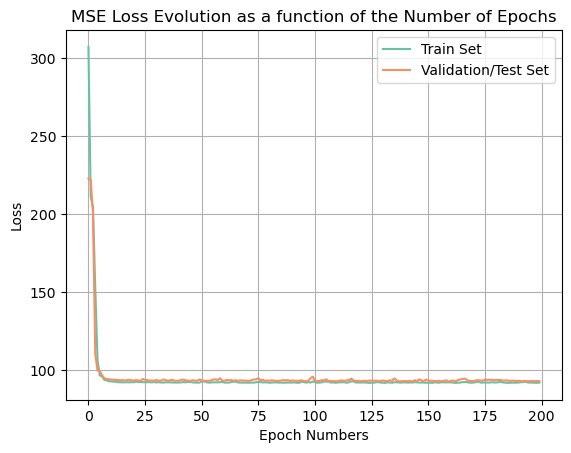

In [729]:
plt.plot(trainLoss,label="Train Set ") # Call
plt.plot(testLoss,label="Validation/Test Set")
plt.legend()
plt.title("MSE Loss Evolution as a function of the Number of Epochs")
plt.xlabel("Epoch Numbers")
plt.ylabel("Loss")
plt.grid()


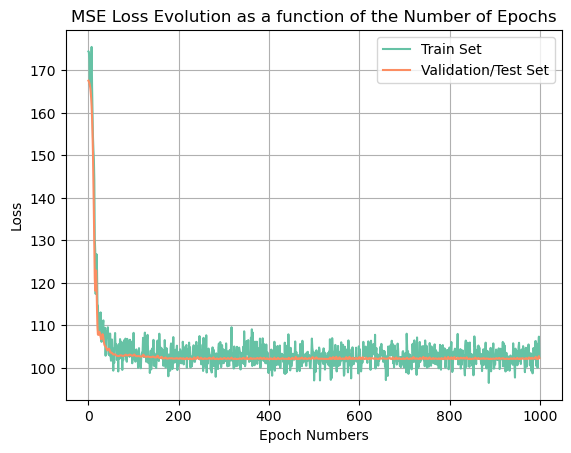

In [582]:
plt.plot(trainLoss,label="Train Set ")
plt.plot(testLoss,label="Validation/Test Set")
plt.legend()
plt.title("MSE Loss Evolution as a function of the Number of Epochs")
plt.xlabel("Epoch Numbers")
plt.ylabel("Loss")
plt.grid()


In [698]:
# Getting Some Metrics from now

MSETrain = trainLoss[-1].detach().numpy()
MSETest = testLoss[-1].detach().numpy()
MAETrain = MAETrainLoss[-1].detach().numpy()
MAETest = MAETestLoss[-1].detach().numpy()

Metrics = pd.DataFrame([MSETrain,MSETest,MAETrain,MAETest],index=["MSETrain","MSETest","MAETrain","MAETest"],columns=["Metrics"])

Metrics

,Metrics
MSETrain,0.0
MSETest,0.0
MAETrain,0.0
MAETest,0.0


In [722]:
#S0=( 100-dataset["S0"].min())/ (dataset["S0"].max() -dataset["S0"].min())
S0 = (100-dataset["S0"].mean()) / dataset["S0"].std()
K= (100-dataset["S0"].mean()) / dataset["S0"].std()
#S0=110
Xtensor = torch.tensor([S0,K],dtype=torch.float32)
#tensor = #torh.tensor([S0,K,r,sigma])
time = np.linspace(0,1,101)
y_predNNForward =net.forward(Xtensor)


In [689]:
def EEForward(S0,K,r,sigma,t,T):
    d1=(np.log(S0/K) + 0.5*pow(sigma,2)*t) / (sigma*np.sqrt(t))
    d2=d1-sigma*np.sqrt(t)
    return S0 *N(d1) - K*np.exp(-r*T) * N(d2)
    


TrueEEForward=[]
for element in time[1:]:
    TrueEEForward.append(EEForward(110,100,0.03,0.2,element,1))
    

<h3> Call </h3>

In [714]:
# Getting Some Metrics from now Call

MSETrain = trainLoss[-1].detach().numpy()
MSETest = testLoss[-1].detach().numpy()
MAETrain = MAETrainLoss[-1].detach().numpy()
MAETest = MAETestLoss[-1].detach().numpy()

Metrics = pd.DataFrame([MSETrain,MSETest,MAETrain,MAETest],index=["MSETrain","MSETest","MAETrain","MAETest"],columns=["Metrics"])

Metrics

,Metrics
MSETrain,92.155991
MSETest,92.567146
MAETrain,6.766870
MAETest,6.739084


In [730]:
# Getting Some Metrics from now Call

MSETrain = trainLoss[-1].detach().numpy()
MSETest = testLoss[-1].detach().numpy()
MAETrain = MAETrainLoss[-1].detach().numpy()
MAETest = MAETestLoss[-1].detach().numpy()

Metrics = pd.DataFrame([MSETrain,MSETest,MAETrain,MAETest],index=["MSETrain","MSETest","MAETrain","MAETest"],columns=["Metrics"])

Metrics

,Metrics
MSETrain,92.209297
MSETest,93.212433
MAETrain,6.813858
MAETest,6.739231


In [753]:
#S0=( 100-dataset["S0"].min())/ (dataset["S0"].max() -dataset["S0"].min())
S0 = (110-dataset["S0"].mean()) / dataset["S0"].std()
K = (100-dataset["K"].mean()) / dataset["K"].std()

#S0=110
Xtensor = torch.tensor([S0,K],dtype=torch.float32)
#tensor = #torh.tensor([S0,K,r,sigma])
time = np.linspace(0,1,100)
y_predNNCall =net.forward(Xtensor)


In [754]:
y_predNNCall

tensor([16.5309, 16.5615, 16.5730, 16.6005, 16.6477, 16.6299, 16.6518, 16.7106,
        16.7239, 16.7333, 16.7355, 16.6983, 16.6305, 16.6912, 16.6950, 16.6284,
        16.6877, 16.6925, 16.7122, 16.6056, 16.6259, 16.6691, 16.6536, 16.6560,
        16.6424, 16.6362, 16.6719, 16.6956, 16.7090, 16.6549, 16.5927, 16.6410,
        16.6482, 16.6077, 16.6178, 16.6018, 16.6103, 16.6247, 16.6208, 16.6139,
        16.5806, 16.5195, 16.5903, 16.5804, 16.5843, 16.5763, 16.5506, 16.6099,
        16.6383, 16.5788, 16.5788, 16.6507, 16.6209, 16.6301, 16.5804, 16.5874,
        16.5751, 16.5450, 16.5544, 16.5111, 16.4796, 16.4894, 16.5042, 16.5165,
        16.4865, 16.4959, 16.4575, 16.4701, 16.4393, 16.4986, 16.4129, 16.3359,
        16.4065, 16.4080, 16.3529, 16.3272, 16.3783, 16.3051, 16.3679, 16.3744,
        16.3997, 16.4183, 16.4101, 16.4721, 16.4629, 16.4000, 16.4552, 16.4648,
        16.5006, 16.5802, 16.5213, 16.4922, 16.4900, 16.5444, 16.4984, 16.4644,
        16.4645, 16.4548, 16.4887, 16.48

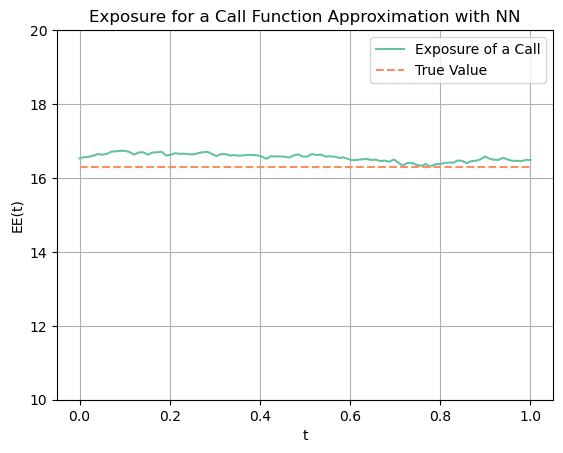

In [755]:

plt.plot(time,y_predNNCall.detach().numpy(),label="Exposure of a Call")
plt.plot(time,TrueCallValue,'--',label="True Value")
plt.legend()
plt.title("Exposure for a Call Function Approximation with NN")

plt.xlabel("t")
plt.ylabel("EE(t)")
plt.ylim(10, 20)

plt.savefig("ExposureCalculationS0110K100.png")

plt.grid()

In [438]:
for i in tqdm(range(TrainingSetCallData.describe().shape[1])):
    y_pred[i] = (TrainingSetCallData.describe()[i]["max"]-TrainingSetCallData.describe()[i]["min"]) * y_predNN[i] + TrainingSetCallData.describe()[i]["min"]


 95%|██████████████████████████████████████████████████████████████████████████████    | 20/21 [00:01<00:00, 14.00it/s]


IndexError: index 20 is out of bounds for dimension 0 with size 20

In [577]:
TrueCallPrice = 9.413
TrueCallValue = [TrueCallPrice for i in range(len(time))]

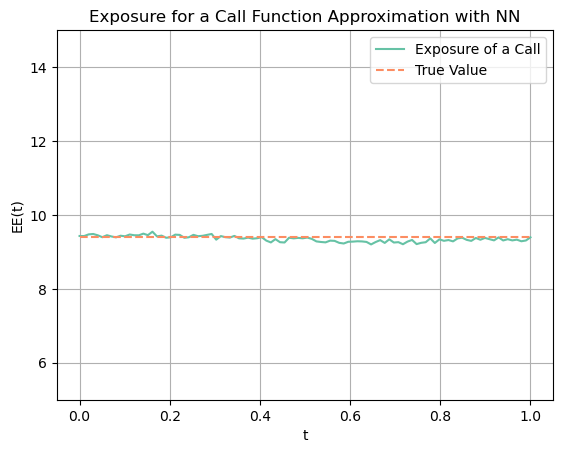

In [702]:

plt.plot(time,y_predNNCall.detach().numpy(),label="Exposure of a Call")
plt.plot(time,TrueCallValue,'--',label="True Value")
plt.legend()
plt.title("Exposure for a Call Function Approximation with NN")

plt.xlabel("t")
plt.ylabel("EE(t)")
plt.ylim(5, 15)


plt.grid()

In [105]:
Exposure = y_predNN.detach().numpy()

In [80]:
Xtensor = torch.tensor([S0,K,r,sigma])
scaler.fit_transform(Xtensor)

ValueError: Expected 2D array, got 1D array instead:
array=[1.00000000e+02 1.00000000e+02 2.99999993e-02 1.50000006e-01].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

In [70]:
y_predNN

tensor([7.8719, 7.9889, 7.8028, 8.1755, 7.7772, 7.8474, 8.0995, 7.7089, 7.7215,
        7.9019, 7.7228, 7.7790, 8.1028, 7.8292, 7.7607, 7.7607, 7.8360, 7.7499,
        7.6223, 7.9541, 7.7822, 7.6496, 7.7068, 7.6623, 7.7159, 7.9457, 7.6758,
        7.9194, 7.8830, 7.5999, 7.7592, 7.6275, 7.9267, 7.7277, 7.7097, 7.7920,
        7.4265, 7.4549, 7.6985, 7.7648, 7.9005, 7.7967, 7.9828, 8.0967, 7.5732,
        7.8963, 7.9480, 8.0271, 7.7821, 7.8165, 7.6548, 7.8014, 7.6863, 7.8514,
        7.9529, 7.8069, 7.6135, 7.5922, 7.9685, 7.8052, 7.7332, 7.7310, 7.9476,
        7.6441, 7.4865, 7.7652, 7.4034, 7.8478, 7.5068, 7.5066, 7.6449, 7.4733,
        7.7003, 7.7022, 8.0378, 7.5952, 7.6188, 7.5402, 7.3603, 7.5117, 7.6943,
        7.5317, 7.4722, 7.1219, 7.3307, 7.0949, 7.3142, 7.2505, 7.2924, 7.2120,
        7.5354, 7.3352, 7.5208, 7.1970, 7.3275, 7.2558, 7.3364, 7.3767, 7.2496,
        7.2784], grad_fn=<ViewBackward0>)